```
MODELS:
1. TabPFN
2. ANN
3. PSO-XGBoost
4. PSO-GBR
5. PSO-CatBoost
6. PSO-AdaBoost
```
Features:
1. Flue Gas CO2 (mol%)
2. Flue Gas Flow (kg/h)
3. Lean Solvent Flow (kg/h)
4. CO2-amine Loading (Lean Solvent Loading)
5. Amine Type
6. Amine Concentration (wt%)
7. Lean Solvent Temperature
8. Reboiler Duty

Targets:
1. Recovery%
2. SEC (kJ/kg)
3. CO2 Purity (mol%)


# **Data cleaning and pre-processing**

## Importing the Necessary Libraries

In [1]:
import numpy as np
import pandas as pd
import seaborn as sns
import matplotlib.pyplot as plt
from sklearn.model_selection import train_test_split, cross_val_score, GridSearchCV
from sklearn.metrics import r2_score, mean_squared_error, mean_absolute_error
from sklearn.preprocessing import StandardScaler

## Importing the data and cleaning

In [2]:
from google.colab import files
uploaded = files.upload()
file_name = list(uploaded.keys())[0]
df = pd.read_excel(file_name)

df.to_csv("Data.csv", index=True)
print("First 5 rows of data:")
df.head()

Saving Dataset.xlsx to Dataset.xlsx
First 5 rows of data:


,Fluegas CO2 mol%,Fluegas Flow (kg/h),Lean Solvent Flow (kg/h),Lean Solvent Loading,Amine type,Amine Conc (wt%),Lean Solvent T (C),Reboiler Duty (MW),Recovery%,SEC (kJ/kg),CO2 Purity (mol%)
0,2.0,1500000,799999.978656,0.549078,MEA,14.992197,37,334.722,79.245274,56719.0360,15.717487
1,2.5,1500000,800000.056029,0.684311,MEA,14.992198,37,334.722,65.364609,55194.9810,16.260676
2,3.0,1500000,800000.046691,0.818743,MEA,14.992230,37,334.722,55.797255,54052.4141,16.691000
3,3.5,1500000,800000.030682,0.952395,MEA,14.992265,37,334.722,48.786473,53151.3501,17.046290
4,4.0,1500000,800000.038687,1.085248,MEA,14.992301,37,334.722,43.422744,52411.0539,17.349306


In [3]:
print("Before dropna:", df.shape)
df_cleaned = df.dropna()
print("After dropna:", df_cleaned.shape)

# Check missing data
print(df.isna().sum())

# Drop only rows where 'Amine type' is missing
df_cleaned = df.dropna(subset=['Amine type'])

# Encode
df_cleaned = df_cleaned.replace({
    'Amine type': {'MEA': 1, 'DGA': 2, 'DEA': 3, 'TEA': 4, 'MDEA': 5}
})

# Save
df_cleaned.to_csv('cleaned_data_encoded.csv', index=True)
print("Encoded DataFrame saved as 'cleaned_data_encoded.csv'")

# Reload
data = pd.read_csv('cleaned_data_encoded.csv')
data.head()


Before dropna: (4426, 11)
After dropna: (4426, 11)
Fluegas CO2 mol%            0
Fluegas Flow (kg/h)         0
Lean Solvent Flow (kg/h)    0
Lean Solvent Loading        0
Amine type                  0
Amine Conc (wt%)            0
Lean Solvent T (C)          0
Reboiler Duty (MW)          0
Recovery%                   0
SEC (kJ/kg)                 0
CO2 Purity (mol%)           0
dtype: int64
✅ Encoded DataFrame saved as 'cleaned_data_encoded.csv'


/tmp/ipython-input-601/3708416790.py:12: FutureWarning: Downcasting behavior in `replace` is deprecated and will be removed in a future version. To retain the old behavior, explicitly call `result.infer_objects(copy=False)`. To opt-in to the future behavior, set `pd.set_option('future.no_silent_downcasting', True)`
  df_cleaned = df_cleaned.replace({


,Unnamed: 0,Fluegas CO2 mol%,Fluegas Flow (kg/h),Lean Solvent Flow (kg/h),Lean Solvent Loading,Amine type,Amine Conc (wt%),Lean Solvent T (C),Reboiler Duty (MW),Recovery%,SEC (kJ/kg),CO2 Purity (mol%)
0,0,2.0,1500000,799999.978656,0.549078,1,14.992197,37,334.722,79.245274,56719.0360,15.717487
1,1,2.5,1500000,800000.056029,0.684311,1,14.992198,37,334.722,65.364609,55194.9810,16.260676
2,2,3.0,1500000,800000.046691,0.818743,1,14.992230,37,334.722,55.797255,54052.4141,16.691000
3,3,3.5,1500000,800000.030682,0.952395,1,14.992265,37,334.722,48.786473,53151.3501,17.046290
4,4,4.0,1500000,800000.038687,1.085248,1,14.992301,37,334.722,43.422744,52411.0539,17.349306


## Feature Selection (before standardization)

### Heat map

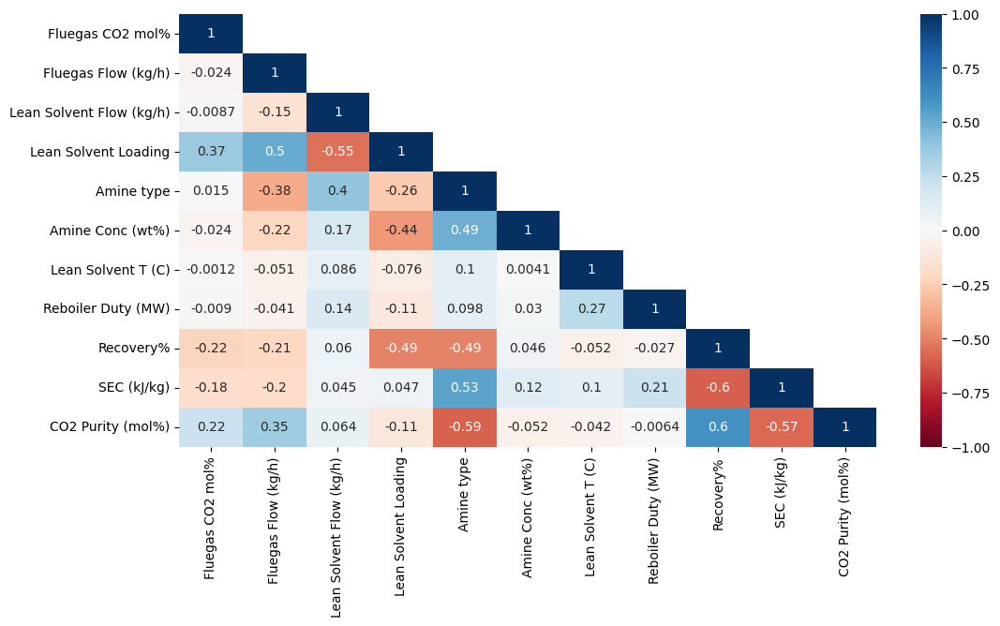

In [10]:
# Drop the "Unnamed: 0" column from the data
# data = data.drop(columns=['Unnamed: 0'])

# Now generate the correlation matrix and heatmap
plt.figure(figsize=(12, 6))
mask = np.triu(np.ones_like(data.corr(), dtype=bool), k=1)
heatmap = sns.heatmap(data.corr(), mask=mask, vmin=-1, vmax=1, annot=True, cmap='RdBu')

# Save the plot as a PNG with 600 dpi
plt.savefig('correlation_heatmap.png', dpi=600, bbox_inches='tight')
plt.savefig('correlation_heatmap.svg',bbox_inches='tight')

### Box plot

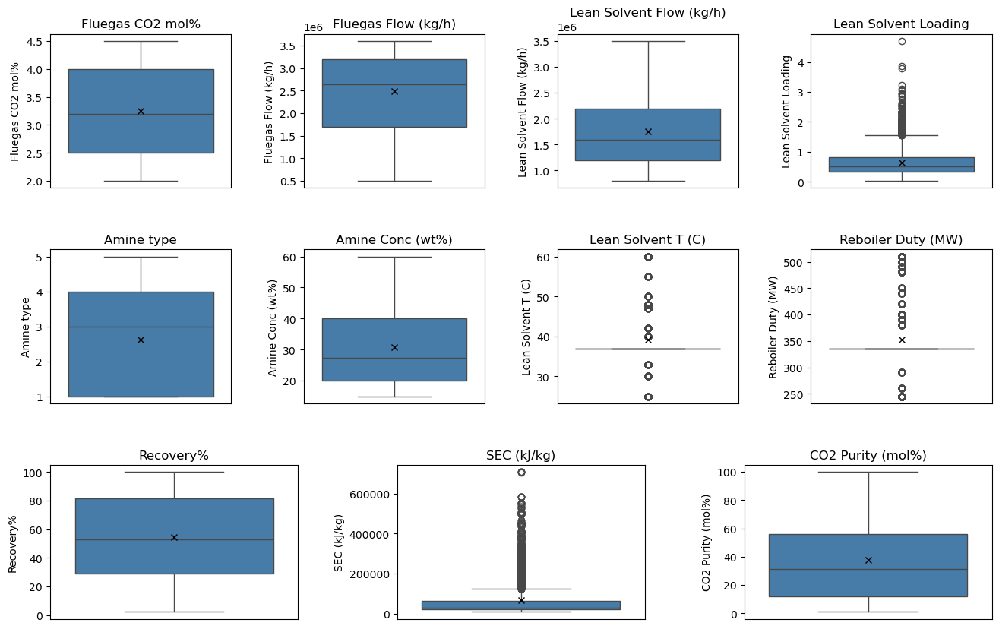

In [ ]:
import matplotlib.pyplot as plt
import seaborn as sns
import matplotlib.gridspec as gridspec

box_color = "#377eb8"
cols = list(data.columns)          # 11 parameters
n = len(cols)

fig = plt.figure(figsize=(16, 10))

# Outer grid: 3 rows, 1 column → each row takes full width
outer = gridspec.GridSpec(3, 1, height_ratios=[1, 1, 1], hspace=0.4)

# Row 1: 4 plots
gs_top = outer[0].subgridspec(1, 4, wspace=0.4)
# Row 2: 4 plots
gs_mid = outer[1].subgridspec(1, 4, wspace=0.4)
# Row 3: 3 centered plots
gs_bot = outer[2].subgridspec(1, 3, wspace=0.4)

idx = 0

# ---- First row (4 plots) ----
for j in range(4):
    if idx >= n:
        break
    ax = fig.add_subplot(gs_top[0, j])
    sns.boxplot(
        y=data[cols[idx]],
        ax=ax,
        color=box_color,
        showmeans=True,
        meanprops={"marker": "x",
                   "markeredgecolor": "black",
                   "markerfacecolor": "black"}
    )
    ax.set_title(cols[idx], fontsize=12)
    ax.set_xticks([])
    idx += 1

# ---- Second row (4 plots) ----
for j in range(4):
    if idx >= n:
        break
    ax = fig.add_subplot(gs_mid[0, j])
    sns.boxplot(
        y=data[cols[idx]],
        ax=ax,
        color=box_color,
        showmeans=True,
        meanprops={"marker": "x",
                   "markeredgecolor": "black",
                   "markerfacecolor": "black"}
    )
    ax.set_title(cols[idx], fontsize=12)
    ax.set_xticks([])
    idx += 1

# ---- Third row (3 centered plots) ----
for j in range(3):
    if idx >= n:
        break
    ax = fig.add_subplot(gs_bot[0, j])
    sns.boxplot(
        y=data[cols[idx]],
        ax=ax,
        color=box_color,
        showmeans=True,
        meanprops={"marker": "x",
                   "markeredgecolor": "black",
                   "markerfacecolor": "black"}
    )
    ax.set_title(cols[idx], fontsize=12)
    ax.set_xticks([])
    idx += 1

plt.savefig('Figures/boxPlot.png', dpi=600, bbox_inches='tight')

plt.show()


### Violin-Box Plots

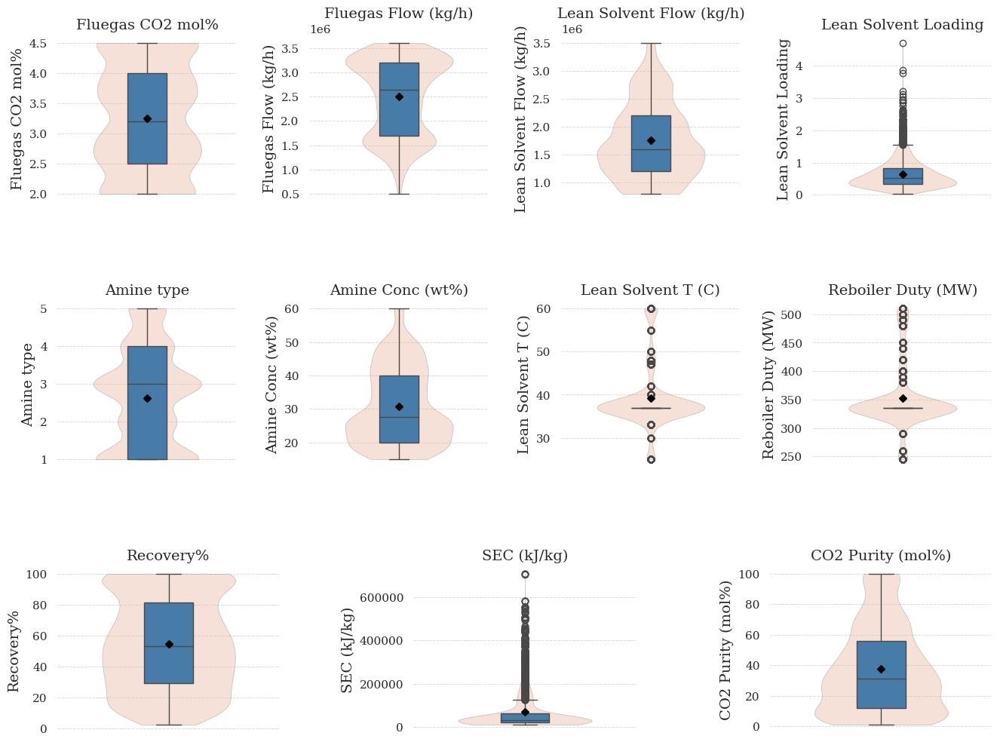

In [13]:
import matplotlib.pyplot as plt
import seaborn as sns
import pandas as pd
import math
import matplotlib.gridspec as gridspec

# ---- Data ----
numeric_df = data.select_dtypes(include=["float64", "int64"])

# ---- Journal styling ----
sns.set_theme(style="whitegrid", font_scale=1.3, rc={
    "axes.labelsize": 14,
    "axes.titlesize": 16,
    "xtick.labelsize": 11,
    "ytick.labelsize": 11,
    "axes.linewidth": 1.2,
    "font.family": "serif",
})

# Colors
box_color   = "#377eb8"   # your chosen blue
violin_col  = "#f4a582"   # light red (RdBu-compatible)

cols = list(numeric_df.columns)
num_features = len(cols)   # e.g. 11

# Figure and outer grid: 3 rows x 1 col
fig = plt.figure(figsize=(16, 12))
outer = gridspec.GridSpec(3, 1, figure=fig, hspace=0.6)

# Row 1: 4 plots
gs_top = outer[0].subgridspec(1, 4, wspace=0.4)
# Row 2: 4 plots
gs_mid = outer[1].subgridspec(1, 4, wspace=0.4)
# Row 3: 3 centered plots (they span full width, so naturally centered)
gs_bot = outer[2].subgridspec(1, 3, wspace=0.6)

idx = 0

# ---- First row (up to 4 features) ----
for j in range(4):
    if idx >= num_features:
        break
    ax = fig.add_subplot(gs_top[0, j])

    sns.violinplot(
        y=numeric_df[cols[idx]],
        ax=ax,
        color=violin_col,
        inner=None,
        cut=0,
        bw_adjust=1.4,
        alpha=0.35,
        linewidth=0.6,
        width=0.6
    )

    sns.boxplot(
        y=numeric_df[cols[idx]],
        ax=ax,
        width=0.22,
        color=box_color,
        showmeans=True,
        meanprops={
            "marker": "D",
            "markeredgecolor": "black",
            "markerfacecolor": "black",
            "markersize": 5
        }
    )

    ax.set_title(cols[idx], fontsize=14)
    ax.set_xticks([])
    ax.yaxis.grid(True, linestyle="--", linewidth=0.7, alpha=0.7)
    sns.despine(ax=ax, left=True, bottom=True)

    idx += 1

# ---- Second row (next up to 4 features) ----
for j in range(4):
    if idx >= num_features:
        break
    ax = fig.add_subplot(gs_mid[0, j])

    sns.violinplot(
        y=numeric_df[cols[idx]],
        ax=ax,
        color=violin_col,
        inner=None,
        cut=0,
        bw_adjust=1.4,
        alpha=0.35,
        linewidth=0.6,
        width=0.6
    )

    sns.boxplot(
        y=numeric_df[cols[idx]],
        ax=ax,
        width=0.22,
        color=box_color,
        showmeans=True,
        meanprops={
            "marker": "D",
            "markeredgecolor": "black",
            "markerfacecolor": "black",
            "markersize": 5
        }
    )

    ax.set_title(cols[idx], fontsize=14)
    ax.set_xticks([])
    ax.yaxis.grid(True, linestyle="--", linewidth=0.7, alpha=0.7)
    sns.despine(ax=ax, left=True, bottom=True)

    idx += 1

# ---- Third row (3 centered plots) ----
for j in range(3):
    if idx >= num_features:
        break
    ax = fig.add_subplot(gs_bot[0, j])

    sns.violinplot(
        y=numeric_df[cols[idx]],
        ax=ax,
        color=violin_col,
        inner=None,
        cut=0,
        bw_adjust=1.4,
        alpha=0.35,
        linewidth=0.6,
        width=0.6
    )

    sns.boxplot(
        y=numeric_df[cols[idx]],
        ax=ax,
        width=0.22,
        color=box_color,
        showmeans=True,
        meanprops={
            "marker": "D",
            "markeredgecolor": "black",
            "markerfacecolor": "black",
            "markersize": 5
        }
    )

    ax.set_title(cols[idx], fontsize=14)
    ax.set_xticks([])
    ax.yaxis.grid(True, linestyle="--", linewidth=0.7, alpha=0.7)
    sns.despine(ax=ax, left=True, bottom=True)

    idx += 1

plt.savefig("violin_box_subplots.png", dpi=600, bbox_inches="tight")
plt.savefig("violin_box_subplots.svg", bbox_inches="tight")
plt.show()


### Pair plots

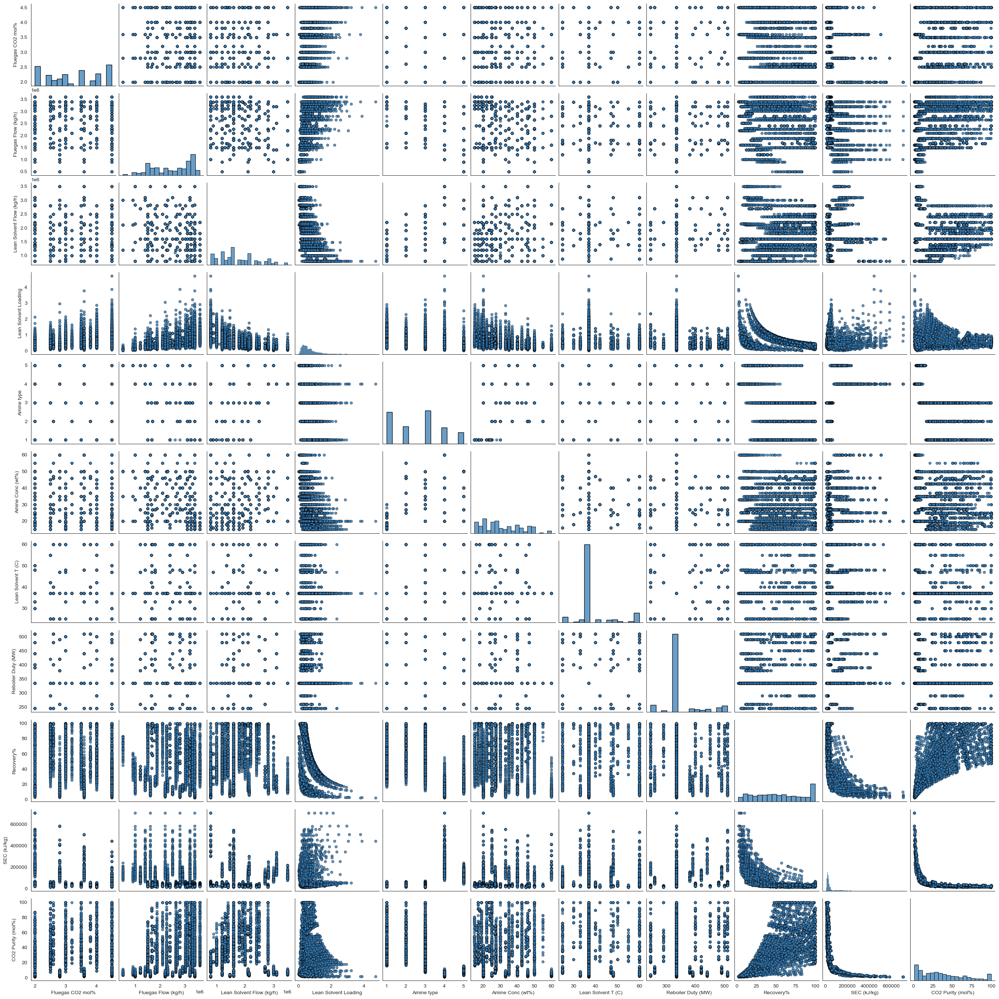

In [ ]:
import seaborn as sns
import matplotlib.pyplot as plt

sns.set_style("white")

# Unified color matching your palette
point_color = "#377eb8"   # chosen medium blue

# Create pairplot with professional styling
g = sns.pairplot(
    data,
    diag_kind="hist",
    plot_kws={
        "s": 25,                # marker size
        "color": point_color,   # fill color
        "edgecolor": "black",   # outline color
        "linewidth": 0.5,       # thickness of outline
        "alpha": 0.8            # slight transparency
    },
    diag_kws={
        "color": point_color,
        "edgecolor": "black"
    }
)

plt.savefig('Figures/pairPlot.png', dpi=1000, bbox_inches='tight')
plt.show()


## Train/Test dataset, standardization, and evaluation function

In [4]:
from sklearn.model_selection import train_test_split
import pandas as pd
data = pd.read_csv("cleaned_data_encoded.csv")
train_set , test_set = train_test_split(data, test_size=0.2 ,random_state=42,shuffle=True, stratify=None)

# test data
ts = test_set.copy()

ts_label1 = ts["Recovery%"].copy()
ts_label2 = ts["SEC (kJ/kg)"].copy()
ts_label3 = ts["CO2 Purity (mol%)"].copy()
ts = ts.drop(["Recovery%", "SEC (kJ/kg)", "CO2 Purity (mol%)"],axis=1)

# train data
df = train_set.copy()

df_label1 = df["Recovery%"].copy()           # Only the first target is kept
df_label2 = df["SEC (kJ/kg)"].copy()         # Only the second target is kept
df_label3 = df["CO2 Purity (mol%)"].copy()   # Only the third target is kept
df = df.drop(["Recovery%", "SEC (kJ/kg)", "CO2 Purity (mol%)"],axis=1) # drop targets (Only features are kept)

df.head()

,Unnamed: 0,Fluegas CO2 mol%,Fluegas Flow (kg/h),Lean Solvent Flow (kg/h),Lean Solvent Loading,Amine type,Amine Conc (wt%),Lean Solvent T (C),Reboiler Duty (MW)
1905,1905,2.5,2260000,2.000000e+06,0.282522,3,34.990020,37,334.722
436,436,4.5,3250000,1.200000e+06,1.055938,1,24.965321,37,334.722
2669,2669,4.5,1500000,1.000000e+06,0.679469,2,36.984933,37,334.722
2793,2793,2.6,3100000,1.300000e+06,0.631218,2,36.980056,37,334.722
3771,3771,4.5,2900000,2.700000e+06,0.510001,5,39.990386,25,490.000


In [5]:
# Standardization
from sklearn.preprocessing import StandardScaler
scaler = StandardScaler()
# train data
df_scaled = pd.DataFrame(
    scaler.fit_transform(df), # train data
    columns=df.columns,      # keep original names
    index=df.index           # keep original index
)
# test data
ts_scaled = pd.DataFrame(
    scaler.transform(ts), # test
    columns=ts.columns, # keep original names
    index=ts.index
)

df = df_scaled.copy()
ts = ts_scaled.copy()
df.head()

,Unnamed: 0,Fluegas CO2 mol%,Fluegas Flow (kg/h),Lean Solvent Flow (kg/h),Lean Solvent Loading,Amine type,Amine Conc (wt%),Lean Solvent T (C),Reboiler Duty (MW)
1905,-0.245836,-0.867272,-0.306545,0.366040,-0.813385,0.283017,0.361683,-0.289878,-0.308904
436,-1.402357,1.425590,0.949833,-0.845417,0.937634,-1.240754,-0.517886,-0.289878,-0.308904
2669,0.355649,1.425590,-1.271037,-1.148281,0.085305,-0.478868,0.536717,-0.289878,-0.308904
2793,0.453272,-0.752629,0.759473,-0.693985,-0.023935,-0.478868,0.536289,-0.289878,-0.308904
3771,1.223236,1.425590,0.505659,1.426064,-0.298372,1.806787,0.800417,-1.808437,2.296683


**evaluation metrics**

In [6]:
from sklearn.metrics import (r2_score, mean_squared_error, mean_absolute_error,
                            mean_absolute_percentage_error, median_absolute_error,
                            explained_variance_score, root_mean_squared_log_error)

def evaluate(true, pred, label="Test", control=None):
    # 1. R2 score
    r2 = r2_score(true, pred)
    # 2. Adjusted R2 score
    if label == "Test":
      n = ts.shape[0]
    elif label == "Train":
      n = df.shape[0]
    elif label == "Total":
      n = ts.shape[0] + df.shape[0]
    else:
      raise ValueError("Invalid label. Use 'Test' or 'Train' or 'Total'.")

    k = df.shape[1] # number of features
    adj_r2 = 1 - (1-r2)*(n-1)/ (n-k-1)
    # 3.mean squared error
    mse = mean_squared_error(true, pred)
    # 4.root mean squared error
    rmse = np.sqrt(mse)
    # 5.Normalized RMSE
    nrmse = rmse / (true.max() - true.min())
    # 6.Standard Deviation of Errors
    std_er = np.std(true - pred)
    # 7.Mean Absolute Error
    mae = mean_absolute_error(true, pred)
    # 8.Mean Absolute Percentage Error
    mape = mean_absolute_percentage_error(true, pred)
    # 9.Median Absolute Error
    medae = median_absolute_error(true, pred)
    # 10.Explained Variance Score
    evs = explained_variance_score(true, pred, force_finite=False)

    # Print the metrics
    print(f"\n--- {label} set metrics ---")
    print(f"R²     : {r2:.4f}")
    print(f"Adj-R² : {adj_r2:.4f}")
    print(f"MSE    : {mse:.6f}")
    print(f"RMSE   : {rmse:.6f}")
    print(f"NRMSE  : {nrmse:.6f}")
    print(f"std_er : {std_er:.6f}")
    print(f"MAE    : {mae:.6f}")
    print(f"MAPE   : {mape:.6f}")
    print(f"MedAE  : {medae:.6f}")
    print(f"EVS    : {evs:.6f}")

    return r2, adj_r2, mse, rmse, nrmse, std_er, mae, mape, medae, evs

# **Target1: Recovery**

## ANN-Recovery

In [38]:
xtrain = df.copy()
xtest = ts.copy()
# Recovery%
ytrain = df_label1.copy()
ytest = ts_label1.copy()
pd.concat([xtrain, ytrain]).describe().transpose()

,count,mean,std,min,25%,50%,75%,max
Unnamed: 0,3540.0,1.010491e-16,1.000141,-1.745613,-0.861689,-0.006108,0.864628,1.737333
Fluegas CO2 mol%,3540.0,1.298396e-16,1.000141,-1.440487,-0.867272,-0.064770,0.852375,1.425590
Fluegas Flow (kg/h),3540.0,-2.413637e-16,1.000141,-2.540105,-1.017223,0.251846,0.886380,1.394007
Lean Solvent Flow (kg/h),3540.0,-3.625474e-16,1.000141,-1.451145,-0.845417,-0.239688,0.668904,2.637521
Lean Solvent Loading,3540.0,1.043735e-16,1.000141,-1.388390,-0.710245,-0.272846,0.418934,9.193916
Amine type,3540.0,-1.186747e-16,1.000141,-1.240754,-1.240754,0.283017,1.044902,1.806787
Amine Conc (wt%),3540.0,1.333836e-16,1.000141,-1.396555,-0.953182,-0.296676,0.801302,2.556344
Lean Solvent T (C),3540.0,-2.816328e-16,1.000141,-1.808437,-0.289878,-0.289878,-0.289878,2.620695
Reboiler Duty (MW),3540.0,1.120573e-15,1.000141,-1.814452,-0.308904,-0.308904,-0.308904,2.632286
Recovery%,3540.0,5.454637e+01,30.185855,2.145733,28.626326,52.966100,81.686530,99.964621


**tuning the hyperparameters**

In [ ]:
!pip install keras_tuner

   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 129.1/129.1 kB 5.5 MB/s eta 0:00:00


In [39]:
!pip install tensorflow.keras

In [ ]:
import keras_tuner as kt
from tensorflow import keras
from tensorflow.keras import layers
import tensorflow as tf
import numpy as np
import random

# --- Fix seeds for reproducibility ---
SEED = 42
tf.random.set_seed(SEED)
np.random.seed(SEED)
random.seed(SEED)

# -- Normalizer ---
normalizer = keras.layers.Normalization()
normalizer.adapt(np.array(xtrain))

def build_model(hp):
    model = keras.Sequential()
    model.add(normalizer)

    # Tune number of hidden layers (1 to 3)
    for i in range(hp.Int('num_layers', 1, 3)):
        model.add(layers.Dense(
            units=hp.Int(f'units_{i}', min_value=16, max_value=128, step=8),
            activation='relu'
        ))

    # Output layer
    model.add(layers.Dense(1))

    # Tune learning rate
    learning_rate = hp.Choice('learning_rate', values=[1e-1, 1e-2, 1e-3, 1e-4])
    model.compile(
        optimizer=keras.optimizers.Adam(learning_rate=learning_rate),
        loss='mean_absolute_error'
    )
    return model

# Instantiate tuner (set seed here too)
tuner = kt.RandomSearch(
    build_model,
    objective='val_loss',
    max_trials=10,
    executions_per_trial=1,
    directory='tuner_dir',
    project_name='ann_tuning',
    overwrite=True,  # ensures consistency between runs
    seed=SEED        # ensures deterministic search
)

# Search best hyperparameters
tuner.search(xtrain, ytrain,
             epochs=50,
             validation_split=0.2,
             verbose=1)

# Retrieve best model and hyperparameters
best_model = tuner.get_best_models(num_models=1)[0]
best_hps = tuner.get_best_hyperparameters(num_trials=1)[0]

print("Best number of layers:", best_hps.get('num_layers'))
for i in range(best_hps.get('num_layers')):
    print(f"Units in layer {i}:", best_hps.get(f'units_{i}'))
print("Best learning rate:", best_hps.get('learning_rate'))

# Train best model
best_model.fit(xtrain, ytrain, epochs=100, validation_split=0.2, verbose=1)

Trial 10 Complete [00h 00m 21s]
val_loss: 0.8876184821128845

Best val_loss So Far: 0.8876184821128845
Total elapsed time: 00h 04m 20s
Best number of layers: 3
Units in layer 0: 32
Units in layer 1: 72
Units in layer 2: 32
Best learning rate: 0.01
Epoch 1/100


/usr/local/lib/python3.12/dist-packages/keras/src/saving/saving_lib.py:802: UserWarning: Skipping variable loading for optimizer 'adam', because it has 2 variables whereas the saved optimizer has 18 variables. 
  saveable.load_own_variables(weights_store.get(inner_path))


89/89 ━━━━━━━━━━━━━━━━━━━━ 3s 19ms/step - loss: 2.3368 - val_loss: 1.1361
Epoch 2/100
89/89 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - loss: 1.2287 - val_loss: 0.9892
Epoch 3/100
89/89 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - loss: 1.2424 - val_loss: 1.4357
Epoch 4/100
89/89 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - loss: 1.1677 - val_loss: 1.3820
Epoch 5/100
89/89 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - loss: 1.2609 - val_loss: 1.0723
Epoch 6/100
89/89 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - loss: 1.0994 - val_loss: 1.1202
Epoch 7/100
89/89 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - loss: 1.0843 - val_loss: 1.0265
Epoch 8/100
89/89 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - loss: 1.1810 - val_loss: 1.4490
Epoch 9/100
89/89 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - loss: 1.2868 - val_loss: 0.9962
Epoch 10/100
89/89 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - loss: 1.1965 - val_loss: 0.8574
Epoch 11/100
89/89 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - loss: 0.9674 - val_loss: 1.2519
Epoch 12/100
89/89 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - loss: 1.0239 - val_l

In [ ]:
best_model.summary()

Model: "sequential"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ normalization (Normalization)   │ (None, 8)              │            17 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense (Dense)                   │ (None, 32)             │           288 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1 (Dense)                 │ (None, 72)             │         2,376 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_2 (Dense)                 │ (None, 32)             │         2,336 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_3 (Dense)                 │ (None, 1)              │            33 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 15,118 (59.06 KB)

 Trainable params: 5,033 (19.66 KB)

 Non-trainable params: 17 (72.00 B)

 Optimizer params: 10,068 (39.33 KB)

In [ ]:
best_model.compile(optimizer = keras.optimizers.Adam(), #keras.optimizers.Adam change if needed
              loss= 'mean_absolute_error')
best_model.fit(xtrain, ytrain, verbose=0, epochs=101)

# predctions
y_pred_test_ann1 = best_model.predict(xtest).flatten()
y_pred_train_ann1 = best_model.predict(xtrain).flatten()

28/28 ━━━━━━━━━━━━━━━━━━━━ 1s 14ms/step
111/111 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step


In [ ]:
# Make sure both arrays are 1D
train_vals = y_pred_train_ann1.flatten()
test_vals = y_pred_test_ann1.flatten()

# Pad shorter array with NaN so they align in Excel
max_len = max(len(train_vals), len(test_vals))
train_vals = np.pad(train_vals, (0, max_len - len(train_vals)), constant_values=np.nan)
test_vals = np.pad(test_vals, (0, max_len - len(test_vals)), constant_values=np.nan)

# Create the DataFrame with exactly two columns
df_pred = pd.DataFrame({
    "y_pred_train_ann1": train_vals,
    "y_pred_test_ann1": test_vals
})

# Save to Excel (single sheet)
df_pred.to_excel("ann1_predictions.xlsx", sheet_name="ann1", index=False)

print("✅ Saved to 'ann1_predictions.xlsx'.")

✅ Saved to 'predictions.xlsx'.


In [40]:
## Tunned ANN model for recovery
from tensorflow import keras
from tensorflow.keras import layers
import tensorflow as tf
import numpy as np
import os
import random

SEED = 42
random.seed(SEED)
np.random.seed(SEED)
tf.random.set_seed(SEED)
os.environ['PYTHONHASHSEED'] = str(SEED)
os.environ['TF_DETERMINISTIC_OPS'] = '1'


n_features = xtrain.shape[1]
# Best model
ann_model1 = keras.Sequential([
    layers.Input(shape=(n_features,)),
    layers.Dense(32, activation='relu'),
    layers.Dense(72, activation='relu'),
    layers.Dense(32, activation='relu'),
    layers.Dense(1)                       # single output
])

# Compile
ann_model1.compile(optimizer=keras.optimizers.Adam(learning_rate=0.01),
                   loss='mean_absolute_error')
# fit/predict/evaluate
ann_model1.fit(xtrain, ytrain, epochs=100, batch_size=32, verbose=0)


y_pred_test_ann1 = ann_model1.predict(xtest).flatten()
y_pred_train_ann1 = ann_model1.predict(xtrain).flatten()

28/28 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step
111/111 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step



--- Train set metrics ---
R²     : 0.9992
Adj-R² : 0.9992
MSE    : 0.686236
RMSE   : 0.828393
NRMSE  : 0.008469
std_er : 0.826936
MAE    : 0.564318
MAPE   : 0.014098
MedAE  : 0.382258
EVS    : 0.999249

--- Test set metrics ---
R²     : 0.9990
Adj-R² : 0.9990
MSE    : 0.879685
RMSE   : 0.937915
NRMSE  : 0.009609
std_er : 0.937270
MAE    : 0.623085
MAPE   : 0.016004
MedAE  : 0.402975
EVS    : 0.998998


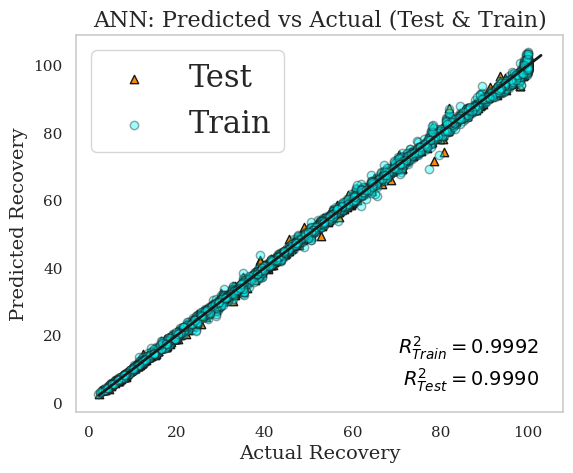

In [41]:
import numpy as np
import matplotlib.pyplot as plt
from sklearn.metrics import r2_score

# Assuming the evaluate function already works as intended
evaluate(ytrain, y_pred_train_ann1, "Train")
evaluate(ytest, y_pred_test_ann1, "Test")

# Calculate R² for Train and Test sets
r2_train = r2_score(ytrain, y_pred_train_ann1)
r2_test = r2_score(ytest, y_pred_test_ann1)

# Create the figure
plt.figure(figsize=(6,5))

# Plot Test data (in blue, using triangles for markers)
plt.scatter(ytest, y_pred_test_ann1, alpha=1, edgecolor="k", label=f"Test", color='darkorange', marker='^')

# Plot Train data (in red)
plt.scatter(ytrain, y_pred_train_ann1, alpha=0.4, edgecolor="k", label=f"Train", color='cyan')

# Get the min and max for axis scaling
mn = min(np.min(ytest), np.min(y_pred_test_ann1))
mx = max(np.max(ytest), np.max(y_pred_test_ann1))

# Plot the diagonal line (perfect prediction line)
plt.plot([mn, mx], [mn, mx], "k-", linewidth=2)

# Labels and Title
plt.xlabel("Actual Recovery")
plt.ylabel("Predicted Recovery")
plt.title("ANN: Predicted vs Actual (Test & Train)")

# Add grid
plt.grid(False)

# Add legend for train and test, including R² values
plt.legend(loc='best', fontsize=22)

# Add R² values text in the southeast corner
textstr = (
    rf'$R^2_{{Train}} = {r2_train:.4f}$' + '\n' +
    rf'$R^2_{{Test}} = {r2_test:.4f}$'
)
# Position the text at the southeast corner
plt.gca().text(0.95, 0.05, textstr, transform=plt.gca().transAxes, fontsize=14,
               verticalalignment='bottom', horizontalalignment='right', color='black')

# Adjust layout and display
plt.tight_layout()
plt.savefig("CrossPlot_ANN_rec.svg", format="svg", dpi=600)
plt.show()

## TabPFN-Recovery

**Installing TabPFN**

In [ ]:
!pip install tabpfn==2.0.0

   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 104.1/104.1 kB 7.0 MB/s eta 0:00:00


**Training the model**

In [ ]:
from tabpfn import TabPFNRegressor

X_train = df.copy().values
y_train = df_label1.copy().values

X_test = ts.copy().values
y_test = ts_label1.copy().values # Recovery

# Initialize the regressor
regressor = TabPFNRegressor()
regressor.fit(X_train, y_train)

# Predict on the test set
y_pred_test_tab1 = regressor.predict(X_test)
y_pred_train_tab1 = regressor.predict(X_train)

/usr/local/lib/python3.12/dist-packages/sklearn/base.py:474: FutureWarning: `BaseEstimator._validate_data` is deprecated in 1.6 and will be removed in 1.7. Use `sklearn.utils.validation.validate_data` instead. This function becomes public and is part of the scikit-learn developer API.
  warnings.warn(
/usr/local/lib/python3.12/dist-packages/sklearn/utils/deprecation.py:151: FutureWarning: 'force_all_finite' was renamed to 'ensure_all_finite' in 1.6 and will be removed in 1.8.
  warnings.warn(
/usr/local/lib/python3.12/dist-packages/sklearn/utils/deprecation.py:151: FutureWarning: 'force_all_finite' was renamed to 'ensure_all_finite' in 1.6 and will be removed in 1.8.
  warnings.warn(
/usr/local/lib/python3.12/dist-packages/sklearn/base.py:474: FutureWarning: `BaseEstimator._validate_data` is deprecated in 1.6 and will be removed in 1.7. Use `sklearn.utils.validation.validate_data` instead. This function becomes public and is part of the scikit-learn developer API.
  warnings.warn(
/usr

**Saving the predictions to an Excel file**

In [ ]:
# Make sure both arrays are 1D
train_vals = y_pred_train_tab1.flatten()
test_vals = y_pred_test_tab1.flatten()

# Pad shorter array with NaN so they align in Excel
max_len = max(len(train_vals), len(test_vals))
train_vals = np.pad(train_vals, (0, max_len - len(train_vals)), constant_values=np.nan)
test_vals = np.pad(test_vals, (0, max_len - len(test_vals)), constant_values=np.nan)

# Create the DataFrame with exactly two columns
df_pred = pd.DataFrame({
    "y_pred_train_tab1": train_vals,
    "y_pred_test_tab1": test_vals
})

# Save to Excel (single sheet)
df_pred.to_excel("tab1_predictions.xlsx", sheet_name="tab1", index=False)

print("✅ Saved to 'tab1_predictions.xlsx'.")

✅ Saved to 'tab1_predictions.xlsx'.


**Plot and metrics**


--- Train set metrics ---
R²     : 1.0000
Adj-R² : 1.0000
MSE    : 0.010335
RMSE   : 0.101663
NRMSE  : 0.001039
std_er : 0.099660
MAE    : 0.069286
MAPE   : 0.001938
MedAE  : 0.049789
EVS    : 0.999989

--- Test set metrics ---
R²     : 0.9999
Adj-R² : 0.9999
MSE    : 0.121380
RMSE   : 0.348396
NRMSE  : 0.003569
std_er : 0.345045
MAE    : 0.139512
MAPE   : 0.003672
MedAE  : 0.068095
EVS    : 0.999864


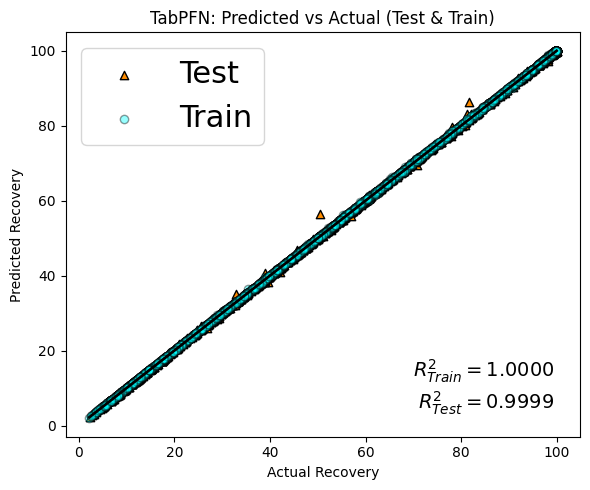

In [ ]:
import numpy as np
import matplotlib.pyplot as plt
from sklearn.metrics import r2_score

# Assuming the evaluate function already works as intended
evaluate(y_train, y_pred_train_tab1, "Train")
evaluate(y_test, y_pred_test_tab1, "Test")

# Calculate R² for Train and Test sets
r2_train = r2_score(ytrain, y_pred_train_tab1)
r2_test = r2_score(ytest, y_pred_test_tab1)

# Create the figure
plt.figure(figsize=(6,5))

# Plot Test data (in blue, using triangles for markers)
plt.scatter(ytest, y_pred_test_tab1, alpha=1, edgecolor="k", label=f"Test", color='darkorange', marker='^')

# Plot Train data (in red)
plt.scatter(ytrain, y_pred_train_tab1, alpha=0.4, edgecolor="k", label=f"Train", color='cyan')

# Get the min and max for axis scaling
mn = min(np.min(ytest), np.min(y_pred_test_tab1))
mx = max(np.max(ytest), np.max(y_pred_test_tab1))

# Plot the diagonal line (perfect prediction line)
plt.plot([mn, mx], [mn, mx], "k-", linewidth=2)

# Labels and Title
plt.xlabel("Actual Recovery")
plt.ylabel("Predicted Recovery")
plt.title("TabPFN: Predicted vs Actual (Test & Train)")

# Add grid
plt.grid(False)

# Add legend for train and test, including R² values
plt.legend(loc='best', fontsize=22)

# Add R² values text in the southeast corner
textstr = (
    rf'$R^2_{{Train}} = {r2_train:.4f}$' + '\n' +
    rf'$R^2_{{Test}} = {r2_test:.4f}$'
)
# Position the text at the southeast corner
plt.gca().text(0.95, 0.05, textstr, transform=plt.gca().transAxes, fontsize=14,
               verticalalignment='bottom', horizontalalignment='right', color='black')

# Adjust layout and display
plt.tight_layout()
plt.savefig("CrossPlot_tab_rec.svg", format="svg", dpi=600)
plt.show()

## PSO-XGBoost-Recovery

In [ ]:
!pip install pyswarms

   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 104.1/104.1 kB 6.3 MB/s eta 0:00:00


In [ ]:
"""
PSO-tuned XGBoost Regression
- Uses pyswarms GlobalBestPSO to minimize CV MSE
- Tunes: learning_rate, max_depth, n_estimators, subsample, colsample_bytree, gamma
"""
from xgboost import XGBRegressor
from pyswarms.single import GlobalBestPSO
import warnings

warnings.filterwarnings("ignore")
RANDOM_STATE = 42

# ---------------------------
# 1) Load data and prepare
# ---------------------------

y_train = df_label1.copy().values # Recovery
X_train = df.copy().values        # features (scaled)

y_test = ts_label1.copy().values
X_test = ts.copy().values

# ---------------------------
# 2) PSO fitness function
# ---------------------------
# We'll tune 6 parameters:
# idx 0 -> learning_rate in [0.001, 0.3]
# idx 1 -> max_depth in [1, 10] (int)
# idx 2 -> n_estimators in [50, 1000] (int)
# idx 3 -> subsample in [0.3, 1.0]
# idx 4 -> colsample_bytree in [0.3, 1.0]
# idx 5 -> gamma in [0.0, 5.0]

# bounds arrays for pyswarms
lower_bounds = np.array([0.001, 1, 50, 0.3, 0.3, 0.0])
upper_bounds = np.array([0.3,   10, 1000, 1.0, 1.0, 5.0])

def _params_from_particle(particle):
    """Map a single particle vector to XGBoost params (with casts)."""
    learning_rate = float(particle[0])
    max_depth = int(np.round(particle[1]))
    max_depth = max(1, max_depth)
    n_estimators = int(np.round(particle[2]))
    n_estimators = max(1, n_estimators)
    subsample = float(particle[3])
    colsample_bytree = float(particle[4])
    gamma = float(particle[5])

    params = {
        "learning_rate": learning_rate,
        "max_depth": max_depth,
        "n_estimators": n_estimators,
        "subsample": subsample,
        "colsample_bytree": colsample_bytree,
        "gamma": gamma,
        "random_state": RANDOM_STATE,
        "verbosity": 0,
        "objective": "reg:squarederror",
        # 'tree_method':'hist' could speed up on large data (optional)
    }
    return params

def fitness_function(particles):
    """
    particles: array shape (n_particles, dims)
    returns: array shape (n_particles,) of CV MSE (we minimize)
    """
    n_particles = particles.shape[0]
    scores = np.zeros(n_particles)
    # We use 3-fold CV on training set and return mean MSE
    for i in range(n_particles):
        p = particles[i]
        params = _params_from_particle(p)
        try:
            model = XGBRegressor(**params)
            # negative MSE returned -> convert to positive MSE
            cv_scores = cross_val_score(model, X_train, y_train, cv=3, scoring="neg_mean_squared_error", n_jobs=1)
            mse = -np.mean(cv_scores)
            # small regularization to prefer simpler models: add tiny penalty for large n_estimators / depth
            penalty = 1e-6 * (params["n_estimators"] * params["max_depth"])
            scores[i] = mse + penalty
        except Exception as e:
            # something went wrong for this particle: give a large penalty
            scores[i] = 1e10
    return scores

# ---------------------------
# 3) Run PSO
# ---------------------------
# PSO settings
options = {"c1": 1.5, "c2": 1.5, "w": 0.7}

# dimension equals number of hyperparams
dimensions = 6
# initialize optimizer
optimizer = GlobalBestPSO(
    n_particles=16,
    dimensions=dimensions,
    options=options,
    bounds=(lower_bounds, upper_bounds),
    # ftol, etc. could be set; keep defaults
)

print("Starting PSO optimization (this may take some minutes depending on data size)...")
# run optimization: choose moderate iterations to balance runtime vs search
cost, pos = optimizer.optimize(fitness_function, iters=30, verbose=True)
print("PSO finished. best cost (CV MSE):", cost)
print("Best raw particle position:", pos)

# ---------------------------
# 4) Train final XGBoost with best params
# ---------------------------
best_params = _params_from_particle(pos)
print("\nBest hyperparameters (rounded/casted):")
for k, v in best_params.items():
    print(f"  {k}: {v}")

final_model = XGBRegressor(**best_params)
final_model.fit(X_train, y_train)

2025-11-01 06:28:03,090 - pyswarms.single.global_best - INFO - Optimize for 30 iters with {'c1': 1.5, 'c2': 1.5, 'w': 0.7}


Starting PSO optimization (this may take some minutes depending on data size)...


pyswarms.single.global_best: 100%|██████████|30/30, best_cost=2.01
2025-11-01 06:33:41,456 - pyswarms.single.global_best - INFO - Optimization finished | best cost: 2.0064032373787066, best pos: [8.56416784e-02 4.61275568e+00 7.24251616e+02 4.29143281e-01
 7.94347904e-01 4.53983259e-01]


PSO finished. best cost (CV MSE): 2.0064032373787066
Best raw particle position: [8.56416784e-02 4.61275568e+00 7.24251616e+02 4.29143281e-01
 7.94347904e-01 4.53983259e-01]

Best hyperparameters (rounded/casted):
  learning_rate: 0.08564167838681164
  max_depth: 5
  n_estimators: 724
  subsample: 0.42914328074913266
  colsample_bytree: 0.794347904457994
  gamma: 0.45398325921376137
  random_state: 42
  verbosity: 0
  objective: reg:squarederror


XGBRegressor(base_score=None, booster=None, callbacks=None,
             colsample_bylevel=None, colsample_bynode=None,
             colsample_bytree=0.794347904457994, device=None,
             early_stopping_rounds=None, enable_categorical=False,
             eval_metric=None, feature_types=None, feature_weights=None,
             gamma=0.45398325921376137, grow_policy=None, importance_type=None,
             interaction_constraints=None, learning_rate=0.08564167838681164,
             max_bin=None, max_cat_threshold=None, max_cat_to_onehot=None,
             max_delta_step=None, max_depth=5, max_leaves=None,
             min_child_weight=None, missing=nan, monotone_constraints=None,
             multi_strategy=None, n_estimators=724, n_jobs=None,
             num_parallel_tree=None, ...)

In [ ]:
y_pred_test_xg1 = final_model.predict(X_test)    # "xg" is the model and "1" is the target which is "Recovery%"
y_pred_train_xg1 = final_model.predict(X_train)

# Make sure both arrays are 1D
train_vals = y_pred_train_xg1.flatten()
test_vals = y_pred_test_xg1.flatten()

# Pad shorter array with NaN so they align in Excel
max_len = max(len(train_vals), len(test_vals))
train_vals = np.pad(train_vals, (0, max_len - len(train_vals)), constant_values=np.nan)
test_vals = np.pad(test_vals, (0, max_len - len(test_vals)), constant_values=np.nan)

# Create the DataFrame with exactly two columns
df_pred = pd.DataFrame({
    "y_pred_train_xg1": train_vals,
    "y_pred_test_xg1": test_vals
})

# Save to Excel (single sheet)
df_pred.to_excel("xg1_predictions.xlsx", sheet_name="xg1", index=False)

print("✅ Saved to 'xg1_predictions.xlsx'.")

✅ Saved to 'xg1_predictions.xlsx'.


In [15]:
## Optimized XGBoost model
from xgboost import XGBRegressor

y_train = df_label1.copy().values # Recovery
X_train = df.copy().values        # features (scaled)
y_test = ts_label1.copy().values
X_test = ts.copy().values

xgb_model1 = XGBRegressor(base_score=None, booster=None, callbacks=None,
             colsample_bylevel=None, colsample_bynode=None,
             colsample_bytree=0.794347904457994, device=None,
             early_stopping_rounds=None, enable_categorical=False,
             eval_metric=None, feature_types=None, feature_weights=None,
             gamma=0.45398325921376137, grow_policy=None, importance_type=None,
             interaction_constraints=None, learning_rate=0.08564167838681164,
             max_bin=None, max_cat_threshold=None, max_cat_to_onehot=None,
             max_delta_step=None, max_depth=5, max_leaves=None,
             min_child_weight=None, monotone_constraints=None,
             multi_strategy=None, n_estimators=724, random_state=42)

xgb_model1.fit(X_train, y_train)
y_pred_test_xg1 = xgb_model1.predict(X_test)
y_pred_train_xg1 = xgb_model1.predict(X_train)


--- Train set metrics ---
R²     : 0.9993
Adj-R² : 0.9993
MSE    : 0.604108
RMSE   : 0.777244
NRMSE  : 0.007946
std_er : 0.777244
MAE    : 0.547402
MAPE   : 0.013694
MedAE  : 0.388823
EVS    : 0.999337

--- Test set metrics ---
R²     : 0.9976
Adj-R² : 0.9976
MSE    : 2.119584
RMSE   : 1.455879
NRMSE  : 0.014915
std_er : 1.453219
MAE    : 0.937540
MAPE   : 0.021415
MedAE  : 0.575544
EVS    : 0.997591


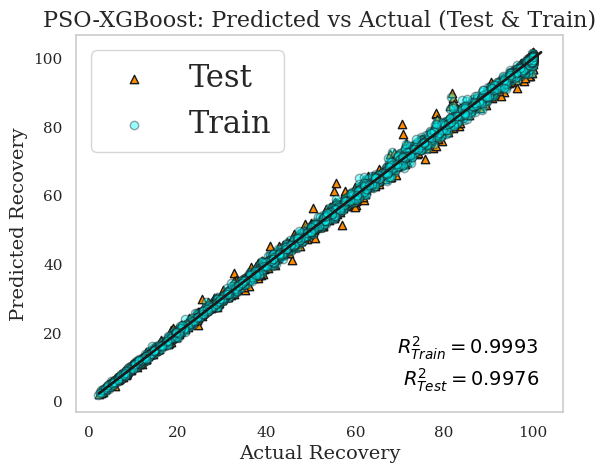

In [16]:
import numpy as np
import matplotlib.pyplot as plt
from sklearn.metrics import r2_score

# Assuming the evaluate function already works as intended
evaluate(y_train, y_pred_train_xg1, "Train")
evaluate(y_test, y_pred_test_xg1, "Test")

# Calculate R² for Train and Test sets
r2_train = r2_score(y_train, y_pred_train_xg1)
r2_test = r2_score(y_test, y_pred_test_xg1)

# Create the figure
plt.figure(figsize=(6,5))

# Plot Test data (in blue, using triangles for markers)
plt.scatter(y_test, y_pred_test_xg1, alpha=1, edgecolor="k", label=f"Test", color='darkorange', marker='^')

# Plot Train data (in red)
plt.scatter(y_train, y_pred_train_xg1, alpha=0.4, edgecolor="k", label=f"Train", color='cyan')

# Get the min and max for axis scaling
mn = min(np.min(y_test), np.min(y_pred_test_xg1))
mx = max(np.max(y_test), np.max(y_pred_test_xg1))

# Plot the diagonal line (perfect prediction line)
plt.plot([mn, mx], [mn, mx], "k-", linewidth=2)

# Labels and Title
plt.xlabel("Actual Recovery")
plt.ylabel("Predicted Recovery")
plt.title("PSO-XGBoost: Predicted vs Actual (Test & Train)")

# Add grid
plt.grid(False)

# Add legend for train and test, including R² values
plt.legend(loc='best', fontsize=22)

# Add R² values text in the southeast corner
textstr = (
    rf'$R^2_{{Train}} = {r2_train:.4f}$' + '\n' +
    rf'$R^2_{{Test}} = {r2_test:.4f}$'
)
# Position the text at the southeast corner
plt.gca().text(0.95, 0.05, textstr, transform=plt.gca().transAxes, fontsize=14,
               verticalalignment='bottom', horizontalalignment='right', color='black')

# Adjust layout and display
plt.tight_layout()
plt.savefig("CrossPlot_xgb_rec.svg", format="svg", dpi=600)
plt.show()

## PSO-GBR-Recovery

In [ ]:
!pip install pyswarms

   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 104.1/104.1 kB 10.4 MB/s eta 0:00:00


In [34]:
y_train_gbr1 = df_label1.values
y_test_gbr1 = ts_label1.values
X_train_gbr1 = df.values
X_test_gbr1 = ts.values

In [ ]:
"""
PSO-tuned Gradient Boosting Regression (GBR)
- Uses pyswarms GlobalBestPSO to minimize CV MSE
- Tunes: learning_rate, max_depth, n_estimators, subsample,
         min_samples_split, min_samples_leaf, max_features
"""
from sklearn.ensemble import GradientBoostingRegressor
from pyswarms.single import GlobalBestPSO
from sklearn.model_selection import cross_val_score
import numpy as np
import warnings

warnings.filterwarnings("ignore")
RANDOM_STATE = 42

# ---------------------------
# 1) Your prepared data
# ---------------------------
# Assumes these already exist exactly like in your code:
# X_train, y_train, X_test, y_test

# ---------------------------
# 2) PSO fitness function
# ---------------------------
# We'll tune 7 parameters:
# idx 0 -> learning_rate      in [0.005, 0.30]        (float)
# idx 1 -> max_depth          in [1, 8]               (int)
# idx 2 -> n_estimators       in [50, 1000]           (int)
# idx 3 -> subsample          in [0.50, 1.00]         (float)
# idx 4 -> min_samples_split  in [2, 20]              (int)
# idx 5 -> min_samples_leaf   in [1, 10]              (int)
# idx 6 -> max_features_code  in [0.20, 1.00]         (float) -> maps to None if >=0.99, else fraction

# bounds arrays for pyswarms
lower_bounds = np.array([0.005, 1,   50, 0.50,  2,  1, 0.20])
upper_bounds = np.array([0.300, 8, 1000, 1.00, 20, 10, 1.00])

def _params_from_particle(particle):
    """Map a single particle vector to GBR params (with casts and clipping)."""
    learning_rate = float(np.clip(particle[0], lower_bounds[0], upper_bounds[0]))
    max_depth = int(np.round(np.clip(particle[1], lower_bounds[1], upper_bounds[1])))
    n_estimators = int(np.round(np.clip(particle[2], lower_bounds[2], upper_bounds[2])))
    subsample = float(np.clip(particle[3], lower_bounds[3], upper_bounds[3]))
    min_samples_split = int(np.round(np.clip(particle[4], lower_bounds[4], upper_bounds[4])))
    min_samples_leaf  = int(np.round(np.clip(particle[5], lower_bounds[5], upper_bounds[5])))

    # max_features mapping: treat near-1.0 as None (i.e., use all features)
    max_features_code = float(np.clip(particle[6], lower_bounds[6], upper_bounds[6]))
    max_features = None if max_features_code >= 0.99 else float(max_features_code)

    params = {
        "learning_rate": learning_rate,
        "max_depth": max_depth,
        "n_estimators": n_estimators,
        "subsample": subsample,
        "min_samples_split": min_samples_split,
        "min_samples_leaf": min_samples_leaf,
        "max_features": max_features,
        "random_state": RANDOM_STATE,
    }
    return params

def fitness_function(particles):
    """
    particles: array shape (n_particles, dims)
    returns: array shape (n_particles,) of CV MSE (we minimize)
    """
    n_particles = particles.shape[0]
    scores = np.zeros(n_particles)

    for i in range(n_particles):
        p = particles[i]
        params = _params_from_particle(p)
        try:
            model = GradientBoostingRegressor(**params)
            # negative MSE returned -> convert to positive MSE
            cv_scores = cross_val_score(
                model, X_train, y_train,
                cv=3, scoring="neg_mean_squared_error", n_jobs=1
            )
            mse = -np.mean(cv_scores)

            # tiny regularization to discourage overly large trees / ensembles
            penalty = 1e-6 * (params["n_estimators"] * params["max_depth"])
            scores[i] = mse + penalty
        except Exception:
            # any failure gets a large penalty
            scores[i] = 1e10

    return scores

# ---------------------------
# 3) Run PSO
# ---------------------------
options = {"c1": 1.5, "c2": 1.5, "w": 0.7}
dimensions = 7

optimizer = GlobalBestPSO(
    n_particles=16,
    dimensions=dimensions,
    options=options,
    bounds=(lower_bounds, upper_bounds),

)

print("Starting PSO optimization for GBR (minimize 3-fold CV MSE)...")
cost, pos = optimizer.optimize(fitness_function, iters=30, verbose=True)
print("PSO finished. best cost (CV MSE):", cost)
print("Best raw particle position:", pos)

# ---------------------------
# 4) Train final GBR with best params
# ---------------------------
best_params = _params_from_particle(pos)
print("\nBest hyperparameters (rounded/casted):")
for k, v in best_params.items():
    print(f"  {k}: {v}")

final_model = GradientBoostingRegressor(**best_params)
final_model.fit(X_train_gbr1, y_train_gbr1)

2025-11-01 06:55:01,201 - pyswarms.single.global_best - INFO - Optimize for 30 iters with {'c1': 1.5, 'c2': 1.5, 'w': 0.7}


Starting PSO optimization for GBR (minimize 3-fold CV MSE)...


pyswarms.single.global_best: 100%|██████████|30/30, best_cost=1e+10
2025-11-01 06:55:01,276 - pyswarms.single.global_best - INFO - Optimization finished | best cost: 10000000000.0, best pos: [7.78021267e-02 4.01894951e+00 6.32841234e+02 7.75764329e-01
 1.44626763e+01 4.46294279e+00 7.15029454e-01]


PSO finished. best cost (CV MSE): 10000000000.0
Best raw particle position: [7.78021267e-02 4.01894951e+00 6.32841234e+02 7.75764329e-01
 1.44626763e+01 4.46294279e+00 7.15029454e-01]

Best hyperparameters (rounded/casted):
  learning_rate: 0.07780212667426754
  max_depth: 4
  n_estimators: 633
  subsample: 0.7757643293874783
  min_samples_split: 14
  min_samples_leaf: 4
  max_features: 0.7150294538727542
  random_state: 42


GradientBoostingRegressor(learning_rate=0.07780212667426754, max_depth=4,
                          max_features=0.7150294538727542, min_samples_leaf=4,
                          min_samples_split=14, n_estimators=633,
                          random_state=42, subsample=0.7757643293874783)

In [ ]:
y_pred_test_gbr1 = final_model.predict(X_test_gbr1)
y_pred_train_gbr1 = final_model.predict(X_train_gbr1)

# Make sure both arrays are 1D
train_vals = y_pred_train_gbr1.flatten()
test_vals = y_pred_test_gbr1.flatten()

# Pad shorter array with NaN so they align in Excel
max_len = max(len(train_vals), len(test_vals))
train_vals = np.pad(train_vals, (0, max_len - len(train_vals)), constant_values=np.nan)
test_vals = np.pad(test_vals, (0, max_len - len(test_vals)), constant_values=np.nan)

# Create the DataFrame with exactly two columns
df_pred = pd.DataFrame({
    "y_pred_train_gbr1": train_vals,
    "y_pred_test_gbr1": test_vals
})

# Save to Excel (single sheet)
df_pred.to_excel("gbr1_predictions.xlsx", sheet_name="gbr1", index=False)

print("✅ Saved to 'gbr1_predictions.xlsx'.")

✅ Saved to 'gbr1_predictions.xlsx'.


In [35]:
from sklearn.ensemble import GradientBoostingRegressor

y_train = df_label1.copy().values # Recovery
X_train = df.copy().values        # features (scaled)
y_test = ts_label1.copy().values
X_test = ts.copy().values

gbr_model1 = GradientBoostingRegressor(learning_rate=0.07780212667426754, max_depth=4,
                          max_features=0.7150294538727542, min_samples_leaf=4,
                          min_samples_split=14, n_estimators=633,
                          random_state=42, subsample=0.7757643293874783)

gbr_model1.fit(X_train, y_train)
y_pred_train_gbr1 = gbr_model1.predict(X_train)
y_pred_test_gbr1 = gbr_model1.predict(X_test)


--- Train set metrics ---
R²     : 0.9996
Adj-R² : 0.9996
MSE    : 0.386642
RMSE   : 0.621805
NRMSE  : 0.006357
std_er : 0.621804
MAE    : 0.436195
MAPE   : 0.011285
MedAE  : 0.307123
EVS    : 0.999576

--- Test set metrics ---
R²     : 0.9979
Adj-R² : 0.9979
MSE    : 1.833558
RMSE   : 1.354090
NRMSE  : 0.013872
std_er : 1.352648
MAE    : 0.840148
MAPE   : 0.020219
MedAE  : 0.497318
EVS    : 0.997913


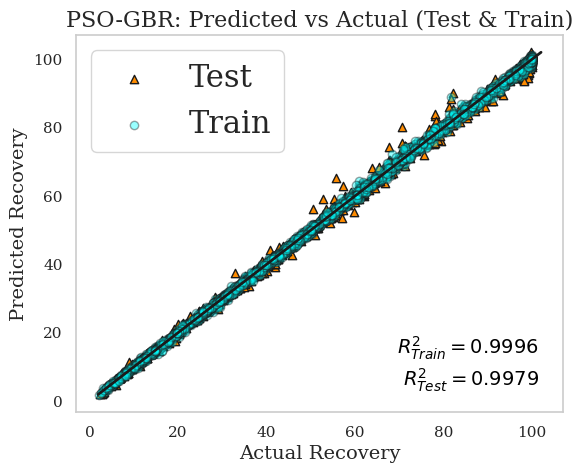

In [37]:
import numpy as np
import matplotlib.pyplot as plt
from sklearn.metrics import r2_score

# Assuming the evaluate function already works as intended
evaluate(y_train, y_pred_train_gbr1, "Train")
evaluate(y_test, y_pred_test_gbr1, "Test")

# Calculate R² for Train and Test sets
r2_train = r2_score(y_train, y_pred_train_gbr1)
r2_test = r2_score(y_test, y_pred_test_gbr1)

# Create the figure
plt.figure(figsize=(6,5))

# Plot Test data (in blue, using triangles for markers)
plt.scatter(y_test, y_pred_test_gbr1, alpha=1, edgecolor="k", label=f"Test", color='darkorange', marker='^')

# Plot Train data (in red)
plt.scatter(y_train, y_pred_train_gbr1, alpha=0.4, edgecolor="k", label=f"Train", color='cyan')

# Get the min and max for axis scaling
mn = min(np.min(y_test), np.min(y_pred_test_gbr1))
mx = max(np.max(y_test), np.max(y_pred_test_gbr1))

# Plot the diagonal line (perfect prediction line)
plt.plot([mn, mx], [mn, mx], "k-", linewidth=2)

# Labels and Title
plt.xlabel("Actual Recovery")
plt.ylabel("Predicted Recovery")
plt.title("PSO-GBR: Predicted vs Actual (Test & Train)")

# Add grid
plt.grid(False)

# Add legend for train and test, including R² values
plt.legend(loc='best', fontsize=22)

# Add R² values text in the southeast corner
textstr = (
    rf'$R^2_{{Train}} = {r2_train:.4f}$' + '\n' +
    rf'$R^2_{{Test}} = {r2_test:.4f}$'
)
# Position the text at the southeast corner
plt.gca().text(0.95, 0.05, textstr, transform=plt.gca().transAxes, fontsize=14,
               verticalalignment='bottom', horizontalalignment='right', color='black')

# Adjust layout and display
plt.tight_layout()
plt.savefig("CrossPlot_gbr_rec.svg", format="svg", dpi=600)
plt.show()

## PSO-CatBoost-Recovery

In [ ]:
!pip install pyswarms

In [ ]:
!pip install catboost

   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 97.1/97.1 MB 7.9 MB/s eta 0:00:00


In [ ]:
"""
PSO-tuned CatBoost Regression
- Uses pyswarms GlobalBestPSO to minimize CV MSE
- Tunes: learning_rate, depth, iterations, subsample, rsm, l2_leaf_reg
"""
import numpy as np
from catboost import CatBoostRegressor
from sklearn.model_selection import cross_val_score
from pyswarms.single import GlobalBestPSO
import warnings

warnings.filterwarnings("ignore")
RANDOM_STATE = 42

# ---------------------------
# 1) Data (same as your XGB block)
# ---------------------------
y_train = df_label1.copy().values  # Recovery
X_train = df.copy().values         # features (scaled)

y_test  = ts_label1.copy().values
X_test  = ts.copy().values

# ---------------------------
# 2) PSO fitness function
# ---------------------------
# dims:
# 0 -> learning_rate      [0.001, 0.3]
# 1 -> depth              [1, 10] (int)
# 2 -> iterations         [50, 1000] (int)
# 3 -> subsample          [0.3, 1.0]
# 4 -> rsm                [0.3, 1.0]  (feature subsampling)
# 5 -> l2_leaf_reg        [0.0, 10.0]

lower_bounds = np.array([0.001, 1,   50, 0.3, 0.3, 0.0])
upper_bounds = np.array([0.300, 10, 1000, 1.0, 1.0,10.0])

def _params_from_particle(p):
    """Map a particle to CatBoost params (cast + clip)."""
    learning_rate = float(np.clip(p[0], lower_bounds[0], upper_bounds[0]))
    depth         = int(np.round(np.clip(p[1], lower_bounds[1], upper_bounds[1])))
    iterations    = int(np.round(np.clip(p[2], lower_bounds[2], upper_bounds[2])))
    subsample     = float(np.clip(p[3], lower_bounds[3], upper_bounds[3]))
    rsm           = float(np.clip(p[4], lower_bounds[4], upper_bounds[4]))
    l2_leaf_reg   = float(np.clip(p[5], lower_bounds[5], upper_bounds[5]))

    params = {
        "learning_rate": learning_rate,
        "depth": depth,
        "iterations": iterations,
        "subsample": subsample,
        "rsm": rsm,
        "l2_leaf_reg": l2_leaf_reg,
        "loss_function": "RMSE",
        "random_seed": RANDOM_STATE,
        "verbose": False,
        "allow_writing_files": False,
        "bootstrap_type": "Bernoulli",   # enables 'subsample'
        "task_type": "CPU"
    }
    return params

def fitness_function(particles):
    """
    particles: (n_particles, dims)
    returns:   (n_particles,) mean CV MSE (to minimize)
    """
    n_particles = particles.shape[0]
    scores = np.zeros(n_particles)

    for i in range(n_particles):
        p = particles[i]
        params = _params_from_particle(p)
        try:
            model = CatBoostRegressor(**params)
            # cross_val_score returns neg MSE -> take positive MSE
            cv_scores = cross_val_score(
                model, X_train, y_train,
                cv=3, scoring="neg_mean_squared_error", n_jobs=1
            )
            mse = -np.mean(cv_scores)
            # tiny complexity penalty (iterations * depth)
            penalty = 1e-6 * (params["iterations"] * params["depth"])
            scores[i] = mse + penalty
        except Exception:
            scores[i] = 1e10
    return scores

# ---------------------------
# 3) Run PSO
# ---------------------------
options = {"c1": 1.5, "c2": 1.5, "w": 0.7}
dimensions = 6

optimizer = GlobalBestPSO(
    n_particles=16,
    dimensions=dimensions,
    options=options,
    bounds=(lower_bounds, upper_bounds),
)

print("Starting PSO optimization for CatBoost (minimize 3-fold CV MSE)...")
cost, pos = optimizer.optimize(fitness_function, iters=30, verbose=True)
print("PSO finished. best cost (CV MSE):", cost)
print("Best raw particle position:", pos)

# ---------------------------
# 4) Train final CatBoost with best params
# ---------------------------
best_params = _params_from_particle(pos)
print("\nBest hyperparameters (rounded/casted):")
for k, v in best_params.items():
    print(f"  {k}: {v}")

final_model = CatBoostRegressor(**best_params)
final_model.fit(X_train, y_train, verbose=False)

2025-11-05 17:56:50,516 - pyswarms.single.global_best - INFO - Optimize for 30 iters with {'c1': 1.5, 'c2': 1.5, 'w': 0.7}


Starting PSO optimization for CatBoost (minimize 3-fold CV MSE)...


pyswarms.single.global_best: 100%|██████████|30/30, best_cost=0.996
2025-11-05 18:56:37,813 - pyswarms.single.global_best - INFO - Optimization finished | best cost: 0.9962488402298287, best pos: [6.92108402e-02 7.11510053e+00 9.86962038e+02 8.12532871e-01
 8.58365183e-01 1.69262581e+00]


PSO finished. best cost (CV MSE): 0.9962488402298287
Best raw particle position: [6.92108402e-02 7.11510053e+00 9.86962038e+02 8.12532871e-01
 8.58365183e-01 1.69262581e+00]

Best hyperparameters (rounded/casted):
  learning_rate: 0.06921084015993914
  depth: 7
  iterations: 987
  subsample: 0.8125328711078112
  rsm: 0.8583651828877268
  l2_leaf_reg: 1.6926258102111902
  loss_function: RMSE
  random_seed: 42
  verbose: False
  allow_writing_files: False
  bootstrap_type: Bernoulli
  task_type: CPU


In [ ]:
print("CatBoostRegressor(", end="")
for i, (k, v) in enumerate(final_model.get_params().items()):
    comma = "," if i < len(final_model.get_params()) - 1 else ""
    print(f"{k}={repr(v)}{comma}")
print(")")

CatBoostRegressor(iterations=987,
learning_rate=0.06921084015993914,
depth=7,
l2_leaf_reg=1.6926258102111902,
rsm=0.8583651828877268,
loss_function='RMSE',
random_seed=42,
verbose=False,
allow_writing_files=False,
task_type='CPU',
bootstrap_type='Bernoulli',
subsample=0.8125328711078112
)


In [ ]:
y_pred_test_cb1 = final_model.predict(X_test)
y_pred_train_cb1 = final_model.predict(X_train)

# Make sure both arrays are 1D
train_vals = y_pred_train_cb1.flatten()
test_vals = y_pred_test_cb1.flatten()

# Pad shorter array with NaN so they align in Excel
max_len = max(len(train_vals), len(test_vals))
train_vals = np.pad(train_vals, (0, max_len - len(train_vals)), constant_values=np.nan)
test_vals = np.pad(test_vals, (0, max_len - len(test_vals)), constant_values=np.nan)

# Create the DataFrame with exactly two columns
df_pred = pd.DataFrame({
    "y_pred_train_cb1": train_vals,
    "y_pred_test_cb1": test_vals
})

# Save to Excel (single sheet)
df_pred.to_excel("cb1_predictions.xlsx", sheet_name="cb1", index=False)

print("✅ Saved to 'cb1_predictions.xlsx'.")

✅ Saved to 'cb1_predictions.xlsx'.


In [ ]:
from catboost import CatBoostRegressor
y_train = df_label1.copy().values  # Recovery
X_train = df.copy().values         # features (scaled)
y_test  = ts_label1.copy().values
X_test  = ts.copy().values

cb_model1 = CatBoostRegressor(iterations=987, learning_rate=0.06921084015993914,
                              depth=7, l2_leaf_reg=1.6926258102111902, rsm=0.8583651828877268,
                              loss_function='RMSE', random_seed=42, verbose=False,
                              allow_writing_files=False, task_type='CPU',
                              bootstrap_type='Bernoulli', subsample=0.8125328711078112)

cb_model1.fit(X_train, y_train)
y_pred_train_cb1 = cb_model1.predict(X_train)
y_pred_test_cb1 = cb_model1.predict(X_test)


--- Train set metrics ---
R²     : 0.9999
Adj-R² : 0.9999
MSE    : 0.103476
RMSE   : 0.321677
NRMSE  : 0.003288
std_er : 0.321677
MAE    : 0.239433
MAPE   : 0.006572
MedAE  : 0.182088
EVS    : 0.999886

--- Test set metrics ---
R²     : 0.9992
Adj-R² : 0.9992
MSE    : 0.713233
RMSE   : 0.844531
NRMSE  : 0.008652
std_er : 0.844235
MAE    : 0.522533
MAPE   : 0.013807
MedAE  : 0.322711
EVS    : 0.999187


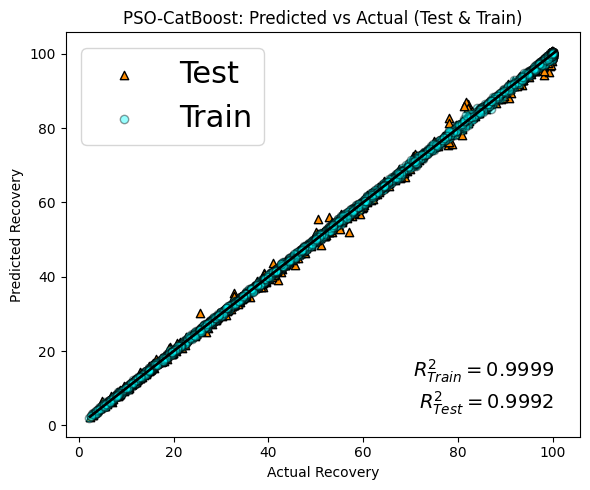

In [ ]:
import numpy as np
import matplotlib.pyplot as plt
from sklearn.metrics import r2_score

# Assuming the evaluate function already works as intended
evaluate(y_train, y_pred_train_cb1, "Train")
evaluate(y_test, y_pred_test_cb1, "Test")

# Calculate R² for Train and Test sets
r2_train = r2_score(y_train, y_pred_train_cb1)
r2_test = r2_score(y_test, y_pred_test_cb1)

# Create the figure
plt.figure(figsize=(6,5))

# Plot Test data (in blue, using triangles for markers)
plt.scatter(ytest, y_pred_test_cb1, alpha=1, edgecolor="k", label=f"Test", color='darkorange', marker='^')

# Plot Train data (in red)
plt.scatter(y_train, y_pred_train_cb1, alpha=0.4, edgecolor="k", label=f"Train", color='cyan')

# Get the min and max for axis scaling
mn = min(np.min(ytest), np.min(y_pred_test_cb1))
mx = max(np.max(ytest), np.max(y_pred_test_cb1))

# Plot the diagonal line (perfect prediction line)
plt.plot([mn, mx], [mn, mx], "k-", linewidth=2)

# Labels and Title
plt.xlabel("Actual Recovery")
plt.ylabel("Predicted Recovery")
plt.title("PSO-CatBoost: Predicted vs Actual (Test & Train)")

# Add grid
plt.grid(False)

# Add legend for train and test, including R² values
plt.legend(loc='best', fontsize=22)

# Add R² values text in the southeast corner
textstr = (
    rf'$R^2_{{Train}} = {r2_train:.4f}$' + '\n' +
    rf'$R^2_{{Test}} = {r2_test:.4f}$'
)
# Position the text at the southeast corner
plt.gca().text(0.95, 0.05, textstr, transform=plt.gca().transAxes, fontsize=14,
               verticalalignment='bottom', horizontalalignment='right', color='black')

# Adjust layout and display
plt.tight_layout()
plt.savefig("CrossPlot_cb_rec.svg", format="svg", dpi=600)
plt.show()

## PSO-AdaBoost-Recovery

In [ ]:
!pip install pyswarms

In [ ]:
"""
PSO-tuned AdaBoost Regression
- Uses pyswarms GlobalBestPSO to minimize CV MSE
- Tunes: learning_rate, n_estimators, max_depth (of base tree),
         min_samples_leaf (of base tree), loss
"""
import numpy as np
from sklearn.ensemble import AdaBoostRegressor
from sklearn.tree import DecisionTreeRegressor
from sklearn.model_selection import cross_val_score
from pyswarms.single import GlobalBestPSO
import warnings

warnings.filterwarnings("ignore")
RANDOM_STATE = 42

# ---------------------------
# 1) Data (same pattern as yours)
# ---------------------------
y_train = df_label1.copy().values  # e.g., Recovery
X_train = df.copy().values
y_test  = ts_label1.copy().values
X_test  = ts.copy().values

# ---------------------------
# 2) PSO fitness function
# ---------------------------
# dims:
# 0 -> learning_rate       [0.005, 1.0]
# 1 -> n_estimators        [50, 1000] (int)
# 2 -> max_depth           [1, 10]    (int) for base DecisionTree
# 3 -> min_samples_leaf    [1, 20]    (int) for base DecisionTree
# 4 -> loss_code           [0, 2]     (int) -> 0:'linear', 1:'square', 2:'exponential'

lower_bounds = np.array([0.005,   50,  1,  1, 0])
upper_bounds = np.array([1.000, 1000, 10, 20, 2])

_LOSSES = ['linear', 'square', 'exponential']

def _params_from_particle(p):
    """Map a particle to AdaBoost params (cast + clip)."""
    learning_rate    = float(np.clip(p[0], lower_bounds[0], upper_bounds[0]))
    n_estimators     = int(np.round(np.clip(p[1], lower_bounds[1], upper_bounds[1])))
    max_depth        = int(np.round(np.clip(p[2], lower_bounds[2], upper_bounds[2])))
    min_samples_leaf = int(np.round(np.clip(p[3], lower_bounds[3], upper_bounds[3])))
    loss_code        = int(np.round(np.clip(p[4], lower_bounds[4], upper_bounds[4])))
    loss             = _LOSSES[loss_code]

    # Base learner
    base_tree = DecisionTreeRegressor(
        max_depth=max_depth,
        min_samples_leaf=min_samples_leaf,
        random_state=RANDOM_STATE
    )

    params = {
        "estimator": base_tree,          # sklearn >= 1.2
        "n_estimators": n_estimators,
        "learning_rate": learning_rate,
        "loss": loss,
        "random_state": RANDOM_STATE
    }
    return params, dict(
        learning_rate=learning_rate, n_estimators=n_estimators,
        max_depth=max_depth, min_samples_leaf=min_samples_leaf, loss=loss
    )

def fitness_function(particles):
    """
    particles: (n_particles, dims)
    returns:   (n_particles,) mean CV MSE (to minimize)
    """
    n_particles = particles.shape[0]
    scores = np.zeros(n_particles)

    for i in range(n_particles):
        p = particles[i]
        params, flat = _params_from_particle(p)
        try:
            model = AdaBoostRegressor(**params)
            # cross_val_score returns neg MSE -> convert to +MSE
            cv_scores = cross_val_score(
                model, X_train, y_train.ravel(),
                cv=3, scoring="neg_mean_squared_error", n_jobs=1
            )
            mse = -np.mean(cv_scores)
            # tiny complexity penalty to prefer simpler ensembles
            penalty = 1e-6 * (flat["n_estimators"] * flat["max_depth"])
            scores[i] = mse + penalty
        except Exception:
            scores[i] = 1e10
    return scores

# ---------------------------
# 3) Run PSO
# ---------------------------
options = {"c1": 1.5, "c2": 1.5, "w": 0.7}
dimensions = 5

optimizer = GlobalBestPSO(
    n_particles=16,
    dimensions=dimensions,
    options=options,
    bounds=(lower_bounds, upper_bounds),
)

print("Starting PSO optimization for AdaBoost (minimize 3-fold CV MSE)...")
cost, pos = optimizer.optimize(fitness_function, iters=30, verbose=True)
print("PSO finished. best cost (CV MSE):", cost)
print("Best raw particle position:", pos)

# ---------------------------
# 4) Train final AdaBoost with best params
# ---------------------------
best_params, best_flat = _params_from_particle(pos)
print("\nBest hyperparameters (rounded/casted):")
for k, v in best_flat.items():
    print(f"  {k}: {v}")

final_model = AdaBoostRegressor(**best_params)
final_model.fit(X_train, y_train.ravel())

2025-11-05 22:05:22,643 - pyswarms.single.global_best - INFO - Optimize for 30 iters with {'c1': 1.5, 'c2': 1.5, 'w': 0.7}


Starting PSO optimization for AdaBoost (minimize 3-fold CV MSE)...


pyswarms.single.global_best: 100%|██████████|30/30, best_cost=3.76
2025-11-05 23:14:05,098 - pyswarms.single.global_best - INFO - Optimization finished | best cost: 3.7569586542113016, best pos: [  0.90076856 471.17722787   9.60321608   3.31004134   0.91858022]


PSO finished. best cost (CV MSE): 3.7569586542113016
Best raw particle position: [  0.90076856 471.17722787   9.60321608   3.31004134   0.91858022]

Best hyperparameters (rounded/casted):
  learning_rate: 0.9007685647106364
  n_estimators: 471
  max_depth: 10
  min_samples_leaf: 3
  loss: square


,estimator,DecisionTreeR...ndom_state=42)
,n_estimators,471
,learning_rate,0.9007685647106364
,loss,'square'
,random_state,42
,criterion,'squared_error'
,splitter,'best'
,max_depth,10
,min_samples_split,2
,min_samples_leaf,3
,min_weight_fraction_leaf,0.0


In [ ]:
print("AdaBoostRegressor(", end="")
for i, (k, v) in enumerate(final_model.get_params().items()):
    comma = "," if i < len(final_model.get_params()) - 1 else ""
    print(f"{k}={repr(v)}{comma}")
print(")")

AdaBoostRegressor(estimator__ccp_alpha=0.0,
estimator__criterion='squared_error',
estimator__max_depth=10,
estimator__max_features=None,
estimator__max_leaf_nodes=None,
estimator__min_impurity_decrease=0.0,
estimator__min_samples_leaf=3,
estimator__min_samples_split=2,
estimator__min_weight_fraction_leaf=0.0,
estimator__monotonic_cst=None,
estimator__random_state=42,
estimator__splitter='best',
estimator=DecisionTreeRegressor(max_depth=10, min_samples_leaf=3, random_state=42),
learning_rate=0.9007685647106364,
loss='square',
n_estimators=471,
random_state=42
)


In [ ]:
y_pred_test_adb1 = final_model.predict(X_test)
y_pred_train_adb1 = final_model.predict(X_train)

# Make sure both arrays are 1D
train_vals = y_pred_train_adb1.flatten()
test_vals = y_pred_test_adb1.flatten()

# Pad shorter array with NaN so they align in Excel
max_len = max(len(train_vals), len(test_vals))
train_vals = np.pad(train_vals, (0, max_len - len(train_vals)), constant_values=np.nan)
test_vals = np.pad(test_vals, (0, max_len - len(test_vals)), constant_values=np.nan)

# Create the DataFrame with exactly two columns
df_pred = pd.DataFrame({
    "y_pred_train_adb1": train_vals,
    "y_pred_test_adb1": test_vals
})

# Save to Excel (single sheet)
df_pred.to_excel("adb1_predictions.xlsx", sheet_name="adb1", index=False)

print("✅ Saved to 'adb1_predictions.xlsx'.")

✅ Saved to 'adb1_predictions.xlsx'.


In [ ]:
from sklearn.ensemble import AdaBoostRegressor
from sklearn.tree import DecisionTreeRegressor
import matplotlib.pyplot as plt

y_train = df_label1.copy().values
X_train = df.copy().values
y_test  = ts_label1.copy().values
X_test  = ts.copy().values

# Define base estimator
base_tree = DecisionTreeRegressor(
    criterion='squared_error',
    max_depth=10,
    min_samples_leaf=3,
    random_state=42
)

# Define AdaBoost model
adb_model1 = AdaBoostRegressor(
    estimator=base_tree,
    learning_rate=0.9007685647106364,
    loss='square',
    n_estimators=471,
    random_state=42
)

# Fit model
adb_model1.fit(X_train, y_train)
y_pred_train_adb1 = adb_model1.predict(X_train)
y_pred_test_adb1 = adb_model1.predict(X_test)


--- Train set metrics ---
R²     : 0.9993
Adj-R² : 0.9993
MSE    : 0.665133
RMSE   : 0.815557
NRMSE  : 0.008337
std_er : 0.813033
MAE    : 0.622336
MAPE   : 0.025294
MedAE  : 0.492455
EVS    : 0.999274

--- Test set metrics ---
R²     : 0.9968
Adj-R² : 0.9968
MSE    : 2.788312
RMSE   : 1.669824
NRMSE  : 0.017107
std_er : 1.668875
MAE    : 1.112459
MAPE   : 0.036786
MedAE  : 0.750435
EVS    : 0.996823


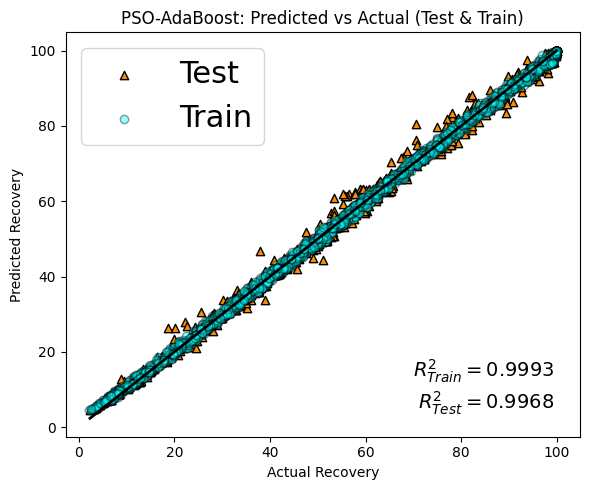

In [ ]:
import numpy as np
import matplotlib.pyplot as plt
from sklearn.metrics import r2_score

# Assuming the evaluate function already works as intended
evaluate(y_train, y_pred_train_adb1, "Train")
evaluate(y_test, y_pred_test_adb1, "Test")

# Calculate R² for Train and Test sets
r2_train = r2_score(y_train, y_pred_train_adb1)
r2_test = r2_score(y_test, y_pred_test_adb1)

# Create the figure
plt.figure(figsize=(6,5))

# Plot Test data (in blue, using triangles for markers)
plt.scatter(y_test, y_pred_test_adb1, alpha=1, edgecolor="k", label=f"Test", color='darkorange', marker='^')

# Plot Train data (in red)
plt.scatter(y_train, y_pred_train_adb1, alpha=0.4, edgecolor="k", label=f"Train", color='cyan')

# Get the min and max for axis scaling
mn = min(np.min(y_test), np.min(y_pred_test_adb1))
mx = max(np.max(y_test), np.max(y_pred_test_adb1))

# Plot the diagonal line (perfect prediction line)
plt.plot([mn, mx], [mn, mx], "k-", linewidth=2)

# Labels and Title
plt.xlabel("Actual Recovery")
plt.ylabel("Predicted Recovery")
plt.title("PSO-AdaBoost: Predicted vs Actual (Test & Train)")

# Add grid
plt.grid(False)

# Add legend for train and test, including R² values
plt.legend(loc='best', fontsize=22)

# Add R² values text in the southeast corner
textstr = (
    rf'$R^2_{{Train}} = {r2_train:.4f}$' + '\n' +
    rf'$R^2_{{Test}} = {r2_test:.4f}$'
)
# Position the text at the southeast corner
plt.gca().text(0.95, 0.05, textstr, transform=plt.gca().transAxes, fontsize=14,
               verticalalignment='bottom', horizontalalignment='right', color='black')

# Adjust layout and display
plt.tight_layout()
plt.savefig("CrossPlot_adb_rec.svg", format="svg", dpi=600)
plt.show()

# **Target2: SEC**

## ANN-SEC

In [42]:
xtrain_ann2 = df.copy()
xtest_ann2 = ts.copy()
# SEC
ytrain_ann2 = df_label2.copy()
ytest_ann2 = ts_label2.copy()
pd.concat([xtrain_ann2, ytrain_ann2]).describe().transpose()

,count,mean,std,min,25%,50%,75%,max
Unnamed: 0,3540.0,1.010491e-16,1.000141,-1.745613,-0.861689,-0.006108,0.864628,1.737333
Fluegas CO2 mol%,3540.0,1.298396e-16,1.000141,-1.440487,-0.867272,-0.064770,0.852375,1.425590
Fluegas Flow (kg/h),3540.0,-2.413637e-16,1.000141,-2.540105,-1.017223,0.251846,0.886380,1.394007
Lean Solvent Flow (kg/h),3540.0,-3.625474e-16,1.000141,-1.451145,-0.845417,-0.239688,0.668904,2.637521
Lean Solvent Loading,3540.0,1.043735e-16,1.000141,-1.388390,-0.710245,-0.272846,0.418934,9.193916
Amine type,3540.0,-1.186747e-16,1.000141,-1.240754,-1.240754,0.283017,1.044902,1.806787
Amine Conc (wt%),3540.0,1.333836e-16,1.000141,-1.396555,-0.953182,-0.296676,0.801302,2.556344
Lean Solvent T (C),3540.0,-2.816328e-16,1.000141,-1.808437,-0.289878,-0.289878,-0.289878,2.620695
Reboiler Duty (MW),3540.0,1.120573e-15,1.000141,-1.814452,-0.308904,-0.308904,-0.308904,2.632286
SEC (kJ/kg),3540.0,6.963626e+04,93338.752916,9570.039560,22031.394825,30888.656700,61375.243250,707091.082000


**tuning the hyperparameters**

In [ ]:
!pip install keras_tuner

In [ ]:
import keras_tuner as kt
from tensorflow import keras
from tensorflow.keras import layers
import tensorflow as tf
import numpy as np
import random

# --- Fix seeds for reproducibility ---
SEED = 42
tf.random.set_seed(SEED)
np.random.seed(SEED)
random.seed(SEED)

# -- Normalizer ---
normalizer = keras.layers.Normalization()
normalizer.adapt(np.array(xtrain_ann2))

def build_model(hp):
    model = keras.Sequential()
    model.add(normalizer)

    # Tune number of hidden layers (1 to 3)
    for i in range(hp.Int('num_layers', 1, 3)):
        model.add(layers.Dense(
            units=hp.Int(f'units_{i}', min_value=16, max_value=128, step=8),
            activation='relu'
        ))

    # Output layer
    model.add(layers.Dense(1))

    # Tune learning rate
    learning_rate = hp.Choice('learning_rate', values=[1e-1, 1e-2, 1e-3, 1e-4])
    model.compile(
        optimizer=keras.optimizers.Adam(learning_rate=learning_rate),
        loss='mean_absolute_error'
    )
    return model

# Instantiate tuner (set seed here too)
tuner = kt.RandomSearch(
    build_model,
    objective='val_loss',
    max_trials=10,
    executions_per_trial=1,
    directory='tuner_dir',
    project_name='ann_tuning',
    overwrite=True,  # ensures consistency between runs
    seed=SEED        # ensures deterministic search
)

# Search best hyperparameters
tuner.search(xtrain_ann2, ytrain_ann2,
             epochs=50,
             validation_split=0.2,
             verbose=1)

# Retrieve best model and hyperparameters
best_model = tuner.get_best_models(num_models=1)[0]
best_hps = tuner.get_best_hyperparameters(num_trials=1)[0]

print("Best number of layers:", best_hps.get('num_layers'))
for i in range(best_hps.get('num_layers')):
    print(f"Units in layer {i}:", best_hps.get(f'units_{i}'))
print("Best learning rate:", best_hps.get('learning_rate'))

# Train best model
best_model.fit(xtrain_ann2, ytrain_ann2, epochs=100, validation_split=0.2, verbose=1)

Trial 10 Complete [00h 00m 22s]
val_loss: 4567.67529296875

Best val_loss So Far: 3012.28662109375
Total elapsed time: 00h 05m 00s
Best number of layers: 2
Units in layer 0: 120
Units in layer 1: 128
Best learning rate: 0.1
Epoch 1/100


/usr/local/lib/python3.12/dist-packages/keras/src/saving/saving_lib.py:802: UserWarning: Skipping variable loading for optimizer 'adam', because it has 2 variables whereas the saved optimizer has 14 variables. 
  saveable.load_own_variables(weights_store.get(inner_path))


89/89 ━━━━━━━━━━━━━━━━━━━━ 2s 14ms/step - loss: 3672.7896 - val_loss: 3886.0278
Epoch 2/100
89/89 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - loss: 3260.2866 - val_loss: 4456.3921
Epoch 3/100
89/89 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - loss: 3166.5244 - val_loss: 3157.4312
Epoch 4/100
89/89 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - loss: 2898.8616 - val_loss: 3246.0593
Epoch 5/100
89/89 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - loss: 3132.8491 - val_loss: 3729.7864
Epoch 6/100
89/89 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - loss: 3536.9187 - val_loss: 2682.4263
Epoch 7/100
89/89 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - loss: 2999.2051 - val_loss: 3421.1370
Epoch 8/100
89/89 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - loss: 3288.2434 - val_loss: 2442.3621
Epoch 9/100
89/89 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - loss: 2822.7903 - val_loss: 2944.8667
Epoch 10/100
89/89 ━━━━━━━━━━━━━━━━━━━━ 1s 5ms/step - loss: 2953.8762 - val_loss: 2734.4033
Epoch 11/100
89/89 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - loss: 2840.8987 - val_loss: 2986.6782
Epoch 12

In [ ]:
best_model.summary()

Model: "sequential"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ normalization_1 (Normalization) │ (None, 8)              │            17 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense (Dense)                   │ (None, 120)            │         1,080 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1 (Dense)                 │ (None, 128)            │        15,488 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_2 (Dense)                 │ (None, 1)              │           129 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 50,110 (195.75 KB)

 Trainable params: 16,697 (65.22 KB)

 Non-trainable params: 17 (72.00 B)

 Optimizer params: 33,396 (130.46 KB)

In [ ]:
best_model.compile(optimizer = keras.optimizers.Adam(),
              loss= 'mean_absolute_error')
best_model.fit(xtrain_ann2, ytrain_ann2, verbose=0, epochs=101)

In [ ]:
y_pred_test_ann2 = best_model.predict(xtest_ann2).flatten()
y_pred_train_ann2 = best_model.predict(xtrain_ann2).flatten()

# Make sure both arrays are 1D
train_vals = y_pred_train_ann2.flatten()
test_vals = y_pred_test_ann2.flatten()

# Pad shorter array with NaN so they align in Excel
max_len = max(len(train_vals), len(test_vals))
train_vals = np.pad(train_vals, (0, max_len - len(train_vals)), constant_values=np.nan)
test_vals = np.pad(test_vals, (0, max_len - len(test_vals)), constant_values=np.nan)

# Create the DataFrame with exactly two columns
df_pred = pd.DataFrame({
    "y_pred_train_ann2": train_vals,
    "y_pred_test_ann2": test_vals
})

# Save to Excel (single sheet)
df_pred.to_excel("ann2_predictions.xlsx", sheet_name="ann2", index=False)

print("✅ Saved to 'ann2_predictions.xlsx'.")

28/28 ━━━━━━━━━━━━━━━━━━━━ 1s 13ms/step
111/111 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step
✅ Saved to 'ann2_predictions.xlsx'.


In [ ]:
## Tunned ANN model for sec
from tensorflow import keras
from tensorflow.keras import layers
import tensorflow as tf
import numpy as np
import random
import os

SEED = 42
random.seed(SEED)
np.random.seed(SEED)
tf.random.set_seed(SEED)
os.environ['PYTHONHASHSEED'] = str(SEED)
os.environ['TF_DETERMINISTIC_OPS'] = '1'

y_train = df_label2.copy().values # Recovery
X_train = df.copy().values        # features (scaled)
y_test = ts_label2.copy().values
X_test = ts.copy().values

n_features = X_train.shape[1]
# Best model
ann_model2 = keras.Sequential([
    layers.Input(shape=(n_features,)),
    layers.Dense(120, activation='relu'),
    layers.Dense(128, activation='relu'),
    layers.Dense(1)
])

# Compile
ann_model2.compile(optimizer=keras.optimizers.Adam(learning_rate=0.1),
                   loss='mean_absolute_error')
# fit/predict/evaluate
ann_model2.fit(X_train, y_train, epochs=100, batch_size=32, verbose=0)

y_pred_test_ann2 = ann_model2.predict(X_test).flatten()
y_pred_train_ann2 = ann_model2.predict(X_train).flatten()


--- Train set metrics ---
R²     : 0.9988
Adj-R² : 0.9988
MSE    : 10671524.546219
RMSE   : 3266.729947
NRMSE  : 0.004683
std_er : 3105.246496
MAE    : 1488.749286
MAPE   : 0.021982
MedAE  : 579.944488
EVS    : 0.998893

--- Test set metrics ---
R²     : 0.9988
Adj-R² : 0.9988
MSE    : 10089476.911183
RMSE   : 3176.393696
NRMSE  : 0.004561
std_er : 2990.478989
MAE    : 1586.592060
MAPE   : 0.023932
MedAE  : 609.078366
EVS    : 0.998912


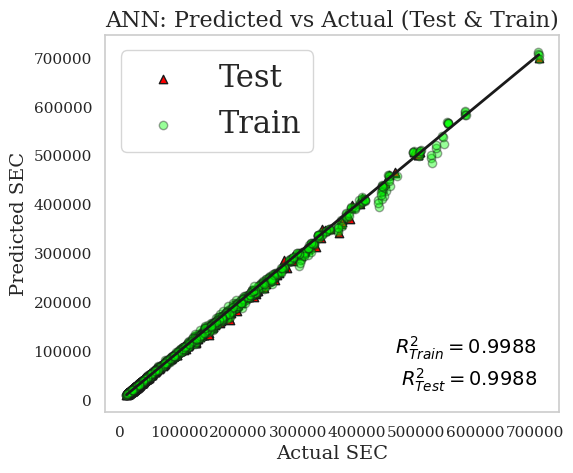

In [44]:
import numpy as np
import matplotlib.pyplot as plt
from sklearn.metrics import r2_score

# Assuming the evaluate function already works as intended
evaluate(y_train, y_pred_train_ann2, "Train")
evaluate(y_test, y_pred_test_ann2, "Test")

# Calculate R² for Train and Test sets
r2_train = r2_score(y_train, y_pred_train_ann2)
r2_test = r2_score(y_test, y_pred_test_ann2)

# Create the figure
plt.figure(figsize=(6,5))

# Plot Test data (in blue, using triangles for markers)
plt.scatter(y_test, y_pred_test_ann2, alpha=1, edgecolor="k", label=f"Test", color='red', marker='^')

# Plot Train data (in red)
plt.scatter(y_train, y_pred_train_ann2, alpha=0.4, edgecolor="k", label=f"Train", color='lime')

# Get the min and max for axis scaling
mn = min(np.min(y_test), np.min(y_pred_test_ann2))
mx = max(np.max(y_test), np.max(y_pred_test_ann2))

# Plot the diagonal line (perfect prediction line)
plt.plot([mn, mx], [mn, mx], "k-", linewidth=2)

# Labels and Title
plt.xlabel("Actual SEC")
plt.ylabel("Predicted SEC")
plt.title("ANN: Predicted vs Actual (Test & Train)")

# Add grid
plt.grid(False)

# Add legend for train and test, including R² values
plt.legend(loc='best', fontsize=22)

# Add R² values text in the southeast corner
textstr = (
    rf'$R^2_{{Train}} = {r2_train:.4f}$' + '\n' +
    rf'$R^2_{{Test}} = {r2_test:.4f}$'
)
# Position the text at the southeast corner
plt.gca().text(0.95, 0.05, textstr, transform=plt.gca().transAxes, fontsize=14,
               verticalalignment='bottom', horizontalalignment='right', color='black')

# Adjust layout and display
plt.tight_layout()
plt.savefig("CrossPlot_ANN_sec.svg", format="svg", dpi=600)
plt.show()

## TabPFN-SEC

In [ ]:
!pip install tabpfn==2.0.0

   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 104.1/104.1 kB 2.5 MB/s eta 0:00:00


In [ ]:
from tabpfn import TabPFNRegressor

X_train_tab2 = df.copy()
y_train_tab2 = df_label2.copy()

X_test_tab2 = ts.copy()
y_test_tab2 = ts_label2.copy()

# Initialize the regressor
regressor = TabPFNRegressor()
regressor.fit(X_train_tab2, y_train_tab2)

# Predict on the test/train set
y_pred_test_tab2 = regressor.predict(X_test_tab2)
y_pred_train_tab2 = regressor.predict(X_train_tab2)

/usr/local/lib/python3.12/dist-packages/tabpfn/base.py:100: UserWarning: Downloading model to /root/.cache/tabpfn/tabpfn-v2-regressor.ckpt.
  model, bardist, config_ = load_model_criterion_config(
/usr/local/lib/python3.12/dist-packages/huggingface_hub/utils/_auth.py:94: UserWarning: 
The secret `HF_TOKEN` does not exist in your Colab secrets.
To authenticate with the Hugging Face Hub, create a token in your settings tab (https://huggingface.co/settings/tokens), set it as secret in your Google Colab and restart your session.
You will be able to reuse this secret in all of your notebooks.
Please note that authentication is recommended but still optional to access public models or datasets.
  warnings.warn(


tabpfn-v2-regressor.ckpt:   0%|          | 0.00/44.4M [00:00<?, ?B/s]

config.json:   0%|          | 0.00/37.0 [00:00<?, ?B/s]

/usr/local/lib/python3.12/dist-packages/sklearn/base.py:474: FutureWarning: `BaseEstimator._validate_data` is deprecated in 1.6 and will be removed in 1.7. Use `sklearn.utils.validation.validate_data` instead. This function becomes public and is part of the scikit-learn developer API.
  warnings.warn(
/usr/local/lib/python3.12/dist-packages/sklearn/utils/deprecation.py:151: FutureWarning: 'force_all_finite' was renamed to 'ensure_all_finite' in 1.6 and will be removed in 1.8.
  warnings.warn(
/usr/local/lib/python3.12/dist-packages/sklearn/utils/deprecation.py:151: FutureWarning: 'force_all_finite' was renamed to 'ensure_all_finite' in 1.6 and will be removed in 1.8.
  warnings.warn(
/usr/local/lib/python3.12/dist-packages/sklearn/base.py:474: FutureWarning: `BaseEstimator._validate_data` is deprecated in 1.6 and will be removed in 1.7. Use `sklearn.utils.validation.validate_data` instead. This function becomes public and is part of the scikit-learn developer API.
  warnings.warn(
/usr

In [ ]:
# Make sure both arrays are 1D
X_train = X_train_tab2
y_train = y_train_tab2
X_test = X_test_tab2
y_test = y_test_tab2

train_vals = y_pred_train_tab2.flatten()
test_vals = y_pred_test_tab2.flatten()

# Pad shorter array with NaN so they align in Excel
max_len = max(len(train_vals), len(test_vals))
train_vals = np.pad(train_vals, (0, max_len - len(train_vals)), constant_values=np.nan)
test_vals = np.pad(test_vals, (0, max_len - len(test_vals)), constant_values=np.nan)

# Create the DataFrame with exactly two columns
df_pred = pd.DataFrame({
    "y_pred_train_tab2": train_vals,
    "y_pred_test_tab2": test_vals
})

# Save to Excel (single sheet)
df_pred.to_excel("tab2_predictions.xlsx", sheet_name="tab2", index=False)

print("Saved to 'tab2_predictions.xlsx'.")

Saved to 'tab2_predictions.xlsx'.



--- Train set metrics ---
R²     : 0.9886
Adj-R² : 0.9886
MSE    : 99209877.791996
RMSE   : 9960.415543
NRMSE  : 0.014280
std_er : 9902.669955
MAE    : 1250.104264
MAPE   : 0.005688
MedAE  : 105.467021
EVS    : 0.988741

--- Test set metrics ---
R²     : 0.9914
Adj-R² : 0.9913
MSE    : 70522472.442753
RMSE   : 8397.765920
NRMSE  : 0.012060
std_er : 8350.681793
MAE    : 1219.796118
MAPE   : 0.007310
MedAE  : 118.710330
EVS    : 0.991519


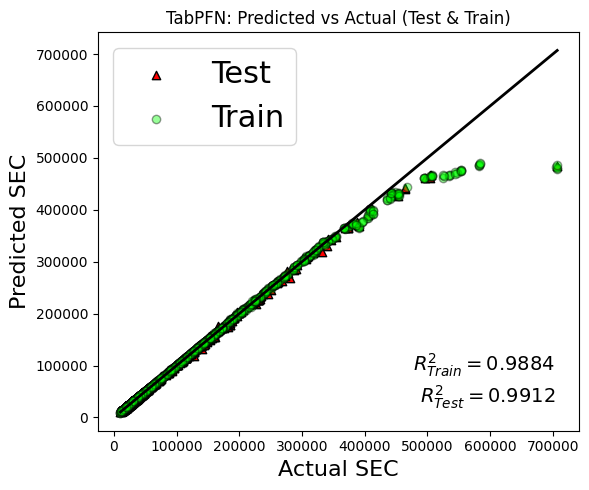

In [ ]:
import numpy as np
import matplotlib.pyplot as plt
from sklearn.metrics import r2_score

# Assuming the evaluate function already works as intended
evaluate(y_train, y_pred_train_tab2, "Train")
evaluate(y_test, y_pred_test_tab2, "Test")

# Calculate R² for Train and Test sets
r2_train = r2_score(y_train, y_pred_train_tab2)
r2_test = r2_score(y_test, y_pred_test_tab2)

# Create the figure
plt.figure(figsize=(6,5))

# scatter plotss
plt.scatter(y_test, y_pred_test_tab2, alpha=1, edgecolor="k", label=f"Test", color='red', marker='^')
plt.scatter(y_train, y_pred_train_tab2, alpha=0.4, edgecolor="k", label=f"Train", color='lime')

# Get the min and max for axis scaling
mn = min(np.min(y_test), np.min(y_pred_test_tab2))
mx = max(np.max(y_test), np.max(y_pred_test_tab2))

# Plot the diagonal line (perfect prediction line)
plt.plot([mn, mx], [mn, mx], "k-", linewidth=2)

# Labels and Title
plt.xlabel("Actual SEC",fontsize=16)
plt.ylabel("Predicted SEC",fontsize=16)
plt.title("TabPFN: Predicted vs Actual (Test & Train)")

# Add grid
plt.grid(False)

# Add legend for train and test, including R² values
plt.legend(loc='best', fontsize=22)

# Add R² values text in the southeast corner
textstr = (
    rf'$R^2_{{Train}} = {r2_train:.4f}$' + '\n' +
    rf'$R^2_{{Test}} = {r2_test:.4f}$'
)
# Position the text at the southeast corner
plt.gca().text(0.95, 0.05, textstr, transform=plt.gca().transAxes, fontsize=14,
               verticalalignment='bottom', horizontalalignment='right', color='black')

# Adjust layout and display
plt.tight_layout()
plt.savefig("CrossPlot_tab_sec.svg", format="svg", dpi=600)
plt.show()

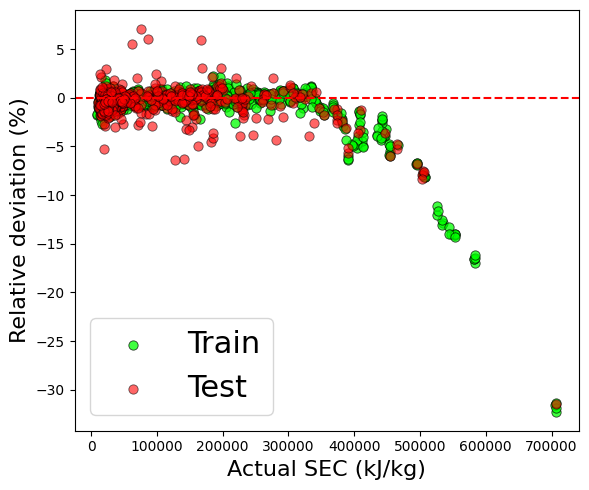

In [ ]:
import numpy as np
import matplotlib.pyplot as plt

eps = 1e-8

####### SEC ##########
plt.figure(figsize=(6, 5))

# Calculate relative deviation for Train
rel_train = (y_pred_train_tab2 - y_train_tab2) / (y_train_tab2 + eps) * 100
plt.scatter(y_train_tab2, rel_train,
            s=45, alpha=0.75, color='lime',
            edgecolor='black', linewidth=0.6, label='Train')

# Calculate relative deviation for Test
rel_test = (y_pred_test_tab2 - y_test_tab2) / (y_test_tab2 + eps) * 100
plt.scatter(y_test_tab2, rel_test,
            s=45, alpha=0.6, color='red',
            edgecolor='black', linewidth=0.6, label='Test')

# Add a horizontal line at y=0 for reference
plt.axhline(0, color='red', linestyle='--')

# Labeling the axes and adding title
plt.xlabel("Actual SEC (kJ/kg)", fontsize=16)
plt.ylabel("Relative deviation (%)", fontsize=16)
# plt.title("TabPFN – Relative deviation for SEC (kJ/kg)", fontsize=16)

# Adding the legend and configuring grid
plt.legend(loc='lower left', fontsize=22)
# plt.grid(False, linestyle='--', alpha=0.45)

# Layout adjustments for better spacing
plt.tight_layout()

# Save the plot as an SVG file
# plt.savefig("Figures/rel_dev_sec.svg", format="svg", dpi=600, bbox_inches="tight")
plt.savefig("TabPFN_rel_er.svg", format="svg")
# Show the plot
plt.show()


## PSO-XGBoost-SEC

In [ ]:
!pip install pyswarms

In [ ]:
"""
PSO-tuned XGBoost Regression
- Uses pyswarms GlobalBestPSO to minimize CV MSE
- Tunes: learning_rate, max_depth, n_estimators, subsample, colsample_bytree, gamma
"""

from xgboost import XGBRegressor
from pyswarms.single import GlobalBestPSO
import warnings


warnings.filterwarnings("ignore")
RANDOM_STATE = 42

# ---------------------------
# 1) Load data and prepare
# ---------------------------

y_train_xg2 = df_label2.copy() # SEC
X_train_xg2 = df.copy()        # features (scaled)

y_test_xg2 = ts_label2.copy()
X_test_xg2 = ts.copy()

# ---------------------------
# 2) PSO fitness function
# ---------------------------
# We'll tune 6 parameters:
# idx 0 -> learning_rate in [0.001, 0.3]
# idx 1 -> max_depth in [1, 10] (int)
# idx 2 -> n_estimators in [50, 1000] (int)
# idx 3 -> subsample in [0.3, 1.0]
# idx 4 -> colsample_bytree in [0.3, 1.0]
# idx 5 -> gamma in [0.0, 5.0]

# bounds arrays for pyswarms
lower_bounds = np.array([0.001, 1, 50, 0.3, 0.3, 0.0])
upper_bounds = np.array([0.3,   10, 1000, 1.0, 1.0, 5.0])

def _params_from_particle(particle):
    """Map a single particle vector to XGBoost params (with casts)."""
    learning_rate = float(particle[0])
    max_depth = int(np.round(particle[1]))
    max_depth = max(1, max_depth)
    n_estimators = int(np.round(particle[2]))
    n_estimators = max(1, n_estimators)
    subsample = float(particle[3])
    colsample_bytree = float(particle[4])
    gamma = float(particle[5])

    params = {
        "learning_rate": learning_rate,
        "max_depth": max_depth,
        "n_estimators": n_estimators,
        "subsample": subsample,
        "colsample_bytree": colsample_bytree,
        "gamma": gamma,
        "random_state": RANDOM_STATE,
        "verbosity": 0,
        "objective": "reg:squarederror",
        # 'tree_method':'hist' could speed up on large data (optional)
    }
    return params

def fitness_function(particles):
    """
    particles: array shape (n_particles, dims)
    returns: array shape (n_particles,) of CV MSE (we minimize)
    """
    n_particles = particles.shape[0]
    scores = np.zeros(n_particles)
    # We use 3-fold CV on training set and return mean MSE
    for i in range(n_particles):
        p = particles[i]
        params = _params_from_particle(p)
        try:
            model = XGBRegressor(**params)
            # negative MSE returned -> convert to positive MSE
            cv_scores = cross_val_score(model, X_train_xg2, y_train_xg2, cv=3, scoring="neg_mean_squared_error", n_jobs=1)
            mse = -np.mean(cv_scores)
            # small regularization to prefer simpler models: add tiny penalty for large n_estimators / depth
            penalty = 1e-6 * (params["n_estimators"] * params["max_depth"])
            scores[i] = mse + penalty
        except Exception as e:
            # something went wrong for this particle: give a large penalty
            scores[i] = 1e10
    return scores

# ---------------------------
# 3) Run PSO
# ---------------------------
# PSO settings
options = {"c1": 1.5, "c2": 1.5, "w": 0.7}

# dimension equals number of hyperparams
dimensions = 6
# initialize optimizer
optimizer = GlobalBestPSO(
    n_particles=16,
    dimensions=dimensions,
    options=options,
    bounds=(lower_bounds, upper_bounds),
    # ftol, etc. could be set; keep defaults
)

print("Starting PSO optimization (this may take some minutes depending on data size)...")
# run optimization: choose moderate iterations to balance runtime vs search
cost, pos = optimizer.optimize(fitness_function, iters=30, verbose=True)
print("PSO finished. best cost (CV MSE):", cost)
print("Best raw particle position:", pos)

# ---------------------------
# 4) Train final XGBoost with best params
# ---------------------------
best_params = _params_from_particle(pos)
print("\nBest hyperparameters (rounded/casted):")
for k, v in best_params.items():
    print(f"  {k}: {v}")

final_model = XGBRegressor(**best_params)
final_model.fit(X_train_xg2, y_train_xg2)


2025-11-01 07:30:35,981 - pyswarms.single.global_best - INFO - Optimize for 30 iters with {'c1': 1.5, 'c2': 1.5, 'w': 0.7}


Starting PSO optimization (this may take some minutes depending on data size)...


pyswarms.single.global_best: 100%|██████████|30/30, best_cost=1.97e+7
2025-11-01 07:39:56,807 - pyswarms.single.global_best - INFO - Optimization finished | best cost: 19668166.260658227, best pos: [3.32502739e-02 4.79005537e+00 6.71859464e+02 5.52552388e-01
 9.20750220e-01 4.56264090e+00]


PSO finished. best cost (CV MSE): 19668166.260658227
Best raw particle position: [3.32502739e-02 4.79005537e+00 6.71859464e+02 5.52552388e-01
 9.20750220e-01 4.56264090e+00]

Best hyperparameters (rounded/casted):
  learning_rate: 0.033250273864687305
  max_depth: 5
  n_estimators: 672
  subsample: 0.5525523879677328
  colsample_bytree: 0.9207502204636566
  gamma: 4.562640895437547
  random_state: 42
  verbosity: 0
  objective: reg:squarederror


XGBRegressor(base_score=None, booster=None, callbacks=None,
             colsample_bylevel=None, colsample_bynode=None,
             colsample_bytree=0.9207502204636566, device=None,
             early_stopping_rounds=None, enable_categorical=False,
             eval_metric=None, feature_types=None, feature_weights=None,
             gamma=4.562640895437547, grow_policy=None, importance_type=None,
             interaction_constraints=None, learning_rate=0.033250273864687305,
             max_bin=None, max_cat_threshold=None, max_cat_to_onehot=None,
             max_delta_step=None, max_depth=5, max_leaves=None,
             min_child_weight=None, missing=nan, monotone_constraints=None,
             multi_strategy=None, n_estimators=672, n_jobs=None,
             num_parallel_tree=None, ...)

In [ ]:
y_pred_test_xg2 = final_model.predict(X_test_xg2)    # "xg" is the model and "2" is the targer which is "SEC"
y_pred_train_xg2 = final_model.predict(X_train_xg2)

# Make sure both arrays are 1D
train_vals = y_pred_train_xg2.flatten()
test_vals = y_pred_test_xg2.flatten()

# Pad shorter array with NaN so they align in Excel
max_len = max(len(train_vals), len(test_vals))
train_vals = np.pad(train_vals, (0, max_len - len(train_vals)), constant_values=np.nan)
test_vals = np.pad(test_vals, (0, max_len - len(test_vals)), constant_values=np.nan)

# Create the DataFrame with exactly two columns
df_pred = pd.DataFrame({
    "y_pred_train_xg2": train_vals,
    "y_pred_test_xg2": test_vals
})

# Save to Excel (single sheet)
df_pred.to_excel("xg2_predictions.xlsx", sheet_name="xg2", index=False)

print("✅ Saved to 'xg2_predictions.xlsx'.")

✅ Saved to 'xg2_predictions.xlsx'.


In [21]:
from xgboost import XGBRegressor
y_train = df_label2.copy() # SEC
X_train = df.copy()        # features (scaled)

y_test = ts_label2.copy()
X_test = ts.copy()

xgb_model2 = XGBRegressor(base_score=None, booster=None, callbacks=None,
             colsample_bylevel=None, colsample_bynode=None,
             colsample_bytree=0.9207502204636566, device=None,
             early_stopping_rounds=None, enable_categorical=False,
             eval_metric=None, feature_types=None, feature_weights=None,
             gamma=4.562640895437547, grow_policy=None, importance_type=None,
             interaction_constraints=None, learning_rate=0.033250273864687305,
             max_bin=None, max_cat_threshold=None, max_cat_to_onehot=None,
             max_delta_step=None, max_depth=5, max_leaves=None,
             min_child_weight=None, monotone_constraints=None,
             multi_strategy=None, n_estimators=672, random_state=42)

xgb_model2.fit(X_train, y_train)
y_pred_test_xg2 = xgb_model2.predict(X_test)    # "xg" is the model and "2" is the targer which is "SEC"
y_pred_train_xg2 = xgb_model2.predict(X_train)


--- Train set metrics ---
R²     : 0.9998
Adj-R² : 0.9998
MSE    : 1493512.072139
RMSE   : 1222.093316
NRMSE  : 0.001752
std_er : 1222.093314
MAE    : 791.825541
MAPE   : 0.018053
MedAE  : 523.119703
EVS    : 0.999829

--- Test set metrics ---
R²     : 0.9992
Adj-R² : 0.9992
MSE    : 6477219.450997
RMSE   : 2545.038202
NRMSE  : 0.003655
std_er : 2544.309662
MAE    : 1395.178897
MAPE   : 0.025184
MedAE  : 706.999898
EVS    : 0.999213


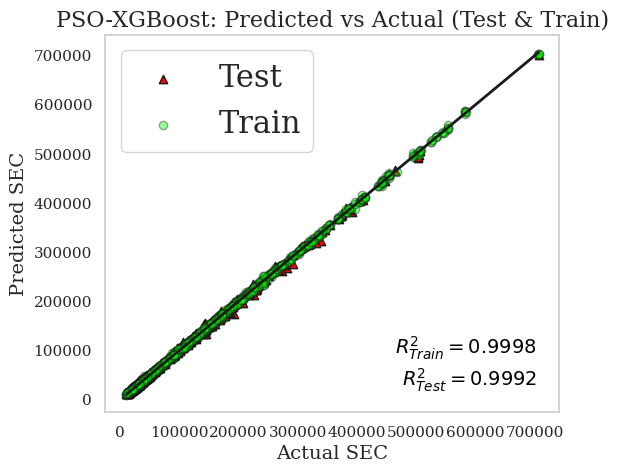

In [22]:
import numpy as np
import matplotlib.pyplot as plt
from sklearn.metrics import r2_score

# Assuming the evaluate function already works as intended
evaluate(y_train, y_pred_train_xg2, "Train")
evaluate(y_test, y_pred_test_xg2, "Test")

# Calculate R² for Train and Test sets
r2_train = r2_score(y_train, y_pred_train_xg2)
r2_test = r2_score(y_test, y_pred_test_xg2)

# Create the figure
plt.figure(figsize=(6,5))

# Plot Test data (in blue, using triangles for markers)
plt.scatter(y_test, y_pred_test_xg2, alpha=1, edgecolor="k", label=f"Test", color='red', marker='^')

# Plot Train data (in red)
plt.scatter(y_train, y_pred_train_xg2, alpha=0.4, edgecolor="k", label=f"Train", color='lime')

# Get the min and max for axis scaling
mn = min(np.min(y_test), np.min(y_pred_test_xg2))
mx = max(np.max(y_test), np.max(y_pred_test_xg2))

# Plot the diagonal line (perfect prediction line)
plt.plot([mn, mx], [mn, mx], "k-", linewidth=2)

# Labels and Title
plt.xlabel("Actual SEC")
plt.ylabel("Predicted SEC")
plt.title("PSO-XGBoost: Predicted vs Actual (Test & Train)")

# Add grid
plt.grid(False)

# Add legend for train and test, including R² values
plt.legend(loc='best', fontsize=22)

# Add R² values text in the southeast corner
textstr = (
    rf'$R^2_{{Train}} = {r2_train:.4f}$' + '\n' +
    rf'$R^2_{{Test}} = {r2_test:.4f}$'
)
# Position the text at the southeast corner
plt.gca().text(0.95, 0.05, textstr, transform=plt.gca().transAxes, fontsize=14,
               verticalalignment='bottom', horizontalalignment='right', color='black')

# Adjust layout and display
plt.tight_layout()
plt.savefig("CrossPlot_xgb_sec.svg", format="svg", dpi=600)
plt.show()

## PSO-GBR-SEC

In [ ]:
y_train = df_label2.copy()
y_test = ts_label2.copy()
X_train = df.copy()
X_test = ts.copy()

In [ ]:
!pip install pyswarms

   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 104.1/104.1 kB 5.5 MB/s eta 0:00:00


In [ ]:
"""
PSO-tuned Gradient Boosting Regression (GBR)
- Uses pyswarms GlobalBestPSO to minimize CV MSE
- Tunes: learning_rate, max_depth, n_estimators, subsample,
         min_samples_split, min_samples_leaf, max_features
"""
from sklearn.ensemble import GradientBoostingRegressor
from pyswarms.single import GlobalBestPSO
from sklearn.model_selection import cross_val_score
import numpy as np
import warnings

warnings.filterwarnings("ignore")
RANDOM_STATE = 42

# ---------------------------
# 1) Your prepared data
# ---------------------------
# Assumes these already exist exactly like in your code:
# X_train, y_train, X_test, y_test

# ---------------------------
# 2) PSO fitness function
# ---------------------------
# We'll tune 7 parameters:
# idx 0 -> learning_rate      in [0.005, 0.30]        (float)
# idx 1 -> max_depth          in [1, 8]               (int)
# idx 2 -> n_estimators       in [50, 1000]           (int)
# idx 3 -> subsample          in [0.50, 1.00]         (float)
# idx 4 -> min_samples_split  in [2, 20]              (int)
# idx 5 -> min_samples_leaf   in [1, 10]              (int)
# idx 6 -> max_features_code  in [0.20, 1.00]         (float) -> maps to None if >=0.99, else fraction

# bounds arrays for pyswarms
lower_bounds = np.array([0.005, 1,   50, 0.50,  2,  1, 0.20])
upper_bounds = np.array([0.300, 8, 1000, 1.00, 20, 10, 1.00])

def _params_from_particle(particle):
    """Map a single particle vector to GBR params (with casts and clipping)."""
    learning_rate = float(np.clip(particle[0], lower_bounds[0], upper_bounds[0]))
    max_depth = int(np.round(np.clip(particle[1], lower_bounds[1], upper_bounds[1])))
    n_estimators = int(np.round(np.clip(particle[2], lower_bounds[2], upper_bounds[2])))
    subsample = float(np.clip(particle[3], lower_bounds[3], upper_bounds[3]))
    min_samples_split = int(np.round(np.clip(particle[4], lower_bounds[4], upper_bounds[4])))
    min_samples_leaf  = int(np.round(np.clip(particle[5], lower_bounds[5], upper_bounds[5])))

    # max_features mapping: treat near-1.0 as None (i.e., use all features)
    max_features_code = float(np.clip(particle[6], lower_bounds[6], upper_bounds[6]))
    max_features = None if max_features_code >= 0.99 else float(max_features_code)

    params = {
        "learning_rate": learning_rate,
        "max_depth": max_depth,
        "n_estimators": n_estimators,
        "subsample": subsample,
        "min_samples_split": min_samples_split,
        "min_samples_leaf": min_samples_leaf,
        "max_features": max_features,
        "random_state": RANDOM_STATE,
    }
    return params

def fitness_function(particles):
    """
    particles: array shape (n_particles, dims)
    returns: array shape (n_particles,) of CV MSE (we minimize)
    """
    n_particles = particles.shape[0]
    scores = np.zeros(n_particles)

    for i in range(n_particles):
        p = particles[i]
        params = _params_from_particle(p)
        try:
            model = GradientBoostingRegressor(**params)
            # negative MSE returned -> convert to positive MSE
            cv_scores = cross_val_score(
                model, X_train, y_train,
                cv=3, scoring="neg_mean_squared_error", n_jobs=1
            )
            mse = -np.mean(cv_scores)

            # tiny regularization to discourage overly large trees / ensembles
            penalty = 1e-6 * (params["n_estimators"] * params["max_depth"])
            scores[i] = mse + penalty
        except Exception:
            # any failure gets a large penalty
            scores[i] = 1e10

    return scores

# ---------------------------
# 3) Run PSO
# ---------------------------
options = {"c1": 1.5, "c2": 1.5, "w": 0.7}
dimensions = 7

optimizer = GlobalBestPSO(
    n_particles=16,
    dimensions=dimensions,
    options=options,
    bounds=(lower_bounds, upper_bounds),

)

print("Starting PSO optimization for GBR (minimize 3-fold CV MSE)...")
cost, pos = optimizer.optimize(fitness_function, iters=30, verbose=True)
print("PSO finished. best cost (CV MSE):", cost)
print("Best raw particle position:", pos)

# ---------------------------
# 4) Train final GBR with best params
# ---------------------------
best_params = _params_from_particle(pos)
print("\nBest hyperparameters (rounded/casted):")
for k, v in best_params.items():
    print(f"  {k}: {v}")

final_model = GradientBoostingRegressor(**best_params)
final_model.fit(X_train, y_train)

2025-11-02 18:12:39,957 - pyswarms.single.global_best - INFO - Optimize for 30 iters with {'c1': 1.5, 'c2': 1.5, 'w': 0.7}


Starting PSO optimization for GBR (minimize 3-fold CV MSE)...


pyswarms.single.global_best: 100%|██████████|30/30, best_cost=1.36e+7
2025-11-02 18:58:40,179 - pyswarms.single.global_best - INFO - Optimization finished | best cost: 13611583.047149595, best pos: [1.42504853e-01 4.38682078e+00 6.07310540e+02 9.95129794e-01
 1.79462503e+01 1.77041603e+00 9.07524805e-01]


PSO finished. best cost (CV MSE): 13611583.047149595
Best raw particle position: [1.42504853e-01 4.38682078e+00 6.07310540e+02 9.95129794e-01
 1.79462503e+01 1.77041603e+00 9.07524805e-01]

Best hyperparameters (rounded/casted):
  learning_rate: 0.14250485305726465
  max_depth: 4
  n_estimators: 607
  subsample: 0.9951297938254593
  min_samples_split: 18
  min_samples_leaf: 2
  max_features: 0.9075248053662535
  random_state: 42


GradientBoostingRegressor(learning_rate=0.14250485305726465, max_depth=4,
                          max_features=0.9075248053662535, min_samples_leaf=2,
                          min_samples_split=18, n_estimators=607,
                          random_state=42, subsample=0.9951297938254593)

In [ ]:
y_pred_test_gbr2 = final_model.predict(X_test)
y_pred_train_gbr2 = final_model.predict(X_train)

# Make sure both arrays are 1D
train_vals = y_pred_train_gbr2.flatten()
test_vals = y_pred_test_gbr2.flatten()

# Pad shorter array with NaN so they align in Excel
max_len = max(len(train_vals), len(test_vals))
train_vals = np.pad(train_vals, (0, max_len - len(train_vals)), constant_values=np.nan)
test_vals = np.pad(test_vals, (0, max_len - len(test_vals)), constant_values=np.nan)

# Create the DataFrame with exactly two columns
df_pred = pd.DataFrame({
    "y_pred_train_gbr2": train_vals,
    "y_pred_test_gbr2": test_vals
})

# Save to Excel (single sheet)
df_pred.to_excel("gbr2_predictions.xlsx", sheet_name="gbr2", index=False)

print("✅ Saved to 'gbr2_predictions.xlsx'.")

✅ Saved to 'gbr2_predictions.xlsx'.


In [ ]:
from sklearn.ensemble import GradientBoostingRegressor
gbr_model2 = GradientBoostingRegressor(learning_rate=0.14250485305726465, max_depth=4,
                          max_features=0.9075248053662535, min_samples_leaf=2,
                          min_samples_split=18, n_estimators=607,
                          random_state=42, subsample=0.9951297938254593)

gbr_model2.fit(X_train, y_train)
y_pred_train_gbr2 = gbr_model2.predict(X_train)
y_pred_test_gbr2 = gbr_model2.predict(X_test)


--- Train set metrics ---
R²     : 0.9999
Adj-R² : 0.9999
MSE    : 504330.634815
RMSE   : 710.162400
NRMSE  : 0.001018
std_er : 710.162396
MAE    : 494.493696
MAPE   : 0.012594
MedAE  : 357.962922
EVS    : 0.999942

--- Test set metrics ---
R²     : 0.9989
Adj-R² : 0.9989
MSE    : 8903036.112680
RMSE   : 2983.795588
NRMSE  : 0.004285
std_er : 2983.063134
MAE    : 1354.868220
MAPE   : 0.021769
MedAE  : 595.565038
EVS    : 0.998918


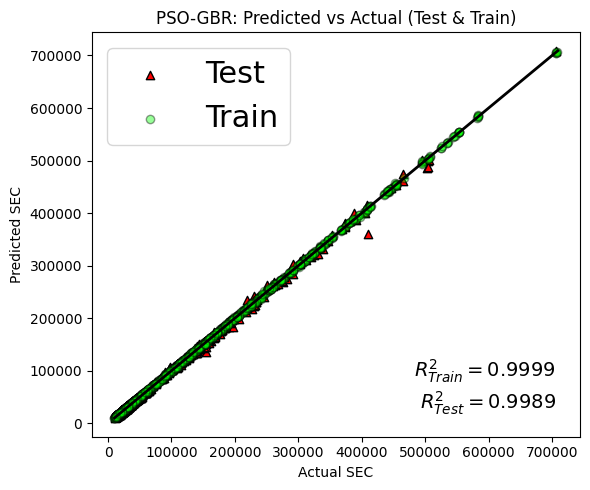

In [ ]:
import numpy as np
import matplotlib.pyplot as plt
from sklearn.metrics import r2_score

# Assuming the evaluate function already works as intended
evaluate(y_train, y_pred_train_gbr2, "Train")
evaluate(y_test, y_pred_test_gbr2, "Test")

# Calculate R² for Train and Test sets
r2_train = r2_score(y_train, y_pred_train_gbr2)
r2_test = r2_score(y_test, y_pred_test_gbr2)

# Create the figure
plt.figure(figsize=(6,5))

# Plot Test data (in blue, using triangles for markers)
plt.scatter(y_test, y_pred_test_gbr2, alpha=1, edgecolor="k", label=f"Test", color='red', marker='^')

# Plot Train data (in red)
plt.scatter(y_train, y_pred_train_gbr2, alpha=0.4, edgecolor="k", label=f"Train", color='lime')

# Get the min and max for axis scaling
mn = min(np.min(y_test), np.min(y_pred_test_gbr2))
mx = max(np.max(y_test), np.max(y_pred_test_gbr2))

# Plot the diagonal line (perfect prediction line)
plt.plot([mn, mx], [mn, mx], "k-", linewidth=2)

# Labels and Title
plt.xlabel("Actual SEC")
plt.ylabel("Predicted SEC")
plt.title("PSO-GBR: Predicted vs Actual (Test & Train)")

# Add grid
plt.grid(False)

# Add legend for train and test, including R² values
plt.legend(loc='best', fontsize=22)

# Add R² values text in the southeast corner
textstr = (
    rf'$R^2_{{Train}} = {r2_train:.4f}$' + '\n' +
    rf'$R^2_{{Test}} = {r2_test:.4f}$'
)
# Position the text at the southeast corner
plt.gca().text(0.95, 0.05, textstr, transform=plt.gca().transAxes, fontsize=14,
               verticalalignment='bottom', horizontalalignment='right', color='black')

# Adjust layout and display
plt.tight_layout()
plt.savefig("CrossPlot_gbr_sec.svg", format="svg", dpi=600)
plt.show()

## PSO-CatBoost-SEC

In [ ]:
!pip install pyswarms

In [ ]:
!pip install catboost

   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 97.1/97.1 MB 9.5 MB/s eta 0:00:00


In [ ]:
"""
PSO-tuned CatBoost Regression
- Uses pyswarms GlobalBestPSO to minimize CV MSE
- Tunes: learning_rate, depth, iterations, subsample, rsm, l2_leaf_reg
"""
import numpy as np
from catboost import CatBoostRegressor
from sklearn.model_selection import cross_val_score
from pyswarms.single import GlobalBestPSO
import warnings

warnings.filterwarnings("ignore")
RANDOM_STATE = 42

# ---------------------------
# 1) Data (same as your XGB block)
# ---------------------------
y_train = df_label2.copy().values  # Recovery
X_train = df.copy().values         # features (scaled)

y_test  = ts_label2.copy().values
X_test  = ts.copy().values

# ---------------------------
# 2) PSO fitness function
# ---------------------------
# dims:
# 0 -> learning_rate      [0.001, 0.3]
# 1 -> depth              [1, 10] (int)
# 2 -> iterations         [50, 1000] (int)
# 3 -> subsample          [0.3, 1.0]
# 4 -> rsm                [0.3, 1.0]  (feature subsampling)
# 5 -> l2_leaf_reg        [0.0, 10.0]

lower_bounds = np.array([0.001, 1,   50, 0.3, 0.3, 0.0])
upper_bounds = np.array([0.300, 10, 1000, 1.0, 1.0,10.0])

def _params_from_particle(p):
    """Map a particle to CatBoost params (cast + clip)."""
    learning_rate = float(np.clip(p[0], lower_bounds[0], upper_bounds[0]))
    depth         = int(np.round(np.clip(p[1], lower_bounds[1], upper_bounds[1])))
    iterations    = int(np.round(np.clip(p[2], lower_bounds[2], upper_bounds[2])))
    subsample     = float(np.clip(p[3], lower_bounds[3], upper_bounds[3]))
    rsm           = float(np.clip(p[4], lower_bounds[4], upper_bounds[4]))
    l2_leaf_reg   = float(np.clip(p[5], lower_bounds[5], upper_bounds[5]))

    params = {
        "learning_rate": learning_rate,
        "depth": depth,
        "iterations": iterations,
        "subsample": subsample,
        "rsm": rsm,
        "l2_leaf_reg": l2_leaf_reg,
        "loss_function": "RMSE",
        "random_seed": RANDOM_STATE,
        "verbose": False,
        "allow_writing_files": False,
        "bootstrap_type": "Bernoulli",
        "task_type": "GPU"
    }
    return params

def fitness_function(particles):
    """
    particles: (n_particles, dims)
    returns:   (n_particles,) mean CV MSE (to minimize)
    """
    n_particles = particles.shape[0]
    scores = np.zeros(n_particles)

    for i in range(n_particles):
        p = particles[i]
        params = _params_from_particle(p)
        try:
            model = CatBoostRegressor(**params)
            # cross_val_score returns neg MSE -> take positive MSE
            cv_scores = cross_val_score(
                model, X_train, y_train,
                cv=3, scoring="neg_mean_squared_error", n_jobs=1
            )
            mse = -np.mean(cv_scores)
            # tiny complexity penalty (iterations * depth)
            penalty = 1e-6 * (params["iterations"] * params["depth"])
            scores[i] = mse + penalty
        except Exception:
            scores[i] = 1e10
    return scores

# ---------------------------
# 3) Run PSO
# ---------------------------
options = {"c1": 1.5, "c2": 1.5, "w": 0.7}
dimensions = 6

optimizer = GlobalBestPSO(
    n_particles=16,
    dimensions=dimensions,
    options=options,
    bounds=(lower_bounds, upper_bounds),
)

print("Starting PSO optimization for CatBoost (minimize 3-fold CV MSE)...")
cost, pos = optimizer.optimize(fitness_function, iters=30, verbose=True)
print("PSO finished. best cost (CV MSE):", cost)
print("Best raw particle position:", pos)

# ---------------------------
# 4) Train final CatBoost with best params
# ---------------------------
best_params = _params_from_particle(pos)
print("\nBest hyperparameters (rounded/casted):")
for k, v in best_params.items():
    print(f"  {k}: {v}")

final_model = CatBoostRegressor(**best_params)
# Force CPU right before training to avoid pairwise error
final_model.set_params(task_type="CPU")   # <--- add this line
final_model.fit(X_train, y_train, verbose=False)

2025-11-05 19:19:24,039 - pyswarms.single.global_best - INFO - Optimize for 30 iters with {'c1': 1.5, 'c2': 1.5, 'w': 0.7}


Starting PSO optimization for CatBoost (minimize 3-fold CV MSE)...


pyswarms.single.global_best: 100%|██████████|30/30, best_cost=1e+10
2025-11-05 19:19:40,424 - pyswarms.single.global_best - INFO - Optimization finished | best cost: 10000000000.0, best pos: [4.46376869e-02 5.25803068e+00 4.84484781e+02 8.60113474e-01
 6.48470268e-01 5.98769289e-01]


PSO finished. best cost (CV MSE): 10000000000.0
Best raw particle position: [4.46376869e-02 5.25803068e+00 4.84484781e+02 8.60113474e-01
 6.48470268e-01 5.98769289e-01]

Best hyperparameters (rounded/casted):
  learning_rate: 0.04463768687603424
  depth: 5
  iterations: 484
  subsample: 0.8601134735851019
  rsm: 0.6484702678951451
  l2_leaf_reg: 0.5987692889341945
  loss_function: RMSE
  random_seed: 42
  verbose: False
  allow_writing_files: False
  bootstrap_type: Bernoulli
  task_type: GPU


In [ ]:
print("CatBoostRegressor(", end="")
for i, (k, v) in enumerate(final_model.get_params().items()):
    comma = "," if i < len(final_model.get_params()) - 1 else ""
    print(f"{k}={repr(v)}{comma}")
print(")")

CatBoostRegressor(iterations=484,
learning_rate=0.04463768687603424,
depth=5,
l2_leaf_reg=0.5987692889341945,
rsm=0.6484702678951451,
loss_function='RMSE',
random_seed=42,
verbose=False,
allow_writing_files=False,
task_type='CPU',
bootstrap_type='Bernoulli',
subsample=0.8601134735851019
)


In [ ]:
y_pred_test_cb2 = final_model.predict(X_test)
y_pred_train_cb2 = final_model.predict(X_train)

# Make sure both arrays are 1D
train_vals = y_pred_train_cb2.flatten()
test_vals = y_pred_test_cb2.flatten()

# Pad shorter array with NaN so they align in Excel
max_len = max(len(train_vals), len(test_vals))
train_vals = np.pad(train_vals, (0, max_len - len(train_vals)), constant_values=np.nan)
test_vals = np.pad(test_vals, (0, max_len - len(test_vals)), constant_values=np.nan)

# Create the DataFrame with exactly two columns
df_pred = pd.DataFrame({
    "y_pred_train_cb2": train_vals,
    "y_pred_test_cb2": test_vals
})

# Save to Excel (single sheet)
df_pred.to_excel("cb2_predictions.xlsx", sheet_name="cb2", index=False)

print("✅ Saved to 'cb2_predictions.xlsx'.")

✅ Saved to 'cb2_predictions.xlsx'.


In [ ]:
from catboost import CatBoostRegressor
cb_model2 = CatBoostRegressor(iterations=484, learning_rate=0.04463768687603424, depth=5,
                              l2_leaf_reg=0.5987692889341945, rsm=0.6484702678951451,
                              loss_function='RMSE', random_seed=42, verbose=False,
                              allow_writing_files=False, task_type='CPU',
                              bootstrap_type='Bernoulli', subsample=0.8601134735851019)

cb_model2.fit(X_train, y_train)
y_pred_train_cb2 = cb_model2.predict(X_train)
y_pred_test_cb2 = cb_model2.predict(X_test)


--- Train set metrics ---
R²     : 0.9996
Adj-R² : 0.9996
MSE    : 3653079.879107
RMSE   : 1911.303189
NRMSE  : 0.002740
std_er : 1911.303109
MAE    : 1302.942049
MAPE   : 0.029713
MedAE  : 889.743946
EVS    : 0.999581

--- Test set metrics ---
R²     : 0.9993
Adj-R² : 0.9993
MSE    : 5882999.370962
RMSE   : 2425.489512
NRMSE  : 0.003483
std_er : 2425.480207
MAE    : 1585.003997
MAPE   : 0.032990
MedAE  : 964.225155
EVS    : 0.999285


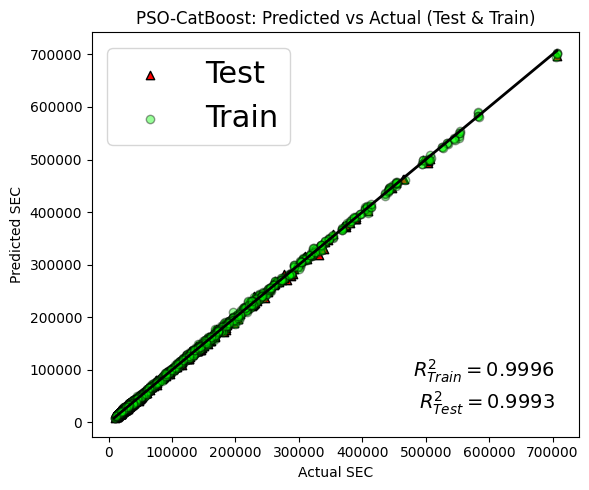

In [ ]:
import numpy as np
import matplotlib.pyplot as plt
from sklearn.metrics import r2_score

# Assuming the evaluate function already works as intended
evaluate(y_train, y_pred_train_cb2, "Train")
evaluate(y_test, y_pred_test_cb2, "Test")

# Calculate R² for Train and Test sets
r2_train = r2_score(y_train, y_pred_train_cb2)
r2_test = r2_score(y_test, y_pred_test_cb2)

# Create the figure
plt.figure(figsize=(6,5))

# Plot Test data (in blue, using triangles for markers)
plt.scatter(y_test, y_pred_test_cb2, alpha=1, edgecolor="k", label=f"Test", color='red', marker='^')

# Plot Train data (in red)
plt.scatter(y_train, y_pred_train_cb2, alpha=0.4, edgecolor="k", label=f"Train", color='lime')

# Get the min and max for axis scaling
mn = min(np.min(y_test), np.min(y_pred_test_cb2))
mx = max(np.max(y_test), np.max(y_pred_test_cb2))

# Plot the diagonal line (perfect prediction line)
plt.plot([mn, mx], [mn, mx], "k-", linewidth=2)

# Labels and Title
plt.xlabel("Actual SEC")
plt.ylabel("Predicted SEC")
plt.title("PSO-CatBoost: Predicted vs Actual (Test & Train)")

# Add grid
plt.grid(False)

# Add legend for train and test, including R² values
plt.legend(loc='best', fontsize=22)

# Add R² values text in the southeast corner
textstr = (
    rf'$R^2_{{Train}} = {r2_train:.4f}$' + '\n' +
    rf'$R^2_{{Test}} = {r2_test:.4f}$'
)
# Position the text at the southeast corner
plt.gca().text(0.95, 0.05, textstr, transform=plt.gca().transAxes, fontsize=14,
               verticalalignment='bottom', horizontalalignment='right', color='black')

# Adjust layout and display
plt.tight_layout()
plt.savefig("CrossPlot_cb_sec.svg", format="svg", dpi=600)
plt.show()

## PSO-AdaBoost-SEC

In [ ]:
!pip install pyswarms

In [ ]:
"""
PSO-tuned AdaBoost Regression
- Uses pyswarms GlobalBestPSO to minimize CV MSE
- Tunes: learning_rate, n_estimators, max_depth (of base tree),
         min_samples_leaf (of base tree), loss
"""
import numpy as np
from sklearn.ensemble import AdaBoostRegressor
from sklearn.tree import DecisionTreeRegressor
from sklearn.model_selection import cross_val_score
from pyswarms.single import GlobalBestPSO
import warnings

warnings.filterwarnings("ignore")
RANDOM_STATE = 42

# ---------------------------
# 1) Data (same pattern as yours)
# ---------------------------
y_train = df_label2.copy().values  # e.g., Recovery
X_train = df.copy().values
y_test  = ts_label2.copy().values
X_test  = ts.copy().values

# ---------------------------
# 2) PSO fitness function
# ---------------------------
# dims:
# 0 -> learning_rate       [0.005, 1.0]
# 1 -> n_estimators        [50, 1000] (int)
# 2 -> max_depth           [1, 10]    (int) for base DecisionTree
# 3 -> min_samples_leaf    [1, 20]    (int) for base DecisionTree
# 4 -> loss_code           [0, 2]     (int) -> 0:'linear', 1:'square', 2:'exponential'

lower_bounds = np.array([0.005,   50,  1,  1, 0])
upper_bounds = np.array([1.000, 1000, 10, 20, 2])

_LOSSES = ['linear', 'square', 'exponential']

def _params_from_particle(p):
    """Map a particle to AdaBoost params (cast + clip)."""
    learning_rate    = float(np.clip(p[0], lower_bounds[0], upper_bounds[0]))
    n_estimators     = int(np.round(np.clip(p[1], lower_bounds[1], upper_bounds[1])))
    max_depth        = int(np.round(np.clip(p[2], lower_bounds[2], upper_bounds[2])))
    min_samples_leaf = int(np.round(np.clip(p[3], lower_bounds[3], upper_bounds[3])))
    loss_code        = int(np.round(np.clip(p[4], lower_bounds[4], upper_bounds[4])))
    loss             = _LOSSES[loss_code]

    # Base learner
    base_tree = DecisionTreeRegressor(
        max_depth=max_depth,
        min_samples_leaf=min_samples_leaf,
        random_state=RANDOM_STATE
    )

    params = {
        "estimator": base_tree,          # sklearn >= 1.2
        "n_estimators": n_estimators,
        "learning_rate": learning_rate,
        "loss": loss,
        "random_state": RANDOM_STATE
    }
    return params, dict(
        learning_rate=learning_rate, n_estimators=n_estimators,
        max_depth=max_depth, min_samples_leaf=min_samples_leaf, loss=loss
    )

def fitness_function(particles):
    """
    particles: (n_particles, dims)
    returns:   (n_particles,) mean CV MSE (to minimize)
    """
    n_particles = particles.shape[0]
    scores = np.zeros(n_particles)

    for i in range(n_particles):
        p = particles[i]
        params, flat = _params_from_particle(p)
        try:
            model = AdaBoostRegressor(**params)
            # cross_val_score returns neg MSE -> convert to +MSE
            cv_scores = cross_val_score(
                model, X_train, y_train.ravel(),
                cv=3, scoring="neg_mean_squared_error", n_jobs=1
            )
            mse = -np.mean(cv_scores)
            # tiny complexity penalty to prefer simpler ensembles
            penalty = 1e-6 * (flat["n_estimators"] * flat["max_depth"])
            scores[i] = mse + penalty
        except Exception:
            scores[i] = 1e10
    return scores

# ---------------------------
# 3) Run PSO
# ---------------------------
options = {"c1": 1.5, "c2": 1.5, "w": 0.7}
dimensions = 5

optimizer = GlobalBestPSO(
    n_particles=16,
    dimensions=dimensions,
    options=options,
    bounds=(lower_bounds, upper_bounds),
)

print("Starting PSO optimization for AdaBoost (minimize 3-fold CV MSE)...")
cost, pos = optimizer.optimize(fitness_function, iters=20, verbose=True)
print("PSO finished. best cost (CV MSE):", cost)
print("Best raw particle position:", pos)

# ---------------------------
# 4) Train final AdaBoost with best params
# ---------------------------
best_params, best_flat = _params_from_particle(pos)
print("\nBest hyperparameters (rounded/casted):")
for k, v in best_flat.items():
    print(f"  {k}: {v}")

final_model = AdaBoostRegressor(**best_params)
final_model.fit(X_train, y_train.ravel())

2025-11-05 23:23:12,825 - pyswarms.single.global_best - INFO - Optimize for 20 iters with {'c1': 1.5, 'c2': 1.5, 'w': 0.7}


Starting PSO optimization for AdaBoost (minimize 3-fold CV MSE)...


pyswarms.single.global_best: 100%|██████████|20/20, best_cost=6.2e+7 
2025-11-05 23:54:04,561 - pyswarms.single.global_best - INFO - Optimization finished | best cost: 61972374.796547756, best pos: [4.79481012e-01 5.93474067e+02 9.81963238e+00 3.15159208e+00
 1.08916234e+00]


PSO finished. best cost (CV MSE): 61972374.796547756
Best raw particle position: [4.79481012e-01 5.93474067e+02 9.81963238e+00 3.15159208e+00
 1.08916234e+00]

Best hyperparameters (rounded/casted):
  learning_rate: 0.4794810120159413
  n_estimators: 593
  max_depth: 10
  min_samples_leaf: 3
  loss: square


,estimator,DecisionTreeR...ndom_state=42)
,n_estimators,593
,learning_rate,0.4794810120159413
,loss,'square'
,random_state,42
,criterion,'squared_error'
,splitter,'best'
,max_depth,10
,min_samples_split,2
,min_samples_leaf,3
,min_weight_fraction_leaf,0.0


In [ ]:
print("AdaBoostRegressor(", end="")
for i, (k, v) in enumerate(final_model.get_params().items()):
    comma = "," if i < len(final_model.get_params()) - 1 else ""
    print(f"{k}={repr(v)}{comma}")
print(")")

AdaBoostRegressor(estimator__ccp_alpha=0.0,
estimator__criterion='squared_error',
estimator__max_depth=10,
estimator__max_features=None,
estimator__max_leaf_nodes=None,
estimator__min_impurity_decrease=0.0,
estimator__min_samples_leaf=3,
estimator__min_samples_split=2,
estimator__min_weight_fraction_leaf=0.0,
estimator__monotonic_cst=None,
estimator__random_state=42,
estimator__splitter='best',
estimator=DecisionTreeRegressor(max_depth=10, min_samples_leaf=3, random_state=42),
learning_rate=0.4794810120159413,
loss='square',
n_estimators=593,
random_state=42
)


In [ ]:
y_pred_test_adb2 = final_model.predict(X_test)
y_pred_train_adb2 = final_model.predict(X_train)

# Make sure both arrays are 1D
train_vals = y_pred_train_adb2.flatten()
test_vals = y_pred_test_adb2.flatten()

# Pad shorter array with NaN so they align in Excel
max_len = max(len(train_vals), len(test_vals))
train_vals = np.pad(train_vals, (0, max_len - len(train_vals)), constant_values=np.nan)
test_vals = np.pad(test_vals, (0, max_len - len(test_vals)), constant_values=np.nan)

# Create the DataFrame with exactly two columns
df_pred = pd.DataFrame({
    "y_pred_train_adb2": train_vals,
    "y_pred_test_adb2": test_vals
})

# Save to Excel (single sheet)
df_pred.to_excel("adb2_predictions.xlsx", sheet_name="adb2", index=False)

print("✅ Saved to 'adb2_predictions.xlsx'.")

✅ Saved to 'adb2_predictions.xlsx'.


In [ ]:
from sklearn.ensemble import AdaBoostRegressor
from sklearn.tree import DecisionTreeRegressor
import matplotlib.pyplot as plt

# Define base estimator
base_tree = DecisionTreeRegressor(
    criterion='squared_error',
    max_depth=10,
    min_samples_leaf=3,
    random_state=42
)

# Define AdaBoost model
adb_model2 = AdaBoostRegressor(
    estimator=base_tree,
    learning_rate=0.479481012015941,
    loss='square',
    n_estimators=593,
    random_state=42
)

# Fit model
adb_model2.fit(X_train, y_train)

# Predict
y_pred_train_adb2 = adb_model2.predict(X_train)
y_pred_test_adb2 = adb_model2.predict(X_test)


--- Train set metrics ---
R²     : 0.9993
Adj-R² : 0.9993
MSE    : 5719473.456847
RMSE   : 2391.542067
NRMSE  : 0.003429
std_er : 2164.359926
MAE    : 1876.931660
MAPE   : 0.072525
MedAE  : 1625.042173
EVS    : 0.999462

--- Test set metrics ---
R²     : 0.9976
Adj-R² : 0.9975
MSE    : 20105663.846052
RMSE   : 4483.933970
NRMSE  : 0.006439
std_er : 4435.205560
MAE    : 2765.234702
MAPE   : 0.078248
MedAE  : 2090.515883
EVS    : 0.997608


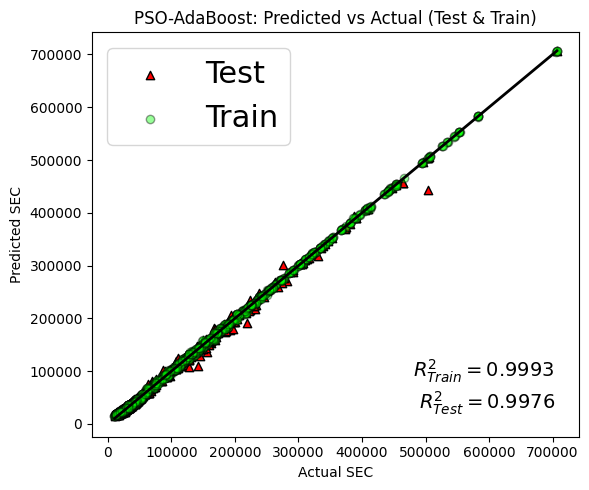

In [ ]:
import numpy as np
import matplotlib.pyplot as plt
from sklearn.metrics import r2_score

# Assuming the evaluate function already works as intended
evaluate(y_train, y_pred_train_adb2, "Train")
evaluate(y_test, y_pred_test_adb2, "Test")

# Calculate R² for Train and Test sets
r2_train = r2_score(y_train, y_pred_train_adb2)
r2_test = r2_score(y_test, y_pred_test_adb2)

# Create the figure
plt.figure(figsize=(6,5))

# Plot Test data (in blue, using triangles for markers)
plt.scatter(y_test, y_pred_test_adb2, alpha=1, edgecolor="k", label=f"Test", color='red', marker='^')

# Plot Train data (in red)
plt.scatter(y_train, y_pred_train_adb2, alpha=0.4, edgecolor="k", label=f"Train", color='lime')

# Get the min and max for axis scaling
mn = min(np.min(y_test), np.min(y_pred_test_adb2))
mx = max(np.max(y_test), np.max(y_pred_test_adb2))

# Plot the diagonal line (perfect prediction line)
plt.plot([mn, mx], [mn, mx], "k-", linewidth=2)

# Labels and Title
plt.xlabel("Actual SEC")
plt.ylabel("Predicted SEC")
plt.title("PSO-AdaBoost: Predicted vs Actual (Test & Train)")

# Add grid
plt.grid(False)

# Add legend for train and test, including R² values
plt.legend(loc='best', fontsize=22)

# Add R² values text in the southeast corner
textstr = (
    rf'$R^2_{{Train}} = {r2_train:.4f}$' + '\n' +
    rf'$R^2_{{Test}} = {r2_test:.4f}$'
)
# Position the text at the southeast corner
plt.gca().text(0.95, 0.05, textstr, transform=plt.gca().transAxes, fontsize=14,
               verticalalignment='bottom', horizontalalignment='right', color='black')

# Adjust layout and display
plt.tight_layout()
plt.savefig("CrossPlot_adb_sec.svg", format="svg", dpi=600)
plt.show()

# **Target3: Purity**

## ANN-Purity

In [45]:
xtrain = df.copy()
xtest = ts.copy()
# pur%
ytrain = df_label3.copy()
ytest = ts_label3.copy()
pd.concat([xtrain, ytrain]).describe().transpose()

,count,mean,std,min,25%,50%,75%,max
Unnamed: 0,3540.0,1.010491e-16,1.000141,-1.745613,-0.861689,-0.006108,0.864628,1.737333
Fluegas CO2 mol%,3540.0,1.298396e-16,1.000141,-1.440487,-0.867272,-0.064770,0.852375,1.425590
Fluegas Flow (kg/h),3540.0,-2.413637e-16,1.000141,-2.540105,-1.017223,0.251846,0.886380,1.394007
Lean Solvent Flow (kg/h),3540.0,-3.625474e-16,1.000141,-1.451145,-0.845417,-0.239688,0.668904,2.637521
Lean Solvent Loading,3540.0,1.043735e-16,1.000141,-1.388390,-0.710245,-0.272846,0.418934,9.193916
Amine type,3540.0,-1.186747e-16,1.000141,-1.240754,-1.240754,0.283017,1.044902,1.806787
Amine Conc (wt%),3540.0,1.333836e-16,1.000141,-1.396555,-0.953182,-0.296676,0.801302,2.556344
Lean Solvent T (C),3540.0,-2.816328e-16,1.000141,-1.808437,-0.289878,-0.289878,-0.289878,2.620695
Reboiler Duty (MW),3540.0,1.120573e-15,1.000141,-1.814452,-0.308904,-0.308904,-0.308904,2.632286
CO2 Purity (mol%),3540.0,3.759379e+01,28.460158,1.030479,12.310011,31.784004,55.834489,99.885608


**tuning the hyperparameters**

In [ ]:
!pip install keras_tuner

   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 129.1/129.1 kB 5.7 MB/s eta 0:00:00


In [ ]:
!pip install tensorflow.keras

In [ ]:
import keras_tuner as kt
from tensorflow import keras
from tensorflow.keras import layers
import tensorflow as tf
import numpy as np
import random

# --- Fix seeds for reproducibility ---
SEED = 42
tf.random.set_seed(SEED)
np.random.seed(SEED)
random.seed(SEED)

# -- Normalizer ---
normalizer = keras.layers.Normalization()
normalizer.adapt(np.array(xtrain))

def build_model(hp):
    model = keras.Sequential()
    model.add(normalizer)

    # Tune number of hidden layers (1 to 3)
    for i in range(hp.Int('num_layers', 1, 3)):
        model.add(layers.Dense(
            units=hp.Int(f'units_{i}', min_value=16, max_value=128, step=8),
            activation='relu'
        ))

    # Output layer
    model.add(layers.Dense(1))

    # Tune learning rate
    learning_rate = hp.Choice('learning_rate', values=[1e-1, 1e-2, 1e-3, 1e-4])
    model.compile(
        optimizer=keras.optimizers.Adam(learning_rate=learning_rate),
        loss='mean_absolute_error'
    )
    return model

# Instantiate tuner (set seed here too)
tuner = kt.RandomSearch(
    build_model,
    objective='val_loss',
    max_trials=10,
    executions_per_trial=1,
    directory='tuner_dir',
    project_name='ann_tuning',
    overwrite=True,  # ensures consistency between runs
    seed=SEED        # ensures deterministic search
)

# Search best hyperparameters
tuner.search(xtrain, ytrain,
             epochs=50,
             validation_split=0.2,
             verbose=1)

# Retrieve best model and hyperparameters
best_model = tuner.get_best_models(num_models=1)[0]
best_hps = tuner.get_best_hyperparameters(num_trials=1)[0]

print("Best number of layers:", best_hps.get('num_layers'))
for i in range(best_hps.get('num_layers')):
    print(f"Units in layer {i}:", best_hps.get(f'units_{i}'))
print("Best learning rate:", best_hps.get('learning_rate'))

# Train best model
best_model.fit(xtrain, ytrain, epochs=100, validation_split=0.2, verbose=1)

Trial 10 Complete [00h 00m 22s]
val_loss: 0.8487857580184937

Best val_loss So Far: 0.8487857580184937
Total elapsed time: 00h 04m 31s
Best number of layers: 3
Units in layer 0: 32
Units in layer 1: 72
Units in layer 2: 32
Best learning rate: 0.01
Epoch 1/100
89/89 ━━━━━━━━━━━━━━━━━━━━ 3s 15ms/step - loss: 1.4648 - val_loss: 1.0657
Epoch 2/100
89/89 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - loss: 1.2561 - val_loss: 0.9314
Epoch 3/100
89/89 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - loss: 1.0790 - val_loss: 1.9846
Epoch 4/100
89/89 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 1.4252 - val_loss: 1.5348
Epoch 5/100
89/89 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - loss: 1.3450 - val_loss: 1.5359
Epoch 6/100
89/89 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 1.1938 - val_loss: 1.3229
Epoch 7/100
89/89 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - loss: 1.1619 - val_loss: 1.4286
Epoch 8/100
89/89 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - loss: 1.2172 - val_loss: 1.4448
Epoch 9/100
89/89 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - loss: 1.0817 - val

In [ ]:
best_model.summary()

Model: "sequential"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ normalization (Normalization)   │ (None, 8)              │            17 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense (Dense)                   │ (None, 32)             │           288 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1 (Dense)                 │ (None, 72)             │         2,376 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_2 (Dense)                 │ (None, 32)             │         2,336 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_3 (Dense)                 │ (None, 1)              │            33 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 15,118 (59.06 KB)

 Trainable params: 5,033 (19.66 KB)

 Non-trainable params: 17 (72.00 B)

 Optimizer params: 10,068 (39.33 KB)

In [ ]:
best_model.compile(optimizer = keras.optimizers.Adam(), #keras.optimizers.Adam change if needed
              loss= 'mean_absolute_error')
best_model.fit(xtrain, ytrain, verbose=0, epochs=101)

y_pred_test_ann3 = best_model.predict(xtest).flatten()
y_pred_train_ann3 = best_model.predict(xtrain).flatten()

28/28 ━━━━━━━━━━━━━━━━━━━━ 1s 14ms/step
111/111 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step


In [ ]:
# Make sure both arrays are 1D
train_vals = y_pred_train_ann3.flatten()
test_vals = y_pred_test_ann3.flatten()

# Pad shorter array with NaN so they align in Excel
max_len = max(len(train_vals), len(test_vals))
train_vals = np.pad(train_vals, (0, max_len - len(train_vals)), constant_values=np.nan)
test_vals = np.pad(test_vals, (0, max_len - len(test_vals)), constant_values=np.nan)

# Create the DataFrame with exactly two columns
df_pred = pd.DataFrame({
    "y_pred_train_ann3": train_vals,
    "y_pred_test_ann3": test_vals
})

# Save to Excel (single sheet)
df_pred.to_excel("ann3_predictions.xlsx", sheet_name="ann3", index=False)

print("✅ Saved to 'ann3_predictions.xlsx'.")

✅ Saved to 'ann3_predictions.xlsx'.


In [61]:
## Tunned ANN model for purity
from tensorflow import keras
from tensorflow.keras import layers
import tensorflow as tf
import numpy as np
import random
import os

SEED = 142
random.seed(SEED)
np.random.seed(SEED)
tf.random.set_seed(SEED)
os.environ['PYTHONHASHSEED'] = str(SEED)
os.environ['TF_DETERMINISTIC_OPS'] = '1'

X_train = df.copy()
X_test = ts.copy()
y_train = df_label3.copy()
y_test = ts_label3.copy()

n_features = X_train.shape[1]
# Best model purity
ann_model3 = keras.Sequential([
    layers.Input(shape=(n_features,)),
    layers.Dense(32, activation='relu'),
    layers.Dense(72, activation='relu'),
    layers.Dense(32, activation='relu'),
    layers.Dense(1)                       # single output
])

# Compile
ann_model3.compile(optimizer=keras.optimizers.Adam(learning_rate=0.01),
                   loss='mean_absolute_error')
# fit/predict/evaluate
ann_model3.fit(X_train, y_train, epochs=100, batch_size=32, verbose=0)

y_pred_test_ann3 = ann_model3.predict(X_test).flatten()
y_pred_train_ann3 = ann_model3.predict(X_train).flatten()

28/28 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step
111/111 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step



--- Train set metrics ---
R²     : 0.9983
Adj-R² : 0.9983
MSE    : 1.406519
RMSE   : 1.185967
NRMSE  : 0.011997
std_er : 1.099652
MAE    : 0.779993
MAPE   : 0.027713
MedAE  : 0.464872
EVS    : 0.998507

--- Test set metrics ---
R²     : 0.9982
Adj-R² : 0.9982
MSE    : 1.491171
RMSE   : 1.221135
NRMSE  : 0.012353
std_er : 1.156360
MAE    : 0.802219
MAPE   : 0.030887
MedAE  : 0.499681
EVS    : 0.998373


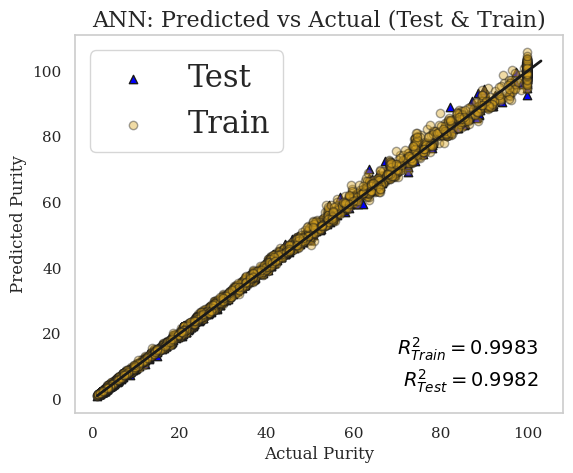

In [66]:
import numpy as np
import matplotlib.pyplot as plt
from sklearn.metrics import r2_score

# Assuming the evaluate function already works as intended
evaluate(y_train, y_pred_train_ann3, "Train")
evaluate(y_test, y_pred_test_ann3, "Test")

# Calculate R² for Train and Test sets
r2_train = r2_score(y_train, y_pred_train_ann3)
r2_test = r2_score(y_test, y_pred_test_ann3)

# Create the figure
plt.figure(figsize=(6,5))

# Plot Test data (in blue, using triangles for markers)
plt.scatter(y_test, y_pred_test_ann3, alpha=1, edgecolor="k", label=f"Test", color='blue', marker='^')

# Plot Train data (in red)
plt.scatter(y_train, y_pred_train_ann3, alpha=0.4, edgecolor="k", label=f"Train", color='goldenrod')

# Get the min and max for axis scaling
mn = min(np.min(y_test), np.min(y_pred_test_ann3))
mx = max(np.max(y_test), np.max(y_pred_test_ann3))

# Plot the diagonal line (perfect prediction line)
plt.plot([mn, mx], [mn, mx], "k-", linewidth=2)

# Labels and Title
plt.xlabel("Actual Purity", fontsize=12)
plt.ylabel("Predicted Purity",fontsize=12)
plt.title("ANN: Predicted vs Actual (Test & Train)")

# Add grid
plt.grid(False)

# Add legend for train and test, including R² values
plt.legend(loc='best', fontsize=22)

# Add R² values text in the southeast corner
textstr = (
    rf'$R^2_{{Train}} = {r2_train:.4f}$' + '\n' +
    rf'$R^2_{{Test}} = {r2_test:.4f}$'
)
# Position the text at the southeast corner
plt.gca().text(0.95, 0.05, textstr, transform=plt.gca().transAxes, fontsize=14,
               verticalalignment='bottom', horizontalalignment='right', color='black')

# Adjust layout and display
plt.tight_layout()
plt.savefig("CrossPlot_ANN_pur.svg", format="svg", dpi=600)
plt.show()

## TabPFN-Purity

In [ ]:
!pip install tabpfn==2.0.0

   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 104.1/104.1 kB 5.9 MB/s eta 0:00:00


In [ ]:
from tabpfn import TabPFNRegressor

X_train = df.values
y_train = df_label3.values

X_test = ts.values
y_test = ts_label3.values

# Initialize the regressor
regressor = TabPFNRegressor()
regressor.fit(X_train, y_train)

y_pred_test_tab3 = regressor.predict(X_test)
y_pred_train_tab3 = regressor.predict(X_train)

/usr/local/lib/python3.12/dist-packages/sklearn/base.py:474: FutureWarning: `BaseEstimator._validate_data` is deprecated in 1.6 and will be removed in 1.7. Use `sklearn.utils.validation.validate_data` instead. This function becomes public and is part of the scikit-learn developer API.
  warnings.warn(
/usr/local/lib/python3.12/dist-packages/sklearn/utils/deprecation.py:151: FutureWarning: 'force_all_finite' was renamed to 'ensure_all_finite' in 1.6 and will be removed in 1.8.
  warnings.warn(
/usr/local/lib/python3.12/dist-packages/sklearn/utils/deprecation.py:151: FutureWarning: 'force_all_finite' was renamed to 'ensure_all_finite' in 1.6 and will be removed in 1.8.
  warnings.warn(
/usr/local/lib/python3.12/dist-packages/sklearn/base.py:474: FutureWarning: `BaseEstimator._validate_data` is deprecated in 1.6 and will be removed in 1.7. Use `sklearn.utils.validation.validate_data` instead. This function becomes public and is part of the scikit-learn developer API.
  warnings.warn(
/usr

In [ ]:
# Make sure both arrays are 1D
train_vals = y_pred_train_tab3.flatten()
test_vals = y_pred_test_tab3.flatten()

# Pad shorter array with NaN so they align in Excel
max_len = max(len(train_vals), len(test_vals))
train_vals = np.pad(train_vals, (0, max_len - len(train_vals)), constant_values=np.nan)
test_vals = np.pad(test_vals, (0, max_len - len(test_vals)), constant_values=np.nan)

# Create the DataFrame with exactly two columns
df_pred = pd.DataFrame({
    "y_pred_train_tab3": train_vals,
    "y_pred_test_tab3": test_vals
})

# Save to Excel (single sheet)
df_pred.to_excel("tab3_predictions.xlsx", sheet_name="tab3", index=False)

print("✅ Saved to 'tab3_predictions.xlsx'.")

✅ Saved to 'tab3_predictions.xlsx'.



--- Train set metrics ---
R²     : 1.0000
Adj-R² : 1.0000
MSE    : 0.039935
RMSE   : 0.199838
NRMSE  : 0.002022
std_er : 0.196281
MAE    : 0.108293
MAPE   : 0.003426
MedAE  : 0.055553
EVS    : 0.999952

--- Test set metrics ---
R²     : 0.9998
Adj-R² : 0.9998
MSE    : 0.132358
RMSE   : 0.363810
NRMSE  : 0.003680
std_er : 0.363165
MAE    : 0.160420
MAPE   : 0.005805
MedAE  : 0.069921
EVS    : 0.999840


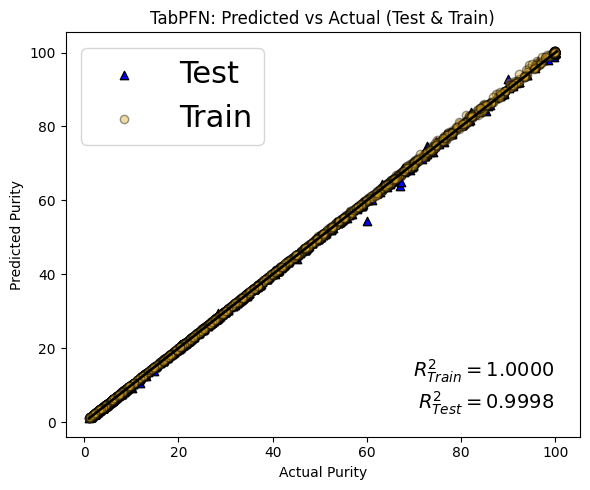

In [ ]:
import numpy as np
import matplotlib.pyplot as plt
from sklearn.metrics import r2_score

# Assuming the evaluate function already works as intended
evaluate(y_train, y_pred_train_tab3, "Train")
evaluate(y_test, y_pred_test_tab3, "Test")

# Calculate R² for Train and Test sets
r2_train = r2_score(y_train, y_pred_train_tab3)
r2_test = r2_score(y_test, y_pred_test_tab3)

# Create the figure
plt.figure(figsize=(6,5))

# Plot Test data (in blue, using triangles for markers)
plt.scatter(y_test, y_pred_test_tab3, alpha=1, edgecolor="k", label=f"Test", color='blue', marker='^')

# Plot Train data (in red)
plt.scatter(y_train, y_pred_train_tab3, alpha=0.4, edgecolor="k", label=f"Train", color='goldenrod')

# Get the min and max for axis scaling
mn = min(np.min(y_test), np.min(y_pred_test_tab3))
mx = max(np.max(y_test), np.max(y_pred_test_tab3))

# Plot the diagonal line (perfect prediction line)
plt.plot([mn, mx], [mn, mx], "k-", linewidth=2)

# Labels and Title
plt.xlabel("Actual Purity")
plt.ylabel("Predicted Purity")
plt.title("TabPFN: Predicted vs Actual (Test & Train)")

# Add grid
plt.grid(False)

# Add legend for train and test, including R² values
plt.legend(loc='best', fontsize=22)

# Add R² values text in the southeast corner
textstr = (
    rf'$R^2_{{Train}} = {r2_train:.4f}$' + '\n' +
    rf'$R^2_{{Test}} = {r2_test:.4f}$'
)
# Position the text at the southeast corner
plt.gca().text(0.95, 0.05, textstr, transform=plt.gca().transAxes, fontsize=14,
               verticalalignment='bottom', horizontalalignment='right', color='black')

# Adjust layout and display
plt.tight_layout()
plt.savefig("CrossPlot_tab_pur.svg", format="svg", dpi=600)
plt.show()

## PSO-XGBoost-Purity

In [ ]:
!pip install pyswarms

In [ ]:
from xgboost import XGBRegressor
from pyswarms.single import GlobalBestPSO
import warnings

warnings.filterwarnings("ignore")
RANDOM_STATE = 42

# ---------------------------
# 1) Load data and prepare
# ---------------------------

y_train = df_label3.values # Purity
X_train = df.values        # features (scaled)

y_test = ts_label3.values
X_test = ts.values

# ---------------------------
# 2) PSO fitness function
# ---------------------------
# We'll tune 6 parameters:
# idx 0 -> learning_rate in [0.001, 0.3]
# idx 1 -> max_depth in [1, 10] (int)
# idx 2 -> n_estimators in [50, 1000] (int)
# idx 3 -> subsample in [0.3, 1.0]
# idx 4 -> colsample_bytree in [0.3, 1.0]
# idx 5 -> gamma in [0.0, 5.0]

# bounds arrays for pyswarms
lower_bounds = np.array([0.001, 1, 50, 0.3, 0.3, 0.0])
upper_bounds = np.array([0.3,   10, 1000, 1.0, 1.0, 5.0])

def _params_from_particle(particle):
    """Map a single particle vector to XGBoost params (with casts)."""
    learning_rate = float(particle[0])
    max_depth = int(np.round(particle[1]))
    max_depth = max(1, max_depth)
    n_estimators = int(np.round(particle[2]))
    n_estimators = max(1, n_estimators)
    subsample = float(particle[3])
    colsample_bytree = float(particle[4])
    gamma = float(particle[5])

    params = {
        "learning_rate": learning_rate,
        "max_depth": max_depth,
        "n_estimators": n_estimators,
        "subsample": subsample,
        "colsample_bytree": colsample_bytree,
        "gamma": gamma,
        "random_state": RANDOM_STATE,
        "verbosity": 0,
        "objective": "reg:squarederror",
        # 'tree_method':'hist' could speed up on large data (optional)
    }
    return params

def fitness_function(particles):
    """
    particles: array shape (n_particles, dims)
    returns: array shape (n_particles,) of CV MSE (we minimize)
    """
    n_particles = particles.shape[0]
    scores = np.zeros(n_particles)
    # We use 3-fold CV on training set and return mean MSE
    for i in range(n_particles):
        p = particles[i]
        params = _params_from_particle(p)
        try:
            model = XGBRegressor(**params)
            # negative MSE returned -> convert to positive MSE
            cv_scores = cross_val_score(model, X_train, y_train, cv=3, scoring="neg_mean_squared_error", n_jobs=1)
            mse = -np.mean(cv_scores)
            # small regularization to prefer simpler models: add tiny penalty for large n_estimators / depth
            penalty = 1e-6 * (params["n_estimators"] * params["max_depth"])
            scores[i] = mse + penalty
        except Exception as e:
            # something went wrong for this particle: give a large penalty
            scores[i] = 1e10
    return scores

# ---------------------------
# 3) Run PSO
# ---------------------------
# PSO settings
options = {"c1": 1.5, "c2": 1.5, "w": 0.7}

# dimension equals number of hyperparams
dimensions = 6
# initialize optimizer
optimizer = GlobalBestPSO(
    n_particles=16,
    dimensions=dimensions,
    options=options,
    bounds=(lower_bounds, upper_bounds),
    # ftol, etc. could be set; keep defaults
)

print("Starting PSO optimization (this may take some minutes depending on data size)...")
# run optimization: choose moderate iterations to balance runtime vs search
cost, pos = optimizer.optimize(fitness_function, iters=30, verbose=True)
print("PSO finished. best cost (CV MSE):", cost)
print("Best raw particle position:", pos)

# ---------------------------
# 4) Train final XGBoost with best params
# ---------------------------
best_params = _params_from_particle(pos)
print("\nBest hyperparameters (rounded/casted):")
for k, v in best_params.items():
    print(f"  {k}: {v}")

final_model = XGBRegressor(**best_params)
final_model.fit(X_train, y_train)

2025-11-01 08:27:55,274 - pyswarms.single.global_best - INFO - Optimize for 30 iters with {'c1': 1.5, 'c2': 1.5, 'w': 0.7}


Starting PSO optimization (this may take some minutes depending on data size)...


pyswarms.single.global_best: 100%|██████████|30/30, best_cost=4.76
2025-11-01 08:34:24,155 - pyswarms.single.global_best - INFO - Optimization finished | best cost: 4.756873921406908, best pos: [4.11505849e-02 5.87129608e+00 9.38484749e+02 6.11792162e-01
 9.72711178e-01 5.32039578e-01]


PSO finished. best cost (CV MSE): 4.756873921406908
Best raw particle position: [4.11505849e-02 5.87129608e+00 9.38484749e+02 6.11792162e-01
 9.72711178e-01 5.32039578e-01]

Best hyperparameters (rounded/casted):
  learning_rate: 0.041150584937100235
  max_depth: 6
  n_estimators: 938
  subsample: 0.6117921624124243
  colsample_bytree: 0.9727111775192585
  gamma: 0.5320395779360891
  random_state: 42
  verbosity: 0
  objective: reg:squarederror


XGBRegressor(base_score=None, booster=None, callbacks=None,
             colsample_bylevel=None, colsample_bynode=None,
             colsample_bytree=0.9727111775192585, device=None,
             early_stopping_rounds=None, enable_categorical=False,
             eval_metric=None, feature_types=None, feature_weights=None,
             gamma=0.5320395779360891, grow_policy=None, importance_type=None,
             interaction_constraints=None, learning_rate=0.041150584937100235,
             max_bin=None, max_cat_threshold=None, max_cat_to_onehot=None,
             max_delta_step=None, max_depth=6, max_leaves=None,
             min_child_weight=None, missing=nan, monotone_constraints=None,
             multi_strategy=None, n_estimators=938, n_jobs=None,
             num_parallel_tree=None, ...)

In [ ]:
y_pred_test_xg3 = final_model.predict(X_test)    # "xg" is the model and "3" is the targer which is "Purity"
y_pred_train_xg3 = final_model.predict(X_train)

# Make sure both arrays are 1D
train_vals = y_pred_train_xg3.flatten()
test_vals = y_pred_test_xg3.flatten()

# Pad shorter array with NaN so they align in Excel
max_len = max(len(train_vals), len(test_vals))
train_vals = np.pad(train_vals, (0, max_len - len(train_vals)), constant_values=np.nan)
test_vals = np.pad(test_vals, (0, max_len - len(test_vals)), constant_values=np.nan)

# Create the DataFrame with exactly two columns
df_pred = pd.DataFrame({
    "y_pred_train_xg3": train_vals,
    "y_pred_test_xg3": test_vals
})

# Save to Excel (single sheet)
df_pred.to_excel("xg3_predictions.xlsx", sheet_name="xg3", index=False)

print("✅ Saved to 'xg3_predictions.xlsx'.")

✅ Saved to 'xg3_predictions.xlsx'.


In [31]:
from xgboost import XGBRegressor
y_train = df_label3.values # Purity
X_train = df.values        # features (scaled)
y_test = ts_label3.values
X_test = ts.values

xgb_model3 = XGBRegressor(base_score=None, booster=None, callbacks=None,
             colsample_bylevel=None, colsample_bynode=None,
             colsample_bytree=0.9727111775192585, device=None,
             early_stopping_rounds=None, enable_categorical=False,
             eval_metric=None, feature_types=None, feature_weights=None,
             gamma=0.5320395779360891, grow_policy=None, importance_type=None,
             interaction_constraints=None, learning_rate=0.041150584937100235,
             max_bin=None, max_cat_threshold=None, max_cat_to_onehot=None,
             max_delta_step=None, max_depth=6, max_leaves=None,
             min_child_weight=None, monotone_constraints=None,
             multi_strategy=None, n_estimators=938, random_state=105)

xgb_model3.fit(X_train, y_train)
y_pred_train_xg3 = xgb_model3.predict(X_train)
y_pred_test_xg3 = xgb_model3.predict(X_test)


--- Train set metrics ---
R²     : 0.9986
Adj-R² : 0.9986
MSE    : 1.140031
RMSE   : 1.067722
NRMSE  : 0.010801
std_er : 1.067722
MAE    : 0.656555
MAPE   : 0.024177
MedAE  : 0.354318
EVS    : 0.998592

--- Test set metrics ---
R²     : 0.9958
Adj-R² : 0.9958
MSE    : 3.437819
RMSE   : 1.854136
NRMSE  : 0.018757
std_er : 1.853695
MAE    : 1.064604
MAPE   : 0.037081
MedAE  : 0.540018
EVS    : 0.995819


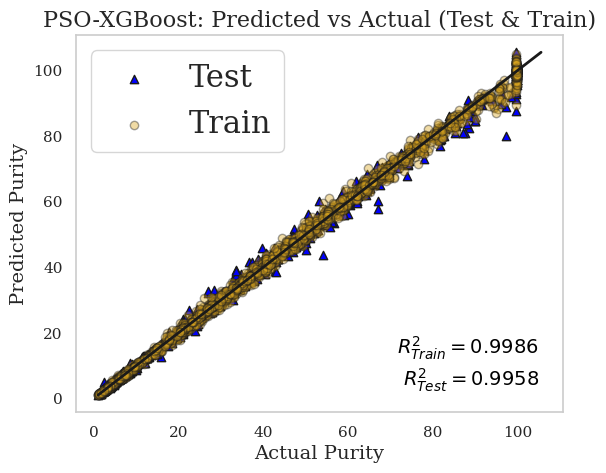

In [33]:
import numpy as np
import matplotlib.pyplot as plt
from sklearn.metrics import r2_score

# Assuming the evaluate function already works as intended
evaluate(y_train, y_pred_train_xg3, "Train")
evaluate(y_test, y_pred_test_xg3, "Test")

# Calculate R² for Train and Test sets
r2_train = r2_score(y_train, y_pred_train_xg3)
r2_test = r2_score(y_test, y_pred_test_xg3)

# Create the figure
plt.figure(figsize=(6,5))

# Plot Test data (in blue, using triangles for markers)
plt.scatter(y_test, y_pred_test_xg3, alpha=1, edgecolor="k", label=f"Test", color='blue', marker='^')

# Plot Train data (in red)
plt.scatter(y_train, y_pred_train_xg3, alpha=0.4, edgecolor="k", label=f"Train", color='goldenrod')

# Get the min and max for axis scaling
mn = min(np.min(y_test), np.min(y_pred_test_xg3))
mx = max(np.max(y_test), np.max(y_pred_test_xg3))

# Plot the diagonal line (perfect prediction line)
plt.plot([mn, mx], [mn, mx], "k-", linewidth=2)

# Labels and Title
plt.xlabel("Actual Purity")
plt.ylabel("Predicted Purity")
plt.title("PSO-XGBoost: Predicted vs Actual (Test & Train)")

# Add grid
plt.grid(False)

# Add legend for train and test, including R² values
plt.legend(loc='best', fontsize=22)

# Add R² values text in the southeast corner
textstr = (
    rf'$R^2_{{Train}} = {r2_train:.4f}$' + '\n' +
    rf'$R^2_{{Test}} = {r2_test:.4f}$'
)
# Position the text at the southeast corner
plt.gca().text(0.95, 0.05, textstr, transform=plt.gca().transAxes, fontsize=14,
               verticalalignment='bottom', horizontalalignment='right', color='black')

# Adjust layout and display
plt.tight_layout()
plt.savefig("CrossPlot_xg_pur.svg", format="svg", dpi=600)
plt.show()

## GBR-Purity

In [67]:
y_train = df_label3.copy()
y_test = ts_label3.copy()
X_train = df.copy()
X_test = ts.copy()

In [ ]:
"""
PSO-tuned Gradient Boosting Regression (GBR)
- Uses pyswarms GlobalBestPSO to minimize CV MSE
- Tunes: learning_rate, max_depth, n_estimators, subsample,
         min_samples_split, min_samples_leaf, max_features
"""
from sklearn.ensemble import GradientBoostingRegressor
from pyswarms.single import GlobalBestPSO
from sklearn.model_selection import cross_val_score
import numpy as np
import warnings

warnings.filterwarnings("ignore")
RANDOM_STATE = 42

# ---------------------------
# 1) Your prepared data
# ---------------------------
# Assumes these already exist exactly like in your code:
# X_train, y_train, X_test, y_test

# ---------------------------
# 2) PSO fitness function
# ---------------------------
# We'll tune 7 parameters:
# idx 0 -> learning_rate      in [0.005, 0.30]        (float)
# idx 1 -> max_depth          in [1, 8]               (int)
# idx 2 -> n_estimators       in [50, 1000]           (int)
# idx 3 -> subsample          in [0.50, 1.00]         (float)
# idx 4 -> min_samples_split  in [2, 20]              (int)
# idx 5 -> min_samples_leaf   in [1, 10]              (int)
# idx 6 -> max_features_code  in [0.20, 1.00]         (float) -> maps to None if >=0.99, else fraction

# bounds arrays for pyswarms
lower_bounds = np.array([0.005, 1,   50, 0.50,  2,  1, 0.20])
upper_bounds = np.array([0.300, 8, 1000, 1.00, 20, 10, 1.00])

def _params_from_particle(particle):
    """Map a single particle vector to GBR params (with casts and clipping)."""
    learning_rate = float(np.clip(particle[0], lower_bounds[0], upper_bounds[0]))
    max_depth = int(np.round(np.clip(particle[1], lower_bounds[1], upper_bounds[1])))
    n_estimators = int(np.round(np.clip(particle[2], lower_bounds[2], upper_bounds[2])))
    subsample = float(np.clip(particle[3], lower_bounds[3], upper_bounds[3]))
    min_samples_split = int(np.round(np.clip(particle[4], lower_bounds[4], upper_bounds[4])))
    min_samples_leaf  = int(np.round(np.clip(particle[5], lower_bounds[5], upper_bounds[5])))

    # max_features mapping: treat near-1.0 as None (i.e., use all features)
    max_features_code = float(np.clip(particle[6], lower_bounds[6], upper_bounds[6]))
    max_features = None if max_features_code >= 0.99 else float(max_features_code)

    params = {
        "learning_rate": learning_rate,
        "max_depth": max_depth,
        "n_estimators": n_estimators,
        "subsample": subsample,
        "min_samples_split": min_samples_split,
        "min_samples_leaf": min_samples_leaf,
        "max_features": max_features,
        "random_state": RANDOM_STATE,
    }
    return params

def fitness_function(particles):
    """
    particles: array shape (n_particles, dims)
    returns: array shape (n_particles,) of CV MSE (we minimize)
    """
    n_particles = particles.shape[0]
    scores = np.zeros(n_particles)

    for i in range(n_particles):
        p = particles[i]
        params = _params_from_particle(p)
        try:
            model = GradientBoostingRegressor(**params)
            # negative MSE returned -> convert to positive MSE
            cv_scores = cross_val_score(
                model, X_train, y_train,
                cv=3, scoring="neg_mean_squared_error", n_jobs=1
            )
            mse = -np.mean(cv_scores)

            # tiny regularization to discourage overly large trees / ensembles
            penalty = 1e-6 * (params["n_estimators"] * params["max_depth"])
            scores[i] = mse + penalty
        except Exception:
            # any failure gets a large penalty
            scores[i] = 1e10

    return scores

# ---------------------------
# 3) Run PSO
# ---------------------------
options = {"c1": 1.5, "c2": 1.5, "w": 0.7}
dimensions = 7

optimizer = GlobalBestPSO(
    n_particles=16,
    dimensions=dimensions,
    options=options,
    bounds=(lower_bounds, upper_bounds),

)

print("Starting PSO optimization for GBR (minimize 3-fold CV MSE)...")
cost, pos = optimizer.optimize(fitness_function, iters=30, verbose=True)
print("PSO finished. best cost (CV MSE):", cost)
print("Best raw particle position:", pos)

# ---------------------------
# 4) Train final GBR with best params
# ---------------------------
best_params = _params_from_particle(pos)
print("\nBest hyperparameters (rounded/casted):")
for k, v in best_params.items():
    print(f"  {k}: {v}")

final_model = GradientBoostingRegressor(**best_params)
final_model.fit(X_train, y_train)

2025-11-02 19:04:44,455 - pyswarms.single.global_best - INFO - Optimize for 30 iters with {'c1': 1.5, 'c2': 1.5, 'w': 0.7}


Starting PSO optimization for GBR (minimize 3-fold CV MSE)...


pyswarms.single.global_best: 100%|██████████|30/30, best_cost=4.1
2025-11-02 19:47:42,344 - pyswarms.single.global_best - INFO - Optimization finished | best cost: 4.102430613773925, best pos: [2.88323995e-02 7.78224851e+00 9.18651535e+02 5.39635922e-01
 1.05964158e+01 6.65554425e+00 9.30676199e-01]


PSO finished. best cost (CV MSE): 4.102430613773925
Best raw particle position: [2.88323995e-02 7.78224851e+00 9.18651535e+02 5.39635922e-01
 1.05964158e+01 6.65554425e+00 9.30676199e-01]

Best hyperparameters (rounded/casted):
  learning_rate: 0.028832399541631026
  max_depth: 8
  n_estimators: 919
  subsample: 0.5396359220219887
  min_samples_split: 11
  min_samples_leaf: 7
  max_features: 0.9306761987596761
  random_state: 42


GradientBoostingRegressor(learning_rate=0.028832399541631026, max_depth=8,
                          max_features=0.9306761987596761, min_samples_leaf=7,
                          min_samples_split=11, n_estimators=919,
                          random_state=42, subsample=0.5396359220219887)

In [ ]:
y_pred_test_gbr3 = final_model.predict(X_test)
y_pred_train_gbr3 = final_model.predict(X_train)

# Make sure both arrays are 1D
train_vals = y_pred_train_gbr3.flatten()
test_vals = y_pred_test_gbr3.flatten()

# Pad shorter array with NaN so they align in Excel
max_len = max(len(train_vals), len(test_vals))
train_vals = np.pad(train_vals, (0, max_len - len(train_vals)), constant_values=np.nan)
test_vals = np.pad(test_vals, (0, max_len - len(test_vals)), constant_values=np.nan)

# Create the DataFrame with exactly two columns
df_pred = pd.DataFrame({
    "y_pred_train_gbr3": train_vals,
    "y_pred_test_gbr3": test_vals
})

# Save to Excel (single sheet)
df_pred.to_excel("gbr3_predictions.xlsx", sheet_name="gbr3", index=False)

print("✅ Saved to 'gbr3_predictions.xlsx'.")

✅ Saved to 'gbr3_predictions.xlsx'.


In [68]:
# Purity
from sklearn.ensemble import GradientBoostingRegressor
gbr_model3 = GradientBoostingRegressor(learning_rate=0.028832399541631026, max_depth=8,
                          max_features=0.9306761987596761, min_samples_leaf=7,
                          min_samples_split=11, n_estimators=919,
                          random_state=42, subsample=0.5396359220219887)

gbr_model3.fit(X_train, y_train)
y_pred_train_gbr3 = gbr_model3.predict(X_train)
y_pred_test_gbr3 = gbr_model3.predict(X_test)


--- Train set metrics ---
R²     : 0.9999
Adj-R² : 0.9999
MSE    : 0.094561
RMSE   : 0.307508
NRMSE  : 0.003111
std_er : 0.307507
MAE    : 0.184145
MAPE   : 0.007368
MedAE  : 0.102173
EVS    : 0.999883

--- Test set metrics ---
R²     : 0.9978
Adj-R² : 0.9978
MSE    : 1.767926
RMSE   : 1.329634
NRMSE  : 0.013451
std_er : 1.328301
MAE    : 0.677833
MAPE   : 0.021933
MedAE  : 0.249263
EVS    : 0.997853


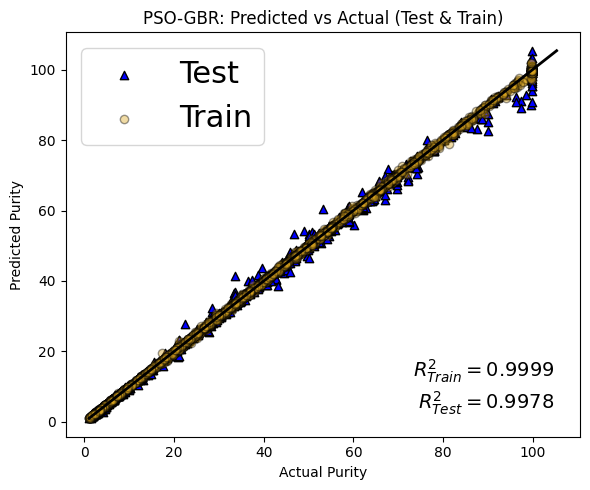

In [ ]:
import numpy as np
import matplotlib.pyplot as plt
from sklearn.metrics import r2_score

# Assuming the evaluate function already works as intended
evaluate(y_train, y_pred_train_gbr3, "Train")
evaluate(y_test, y_pred_test_gbr3, "Test")

# Calculate R² for Train and Test sets
r2_train = r2_score(y_train, y_pred_train_gbr3)
r2_test = r2_score(y_test, y_pred_test_gbr3)

# Create the figure
plt.figure(figsize=(6,5))

# Plot Test data (in blue, using triangles for markers)
plt.scatter(y_test, y_pred_test_gbr3, alpha=1, edgecolor="k", label=f"Test", color='blue', marker='^')

# Plot Train data (in red)
plt.scatter(y_train, y_pred_train_gbr3, alpha=0.4, edgecolor="k", label=f"Train", color='goldenrod')

# Get the min and max for axis scaling
mn = min(np.min(y_test), np.min(y_pred_test_gbr3))
mx = max(np.max(y_test), np.max(y_pred_test_gbr3))

# Plot the diagonal line (perfect prediction line)
plt.plot([mn, mx], [mn, mx], "k-", linewidth=2)

# Labels and Title
plt.xlabel("Actual Purity")
plt.ylabel("Predicted Purity")
plt.title("PSO-GBR: Predicted vs Actual (Test & Train)")

# Add grid
plt.grid(False)

# Add legend for train and test, including R² values
plt.legend(loc='best', fontsize=22)

# Add R² values text in the southeast corner
textstr = (
    rf'$R^2_{{Train}} = {r2_train:.4f}$' + '\n' +
    rf'$R^2_{{Test}} = {r2_test:.4f}$'
)
# Position the text at the southeast corner
plt.gca().text(0.95, 0.05, textstr, transform=plt.gca().transAxes, fontsize=14,
               verticalalignment='bottom', horizontalalignment='right', color='black')

# Adjust layout and display
plt.tight_layout()
plt.savefig("CrossPlot_gbr_pur.svg", format="svg", dpi=600)
plt.show()

## PSO-CatBoost-Purity

In [ ]:
!pip install catboost

   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 97.1/97.1 MB 8.1 MB/s eta 0:00:00


In [ ]:
"""
PSO-tuned CatBoost Regression
- Uses pyswarms GlobalBestPSO to minimize CV MSE
- Tunes: learning_rate, depth, iterations, subsample, rsm, l2_leaf_reg
"""
import numpy as np
from catboost import CatBoostRegressor
from sklearn.model_selection import cross_val_score
from pyswarms.single import GlobalBestPSO
import warnings

warnings.filterwarnings("ignore")
RANDOM_STATE = 42

# ---------------------------
# 1) Data (same as your XGB block)
# ---------------------------
y_train = df_label3.copy().values  # Recovery
X_train = df.copy().values         # features (scaled)

y_test  = ts_label3.copy().values
X_test  = ts.copy().values

# ---------------------------
# 2) PSO fitness function
# ---------------------------
# dims:
# 0 -> learning_rate      [0.001, 0.3]
# 1 -> depth              [1, 10] (int)
# 2 -> iterations         [50, 1000] (int)
# 3 -> subsample          [0.3, 1.0]
# 4 -> rsm                [0.3, 1.0]  (feature subsampling)
# 5 -> l2_leaf_reg        [0.0, 10.0]

lower_bounds = np.array([0.001, 1,   50, 0.3, 0.3, 0.0])
upper_bounds = np.array([0.300, 10, 1000, 1.0, 1.0,10.0])

def _params_from_particle(p):
    """Map a particle to CatBoost params (cast + clip)."""
    learning_rate = float(np.clip(p[0], lower_bounds[0], upper_bounds[0]))
    depth         = int(np.round(np.clip(p[1], lower_bounds[1], upper_bounds[1])))
    iterations    = int(np.round(np.clip(p[2], lower_bounds[2], upper_bounds[2])))
    subsample     = float(np.clip(p[3], lower_bounds[3], upper_bounds[3]))
    rsm           = float(np.clip(p[4], lower_bounds[4], upper_bounds[4]))
    l2_leaf_reg   = float(np.clip(p[5], lower_bounds[5], upper_bounds[5]))

    params = {
        "learning_rate": learning_rate,
        "depth": depth,
        "iterations": iterations,
        "subsample": subsample,
        "rsm": rsm,
        "l2_leaf_reg": l2_leaf_reg,
        "loss_function": "RMSE",
        "random_seed": RANDOM_STATE,
        "verbose": False,
        "allow_writing_files": False,
        "bootstrap_type": "Bernoulli",   # enables 'subsample'
        "task_type": "GPU"
    }
    return params

def fitness_function(particles):
    """
    particles: (n_particles, dims)
    returns:   (n_particles,) mean CV MSE (to minimize)
    """
    n_particles = particles.shape[0]
    scores = np.zeros(n_particles)

    for i in range(n_particles):
        p = particles[i]
        params = _params_from_particle(p)
        try:
            model = CatBoostRegressor(**params)
            # cross_val_score returns neg MSE -> take positive MSE
            cv_scores = cross_val_score(
                model, X_train, y_train,
                cv=3, scoring="neg_mean_squared_error", n_jobs=1
            )
            mse = -np.mean(cv_scores)
            # tiny complexity penalty (iterations * depth)
            penalty = 1e-6 * (params["iterations"] * params["depth"])
            scores[i] = mse + penalty
        except Exception:
            scores[i] = 1e10
    return scores

# ---------------------------
# 3) Run PSO
# ---------------------------
options = {"c1": 1.5, "c2": 1.5, "w": 0.7}
dimensions = 6

optimizer = GlobalBestPSO(
    n_particles=16,
    dimensions=dimensions,
    options=options,
    bounds=(lower_bounds, upper_bounds),
)

print("Starting PSO optimization for CatBoost (minimize 3-fold CV MSE)...")
cost, pos = optimizer.optimize(fitness_function, iters=30, verbose=True)
print("PSO finished. best cost (CV MSE):", cost)
print("Best raw particle position:", pos)

# ---------------------------
# 4) Train final CatBoost with best params
# ---------------------------
best_params = _params_from_particle(pos)
print("\nBest hyperparameters (rounded/casted):")
for k, v in best_params.items():
    print(f"  {k}: {v}")

final_model = CatBoostRegressor(**best_params)
# Force CPU right before training to avoid pairwise error
final_model.set_params(task_type="CPU")   # <--- add this line
final_model.fit(X_train, y_train, verbose=False)

2025-11-05 19:22:23,958 - pyswarms.single.global_best - INFO - Optimize for 30 iters with {'c1': 1.5, 'c2': 1.5, 'w': 0.7}


Starting PSO optimization for CatBoost (minimize 3-fold CV MSE)...


pyswarms.single.global_best: 100%|██████████|30/30, best_cost=1e+10
2025-11-05 19:22:40,956 - pyswarms.single.global_best - INFO - Optimization finished | best cost: 10000000000.0, best pos: [ 0.13410536  7.67227678 54.38990724  0.58957882  0.97105623  0.37658463]


PSO finished. best cost (CV MSE): 10000000000.0
Best raw particle position: [ 0.13410536  7.67227678 54.38990724  0.58957882  0.97105623  0.37658463]

Best hyperparameters (rounded/casted):
  learning_rate: 0.13410536212915647
  depth: 8
  iterations: 54
  subsample: 0.5895788236923274
  rsm: 0.9710562268314031
  l2_leaf_reg: 0.376584630037079
  loss_function: RMSE
  random_seed: 42
  verbose: False
  allow_writing_files: False
  bootstrap_type: Bernoulli
  task_type: GPU


In [ ]:
print("CatBoostRegressor(", end="")
for i, (k, v) in enumerate(final_model.get_params().items()):
    comma = "," if i < len(final_model.get_params()) - 1 else ""
    print(f"{k}={repr(v)}{comma}")
print(")")

CatBoostRegressor(iterations=54,
learning_rate=0.13410536212915647,
depth=8,
l2_leaf_reg=0.376584630037079,
rsm=0.9710562268314031,
loss_function='RMSE',
random_seed=42,
verbose=False,
allow_writing_files=False,
task_type='CPU',
bootstrap_type='Bernoulli',
subsample=0.5895788236923274
)


In [ ]:
y_pred_test_cb3 = final_model.predict(X_test)
y_pred_train_cb3 = final_model.predict(X_train)

# Make sure both arrays are 1D
train_vals = y_pred_train_cb3.flatten()
test_vals = y_pred_test_cb3.flatten()

# Pad shorter array with NaN so they align in Excel
max_len = max(len(train_vals), len(test_vals))
train_vals = np.pad(train_vals, (0, max_len - len(train_vals)), constant_values=np.nan)
test_vals = np.pad(test_vals, (0, max_len - len(test_vals)), constant_values=np.nan)

# Create the DataFrame with exactly two columns
df_pred = pd.DataFrame({
    "y_pred_train_cb3": train_vals,
    "y_pred_test_cb3": test_vals
})

# Save to Excel (single sheet)
df_pred.to_excel("cb3_predictions.xlsx", sheet_name="cb3", index=False)

print("✅ Saved to 'cb3_predictions.xlsx'.")

✅ Saved to 'cb3_predictions.xlsx'.


In [ ]:
# Purity
from catboost import CatBoostRegressor
cb_model3 = CatBoostRegressor(iterations=54, learning_rate=0.13410536212915647, depth=8,
                              l2_leaf_reg=0.376584630037079, rsm=0.9710562268314031,
                              loss_function='RMSE', random_seed=42, verbose=False,
                              allow_writing_files=False, task_type='CPU',
                              bootstrap_type='Bernoulli', subsample=0.5895788236923274)

cb_model3.fit(X_train, y_train)
y_pred_train_cb3 = cb_model3.predict(X_train)
y_pred_test_cb3 = cb_model3.predict(X_test)


--- Train set metrics ---
R²     : 0.9899
Adj-R² : 0.9898
MSE    : 8.202473
RMSE   : 2.863996
NRMSE  : 0.028972
std_er : 2.863996
MAE    : 1.948993
MAPE   : 0.071339
MedAE  : 1.237598
EVS    : 0.989870

--- Test set metrics ---
R²     : 0.9882
Adj-R² : 0.9881
MSE    : 9.707172
RMSE   : 3.115633
NRMSE  : 0.031518
std_er : 3.115600
MAE    : 2.153055
MAPE   : 0.085934
MedAE  : 1.430613
EVS    : 0.988190


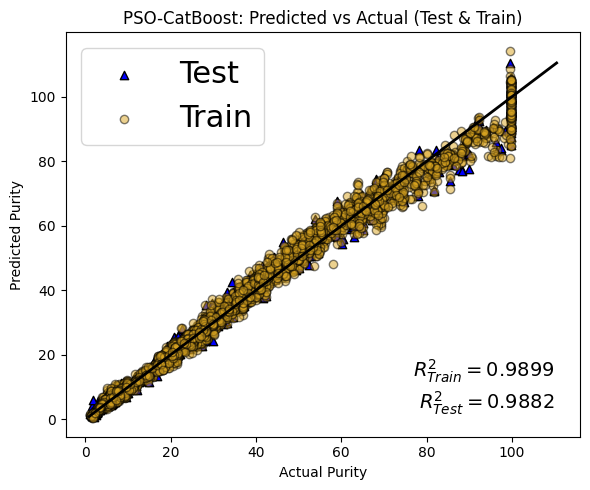

In [ ]:
import numpy as np
import matplotlib.pyplot as plt
from sklearn.metrics import r2_score

# Assuming the evaluate function already works as intended
evaluate(y_train, y_pred_train_cb3, "Train")
evaluate(y_test, y_pred_test_cb3, "Test")

# Calculate R² for Train and Test sets
r2_train = r2_score(y_train, y_pred_train_cb3)
r2_test = r2_score(y_test, y_pred_test_cb3)

# Create the figure
plt.figure(figsize=(6,5))

# Plot Test data (in blue, using triangles for markers)
plt.scatter(y_test, y_pred_test_cb3, alpha=1, edgecolor="k", label=f"Test", color='blue', marker='^')

# Plot Train data (in red)
plt.scatter(y_train, y_pred_train_cb3, alpha=0.5, edgecolor="k", label=f"Train", color='goldenrod')

# Get the min and max for axis scaling
mn = min(np.min(y_test), np.min(y_pred_test_cb3))
mx = max(np.max(y_test), np.max(y_pred_test_cb3))

# Plot the diagonal line (perfect prediction line)
plt.plot([mn, mx], [mn, mx], "k-", linewidth=2)

# Labels and Title
plt.xlabel("Actual Purity")
plt.ylabel("Predicted Purity")
plt.title("PSO-CatBoost: Predicted vs Actual (Test & Train)")

# Add grid
plt.grid(False)

# Add legend for train and test, including R² values
plt.legend(loc='best', fontsize=22)

# Add R² values text in the southeast corner
textstr = (
    rf'$R^2_{{Train}} = {r2_train:.4f}$' + '\n' +
    rf'$R^2_{{Test}} = {r2_test:.4f}$'
)
# Position the text at the southeast corner
plt.gca().text(0.95, 0.05, textstr, transform=plt.gca().transAxes, fontsize=14,
               verticalalignment='bottom', horizontalalignment='right', color='black')

# Adjust layout and display
plt.tight_layout()
plt.savefig("CrossPlot_cb_pur.svg", format="svg", dpi=600)
plt.show()

## PSO-AdaBoost-Purity

In [ ]:
!pip install pyswarms

In [ ]:
"""
PSO-tuned AdaBoost Regression
- Uses pyswarms GlobalBestPSO to minimize CV MSE
- Tunes: learning_rate, n_estimators, max_depth (of base tree),
         min_samples_leaf (of base tree), loss
"""
import numpy as np
from sklearn.ensemble import AdaBoostRegressor
from sklearn.tree import DecisionTreeRegressor
from sklearn.model_selection import cross_val_score
from pyswarms.single import GlobalBestPSO
import warnings

warnings.filterwarnings("ignore")
RANDOM_STATE = 42

# ---------------------------
# 1) Data (same pattern as yours)
# ---------------------------
y_train = df_label3.copy().values  # e.g., Recovery
X_train = df.copy().values
y_test  = ts_label3.copy().values
X_test  = ts.copy().values

# ---------------------------
# 2) PSO fitness function
# ---------------------------
# dims:
# 0 -> learning_rate       [0.005, 1.0]
# 1 -> n_estimators        [50, 1000] (int)
# 2 -> max_depth           [1, 10]    (int) for base DecisionTree
# 3 -> min_samples_leaf    [1, 20]    (int) for base DecisionTree
# 4 -> loss_code           [0, 2]     (int) -> 0:'linear', 1:'square', 2:'exponential'

lower_bounds = np.array([0.005,   50,  1,  1, 0])
upper_bounds = np.array([1.000, 1000, 10, 20, 2])

_LOSSES = ['linear', 'square', 'exponential']

def _params_from_particle(p):
    """Map a particle to AdaBoost params (cast + clip)."""
    learning_rate    = float(np.clip(p[0], lower_bounds[0], upper_bounds[0]))
    n_estimators     = int(np.round(np.clip(p[1], lower_bounds[1], upper_bounds[1])))
    max_depth        = int(np.round(np.clip(p[2], lower_bounds[2], upper_bounds[2])))
    min_samples_leaf = int(np.round(np.clip(p[3], lower_bounds[3], upper_bounds[3])))
    loss_code        = int(np.round(np.clip(p[4], lower_bounds[4], upper_bounds[4])))
    loss             = _LOSSES[loss_code]

    # Base learner
    base_tree = DecisionTreeRegressor(
        max_depth=max_depth,
        min_samples_leaf=min_samples_leaf,
        random_state=RANDOM_STATE
    )

    params = {
        "estimator": base_tree,          # sklearn >= 1.2
        "n_estimators": n_estimators,
        "learning_rate": learning_rate,
        "loss": loss,
        "random_state": RANDOM_STATE
    }
    return params, dict(
        learning_rate=learning_rate, n_estimators=n_estimators,
        max_depth=max_depth, min_samples_leaf=min_samples_leaf, loss=loss
    )

def fitness_function(particles):
    """
    particles: (n_particles, dims)
    returns:   (n_particles,) mean CV MSE (to minimize)
    """
    n_particles = particles.shape[0]
    scores = np.zeros(n_particles)

    for i in range(n_particles):
        p = particles[i]
        params, flat = _params_from_particle(p)
        try:
            model = AdaBoostRegressor(**params)
            # cross_val_score returns neg MSE -> convert to +MSE
            cv_scores = cross_val_score(
                model, X_train, y_train.ravel(),
                cv=3, scoring="neg_mean_squared_error", n_jobs=1
            )
            mse = -np.mean(cv_scores)
            # tiny complexity penalty to prefer simpler ensembles
            penalty = 1e-6 * (flat["n_estimators"] * flat["max_depth"])
            scores[i] = mse + penalty
        except Exception:
            scores[i] = 1e10
    return scores

# ---------------------------
# 3) Run PSO
# ---------------------------
options = {"c1": 1.5, "c2": 1.5, "w": 0.7}
dimensions = 5

optimizer = GlobalBestPSO(
    n_particles=16,
    dimensions=dimensions,
    options=options,
    bounds=(lower_bounds, upper_bounds),
)

print("Starting PSO optimization for AdaBoost (minimize 3-fold CV MSE)...")
cost, pos = optimizer.optimize(fitness_function, iters=20, verbose=True)
print("PSO finished. best cost (CV MSE):", cost)
print("Best raw particle position:", pos)

# ---------------------------
# 4) Train final AdaBoost with best params
# ---------------------------
best_params, best_flat = _params_from_particle(pos)
print("\nBest hyperparameters (rounded/casted):")
for k, v in best_flat.items():
    print(f"  {k}: {v}")

final_model = AdaBoostRegressor(**best_params)
final_model.fit(X_train, y_train.ravel())

2025-11-05 23:59:00,270 - pyswarms.single.global_best - INFO - Optimize for 20 iters with {'c1': 1.5, 'c2': 1.5, 'w': 0.7}


Starting PSO optimization for AdaBoost (minimize 3-fold CV MSE)...


pyswarms.single.global_best: 100%|██████████|20/20, best_cost=10.3
2025-11-06 00:39:04,603 - pyswarms.single.global_best - INFO - Optimization finished | best cost: 10.289559867925817, best pos: [3.59774372e-02 8.74245060e+02 9.90446176e+00 9.91485119e+00
 1.34004537e+00]


PSO finished. best cost (CV MSE): 10.289559867925817
Best raw particle position: [3.59774372e-02 8.74245060e+02 9.90446176e+00 9.91485119e+00
 1.34004537e+00]

Best hyperparameters (rounded/casted):
  learning_rate: 0.03597743718960905
  n_estimators: 874
  max_depth: 10
  min_samples_leaf: 10
  loss: square


,estimator,DecisionTreeR...ndom_state=42)
,n_estimators,874
,learning_rate,0.03597743718960905
,loss,'square'
,random_state,42
,criterion,'squared_error'
,splitter,'best'
,max_depth,10
,min_samples_split,2
,min_samples_leaf,10
,min_weight_fraction_leaf,0.0


In [ ]:
print("AdaBoostRegressor(", end="")
for i, (k, v) in enumerate(final_model.get_params().items()):
    comma = "," if i < len(final_model.get_params()) - 1 else ""
    print(f"{k}={repr(v)}{comma}")
print(")")

AdaBoostRegressor(estimator__ccp_alpha=0.0,
estimator__criterion='squared_error',
estimator__max_depth=10,
estimator__max_features=None,
estimator__max_leaf_nodes=None,
estimator__min_impurity_decrease=0.0,
estimator__min_samples_leaf=10,
estimator__min_samples_split=2,
estimator__min_weight_fraction_leaf=0.0,
estimator__monotonic_cst=None,
estimator__random_state=42,
estimator__splitter='best',
estimator=DecisionTreeRegressor(max_depth=10, min_samples_leaf=10, random_state=42),
learning_rate=0.03597743718960905,
loss='square',
n_estimators=874,
random_state=42
)


In [ ]:
y_pred_test_adb3 = final_model.predict(X_test)
y_pred_train_adb3 = final_model.predict(X_train)

# Make sure both arrays are 1D
train_vals = y_pred_train_adb3.flatten()
test_vals = y_pred_test_adb3.flatten()

# Pad shorter array with NaN so they align in Excel
max_len = max(len(train_vals), len(test_vals))
train_vals = np.pad(train_vals, (0, max_len - len(train_vals)), constant_values=np.nan)
test_vals = np.pad(test_vals, (0, max_len - len(test_vals)), constant_values=np.nan)

# Create the DataFrame with exactly two columns
df_pred = pd.DataFrame({
    "y_pred_train_adb3": train_vals,
    "y_pred_test_adb3": test_vals
})

# Save to Excel (single sheet)
df_pred.to_excel("adb3_predictions.xlsx", sheet_name="adb3", index=False)

print("✅ Saved to 'adb3_predictions.xlsx'.")

✅ Saved to 'adb3_predictions.xlsx'.


In [ ]:
# Purity
from sklearn.ensemble import AdaBoostRegressor
from sklearn.tree import DecisionTreeRegressor
import matplotlib.pyplot as plt

# Define base estimator
base_tree = DecisionTreeRegressor(
    criterion='squared_error',
    max_depth=10,
    min_samples_leaf=10,
    random_state=42
)

# Define AdaBoost model
adb_model3 = AdaBoostRegressor(
    estimator=base_tree,
    learning_rate=0.03597743718960905,
    loss='square',
    n_estimators=874,
    random_state=42
)

# Fit model
adb_model3.fit(X_train, y_train)
y_pred_train_adb3 = adb_model3.predict(X_train)
y_pred_test_adb3 = adb_model3.predict(X_test)


--- Train set metrics ---
R²     : 0.9967
Adj-R² : 0.9967
MSE    : 2.637062
RMSE   : 1.623903
NRMSE  : 0.016427
std_er : 1.623149
MAE    : 1.164918
MAPE   : 0.049056
MedAE  : 0.775728
EVS    : 0.996746

--- Test set metrics ---
R²     : 0.9948
Adj-R² : 0.9947
MSE    : 4.300264
RMSE   : 2.073708
NRMSE  : 0.020978
std_er : 2.073472
MAE    : 1.411877
MAPE   : 0.058629
MedAE  : 0.909961
EVS    : 0.994769


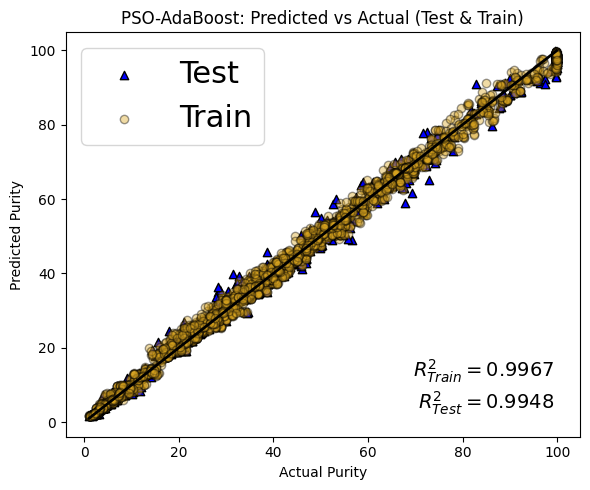

In [ ]:
import numpy as np
import matplotlib.pyplot as plt
from sklearn.metrics import r2_score

# Assuming the evaluate function already works as intended
evaluate(y_train, y_pred_train_adb3, "Train")
evaluate(y_test, y_pred_test_adb3, "Test")

# Calculate R² for Train and Test sets
r2_train = r2_score(y_train, y_pred_train_adb3)
r2_test = r2_score(y_test, y_pred_test_adb3)

# Create the figure
plt.figure(figsize=(6,5))

# Plot Test data (in blue, using triangles for markers)
plt.scatter(y_test, y_pred_test_adb3, alpha=1, edgecolor="k", label=f"Test", color='blue', marker='^')

# Plot Train data (in red)
plt.scatter(y_train, y_pred_train_adb3, alpha=0.4, edgecolor="k", label=f"Train", color='goldenrod')

# Get the min and max for axis scaling
mn = min(np.min(y_test), np.min(y_pred_test_adb3))
mx = max(np.max(y_test), np.max(y_pred_test_adb3))

# Plot the diagonal line (perfect prediction line)
plt.plot([mn, mx], [mn, mx], "k-", linewidth=2)

# Labels and Title
plt.xlabel("Actual Purity")
plt.ylabel("Predicted Purity")
plt.title("PSO-AdaBoost: Predicted vs Actual (Test & Train)")

# Add grid
plt.grid(False)

# Add legend for train and test, including R² values
plt.legend(loc='best', fontsize=22)

# Add R² values text in the southeast corner
textstr = (
    rf'$R^2_{{Train}} = {r2_train:.4f}$' + '\n' +
    rf'$R^2_{{Test}} = {r2_test:.4f}$'
)
# Position the text at the southeast corner
plt.gca().text(0.95, 0.05, textstr, transform=plt.gca().transAxes, fontsize=14,
               verticalalignment='bottom', horizontalalignment='right', color='black')

# Adjust layout and display
plt.tight_layout()
plt.savefig("CrossPlot_adb_pur.svg", format="svg", dpi=600)
plt.show()

# **All Predictions based on "Total Set"**

In [ ]:
x_train = df.copy()
x_test = ts.copy()
# Recovery
y_train1 = df_label1.copy()
y_test1 = ts_label1.copy()
# SEC
y_train2 = df_label2.copy()
y_test2 = ts_label2.copy()
# Purity
y_train3 = df_label3.copy()
y_test3 = ts_label3.copy()
# Total Set
x_total = pd.concat([x_train, x_test], axis=0)
y_total1 = pd.concat([y_train1, y_test1], axis=0)
y_total2 = pd.concat([y_train2, y_test2], axis=0)
y_total3 = pd.concat([y_train3, y_test3], axis=0)

## ANN

139/139 ━━━━━━━━━━━━━━━━━━━━ 1s 3ms/step

--- Total set metrics ---
R²     : 0.9991
Adj-R² : 0.9991
MSE    : 0.846837
RMSE   : 0.920238
NRMSE  : 0.009408
std_er : 0.880391
MAE    : 0.638019
MAPE   : 0.014853
MedAE  : 0.445438
EVS    : 0.999143


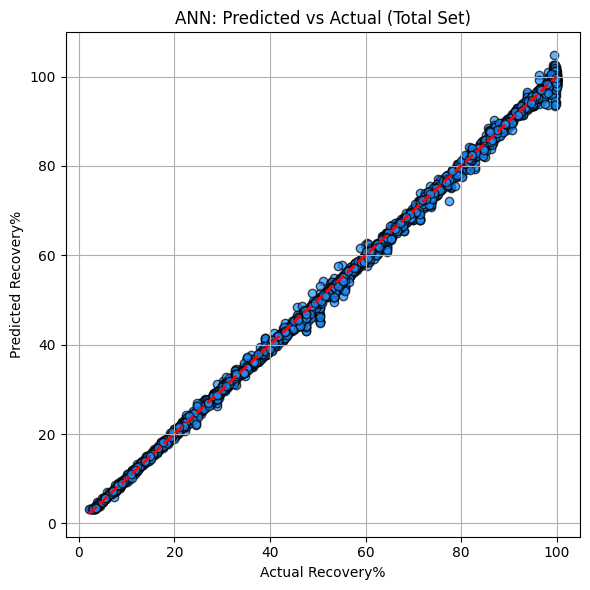

In [ ]:
# Recovery
from tensorflow import keras
from tensorflow.keras import layers

n_features = x_total.shape[1]
# Best model
ann_model1 = keras.Sequential([
    layers.Input(shape=(n_features,)),
    layers.Dense(32, activation='relu'),
    layers.Dense(72, activation='relu'),
    layers.Dense(32, activation='relu'),
    layers.Dense(1)                       # single output
])

# Compile
ann_model1.compile(optimizer=keras.optimizers.Adam(learning_rate=0.01),
                   loss='mean_absolute_error')
# fit/predict/evaluate
ann_model1.fit(x_total, y_total1, epochs=100, batch_size=32, verbose=0)
y_pred_total_ann1 = ann_model1.predict(x_total).flatten()
evaluate(y_total1, y_pred_total_ann1, "Total")

# Visualization
plt.figure(figsize=(6,6))
plt.scatter(y_total1, y_pred_total_ann1, color='dodgerblue', alpha=0.7, edgecolor='k')
plt.plot([y_total1.min(), y_total1.max()], [y_total1.min(), y_total1.max()], 'r--', lw=2)
plt.title("ANN: Predicted vs Actual (Total Set)")
plt.xlabel("Actual Recovery%")
plt.ylabel("Predicted Recovery%")
plt.grid(True)
plt.tight_layout()
plt.show()

139/139 ━━━━━━━━━━━━━━━━━━━━ 1s 2ms/step

--- Total set metrics ---
R²     : 0.9963
Adj-R² : 0.9963
MSE    : 32121940.697422
RMSE   : 5667.622138
NRMSE  : 0.008125
std_er : 5249.730513
MAE    : 2651.485575
MAPE   : 0.037449
MedAE  : 1176.291677
EVS    : 0.996800


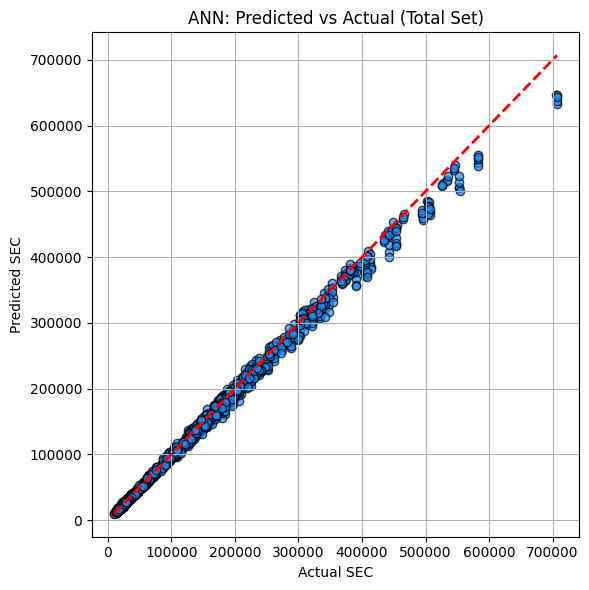

In [ ]:
# SEC
from tensorflow import keras
from tensorflow.keras import layers

n_features = x_total.shape[1]
# Best model
# ann_model2 = keras.Sequential([
#     layers.Input(shape=(n_features,)),             # 8 input features
#     layers.Dense(32, activation='relu'),   #120 128
#     layers.Dense(72, activation='relu'),
#     layers.Dense(32, activation='relu'),
#     layers.Dense(1)                       # single output
# ])
ann_model2 = keras.Sequential([
    layers.Input(shape=(n_features,)),    # 8 input features
    layers.Dense(120, activation='relu'),
    layers.Dense(128, activation='relu'),
    layers.Dense(1)                       # single output
])

# Compile
ann_model2.compile(optimizer=keras.optimizers.Adam(learning_rate=0.1),
                   loss='mean_absolute_error')
# fit/predict/evaluate
ann_model2.fit(x_total, y_total2, epochs=100, batch_size=32, verbose=0)
y_pred_total_ann2 = ann_model2.predict(x_total).flatten()
evaluate(y_total2, y_pred_total_ann2, "Total")

# Visualization
plt.figure(figsize=(6,6))
plt.scatter(y_total2, y_pred_total_ann2, color='dodgerblue', alpha=0.7, edgecolor='k')
plt.plot([y_total2.min(), y_total2.max()], [y_total2.min(), y_total2.max()], 'r--', lw=2)
plt.title("ANN: Predicted vs Actual (Total Set)")
plt.xlabel("Actual SEC")
plt.ylabel("Predicted SEC")
plt.grid(True)
plt.tight_layout()
plt.show()

139/139 ━━━━━━━━━━━━━━━━━━━━ 1s 3ms/step

--- Total set metrics ---
R²     : 0.9987
Adj-R² : 0.9987
MSE    : 1.087324
RMSE   : 1.042748
NRMSE  : 0.010548
std_er : 0.986270
MAE    : 0.758939
MAPE   : 0.032885
MedAE  : 0.563967
EVS    : 0.998802


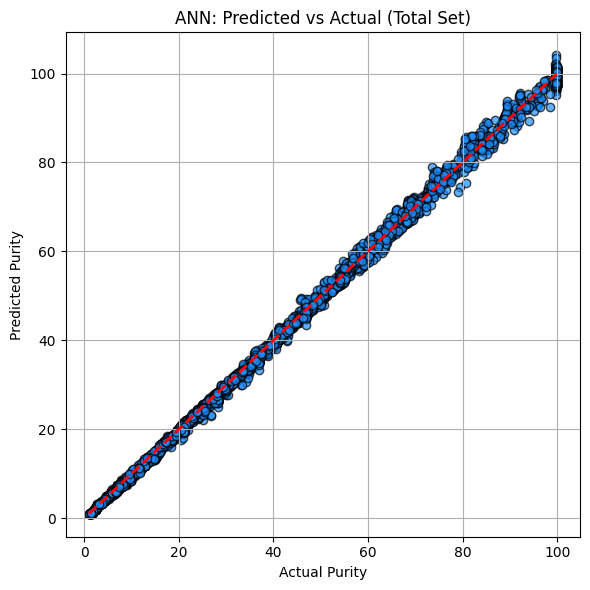

In [ ]:
# Purity
from tensorflow import keras
from tensorflow.keras import layers

# Best model
ann_model3 = keras.Sequential([
    layers.Input(shape=(n_features,)),    # 8 input features
    layers.Dense(32, activation='relu'),
    layers.Dense(72, activation='relu'),
    layers.Dense(32, activation='relu'),
    layers.Dense(1)                       # single output
])

# Compile
ann_model3.compile(optimizer=keras.optimizers.Adam(learning_rate=0.01),
                   loss='mean_absolute_error')
# fit/predict/evaluate
ann_model3.fit(x_total, y_total3, epochs=100, batch_size=32, verbose=0)
y_pred_total_ann3 = ann_model3.predict(x_total).flatten()
evaluate(y_total3, y_pred_total_ann3, "Total")

# Visualization
plt.figure(figsize=(6,6))
plt.scatter(y_total3, y_pred_total_ann3, color='dodgerblue', alpha=0.7, edgecolor='k')
plt.plot([y_total3.min(), y_total3.max()], [y_total3.min(), y_total3.max()], 'r--', lw=2)
plt.title("ANN: Predicted vs Actual (Total Set)")
plt.xlabel("Actual Purity")
plt.ylabel("Predicted Purity")
plt.grid(True)
plt.tight_layout()
plt.show()

**Save the 'Total Set' predictions as an excel file**

In [ ]:
total_vals1 = y_pred_total_ann1.flatten()
total_vals2 = y_pred_total_ann2.flatten()
total_vals3 = y_pred_total_ann3.flatten()

# Pad shorter array with NaN so they align in Excel
max_len = len(total_vals1)
total_vals1 = np.pad(total_vals1, (0, max_len - len(total_vals1)), constant_values=np.nan)
total_vals2 = np.pad(total_vals2, (0, max_len - len(total_vals2)), constant_values=np.nan)
total_vals3 = np.pad(total_vals3, (0, max_len - len(total_vals3)), constant_values=np.nan)

# Create the DataFrame with exactly two columns
df_pred = pd.DataFrame({
    "y_pred_total_ann1": total_vals1,
    "y_pred_total_ann2": total_vals2,
    "y_pred_total_ann3": total_vals3
})

# Save to Excel (single sheet)
df_pred.to_excel("ann_total_predictions.xlsx", sheet_name="ann", index=False)

print("✅ Saved to 'ann_total_predictions.xlsx'.")

✅ Saved to 'ann_total_predictions.xlsx'.


In [ ]:
y_pred_total_ann3

array([68.46019 , 26.74527 , 24.955658, ..., 50.97284 , 44.99278 ,
       23.782991], dtype=float32)

## TabPFN

In [ ]:
!pip install tabpfn==2.0.0

tabpfn-v2-regressor.ckpt:   0%|          | 0.00/44.4M [00:00<?, ?B/s]

config.json:   0%|          | 0.00/37.0 [00:00<?, ?B/s]


--- Total set metrics ---
R²     : 1.0000
Adj-R² : 1.0000
MSE    : 0.008288
RMSE   : 0.091041
NRMSE  : 0.000931
std_er : 0.090779
MAE    : 0.059049
MAPE   : 0.001526
MedAE  : 0.039708
EVS    : 0.999991


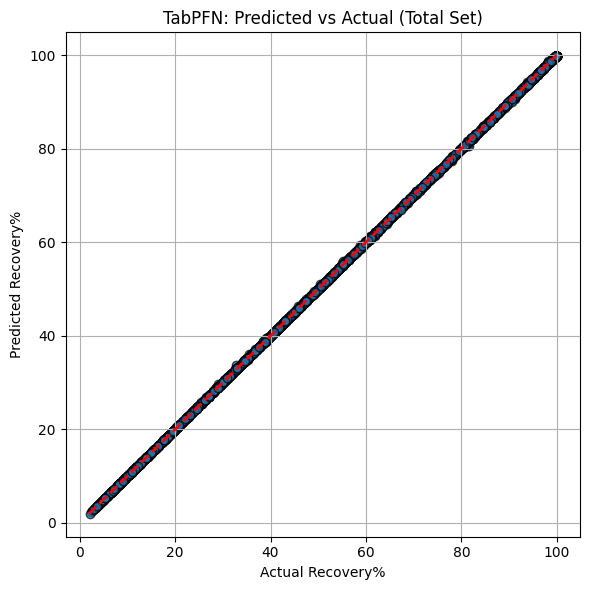

In [ ]:
# Recovery
from tabpfn import TabPFNRegressor

tab_model1 = TabPFNRegressor()
tab_model1.fit(x_total, y_total1)
y_pred_total_tab1 = tab_model1.predict(x_total)
evaluate(y_total1, y_pred_total_tab1, "Total")

# Plot Predicted vs Actual
plt.figure(figsize=(6,6))
plt.scatter(y_total1, y_pred_total_tab1, alpha=0.7, edgecolor="k")
mn = min(np.min(y_total1), np.min(y_pred_total_tab1))
mx = max(np.max(y_total1), np.max(y_pred_total_tab1))
plt.plot([mn, mx], [mn, mx], "r--", linewidth=2)
plt.xlabel("Actual Recovery%")
plt.ylabel("Predicted Recovery%")
plt.title("TabPFN: Predicted vs Actual (Total Set)")
plt.grid(True)
plt.tight_layout()
plt.show()


--- Total set metrics ---
R²     : 0.9873
Adj-R² : 0.9873
MSE    : 109557015.124846
RMSE   : 10466.948702
NRMSE  : 0.015006
std_er : 10393.451207
MAE    : 1333.486109
MAPE   : 0.005519
MedAE  : 88.465197
EVS    : 0.987457


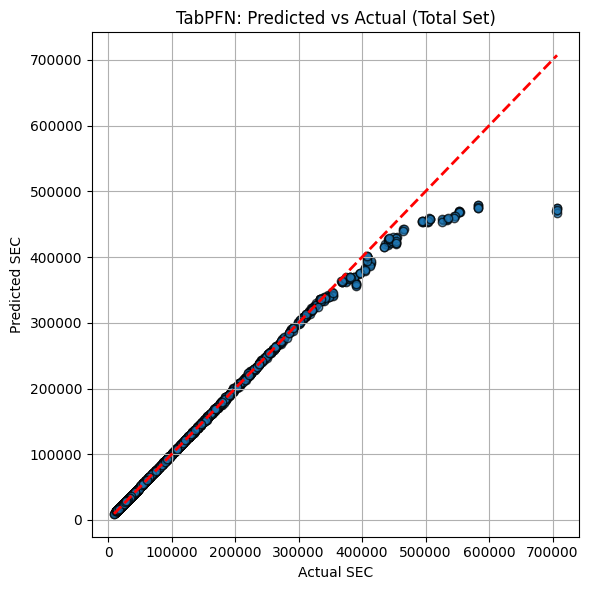

In [ ]:
# SEC
from tabpfn import TabPFNRegressor

tab_model2 = TabPFNRegressor()
tab_model2.fit(x_total, y_total2)
y_pred_total_tab2 = tab_model2.predict(x_total)
evaluate(y_total2, y_pred_total_tab2, "Total")

# Plot Predicted vs Actual
plt.figure(figsize=(6,6))
plt.scatter(y_total2, y_pred_total_tab2, alpha=0.7, edgecolor="k")
mn = min(np.min(y_total2), np.min(y_pred_total_tab2))
mx = max(np.max(y_total2), np.max(y_pred_total_tab2))
plt.plot([mn, mx], [mn, mx], "r--", linewidth=2)
plt.xlabel("Actual SEC")
plt.ylabel("Predicted SEC")
plt.title("TabPFN: Predicted vs Actual (Total Set)")
plt.grid(True)
plt.tight_layout()
plt.show()


--- Total set metrics ---
R²     : 1.0000
Adj-R² : 1.0000
MSE    : 0.033221
RMSE   : 0.182265
NRMSE  : 0.001844
std_er : 0.181585
MAE    : 0.094462
MAPE   : 0.002981
MedAE  : 0.046230
EVS    : 0.999959


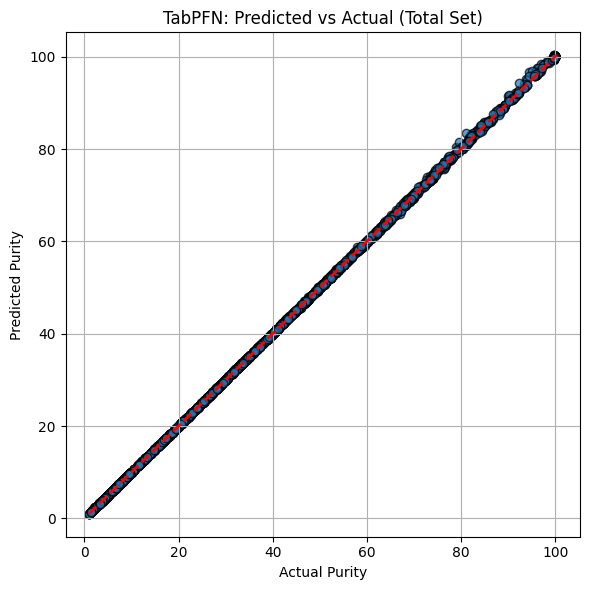

In [ ]:
# Purity
from tabpfn import TabPFNRegressor

tab_model3 = TabPFNRegressor()
tab_model3.fit(x_total, y_total3)
y_pred_total_tab3 = tab_model3.predict(x_total)
evaluate(y_total3, y_pred_total_tab3, "Total")

# Plot Predicted vs Actual
plt.figure(figsize=(6,6))
plt.scatter(y_total3, y_pred_total_tab3, alpha=0.7, edgecolor="k")
mn = min(np.min(y_total3), np.min(y_pred_total_tab3))
mx = max(np.max(y_total3), np.max(y_pred_total_tab3))
plt.plot([mn, mx], [mn, mx], "r--", linewidth=2)
plt.xlabel("Actual Purity")
plt.ylabel("Predicted Purity")
plt.title("TabPFN: Predicted vs Actual (Total Set)")
plt.grid(True)
plt.tight_layout()
plt.show()

In [ ]:
total_vals1 = y_pred_total_tab1.flatten()
total_vals2 = y_pred_total_tab2.flatten()
total_vals3 = y_pred_total_tab3.flatten()

# Pad shorter array with NaN so they align in Excel
max_len = len(total_vals1)
total_vals1 = np.pad(total_vals1, (0, max_len - len(total_vals1)), constant_values=np.nan)
total_vals2 = np.pad(total_vals2, (0, max_len - len(total_vals2)), constant_values=np.nan)
total_vals3 = np.pad(total_vals3, (0, max_len - len(total_vals3)), constant_values=np.nan)

# Create the DataFrame with exactly two columns
df_pred = pd.DataFrame({
    "y_pred_total_tab1": total_vals1,
    "y_pred_total_tab2": total_vals2,
    "y_pred_total_tab3": total_vals3
})

# Save to Excel (single sheet)
df_pred.to_excel("tab_total_predictions.xlsx", sheet_name="tab", index=False)

print("✅ Saved to 'tab_total_predictions.xlsx'.")

✅ Saved to 'tab_total_predictions.xlsx'.


## PSO-XGBoost


--- Total set metrics ---
R²     : 0.9993
Adj-R² : 0.9993
MSE    : 0.649135
RMSE   : 0.805689
NRMSE  : 0.008237
std_er : 0.805689
MAE    : 0.546956
MAPE   : 0.013680
MedAE  : 0.375508
EVS    : 0.999282


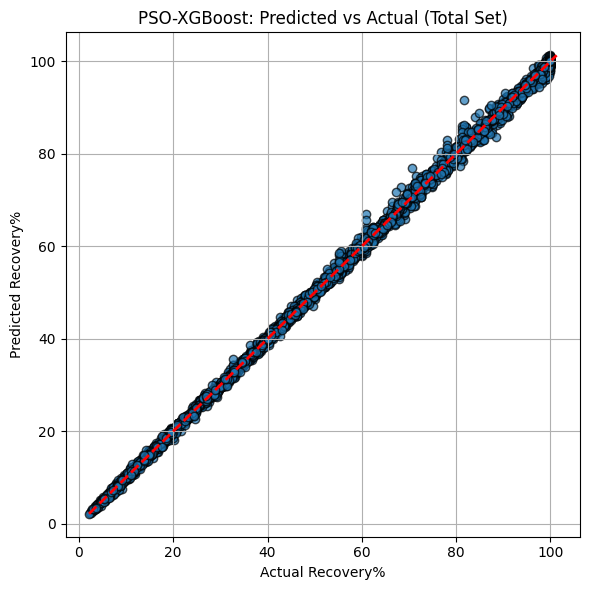

In [ ]:
# Recovery
from xgboost import XGBRegressor
xgb_model1 = XGBRegressor(base_score=None, booster=None, callbacks=None,
             colsample_bylevel=None, colsample_bynode=None,
             colsample_bytree=0.794347904457994, device=None,
             early_stopping_rounds=None, enable_categorical=False,
             eval_metric=None, feature_types=None, feature_weights=None,
             gamma=0.45398325921376137, grow_policy=None, importance_type=None,
             interaction_constraints=None, learning_rate=0.08564167838681164,
             max_bin=None, max_cat_threshold=None, max_cat_to_onehot=None,
             max_delta_step=None, max_depth=5, max_leaves=None,
             min_child_weight=None, monotone_constraints=None,
             multi_strategy=None, n_estimators=724, random_state=42)

xgb_model1.fit(x_total, y_total1)
y_pred_total_xg1 = xgb_model1.predict(x_total)
evaluate(y_total1, y_pred_total_xg1, "Total")

# Plot Predicted vs Actual
plt.figure(figsize=(6,6))
plt.scatter(y_total1, y_pred_total_xg1, alpha=0.7, edgecolor="k")
mn = min(np.min(y_total1), np.min(y_pred_total_xg1))
mx = max(np.max(y_total1), np.max(y_pred_total_xg1))
plt.plot([mn, mx], [mn, mx], "r--", linewidth=2)
plt.xlabel("Actual Recovery%")
plt.ylabel("Predicted Recovery%")
plt.title("PSO-XGBoost: Predicted vs Actual (Total Set)")
plt.grid(True)
plt.tight_layout()
plt.show()


--- Total set metrics ---
R²     : 0.9999
Adj-R² : 0.9999
MSE    : 1288761.787142
RMSE   : 1135.236445
NRMSE  : 0.001628
std_er : 1135.236444
MAE    : 746.344276
MAPE   : 0.017466
MedAE  : 512.625105
EVS    : 0.999850


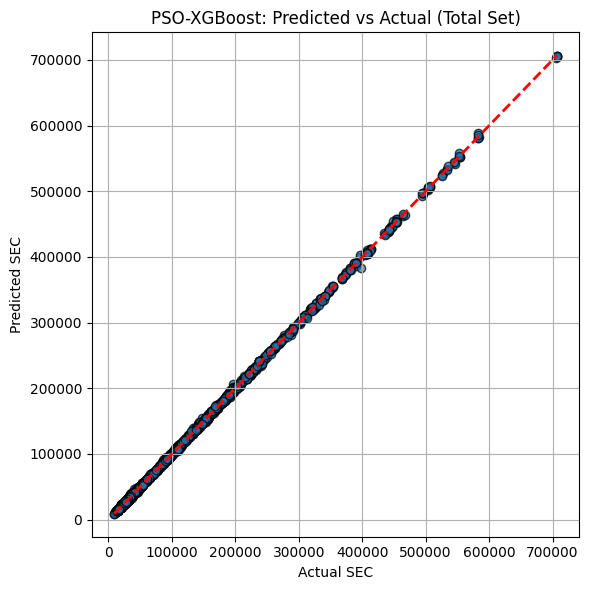

In [ ]:
# SEC
from xgboost import XGBRegressor
xgb_model2 = XGBRegressor(base_score=None, booster=None, callbacks=None,
             colsample_bylevel=None, colsample_bynode=None,
             colsample_bytree=0.9207502204636566, device=None,
             early_stopping_rounds=None, enable_categorical=False,
             eval_metric=None, feature_types=None, feature_weights=None,
             gamma=4.562640895437547, grow_policy=None, importance_type=None,
             interaction_constraints=None, learning_rate=0.033250273864687305,
             max_bin=None, max_cat_threshold=None, max_cat_to_onehot=None,
             max_delta_step=None, max_depth=5, max_leaves=None,
             min_child_weight=None, monotone_constraints=None,
             multi_strategy=None, n_estimators=672, n_jobs=None)

xgb_model2.fit(x_total, y_total2)
y_pred_total_xg2 = xgb_model2.predict(x_total)
evaluate(y_total2, y_pred_total_xg2, "Total")

# Plot Predicted vs Actual
plt.figure(figsize=(6,6))
plt.scatter(y_total2, y_pred_total_xg2, alpha=0.7, edgecolor="k")
mn = min(np.min(y_total2), np.min(y_pred_total_xg2))
mx = max(np.max(y_total2), np.max(y_pred_total_xg2))
plt.plot([mn, mx], [mn, mx], "r--", linewidth=2)
plt.xlabel("Actual SEC")
plt.ylabel("Predicted SEC")
plt.title("PSO-XGBoost: Predicted vs Actual (Total Set)")
plt.grid(True)
plt.tight_layout()
plt.show()


--- Total set metrics ---
R²     : 0.9988
Adj-R² : 0.9988
MSE    : 0.977905
RMSE   : 0.988891
NRMSE  : 0.010003
std_er : 0.988891
MAE    : 0.620904
MAPE   : 0.023179
MedAE  : 0.360134
EVS    : 0.998796


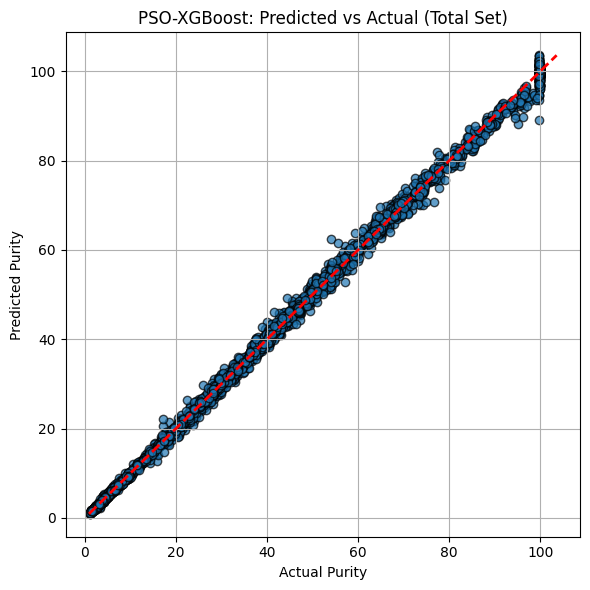

In [ ]:
# Purity
from xgboost import XGBRegressor
xgb_model3 = XGBRegressor(base_score=None, booster=None, callbacks=None,
             colsample_bylevel=None, colsample_bynode=None,
             colsample_bytree=0.9727111775192585, device=None,
             early_stopping_rounds=None, enable_categorical=False,
             eval_metric=None, feature_types=None, feature_weights=None,
             gamma=0.5320395779360891, grow_policy=None, importance_type=None,
             interaction_constraints=None, learning_rate=0.041150584937100235,
             max_bin=None, max_cat_threshold=None, max_cat_to_onehot=None,
             max_delta_step=None, max_depth=6, max_leaves=None,
             min_child_weight=None, monotone_constraints=None,
             multi_strategy=None, n_estimators=938, n_jobs=None)

xgb_model3.fit(x_total, y_total3)
y_pred_total_xg3 = xgb_model3.predict(x_total)
evaluate(y_total3, y_pred_total_xg3, "Total")

# Plot Predicted vs Actual
plt.figure(figsize=(6,6))
plt.scatter(y_total3, y_pred_total_xg3, alpha=0.7, edgecolor="k")
mn = min(np.min(y_total3), np.min(y_pred_total_xg3))
mx = max(np.max(y_total3), np.max(y_pred_total_xg3))
plt.plot([mn, mx], [mn, mx], "r--", linewidth=2)
plt.xlabel("Actual Purity")
plt.ylabel("Predicted Purity")
plt.title("PSO-XGBoost: Predicted vs Actual (Total Set)")
plt.grid(True)
plt.tight_layout()
plt.show()

In [ ]:
total_vals1 = y_pred_total_xg1.flatten()
total_vals2 = y_pred_total_xg2.flatten()
total_vals3 = y_pred_total_xg3.flatten()

# Pad shorter array with NaN so they align in Excel
max_len = len(total_vals1)
total_vals1 = np.pad(total_vals1, (0, max_len - len(total_vals1)), constant_values=np.nan)
total_vals2 = np.pad(total_vals2, (0, max_len - len(total_vals2)), constant_values=np.nan)
total_vals3 = np.pad(total_vals3, (0, max_len - len(total_vals3)), constant_values=np.nan)

# Create the DataFrame with exactly two columns
df_pred = pd.DataFrame({
    "y_pred_total_xg1": total_vals1,
    "y_pred_total_xg2": total_vals2,
    "y_pred_total_xg3": total_vals3
})

# Save to Excel (single sheet)
df_pred.to_excel("xg_total_predictions.xlsx", sheet_name="xg", index=False)

print("✅ Saved to 'xg_total_predictions.xlsx'.")

✅ Saved to 'xg_total_predictions.xlsx'.


## PSO-GBR


--- Total set metrics ---
R²     : 0.9995
Adj-R² : 0.9995
MSE    : 0.420231
RMSE   : 0.648252
NRMSE  : 0.006627
std_er : 0.648252
MAE    : 0.459406
MAPE   : 0.011814
MedAE  : 0.326804
EVS    : 0.999535


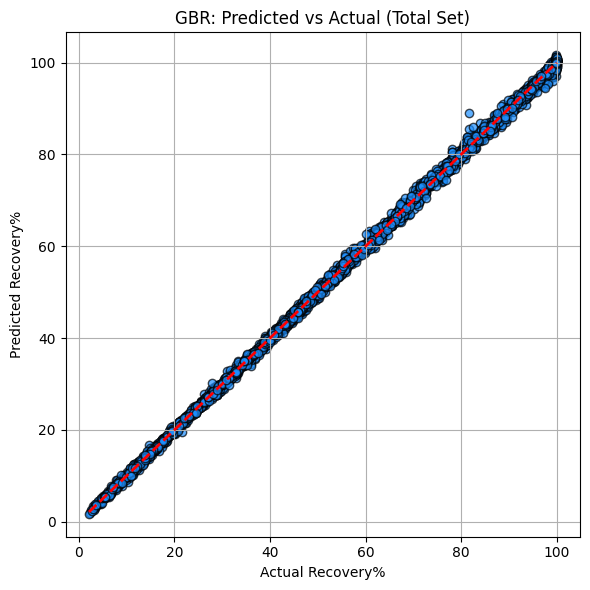

In [ ]:
# Recovery
from sklearn.ensemble import GradientBoostingRegressor
gbr_model1 = GradientBoostingRegressor(learning_rate=0.07780212667426754, max_depth=4,
                          max_features=0.7150294538727542, min_samples_leaf=4,
                          min_samples_split=14, n_estimators=633,
                          random_state=42, subsample=0.7757643293874783)

gbr_model1.fit(x_total, y_total1)
y_pred_total_gbr1 = gbr_model1.predict(x_total)
evaluate(y_total1, y_pred_total_gbr1, "Total")

# Visualization
plt.figure(figsize=(6,6))
plt.scatter(y_total1, y_pred_total_gbr1, color='dodgerblue', alpha=0.7, edgecolor='k')
plt.plot([y_total1.min(), y_total1.max()], [y_total1.min(), y_total1.max()], 'r--', lw=2)
plt.title("GBR: Predicted vs Actual (Total Set)")
plt.xlabel("Actual Recovery%")
plt.ylabel("Predicted Recovery%")
plt.grid(True)
plt.tight_layout()
plt.show()


--- Total set metrics ---
R²     : 0.9999
Adj-R² : 0.9999
MSE    : 436311.711531
RMSE   : 660.538955
NRMSE  : 0.000947
std_er : 660.538896
MAE    : 452.800452
MAPE   : 0.011351
MedAE  : 306.841521
EVS    : 0.999949


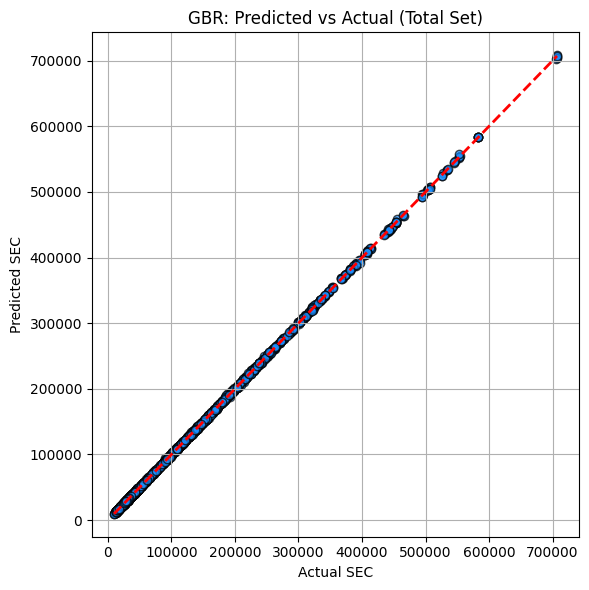

In [ ]:
# SEC
from sklearn.ensemble import GradientBoostingRegressor
gbr_model2 = GradientBoostingRegressor(learning_rate=0.14250485305726465, max_depth=4,
                          max_features=0.9075248053662535, min_samples_leaf=2,
                          min_samples_split=18, n_estimators=607,
                          random_state=42, subsample=0.9951297938254593)

gbr_model2.fit(x_total, y_total2)
y_pred_total_gbr2 = gbr_model2.predict(x_total)
evaluate(y_total2, y_pred_total_gbr2, "Total")

# Visualization
plt.figure(figsize=(6,6))
plt.scatter(y_total2, y_pred_total_gbr2, color='dodgerblue', alpha=0.7, edgecolor='k')
plt.plot([y_total2.min(), y_total2.max()], [y_total2.min(), y_total2.max()], 'r--', lw=2)
plt.title("GBR: Predicted vs Actual (Total Set)")
plt.xlabel("Actual SEC")
plt.ylabel("Predicted SEC")
plt.grid(True)
plt.tight_layout()
plt.show()


--- Total set metrics ---
R²     : 0.9998
Adj-R² : 0.9998
MSE    : 0.165041
RMSE   : 0.406253
NRMSE  : 0.004110
std_er : 0.406252
MAE    : 0.216029
MAPE   : 0.008201
MedAE  : 0.116562
EVS    : 0.999797


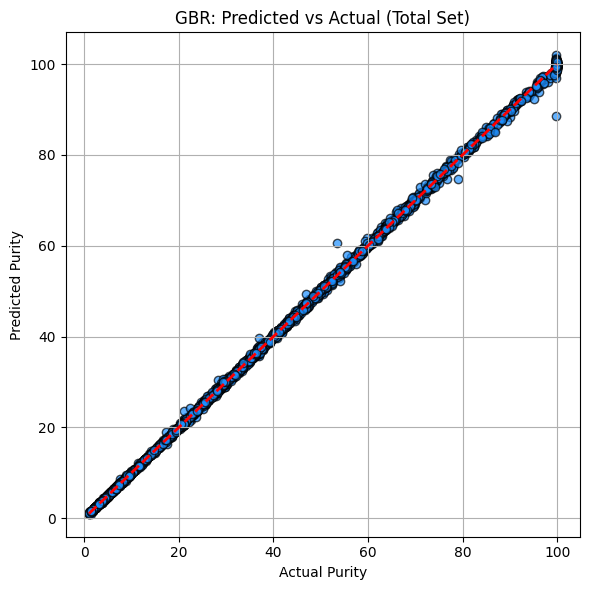

In [ ]:
# Purity
from sklearn.ensemble import GradientBoostingRegressor
gbr_model3 = GradientBoostingRegressor(learning_rate=0.028832399541631026, max_depth=8,
                          max_features=0.9306761987596761, min_samples_leaf=7,
                          min_samples_split=11, n_estimators=919,
                          random_state=42, subsample=0.5396359220219887)

gbr_model3.fit(x_total, y_total3)
y_pred_total_gbr3 = gbr_model3.predict(x_total)
evaluate(y_total3, y_pred_total_gbr3, "Total")

# Visualization
plt.figure(figsize=(6,6))
plt.scatter(y_total3, y_pred_total_gbr3, color='dodgerblue', alpha=0.7, edgecolor='k')
plt.plot([y_total3.min(), y_total3.max()], [y_total3.min(), y_total3.max()], 'r--', lw=2)
plt.title("GBR: Predicted vs Actual (Total Set)")
plt.xlabel("Actual Purity")
plt.ylabel("Predicted Purity")
plt.grid(True)
plt.tight_layout()
plt.show()

In [ ]:
total_vals1 = y_pred_total_gbr1.flatten()
total_vals2 = y_pred_total_gbr2.flatten()
total_vals3 = y_pred_total_gbr3.flatten()

# Pad shorter array with NaN so they align in Excel
max_len = len(total_vals1)
total_vals1 = np.pad(total_vals1, (0, max_len - len(total_vals1)), constant_values=np.nan)
total_vals2 = np.pad(total_vals2, (0, max_len - len(total_vals2)), constant_values=np.nan)
total_vals3 = np.pad(total_vals3, (0, max_len - len(total_vals3)), constant_values=np.nan)

# Create the DataFrame with exactly two columns
df_pred = pd.DataFrame({
    "y_pred_total_gbr1": total_vals1,
    "y_pred_total_gbr2": total_vals2,
    "y_pred_total_gbr3": total_vals3
})

# Save to Excel (single sheet)
df_pred.to_excel("gbr_total_predictions.xlsx", sheet_name="gbr", index=False)

print("✅ Saved to 'gbr_total_predictions.xlsx'.")

✅ Saved to 'gbr_total_predictions.xlsx'.


## PSO-CatBoost

In [ ]:
!pip install catboost

   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 99.2/99.2 MB 9.3 MB/s eta 0:00:00



--- Total set metrics ---
R²     : 0.9999
Adj-R² : 0.9999
MSE    : 0.116848
RMSE   : 0.341830
NRMSE  : 0.003495
std_er : 0.341830
MAE    : 0.254101
MAPE   : 0.006890
MedAE  : 0.197985
EVS    : 0.999871


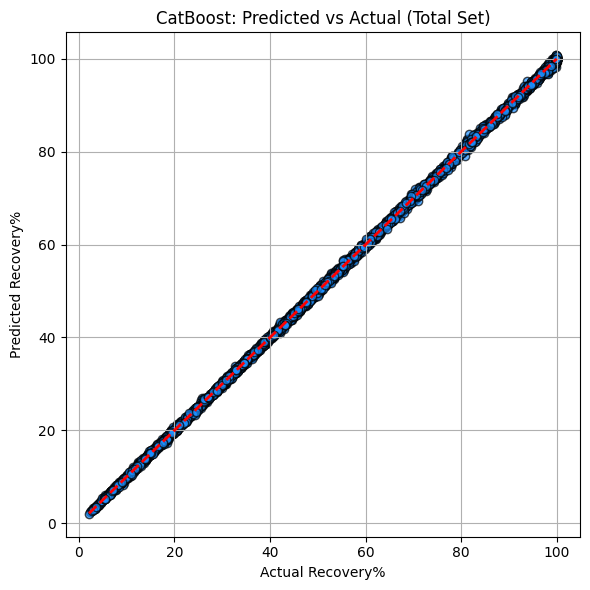

In [ ]:
# Recovery
from catboost import CatBoostRegressor
cb_model1 = CatBoostRegressor(iterations=987, learning_rate=0.06921084015993914,
                              depth=7, l2_leaf_reg=1.6926258102111902, rsm=0.8583651828877268,
                              loss_function='RMSE', random_seed=42, verbose=False,
                              allow_writing_files=False, task_type='CPU',
                              bootstrap_type='Bernoulli', subsample=0.8125328711078112)

cb_model1.fit(x_total, y_total1)
y_pred_total_cb1 = cb_model1.predict(x_total)
evaluate(y_total1, y_pred_total_cb1, "Total")

# Visualization
plt.figure(figsize=(6,6))
plt.scatter(y_total1, y_pred_total_cb1, color='dodgerblue', alpha=0.7, edgecolor='k')
plt.plot([y_total1.min(), y_total1.max()], [y_total1.min(), y_total1.max()], 'r--', lw=2)
plt.title("CatBoost: Predicted vs Actual (Total Set)")
plt.xlabel("Actual Recovery%")
plt.ylabel("Predicted Recovery%")
plt.grid(True)
plt.tight_layout()
plt.show()


--- Total set metrics ---
R²     : 0.9995
Adj-R² : 0.9995
MSE    : 3892197.958355
RMSE   : 1972.865418
NRMSE  : 0.002828
std_er : 1972.865416
MAE    : 1320.044386
MAPE   : 0.029571
MedAE  : 870.202767
EVS    : 0.999548


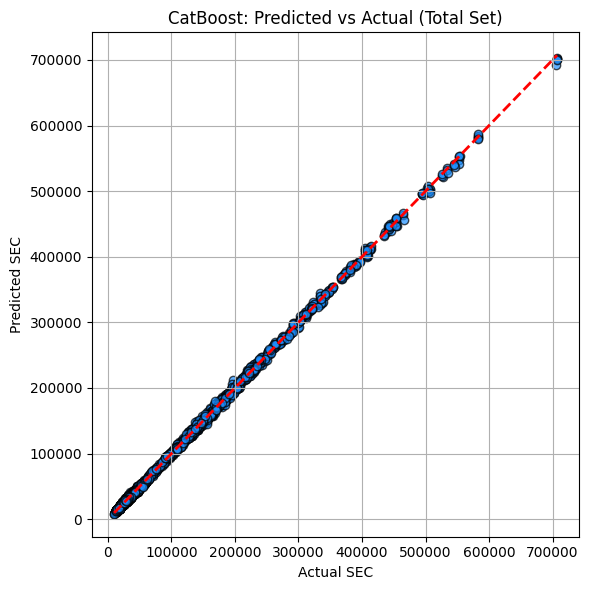

In [ ]:
# SEC
from catboost import CatBoostRegressor
cb_model2 = CatBoostRegressor(iterations=484, learning_rate=0.04463768687603424, depth=5,
                              l2_leaf_reg=0.5987692889341945, rsm=0.6484702678951451,
                              loss_function='RMSE', random_seed=42, verbose=False,
                              allow_writing_files=False, task_type='CPU',
                              bootstrap_type='Bernoulli', subsample=0.8601134735851019)

cb_model2.fit(x_total, y_total2)
y_pred_total_cb2 = cb_model2.predict(x_total)
evaluate(y_total2, y_pred_total_cb2, "Total")

# Visualization
plt.figure(figsize=(6,6))
plt.scatter(y_total2, y_pred_total_cb2, color='dodgerblue', alpha=0.7, edgecolor='k')
plt.plot([y_total2.min(), y_total2.max()], [y_total2.min(), y_total2.max()], 'r--', lw=2)
plt.title("CatBoost: Predicted vs Actual (Total Set)")
plt.xlabel("Actual SEC")
plt.ylabel("Predicted SEC")
plt.grid(True)
plt.tight_layout()
plt.show()


--- Total set metrics ---
R²     : 0.9899
Adj-R² : 0.9899
MSE    : 8.227128
RMSE   : 2.868297
NRMSE  : 0.029015
std_er : 2.868297
MAE    : 1.918679
MAPE   : 0.065140
MedAE  : 1.154387
EVS    : 0.989871


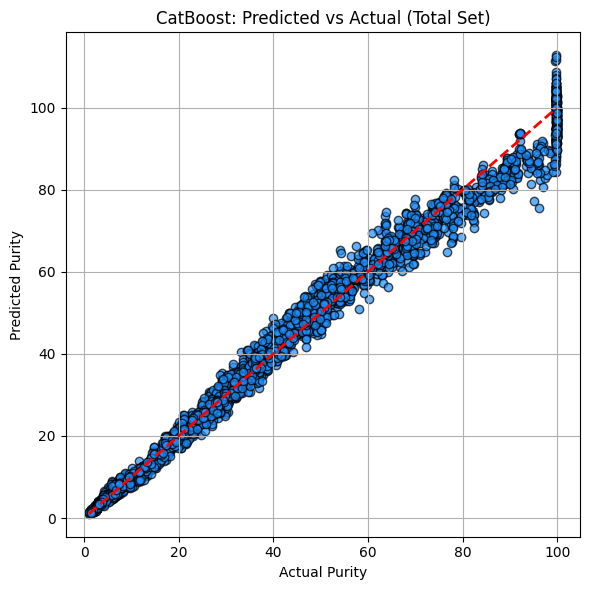

In [ ]:
# Purity
from catboost import CatBoostRegressor
cb_model3 = CatBoostRegressor(iterations=54, learning_rate=0.13410536212915647, depth=8,
                              l2_leaf_reg=0.376584630037079, rsm=0.9710562268314031,
                              loss_function='RMSE', random_seed=42, verbose=False,
                              allow_writing_files=False, task_type='CPU',
                              bootstrap_type='Bernoulli', subsample=0.5895788236923274)

cb_model3.fit(x_total, y_total3)
y_pred_total_cb3 = cb_model3.predict(x_total)
evaluate(y_total3, y_pred_total_cb3, "Total")

# Visualization
plt.figure(figsize=(6,6))
plt.scatter(y_total3, y_pred_total_cb3, color='dodgerblue', alpha=0.7, edgecolor='k')
plt.plot([y_total3.min(), y_total3.max()], [y_total3.min(), y_total3.max()], 'r--', lw=2)
plt.title("CatBoost: Predicted vs Actual (Total Set)")
plt.xlabel("Actual Purity")
plt.ylabel("Predicted Purity")
plt.grid(True)
plt.tight_layout()
plt.show()

In [ ]:
total_vals1 = y_pred_total_cb1.flatten()
total_vals2 = y_pred_total_cb2.flatten()
total_vals3 = y_pred_total_cb3.flatten()

# Pad shorter array with NaN so they align in Excel
max_len = len(total_vals1)
total_vals1 = np.pad(total_vals1, (0, max_len - len(total_vals1)), constant_values=np.nan)
total_vals2 = np.pad(total_vals2, (0, max_len - len(total_vals2)), constant_values=np.nan)
total_vals3 = np.pad(total_vals3, (0, max_len - len(total_vals3)), constant_values=np.nan)

# Create the DataFrame with exactly two columns
df_pred = pd.DataFrame({
    "y_pred_total_cb1": total_vals1,
    "y_pred_total_cb2": total_vals2,
    "y_pred_total_cb3": total_vals3
})

# Save to Excel (single sheet)
df_pred.to_excel("cb_total_predictions.xlsx", sheet_name="cb", index=False)

print("✅ Saved to 'cb_total_predictions.xlsx'.")

✅ Saved to 'cb_total_predictions.xlsx'.


## PSO-AdaBoost


--- Total set metrics ---
R²     : 0.9993
Adj-R² : 0.9993
MSE    : 0.669459
RMSE   : 0.818205
NRMSE  : 0.008364
std_er : 0.814804
MAE    : 0.628451
MAPE   : 0.024916
MedAE  : 0.496119
EVS    : 0.999266


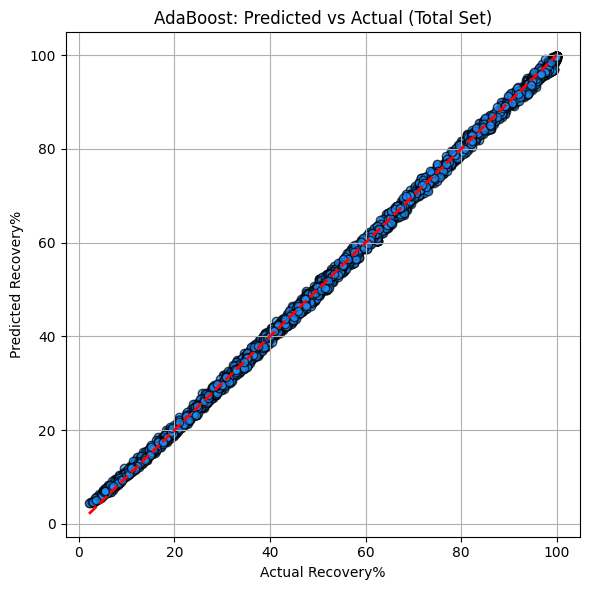

In [ ]:
# Recovery
from sklearn.ensemble import AdaBoostRegressor
from sklearn.tree import DecisionTreeRegressor
import matplotlib.pyplot as plt

# Define base estimator
base_tree = DecisionTreeRegressor(
    criterion='squared_error',
    max_depth=10,
    min_samples_leaf=3,
    random_state=42
)

# Define AdaBoost model
adb_model1 = AdaBoostRegressor(
    estimator=base_tree,
    learning_rate=0.9007685647106364,
    loss='square',
    n_estimators=471,
    random_state=42
)

# Fit model
adb_model1.fit(x_total, y_total1)

# Predict
y_pred_total_adb1 = adb_model1.predict(x_total)
evaluate(y_total1, y_pred_total_adb1, "Total")

# Visualization
plt.figure(figsize=(6,6))
plt.scatter(y_total1, y_pred_total_adb1, color='dodgerblue', alpha=0.7, edgecolor='k')
plt.plot([y_total1.min(), y_total1.max()], [y_total1.min(), y_total1.max()], 'r--', lw=2)
plt.title("AdaBoost: Predicted vs Actual (Total Set)")
plt.xlabel("Actual Recovery%")
plt.ylabel("Predicted Recovery%")
plt.grid(True)
plt.tight_layout()
plt.show()


--- Total set metrics ---
R²     : 0.9993
Adj-R² : 0.9993
MSE    : 6096987.522625
RMSE   : 2469.207874
NRMSE  : 0.003540
std_er : 2234.295396
MAE    : 1976.768036
MAPE   : 0.075487
MedAE  : 1785.804933
EVS    : 0.999420


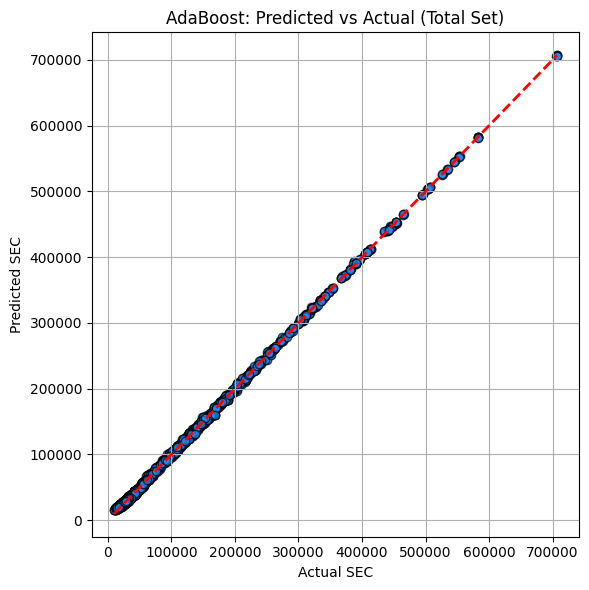

In [ ]:
# SEC
from sklearn.ensemble import AdaBoostRegressor
from sklearn.tree import DecisionTreeRegressor
import matplotlib.pyplot as plt

# Define base estimator
base_tree = DecisionTreeRegressor(
    criterion='squared_error',
    max_depth=10,
    min_samples_leaf=3,
    random_state=42
)

# Define AdaBoost model
adb_model2 = AdaBoostRegressor(
    estimator=base_tree,
    learning_rate=0.479481012015941,
    loss='square',
    n_estimators=593,
    random_state=42
)

# Fit model
adb_model2.fit(x_total, y_total2)

# Predict
y_pred_total_adb2 = adb_model2.predict(x_total)
evaluate(y_total2, y_pred_total_adb2, "Total")

# Visualization
plt.figure(figsize=(6,6))
plt.scatter(y_total2, y_pred_total_adb2, color='dodgerblue', alpha=0.7, edgecolor='k')
plt.plot([y_total2.min(), y_total2.max()], [y_total2.min(), y_total2.max()], 'r--', lw=2)
plt.title("AdaBoost: Predicted vs Actual (Total Set)")
plt.xlabel("Actual SEC")
plt.ylabel("Predicted SEC")
plt.grid(True)
plt.tight_layout()
plt.show()


--- Total set metrics ---
R²     : 0.9971
Adj-R² : 0.9971
MSE    : 2.335541
RMSE   : 1.528248
NRMSE  : 0.015459
std_er : 1.527986
MAE    : 1.067885
MAPE   : 0.044242
MedAE  : 0.698918
EVS    : 0.997125


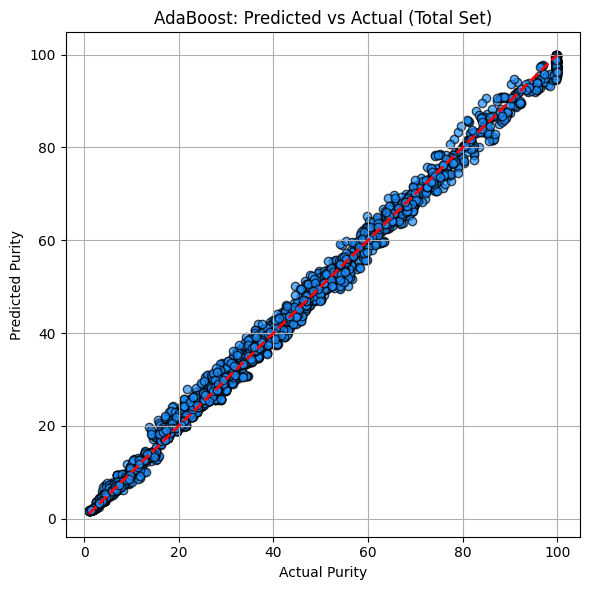

In [ ]:
# Purity
from sklearn.ensemble import AdaBoostRegressor
from sklearn.tree import DecisionTreeRegressor
import matplotlib.pyplot as plt

# Define base estimator
base_tree = DecisionTreeRegressor(
    criterion='squared_error',
    max_depth=10,
    min_samples_leaf=10,
    random_state=42
)

# Define AdaBoost model
adb_model3 = AdaBoostRegressor(
    estimator=base_tree,
    learning_rate=0.03597743718960905,
    loss='square',
    n_estimators=874,
    random_state=42
)

# Fit model
adb_model3.fit(x_total, y_total3)

# Predict
y_pred_total_adb3 = adb_model3.predict(x_total)
evaluate(y_total3, y_pred_total_adb3, "Total")

# Visualization
plt.figure(figsize=(6,6))
plt.scatter(y_total3, y_pred_total_adb3, color='dodgerblue', alpha=0.7, edgecolor='k')
plt.plot([y_total3.min(), y_total3.max()], [y_total3.min(), y_total3.max()], 'r--', lw=2)
plt.title("AdaBoost: Predicted vs Actual (Total Set)")
plt.xlabel("Actual Purity")
plt.ylabel("Predicted Purity")
plt.grid(True)
plt.tight_layout()
plt.show()

In [ ]:
total_vals1 = y_pred_total_adb1.flatten()
total_vals2 = y_pred_total_adb2.flatten()
total_vals3 = y_pred_total_adb3.flatten()

# Pad shorter array with NaN so they align in Excel
max_len = len(total_vals1)
total_vals1 = np.pad(total_vals1, (0, max_len - len(total_vals1)), constant_values=np.nan)
total_vals2 = np.pad(total_vals2, (0, max_len - len(total_vals2)), constant_values=np.nan)
total_vals3 = np.pad(total_vals3, (0, max_len - len(total_vals3)), constant_values=np.nan)

# Create the DataFrame with exactly two columns
df_pred = pd.DataFrame({
    "y_pred_total_adb1": total_vals1,
    "y_pred_total_adb2": total_vals2,
    "y_pred_total_adb3": total_vals3
})

# Save to Excel (single sheet)
df_pred.to_excel("adb_total_predictions.xlsx", sheet_name="adb", index=False)

print("✅ Saved to 'adb_total_predictions.xlsx'.")

✅ Saved to 'adb_total_predictions.xlsx'.


# **Results and Comparison**

## Plots and Metrics

In [ ]:
from google.colab import files

uploaded = files.upload()
file_name2 = list(uploaded.keys())[0]
df_pred = pd.read_excel(file_name2)
all_sheets = pd.read_excel("predictions.xlsx", sheet_name=None)

## --------------------------------------------

# df_pred = pd.read_excel("C:\\Users\\Pgshco\\Desktop\\Python ML\\Carbon Capture\\ML codes\\Final Code\\predictions.xlsx")
# all_sheets = pd.read_excel("C:\\Users\\Pgshco\\Desktop\\Python ML\\Carbon Capture\\ML codes\\Final Code\\predictions.xlsx", sheet_name=None)

Saving predictions.xlsx to predictions.xlsx


In [ ]:
import pandas as pd


# Loop through each sheet and create variables dynamically
for sheet_name, df_pred in all_sheets.items():
    model_name = ''.join([c for c in sheet_name if not c.isdigit()])  # e.g., 'gbr'
    target_num = ''.join([c for c in sheet_name if c.isdigit()])      # e.g., '3'

    # Extract columns
    train_col = df_pred.iloc[:, 0].values
    test_col  = df_pred.iloc[:, 1].values

    # Create variable names like y_pred_train_gbr3, y_pred_test_gbr3
    globals()[f"y_pred_train_{model_name}{target_num}"] = train_col
    globals()[f"y_pred_test_{model_name}{target_num}"]  = test_col

    print(f"Loaded: y_pred_train_{model_name}{target_num}, y_pred_test_{model_name}{target_num}")


Loaded: y_pred_train_ann1, y_pred_test_ann1
Loaded: y_pred_train_ann2, y_pred_test_ann2
Loaded: y_pred_train_ann3, y_pred_test_ann3
Loaded: y_pred_train_tab1, y_pred_test_tab1
Loaded: y_pred_train_tab2, y_pred_test_tab2
Loaded: y_pred_train_tab3, y_pred_test_tab3
Loaded: y_pred_train_xg1, y_pred_test_xg1
Loaded: y_pred_train_xg2, y_pred_test_xg2
Loaded: y_pred_train_xg3, y_pred_test_xg3
Loaded: y_pred_train_gbr1, y_pred_test_gbr1
Loaded: y_pred_train_gbr2, y_pred_test_gbr2
Loaded: y_pred_train_gbr3, y_pred_test_gbr3
Loaded: y_pred_train_cb1, y_pred_test_cb1
Loaded: y_pred_train_cb2, y_pred_test_cb2
Loaded: y_pred_train_cb3, y_pred_test_cb3
Loaded: y_pred_train_adb1, y_pred_test_adb1
Loaded: y_pred_train_adb2, y_pred_test_adb2
Loaded: y_pred_train_adb3, y_pred_test_adb3


In [ ]:
import numpy as np
### Train
# Iterate over a snapshot of current globals to avoid runtime error
for name in list(globals().keys()):
    value = globals()[name]
    if name.startswith("y_pred_train_") and isinstance(value, np.ndarray):
        cleaned = value[~np.isnan(value)]   # remove NaN values
        globals()[name] = cleaned
        print(f"{name}: cleaned -> {len(cleaned)} values")



### Test
# Iterate over a snapshot of current globals to avoid runtime error
for name in list(globals().keys()):
    value = globals()[name]
    if name.startswith("y_pred_test_") and isinstance(value, np.ndarray):
        cleaned = value[~np.isnan(value)]   # remove NaN values
        globals()[name] = cleaned
        print(f"{name}: cleaned -> {len(cleaned)} values")

y_pred_train_ann1: cleaned -> 3540 values
y_pred_train_ann2: cleaned -> 3540 values
y_pred_train_ann3: cleaned -> 3540 values
y_pred_train_tab1: cleaned -> 3540 values
y_pred_train_tab2: cleaned -> 3540 values
y_pred_train_tab3: cleaned -> 3540 values
y_pred_train_xg1: cleaned -> 3540 values
y_pred_train_xg2: cleaned -> 3540 values
y_pred_train_xg3: cleaned -> 3540 values
y_pred_train_gbr1: cleaned -> 3540 values
y_pred_train_gbr2: cleaned -> 3540 values
y_pred_train_gbr3: cleaned -> 3540 values
y_pred_train_cb1: cleaned -> 3540 values
y_pred_train_cb2: cleaned -> 3540 values
y_pred_train_cb3: cleaned -> 3540 values
y_pred_train_adb1: cleaned -> 3540 values
y_pred_train_adb2: cleaned -> 3540 values
y_pred_train_adb3: cleaned -> 3540 values
y_pred_test_ann1: cleaned -> 886 values
y_pred_test_ann2: cleaned -> 886 values
y_pred_test_ann3: cleaned -> 886 values
y_pred_test_tab1: cleaned -> 886 values
y_pred_test_tab2: cleaned -> 886 values
y_pred_test_tab3: cleaned -> 886 values
y_pred_tes

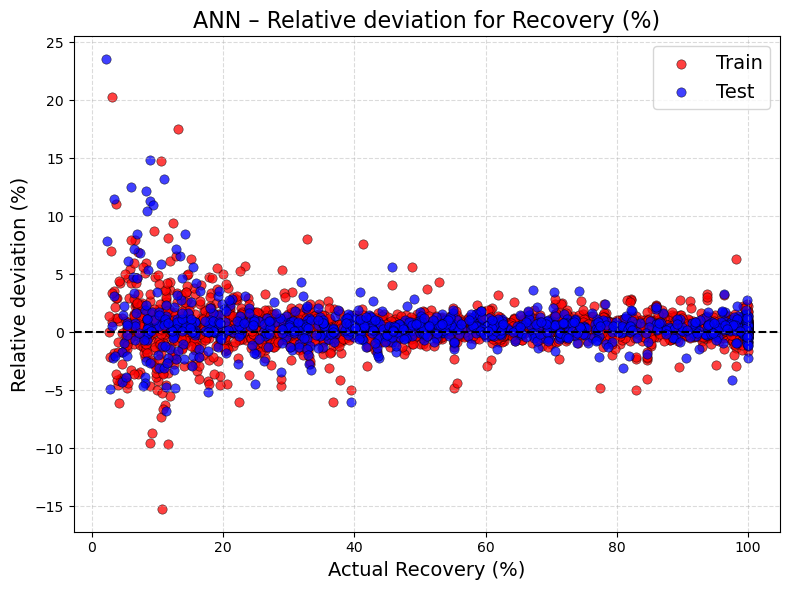

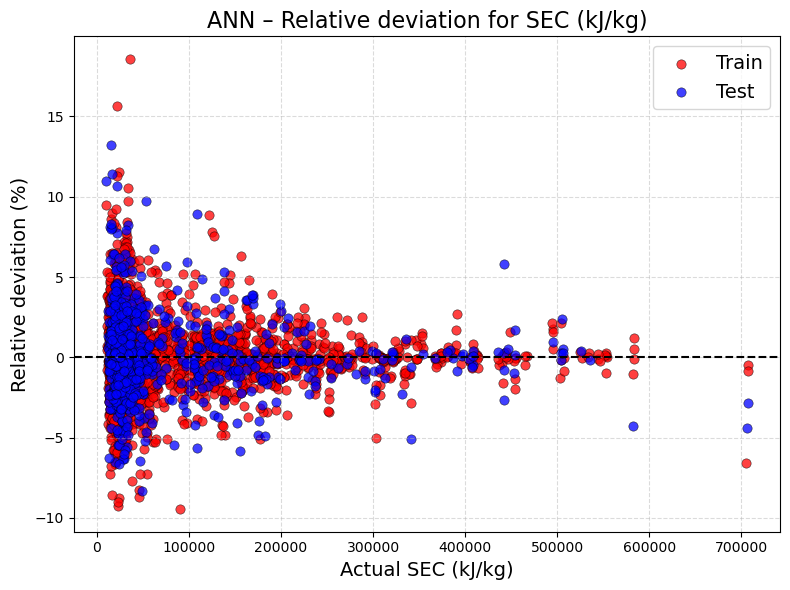

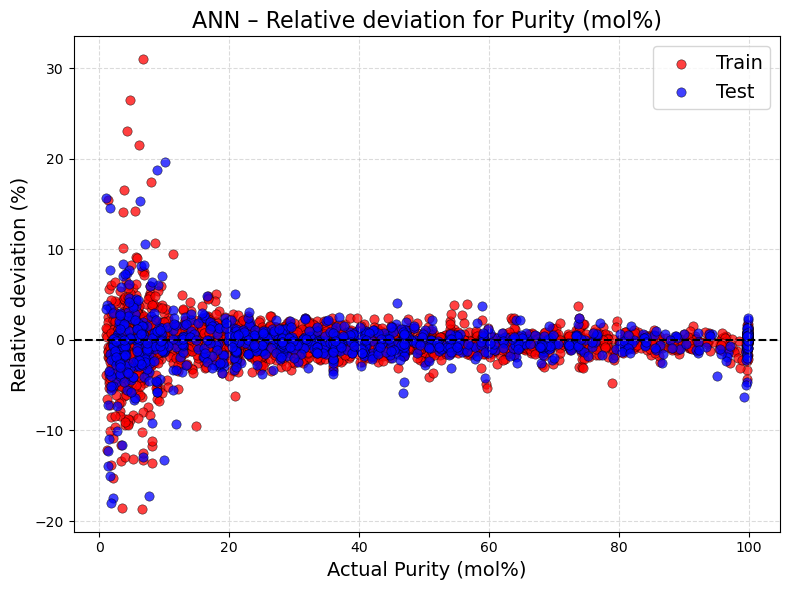

In [ ]:
import numpy as np
import matplotlib.pyplot as plt

# ===== Prepare true and predicted values =====
y_true_train_rec = np.asarray(df_label1).ravel()
y_true_train_sec = np.asarray(df_label2).ravel()
y_true_train_pur = np.asarray(df_label3).ravel()

y_true_test_rec = np.asarray(ts_label1).ravel()
y_true_test_sec = np.asarray(ts_label2).ravel()
y_true_test_pur = np.asarray(ts_label3).ravel()

y_pred_train_rec = y_pred_train_ann1
y_pred_train_sec = y_pred_train_ann2
y_pred_train_pur = y_pred_train_ann3

y_pred_test_rec = y_pred_test_ann1
y_pred_test_sec = y_pred_test_ann2
y_pred_test_pur = y_pred_test_ann3

eps = 1e-8


####### Recovery ##########
plt.figure(figsize=(8, 6))

# Train
rel_train = (y_pred_train_rec - y_true_train_rec) / (y_true_train_rec + eps) * 100
plt.scatter(y_true_train_rec, rel_train,
            s=45, alpha=0.75, color='red',
            edgecolor='black', linewidth=0.4, label='Train')

# Test
rel_test = (y_pred_test_rec - y_true_test_rec) / (y_true_test_rec + eps) * 100
plt.scatter(y_true_test_rec, rel_test,
            s=45, alpha=0.75, color='blue',
            edgecolor='black', linewidth=0.4, label='Test')

plt.axhline(0, color='black', linestyle='--')
plt.xlabel("Actual Recovery (%)", fontsize=14)
plt.ylabel("Relative deviation (%)", fontsize=14)
plt.title("ANN – Relative deviation for Recovery (%)", fontsize=16)
plt.legend(fontsize=14)
plt.grid(True, linestyle='--', alpha=0.45)

plt.tight_layout()
plt.savefig("Figures/rel_dev_recovery.png", dpi=600, bbox_inches="tight")
plt.show()

####### SEC ##########
plt.figure(figsize=(8, 6))

rel_train = (y_pred_train_sec - y_true_train_sec) / (y_true_train_sec + eps) * 100
plt.scatter(y_true_train_sec, rel_train,
            s=45, alpha=0.75, color='red',
            edgecolor='black', linewidth=0.4, label='Train')

rel_test = (y_pred_test_sec - y_true_test_sec) / (y_true_test_sec + eps) * 100
plt.scatter(y_true_test_sec, rel_test,
            s=45, alpha=0.75, color='blue',
            edgecolor='black', linewidth=0.4, label='Test')

plt.axhline(0, color='black', linestyle='--')
plt.xlabel("Actual SEC (kJ/kg)", fontsize=14)
plt.ylabel("Relative deviation (%)", fontsize=14)
plt.title("ANN – Relative deviation for SEC (kJ/kg)", fontsize=16)
plt.legend(fontsize=14)
plt.grid(True, linestyle='--', alpha=0.45)

plt.tight_layout()
plt.savefig("Figures/rel_dev_sec.png", dpi=600, bbox_inches="tight")
plt.show()

####### Purity ###########
plt.figure(figsize=(8, 6))

rel_train = (y_pred_train_pur - y_true_train_pur) / (y_true_train_pur + eps) * 100
plt.scatter(y_true_train_pur, rel_train,
            s=45, alpha=0.75, color='red',
            edgecolor='black', linewidth=0.4, label='Train')

rel_test = (y_pred_test_pur - y_true_test_pur) / (y_true_test_pur + eps) * 100
plt.scatter(y_true_test_pur, rel_test,
            s=45, alpha=0.75, color='blue',
            edgecolor='black', linewidth=0.4, label='Test')

plt.axhline(0, color='black', linestyle='--')
plt.xlabel("Actual Purity (mol%)", fontsize=14)
plt.ylabel("Relative deviation (%)", fontsize=14)
plt.title("ANN – Relative deviation for Purity (mol%)", fontsize=16)
plt.legend(fontsize=14)
plt.grid(True, linestyle='--', alpha=0.45)

plt.tight_layout()
plt.savefig("Figures/rel_dev_purity.png", dpi=600, bbox_inches="tight")
plt.show()


In [ ]:
import pandas as pd

# --- True values mapping ---
true_values = {
    1: (df_label1, ts_label1),
    2: (df_label2, ts_label2),
    3: (df_label3, ts_label3)
}

models = ["ann", "tab", "xg", "gbr", "cb", "adb"]
metric_names = ["R²", "Adj-R²", "MSE", "RMSE", "NRMSE", "std_er","MAE", "MAPE", "MedAE", "EVS"]

results = []

# --- Loop through each model and target ---
for model in models:
    for target in [1, 2, 3]:
        y_train_true, y_test_true = true_values[target]
        y_pred_train_var = f"y_pred_train_{model}{target}"
        y_pred_test_var  = f"y_pred_test_{model}{target}"

        # Skip missing variables
        if y_pred_test_var not in globals():
            print(f"⚠️ Skipping {y_pred_test_var} (not found)")
            continue

        y_pred_train = globals()[y_pred_train_var]
        y_pred_test  = globals()[y_pred_test_var]

        # Evaluate
        train_metrics = evaluate(y_train_true, y_pred_train, label="Train")
        test_metrics  = evaluate(y_test_true,  y_pred_test,  label="Test")

        # Combine metrics side-by-side (Train_Test pairs)
        combined_metrics = {"Model": model.upper(), "Target": {1:"Recovery",2:"SEC",3:"Purity"}[target]}
        for i, metric in enumerate(metric_names):
            combined_metrics[f"{metric}_Train"] = train_metrics[i]
            combined_metrics[f"{metric}_Test"]  = test_metrics[i]

        results.append(combined_metrics)

# --- Create final DataFrame ---
metrics_table = pd.DataFrame(results)

# --- Display neatly ---
pd.set_option("display.max_columns", None)
pd.set_option("display.width", 200)
display(metrics_table)

# --- Save to Excel ---
metrics_table.to_excel("All_Model_Metrics.xlsx", index=False)
print("✅ Saved metrics table with Train/Test pairs to 'All_Model_Metrics.xlsx'")



--- Train set metrics ---
R²     : 0.9997
Adj-R² : 0.9997
MSE    : 0.278377
RMSE   : 0.527615
NRMSE  : 0.005419
std_er : 0.483651
MAE    : 0.350640
MAPE   : 0.008020
MedAE  : 0.243657
EVS    : 0.999740

--- Test set metrics ---
R²     : 0.9996
Adj-R² : 0.9996
MSE    : 0.374819
RMSE   : 0.612225
NRMSE  : 0.006259
std_er : 0.574524
MAE    : 0.423901
MAPE   : 0.010977
MedAE  : 0.309529
EVS    : 0.999641

--- Train set metrics ---
R²     : 0.9997
Adj-R² : 0.9997
MSE    : 2549868.923165
RMSE   : 1596.830900
NRMSE  : 0.002289
std_er : 1596.528843
MAE    : 747.015736
MAPE   : 0.014223
MedAE  : 360.873622
EVS    : 0.999689

--- Test set metrics ---
R²     : 0.9994
Adj-R² : 0.9994
MSE    : 6393025.392045
RMSE   : 2528.443274
NRMSE  : 0.003627
std_er : 2525.986798
MAE    : 1108.228143
MAPE   : 0.017525
MedAE  : 464.499603
EVS    : 0.999377

--- Train set metrics ---
R²     : 0.9998
Adj-R² : 0.9998
MSE    : 0.191520
RMSE   : 0.437630
NRMSE  : 0.004427
std_er : 0.428837
MAE    : 0.279446
MAPE   :

,Model,Target,R²_Train,R²_Test,Adj-R²_Train,Adj-R²_Test,MSE_Train,MSE_Test,RMSE_Train,RMSE_Test,NRMSE_Train,NRMSE_Test,std_er_Train,std_er_Test,MAE_Train,MAE_Test,MAPE_Train,MAPE_Test,MedAE_Train,MedAE_Test,EVS_Train,EVS_Test
0,ANN,Recovery,0.999691,0.999593,0.999690,0.999589,2.783774e-01,3.748194e-01,0.527615,0.612225,0.005419,0.006259,0.483651,0.574524,0.350640,0.423901,0.008020,0.010977,0.243657,0.309529,0.999740,0.999641
1,ANN,SEC,0.999689,0.999376,0.999688,0.999369,2.549869e+06,6.393025e+06,1596.830900,2528.443274,0.002289,0.003627,1596.528843,2525.986798,747.015736,1108.228143,0.014223,0.017525,360.873622,464.499603,0.999689,0.999377
2,ANN,Purity,0.999763,0.999515,0.999762,0.999510,1.915200e-01,4.010256e-01,0.437630,0.633266,0.004427,0.006406,0.428837,0.620906,0.279446,0.378784,0.011360,0.015946,0.172388,0.250436,0.999773,0.999534
3,TAB,Recovery,0.999990,0.999925,0.999990,0.999925,8.721020e-03,6.877433e-02,0.093386,0.262249,0.000959,0.002681,0.091958,0.261600,0.064010,0.119930,0.001806,0.003546,0.045950,0.063836,0.999991,0.999926
4,TAB,SEC,0.989353,0.985072,0.989326,0.984919,8.728272e+07,1.529038e+08,9342.522141,12365.427497,0.013394,0.017738,9297.871838,12284.216710,1123.643045,1825.269185,0.005050,0.008290,88.358231,116.044608,0.989454,0.985268
5,TAB,Purity,0.999960,0.999881,0.999960,0.999880,3.201558e-02,9.808244e-02,0.178929,0.313181,0.001810,0.003168,0.178456,0.312948,0.089066,0.145152,0.002913,0.004911,0.041762,0.055305,0.999961,0.999882
6,XG,Recovery,0.999781,0.998457,0.999780,0.998441,1.973458e-01,1.420500e+00,0.444236,1.191847,0.004562,0.012185,0.444234,1.191555,0.329855,0.786271,0.009734,0.026797,0.242930,0.451352,0.999781,0.998458
7,XG,SEC,0.999772,0.997732,0.999772,0.997709,1.867812e+06,2.323204e+07,1366.679202,4819.962869,0.001959,0.006914,1366.679028,4816.910896,893.354907,1805.169850,0.020354,0.027851,582.934208,829.270331,0.999772,0.997735
8,XG,Purity,0.999704,0.995978,0.999704,0.995937,2.389107e-01,3.327333e+00,0.488785,1.824098,0.004944,0.018453,0.488785,1.823818,0.340329,1.006048,0.017784,0.044335,0.231451,0.482680,0.999704,0.995979
9,GBR,Recovery,0.999533,0.998456,0.999532,0.998440,4.202843e-01,1.421784e+00,0.648293,1.192386,0.006658,0.012190,0.648288,1.192232,0.455219,0.790063,0.011968,0.021987,0.320892,0.475341,0.999533,0.998456


✅ Saved metrics table with Train/Test pairs to 'All_Model_Metrics.xlsx'


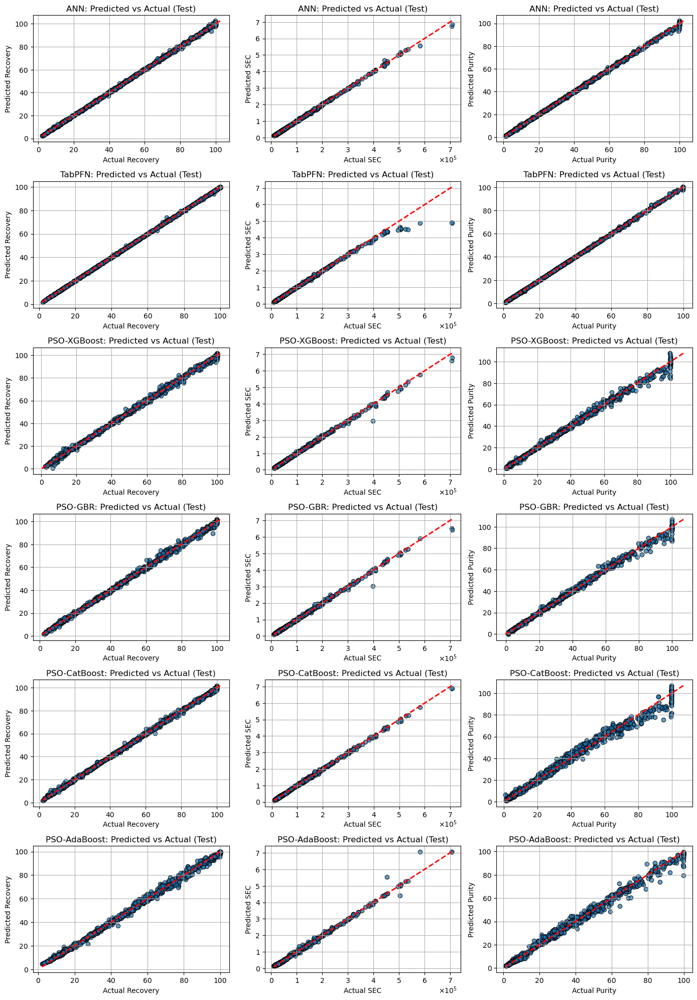

✅ Saved as All_Model_Scatter.svg


In [ ]:
import numpy as np
import matplotlib.pyplot as plt
from matplotlib.ticker import FuncFormatter

# Explicit mapping for true values (no globals lookups)
true_values = {
    1: np.asarray(ts_label1, dtype=float),
    2: np.asarray(ts_label2, dtype=float),
    3: np.asarray(ts_label3, dtype=float),
}

models = [
    ("ann", "ANN"),
    ("tab", "TabPFN"),
    ("xg",  "PSO-XGBoost"),
    ("gbr", "PSO-GBR"),
    ("cb", "PSO-CatBoost"),
    ("adb", "PSO-AdaBoost")
]
target_names = {1: "Recovery", 2: "SEC", 3: "Purity"}

fig, axes = plt.subplots(nrows=6, ncols=3, figsize=(14, 20))
for r, (mkey, mname) in enumerate(models):
    for c, t in enumerate([1, 2, 3]):
        ax = axes[r, c]
        y_true = true_values[t]
        # predictions still fetched by name:
        y_pred = np.asarray(globals()[f"y_pred_test_{mkey}{t}"], dtype=float)

        mask = ~np.isnan(y_true) & ~np.isnan(y_pred)
        yt, yp = y_true[mask], y_pred[mask]

        ax.scatter(yt, yp, alpha=0.7, edgecolor="k")
        mn, mx = float(min(yt.min(), yp.min())), float(max(yt.max(), yp.max()))
        ax.plot([mn, mx], [mn, mx], "r--", linewidth=2)

        tname = target_names[t]
        ax.set_xlabel(f"Actual {tname}")
        ax.set_ylabel(f"Predicted {tname}")
        ax.set_title(f"{mname}: Predicted vs Actual (Test)")
        ax.grid(True)

        # Format SEC axes as ×10^5
        if t == 2:
            ax.xaxis.set_major_formatter(FuncFormatter(lambda x, _: f"{x/1e5:.0f}"))
            ax.yaxis.set_major_formatter(FuncFormatter(lambda y, _: f"{y/1e5:.0f}"))
            ax.text(0.98, -0.14, r"$\times10^{5}$",
                    transform=ax.transAxes, ha="right", va="center", fontsize=10)

plt.tight_layout()
plt.savefig("All_Model_Scatter.svg", format="svg", dpi=300)
plt.show()
print("✅ Saved as All_Model_Scatter.svg")


## Five repeated 5-fold cross-validation

In [ ]:
!pip install tensorflow.keras

In [ ]:
x_train = df.copy()
x_test = ts.copy()
# Recovery
y_train1 = df_label1.copy()
y_test1 = ts_label1.copy()
# SEC
y_train2 = df_label2.copy()
y_test2 = ts_label2.copy()
# Purity
y_train3 = df_label3.copy()
y_test3 = ts_label3.copy()
# Total Set
x_total = pd.concat([x_train, x_test], axis=0)
y_total1 = pd.concat([y_train1, y_test1], axis=0)
y_total2 = pd.concat([y_train2, y_test2], axis=0)
y_total3 = pd.concat([y_train3, y_test3], axis=0)

### Recovery

In [ ]:
import numpy as np
from sklearn.model_selection import KFold
from sklearn.metrics import r2_score, mean_squared_error, mean_absolute_error
from tensorflow.keras.models import Sequential
from tensorflow.keras.layers import Dense
from tensorflow.keras.optimizers import Adam

X = x_total.values
y = y_total1.values  # Recovery

def create_model(input_dim):
    model = Sequential()
    model.add(Dense(32, activation='relu', input_dim=input_dim))
    model.add(Dense(72, activation='relu'))
    model.add(Dense(32, activation='relu'))
    model.add(Dense(1, activation='linear'))
    model.compile(optimizer=Adam(learning_rate=0.01), loss='mse')
    return model

# Repeated 5-fold CV
n_repeats = 5
n_splits = 5

# overall lists (all repeats × folds)
all_r2, all_rmse, all_mae = [], [], []

for repeat in range(n_repeats):
    kf = KFold(n_splits=n_splits, shuffle=True, random_state=42 + repeat)

    # per-repeat lists (5 folds only)
    rep_r2, rep_rmse, rep_mae = [], [], []

    for fold, (train_index, val_index) in enumerate(kf.split(X), 1):
        X_train, X_val = X[train_index], X[val_index]
        y_train, y_val = y[train_index], y[val_index]

        model = create_model(input_dim=X.shape[1])
        model.fit(X_train, y_train, epochs=100, batch_size=32, verbose=0)

        y_pred = model.predict(X_val, verbose=0).flatten()

        r2 = r2_score(y_val, y_pred)
        rmse = np.sqrt(mean_squared_error(y_val, y_pred))
        mae = mean_absolute_error(y_val, y_pred)

        #per-repeat
        rep_r2.append(r2)
        rep_rmse.append(rmse)
        rep_mae.append(mae)

        # overall
        all_r2.append(r2)
        all_rmse.append(rmse)
        all_mae.append(mae)

    # print metrics for this repeat
    print(f"Repeat {repeat+1}/{n_repeats} (5-fold CV):")
    print(f"  R²:   {np.mean(rep_r2):.4f} ± {np.std(rep_r2):.4f}")
    print(f"  RMSE: {np.mean(rep_rmse):.4f} ± {np.std(rep_rmse):.4f}")
    print(f"  MAE:  {np.mean(rep_mae):.4f} ± {np.std(rep_mae):.4f}")

# Final results across all repeats and folds
print("\nOverall (all repeats × folds):")
print(f"R²:   {np.mean(all_r2):.4f} ± {np.std(all_r2):.4f}")
print(f"RMSE: {np.mean(all_rmse):.4f} ± {np.std(all_rmse):.4f}")
print(f"MAE:  {np.mean(all_mae):.4f} ± {np.std(all_mae):.4f}")

### SEC

In [ ]:
import numpy as np
from sklearn.model_selection import KFold
from sklearn.metrics import r2_score, mean_squared_error, mean_absolute_error
from tensorflow.keras.models import Sequential
from tensorflow.keras.layers import Dense
from tensorflow.keras.optimizers import Adam

X = x_total.values
y = y_total2.values  # SEC

def create_model(input_dim):
    model = Sequential()
    model.add(Dense(120, activation='relu', input_dim=input_dim))
    model.add(Dense(128, activation='relu'))
    model.add(Dense(1, activation='linear'))
    model.compile(optimizer=Adam(learning_rate=0.1), loss='mse')
    return model

# Repeated 5-fold CV
n_repeats = 5
n_splits = 5

# overall lists (all repeats × folds)
all_r2, all_rmse, all_mae = [], [], []

for repeat in range(n_repeats):
    kf = KFold(n_splits=n_splits, shuffle=True, random_state=42 + repeat)

    # per-repeat lists (5 folds only)
    rep_r2, rep_rmse, rep_mae = [], [], []

    for fold, (train_index, val_index) in enumerate(kf.split(X), 1):
        X_train, X_val = X[train_index], X[val_index]
        y_train, y_val = y[train_index], y[val_index]

        model = create_model(input_dim=X.shape[1])
        model.fit(X_train, y_train, epochs=100, batch_size=32, verbose=0)

        y_pred = model.predict(X_val, verbose=0).flatten()

        r2 = r2_score(y_val, y_pred)
        rmse = np.sqrt(mean_squared_error(y_val, y_pred))
        mae = mean_absolute_error(y_val, y_pred)

        #per-repeat
        rep_r2.append(r2)
        rep_rmse.append(rmse)
        rep_mae.append(mae)

        # overall
        all_r2.append(r2)
        all_rmse.append(rmse)
        all_mae.append(mae)

    # print metrics for this repeat
    print(f"Repeat {repeat+1}/{n_repeats} (5-fold CV):")
    print(f"  R²:   {np.mean(rep_r2):.4f} ± {np.std(rep_r2):.4f}")
    print(f"  RMSE: {np.mean(rep_rmse):.4f} ± {np.std(rep_rmse):.4f}")
    print(f"  MAE:  {np.mean(rep_mae):.4f} ± {np.std(rep_mae):.4f}")

# Final results across all repeats and folds
print("\nOverall (all repeats × folds):")
print(f"R²:   {np.mean(all_r2):.4f} ± {np.std(all_r2):.4f}")
print(f"RMSE: {np.mean(all_rmse):.4f} ± {np.std(all_rmse):.4f}")
print(f"MAE:  {np.mean(all_mae):.4f} ± {np.std(all_mae):.4f}")


### Purity

In [ ]:
import numpy as np
from sklearn.model_selection import KFold
from sklearn.metrics import r2_score, mean_squared_error, mean_absolute_error
from tensorflow.keras.models import Sequential
from tensorflow.keras.layers import Dense
from tensorflow.keras.optimizers import Adam

X = x_total.values
y = y_total3.values  # purity

def create_model(input_dim):
    model = Sequential()
    model.add(Dense(32, activation='relu', input_dim=input_dim))
    model.add(Dense(72, activation='relu'))
    model.add(Dense(32, activation='relu'))
    model.add(Dense(1, activation='linear'))
    model.compile(optimizer=Adam(learning_rate=0.01), loss='mse')
    return model
# Repeated 5-fold CV
n_repeats = 5
n_splits = 5

# overall lists (all repeats × folds)
all_r2, all_rmse, all_mae = [], [], []

for repeat in range(n_repeats):
    kf = KFold(n_splits=n_splits, shuffle=True, random_state=42 + repeat)

    # per-repeat lists (5 folds only)
    rep_r2, rep_rmse, rep_mae = [], [], []

    for fold, (train_index, val_index) in enumerate(kf.split(X), 1):
        X_train, X_val = X[train_index], X[val_index]
        y_train, y_val = y[train_index], y[val_index]

        model = create_model(input_dim=X.shape[1])
        model.fit(X_train, y_train, epochs=100, batch_size=32, verbose=0)

        y_pred = model.predict(X_val, verbose=0).flatten()

        r2 = r2_score(y_val, y_pred)
        rmse = np.sqrt(mean_squared_error(y_val, y_pred))
        mae = mean_absolute_error(y_val, y_pred)

        #per-repeat
        rep_r2.append(r2)
        rep_rmse.append(rmse)
        rep_mae.append(mae)

        # overall
        all_r2.append(r2)
        all_rmse.append(rmse)
        all_mae.append(mae)

    # print metrics for this repeat
    print(f"Repeat {repeat+1}/{n_repeats} (5-fold CV):")
    print(f"  R²:   {np.mean(rep_r2):.4f} ± {np.std(rep_r2):.4f}")
    print(f"  RMSE: {np.mean(rep_rmse):.4f} ± {np.std(rep_rmse):.4f}")
    print(f"  MAE:  {np.mean(rep_mae):.4f} ± {np.std(rep_mae):.4f}")

# Final results across all repeats and folds
print("\nOverall (all repeats and folds):")
print(f"R²:   {np.mean(all_r2):.4f} ± {np.std(all_r2):.4f}")
print(f"RMSE: {np.mean(all_rmse):.4f} ± {np.std(all_rmse):.4f}")
print(f"MAE:  {np.mean(all_mae):.4f} ± {np.std(all_mae):.4f}")

## Shap

### Recovery

In [ ]:
!pip install shap

In [ ]:
!pip install keras

In [ ]:
import shap
from shap import summary_plot

# Model
# Recovery
from tensorflow import keras
from tensorflow.keras import layers

X_train = df
y_train1 = df_label1
X_test = ts
n_features = X_train.shape[1]
# Best model
ann_model1 = keras.Sequential([
    layers.Input(shape=(n_features,)),
    layers.Dense(32, activation='relu'),
    layers.Dense(72, activation='relu'),
    layers.Dense(32, activation='relu'),
    layers.Dense(1)                       # single output
])

# Compile
ann_model1.compile(optimizer=keras.optimizers.Adam(learning_rate=0.01),
                   loss='mean_absolute_error')
# fit/predict/evaluate
ann_model1.fit(X_train, y_train1, epochs=100, batch_size=32, verbose=0)


feature_names = list(df.columns[:-1])
explainer = shap.Explainer(ann_model1.predict, X_train, feature_names = feature_names)
shap_values = explainer(X_test)

696/696 ━━━━━━━━━━━━━━━━━━━━ 1s 2ms/step
1578/1578 ━━━━━━━━━━━━━━━━━━━━ 3s 2ms/step
32/32 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step 


ExactExplainer explainer:   0%|          | 2/886 [00:00<?, ?it/s]

1526/1526 ━━━━━━━━━━━━━━━━━━━━ 2s 1ms/step
32/32 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step 


ExactExplainer explainer:   0%|          | 4/886 [00:15<23:32,  1.60s/it]

704/704 ━━━━━━━━━━━━━━━━━━━━ 1s 2ms/step
29/29 ━━━━━━━━━━━━━━━━━━━━ 0s 11ms/step


ExactExplainer explainer:   1%|          | 5/886 [00:17<25:42,  1.75s/it]

714/714 ━━━━━━━━━━━━━━━━━━━━ 1s 2ms/step
29/29 ━━━━━━━━━━━━━━━━━━━━ 0s 11ms/step


ExactExplainer explainer:   1%|          | 6/886 [00:19<26:56,  1.84s/it]

712/712 ━━━━━━━━━━━━━━━━━━━━ 1s 1ms/step
29/29 ━━━━━━━━━━━━━━━━━━━━ 0s 12ms/step


ExactExplainer explainer:   1%|          | 7/886 [00:21<27:47,  1.90s/it]

1576/1576 ━━━━━━━━━━━━━━━━━━━━ 2s 1ms/step
32/32 ━━━━━━━━━━━━━━━━━━━━ 0s 10ms/step


ExactExplainer explainer:   1%|          | 8/886 [00:25<36:22,  2.49s/it]

696/696 ━━━━━━━━━━━━━━━━━━━━ 1s 1ms/step
29/29 ━━━━━━━━━━━━━━━━━━━━ 0s 11ms/step


ExactExplainer explainer:   1%|          | 9/886 [00:26<32:07,  2.20s/it]

695/695 ━━━━━━━━━━━━━━━━━━━━ 1s 1ms/step
29/29 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step 


ExactExplainer explainer:   1%|          | 10/886 [00:28<28:29,  1.95s/it]

694/694 ━━━━━━━━━━━━━━━━━━━━ 1s 2ms/step
29/29 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step 


ExactExplainer explainer:   1%|          | 11/886 [00:30<27:17,  1.87s/it]

703/703 ━━━━━━━━━━━━━━━━━━━━ 1s 2ms/step
29/29 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step 


ExactExplainer explainer:   1%|▏         | 12/886 [00:31<26:33,  1.82s/it]

712/712 ━━━━━━━━━━━━━━━━━━━━ 1s 1ms/step
29/29 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step 


ExactExplainer explainer:   1%|▏         | 13/886 [00:33<24:39,  1.70s/it]

693/693 ━━━━━━━━━━━━━━━━━━━━ 2s 2ms/step
29/29 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step 


ExactExplainer explainer:   2%|▏         | 14/886 [00:35<27:02,  1.86s/it]

696/696 ━━━━━━━━━━━━━━━━━━━━ 1s 1ms/step
29/29 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step 


ExactExplainer explainer:   2%|▏         | 15/886 [00:36<24:32,  1.69s/it]

691/691 ━━━━━━━━━━━━━━━━━━━━ 1s 1ms/step
29/29 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step 


ExactExplainer explainer:   2%|▏         | 16/886 [00:38<23:20,  1.61s/it]

696/696 ━━━━━━━━━━━━━━━━━━━━ 1s 1ms/step
29/29 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step 


ExactExplainer explainer:   2%|▏         | 17/886 [00:39<22:09,  1.53s/it]

692/692 ━━━━━━━━━━━━━━━━━━━━ 1s 1ms/step
29/29 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step 


ExactExplainer explainer:   2%|▏         | 18/886 [00:40<21:35,  1.49s/it]

690/690 ━━━━━━━━━━━━━━━━━━━━ 1s 2ms/step
29/29 ━━━━━━━━━━━━━━━━━━━━ 0s 10ms/step


ExactExplainer explainer:   2%|▏         | 19/886 [00:42<23:32,  1.63s/it]

704/704 ━━━━━━━━━━━━━━━━━━━━ 1s 2ms/step
29/29 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step 


ExactExplainer explainer:   2%|▏         | 20/886 [00:44<23:18,  1.61s/it]

694/694 ━━━━━━━━━━━━━━━━━━━━ 1s 1ms/step
29/29 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step 


ExactExplainer explainer:   2%|▏         | 21/886 [00:45<23:10,  1.61s/it]

1555/1555 ━━━━━━━━━━━━━━━━━━━━ 2s 1ms/step
32/32 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step 


ExactExplainer explainer:   2%|▏         | 22/886 [00:49<30:29,  2.12s/it]

696/696 ━━━━━━━━━━━━━━━━━━━━ 1s 1ms/step
29/29 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step 


ExactExplainer explainer:   3%|▎         | 23/886 [00:50<27:02,  1.88s/it]

694/694 ━━━━━━━━━━━━━━━━━━━━ 1s 1ms/step
29/29 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step 


ExactExplainer explainer:   3%|▎         | 24/886 [00:51<24:33,  1.71s/it]

700/700 ━━━━━━━━━━━━━━━━━━━━ 1s 1ms/step
29/29 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step 


ExactExplainer explainer:   3%|▎         | 25/886 [00:53<23:58,  1.67s/it]

702/702 ━━━━━━━━━━━━━━━━━━━━ 1s 1ms/step
29/29 ━━━━━━━━━━━━━━━━━━━━ 0s 11ms/step


ExactExplainer explainer:   3%|▎         | 26/886 [00:55<24:13,  1.69s/it]

703/703 ━━━━━━━━━━━━━━━━━━━━ 1s 1ms/step
29/29 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step 


ExactExplainer explainer:   3%|▎         | 27/886 [00:56<22:54,  1.60s/it]

1546/1546 ━━━━━━━━━━━━━━━━━━━━ 3s 2ms/step
32/32 ━━━━━━━━━━━━━━━━━━━━ 0s 10ms/step


ExactExplainer explainer:   3%|▎         | 28/886 [01:00<32:14,  2.25s/it]

700/700 ━━━━━━━━━━━━━━━━━━━━ 1s 1ms/step
29/29 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step 


ExactExplainer explainer:   3%|▎         | 29/886 [01:01<28:08,  1.97s/it]

693/693 ━━━━━━━━━━━━━━━━━━━━ 1s 1ms/step
29/29 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step 


ExactExplainer explainer:   3%|▎         | 30/886 [01:03<25:18,  1.77s/it]

1554/1554 ━━━━━━━━━━━━━━━━━━━━ 2s 1ms/step
32/32 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step 


ExactExplainer explainer:   3%|▎         | 31/886 [01:05<30:12,  2.12s/it]

693/693 ━━━━━━━━━━━━━━━━━━━━ 1s 1ms/step
29/29 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step 


ExactExplainer explainer:   4%|▎         | 32/886 [01:07<26:48,  1.88s/it]

693/693 ━━━━━━━━━━━━━━━━━━━━ 1s 1ms/step
29/29 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step 


ExactExplainer explainer:   4%|▎         | 33/886 [01:08<24:15,  1.71s/it]

692/692 ━━━━━━━━━━━━━━━━━━━━ 1s 2ms/step
29/29 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step


ExactExplainer explainer:   4%|▍         | 34/886 [01:10<24:20,  1.71s/it]

1558/1558 ━━━━━━━━━━━━━━━━━━━━ 2s 1ms/step
32/32 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step 


ExactExplainer explainer:   4%|▍         | 35/886 [01:13<30:13,  2.13s/it]

695/695 ━━━━━━━━━━━━━━━━━━━━ 1s 1ms/step
29/29 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step 


ExactExplainer explainer:   4%|▍         | 36/886 [01:14<26:40,  1.88s/it]

694/694 ━━━━━━━━━━━━━━━━━━━━ 1s 1ms/step
29/29 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step 


ExactExplainer explainer:   4%|▍         | 37/886 [01:16<24:13,  1.71s/it]

700/700 ━━━━━━━━━━━━━━━━━━━━ 1s 1ms/step
29/29 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step 


ExactExplainer explainer:   4%|▍         | 38/886 [01:17<23:03,  1.63s/it]

1547/1547 ━━━━━━━━━━━━━━━━━━━━ 2s 1ms/step
32/32 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step 


ExactExplainer explainer:   4%|▍         | 39/886 [01:20<28:29,  2.02s/it]

695/695 ━━━━━━━━━━━━━━━━━━━━ 1s 2ms/step
29/29 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step 


ExactExplainer explainer:   5%|▍         | 40/886 [01:23<31:25,  2.23s/it]

696/696 ━━━━━━━━━━━━━━━━━━━━ 1s 1ms/step
29/29 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step 


ExactExplainer explainer:   5%|▍         | 41/886 [01:24<27:29,  1.95s/it]

694/694 ━━━━━━━━━━━━━━━━━━━━ 1s 1ms/step
29/29 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step 


ExactExplainer explainer:   5%|▍         | 42/886 [01:25<24:48,  1.76s/it]

1549/1549 ━━━━━━━━━━━━━━━━━━━━ 2s 1ms/step
32/32 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step 


ExactExplainer explainer:   5%|▍         | 43/886 [01:28<29:46,  2.12s/it]

1561/1561 ━━━━━━━━━━━━━━━━━━━━ 2s 1ms/step
32/32 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step 


ExactExplainer explainer:   5%|▍         | 44/886 [01:31<34:43,  2.47s/it]

691/691 ━━━━━━━━━━━━━━━━━━━━ 1s 2ms/step
29/29 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step 


ExactExplainer explainer:   5%|▌         | 45/886 [01:34<35:41,  2.55s/it]

695/695 ━━━━━━━━━━━━━━━━━━━━ 1s 1ms/step
29/29 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step 


ExactExplainer explainer:   5%|▌         | 46/886 [01:36<30:27,  2.18s/it]

694/694 ━━━━━━━━━━━━━━━━━━━━ 1s 1ms/step
29/29 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step 


ExactExplainer explainer:   5%|▌         | 47/886 [01:37<26:56,  1.93s/it]

695/695 ━━━━━━━━━━━━━━━━━━━━ 1s 1ms/step
29/29 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step 


ExactExplainer explainer:   5%|▌         | 48/886 [01:38<24:20,  1.74s/it]

1526/1526 ━━━━━━━━━━━━━━━━━━━━ 2s 1ms/step
32/32 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step 


ExactExplainer explainer:   6%|▌         | 49/886 [01:41<28:18,  2.03s/it]

1569/1569 ━━━━━━━━━━━━━━━━━━━━ 2s 1ms/step
32/32 ━━━━━━━━━━━━━━━━━━━━ 0s 13ms/step


ExactExplainer explainer:   6%|▌         | 50/886 [01:44<34:13,  2.46s/it]

692/692 ━━━━━━━━━━━━━━━━━━━━ 1s 2ms/step
29/29 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step 


ExactExplainer explainer:   6%|▌         | 51/886 [01:46<30:46,  2.21s/it]

712/712 ━━━━━━━━━━━━━━━━━━━━ 1s 1ms/step
29/29 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step 


ExactExplainer explainer:   6%|▌         | 52/886 [01:47<27:15,  1.96s/it]

690/690 ━━━━━━━━━━━━━━━━━━━━ 1s 1ms/step
29/29 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step 


ExactExplainer explainer:   6%|▌         | 53/886 [01:49<24:25,  1.76s/it]

1562/1562 ━━━━━━━━━━━━━━━━━━━━ 2s 1ms/step
32/32 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step 


ExactExplainer explainer:   6%|▌         | 54/886 [01:52<29:13,  2.11s/it]

696/696 ━━━━━━━━━━━━━━━━━━━━ 1s 1ms/step
29/29 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step 


ExactExplainer explainer:   6%|▌         | 55/886 [01:53<26:02,  1.88s/it]

696/696 ━━━━━━━━━━━━━━━━━━━━ 1s 1ms/step
29/29 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step 


ExactExplainer explainer:   6%|▋         | 56/886 [01:54<23:41,  1.71s/it]

703/703 ━━━━━━━━━━━━━━━━━━━━ 1s 1ms/step
29/29 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step 


ExactExplainer explainer:   6%|▋         | 57/886 [01:56<22:19,  1.62s/it]

1561/1561 ━━━━━━━━━━━━━━━━━━━━ 3s 2ms/step
32/32 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step 


ExactExplainer explainer:   7%|▋         | 58/886 [01:59<29:09,  2.11s/it]

692/692 ━━━━━━━━━━━━━━━━━━━━ 1s 1ms/step
29/29 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step 


ExactExplainer explainer:   7%|▋         | 59/886 [02:00<25:50,  1.87s/it]

700/700 ━━━━━━━━━━━━━━━━━━━━ 1s 1ms/step
29/29 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step 


ExactExplainer explainer:   7%|▋         | 60/886 [02:02<23:31,  1.71s/it]

692/692 ━━━━━━━━━━━━━━━━━━━━ 1s 1ms/step
29/29 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step 


ExactExplainer explainer:   7%|▋         | 61/886 [02:03<21:54,  1.59s/it]

697/697 ━━━━━━━━━━━━━━━━━━━━ 1s 1ms/step
29/29 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step 


ExactExplainer explainer:   7%|▋         | 62/886 [02:04<21:09,  1.54s/it]

701/701 ━━━━━━━━━━━━━━━━━━━━ 1s 1ms/step
29/29 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step 


ExactExplainer explainer:   7%|▋         | 63/886 [02:06<20:42,  1.51s/it]

695/695 ━━━━━━━━━━━━━━━━━━━━ 1s 1ms/step
29/29 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step 


ExactExplainer explainer:   7%|▋         | 64/886 [02:07<19:51,  1.45s/it]

713/713 ━━━━━━━━━━━━━━━━━━━━ 1s 2ms/step
29/29 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step 


ExactExplainer explainer:   7%|▋         | 65/886 [02:09<21:36,  1.58s/it]

712/712 ━━━━━━━━━━━━━━━━━━━━ 1s 1ms/step
29/29 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step 


ExactExplainer explainer:   7%|▋         | 66/886 [02:10<21:11,  1.55s/it]

705/705 ━━━━━━━━━━━━━━━━━━━━ 1s 1ms/step
29/29 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step 


ExactExplainer explainer:   8%|▊         | 67/886 [02:12<21:05,  1.54s/it]

701/701 ━━━━━━━━━━━━━━━━━━━━ 1s 1ms/step
29/29 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step 


ExactExplainer explainer:   8%|▊         | 68/886 [02:13<20:11,  1.48s/it]

695/695 ━━━━━━━━━━━━━━━━━━━━ 1s 1ms/step
29/29 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step 


ExactExplainer explainer:   8%|▊         | 69/886 [02:15<19:33,  1.44s/it]

702/702 ━━━━━━━━━━━━━━━━━━━━ 1s 1ms/step
29/29 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step 


ExactExplainer explainer:   8%|▊         | 70/886 [02:16<19:04,  1.40s/it]

695/695 ━━━━━━━━━━━━━━━━━━━━ 1s 1ms/step
29/29 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step 


ExactExplainer explainer:   8%|▊         | 71/886 [02:17<19:09,  1.41s/it]

704/704 ━━━━━━━━━━━━━━━━━━━━ 1s 1ms/step
29/29 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step 


ExactExplainer explainer:   8%|▊         | 72/886 [02:19<18:46,  1.38s/it]

701/701 ━━━━━━━━━━━━━━━━━━━━ 1s 1ms/step
29/29 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step


ExactExplainer explainer:   8%|▊         | 73/886 [02:20<19:54,  1.47s/it]

691/691 ━━━━━━━━━━━━━━━━━━━━ 1s 2ms/step
29/29 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step 


ExactExplainer explainer:   8%|▊         | 74/886 [02:22<20:28,  1.51s/it]

696/696 ━━━━━━━━━━━━━━━━━━━━ 1s 1ms/step
29/29 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step 


ExactExplainer explainer:   8%|▊         | 75/886 [02:23<19:56,  1.48s/it]

691/691 ━━━━━━━━━━━━━━━━━━━━ 1s 1ms/step
29/29 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step 


ExactExplainer explainer:   9%|▊         | 76/886 [02:25<19:19,  1.43s/it]

694/694 ━━━━━━━━━━━━━━━━━━━━ 1s 1ms/step
29/29 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step 


ExactExplainer explainer:   9%|▊         | 77/886 [02:26<18:49,  1.40s/it]

697/697 ━━━━━━━━━━━━━━━━━━━━ 1s 1ms/step
29/29 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step 


ExactExplainer explainer:   9%|▉         | 78/886 [02:27<18:30,  1.37s/it]

1550/1550 ━━━━━━━━━━━━━━━━━━━━ 2s 1ms/step
32/32 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step 


ExactExplainer explainer:   9%|▉         | 79/886 [02:30<24:50,  1.85s/it]

712/712 ━━━━━━━━━━━━━━━━━━━━ 1s 1ms/step
29/29 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step


ExactExplainer explainer:   9%|▉         | 80/886 [02:32<23:41,  1.76s/it]

1535/1535 ━━━━━━━━━━━━━━━━━━━━ 2s 2ms/step
32/32 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step 


ExactExplainer explainer:   9%|▉         | 81/886 [02:35<30:04,  2.24s/it]

701/701 ━━━━━━━━━━━━━━━━━━━━ 1s 1ms/step
29/29 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step 


ExactExplainer explainer:   9%|▉         | 82/886 [02:36<26:20,  1.97s/it]

694/694 ━━━━━━━━━━━━━━━━━━━━ 1s 1ms/step
29/29 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step 


ExactExplainer explainer:   9%|▉         | 83/886 [02:38<23:45,  1.78s/it]

697/697 ━━━━━━━━━━━━━━━━━━━━ 1s 1ms/step
29/29 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step 


ExactExplainer explainer:   9%|▉         | 84/886 [02:39<21:56,  1.64s/it]

695/695 ━━━━━━━━━━━━━━━━━━━━ 1s 1ms/step
29/29 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step 


ExactExplainer explainer:  10%|▉         | 85/886 [02:40<20:36,  1.54s/it]

702/702 ━━━━━━━━━━━━━━━━━━━━ 1s 1ms/step
29/29 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step 


ExactExplainer explainer:  10%|▉         | 86/886 [02:42<19:39,  1.47s/it]

694/694 ━━━━━━━━━━━━━━━━━━━━ 1s 1ms/step
29/29 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step 


ExactExplainer explainer:  10%|▉         | 87/886 [02:43<19:05,  1.43s/it]

692/692 ━━━━━━━━━━━━━━━━━━━━ 1s 2ms/step
29/29 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step 


ExactExplainer explainer:  10%|▉         | 88/886 [02:46<24:10,  1.82s/it]

692/692 ━━━━━━━━━━━━━━━━━━━━ 1s 1ms/step
29/29 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step 


ExactExplainer explainer:  10%|█         | 89/886 [02:47<22:37,  1.70s/it]

693/693 ━━━━━━━━━━━━━━━━━━━━ 1s 1ms/step
29/29 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step 


ExactExplainer explainer:  10%|█         | 90/886 [02:49<21:05,  1.59s/it]

1558/1558 ━━━━━━━━━━━━━━━━━━━━ 2s 1ms/step
32/32 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step 


ExactExplainer explainer:  10%|█         | 91/886 [02:51<25:32,  1.93s/it]

700/700 ━━━━━━━━━━━━━━━━━━━━ 1s 1ms/step
29/29 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step 


ExactExplainer explainer:  10%|█         | 92/886 [02:53<23:26,  1.77s/it]

695/695 ━━━━━━━━━━━━━━━━━━━━ 1s 1ms/step
29/29 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step 


ExactExplainer explainer:  10%|█         | 93/886 [02:54<21:36,  1.63s/it]

1547/1547 ━━━━━━━━━━━━━━━━━━━━ 2s 2ms/step
32/32 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step 


ExactExplainer explainer:  11%|█         | 94/886 [02:57<28:10,  2.13s/it]

1538/1538 ━━━━━━━━━━━━━━━━━━━━ 2s 1ms/step
32/32 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step 


ExactExplainer explainer:  11%|█         | 95/886 [03:00<31:24,  2.38s/it]

693/693 ━━━━━━━━━━━━━━━━━━━━ 1s 1ms/step
29/29 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step 


ExactExplainer explainer:  11%|█         | 96/886 [03:02<27:09,  2.06s/it]

713/713 ━━━━━━━━━━━━━━━━━━━━ 1s 1ms/step
29/29 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step 


ExactExplainer explainer:  11%|█         | 97/886 [03:03<24:22,  1.85s/it]

1576/1576 ━━━━━━━━━━━━━━━━━━━━ 2s 1ms/step
32/32 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step 


ExactExplainer explainer:  11%|█         | 98/886 [03:06<27:39,  2.11s/it]

696/696 ━━━━━━━━━━━━━━━━━━━━ 1s 1ms/step
29/29 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step


ExactExplainer explainer:  11%|█         | 99/886 [03:08<26:45,  2.04s/it]

698/698 ━━━━━━━━━━━━━━━━━━━━ 1s 2ms/step
29/29 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step 


ExactExplainer explainer:  11%|█▏        | 100/886 [03:09<25:57,  1.98s/it]

1563/1563 ━━━━━━━━━━━━━━━━━━━━ 2s 1ms/step
32/32 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step 


ExactExplainer explainer:  11%|█▏        | 101/886 [03:12<29:42,  2.27s/it]

700/700 ━━━━━━━━━━━━━━━━━━━━ 1s 1ms/step
29/29 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step 


ExactExplainer explainer:  12%|█▏        | 102/886 [03:14<26:00,  1.99s/it]

1510/1510 ━━━━━━━━━━━━━━━━━━━━ 2s 1ms/step
32/32 ━━━━━━━━━━━━━━━━━━━━ 0s 11ms/step


ExactExplainer explainer:  12%|█▏        | 103/886 [03:17<30:34,  2.34s/it]

695/695 ━━━━━━━━━━━━━━━━━━━━ 1s 1ms/step
29/29 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step 


ExactExplainer explainer:  12%|█▏        | 104/886 [03:18<26:43,  2.05s/it]

696/696 ━━━━━━━━━━━━━━━━━━━━ 1s 2ms/step
29/29 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step 


ExactExplainer explainer:  12%|█▏        | 105/886 [03:21<29:19,  2.25s/it]

1539/1539 ━━━━━━━━━━━━━━━━━━━━ 2s 1ms/step
32/32 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step 


ExactExplainer explainer:  12%|█▏        | 106/886 [03:24<32:01,  2.46s/it]

702/702 ━━━━━━━━━━━━━━━━━━━━ 1s 1ms/step
29/29 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step 


ExactExplainer explainer:  12%|█▏        | 107/886 [03:25<27:41,  2.13s/it]

694/694 ━━━━━━━━━━━━━━━━━━━━ 1s 1ms/step
29/29 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step 


ExactExplainer explainer:  12%|█▏        | 108/886 [03:27<24:33,  1.89s/it]

1571/1571 ━━━━━━━━━━━━━━━━━━━━ 2s 1ms/step
32/32 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step 


ExactExplainer explainer:  12%|█▏        | 109/886 [03:30<28:41,  2.22s/it]

693/693 ━━━━━━━━━━━━━━━━━━━━ 1s 1ms/step
29/29 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step 


ExactExplainer explainer:  12%|█▏        | 110/886 [03:31<26:05,  2.02s/it]

702/702 ━━━━━━━━━━━━━━━━━━━━ 1s 2ms/step
29/29 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step 


ExactExplainer explainer:  13%|█▎        | 111/886 [03:33<25:04,  1.94s/it]

696/696 ━━━━━━━━━━━━━━━━━━━━ 1s 1ms/step
29/29 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step 


ExactExplainer explainer:  13%|█▎        | 112/886 [03:34<22:43,  1.76s/it]

703/703 ━━━━━━━━━━━━━━━━━━━━ 1s 1ms/step
29/29 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step 


ExactExplainer explainer:  13%|█▎        | 113/886 [03:36<20:59,  1.63s/it]

696/696 ━━━━━━━━━━━━━━━━━━━━ 1s 1ms/step
29/29 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step 


ExactExplainer explainer:  13%|█▎        | 114/886 [03:37<19:48,  1.54s/it]

696/696 ━━━━━━━━━━━━━━━━━━━━ 1s 1ms/step
29/29 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step 


ExactExplainer explainer:  13%|█▎        | 115/886 [03:38<18:56,  1.47s/it]

1547/1547 ━━━━━━━━━━━━━━━━━━━━ 2s 1ms/step
32/32 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step 


ExactExplainer explainer:  13%|█▎        | 116/886 [03:41<23:32,  1.83s/it]

694/694 ━━━━━━━━━━━━━━━━━━━━ 1s 1ms/step
29/29 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step 


ExactExplainer explainer:  13%|█▎        | 117/886 [03:42<21:33,  1.68s/it]

1547/1547 ━━━━━━━━━━━━━━━━━━━━ 3s 2ms/step
32/32 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step 


ExactExplainer explainer:  13%|█▎        | 118/886 [03:45<27:41,  2.16s/it]

1547/1547 ━━━━━━━━━━━━━━━━━━━━ 2s 1ms/step
32/32 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step 


ExactExplainer explainer:  13%|█▎        | 119/886 [03:48<30:07,  2.36s/it]

696/696 ━━━━━━━━━━━━━━━━━━━━ 1s 1ms/step
29/29 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step 


ExactExplainer explainer:  14%|█▎        | 120/886 [03:50<26:11,  2.05s/it]

698/698 ━━━━━━━━━━━━━━━━━━━━ 1s 1ms/step
29/29 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step 


ExactExplainer explainer:  14%|█▎        | 121/886 [03:51<23:23,  1.83s/it]

694/694 ━━━━━━━━━━━━━━━━━━━━ 1s 1ms/step
29/29 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step 


ExactExplainer explainer:  14%|█▍        | 122/886 [03:52<21:34,  1.69s/it]

694/694 ━━━━━━━━━━━━━━━━━━━━ 1s 1ms/step
29/29 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step 


ExactExplainer explainer:  14%|█▍        | 123/886 [03:54<20:09,  1.58s/it]

694/694 ━━━━━━━━━━━━━━━━━━━━ 1s 1ms/step
29/29 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step 


ExactExplainer explainer:  14%|█▍        | 124/886 [03:56<24:26,  1.92s/it]

691/691 ━━━━━━━━━━━━━━━━━━━━ 1s 1ms/step
29/29 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step 


ExactExplainer explainer:  14%|█▍        | 125/886 [03:58<22:22,  1.76s/it]

694/694 ━━━━━━━━━━━━━━━━━━━━ 1s 1ms/step
29/29 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step 


ExactExplainer explainer:  14%|█▍        | 126/886 [03:59<20:50,  1.65s/it]

696/696 ━━━━━━━━━━━━━━━━━━━━ 1s 1ms/step
29/29 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step 


ExactExplainer explainer:  14%|█▍        | 127/886 [04:01<20:08,  1.59s/it]

1551/1551 ━━━━━━━━━━━━━━━━━━━━ 2s 1ms/step
32/32 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step 


ExactExplainer explainer:  14%|█▍        | 128/886 [04:04<25:50,  2.05s/it]

1557/1557 ━━━━━━━━━━━━━━━━━━━━ 2s 1ms/step
32/32 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step


ExactExplainer explainer:  15%|█▍        | 129/886 [04:07<31:48,  2.52s/it]

1554/1554 ━━━━━━━━━━━━━━━━━━━━ 2s 2ms/step
32/32 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step 


ExactExplainer explainer:  15%|█▍        | 130/886 [04:11<35:26,  2.81s/it]

694/694 ━━━━━━━━━━━━━━━━━━━━ 1s 1ms/step
29/29 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step 


ExactExplainer explainer:  15%|█▍        | 131/886 [04:12<29:50,  2.37s/it]

701/701 ━━━━━━━━━━━━━━━━━━━━ 1s 1ms/step
29/29 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step 


ExactExplainer explainer:  15%|█▍        | 132/886 [04:14<26:06,  2.08s/it]

694/694 ━━━━━━━━━━━━━━━━━━━━ 1s 1ms/step
29/29 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step 


ExactExplainer explainer:  15%|█▌        | 133/886 [04:15<23:18,  1.86s/it]

695/695 ━━━━━━━━━━━━━━━━━━━━ 1s 1ms/step
29/29 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step 


ExactExplainer explainer:  15%|█▌        | 134/886 [04:16<21:16,  1.70s/it]

695/695 ━━━━━━━━━━━━━━━━━━━━ 1s 1ms/step
29/29 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step 


ExactExplainer explainer:  15%|█▌        | 135/886 [04:18<20:08,  1.61s/it]

692/692 ━━━━━━━━━━━━━━━━━━━━ 1s 2ms/step
29/29 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step


ExactExplainer explainer:  15%|█▌        | 136/886 [04:20<21:24,  1.71s/it]

695/695 ━━━━━━━━━━━━━━━━━━━━ 1s 1ms/step
29/29 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step 


ExactExplainer explainer:  15%|█▌        | 137/886 [04:21<20:23,  1.63s/it]

705/705 ━━━━━━━━━━━━━━━━━━━━ 1s 1ms/step
29/29 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step 


ExactExplainer explainer:  16%|█▌        | 138/886 [04:22<19:19,  1.55s/it]

697/697 ━━━━━━━━━━━━━━━━━━━━ 1s 1ms/step
29/29 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step 


ExactExplainer explainer:  16%|█▌        | 139/886 [04:24<18:32,  1.49s/it]

701/701 ━━━━━━━━━━━━━━━━━━━━ 1s 1ms/step
29/29 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step 


ExactExplainer explainer:  16%|█▌        | 140/886 [04:25<18:00,  1.45s/it]

696/696 ━━━━━━━━━━━━━━━━━━━━ 1s 1ms/step
29/29 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step 


ExactExplainer explainer:  16%|█▌        | 141/886 [04:26<17:29,  1.41s/it]

696/696 ━━━━━━━━━━━━━━━━━━━━ 1s 1ms/step
29/29 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step 


ExactExplainer explainer:  16%|█▌        | 142/886 [04:28<17:09,  1.38s/it]

698/698 ━━━━━━━━━━━━━━━━━━━━ 1s 1ms/step
29/29 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step 


ExactExplainer explainer:  16%|█▌        | 143/886 [04:29<16:58,  1.37s/it]

1554/1554 ━━━━━━━━━━━━━━━━━━━━ 3s 2ms/step
32/32 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step 


ExactExplainer explainer:  16%|█▋        | 144/886 [04:32<24:24,  1.97s/it]

693/693 ━━━━━━━━━━━━━━━━━━━━ 1s 1ms/step
29/29 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step 


ExactExplainer explainer:  16%|█▋        | 145/886 [04:34<22:01,  1.78s/it]

696/696 ━━━━━━━━━━━━━━━━━━━━ 1s 1ms/step
29/29 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step 


ExactExplainer explainer:  16%|█▋        | 146/886 [04:35<20:29,  1.66s/it]

1514/1514 ━━━━━━━━━━━━━━━━━━━━ 2s 1ms/step
32/32 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step 


ExactExplainer explainer:  17%|█▋        | 147/886 [04:38<24:58,  2.03s/it]

1547/1547 ━━━━━━━━━━━━━━━━━━━━ 2s 1ms/step
32/32 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step 


ExactExplainer explainer:  17%|█▋        | 148/886 [04:41<27:30,  2.24s/it]

693/693 ━━━━━━━━━━━━━━━━━━━━ 1s 1ms/step
29/29 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step 


ExactExplainer explainer:  17%|█▋        | 149/886 [04:43<29:14,  2.38s/it]

693/693 ━━━━━━━━━━━━━━━━━━━━ 1s 1ms/step
29/29 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step 


ExactExplainer explainer:  17%|█▋        | 150/886 [04:45<25:19,  2.07s/it]

697/697 ━━━━━━━━━━━━━━━━━━━━ 1s 1ms/step
29/29 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step 


ExactExplainer explainer:  17%|█▋        | 151/886 [04:46<22:35,  1.84s/it]

702/702 ━━━━━━━━━━━━━━━━━━━━ 1s 1ms/step
29/29 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step 


ExactExplainer explainer:  17%|█▋        | 152/886 [04:48<20:50,  1.70s/it]

694/694 ━━━━━━━━━━━━━━━━━━━━ 1s 1ms/step
29/29 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step 


ExactExplainer explainer:  17%|█▋        | 153/886 [04:49<19:28,  1.59s/it]

693/693 ━━━━━━━━━━━━━━━━━━━━ 1s 1ms/step
29/29 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step 


ExactExplainer explainer:  17%|█▋        | 154/886 [04:50<18:31,  1.52s/it]

1554/1554 ━━━━━━━━━━━━━━━━━━━━ 2s 1ms/step
32/32 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step 


ExactExplainer explainer:  17%|█▋        | 155/886 [04:53<22:53,  1.88s/it]

700/700 ━━━━━━━━━━━━━━━━━━━━ 1s 2ms/step
29/29 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step


ExactExplainer explainer:  18%|█▊        | 156/886 [04:55<23:06,  1.90s/it]

1570/1570 ━━━━━━━━━━━━━━━━━━━━ 2s 1ms/step
32/32 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step 


ExactExplainer explainer:  18%|█▊        | 157/886 [04:58<27:12,  2.24s/it]

695/695 ━━━━━━━━━━━━━━━━━━━━ 1s 1ms/step
29/29 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step 


ExactExplainer explainer:  18%|█▊        | 158/886 [04:59<23:58,  1.98s/it]

1522/1522 ━━━━━━━━━━━━━━━━━━━━ 2s 1ms/step
32/32 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step 


ExactExplainer explainer:  18%|█▊        | 159/886 [05:02<27:27,  2.27s/it]

713/713 ━━━━━━━━━━━━━━━━━━━━ 1s 1ms/step
29/29 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step 


ExactExplainer explainer:  18%|█▊        | 160/886 [05:04<24:08,  1.99s/it]

1505/1505 ━━━━━━━━━━━━━━━━━━━━ 2s 1ms/step
31/31 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step 


ExactExplainer explainer:  18%|█▊        | 161/886 [05:09<36:00,  2.98s/it]

693/693 ━━━━━━━━━━━━━━━━━━━━ 1s 1ms/step
29/29 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step 


ExactExplainer explainer:  18%|█▊        | 162/886 [05:10<29:58,  2.48s/it]

696/696 ━━━━━━━━━━━━━━━━━━━━ 1s 1ms/step
29/29 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step 


ExactExplainer explainer:  18%|█▊        | 163/886 [05:11<25:45,  2.14s/it]

699/699 ━━━━━━━━━━━━━━━━━━━━ 1s 1ms/step
29/29 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step 


ExactExplainer explainer:  19%|█▊        | 164/886 [05:13<23:14,  1.93s/it]

704/704 ━━━━━━━━━━━━━━━━━━━━ 1s 1ms/step
29/29 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step 


ExactExplainer explainer:  19%|█▊        | 165/886 [05:14<21:04,  1.75s/it]

703/703 ━━━━━━━━━━━━━━━━━━━━ 1s 1ms/step
29/29 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step 


ExactExplainer explainer:  19%|█▊        | 166/886 [05:16<19:35,  1.63s/it]

694/694 ━━━━━━━━━━━━━━━━━━━━ 1s 1ms/step
29/29 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step


ExactExplainer explainer:  19%|█▉        | 167/886 [05:17<18:56,  1.58s/it]

702/702 ━━━━━━━━━━━━━━━━━━━━ 1s 2ms/step
29/29 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step 


ExactExplainer explainer:  19%|█▉        | 168/886 [05:19<20:05,  1.68s/it]

703/703 ━━━━━━━━━━━━━━━━━━━━ 1s 1ms/step
29/29 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step 


ExactExplainer explainer:  19%|█▉        | 169/886 [05:20<18:58,  1.59s/it]

695/695 ━━━━━━━━━━━━━━━━━━━━ 1s 1ms/step
29/29 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step 


ExactExplainer explainer:  19%|█▉        | 170/886 [05:22<18:04,  1.51s/it]

695/695 ━━━━━━━━━━━━━━━━━━━━ 1s 1ms/step
29/29 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step 


ExactExplainer explainer:  19%|█▉        | 171/886 [05:23<17:26,  1.46s/it]

691/691 ━━━━━━━━━━━━━━━━━━━━ 1s 1ms/step
29/29 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step 


ExactExplainer explainer:  19%|█▉        | 172/886 [05:24<17:19,  1.46s/it]

692/692 ━━━━━━━━━━━━━━━━━━━━ 1s 1ms/step
29/29 ━━━━━━━━━━━━━━━━━━━━ 0s 12ms/step


ExactExplainer explainer:  20%|█▉        | 173/886 [05:26<17:46,  1.50s/it]

697/697 ━━━━━━━━━━━━━━━━━━━━ 1s 1ms/step
29/29 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step 


ExactExplainer explainer:  20%|█▉        | 174/886 [05:27<17:13,  1.45s/it]

704/704 ━━━━━━━━━━━━━━━━━━━━ 1s 1ms/step
29/29 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step 


ExactExplainer explainer:  20%|█▉        | 175/886 [05:29<16:51,  1.42s/it]

701/701 ━━━━━━━━━━━━━━━━━━━━ 1s 2ms/step
29/29 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step


ExactExplainer explainer:  20%|█▉        | 176/886 [05:31<18:55,  1.60s/it]

1542/1542 ━━━━━━━━━━━━━━━━━━━━ 2s 1ms/step
32/32 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step 


ExactExplainer explainer:  20%|█▉        | 177/886 [05:34<23:54,  2.02s/it]

695/695 ━━━━━━━━━━━━━━━━━━━━ 1s 1ms/step
29/29 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step 


ExactExplainer explainer:  20%|██        | 178/886 [05:35<21:30,  1.82s/it]

695/695 ━━━━━━━━━━━━━━━━━━━━ 1s 1ms/step
29/29 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step 


ExactExplainer explainer:  20%|██        | 179/886 [05:37<19:52,  1.69s/it]

697/697 ━━━━━━━━━━━━━━━━━━━━ 1s 1ms/step
29/29 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step 


ExactExplainer explainer:  20%|██        | 180/886 [05:38<18:38,  1.58s/it]

692/692 ━━━━━━━━━━━━━━━━━━━━ 1s 1ms/step
29/29 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step 


ExactExplainer explainer:  20%|██        | 181/886 [05:39<17:46,  1.51s/it]

697/697 ━━━━━━━━━━━━━━━━━━━━ 1s 1ms/step
29/29 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step 


ExactExplainer explainer:  21%|██        | 182/886 [05:41<17:11,  1.46s/it]

705/705 ━━━━━━━━━━━━━━━━━━━━ 1s 2ms/step
29/29 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step


ExactExplainer explainer:  21%|██        | 183/886 [05:42<18:33,  1.58s/it]

698/698 ━━━━━━━━━━━━━━━━━━━━ 1s 1ms/step
29/29 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step 


ExactExplainer explainer:  21%|██        | 184/886 [05:44<18:11,  1.56s/it]

1559/1559 ━━━━━━━━━━━━━━━━━━━━ 2s 1ms/step
32/32 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step 


ExactExplainer explainer:  21%|██        | 185/886 [05:47<23:07,  1.98s/it]

693/693 ━━━━━━━━━━━━━━━━━━━━ 1s 1ms/step
29/29 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step 


ExactExplainer explainer:  21%|██        | 186/886 [05:48<20:59,  1.80s/it]

712/712 ━━━━━━━━━━━━━━━━━━━━ 1s 1ms/step
29/29 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step 


ExactExplainer explainer:  21%|██        | 187/886 [05:50<19:23,  1.67s/it]

1563/1563 ━━━━━━━━━━━━━━━━━━━━ 2s 1ms/step
32/32 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step 


ExactExplainer explainer:  21%|██        | 188/886 [05:52<23:04,  1.98s/it]

693/693 ━━━━━━━━━━━━━━━━━━━━ 1s 2ms/step
29/29 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step


ExactExplainer explainer:  21%|██▏       | 189/886 [05:54<22:17,  1.92s/it]

696/696 ━━━━━━━━━━━━━━━━━━━━ 1s 2ms/step
29/29 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step 


ExactExplainer explainer:  21%|██▏       | 190/886 [05:56<20:51,  1.80s/it]

691/691 ━━━━━━━━━━━━━━━━━━━━ 1s 1ms/step
29/29 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step 


ExactExplainer explainer:  22%|██▏       | 191/886 [05:57<19:10,  1.66s/it]

706/706 ━━━━━━━━━━━━━━━━━━━━ 1s 1ms/step
29/29 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step 


ExactExplainer explainer:  22%|██▏       | 192/886 [05:58<18:34,  1.61s/it]

701/701 ━━━━━━━━━━━━━━━━━━━━ 1s 1ms/step
29/29 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step 


ExactExplainer explainer:  22%|██▏       | 193/886 [06:00<17:40,  1.53s/it]

692/692 ━━━━━━━━━━━━━━━━━━━━ 1s 1ms/step
29/29 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step 


ExactExplainer explainer:  22%|██▏       | 194/886 [06:01<16:56,  1.47s/it]

695/695 ━━━━━━━━━━━━━━━━━━━━ 1s 1ms/step
29/29 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step 


ExactExplainer explainer:  22%|██▏       | 195/886 [06:02<16:25,  1.43s/it]

706/706 ━━━━━━━━━━━━━━━━━━━━ 1s 1ms/step
29/29 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step 


ExactExplainer explainer:  22%|██▏       | 196/886 [06:04<16:23,  1.43s/it]

691/691 ━━━━━━━━━━━━━━━━━━━━ 1s 1ms/step
29/29 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step 


ExactExplainer explainer:  22%|██▏       | 197/886 [06:07<20:48,  1.81s/it]

697/697 ━━━━━━━━━━━━━━━━━━━━ 1s 1ms/step
29/29 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step 


ExactExplainer explainer:  22%|██▏       | 198/886 [06:08<19:05,  1.66s/it]

692/692 ━━━━━━━━━━━━━━━━━━━━ 1s 1ms/step
29/29 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step 


ExactExplainer explainer:  22%|██▏       | 199/886 [06:09<18:15,  1.59s/it]

696/696 ━━━━━━━━━━━━━━━━━━━━ 1s 1ms/step
29/29 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step 


ExactExplainer explainer:  23%|██▎       | 200/886 [06:11<17:22,  1.52s/it]

689/689 ━━━━━━━━━━━━━━━━━━━━ 1s 1ms/step
29/29 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step 


ExactExplainer explainer:  23%|██▎       | 201/886 [06:12<17:01,  1.49s/it]

696/696 ━━━━━━━━━━━━━━━━━━━━ 1s 1ms/step
29/29 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step 


ExactExplainer explainer:  23%|██▎       | 202/886 [06:14<16:43,  1.47s/it]

1562/1562 ━━━━━━━━━━━━━━━━━━━━ 2s 1ms/step
32/32 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step


ExactExplainer explainer:  23%|██▎       | 203/886 [06:16<21:20,  1.88s/it]

1565/1565 ━━━━━━━━━━━━━━━━━━━━ 3s 2ms/step
32/32 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step


ExactExplainer explainer:  23%|██▎       | 204/886 [06:20<27:01,  2.38s/it]

700/700 ━━━━━━━━━━━━━━━━━━━━ 1s 1ms/step
29/29 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step 


ExactExplainer explainer:  23%|██▎       | 205/886 [06:21<23:30,  2.07s/it]

697/697 ━━━━━━━━━━━━━━━━━━━━ 1s 1ms/step
29/29 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step 


ExactExplainer explainer:  23%|██▎       | 206/886 [06:23<20:59,  1.85s/it]

1514/1514 ━━━━━━━━━━━━━━━━━━━━ 2s 1ms/step
32/32 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step 


ExactExplainer explainer:  23%|██▎       | 207/886 [06:25<23:49,  2.10s/it]

704/704 ━━━━━━━━━━━━━━━━━━━━ 1s 1ms/step
29/29 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step 


ExactExplainer explainer:  23%|██▎       | 208/886 [06:27<21:10,  1.87s/it]

695/695 ━━━━━━━━━━━━━━━━━━━━ 1s 1ms/step
29/29 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step 


ExactExplainer explainer:  24%|██▎       | 209/886 [06:28<19:18,  1.71s/it]

706/706 ━━━━━━━━━━━━━━━━━━━━ 1s 2ms/step
29/29 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step 


ExactExplainer explainer:  24%|██▎       | 210/886 [06:31<22:39,  2.01s/it]

1560/1560 ━━━━━━━━━━━━━━━━━━━━ 2s 1ms/step
32/32 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step 


ExactExplainer explainer:  24%|██▍       | 211/886 [06:34<26:07,  2.32s/it]

1559/1559 ━━━━━━━━━━━━━━━━━━━━ 2s 1ms/step
32/32 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step 


ExactExplainer explainer:  24%|██▍       | 212/886 [06:37<27:47,  2.47s/it]

1534/1534 ━━━━━━━━━━━━━━━━━━━━ 2s 1ms/step
32/32 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step 


ExactExplainer explainer:  24%|██▍       | 213/886 [06:40<29:34,  2.64s/it]

692/692 ━━━━━━━━━━━━━━━━━━━━ 1s 2ms/step
29/29 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step 


ExactExplainer explainer:  24%|██▍       | 214/886 [06:42<29:48,  2.66s/it]

696/696 ━━━━━━━━━━━━━━━━━━━━ 1s 1ms/step
29/29 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step 


ExactExplainer explainer:  24%|██▍       | 215/886 [06:44<25:17,  2.26s/it]

1540/1540 ━━━━━━━━━━━━━━━━━━━━ 2s 1ms/step
32/32 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step 


ExactExplainer explainer:  24%|██▍       | 216/886 [06:47<27:36,  2.47s/it]

694/694 ━━━━━━━━━━━━━━━━━━━━ 1s 1ms/step
29/29 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step 


ExactExplainer explainer:  24%|██▍       | 217/886 [06:48<24:05,  2.16s/it]

1545/1545 ━━━━━━━━━━━━━━━━━━━━ 2s 1ms/step
31/31 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step 


ExactExplainer explainer:  25%|██▍       | 218/886 [06:51<26:51,  2.41s/it]

696/696 ━━━━━━━━━━━━━━━━━━━━ 1s 2ms/step
29/29 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step 


ExactExplainer explainer:  25%|██▍       | 219/886 [06:54<27:49,  2.50s/it]

693/693 ━━━━━━━━━━━━━━━━━━━━ 1s 1ms/step
29/29 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step 


ExactExplainer explainer:  25%|██▍       | 220/886 [06:55<23:57,  2.16s/it]

1568/1568 ━━━━━━━━━━━━━━━━━━━━ 2s 1ms/step
32/32 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step 


ExactExplainer explainer:  25%|██▍       | 221/886 [06:58<26:42,  2.41s/it]

693/693 ━━━━━━━━━━━━━━━━━━━━ 1s 1ms/step
29/29 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step 


ExactExplainer explainer:  25%|██▌       | 222/886 [07:00<23:28,  2.12s/it]

1555/1555 ━━━━━━━━━━━━━━━━━━━━ 2s 1ms/step
32/32 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step 


ExactExplainer explainer:  25%|██▌       | 223/886 [07:02<25:28,  2.31s/it]

1514/1514 ━━━━━━━━━━━━━━━━━━━━ 2s 2ms/step
32/32 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step 


ExactExplainer explainer:  25%|██▌       | 224/886 [07:06<28:47,  2.61s/it]

695/695 ━━━━━━━━━━━━━━━━━━━━ 1s 1ms/step
29/29 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step 


ExactExplainer explainer:  25%|██▌       | 225/886 [07:07<24:29,  2.22s/it]

1505/1505 ━━━━━━━━━━━━━━━━━━━━ 2s 1ms/step
32/32 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step 


ExactExplainer explainer:  26%|██▌       | 226/886 [07:10<25:55,  2.36s/it]

1518/1518 ━━━━━━━━━━━━━━━━━━━━ 2s 1ms/step
32/32 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step 


ExactExplainer explainer:  26%|██▌       | 227/886 [07:12<27:37,  2.52s/it]

703/703 ━━━━━━━━━━━━━━━━━━━━ 1s 1ms/step
29/29 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step 


ExactExplainer explainer:  26%|██▌       | 228/886 [07:14<23:44,  2.17s/it]

694/694 ━━━━━━━━━━━━━━━━━━━━ 1s 1ms/step
29/29 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step 


ExactExplainer explainer:  26%|██▌       | 229/886 [07:15<21:13,  1.94s/it]

694/694 ━━━━━━━━━━━━━━━━━━━━ 1s 2ms/step
29/29 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step 


ExactExplainer explainer:  26%|██▌       | 230/886 [07:18<23:53,  2.18s/it]

694/694 ━━━━━━━━━━━━━━━━━━━━ 1s 1ms/step
29/29 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step 


ExactExplainer explainer:  26%|██▌       | 231/886 [07:19<21:07,  1.94s/it]

703/703 ━━━━━━━━━━━━━━━━━━━━ 1s 1ms/step
29/29 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step 


ExactExplainer explainer:  26%|██▌       | 232/886 [07:21<19:27,  1.79s/it]

690/690 ━━━━━━━━━━━━━━━━━━━━ 1s 1ms/step
29/29 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step 


ExactExplainer explainer:  26%|██▋       | 233/886 [07:22<17:57,  1.65s/it]

700/700 ━━━━━━━━━━━━━━━━━━━━ 1s 1ms/step
29/29 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step 


ExactExplainer explainer:  26%|██▋       | 234/886 [07:23<16:58,  1.56s/it]

703/703 ━━━━━━━━━━━━━━━━━━━━ 1s 1ms/step
29/29 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step 


ExactExplainer explainer:  27%|██▋       | 235/886 [07:25<16:18,  1.50s/it]

703/703 ━━━━━━━━━━━━━━━━━━━━ 1s 1ms/step
29/29 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step 


ExactExplainer explainer:  27%|██▋       | 236/886 [07:26<15:49,  1.46s/it]

711/711 ━━━━━━━━━━━━━━━━━━━━ 1s 1ms/step
29/29 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step 


ExactExplainer explainer:  27%|██▋       | 237/886 [07:29<19:51,  1.84s/it]

695/695 ━━━━━━━━━━━━━━━━━━━━ 1s 1ms/step
29/29 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step 


ExactExplainer explainer:  27%|██▋       | 238/886 [07:30<18:11,  1.68s/it]

691/691 ━━━━━━━━━━━━━━━━━━━━ 1s 1ms/step
29/29 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step 


ExactExplainer explainer:  27%|██▋       | 239/886 [07:32<17:16,  1.60s/it]

702/702 ━━━━━━━━━━━━━━━━━━━━ 1s 1ms/step
29/29 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step 


ExactExplainer explainer:  27%|██▋       | 240/886 [07:33<16:23,  1.52s/it]

1542/1542 ━━━━━━━━━━━━━━━━━━━━ 2s 1ms/step
32/32 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step 


ExactExplainer explainer:  27%|██▋       | 241/886 [07:36<20:08,  1.87s/it]

701/701 ━━━━━━━━━━━━━━━━━━━━ 1s 1ms/step
29/29 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step 


ExactExplainer explainer:  27%|██▋       | 242/886 [07:37<18:21,  1.71s/it]

694/694 ━━━━━━━━━━━━━━━━━━━━ 1s 1ms/step
29/29 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step 


ExactExplainer explainer:  27%|██▋       | 243/886 [07:38<17:01,  1.59s/it]

695/695 ━━━━━━━━━━━━━━━━━━━━ 1s 2ms/step
29/29 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step


ExactExplainer explainer:  28%|██▊       | 244/886 [07:40<17:48,  1.66s/it]

1533/1533 ━━━━━━━━━━━━━━━━━━━━ 2s 1ms/step
32/32 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step 


ExactExplainer explainer:  28%|██▊       | 245/886 [07:43<22:14,  2.08s/it]

706/706 ━━━━━━━━━━━━━━━━━━━━ 1s 1ms/step
29/29 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step 


ExactExplainer explainer:  28%|██▊       | 246/886 [07:45<19:59,  1.87s/it]

1535/1535 ━━━━━━━━━━━━━━━━━━━━ 2s 1ms/step
32/32 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step 


ExactExplainer explainer:  28%|██▊       | 247/886 [07:47<22:43,  2.13s/it]

696/696 ━━━━━━━━━━━━━━━━━━━━ 1s 1ms/step
29/29 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step 


ExactExplainer explainer:  28%|██▊       | 248/886 [07:49<20:14,  1.90s/it]

701/701 ━━━━━━━━━━━━━━━━━━━━ 1s 1ms/step
29/29 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step 


ExactExplainer explainer:  28%|██▊       | 249/886 [07:50<18:44,  1.76s/it]

697/697 ━━━━━━━━━━━━━━━━━━━━ 1s 2ms/step
29/29 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step 


ExactExplainer explainer:  28%|██▊       | 250/886 [07:53<21:44,  2.05s/it]

713/713 ━━━━━━━━━━━━━━━━━━━━ 1s 1ms/step
29/29 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step 


ExactExplainer explainer:  28%|██▊       | 251/886 [07:54<19:35,  1.85s/it]

713/713 ━━━━━━━━━━━━━━━━━━━━ 1s 1ms/step
29/29 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step 


ExactExplainer explainer:  28%|██▊       | 252/886 [07:56<18:03,  1.71s/it]

1547/1547 ━━━━━━━━━━━━━━━━━━━━ 2s 1ms/step
31/31 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step


ExactExplainer explainer:  29%|██▊       | 253/886 [07:58<21:21,  2.02s/it]

687/687 ━━━━━━━━━━━━━━━━━━━━ 1s 1ms/step
29/29 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step 


ExactExplainer explainer:  29%|██▊       | 254/886 [08:00<19:24,  1.84s/it]

699/699 ━━━━━━━━━━━━━━━━━━━━ 1s 1ms/step
29/29 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step 


ExactExplainer explainer:  29%|██▉       | 255/886 [08:01<17:46,  1.69s/it]

1549/1549 ━━━━━━━━━━━━━━━━━━━━ 2s 2ms/step
32/32 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step 


ExactExplainer explainer:  29%|██▉       | 256/886 [08:05<23:04,  2.20s/it]

704/704 ━━━━━━━━━━━━━━━━━━━━ 1s 1ms/step
29/29 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step 


ExactExplainer explainer:  29%|██▉       | 257/886 [08:06<20:23,  1.94s/it]

712/712 ━━━━━━━━━━━━━━━━━━━━ 1s 1ms/step
29/29 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step 


ExactExplainer explainer:  29%|██▉       | 258/886 [08:07<18:33,  1.77s/it]

696/696 ━━━━━━━━━━━━━━━━━━━━ 1s 1ms/step
29/29 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step 


ExactExplainer explainer:  29%|██▉       | 259/886 [08:09<17:08,  1.64s/it]

693/693 ━━━━━━━━━━━━━━━━━━━━ 1s 1ms/step
29/29 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step 


ExactExplainer explainer:  29%|██▉       | 260/886 [08:10<16:11,  1.55s/it]

704/704 ━━━━━━━━━━━━━━━━━━━━ 1s 1ms/step
29/29 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step 


ExactExplainer explainer:  29%|██▉       | 261/886 [08:11<15:30,  1.49s/it]

692/692 ━━━━━━━━━━━━━━━━━━━━ 1s 1ms/step
29/29 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step 


ExactExplainer explainer:  30%|██▉       | 262/886 [08:13<14:56,  1.44s/it]

692/692 ━━━━━━━━━━━━━━━━━━━━ 1s 1ms/step
29/29 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step


ExactExplainer explainer:  30%|██▉       | 263/886 [08:14<14:38,  1.41s/it]

1522/1522 ━━━━━━━━━━━━━━━━━━━━ 3s 2ms/step
32/32 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step 


ExactExplainer explainer:  30%|██▉       | 264/886 [08:17<20:40,  1.99s/it]

698/698 ━━━━━━━━━━━━━━━━━━━━ 1s 1ms/step
29/29 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step 


ExactExplainer explainer:  30%|██▉       | 265/886 [08:19<18:42,  1.81s/it]

695/695 ━━━━━━━━━━━━━━━━━━━━ 1s 1ms/step
29/29 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step 


ExactExplainer explainer:  30%|███       | 266/886 [08:20<17:21,  1.68s/it]

696/696 ━━━━━━━━━━━━━━━━━━━━ 1s 1ms/step
29/29 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step 


ExactExplainer explainer:  30%|███       | 267/886 [08:21<16:16,  1.58s/it]

1563/1563 ━━━━━━━━━━━━━━━━━━━━ 2s 1ms/step
32/32 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step 


ExactExplainer explainer:  30%|███       | 268/886 [08:24<19:56,  1.94s/it]

693/693 ━━━━━━━━━━━━━━━━━━━━ 1s 1ms/step
29/29 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step 


ExactExplainer explainer:  30%|███       | 269/886 [08:26<18:11,  1.77s/it]

1549/1549 ━━━━━━━━━━━━━━━━━━━━ 3s 2ms/step
32/32 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step 


ExactExplainer explainer:  30%|███       | 270/886 [08:29<23:10,  2.26s/it]

697/697 ━━━━━━━━━━━━━━━━━━━━ 1s 1ms/step
29/29 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step 


ExactExplainer explainer:  31%|███       | 271/886 [08:30<20:31,  2.00s/it]

1550/1550 ━━━━━━━━━━━━━━━━━━━━ 2s 1ms/step
32/32 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step 


ExactExplainer explainer:  31%|███       | 272/886 [08:33<22:42,  2.22s/it]

1513/1513 ━━━━━━━━━━━━━━━━━━━━ 2s 1ms/step
32/32 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step 


ExactExplainer explainer:  31%|███       | 273/886 [08:36<24:44,  2.42s/it]

693/693 ━━━━━━━━━━━━━━━━━━━━ 1s 1ms/step
29/29 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step 


ExactExplainer explainer:  31%|███       | 274/886 [08:37<21:22,  2.10s/it]

1545/1545 ━━━━━━━━━━━━━━━━━━━━ 2s 2ms/step
32/32 ━━━━━━━━━━━━━━━━━━━━ 0s 8ms/step


ExactExplainer explainer:  31%|███       | 275/886 [08:43<31:38,  3.11s/it]

697/697 ━━━━━━━━━━━━━━━━━━━━ 1s 1ms/step
29/29 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step 


ExactExplainer explainer:  31%|███       | 276/886 [08:44<26:19,  2.59s/it]

692/692 ━━━━━━━━━━━━━━━━━━━━ 1s 1ms/step
29/29 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step 


ExactExplainer explainer:  31%|███▏      | 277/886 [08:45<22:34,  2.22s/it]

695/695 ━━━━━━━━━━━━━━━━━━━━ 1s 1ms/step
29/29 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step 


ExactExplainer explainer:  31%|███▏      | 278/886 [08:47<20:05,  1.98s/it]

693/693 ━━━━━━━━━━━━━━━━━━━━ 1s 1ms/step
29/29 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step 


ExactExplainer explainer:  31%|███▏      | 279/886 [08:48<18:14,  1.80s/it]

1572/1572 ━━━━━━━━━━━━━━━━━━━━ 2s 1ms/step
32/32 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step


ExactExplainer explainer:  32%|███▏      | 280/886 [08:52<23:50,  2.36s/it]

692/692 ━━━━━━━━━━━━━━━━━━━━ 1s 1ms/step
29/29 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step 


ExactExplainer explainer:  32%|███▏      | 281/886 [08:53<20:58,  2.08s/it]

701/701 ━━━━━━━━━━━━━━━━━━━━ 1s 1ms/step
29/29 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step 


ExactExplainer explainer:  32%|███▏      | 282/886 [08:55<18:49,  1.87s/it]

1546/1546 ━━━━━━━━━━━━━━━━━━━━ 2s 1ms/step
32/32 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step 


ExactExplainer explainer:  32%|███▏      | 283/886 [08:58<21:27,  2.13s/it]

1547/1547 ━━━━━━━━━━━━━━━━━━━━ 2s 1ms/step
32/32 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step 


ExactExplainer explainer:  32%|███▏      | 284/886 [09:00<23:23,  2.33s/it]

703/703 ━━━━━━━━━━━━━━━━━━━━ 1s 1ms/step
29/29 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step 


ExactExplainer explainer:  32%|███▏      | 285/886 [09:02<20:52,  2.08s/it]

702/702 ━━━━━━━━━━━━━━━━━━━━ 1s 2ms/step
29/29 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step


ExactExplainer explainer:  32%|███▏      | 286/886 [09:04<19:57,  2.00s/it]

1554/1554 ━━━━━━━━━━━━━━━━━━━━ 2s 1ms/step
32/32 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step 


ExactExplainer explainer:  32%|███▏      | 287/886 [09:07<22:50,  2.29s/it]

696/696 ━━━━━━━━━━━━━━━━━━━━ 1s 1ms/step
29/29 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step 


ExactExplainer explainer:  33%|███▎      | 288/886 [09:08<20:10,  2.02s/it]

1554/1554 ━━━━━━━━━━━━━━━━━━━━ 2s 1ms/step
32/32 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step 


ExactExplainer explainer:  33%|███▎      | 289/886 [09:11<22:40,  2.28s/it]

693/693 ━━━━━━━━━━━━━━━━━━━━ 1s 1ms/step
29/29 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step 


ExactExplainer explainer:  33%|███▎      | 290/886 [09:12<20:04,  2.02s/it]

712/712 ━━━━━━━━━━━━━━━━━━━━ 1s 1ms/step
29/29 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step 


ExactExplainer explainer:  33%|███▎      | 291/886 [09:14<18:14,  1.84s/it]

693/693 ━━━━━━━━━━━━━━━━━━━━ 1s 2ms/step
29/29 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step


ExactExplainer explainer:  33%|███▎      | 292/886 [09:15<17:56,  1.81s/it]

693/693 ━━━━━━━━━━━━━━━━━━━━ 1s 2ms/step
29/29 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step 


ExactExplainer explainer:  33%|███▎      | 293/886 [09:17<17:23,  1.76s/it]

696/696 ━━━━━━━━━━━━━━━━━━━━ 1s 1ms/step
29/29 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step 


ExactExplainer explainer:  33%|███▎      | 294/886 [09:19<16:24,  1.66s/it]

1554/1554 ━━━━━━━━━━━━━━━━━━━━ 2s 1ms/step
32/32 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step 


ExactExplainer explainer:  33%|███▎      | 295/886 [09:21<20:03,  2.04s/it]

699/699 ━━━━━━━━━━━━━━━━━━━━ 1s 1ms/step
29/29 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step 


ExactExplainer explainer:  33%|███▎      | 296/886 [09:23<18:03,  1.84s/it]

1563/1563 ━━━━━━━━━━━━━━━━━━━━ 2s 1ms/step
32/32 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step 


ExactExplainer explainer:  34%|███▎      | 297/886 [09:26<20:54,  2.13s/it]

1547/1547 ━━━━━━━━━━━━━━━━━━━━ 3s 2ms/step
32/32 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step 


ExactExplainer explainer:  34%|███▎      | 298/886 [09:29<24:41,  2.52s/it]

699/699 ━━━━━━━━━━━━━━━━━━━━ 1s 1ms/step
29/29 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step 


ExactExplainer explainer:  34%|███▎      | 299/886 [09:30<21:15,  2.17s/it]

705/705 ━━━━━━━━━━━━━━━━━━━━ 1s 1ms/step
29/29 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step


ExactExplainer explainer:  34%|███▍      | 300/886 [09:32<19:03,  1.95s/it]

704/704 ━━━━━━━━━━━━━━━━━━━━ 1s 1ms/step
29/29 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step 


ExactExplainer explainer:  34%|███▍      | 301/886 [09:33<17:30,  1.80s/it]

1514/1514 ━━━━━━━━━━━━━━━━━━━━ 2s 1ms/step
32/32 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step 


ExactExplainer explainer:  34%|███▍      | 302/886 [09:36<20:15,  2.08s/it]

1522/1522 ━━━━━━━━━━━━━━━━━━━━ 2s 1ms/step
32/32 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step


ExactExplainer explainer:  34%|███▍      | 303/886 [09:39<23:49,  2.45s/it]

695/695 ━━━━━━━━━━━━━━━━━━━━ 2s 2ms/step
29/29 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step 


ExactExplainer explainer:  34%|███▍      | 304/886 [09:42<23:26,  2.42s/it]

697/697 ━━━━━━━━━━━━━━━━━━━━ 1s 1ms/step
29/29 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step 


ExactExplainer explainer:  34%|███▍      | 305/886 [09:43<20:23,  2.11s/it]

698/698 ━━━━━━━━━━━━━━━━━━━━ 1s 1ms/step
29/29 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step 


ExactExplainer explainer:  35%|███▍      | 306/886 [09:44<18:15,  1.89s/it]

1547/1547 ━━━━━━━━━━━━━━━━━━━━ 2s 1ms/step
32/32 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step 


ExactExplainer explainer:  35%|███▍      | 307/886 [09:47<20:56,  2.17s/it]

1537/1537 ━━━━━━━━━━━━━━━━━━━━ 2s 1ms/step
32/32 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step 


ExactExplainer explainer:  35%|███▍      | 308/886 [09:50<23:30,  2.44s/it]

1519/1519 ━━━━━━━━━━━━━━━━━━━━ 2s 2ms/step
32/32 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step 


ExactExplainer explainer:  35%|███▍      | 309/886 [09:54<26:43,  2.78s/it]

1554/1554 ━━━━━━━━━━━━━━━━━━━━ 2s 1ms/step
32/32 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step 


ExactExplainer explainer:  35%|███▍      | 310/886 [09:57<26:35,  2.77s/it]

1510/1510 ━━━━━━━━━━━━━━━━━━━━ 2s 1ms/step
32/32 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step 


ExactExplainer explainer:  35%|███▌      | 311/886 [09:59<26:28,  2.76s/it]

703/703 ━━━━━━━━━━━━━━━━━━━━ 1s 1ms/step
29/29 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step 


ExactExplainer explainer:  35%|███▌      | 312/886 [10:01<22:36,  2.36s/it]

1504/1504 ━━━━━━━━━━━━━━━━━━━━ 2s 1ms/step
31/31 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step


ExactExplainer explainer:  35%|███▌      | 313/886 [10:04<24:39,  2.58s/it]

696/696 ━━━━━━━━━━━━━━━━━━━━ 1s 2ms/step
29/29 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step 


ExactExplainer explainer:  35%|███▌      | 314/886 [10:06<22:26,  2.35s/it]

1562/1562 ━━━━━━━━━━━━━━━━━━━━ 2s 1ms/step
32/32 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step 


ExactExplainer explainer:  36%|███▌      | 315/886 [10:09<23:43,  2.49s/it]

1518/1518 ━━━━━━━━━━━━━━━━━━━━ 2s 1ms/step
32/32 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step 


ExactExplainer explainer:  36%|███▌      | 316/886 [10:11<24:17,  2.56s/it]

692/692 ━━━━━━━━━━━━━━━━━━━━ 1s 1ms/step
29/29 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step 


ExactExplainer explainer:  36%|███▌      | 317/886 [10:13<20:48,  2.19s/it]

712/712 ━━━━━━━━━━━━━━━━━━━━ 1s 1ms/step
29/29 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step 


ExactExplainer explainer:  36%|███▌      | 318/886 [10:14<18:38,  1.97s/it]

703/703 ━━━━━━━━━━━━━━━━━━━━ 1s 1ms/step
29/29 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step 


ExactExplainer explainer:  36%|███▌      | 319/886 [10:15<16:56,  1.79s/it]

701/701 ━━━━━━━━━━━━━━━━━━━━ 1s 2ms/step
29/29 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step


ExactExplainer explainer:  36%|███▌      | 320/886 [10:17<17:29,  1.85s/it]

688/688 ━━━━━━━━━━━━━━━━━━━━ 1s 1ms/step
29/29 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step 


ExactExplainer explainer:  36%|███▌      | 321/886 [10:19<16:21,  1.74s/it]

695/695 ━━━━━━━━━━━━━━━━━━━━ 1s 1ms/step
29/29 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step 


ExactExplainer explainer:  36%|███▋      | 322/886 [10:20<15:24,  1.64s/it]

704/704 ━━━━━━━━━━━━━━━━━━━━ 1s 1ms/step
29/29 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step 


ExactExplainer explainer:  36%|███▋      | 323/886 [10:22<14:36,  1.56s/it]

696/696 ━━━━━━━━━━━━━━━━━━━━ 1s 1ms/step
29/29 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step 


ExactExplainer explainer:  37%|███▋      | 324/886 [10:23<14:15,  1.52s/it]

1559/1559 ━━━━━━━━━━━━━━━━━━━━ 2s 1ms/step
32/32 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step 


ExactExplainer explainer:  37%|███▋      | 325/886 [10:26<17:53,  1.91s/it]

1555/1555 ━━━━━━━━━━━━━━━━━━━━ 2s 1ms/step
32/32 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step


ExactExplainer explainer:  37%|███▋      | 326/886 [10:29<22:02,  2.36s/it]

692/692 ━━━━━━━━━━━━━━━━━━━━ 1s 1ms/step
29/29 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step 


ExactExplainer explainer:  37%|███▋      | 327/886 [10:31<19:20,  2.08s/it]

694/694 ━━━━━━━━━━━━━━━━━━━━ 1s 1ms/step
29/29 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step 


ExactExplainer explainer:  37%|███▋      | 328/886 [10:32<17:17,  1.86s/it]

1554/1554 ━━━━━━━━━━━━━━━━━━━━ 2s 1ms/step
32/32 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step 


ExactExplainer explainer:  37%|███▋      | 329/886 [10:35<20:02,  2.16s/it]

693/693 ━━━━━━━━━━━━━━━━━━━━ 1s 1ms/step
29/29 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step 


ExactExplainer explainer:  37%|███▋      | 330/886 [10:36<17:54,  1.93s/it]

1547/1547 ━━━━━━━━━━━━━━━━━━━━ 2s 1ms/step
32/32 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step 


ExactExplainer explainer:  37%|███▋      | 331/886 [10:39<20:13,  2.19s/it]

712/712 ━━━━━━━━━━━━━━━━━━━━ 1s 2ms/step
29/29 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step


ExactExplainer explainer:  37%|███▋      | 332/886 [10:41<19:11,  2.08s/it]

692/692 ━━━━━━━━━━━━━━━━━━━━ 1s 1ms/step
29/29 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step 


ExactExplainer explainer:  38%|███▊      | 333/886 [10:42<17:30,  1.90s/it]

697/697 ━━━━━━━━━━━━━━━━━━━━ 1s 1ms/step
29/29 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step 


ExactExplainer explainer:  38%|███▊      | 334/886 [10:44<16:00,  1.74s/it]

1549/1549 ━━━━━━━━━━━━━━━━━━━━ 2s 1ms/step
32/32 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step 


ExactExplainer explainer:  38%|███▊      | 335/886 [10:47<18:51,  2.05s/it]

704/704 ━━━━━━━━━━━━━━━━━━━━ 1s 1ms/step
29/29 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step 


ExactExplainer explainer:  38%|███▊      | 336/886 [10:48<16:59,  1.85s/it]

691/691 ━━━━━━━━━━━━━━━━━━━━ 1s 1ms/step
29/29 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step 


ExactExplainer explainer:  38%|███▊      | 337/886 [10:49<15:38,  1.71s/it]

1514/1514 ━━━━━━━━━━━━━━━━━━━━ 2s 1ms/step
32/32 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step


ExactExplainer explainer:  38%|███▊      | 338/886 [10:52<19:08,  2.10s/it]

693/693 ━━━━━━━━━━━━━━━━━━━━ 1s 2ms/step
29/29 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step 


ExactExplainer explainer:  38%|███▊      | 339/886 [10:54<18:03,  1.98s/it]

1531/1531 ━━━━━━━━━━━━━━━━━━━━ 2s 1ms/step
32/32 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step 


ExactExplainer explainer:  38%|███▊      | 340/886 [10:57<20:51,  2.29s/it]

1550/1550 ━━━━━━━━━━━━━━━━━━━━ 2s 1ms/step
32/32 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step 


ExactExplainer explainer:  38%|███▊      | 341/886 [11:00<22:08,  2.44s/it]

713/713 ━━━━━━━━━━━━━━━━━━━━ 1s 1ms/step
29/29 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step 


ExactExplainer explainer:  39%|███▊      | 342/886 [11:01<19:15,  2.12s/it]

1549/1549 ━━━━━━━━━━━━━━━━━━━━ 2s 1ms/step
32/32 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step


ExactExplainer explainer:  39%|███▊      | 343/886 [11:04<21:42,  2.40s/it]

696/696 ━━━━━━━━━━━━━━━━━━━━ 1s 2ms/step
29/29 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step 


ExactExplainer explainer:  39%|███▉      | 344/886 [11:06<19:58,  2.21s/it]

696/696 ━━━━━━━━━━━━━━━━━━━━ 1s 1ms/step
29/29 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step 


ExactExplainer explainer:  39%|███▉      | 345/886 [11:07<17:36,  1.95s/it]

693/693 ━━━━━━━━━━━━━━━━━━━━ 1s 1ms/step
29/29 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step 


ExactExplainer explainer:  39%|███▉      | 346/886 [11:09<15:52,  1.76s/it]

693/693 ━━━━━━━━━━━━━━━━━━━━ 1s 1ms/step
29/29 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step 


ExactExplainer explainer:  39%|███▉      | 347/886 [11:10<14:39,  1.63s/it]

694/694 ━━━━━━━━━━━━━━━━━━━━ 1s 1ms/step
29/29 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step 


ExactExplainer explainer:  39%|███▉      | 348/886 [11:11<13:49,  1.54s/it]

695/695 ━━━━━━━━━━━━━━━━━━━━ 1s 1ms/step
29/29 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step 


ExactExplainer explainer:  39%|███▉      | 349/886 [11:13<13:17,  1.48s/it]

703/703 ━━━━━━━━━━━━━━━━━━━━ 1s 1ms/step
29/29 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step 


ExactExplainer explainer:  40%|███▉      | 350/886 [11:14<12:53,  1.44s/it]

694/694 ━━━━━━━━━━━━━━━━━━━━ 1s 1ms/step
29/29 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step 


ExactExplainer explainer:  40%|███▉      | 351/886 [11:15<12:38,  1.42s/it]

1562/1562 ━━━━━━━━━━━━━━━━━━━━ 3s 2ms/step
32/32 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step 


ExactExplainer explainer:  40%|███▉      | 352/886 [11:19<18:01,  2.02s/it]

705/705 ━━━━━━━━━━━━━━━━━━━━ 1s 1ms/step
29/29 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step 


ExactExplainer explainer:  40%|███▉      | 353/886 [11:20<16:21,  1.84s/it]

1560/1560 ━━━━━━━━━━━━━━━━━━━━ 2s 1ms/step
32/32 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step 


ExactExplainer explainer:  40%|███▉      | 354/886 [11:23<18:57,  2.14s/it]

703/703 ━━━━━━━━━━━━━━━━━━━━ 1s 1ms/step
29/29 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step 


ExactExplainer explainer:  40%|████      | 355/886 [11:25<16:53,  1.91s/it]

700/700 ━━━━━━━━━━━━━━━━━━━━ 1s 1ms/step
29/29 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step 


ExactExplainer explainer:  40%|████      | 356/886 [11:26<15:25,  1.75s/it]

692/692 ━━━━━━━━━━━━━━━━━━━━ 1s 1ms/step
29/29 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step 


ExactExplainer explainer:  40%|████      | 357/886 [11:27<14:22,  1.63s/it]

1562/1562 ━━━━━━━━━━━━━━━━━━━━ 3s 2ms/step
32/32 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step 


ExactExplainer explainer:  40%|████      | 358/886 [11:31<19:14,  2.19s/it]

1562/1562 ━━━━━━━━━━━━━━━━━━━━ 2s 1ms/step
32/32 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step 


ExactExplainer explainer:  41%|████      | 359/886 [11:34<20:53,  2.38s/it]

1542/1542 ━━━━━━━━━━━━━━━━━━━━ 2s 1ms/step
32/32 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step 


ExactExplainer explainer:  41%|████      | 360/886 [11:36<21:50,  2.49s/it]

1557/1557 ━━━━━━━━━━━━━━━━━━━━ 2s 1ms/step
32/32 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step 


ExactExplainer explainer:  41%|████      | 361/886 [11:39<22:44,  2.60s/it]

693/693 ━━━━━━━━━━━━━━━━━━━━ 1s 2ms/step
29/29 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step


ExactExplainer explainer:  41%|████      | 362/886 [11:41<20:21,  2.33s/it]

1575/1575 ━━━━━━━━━━━━━━━━━━━━ 2s 2ms/step
32/32 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step 


ExactExplainer explainer:  41%|████      | 363/886 [11:44<23:06,  2.65s/it]

1567/1567 ━━━━━━━━━━━━━━━━━━━━ 2s 1ms/step
32/32 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step 


ExactExplainer explainer:  41%|████      | 364/886 [11:47<24:09,  2.78s/it]

707/707 ━━━━━━━━━━━━━━━━━━━━ 1s 1ms/step
29/29 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step 


ExactExplainer explainer:  41%|████      | 365/886 [11:49<20:58,  2.41s/it]

695/695 ━━━━━━━━━━━━━━━━━━━━ 1s 1ms/step
29/29 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step 


ExactExplainer explainer:  41%|████▏     | 366/886 [11:50<18:21,  2.12s/it]

705/705 ━━━━━━━━━━━━━━━━━━━━ 1s 1ms/step
29/29 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step 


ExactExplainer explainer:  41%|████▏     | 367/886 [11:52<16:22,  1.89s/it]

697/697 ━━━━━━━━━━━━━━━━━━━━ 1s 2ms/step
29/29 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step 


ExactExplainer explainer:  42%|████▏     | 368/886 [11:55<18:41,  2.16s/it]

1547/1547 ━━━━━━━━━━━━━━━━━━━━ 2s 1ms/step
32/32 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step 


ExactExplainer explainer:  42%|████▏     | 369/886 [11:57<20:13,  2.35s/it]

1529/1529 ━━━━━━━━━━━━━━━━━━━━ 2s 1ms/step
32/32 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step 


ExactExplainer explainer:  42%|████▏     | 370/886 [12:00<22:06,  2.57s/it]

693/693 ━━━━━━━━━━━━━━━━━━━━ 1s 1ms/step
29/29 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step 


ExactExplainer explainer:  42%|████▏     | 371/886 [12:02<19:09,  2.23s/it]

696/696 ━━━━━━━━━━━━━━━━━━━━ 1s 1ms/step
29/29 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step 


ExactExplainer explainer:  42%|████▏     | 372/886 [12:03<16:52,  1.97s/it]

693/693 ━━━━━━━━━━━━━━━━━━━━ 1s 2ms/step
29/29 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step 


ExactExplainer explainer:  42%|████▏     | 373/886 [12:05<16:18,  1.91s/it]

690/690 ━━━━━━━━━━━━━━━━━━━━ 1s 2ms/step
29/29 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step 


ExactExplainer explainer:  42%|████▏     | 374/886 [12:07<15:32,  1.82s/it]

712/712 ━━━━━━━━━━━━━━━━━━━━ 1s 1ms/step
29/29 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step 


ExactExplainer explainer:  42%|████▏     | 375/886 [12:08<14:34,  1.71s/it]

697/697 ━━━━━━━━━━━━━━━━━━━━ 1s 1ms/step
29/29 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step 


ExactExplainer explainer:  42%|████▏     | 376/886 [12:09<13:39,  1.61s/it]

696/696 ━━━━━━━━━━━━━━━━━━━━ 1s 1ms/step
29/29 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step 


ExactExplainer explainer:  43%|████▎     | 377/886 [12:11<12:57,  1.53s/it]

693/693 ━━━━━━━━━━━━━━━━━━━━ 1s 1ms/step
29/29 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step 


ExactExplainer explainer:  43%|████▎     | 378/886 [12:12<12:33,  1.48s/it]

695/695 ━━━━━━━━━━━━━━━━━━━━ 1s 1ms/step
29/29 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step 


ExactExplainer explainer:  43%|████▎     | 379/886 [12:13<12:16,  1.45s/it]

710/710 ━━━━━━━━━━━━━━━━━━━━ 1s 1ms/step
29/29 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step 


ExactExplainer explainer:  43%|████▎     | 380/886 [12:15<12:20,  1.46s/it]

693/693 ━━━━━━━━━━━━━━━━━━━━ 1s 1ms/step
29/29 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step


ExactExplainer explainer:  43%|████▎     | 381/886 [12:17<12:42,  1.51s/it]

696/696 ━━━━━━━━━━━━━━━━━━━━ 1s 2ms/step
29/29 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step 


ExactExplainer explainer:  43%|████▎     | 382/886 [12:18<13:20,  1.59s/it]

699/699 ━━━━━━━━━━━━━━━━━━━━ 1s 1ms/step
29/29 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step 


ExactExplainer explainer:  43%|████▎     | 383/886 [12:20<12:58,  1.55s/it]

705/705 ━━━━━━━━━━━━━━━━━━━━ 1s 1ms/step
29/29 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step 


ExactExplainer explainer:  43%|████▎     | 384/886 [12:21<12:29,  1.49s/it]

690/690 ━━━━━━━━━━━━━━━━━━━━ 1s 1ms/step
29/29 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step 


ExactExplainer explainer:  43%|████▎     | 385/886 [12:23<12:09,  1.46s/it]

691/691 ━━━━━━━━━━━━━━━━━━━━ 1s 1ms/step
29/29 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step 


ExactExplainer explainer:  44%|████▎     | 386/886 [12:24<12:01,  1.44s/it]

692/692 ━━━━━━━━━━━━━━━━━━━━ 1s 1ms/step
29/29 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step 


ExactExplainer explainer:  44%|████▎     | 387/886 [12:25<11:57,  1.44s/it]

713/713 ━━━━━━━━━━━━━━━━━━━━ 1s 1ms/step
29/29 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step 


ExactExplainer explainer:  44%|████▍     | 388/886 [12:27<11:51,  1.43s/it]

1549/1549 ━━━━━━━━━━━━━━━━━━━━ 2s 2ms/step
32/32 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step 


ExactExplainer explainer:  44%|████▍     | 389/886 [12:30<16:52,  2.04s/it]

701/701 ━━━━━━━━━━━━━━━━━━━━ 1s 1ms/step
29/29 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step 


ExactExplainer explainer:  44%|████▍     | 390/886 [12:32<15:06,  1.83s/it]

695/695 ━━━━━━━━━━━━━━━━━━━━ 1s 1ms/step
29/29 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step 


ExactExplainer explainer:  44%|████▍     | 391/886 [12:33<13:51,  1.68s/it]

695/695 ━━━━━━━━━━━━━━━━━━━━ 1s 1ms/step
29/29 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step 


ExactExplainer explainer:  44%|████▍     | 392/886 [12:34<12:59,  1.58s/it]

692/692 ━━━━━━━━━━━━━━━━━━━━ 1s 1ms/step
29/29 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step 


ExactExplainer explainer:  44%|████▍     | 393/886 [12:36<12:32,  1.53s/it]

692/692 ━━━━━━━━━━━━━━━━━━━━ 1s 1ms/step
29/29 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step 


ExactExplainer explainer:  44%|████▍     | 394/886 [12:37<12:03,  1.47s/it]

1549/1549 ━━━━━━━━━━━━━━━━━━━━ 2s 1ms/step
32/32 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step 


ExactExplainer explainer:  45%|████▍     | 395/886 [12:40<15:12,  1.86s/it]

1514/1514 ━━━━━━━━━━━━━━━━━━━━ 3s 2ms/step
32/32 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step 


ExactExplainer explainer:  45%|████▍     | 396/886 [12:43<18:53,  2.31s/it]

696/696 ━━━━━━━━━━━━━━━━━━━━ 1s 1ms/step
29/29 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step 


ExactExplainer explainer:  45%|████▍     | 397/886 [12:45<16:32,  2.03s/it]

691/691 ━━━━━━━━━━━━━━━━━━━━ 1s 1ms/step
29/29 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step 


ExactExplainer explainer:  45%|████▍     | 398/886 [12:46<14:53,  1.83s/it]

695/695 ━━━━━━━━━━━━━━━━━━━━ 1s 1ms/step
29/29 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step 


ExactExplainer explainer:  45%|████▌     | 399/886 [12:47<13:42,  1.69s/it]

702/702 ━━━━━━━━━━━━━━━━━━━━ 1s 1ms/step
29/29 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step 


ExactExplainer explainer:  45%|████▌     | 400/886 [12:49<12:56,  1.60s/it]

695/695 ━━━━━━━━━━━━━━━━━━━━ 1s 1ms/step
29/29 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step 


ExactExplainer explainer:  45%|████▌     | 401/886 [12:50<12:21,  1.53s/it]

694/694 ━━━━━━━━━━━━━━━━━━━━ 1s 1ms/step
29/29 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step 


ExactExplainer explainer:  45%|████▌     | 402/886 [12:51<11:50,  1.47s/it]

1515/1515 ━━━━━━━━━━━━━━━━━━━━ 3s 2ms/step
32/32 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step 


ExactExplainer explainer:  45%|████▌     | 403/886 [12:55<17:03,  2.12s/it]

1562/1562 ━━━━━━━━━━━━━━━━━━━━ 2s 1ms/step
32/32 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step 


ExactExplainer explainer:  46%|████▌     | 404/886 [12:58<18:42,  2.33s/it]

712/712 ━━━━━━━━━━━━━━━━━━━━ 1s 1ms/step
29/29 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step 


ExactExplainer explainer:  46%|████▌     | 405/886 [12:59<16:26,  2.05s/it]

1542/1542 ━━━━━━━━━━━━━━━━━━━━ 2s 1ms/step
32/32 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step


ExactExplainer explainer:  46%|████▌     | 406/886 [13:02<18:13,  2.28s/it]

704/704 ━━━━━━━━━━━━━━━━━━━━ 1s 1ms/step
29/29 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step 


ExactExplainer explainer:  46%|████▌     | 407/886 [13:03<16:02,  2.01s/it]

693/693 ━━━━━━━━━━━━━━━━━━━━ 1s 2ms/step
29/29 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step


ExactExplainer explainer:  46%|████▌     | 408/886 [13:05<15:05,  1.90s/it]

1513/1513 ━━━━━━━━━━━━━━━━━━━━ 2s 2ms/step
32/32 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step 


ExactExplainer explainer:  46%|████▌     | 409/886 [13:08<18:06,  2.28s/it]

702/702 ━━━━━━━━━━━━━━━━━━━━ 1s 1ms/step
29/29 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step 


ExactExplainer explainer:  46%|████▋     | 410/886 [13:10<15:57,  2.01s/it]

692/692 ━━━━━━━━━━━━━━━━━━━━ 1s 1ms/step
29/29 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step 


ExactExplainer explainer:  46%|████▋     | 411/886 [13:11<14:34,  1.84s/it]

713/713 ━━━━━━━━━━━━━━━━━━━━ 1s 1ms/step
29/29 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step


ExactExplainer explainer:  47%|████▋     | 412/886 [13:12<13:29,  1.71s/it]

692/692 ━━━━━━━━━━━━━━━━━━━━ 1s 1ms/step
29/29 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step 


ExactExplainer explainer:  47%|████▋     | 413/886 [13:14<12:39,  1.60s/it]

703/703 ━━━━━━━━━━━━━━━━━━━━ 1s 1ms/step
29/29 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step 


ExactExplainer explainer:  47%|████▋     | 414/886 [13:15<12:13,  1.55s/it]

694/694 ━━━━━━━━━━━━━━━━━━━━ 1s 1ms/step
29/29 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step


ExactExplainer explainer:  47%|████▋     | 415/886 [13:17<12:19,  1.57s/it]

703/703 ━━━━━━━━━━━━━━━━━━━━ 1s 2ms/step
29/29 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step 


ExactExplainer explainer:  47%|████▋     | 416/886 [13:19<12:51,  1.64s/it]

703/703 ━━━━━━━━━━━━━━━━━━━━ 1s 1ms/step
29/29 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step 


ExactExplainer explainer:  47%|████▋     | 417/886 [13:20<12:25,  1.59s/it]

1539/1539 ━━━━━━━━━━━━━━━━━━━━ 2s 1ms/step
32/32 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step 


ExactExplainer explainer:  47%|████▋     | 418/886 [13:23<15:12,  1.95s/it]

706/706 ━━━━━━━━━━━━━━━━━━━━ 1s 1ms/step
29/29 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step 


ExactExplainer explainer:  47%|████▋     | 419/886 [13:24<14:01,  1.80s/it]

694/694 ━━━━━━━━━━━━━━━━━━━━ 1s 1ms/step
29/29 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step 


ExactExplainer explainer:  47%|████▋     | 420/886 [13:26<12:57,  1.67s/it]

1579/1579 ━━━━━━━━━━━━━━━━━━━━ 2s 1ms/step
32/32 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step


ExactExplainer explainer:  48%|████▊     | 421/886 [13:29<17:03,  2.20s/it]

1550/1550 ━━━━━━━━━━━━━━━━━━━━ 2s 2ms/step
32/32 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step 


ExactExplainer explainer:  48%|████▊     | 422/886 [13:32<19:22,  2.51s/it]

695/695 ━━━━━━━━━━━━━━━━━━━━ 1s 1ms/step
29/29 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step 


ExactExplainer explainer:  48%|████▊     | 423/886 [13:34<16:39,  2.16s/it]

694/694 ━━━━━━━━━━━━━━━━━━━━ 1s 1ms/step
29/29 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step 


ExactExplainer explainer:  48%|████▊     | 424/886 [13:35<14:58,  1.94s/it]

691/691 ━━━━━━━━━━━━━━━━━━━━ 1s 1ms/step
29/29 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step 


ExactExplainer explainer:  48%|████▊     | 425/886 [13:37<13:37,  1.77s/it]

696/696 ━━━━━━━━━━━━━━━━━━━━ 1s 1ms/step
29/29 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step 


ExactExplainer explainer:  48%|████▊     | 426/886 [13:38<12:50,  1.67s/it]

703/703 ━━━━━━━━━━━━━━━━━━━━ 1s 1ms/step
29/29 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step 


ExactExplainer explainer:  48%|████▊     | 427/886 [13:39<12:08,  1.59s/it]

1562/1562 ━━━━━━━━━━━━━━━━━━━━ 2s 2ms/step
32/32 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step 


ExactExplainer explainer:  48%|████▊     | 428/886 [13:45<20:38,  2.70s/it]

1518/1518 ━━━━━━━━━━━━━━━━━━━━ 2s 1ms/step
32/32 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step 


ExactExplainer explainer:  48%|████▊     | 429/886 [13:47<20:40,  2.71s/it]

692/692 ━━━━━━━━━━━━━━━━━━━━ 1s 1ms/step
29/29 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step 


ExactExplainer explainer:  49%|████▊     | 430/886 [13:49<17:38,  2.32s/it]

696/696 ━━━━━━━━━━━━━━━━━━━━ 1s 1ms/step
29/29 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step 


ExactExplainer explainer:  49%|████▊     | 431/886 [13:50<15:28,  2.04s/it]

696/696 ━━━━━━━━━━━━━━━━━━━━ 1s 1ms/step
29/29 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step 


ExactExplainer explainer:  49%|████▉     | 432/886 [13:52<13:51,  1.83s/it]

702/702 ━━━━━━━━━━━━━━━━━━━━ 1s 1ms/step
29/29 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step 


ExactExplainer explainer:  49%|████▉     | 433/886 [13:54<15:51,  2.10s/it]

711/711 ━━━━━━━━━━━━━━━━━━━━ 1s 1ms/step
29/29 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step 


ExactExplainer explainer:  49%|████▉     | 434/886 [13:56<14:12,  1.89s/it]

706/706 ━━━━━━━━━━━━━━━━━━━━ 1s 1ms/step
29/29 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step 


ExactExplainer explainer:  49%|████▉     | 435/886 [13:57<13:01,  1.73s/it]

1548/1548 ━━━━━━━━━━━━━━━━━━━━ 2s 1ms/step
32/32 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step 


ExactExplainer explainer:  49%|████▉     | 436/886 [14:00<15:56,  2.13s/it]

697/697 ━━━━━━━━━━━━━━━━━━━━ 1s 1ms/step
29/29 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step 


ExactExplainer explainer:  49%|████▉     | 437/886 [14:01<14:13,  1.90s/it]

697/697 ━━━━━━━━━━━━━━━━━━━━ 1s 1ms/step
29/29 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step 


ExactExplainer explainer:  49%|████▉     | 438/886 [14:03<13:01,  1.75s/it]

697/697 ━━━━━━━━━━━━━━━━━━━━ 1s 1ms/step
29/29 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step 


ExactExplainer explainer:  50%|████▉     | 439/886 [14:06<15:09,  2.03s/it]

693/693 ━━━━━━━━━━━━━━━━━━━━ 1s 1ms/step
29/29 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step 


ExactExplainer explainer:  50%|████▉     | 440/886 [14:07<13:45,  1.85s/it]

695/695 ━━━━━━━━━━━━━━━━━━━━ 1s 1ms/step
29/29 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step 


ExactExplainer explainer:  50%|████▉     | 441/886 [14:08<12:41,  1.71s/it]

1510/1510 ━━━━━━━━━━━━━━━━━━━━ 2s 1ms/step
32/32 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step 


ExactExplainer explainer:  50%|████▉     | 442/886 [14:11<14:57,  2.02s/it]

1576/1576 ━━━━━━━━━━━━━━━━━━━━ 2s 1ms/step
32/32 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step 


ExactExplainer explainer:  50%|█████     | 443/886 [14:14<16:45,  2.27s/it]

703/703 ━━━━━━━━━━━━━━━━━━━━ 1s 1ms/step
29/29 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step


ExactExplainer explainer:  50%|█████     | 444/886 [14:15<14:58,  2.03s/it]

691/691 ━━━━━━━━━━━━━━━━━━━━ 1s 2ms/step
29/29 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step 


ExactExplainer explainer:  50%|█████     | 445/886 [14:17<14:43,  2.00s/it]

1567/1567 ━━━━━━━━━━━━━━━━━━━━ 2s 1ms/step
32/32 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step 


ExactExplainer explainer:  50%|█████     | 446/886 [14:20<16:53,  2.30s/it]

698/698 ━━━━━━━━━━━━━━━━━━━━ 1s 1ms/step
29/29 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step 


ExactExplainer explainer:  50%|█████     | 447/886 [14:22<14:54,  2.04s/it]

696/696 ━━━━━━━━━━━━━━━━━━━━ 1s 1ms/step
29/29 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step 


ExactExplainer explainer:  51%|█████     | 448/886 [14:23<13:33,  1.86s/it]

1557/1557 ━━━━━━━━━━━━━━━━━━━━ 2s 1ms/step
32/32 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step


ExactExplainer explainer:  51%|█████     | 449/886 [14:26<16:07,  2.21s/it]

1555/1555 ━━━━━━━━━━━━━━━━━━━━ 3s 2ms/step
32/32 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step 


ExactExplainer explainer:  51%|█████     | 450/886 [14:30<19:04,  2.62s/it]

694/694 ━━━━━━━━━━━━━━━━━━━━ 1s 1ms/step
29/29 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step 


ExactExplainer explainer:  51%|█████     | 451/886 [14:31<16:28,  2.27s/it]

693/693 ━━━━━━━━━━━━━━━━━━━━ 1s 1ms/step
29/29 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step 


ExactExplainer explainer:  51%|█████     | 452/886 [14:33<14:39,  2.03s/it]

1537/1537 ━━━━━━━━━━━━━━━━━━━━ 2s 1ms/step
32/32 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step 


ExactExplainer explainer:  51%|█████     | 453/886 [14:36<16:15,  2.25s/it]

1531/1531 ━━━━━━━━━━━━━━━━━━━━ 2s 1ms/step
32/32 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step 


ExactExplainer explainer:  51%|█████     | 454/886 [14:38<17:21,  2.41s/it]

694/694 ━━━━━━━━━━━━━━━━━━━━ 1s 1ms/step
29/29 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step


ExactExplainer explainer:  51%|█████▏    | 455/886 [14:40<15:31,  2.16s/it]

696/696 ━━━━━━━━━━━━━━━━━━━━ 1s 2ms/step
29/29 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step 


ExactExplainer explainer:  51%|█████▏    | 456/886 [14:42<14:46,  2.06s/it]

711/711 ━━━━━━━━━━━━━━━━━━━━ 1s 1ms/step
29/29 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step 


ExactExplainer explainer:  52%|█████▏    | 457/886 [14:43<13:20,  1.87s/it]

703/703 ━━━━━━━━━━━━━━━━━━━━ 1s 1ms/step
29/29 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step 


ExactExplainer explainer:  52%|█████▏    | 458/886 [14:44<12:16,  1.72s/it]

697/697 ━━━━━━━━━━━━━━━━━━━━ 1s 1ms/step
29/29 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step 


ExactExplainer explainer:  52%|█████▏    | 459/886 [14:46<11:36,  1.63s/it]

696/696 ━━━━━━━━━━━━━━━━━━━━ 1s 1ms/step
29/29 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step 


ExactExplainer explainer:  52%|█████▏    | 460/886 [14:47<11:00,  1.55s/it]

695/695 ━━━━━━━━━━━━━━━━━━━━ 1s 1ms/step
29/29 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step 


ExactExplainer explainer:  52%|█████▏    | 461/886 [14:49<10:46,  1.52s/it]

693/693 ━━━━━━━━━━━━━━━━━━━━ 1s 1ms/step
29/29 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step


ExactExplainer explainer:  52%|█████▏    | 462/886 [14:50<10:33,  1.50s/it]

695/695 ━━━━━━━━━━━━━━━━━━━━ 1s 1ms/step
29/29 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step


ExactExplainer explainer:  52%|█████▏    | 463/886 [14:52<10:27,  1.48s/it]

692/692 ━━━━━━━━━━━━━━━━━━━━ 1s 2ms/step
29/29 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step


ExactExplainer explainer:  52%|█████▏    | 464/886 [14:54<11:31,  1.64s/it]

693/693 ━━━━━━━━━━━━━━━━━━━━ 1s 1ms/step
29/29 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step 


ExactExplainer explainer:  52%|█████▏    | 465/886 [14:55<11:04,  1.58s/it]

692/692 ━━━━━━━━━━━━━━━━━━━━ 1s 1ms/step
29/29 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step 


ExactExplainer explainer:  53%|█████▎    | 466/886 [14:56<10:37,  1.52s/it]

695/695 ━━━━━━━━━━━━━━━━━━━━ 1s 1ms/step
29/29 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step 


ExactExplainer explainer:  53%|█████▎    | 467/886 [14:58<10:15,  1.47s/it]

1549/1549 ━━━━━━━━━━━━━━━━━━━━ 2s 1ms/step
32/32 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step 


ExactExplainer explainer:  53%|█████▎    | 468/886 [15:01<13:05,  1.88s/it]

697/697 ━━━━━━━━━━━━━━━━━━━━ 1s 1ms/step
29/29 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step 


ExactExplainer explainer:  53%|█████▎    | 469/886 [15:02<12:00,  1.73s/it]

704/704 ━━━━━━━━━━━━━━━━━━━━ 1s 1ms/step
29/29 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step 


ExactExplainer explainer:  53%|█████▎    | 470/886 [15:03<11:17,  1.63s/it]

694/694 ━━━━━━━━━━━━━━━━━━━━ 1s 2ms/step
29/29 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step


ExactExplainer explainer:  53%|█████▎    | 471/886 [15:05<11:44,  1.70s/it]

695/695 ━━━━━━━━━━━━━━━━━━━━ 1s 2ms/step
29/29 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step


ExactExplainer explainer:  53%|█████▎    | 472/886 [15:07<11:30,  1.67s/it]

1531/1531 ━━━━━━━━━━━━━━━━━━━━ 2s 1ms/step
32/32 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step 


ExactExplainer explainer:  53%|█████▎    | 473/886 [15:10<13:57,  2.03s/it]

695/695 ━━━━━━━━━━━━━━━━━━━━ 1s 1ms/step
29/29 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step 


ExactExplainer explainer:  53%|█████▎    | 474/886 [15:11<12:34,  1.83s/it]

693/693 ━━━━━━━━━━━━━━━━━━━━ 1s 1ms/step
29/29 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step 


ExactExplainer explainer:  54%|█████▎    | 475/886 [15:13<11:45,  1.72s/it]

693/693 ━━━━━━━━━━━━━━━━━━━━ 1s 2ms/step
29/29 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step


ExactExplainer explainer:  54%|█████▎    | 476/886 [15:14<12:12,  1.79s/it]

692/692 ━━━━━━━━━━━━━━━━━━━━ 1s 1ms/step
29/29 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step


ExactExplainer explainer:  54%|█████▍    | 477/886 [15:16<11:29,  1.69s/it]

705/705 ━━━━━━━━━━━━━━━━━━━━ 1s 2ms/step
29/29 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step 


ExactExplainer explainer:  54%|█████▍    | 478/886 [15:19<13:37,  2.00s/it]

702/702 ━━━━━━━━━━━━━━━━━━━━ 1s 1ms/step
29/29 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step


ExactExplainer explainer:  54%|█████▍    | 479/886 [15:20<12:20,  1.82s/it]

695/695 ━━━━━━━━━━━━━━━━━━━━ 1s 1ms/step
29/29 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step 


ExactExplainer explainer:  54%|█████▍    | 480/886 [15:22<11:44,  1.73s/it]

702/702 ━━━━━━━━━━━━━━━━━━━━ 1s 1ms/step
29/29 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step 


ExactExplainer explainer:  54%|█████▍    | 481/886 [15:23<10:57,  1.62s/it]

1549/1549 ━━━━━━━━━━━━━━━━━━━━ 2s 1ms/step
32/32 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step 


ExactExplainer explainer:  54%|█████▍    | 482/886 [15:26<13:23,  1.99s/it]

1547/1547 ━━━━━━━━━━━━━━━━━━━━ 2s 1ms/step
32/32 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step


ExactExplainer explainer:  55%|█████▍    | 483/886 [15:29<15:47,  2.35s/it]

1546/1546 ━━━━━━━━━━━━━━━━━━━━ 2s 1ms/step
32/32 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step 


ExactExplainer explainer:  55%|█████▍    | 484/886 [15:32<17:13,  2.57s/it]

1504/1504 ━━━━━━━━━━━━━━━━━━━━ 2s 1ms/step
32/32 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step 


ExactExplainer explainer:  55%|█████▍    | 485/886 [15:35<17:42,  2.65s/it]

703/703 ━━━━━━━━━━━━━━━━━━━━ 1s 1ms/step
29/29 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step 


ExactExplainer explainer:  55%|█████▍    | 486/886 [15:36<15:11,  2.28s/it]

1549/1549 ━━━━━━━━━━━━━━━━━━━━ 2s 1ms/step
32/32 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step


ExactExplainer explainer:  55%|█████▍    | 487/886 [15:39<16:12,  2.44s/it]

713/713 ━━━━━━━━━━━━━━━━━━━━ 1s 2ms/step
29/29 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step 


ExactExplainer explainer:  55%|█████▌    | 488/886 [15:42<16:43,  2.52s/it]

696/696 ━━━━━━━━━━━━━━━━━━━━ 1s 1ms/step
29/29 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step 


ExactExplainer explainer:  55%|█████▌    | 489/886 [15:43<14:27,  2.19s/it]

695/695 ━━━━━━━━━━━━━━━━━━━━ 1s 1ms/step
29/29 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step 


ExactExplainer explainer:  55%|█████▌    | 490/886 [15:45<12:46,  1.94s/it]

1559/1559 ━━━━━━━━━━━━━━━━━━━━ 2s 1ms/step
32/32 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step 


ExactExplainer explainer:  55%|█████▌    | 491/886 [15:47<14:30,  2.20s/it]

703/703 ━━━━━━━━━━━━━━━━━━━━ 1s 1ms/step
29/29 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step 


ExactExplainer explainer:  56%|█████▌    | 492/886 [15:49<12:52,  1.96s/it]

693/693 ━━━━━━━━━━━━━━━━━━━━ 1s 1ms/step
29/29 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step 


ExactExplainer explainer:  56%|█████▌    | 493/886 [15:50<11:38,  1.78s/it]

1554/1554 ━━━━━━━━━━━━━━━━━━━━ 3s 2ms/step
32/32 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step 


ExactExplainer explainer:  56%|█████▌    | 494/886 [15:54<15:07,  2.32s/it]

691/691 ━━━━━━━━━━━━━━━━━━━━ 1s 1ms/step
29/29 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step 


ExactExplainer explainer:  56%|█████▌    | 495/886 [15:55<13:12,  2.03s/it]

1563/1563 ━━━━━━━━━━━━━━━━━━━━ 2s 1ms/step
32/32 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step


ExactExplainer explainer:  56%|█████▌    | 496/886 [15:58<14:47,  2.27s/it]

1551/1551 ━━━━━━━━━━━━━━━━━━━━ 2s 1ms/step
32/32 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step 


ExactExplainer explainer:  56%|█████▌    | 497/886 [16:01<16:30,  2.55s/it]

706/706 ━━━━━━━━━━━━━━━━━━━━ 1s 1ms/step
29/29 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step 


ExactExplainer explainer:  56%|█████▌    | 498/886 [16:03<14:19,  2.22s/it]

694/694 ━━━━━━━━━━━━━━━━━━━━ 1s 2ms/step
29/29 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step 


ExactExplainer explainer:  56%|█████▋    | 499/886 [16:05<15:20,  2.38s/it]

691/691 ━━━━━━━━━━━━━━━━━━━━ 1s 1ms/step
29/29 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step 


ExactExplainer explainer:  56%|█████▋    | 500/886 [16:07<13:22,  2.08s/it]

695/695 ━━━━━━━━━━━━━━━━━━━━ 1s 1ms/step
29/29 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step 


ExactExplainer explainer:  57%|█████▋    | 501/886 [16:08<12:02,  1.88s/it]

693/693 ━━━━━━━━━━━━━━━━━━━━ 1s 1ms/step
29/29 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step


ExactExplainer explainer:  57%|█████▋    | 502/886 [16:10<11:15,  1.76s/it]

701/701 ━━━━━━━━━━━━━━━━━━━━ 1s 1ms/step
29/29 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step 


ExactExplainer explainer:  57%|█████▋    | 503/886 [16:11<10:33,  1.65s/it]

695/695 ━━━━━━━━━━━━━━━━━━━━ 1s 1ms/step
29/29 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step 


ExactExplainer explainer:  57%|█████▋    | 504/886 [16:12<10:02,  1.58s/it]

696/696 ━━━━━━━━━━━━━━━━━━━━ 1s 1ms/step
29/29 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step 


ExactExplainer explainer:  57%|█████▋    | 505/886 [16:14<09:44,  1.53s/it]

692/692 ━━━━━━━━━━━━━━━━━━━━ 1s 1ms/step
29/29 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step


ExactExplainer explainer:  57%|█████▋    | 506/886 [16:15<09:52,  1.56s/it]

1558/1558 ━━━━━━━━━━━━━━━━━━━━ 3s 2ms/step
32/32 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step 


ExactExplainer explainer:  57%|█████▋    | 507/886 [16:19<13:11,  2.09s/it]

697/697 ━━━━━━━━━━━━━━━━━━━━ 1s 1ms/step
29/29 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step 


ExactExplainer explainer:  57%|█████▋    | 508/886 [16:20<11:55,  1.89s/it]

703/703 ━━━━━━━━━━━━━━━━━━━━ 1s 1ms/step
29/29 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step 


ExactExplainer explainer:  57%|█████▋    | 509/886 [16:22<11:09,  1.78s/it]

713/713 ━━━━━━━━━━━━━━━━━━━━ 1s 1ms/step
29/29 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step 


ExactExplainer explainer:  58%|█████▊    | 510/886 [16:23<10:28,  1.67s/it]

712/712 ━━━━━━━━━━━━━━━━━━━━ 1s 1ms/step
29/29 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step 


ExactExplainer explainer:  58%|█████▊    | 511/886 [16:25<10:06,  1.62s/it]

702/702 ━━━━━━━━━━━━━━━━━━━━ 1s 1ms/step
29/29 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step 


ExactExplainer explainer:  58%|█████▊    | 512/886 [16:26<09:48,  1.57s/it]

693/693 ━━━━━━━━━━━━━━━━━━━━ 1s 2ms/step
29/29 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step


ExactExplainer explainer:  58%|█████▊    | 513/886 [16:28<09:54,  1.59s/it]

1563/1563 ━━━━━━━━━━━━━━━━━━━━ 3s 2ms/step
32/32 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step


ExactExplainer explainer:  58%|█████▊    | 514/886 [16:31<13:09,  2.12s/it]

1515/1515 ━━━━━━━━━━━━━━━━━━━━ 2s 1ms/step
32/32 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step 


ExactExplainer explainer:  58%|█████▊    | 515/886 [16:34<14:22,  2.32s/it]

701/701 ━━━━━━━━━━━━━━━━━━━━ 1s 1ms/step
29/29 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step 


ExactExplainer explainer:  58%|█████▊    | 516/886 [16:35<12:43,  2.06s/it]

699/699 ━━━━━━━━━━━━━━━━━━━━ 1s 1ms/step
29/29 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step 


ExactExplainer explainer:  58%|█████▊    | 517/886 [16:37<11:36,  1.89s/it]

1563/1563 ━━━━━━━━━━━━━━━━━━━━ 2s 1ms/step
32/32 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step 


ExactExplainer explainer:  58%|█████▊    | 518/886 [16:42<17:51,  2.91s/it]

694/694 ━━━━━━━━━━━━━━━━━━━━ 1s 1ms/step
29/29 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step 


ExactExplainer explainer:  59%|█████▊    | 519/886 [16:44<15:03,  2.46s/it]

713/713 ━━━━━━━━━━━━━━━━━━━━ 1s 1ms/step
29/29 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step 


ExactExplainer explainer:  59%|█████▊    | 520/886 [16:45<13:06,  2.15s/it]

705/705 ━━━━━━━━━━━━━━━━━━━━ 1s 1ms/step
29/29 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step 


ExactExplainer explainer:  59%|█████▉    | 521/886 [16:46<11:50,  1.95s/it]

1562/1562 ━━━━━━━━━━━━━━━━━━━━ 2s 1ms/step
32/32 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step 


ExactExplainer explainer:  59%|█████▉    | 522/886 [16:49<13:34,  2.24s/it]

1546/1546 ━━━━━━━━━━━━━━━━━━━━ 2s 2ms/step
32/32 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step 


ExactExplainer explainer:  59%|█████▉    | 523/886 [16:53<15:50,  2.62s/it]

693/693 ━━━━━━━━━━━━━━━━━━━━ 1s 1ms/step
29/29 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step 


ExactExplainer explainer:  59%|█████▉    | 524/886 [16:54<13:40,  2.27s/it]

701/701 ━━━━━━━━━━━━━━━━━━━━ 1s 1ms/step
29/29 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step 


ExactExplainer explainer:  59%|█████▉    | 525/886 [16:56<12:07,  2.02s/it]

693/693 ━━━━━━━━━━━━━━━━━━━━ 1s 1ms/step
29/29 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step 


ExactExplainer explainer:  59%|█████▉    | 526/886 [16:57<10:58,  1.83s/it]

690/690 ━━━━━━━━━━━━━━━━━━━━ 1s 1ms/step
29/29 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step 


ExactExplainer explainer:  59%|█████▉    | 527/886 [16:59<10:12,  1.71s/it]

1555/1555 ━━━━━━━━━━━━━━━━━━━━ 2s 1ms/step
32/32 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step 


ExactExplainer explainer:  60%|█████▉    | 528/886 [17:01<12:17,  2.06s/it]

692/692 ━━━━━━━━━━━━━━━━━━━━ 1s 1ms/step
29/29 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step


ExactExplainer explainer:  60%|█████▉    | 529/886 [17:03<11:16,  1.89s/it]

686/686 ━━━━━━━━━━━━━━━━━━━━ 1s 2ms/step
29/29 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step 


ExactExplainer explainer:  60%|█████▉    | 530/886 [17:05<11:37,  1.96s/it]

693/693 ━━━━━━━━━━━━━━━━━━━━ 1s 1ms/step
29/29 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step 


ExactExplainer explainer:  60%|█████▉    | 531/886 [17:06<10:36,  1.79s/it]

702/702 ━━━━━━━━━━━━━━━━━━━━ 1s 1ms/step
29/29 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step 


ExactExplainer explainer:  60%|██████    | 532/886 [17:08<09:51,  1.67s/it]

697/697 ━━━━━━━━━━━━━━━━━━━━ 1s 1ms/step
29/29 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step 


ExactExplainer explainer:  60%|██████    | 533/886 [17:09<09:28,  1.61s/it]

699/699 ━━━━━━━━━━━━━━━━━━━━ 1s 1ms/step
29/29 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step 


ExactExplainer explainer:  60%|██████    | 534/886 [17:11<09:07,  1.56s/it]

1555/1555 ━━━━━━━━━━━━━━━━━━━━ 2s 1ms/step
32/32 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step 


ExactExplainer explainer:  60%|██████    | 535/886 [17:14<11:23,  1.95s/it]

701/701 ━━━━━━━━━━━━━━━━━━━━ 1s 1ms/step
29/29 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step


ExactExplainer explainer:  60%|██████    | 536/886 [17:15<10:45,  1.84s/it]

1562/1562 ━━━━━━━━━━━━━━━━━━━━ 3s 2ms/step
32/32 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step 


ExactExplainer explainer:  61%|██████    | 537/886 [17:19<13:22,  2.30s/it]

704/704 ━━━━━━━━━━━━━━━━━━━━ 1s 1ms/step
29/29 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step 


ExactExplainer explainer:  61%|██████    | 538/886 [17:20<11:52,  2.05s/it]

697/697 ━━━━━━━━━━━━━━━━━━━━ 1s 1ms/step
29/29 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step 


ExactExplainer explainer:  61%|██████    | 539/886 [17:21<10:46,  1.86s/it]

694/694 ━━━━━━━━━━━━━━━━━━━━ 1s 1ms/step
29/29 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step 


ExactExplainer explainer:  61%|██████    | 540/886 [17:23<10:02,  1.74s/it]

703/703 ━━━━━━━━━━━━━━━━━━━━ 1s 1ms/step
29/29 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step 


ExactExplainer explainer:  61%|██████    | 541/886 [17:24<09:27,  1.65s/it]

1537/1537 ━━━━━━━━━━━━━━━━━━━━ 2s 1ms/step
32/32 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step


ExactExplainer explainer:  61%|██████    | 542/886 [17:27<11:53,  2.07s/it]

694/694 ━━━━━━━━━━━━━━━━━━━━ 1s 2ms/step
29/29 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step 


ExactExplainer explainer:  61%|██████▏   | 543/886 [17:29<11:35,  2.03s/it]

703/703 ━━━━━━━━━━━━━━━━━━━━ 1s 1ms/step
29/29 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step 


ExactExplainer explainer:  61%|██████▏   | 544/886 [17:31<10:32,  1.85s/it]

694/694 ━━━━━━━━━━━━━━━━━━━━ 1s 1ms/step
29/29 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step 


ExactExplainer explainer:  62%|██████▏   | 545/886 [17:32<09:43,  1.71s/it]

1555/1555 ━━━━━━━━━━━━━━━━━━━━ 2s 1ms/step
32/32 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step 


ExactExplainer explainer:  62%|██████▏   | 546/886 [17:35<11:40,  2.06s/it]

695/695 ━━━━━━━━━━━━━━━━━━━━ 1s 1ms/step
29/29 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step 


ExactExplainer explainer:  62%|██████▏   | 547/886 [17:36<10:30,  1.86s/it]

699/699 ━━━━━━━━━━━━━━━━━━━━ 1s 1ms/step
29/29 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step 


ExactExplainer explainer:  62%|██████▏   | 548/886 [17:38<09:44,  1.73s/it]

1535/1535 ━━━━━━━━━━━━━━━━━━━━ 2s 2ms/step
32/32 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step


ExactExplainer explainer:  62%|██████▏   | 549/886 [17:41<12:45,  2.27s/it]

693/693 ━━━━━━━━━━━━━━━━━━━━ 1s 1ms/step
29/29 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step 


ExactExplainer explainer:  62%|██████▏   | 550/886 [17:43<11:17,  2.02s/it]

696/696 ━━━━━━━━━━━━━━━━━━━━ 1s 1ms/step
29/29 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step 


ExactExplainer explainer:  62%|██████▏   | 551/886 [17:44<10:18,  1.85s/it]

695/695 ━━━━━━━━━━━━━━━━━━━━ 1s 1ms/step
29/29 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step 


ExactExplainer explainer:  62%|██████▏   | 552/886 [17:46<09:28,  1.70s/it]

695/695 ━━━━━━━━━━━━━━━━━━━━ 1s 1ms/step
29/29 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step 


ExactExplainer explainer:  62%|██████▏   | 553/886 [17:47<08:52,  1.60s/it]

693/693 ━━━━━━━━━━━━━━━━━━━━ 1s 1ms/step
29/29 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step 


ExactExplainer explainer:  63%|██████▎   | 554/886 [17:48<08:36,  1.55s/it]

694/694 ━━━━━━━━━━━━━━━━━━━━ 1s 1ms/step
29/29 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step 


ExactExplainer explainer:  63%|██████▎   | 555/886 [17:50<08:15,  1.50s/it]

692/692 ━━━━━━━━━━━━━━━━━━━━ 1s 1ms/step
29/29 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step


ExactExplainer explainer:  63%|██████▎   | 556/886 [17:51<08:10,  1.49s/it]

1555/1555 ━━━━━━━━━━━━━━━━━━━━ 3s 2ms/step
32/32 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step 


ExactExplainer explainer:  63%|██████▎   | 557/886 [17:55<11:19,  2.07s/it]

691/691 ━━━━━━━━━━━━━━━━━━━━ 1s 1ms/step
29/29 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step 


ExactExplainer explainer:  63%|██████▎   | 558/886 [17:56<10:16,  1.88s/it]

696/696 ━━━━━━━━━━━━━━━━━━━━ 1s 1ms/step
29/29 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step


ExactExplainer explainer:  63%|██████▎   | 559/886 [17:58<09:26,  1.73s/it]

1564/1564 ━━━━━━━━━━━━━━━━━━━━ 2s 1ms/step
32/32 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step 


ExactExplainer explainer:  63%|██████▎   | 560/886 [18:01<11:35,  2.13s/it]

692/692 ━━━━━━━━━━━━━━━━━━━━ 1s 1ms/step
29/29 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step 


ExactExplainer explainer:  63%|██████▎   | 561/886 [18:02<10:16,  1.90s/it]

693/693 ━━━━━━━━━━━━━━━━━━━━ 1s 1ms/step
29/29 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step 


ExactExplainer explainer:  63%|██████▎   | 562/886 [18:03<09:36,  1.78s/it]

696/696 ━━━━━━━━━━━━━━━━━━━━ 1s 2ms/step
29/29 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step 


ExactExplainer explainer:  64%|██████▎   | 563/886 [18:06<11:15,  2.09s/it]

1513/1513 ━━━━━━━━━━━━━━━━━━━━ 2s 1ms/step
32/32 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step 


ExactExplainer explainer:  64%|██████▎   | 564/886 [18:09<12:20,  2.30s/it]

1537/1537 ━━━━━━━━━━━━━━━━━━━━ 2s 1ms/step
32/32 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step 


ExactExplainer explainer:  64%|██████▍   | 565/886 [18:12<13:05,  2.45s/it]

694/694 ━━━━━━━━━━━━━━━━━━━━ 1s 1ms/step
29/29 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step 


ExactExplainer explainer:  64%|██████▍   | 566/886 [18:13<11:22,  2.13s/it]

1579/1579 ━━━━━━━━━━━━━━━━━━━━ 2s 1ms/step
32/32 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step 


ExactExplainer explainer:  64%|██████▍   | 567/886 [18:19<16:22,  3.08s/it]

701/701 ━━━━━━━━━━━━━━━━━━━━ 1s 1ms/step
29/29 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step 


ExactExplainer explainer:  64%|██████▍   | 568/886 [18:20<13:37,  2.57s/it]

697/697 ━━━━━━━━━━━━━━━━━━━━ 1s 1ms/step
29/29 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step 


ExactExplainer explainer:  64%|██████▍   | 569/886 [18:21<11:41,  2.21s/it]

700/700 ━━━━━━━━━━━━━━━━━━━━ 1s 1ms/step
29/29 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step 


ExactExplainer explainer:  64%|██████▍   | 570/886 [18:23<10:25,  1.98s/it]

693/693 ━━━━━━━━━━━━━━━━━━━━ 1s 1ms/step
29/29 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step 


ExactExplainer explainer:  64%|██████▍   | 571/886 [18:24<09:26,  1.80s/it]

697/697 ━━━━━━━━━━━━━━━━━━━━ 1s 1ms/step
29/29 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step 


ExactExplainer explainer:  65%|██████▍   | 572/886 [18:25<08:45,  1.67s/it]

690/690 ━━━━━━━━━━━━━━━━━━━━ 1s 1ms/step
29/29 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step 


ExactExplainer explainer:  65%|██████▍   | 573/886 [18:27<08:19,  1.60s/it]

692/692 ━━━━━━━━━━━━━━━━━━━━ 1s 2ms/step
29/29 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step


ExactExplainer explainer:  65%|██████▍   | 574/886 [18:29<08:56,  1.72s/it]

702/702 ━━━━━━━━━━━━━━━━━━━━ 1s 1ms/step
29/29 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step 


ExactExplainer explainer:  65%|██████▍   | 575/886 [18:30<08:27,  1.63s/it]

695/695 ━━━━━━━━━━━━━━━━━━━━ 1s 1ms/step
29/29 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step 


ExactExplainer explainer:  65%|██████▌   | 576/886 [18:32<08:03,  1.56s/it]

700/700 ━━━━━━━━━━━━━━━━━━━━ 1s 1ms/step
29/29 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step 


ExactExplainer explainer:  65%|██████▌   | 577/886 [18:33<07:46,  1.51s/it]

696/696 ━━━━━━━━━━━━━━━━━━━━ 1s 1ms/step
29/29 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step


ExactExplainer explainer:  65%|██████▌   | 578/886 [18:35<07:33,  1.47s/it]

692/692 ━━━━━━━━━━━━━━━━━━━━ 1s 1ms/step
29/29 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step 


ExactExplainer explainer:  65%|██████▌   | 579/886 [18:36<07:24,  1.45s/it]

694/694 ━━━━━━━━━━━━━━━━━━━━ 1s 1ms/step
29/29 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step 


ExactExplainer explainer:  65%|██████▌   | 580/886 [18:37<07:16,  1.43s/it]

1562/1562 ━━━━━━━━━━━━━━━━━━━━ 2s 2ms/step
32/32 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step


ExactExplainer explainer:  66%|██████▌   | 581/886 [18:41<10:28,  2.06s/it]

694/694 ━━━━━━━━━━━━━━━━━━━━ 1s 1ms/step
29/29 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step 


ExactExplainer explainer:  66%|██████▌   | 582/886 [18:42<09:29,  1.87s/it]

1539/1539 ━━━━━━━━━━━━━━━━━━━━ 2s 1ms/step
32/32 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step 


ExactExplainer explainer:  66%|██████▌   | 583/886 [18:45<10:50,  2.15s/it]

694/694 ━━━━━━━━━━━━━━━━━━━━ 1s 1ms/step
29/29 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step


ExactExplainer explainer:  66%|██████▌   | 584/886 [18:46<09:37,  1.91s/it]

707/707 ━━━━━━━━━━━━━━━━━━━━ 1s 1ms/step
29/29 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step 


ExactExplainer explainer:  66%|██████▌   | 585/886 [18:48<08:47,  1.75s/it]

693/693 ━━━━━━━━━━━━━━━━━━━━ 1s 1ms/step
29/29 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step 


ExactExplainer explainer:  66%|██████▌   | 586/886 [18:49<08:17,  1.66s/it]

1558/1558 ━━━━━━━━━━━━━━━━━━━━ 2s 1ms/step
32/32 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step


ExactExplainer explainer:  66%|██████▋   | 587/886 [18:53<10:44,  2.15s/it]

696/696 ━━━━━━━━━━━━━━━━━━━━ 1s 2ms/step
29/29 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step 


ExactExplainer explainer:  66%|██████▋   | 588/886 [18:54<09:51,  1.98s/it]

694/694 ━━━━━━━━━━━━━━━━━━━━ 1s 1ms/step
29/29 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step 


ExactExplainer explainer:  66%|██████▋   | 589/886 [18:55<08:54,  1.80s/it]

694/694 ━━━━━━━━━━━━━━━━━━━━ 1s 1ms/step
29/29 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step 


ExactExplainer explainer:  67%|██████▋   | 590/886 [18:57<08:15,  1.67s/it]

694/694 ━━━━━━━━━━━━━━━━━━━━ 1s 1ms/step
29/29 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step 


ExactExplainer explainer:  67%|██████▋   | 591/886 [18:58<07:47,  1.58s/it]

713/713 ━━━━━━━━━━━━━━━━━━━━ 1s 1ms/step
29/29 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step 


ExactExplainer explainer:  67%|██████▋   | 592/886 [19:00<07:31,  1.54s/it]

694/694 ━━━━━━━━━━━━━━━━━━━━ 1s 1ms/step
29/29 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step 


ExactExplainer explainer:  67%|██████▋   | 593/886 [19:01<07:24,  1.52s/it]

1518/1518 ━━━━━━━━━━━━━━━━━━━━ 2s 1ms/step
32/32 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step


ExactExplainer explainer:  67%|██████▋   | 594/886 [19:04<09:50,  2.02s/it]

688/688 ━━━━━━━━━━━━━━━━━━━━ 1s 2ms/step
29/29 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step 


ExactExplainer explainer:  67%|██████▋   | 595/886 [19:06<09:15,  1.91s/it]

696/696 ━━━━━━━━━━━━━━━━━━━━ 1s 1ms/step
29/29 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step 


ExactExplainer explainer:  67%|██████▋   | 596/886 [19:07<08:32,  1.77s/it]

1537/1537 ━━━━━━━━━━━━━━━━━━━━ 2s 1ms/step
32/32 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step 


ExactExplainer explainer:  67%|██████▋   | 597/886 [19:10<10:01,  2.08s/it]

704/704 ━━━━━━━━━━━━━━━━━━━━ 1s 1ms/step
29/29 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step 


ExactExplainer explainer:  67%|██████▋   | 598/886 [19:12<08:59,  1.87s/it]

1517/1517 ━━━━━━━━━━━━━━━━━━━━ 2s 1ms/step
32/32 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step 


ExactExplainer explainer:  68%|██████▊   | 599/886 [19:15<10:42,  2.24s/it]

1546/1546 ━━━━━━━━━━━━━━━━━━━━ 3s 2ms/step
32/32 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step 


ExactExplainer explainer:  68%|██████▊   | 600/886 [19:18<12:31,  2.63s/it]

1558/1558 ━━━━━━━━━━━━━━━━━━━━ 2s 1ms/step
32/32 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step 


ExactExplainer explainer:  68%|██████▊   | 601/886 [19:21<12:46,  2.69s/it]

1561/1561 ━━━━━━━━━━━━━━━━━━━━ 2s 1ms/step
32/32 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step 


ExactExplainer explainer:  68%|██████▊   | 602/886 [19:24<12:58,  2.74s/it]

1530/1530 ━━━━━━━━━━━━━━━━━━━━ 2s 1ms/step
32/32 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step 


ExactExplainer explainer:  68%|██████▊   | 603/886 [19:27<13:21,  2.83s/it]

696/696 ━━━━━━━━━━━━━━━━━━━━ 1s 2ms/step
29/29 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step


ExactExplainer explainer:  68%|██████▊   | 604/886 [19:29<11:58,  2.55s/it]

692/692 ━━━━━━━━━━━━━━━━━━━━ 1s 2ms/step
29/29 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step 


ExactExplainer explainer:  68%|██████▊   | 605/886 [19:31<10:40,  2.28s/it]

695/695 ━━━━━━━━━━━━━━━━━━━━ 1s 1ms/step
29/29 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step 


ExactExplainer explainer:  68%|██████▊   | 606/886 [19:32<09:29,  2.03s/it]

693/693 ━━━━━━━━━━━━━━━━━━━━ 1s 1ms/step
29/29 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step 


ExactExplainer explainer:  69%|██████▊   | 607/886 [19:33<08:40,  1.86s/it]

1554/1554 ━━━━━━━━━━━━━━━━━━━━ 2s 1ms/step
32/32 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step 


ExactExplainer explainer:  69%|██████▊   | 608/886 [19:36<10:10,  2.20s/it]

703/703 ━━━━━━━━━━━━━━━━━━━━ 1s 1ms/step
29/29 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step 


ExactExplainer explainer:  69%|██████▊   | 609/886 [19:38<09:11,  1.99s/it]

695/695 ━━━━━━━━━━━━━━━━━━━━ 1s 1ms/step
29/29 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step 


ExactExplainer explainer:  69%|██████▉   | 610/886 [19:39<08:21,  1.82s/it]

695/695 ━━━━━━━━━━━━━━━━━━━━ 1s 2ms/step
29/29 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step


ExactExplainer explainer:  69%|██████▉   | 611/886 [19:41<08:31,  1.86s/it]

701/701 ━━━━━━━━━━━━━━━━━━━━ 1s 2ms/step
29/29 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step


ExactExplainer explainer:  69%|██████▉   | 612/886 [19:43<08:11,  1.80s/it]

696/696 ━━━━━━━━━━━━━━━━━━━━ 1s 1ms/step
29/29 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step 


ExactExplainer explainer:  69%|██████▉   | 613/886 [19:44<07:38,  1.68s/it]

705/705 ━━━━━━━━━━━━━━━━━━━━ 1s 1ms/step
29/29 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step 


ExactExplainer explainer:  69%|██████▉   | 614/886 [19:46<07:17,  1.61s/it]

694/694 ━━━━━━━━━━━━━━━━━━━━ 1s 1ms/step
29/29 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step 


ExactExplainer explainer:  69%|██████▉   | 615/886 [19:47<06:58,  1.55s/it]

1542/1542 ━━━━━━━━━━━━━━━━━━━━ 2s 1ms/step
32/32 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step 


ExactExplainer explainer:  70%|██████▉   | 616/886 [19:50<08:45,  1.95s/it]

692/692 ━━━━━━━━━━━━━━━━━━━━ 1s 1ms/step
29/29 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step 


ExactExplainer explainer:  70%|██████▉   | 617/886 [19:51<07:59,  1.78s/it]

693/693 ━━━━━━━━━━━━━━━━━━━━ 1s 2ms/step
29/29 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step


ExactExplainer explainer:  70%|██████▉   | 618/886 [19:53<08:07,  1.82s/it]

697/697 ━━━━━━━━━━━━━━━━━━━━ 1s 2ms/step
29/29 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step 


ExactExplainer explainer:  70%|██████▉   | 619/886 [19:55<07:46,  1.75s/it]

691/691 ━━━━━━━━━━━━━━━━━━━━ 1s 1ms/step
29/29 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step 


ExactExplainer explainer:  70%|██████▉   | 620/886 [19:56<07:15,  1.64s/it]

695/695 ━━━━━━━━━━━━━━━━━━━━ 1s 1ms/step
29/29 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step 


ExactExplainer explainer:  70%|███████   | 621/886 [19:58<06:54,  1.56s/it]

693/693 ━━━━━━━━━━━━━━━━━━━━ 1s 1ms/step
29/29 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step 


ExactExplainer explainer:  70%|███████   | 622/886 [19:59<06:40,  1.52s/it]

704/704 ━━━━━━━━━━━━━━━━━━━━ 1s 1ms/step
29/29 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step 


ExactExplainer explainer:  70%|███████   | 623/886 [20:01<06:30,  1.48s/it]

697/697 ━━━━━━━━━━━━━━━━━━━━ 1s 1ms/step
29/29 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step 


ExactExplainer explainer:  70%|███████   | 624/886 [20:02<06:25,  1.47s/it]

1555/1555 ━━━━━━━━━━━━━━━━━━━━ 2s 1ms/step
32/32 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step 


ExactExplainer explainer:  71%|███████   | 625/886 [20:07<11:28,  2.64s/it]

695/695 ━━━━━━━━━━━━━━━━━━━━ 1s 1ms/step
29/29 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step 


ExactExplainer explainer:  71%|███████   | 626/886 [20:09<09:49,  2.27s/it]

703/703 ━━━━━━━━━━━━━━━━━━━━ 1s 1ms/step
29/29 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step 


ExactExplainer explainer:  71%|███████   | 627/886 [20:10<08:45,  2.03s/it]

1543/1543 ━━━━━━━━━━━━━━━━━━━━ 2s 1ms/step
32/32 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step 


ExactExplainer explainer:  71%|███████   | 628/886 [20:13<10:08,  2.36s/it]

1542/1542 ━━━━━━━━━━━━━━━━━━━━ 2s 1ms/step
32/32 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step 


ExactExplainer explainer:  71%|███████   | 629/886 [20:19<13:51,  3.24s/it]

1539/1539 ━━━━━━━━━━━━━━━━━━━━ 2s 1ms/step
32/32 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step 


ExactExplainer explainer:  71%|███████   | 630/886 [20:22<13:23,  3.14s/it]

704/704 ━━━━━━━━━━━━━━━━━━━━ 1s 1ms/step
29/29 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step 


ExactExplainer explainer:  71%|███████   | 631/886 [20:23<11:11,  2.63s/it]

1558/1558 ━━━━━━━━━━━━━━━━━━━━ 2s 1ms/step
32/32 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step 


ExactExplainer explainer:  71%|███████▏  | 632/886 [20:26<11:26,  2.70s/it]

704/704 ━━━━━━━━━━━━━━━━━━━━ 1s 1ms/step
29/29 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step


ExactExplainer explainer:  71%|███████▏  | 633/886 [20:27<10:00,  2.37s/it]

702/702 ━━━━━━━━━━━━━━━━━━━━ 1s 2ms/step
29/29 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step 


ExactExplainer explainer:  72%|███████▏  | 634/886 [20:29<09:26,  2.25s/it]

693/693 ━━━━━━━━━━━━━━━━━━━━ 1s 1ms/step
29/29 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step 


ExactExplainer explainer:  72%|███████▏  | 635/886 [20:31<08:21,  2.00s/it]

699/699 ━━━━━━━━━━━━━━━━━━━━ 1s 1ms/step
29/29 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step


ExactExplainer explainer:  72%|███████▏  | 636/886 [20:32<07:34,  1.82s/it]

695/695 ━━━━━━━━━━━━━━━━━━━━ 1s 1ms/step
29/29 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step 


ExactExplainer explainer:  72%|███████▏  | 637/886 [20:34<07:00,  1.69s/it]

698/698 ━━━━━━━━━━━━━━━━━━━━ 1s 1ms/step
29/29 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step 


ExactExplainer explainer:  72%|███████▏  | 638/886 [20:35<06:42,  1.62s/it]

692/692 ━━━━━━━━━━━━━━━━━━━━ 1s 1ms/step
29/29 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step 


ExactExplainer explainer:  72%|███████▏  | 639/886 [20:37<06:27,  1.57s/it]

700/700 ━━━━━━━━━━━━━━━━━━━━ 1s 1ms/step
29/29 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step 


ExactExplainer explainer:  72%|███████▏  | 640/886 [20:38<06:19,  1.54s/it]

692/692 ━━━━━━━━━━━━━━━━━━━━ 1s 1ms/step
29/29 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step


ExactExplainer explainer:  72%|███████▏  | 641/886 [20:40<06:17,  1.54s/it]

1538/1538 ━━━━━━━━━━━━━━━━━━━━ 3s 2ms/step
32/32 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step 


ExactExplainer explainer:  72%|███████▏  | 642/886 [20:43<08:33,  2.11s/it]

699/699 ━━━━━━━━━━━━━━━━━━━━ 1s 1ms/step
29/29 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step 


ExactExplainer explainer:  73%|███████▎  | 643/886 [20:44<07:47,  1.93s/it]

693/693 ━━━━━━━━━━━━━━━━━━━━ 1s 1ms/step
29/29 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step 


ExactExplainer explainer:  73%|███████▎  | 644/886 [20:46<07:06,  1.76s/it]

1553/1553 ━━━━━━━━━━━━━━━━━━━━ 2s 1ms/step
32/32 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step


ExactExplainer explainer:  73%|███████▎  | 645/886 [20:49<09:06,  2.27s/it]

703/703 ━━━━━━━━━━━━━━━━━━━━ 1s 2ms/step
29/29 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step 


ExactExplainer explainer:  73%|███████▎  | 646/886 [20:51<08:32,  2.13s/it]

1555/1555 ━━━━━━━━━━━━━━━━━━━━ 3s 2ms/step
32/32 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step 


ExactExplainer explainer:  73%|███████▎  | 647/886 [20:55<10:19,  2.59s/it]

691/691 ━━━━━━━━━━━━━━━━━━━━ 1s 1ms/step
29/29 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step 


ExactExplainer explainer:  73%|███████▎  | 648/886 [20:56<08:51,  2.23s/it]

696/696 ━━━━━━━━━━━━━━━━━━━━ 1s 1ms/step
29/29 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step 


ExactExplainer explainer:  73%|███████▎  | 649/886 [20:58<07:56,  2.01s/it]

1550/1550 ━━━━━━━━━━━━━━━━━━━━ 2s 1ms/step
32/32 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step 


ExactExplainer explainer:  73%|███████▎  | 650/886 [21:01<08:55,  2.27s/it]

1569/1569 ━━━━━━━━━━━━━━━━━━━━ 2s 1ms/step
32/32 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step 


ExactExplainer explainer:  73%|███████▎  | 651/886 [21:03<09:38,  2.46s/it]

693/693 ━━━━━━━━━━━━━━━━━━━━ 1s 2ms/step
29/29 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step


ExactExplainer explainer:  74%|███████▎  | 652/886 [21:05<08:48,  2.26s/it]

692/692 ━━━━━━━━━━━━━━━━━━━━ 1s 2ms/step
29/29 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step 


ExactExplainer explainer:  74%|███████▎  | 653/886 [21:07<08:03,  2.08s/it]

695/695 ━━━━━━━━━━━━━━━━━━━━ 1s 1ms/step
29/29 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step 


ExactExplainer explainer:  74%|███████▍  | 654/886 [21:08<07:15,  1.88s/it]

1549/1549 ━━━━━━━━━━━━━━━━━━━━ 2s 1ms/step
32/32 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step 


ExactExplainer explainer:  74%|███████▍  | 655/886 [21:11<08:26,  2.19s/it]

695/695 ━━━━━━━━━━━━━━━━━━━━ 1s 1ms/step
29/29 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step 


ExactExplainer explainer:  74%|███████▍  | 656/886 [21:13<07:29,  1.95s/it]

1565/1565 ━━━━━━━━━━━━━━━━━━━━ 2s 1ms/step
32/32 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step 


ExactExplainer explainer:  74%|███████▍  | 657/886 [21:15<08:29,  2.22s/it]

692/692 ━━━━━━━━━━━━━━━━━━━━ 1s 2ms/step
29/29 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step 


ExactExplainer explainer:  74%|███████▍  | 658/886 [21:17<07:49,  2.06s/it]

1558/1558 ━━━━━━━━━━━━━━━━━━━━ 3s 2ms/step
32/32 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step 


ExactExplainer explainer:  74%|███████▍  | 659/886 [21:20<09:09,  2.42s/it]

703/703 ━━━━━━━━━━━━━━━━━━━━ 1s 1ms/step
29/29 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step 


ExactExplainer explainer:  74%|███████▍  | 660/886 [21:22<08:02,  2.13s/it]

1542/1542 ━━━━━━━━━━━━━━━━━━━━ 2s 1ms/step
32/32 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step


ExactExplainer explainer:  75%|███████▍  | 661/886 [21:25<08:52,  2.36s/it]

1573/1573 ━━━━━━━━━━━━━━━━━━━━ 2s 1ms/step
32/32 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step 


ExactExplainer explainer:  75%|███████▍  | 662/886 [21:28<09:45,  2.62s/it]

703/703 ━━━━━━━━━━━━━━━━━━━━ 1s 2ms/step
29/29 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step 


ExactExplainer explainer:  75%|███████▍  | 663/886 [21:31<09:54,  2.67s/it]

696/696 ━━━━━━━━━━━━━━━━━━━━ 1s 1ms/step
29/29 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step 


ExactExplainer explainer:  75%|███████▍  | 664/886 [21:32<08:28,  2.29s/it]

696/696 ━━━━━━━━━━━━━━━━━━━━ 1s 1ms/step
29/29 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step 


ExactExplainer explainer:  75%|███████▌  | 665/886 [21:34<07:30,  2.04s/it]

700/700 ━━━━━━━━━━━━━━━━━━━━ 1s 1ms/step
29/29 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step 


ExactExplainer explainer:  75%|███████▌  | 666/886 [21:35<06:52,  1.87s/it]

709/709 ━━━━━━━━━━━━━━━━━━━━ 1s 1ms/step
29/29 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step 


ExactExplainer explainer:  75%|███████▌  | 667/886 [21:37<06:26,  1.77s/it]

691/691 ━━━━━━━━━━━━━━━━━━━━ 1s 1ms/step
29/29 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step 


ExactExplainer explainer:  75%|███████▌  | 668/886 [21:38<06:00,  1.65s/it]

1563/1563 ━━━━━━━━━━━━━━━━━━━━ 2s 1ms/step
32/32 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step


ExactExplainer explainer:  76%|███████▌  | 669/886 [21:41<07:39,  2.12s/it]

1539/1539 ━━━━━━━━━━━━━━━━━━━━ 2s 2ms/step
32/32 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step 


ExactExplainer explainer:  76%|███████▌  | 670/886 [21:44<08:50,  2.46s/it]

710/710 ━━━━━━━━━━━━━━━━━━━━ 1s 1ms/step
29/29 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step 


ExactExplainer explainer:  76%|███████▌  | 671/886 [21:46<07:42,  2.15s/it]

697/697 ━━━━━━━━━━━━━━━━━━━━ 1s 1ms/step
29/29 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step 


ExactExplainer explainer:  76%|███████▌  | 672/886 [21:47<06:51,  1.92s/it]

1581/1581 ━━━━━━━━━━━━━━━━━━━━ 2s 1ms/step
32/32 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step 


ExactExplainer explainer:  76%|███████▌  | 673/886 [21:51<08:13,  2.32s/it]

1536/1536 ━━━━━━━━━━━━━━━━━━━━ 2s 1ms/step
32/32 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step


ExactExplainer explainer:  76%|███████▌  | 674/886 [21:54<09:51,  2.79s/it]

692/692 ━━━━━━━━━━━━━━━━━━━━ 1s 1ms/step
29/29 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step 


ExactExplainer explainer:  76%|███████▌  | 675/886 [21:56<08:23,  2.39s/it]

696/696 ━━━━━━━━━━━━━━━━━━━━ 1s 1ms/step
29/29 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step 


ExactExplainer explainer:  76%|███████▋  | 676/886 [21:57<07:20,  2.10s/it]

697/697 ━━━━━━━━━━━━━━━━━━━━ 1s 1ms/step
29/29 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step 


ExactExplainer explainer:  76%|███████▋  | 677/886 [21:59<06:36,  1.90s/it]

692/692 ━━━━━━━━━━━━━━━━━━━━ 1s 1ms/step
29/29 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step


ExactExplainer explainer:  77%|███████▋  | 678/886 [22:00<06:06,  1.76s/it]

702/702 ━━━━━━━━━━━━━━━━━━━━ 1s 1ms/step
29/29 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step 


ExactExplainer explainer:  77%|███████▋  | 679/886 [22:02<05:43,  1.66s/it]

710/710 ━━━━━━━━━━━━━━━━━━━━ 1s 1ms/step
29/29 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step 


ExactExplainer explainer:  77%|███████▋  | 680/886 [22:03<05:27,  1.59s/it]

694/694 ━━━━━━━━━━━━━━━━━━━━ 1s 1ms/step
29/29 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step


ExactExplainer explainer:  77%|███████▋  | 681/886 [22:05<05:22,  1.57s/it]

693/693 ━━━━━━━━━━━━━━━━━━━━ 1s 2ms/step
29/29 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step 


ExactExplainer explainer:  77%|███████▋  | 682/886 [22:07<05:46,  1.70s/it]

693/693 ━━━━━━━━━━━━━━━━━━━━ 1s 1ms/step
29/29 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step


ExactExplainer explainer:  77%|███████▋  | 683/886 [22:08<05:27,  1.61s/it]

1555/1555 ━━━━━━━━━━━━━━━━━━━━ 2s 1ms/step
32/32 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step 


ExactExplainer explainer:  77%|███████▋  | 684/886 [22:11<06:41,  1.99s/it]

702/702 ━━━━━━━━━━━━━━━━━━━━ 1s 1ms/step
29/29 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step 


ExactExplainer explainer:  77%|███████▋  | 685/886 [22:12<06:06,  1.82s/it]

697/697 ━━━━━━━━━━━━━━━━━━━━ 1s 1ms/step
29/29 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step


ExactExplainer explainer:  77%|███████▋  | 686/886 [22:14<05:39,  1.70s/it]

1522/1522 ━━━━━━━━━━━━━━━━━━━━ 2s 1ms/step
32/32 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step 


ExactExplainer explainer:  78%|███████▊  | 687/886 [22:17<06:47,  2.05s/it]

1535/1535 ━━━━━━━━━━━━━━━━━━━━ 3s 2ms/step
32/32 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step 


ExactExplainer explainer:  78%|███████▊  | 688/886 [22:20<08:17,  2.51s/it]

704/704 ━━━━━━━━━━━━━━━━━━━━ 1s 1ms/step
29/29 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step 


ExactExplainer explainer:  78%|███████▊  | 689/886 [22:22<07:09,  2.18s/it]

696/696 ━━━━━━━━━━━━━━━━━━━━ 1s 1ms/step
29/29 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step 


ExactExplainer explainer:  78%|███████▊  | 690/886 [22:23<06:23,  1.96s/it]

695/695 ━━━━━━━━━━━━━━━━━━━━ 1s 1ms/step
29/29 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step 


ExactExplainer explainer:  78%|███████▊  | 691/886 [22:24<05:50,  1.79s/it]

692/692 ━━━━━━━━━━━━━━━━━━━━ 1s 1ms/step
29/29 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step 


ExactExplainer explainer:  78%|███████▊  | 692/886 [22:26<05:28,  1.69s/it]

1550/1550 ━━━━━━━━━━━━━━━━━━━━ 2s 1ms/step
32/32 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step 


ExactExplainer explainer:  78%|███████▊  | 693/886 [22:29<06:38,  2.07s/it]

693/693 ━━━━━━━━━━━━━━━━━━━━ 1s 2ms/step
29/29 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step


ExactExplainer explainer:  78%|███████▊  | 694/886 [22:31<06:28,  2.02s/it]

1531/1531 ━━━━━━━━━━━━━━━━━━━━ 2s 1ms/step
32/32 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step 


ExactExplainer explainer:  78%|███████▊  | 695/886 [22:34<07:22,  2.32s/it]

1558/1558 ━━━━━━━━━━━━━━━━━━━━ 2s 1ms/step
32/32 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step 


ExactExplainer explainer:  79%|███████▊  | 696/886 [22:37<07:52,  2.48s/it]

711/711 ━━━━━━━━━━━━━━━━━━━━ 1s 1ms/step
29/29 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step 


ExactExplainer explainer:  79%|███████▊  | 697/886 [22:38<06:51,  2.18s/it]

1554/1554 ━━━━━━━━━━━━━━━━━━━━ 2s 1ms/step
32/32 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step 


ExactExplainer explainer:  79%|███████▉  | 698/886 [22:41<07:30,  2.39s/it]

1549/1549 ━━━━━━━━━━━━━━━━━━━━ 3s 2ms/step
32/32 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step 


ExactExplainer explainer:  79%|███████▉  | 699/886 [22:45<08:31,  2.73s/it]

693/693 ━━━━━━━━━━━━━━━━━━━━ 1s 1ms/step
29/29 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step 


ExactExplainer explainer:  79%|███████▉  | 700/886 [22:46<07:13,  2.33s/it]

698/698 ━━━━━━━━━━━━━━━━━━━━ 1s 1ms/step
29/29 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step 


ExactExplainer explainer:  79%|███████▉  | 701/886 [22:47<06:19,  2.05s/it]

1506/1506 ━━━━━━━━━━━━━━━━━━━━ 2s 1ms/step
32/32 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step 


ExactExplainer explainer:  79%|███████▉  | 702/886 [22:50<07:16,  2.37s/it]

706/706 ━━━━━━━━━━━━━━━━━━━━ 1s 1ms/step
29/29 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step 


ExactExplainer explainer:  79%|███████▉  | 703/886 [22:52<06:20,  2.08s/it]

1579/1579 ━━━━━━━━━━━━━━━━━━━━ 2s 1ms/step
32/32 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step


ExactExplainer explainer:  79%|███████▉  | 704/886 [22:55<07:32,  2.49s/it]

696/696 ━━━━━━━━━━━━━━━━━━━━ 1s 2ms/step
29/29 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step 


ExactExplainer explainer:  80%|███████▉  | 705/886 [22:57<06:40,  2.21s/it]

702/702 ━━━━━━━━━━━━━━━━━━━━ 1s 1ms/step
29/29 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step 


ExactExplainer explainer:  80%|███████▉  | 706/886 [22:58<05:54,  1.97s/it]

695/695 ━━━━━━━━━━━━━━━━━━━━ 1s 1ms/step
29/29 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step 


ExactExplainer explainer:  80%|███████▉  | 707/886 [23:00<05:21,  1.80s/it]

705/705 ━━━━━━━━━━━━━━━━━━━━ 1s 1ms/step
29/29 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step 


ExactExplainer explainer:  80%|███████▉  | 708/886 [23:01<05:01,  1.69s/it]

695/695 ━━━━━━━━━━━━━━━━━━━━ 1s 1ms/step
29/29 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step 


ExactExplainer explainer:  80%|████████  | 709/886 [23:02<04:44,  1.61s/it]

698/698 ━━━━━━━━━━━━━━━━━━━━ 1s 1ms/step
29/29 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step 


ExactExplainer explainer:  80%|████████  | 710/886 [23:04<04:32,  1.55s/it]

1514/1514 ━━━━━━━━━━━━━━━━━━━━ 2s 1ms/step
32/32 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step


ExactExplainer explainer:  80%|████████  | 711/886 [23:07<05:57,  2.04s/it]

712/712 ━━━━━━━━━━━━━━━━━━━━ 1s 2ms/step
29/29 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step 


ExactExplainer explainer:  80%|████████  | 712/886 [23:09<05:39,  1.95s/it]

703/703 ━━━━━━━━━━━━━━━━━━━━ 1s 1ms/step
29/29 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step 


ExactExplainer explainer:  80%|████████  | 713/886 [23:10<05:09,  1.79s/it]

695/695 ━━━━━━━━━━━━━━━━━━━━ 1s 1ms/step
29/29 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step 


ExactExplainer explainer:  81%|████████  | 714/886 [23:12<04:47,  1.67s/it]

1534/1534 ━━━━━━━━━━━━━━━━━━━━ 2s 1ms/step
32/32 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step 


ExactExplainer explainer:  81%|████████  | 715/886 [23:14<05:47,  2.03s/it]

690/690 ━━━━━━━━━━━━━━━━━━━━ 1s 1ms/step
29/29 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step 


ExactExplainer explainer:  81%|████████  | 716/886 [23:16<05:12,  1.84s/it]

703/703 ━━━━━━━━━━━━━━━━━━━━ 1s 1ms/step
29/29 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step 


ExactExplainer explainer:  81%|████████  | 717/886 [23:17<04:53,  1.74s/it]

691/691 ━━━━━━━━━━━━━━━━━━━━ 1s 2ms/step
29/29 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step 


ExactExplainer explainer:  81%|████████  | 718/886 [23:20<05:41,  2.04s/it]

1572/1572 ━━━━━━━━━━━━━━━━━━━━ 2s 1ms/step
32/32 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step 


ExactExplainer explainer:  81%|████████  | 719/886 [23:23<06:22,  2.29s/it]

1550/1550 ━━━━━━━━━━━━━━━━━━━━ 2s 1ms/step
32/32 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step 


ExactExplainer explainer:  81%|████████▏ | 720/886 [23:26<06:51,  2.48s/it]

1563/1563 ━━━━━━━━━━━━━━━━━━━━ 2s 1ms/step
32/32 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step 


ExactExplainer explainer:  81%|████████▏ | 721/886 [23:29<07:09,  2.60s/it]

696/696 ━━━━━━━━━━━━━━━━━━━━ 1s 2ms/step
29/29 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step 


ExactExplainer explainer:  81%|████████▏ | 722/886 [23:32<07:12,  2.64s/it]

694/694 ━━━━━━━━━━━━━━━━━━━━ 1s 1ms/step
29/29 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step


ExactExplainer explainer:  82%|████████▏ | 723/886 [23:33<06:09,  2.27s/it]

1555/1555 ━━━━━━━━━━━━━━━━━━━━ 2s 1ms/step
32/32 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step 


ExactExplainer explainer:  82%|████████▏ | 724/886 [23:36<06:38,  2.46s/it]

1534/1534 ━━━━━━━━━━━━━━━━━━━━ 2s 1ms/step
32/32 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step 


ExactExplainer explainer:  82%|████████▏ | 725/886 [23:39<06:56,  2.59s/it]

696/696 ━━━━━━━━━━━━━━━━━━━━ 1s 1ms/step
29/29 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step 


ExactExplainer explainer:  82%|████████▏ | 726/886 [23:40<05:57,  2.24s/it]

694/694 ━━━━━━━━━━━━━━━━━━━━ 1s 1ms/step
29/29 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step 


ExactExplainer explainer:  82%|████████▏ | 727/886 [23:43<06:18,  2.38s/it]

703/703 ━━━━━━━━━━━━━━━━━━━━ 1s 1ms/step
29/29 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step 


ExactExplainer explainer:  82%|████████▏ | 728/886 [23:44<05:31,  2.10s/it]

693/693 ━━━━━━━━━━━━━━━━━━━━ 1s 1ms/step
29/29 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step 


ExactExplainer explainer:  82%|████████▏ | 729/886 [23:46<04:57,  1.90s/it]

695/695 ━━━━━━━━━━━━━━━━━━━━ 1s 1ms/step
29/29 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step 


ExactExplainer explainer:  82%|████████▏ | 730/886 [23:47<04:33,  1.75s/it]

697/697 ━━━━━━━━━━━━━━━━━━━━ 1s 1ms/step
29/29 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step 


ExactExplainer explainer:  83%|████████▎ | 731/886 [23:49<04:16,  1.66s/it]

704/704 ━━━━━━━━━━━━━━━━━━━━ 1s 1ms/step
29/29 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step 


ExactExplainer explainer:  83%|████████▎ | 732/886 [23:50<04:04,  1.59s/it]

1535/1535 ━━━━━━━━━━━━━━━━━━━━ 2s 1ms/step
31/31 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step


ExactExplainer explainer:  83%|████████▎ | 733/886 [23:53<05:10,  2.03s/it]

694/694 ━━━━━━━━━━━━━━━━━━━━ 2s 2ms/step
29/29 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step 


ExactExplainer explainer:  83%|████████▎ | 734/886 [23:55<05:05,  2.01s/it]

1555/1555 ━━━━━━━━━━━━━━━━━━━━ 2s 1ms/step
32/32 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step 


ExactExplainer explainer:  83%|████████▎ | 735/886 [23:58<05:42,  2.27s/it]

694/694 ━━━━━━━━━━━━━━━━━━━━ 1s 1ms/step
29/29 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step 


ExactExplainer explainer:  83%|████████▎ | 736/886 [23:59<05:01,  2.01s/it]

694/694 ━━━━━━━━━━━━━━━━━━━━ 1s 1ms/step
29/29 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step 


ExactExplainer explainer:  83%|████████▎ | 737/886 [24:01<04:32,  1.83s/it]

713/713 ━━━━━━━━━━━━━━━━━━━━ 1s 1ms/step
29/29 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step 


ExactExplainer explainer:  83%|████████▎ | 738/886 [24:02<04:13,  1.71s/it]

1555/1555 ━━━━━━━━━━━━━━━━━━━━ 2s 1ms/step
32/32 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step 


ExactExplainer explainer:  83%|████████▎ | 739/886 [24:07<06:49,  2.78s/it]

704/704 ━━━━━━━━━━━━━━━━━━━━ 1s 1ms/step
29/29 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step 


ExactExplainer explainer:  84%|████████▎ | 740/886 [24:09<05:45,  2.36s/it]

1550/1550 ━━━━━━━━━━━━━━━━━━━━ 2s 1ms/step
32/32 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step 


ExactExplainer explainer:  84%|████████▎ | 741/886 [24:12<06:08,  2.54s/it]

686/686 ━━━━━━━━━━━━━━━━━━━━ 1s 1ms/step
29/29 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step 


ExactExplainer explainer:  84%|████████▎ | 742/886 [24:13<05:16,  2.19s/it]

697/697 ━━━━━━━━━━━━━━━━━━━━ 1s 1ms/step
29/29 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step 


ExactExplainer explainer:  84%|████████▍ | 743/886 [24:15<04:40,  1.96s/it]

704/704 ━━━━━━━━━━━━━━━━━━━━ 1s 1ms/step
29/29 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step


ExactExplainer explainer:  84%|████████▍ | 744/886 [24:16<04:16,  1.81s/it]

1563/1563 ━━━━━━━━━━━━━━━━━━━━ 3s 2ms/step
32/32 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step 


ExactExplainer explainer:  84%|████████▍ | 745/886 [24:20<05:28,  2.33s/it]

713/713 ━━━━━━━━━━━━━━━━━━━━ 1s 1ms/step
29/29 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step


ExactExplainer explainer:  84%|████████▍ | 746/886 [24:21<04:51,  2.08s/it]

696/696 ━━━━━━━━━━━━━━━━━━━━ 1s 1ms/step
29/29 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step 


ExactExplainer explainer:  84%|████████▍ | 747/886 [24:23<04:22,  1.89s/it]

1563/1563 ━━━━━━━━━━━━━━━━━━━━ 2s 1ms/step
32/32 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step 


ExactExplainer explainer:  84%|████████▍ | 748/886 [24:26<05:06,  2.22s/it]

1557/1557 ━━━━━━━━━━━━━━━━━━━━ 2s 1ms/step
32/32 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step 


ExactExplainer explainer:  85%|████████▍ | 749/886 [24:28<05:33,  2.44s/it]

700/700 ━━━━━━━━━━━━━━━━━━━━ 1s 2ms/step
29/29 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step


ExactExplainer explainer:  85%|████████▍ | 750/886 [24:30<05:15,  2.32s/it]

701/701 ━━━━━━━━━━━━━━━━━━━━ 1s 1ms/step
29/29 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step 


ExactExplainer explainer:  85%|████████▍ | 751/886 [24:32<04:39,  2.07s/it]

702/702 ━━━━━━━━━━━━━━━━━━━━ 1s 1ms/step
29/29 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step 


ExactExplainer explainer:  85%|████████▍ | 752/886 [24:35<05:03,  2.27s/it]

1572/1572 ━━━━━━━━━━━━━━━━━━━━ 2s 1ms/step
32/32 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step 


ExactExplainer explainer:  85%|████████▍ | 753/886 [24:38<05:27,  2.46s/it]

1521/1521 ━━━━━━━━━━━━━━━━━━━━ 2s 1ms/step
32/32 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step


ExactExplainer explainer:  85%|████████▌ | 754/886 [24:41<05:59,  2.72s/it]

697/697 ━━━━━━━━━━━━━━━━━━━━ 1s 2ms/step
29/29 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step


ExactExplainer explainer:  85%|████████▌ | 755/886 [24:43<05:32,  2.54s/it]

707/707 ━━━━━━━━━━━━━━━━━━━━ 1s 1ms/step
29/29 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step 


ExactExplainer explainer:  85%|████████▌ | 756/886 [24:45<04:49,  2.23s/it]

694/694 ━━━━━━━━━━━━━━━━━━━━ 1s 1ms/step
29/29 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step 


ExactExplainer explainer:  85%|████████▌ | 757/886 [24:46<04:18,  2.01s/it]

692/692 ━━━━━━━━━━━━━━━━━━━━ 1s 1ms/step
29/29 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step 


ExactExplainer explainer:  86%|████████▌ | 758/886 [24:47<03:55,  1.84s/it]

1556/1556 ━━━━━━━━━━━━━━━━━━━━ 2s 1ms/step
32/32 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step 


ExactExplainer explainer:  86%|████████▌ | 759/886 [24:51<04:47,  2.26s/it]

693/693 ━━━━━━━━━━━━━━━━━━━━ 1s 1ms/step
29/29 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step 


ExactExplainer explainer:  86%|████████▌ | 760/886 [24:52<04:14,  2.02s/it]

687/687 ━━━━━━━━━━━━━━━━━━━━ 1s 2ms/step
29/29 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step


ExactExplainer explainer:  86%|████████▌ | 761/886 [24:54<04:03,  1.94s/it]

696/696 ━━━━━━━━━━━━━━━━━━━━ 1s 2ms/step
29/29 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step 


ExactExplainer explainer:  86%|████████▌ | 762/886 [24:56<03:56,  1.91s/it]

696/696 ━━━━━━━━━━━━━━━━━━━━ 1s 1ms/step
29/29 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step 


ExactExplainer explainer:  86%|████████▌ | 763/886 [24:57<03:38,  1.78s/it]

691/691 ━━━━━━━━━━━━━━━━━━━━ 1s 2ms/step
29/29 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step 


ExactExplainer explainer:  86%|████████▌ | 764/886 [24:59<03:30,  1.73s/it]

1542/1542 ━━━━━━━━━━━━━━━━━━━━ 2s 1ms/step
32/32 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step 


ExactExplainer explainer:  86%|████████▋ | 765/886 [25:02<04:12,  2.08s/it]

1548/1548 ━━━━━━━━━━━━━━━━━━━━ 2s 1ms/step
32/32 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step 


ExactExplainer explainer:  86%|████████▋ | 766/886 [25:05<04:38,  2.32s/it]

705/705 ━━━━━━━━━━━━━━━━━━━━ 1s 2ms/step
29/29 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step


ExactExplainer explainer:  87%|████████▋ | 767/886 [25:06<04:14,  2.14s/it]

695/695 ━━━━━━━━━━━━━━━━━━━━ 1s 2ms/step
29/29 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step 


ExactExplainer explainer:  87%|████████▋ | 768/886 [25:08<04:02,  2.05s/it]

694/694 ━━━━━━━━━━━━━━━━━━━━ 1s 1ms/step
29/29 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step 


ExactExplainer explainer:  87%|████████▋ | 769/886 [25:10<03:36,  1.85s/it]

1528/1528 ━━━━━━━━━━━━━━━━━━━━ 2s 1ms/step
31/31 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step 


ExactExplainer explainer:  87%|████████▋ | 770/886 [25:13<04:19,  2.23s/it]

712/712 ━━━━━━━━━━━━━━━━━━━━ 1s 1ms/step
29/29 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step 


ExactExplainer explainer:  87%|████████▋ | 771/886 [25:14<03:50,  2.00s/it]

697/697 ━━━━━━━━━━━━━━━━━━━━ 1s 1ms/step
29/29 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step 


ExactExplainer explainer:  87%|████████▋ | 772/886 [25:16<03:28,  1.83s/it]

695/695 ━━━━━━━━━━━━━━━━━━━━ 1s 1ms/step
29/29 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step 


ExactExplainer explainer:  87%|████████▋ | 773/886 [25:17<03:15,  1.73s/it]

698/698 ━━━━━━━━━━━━━━━━━━━━ 1s 2ms/step
29/29 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step


ExactExplainer explainer:  87%|████████▋ | 774/886 [25:19<03:17,  1.76s/it]

705/705 ━━━━━━━━━━━━━━━━━━━━ 1s 2ms/step
29/29 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step 


ExactExplainer explainer:  87%|████████▋ | 775/886 [25:21<03:15,  1.76s/it]

694/694 ━━━━━━━━━━━━━━━━━━━━ 1s 1ms/step
29/29 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step


ExactExplainer explainer:  88%|████████▊ | 776/886 [25:22<03:02,  1.66s/it]

695/695 ━━━━━━━━━━━━━━━━━━━━ 1s 1ms/step
29/29 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step 


ExactExplainer explainer:  88%|████████▊ | 777/886 [25:24<02:53,  1.59s/it]

695/695 ━━━━━━━━━━━━━━━━━━━━ 1s 1ms/step
29/29 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step 


ExactExplainer explainer:  88%|████████▊ | 778/886 [25:25<02:47,  1.55s/it]

1575/1575 ━━━━━━━━━━━━━━━━━━━━ 2s 1ms/step
32/32 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step 


ExactExplainer explainer:  88%|████████▊ | 779/886 [25:28<03:31,  1.98s/it]

697/697 ━━━━━━━━━━━━━━━━━━━━ 1s 1ms/step
29/29 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step 


ExactExplainer explainer:  88%|████████▊ | 780/886 [25:30<03:14,  1.84s/it]

703/703 ━━━━━━━━━━━━━━━━━━━━ 1s 2ms/step
29/29 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step 


ExactExplainer explainer:  88%|████████▊ | 781/886 [25:32<03:41,  2.11s/it]

706/706 ━━━━━━━━━━━━━━━━━━━━ 1s 1ms/step
29/29 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step 


ExactExplainer explainer:  88%|████████▊ | 782/886 [25:34<03:17,  1.90s/it]

696/696 ━━━━━━━━━━━━━━━━━━━━ 1s 1ms/step
29/29 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step 


ExactExplainer explainer:  88%|████████▊ | 783/886 [25:35<03:04,  1.79s/it]

700/700 ━━━━━━━━━━━━━━━━━━━━ 1s 1ms/step
29/29 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step 


ExactExplainer explainer:  88%|████████▊ | 784/886 [25:37<02:51,  1.69s/it]

1559/1559 ━━━━━━━━━━━━━━━━━━━━ 2s 1ms/step
32/32 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step 


ExactExplainer explainer:  89%|████████▊ | 785/886 [25:40<03:29,  2.07s/it]

693/693 ━━━━━━━━━━━━━━━━━━━━ 1s 1ms/step
29/29 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step 


ExactExplainer explainer:  89%|████████▊ | 786/886 [25:41<03:09,  1.90s/it]

695/695 ━━━━━━━━━━━━━━━━━━━━ 1s 2ms/step
29/29 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step


ExactExplainer explainer:  89%|████████▉ | 787/886 [25:43<03:02,  1.85s/it]

702/702 ━━━━━━━━━━━━━━━━━━━━ 1s 2ms/step
29/29 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step 


ExactExplainer explainer:  89%|████████▉ | 788/886 [25:45<03:00,  1.84s/it]

694/694 ━━━━━━━━━━━━━━━━━━━━ 1s 1ms/step
29/29 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step 


ExactExplainer explainer:  89%|████████▉ | 789/886 [25:46<02:46,  1.72s/it]

1554/1554 ━━━━━━━━━━━━━━━━━━━━ 2s 1ms/step
32/32 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step 


ExactExplainer explainer:  89%|████████▉ | 790/886 [25:49<03:21,  2.10s/it]

696/696 ━━━━━━━━━━━━━━━━━━━━ 1s 2ms/step
29/29 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step 


ExactExplainer explainer:  89%|████████▉ | 791/886 [25:51<03:12,  2.03s/it]

702/702 ━━━━━━━━━━━━━━━━━━━━ 1s 1ms/step
29/29 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step 


ExactExplainer explainer:  89%|████████▉ | 792/886 [25:52<02:55,  1.87s/it]

704/704 ━━━━━━━━━━━━━━━━━━━━ 1s 1ms/step
29/29 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step 


ExactExplainer explainer:  90%|████████▉ | 793/886 [25:54<02:44,  1.76s/it]

1581/1581 ━━━━━━━━━━━━━━━━━━━━ 3s 2ms/step
32/32 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step 


ExactExplainer explainer:  90%|████████▉ | 794/886 [25:58<03:36,  2.35s/it]

713/713 ━━━━━━━━━━━━━━━━━━━━ 1s 1ms/step
29/29 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step 


ExactExplainer explainer:  90%|████████▉ | 795/886 [25:59<03:10,  2.09s/it]

701/701 ━━━━━━━━━━━━━━━━━━━━ 1s 1ms/step
29/29 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step 


ExactExplainer explainer:  90%|████████▉ | 796/886 [26:01<02:50,  1.89s/it]

1546/1546 ━━━━━━━━━━━━━━━━━━━━ 2s 1ms/step
32/32 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step 


ExactExplainer explainer:  90%|████████▉ | 797/886 [26:04<03:16,  2.21s/it]

703/703 ━━━━━━━━━━━━━━━━━━━━ 1s 1ms/step
29/29 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step 


ExactExplainer explainer:  90%|█████████ | 798/886 [26:05<02:54,  1.98s/it]

700/700 ━━━━━━━━━━━━━━━━━━━━ 1s 1ms/step
29/29 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step 


ExactExplainer explainer:  90%|█████████ | 799/886 [26:06<02:39,  1.83s/it]

1547/1547 ━━━━━━━━━━━━━━━━━━━━ 3s 2ms/step
32/32 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step 


ExactExplainer explainer:  90%|█████████ | 800/886 [26:10<03:23,  2.37s/it]

1515/1515 ━━━━━━━━━━━━━━━━━━━━ 2s 1ms/step
32/32 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step 


ExactExplainer explainer:  90%|█████████ | 801/886 [26:13<03:35,  2.53s/it]

690/690 ━━━━━━━━━━━━━━━━━━━━ 1s 1ms/step
29/29 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step 


ExactExplainer explainer:  91%|█████████ | 802/886 [26:14<03:05,  2.21s/it]

703/703 ━━━━━━━━━━━━━━━━━━━━ 1s 1ms/step
29/29 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step 


ExactExplainer explainer:  91%|█████████ | 803/886 [26:16<02:45,  1.99s/it]

1576/1576 ━━━━━━━━━━━━━━━━━━━━ 2s 1ms/step
32/32 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step


ExactExplainer explainer:  91%|█████████ | 804/886 [26:19<03:10,  2.32s/it]

695/695 ━━━━━━━━━━━━━━━━━━━━ 1s 2ms/step
29/29 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step


ExactExplainer explainer:  91%|█████████ | 805/886 [26:21<03:02,  2.26s/it]

694/694 ━━━━━━━━━━━━━━━━━━━━ 1s 1ms/step
29/29 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step 


ExactExplainer explainer:  91%|█████████ | 806/886 [26:23<02:40,  2.01s/it]

696/696 ━━━━━━━━━━━━━━━━━━━━ 1s 1ms/step
29/29 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step 


ExactExplainer explainer:  91%|█████████ | 807/886 [26:24<02:25,  1.85s/it]

1554/1554 ━━━━━━━━━━━━━━━━━━━━ 2s 1ms/step
32/32 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step


ExactExplainer explainer:  91%|█████████ | 808/886 [26:27<02:51,  2.20s/it]

697/697 ━━━━━━━━━━━━━━━━━━━━ 1s 1ms/step
29/29 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step 


ExactExplainer explainer:  91%|█████████▏| 809/886 [26:30<03:03,  2.38s/it]

696/696 ━━━━━━━━━━━━━━━━━━━━ 1s 1ms/step
29/29 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step


ExactExplainer explainer:  91%|█████████▏| 810/886 [26:31<02:43,  2.15s/it]

701/701 ━━━━━━━━━━━━━━━━━━━━ 1s 2ms/step
29/29 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step 


ExactExplainer explainer:  92%|█████████▏| 811/886 [26:34<02:39,  2.12s/it]

704/704 ━━━━━━━━━━━━━━━━━━━━ 1s 1ms/step
29/29 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step 


ExactExplainer explainer:  92%|█████████▏| 812/886 [26:35<02:22,  1.93s/it]

694/694 ━━━━━━━━━━━━━━━━━━━━ 1s 1ms/step
29/29 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step 


ExactExplainer explainer:  92%|█████████▏| 813/886 [26:36<02:10,  1.79s/it]

691/691 ━━━━━━━━━━━━━━━━━━━━ 1s 1ms/step
29/29 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step 


ExactExplainer explainer:  92%|█████████▏| 814/886 [26:38<02:02,  1.70s/it]

703/703 ━━━━━━━━━━━━━━━━━━━━ 1s 1ms/step
29/29 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step 


ExactExplainer explainer:  92%|█████████▏| 815/886 [26:39<01:56,  1.64s/it]

697/697 ━━━━━━━━━━━━━━━━━━━━ 1s 1ms/step
29/29 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step 


ExactExplainer explainer:  92%|█████████▏| 816/886 [26:41<01:51,  1.59s/it]

1561/1561 ━━━━━━━━━━━━━━━━━━━━ 2s 1ms/step
32/32 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step 


ExactExplainer explainer:  92%|█████████▏| 817/886 [26:46<03:06,  2.71s/it]

1525/1525 ━━━━━━━━━━━━━━━━━━━━ 2s 1ms/step
32/32 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step 


ExactExplainer explainer:  92%|█████████▏| 818/886 [26:50<03:15,  2.88s/it]

695/695 ━━━━━━━━━━━━━━━━━━━━ 1s 1ms/step
29/29 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step 


ExactExplainer explainer:  92%|█████████▏| 819/886 [26:51<02:45,  2.46s/it]

695/695 ━━━━━━━━━━━━━━━━━━━━ 1s 1ms/step
29/29 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step 


ExactExplainer explainer:  93%|█████████▎| 820/886 [26:52<02:22,  2.16s/it]

1556/1556 ━━━━━━━━━━━━━━━━━━━━ 2s 1ms/step
32/32 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step


ExactExplainer explainer:  93%|█████████▎| 821/886 [26:56<02:43,  2.51s/it]

1543/1543 ━━━━━━━━━━━━━━━━━━━━ 3s 2ms/step
31/31 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step 


ExactExplainer explainer:  93%|█████████▎| 822/886 [26:59<02:56,  2.76s/it]

1567/1567 ━━━━━━━━━━━━━━━━━━━━ 2s 1ms/step
32/32 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step 


ExactExplainer explainer:  93%|█████████▎| 823/886 [27:02<02:58,  2.83s/it]

695/695 ━━━━━━━━━━━━━━━━━━━━ 1s 1ms/step
29/29 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step 


ExactExplainer explainer:  93%|█████████▎| 824/886 [27:04<02:29,  2.41s/it]

691/691 ━━━━━━━━━━━━━━━━━━━━ 1s 1ms/step
29/29 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step 


ExactExplainer explainer:  93%|█████████▎| 825/886 [27:05<02:09,  2.12s/it]

704/704 ━━━━━━━━━━━━━━━━━━━━ 1s 1ms/step
29/29 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step 


ExactExplainer explainer:  93%|█████████▎| 826/886 [27:07<01:56,  1.95s/it]

690/690 ━━━━━━━━━━━━━━━━━━━━ 1s 2ms/step
29/29 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step 


ExactExplainer explainer:  93%|█████████▎| 827/886 [27:09<02:08,  2.18s/it]

1546/1546 ━━━━━━━━━━━━━━━━━━━━ 2s 1ms/step
32/32 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step 


ExactExplainer explainer:  93%|█████████▎| 828/886 [27:12<02:20,  2.42s/it]

703/703 ━━━━━━━━━━━━━━━━━━━━ 1s 1ms/step
29/29 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step 


ExactExplainer explainer:  94%|█████████▎| 829/886 [27:14<02:02,  2.15s/it]

701/701 ━━━━━━━━━━━━━━━━━━━━ 1s 1ms/step
29/29 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step 


ExactExplainer explainer:  94%|█████████▎| 830/886 [27:15<01:49,  1.95s/it]

1556/1556 ━━━━━━━━━━━━━━━━━━━━ 2s 1ms/step
32/32 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step 


ExactExplainer explainer:  94%|█████████▍| 831/886 [27:18<02:04,  2.27s/it]

694/694 ━━━━━━━━━━━━━━━━━━━━ 1s 2ms/step
29/29 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step 


ExactExplainer explainer:  94%|█████████▍| 832/886 [27:21<02:10,  2.41s/it]

698/698 ━━━━━━━━━━━━━━━━━━━━ 1s 1ms/step
29/29 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step 


ExactExplainer explainer:  94%|█████████▍| 833/886 [27:23<01:54,  2.15s/it]

695/695 ━━━━━━━━━━━━━━━━━━━━ 1s 1ms/step
29/29 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step 


ExactExplainer explainer:  94%|█████████▍| 834/886 [27:24<01:41,  1.94s/it]

702/702 ━━━━━━━━━━━━━━━━━━━━ 1s 1ms/step
29/29 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step 


ExactExplainer explainer:  94%|█████████▍| 835/886 [27:26<01:31,  1.80s/it]

703/703 ━━━━━━━━━━━━━━━━━━━━ 1s 1ms/step
29/29 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step 


ExactExplainer explainer:  94%|█████████▍| 836/886 [27:27<01:25,  1.71s/it]

1558/1558 ━━━━━━━━━━━━━━━━━━━━ 2s 1ms/step
32/32 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step 


ExactExplainer explainer:  94%|█████████▍| 837/886 [27:30<01:41,  2.07s/it]

695/695 ━━━━━━━━━━━━━━━━━━━━ 1s 2ms/step
29/29 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step


ExactExplainer explainer:  95%|█████████▍| 838/886 [27:32<01:35,  1.99s/it]

691/691 ━━━━━━━━━━━━━━━━━━━━ 1s 2ms/step
29/29 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step 


ExactExplainer explainer:  95%|█████████▍| 839/886 [27:34<01:30,  1.93s/it]

698/698 ━━━━━━━━━━━━━━━━━━━━ 1s 1ms/step
29/29 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step 


ExactExplainer explainer:  95%|█████████▍| 840/886 [27:35<01:22,  1.79s/it]

702/702 ━━━━━━━━━━━━━━━━━━━━ 1s 1ms/step
29/29 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step 


ExactExplainer explainer:  95%|█████████▍| 841/886 [27:36<01:16,  1.70s/it]

694/694 ━━━━━━━━━━━━━━━━━━━━ 1s 1ms/step
29/29 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step 


ExactExplainer explainer:  95%|█████████▌| 842/886 [27:38<01:11,  1.62s/it]

1554/1554 ━━━━━━━━━━━━━━━━━━━━ 2s 1ms/step
32/32 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step 


ExactExplainer explainer:  95%|█████████▌| 843/886 [27:41<01:25,  2.00s/it]

1542/1542 ━━━━━━━━━━━━━━━━━━━━ 2s 1ms/step
32/32 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step 


ExactExplainer explainer:  95%|█████████▌| 844/886 [27:46<02:05,  2.98s/it]

1546/1546 ━━━━━━━━━━━━━━━━━━━━ 2s 1ms/step
32/32 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step 


ExactExplainer explainer:  95%|█████████▌| 845/886 [27:49<02:01,  2.96s/it]

694/694 ━━━━━━━━━━━━━━━━━━━━ 1s 1ms/step
29/29 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step 


ExactExplainer explainer:  95%|█████████▌| 846/886 [27:50<01:39,  2.50s/it]

1574/1574 ━━━━━━━━━━━━━━━━━━━━ 2s 1ms/step
32/32 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step


ExactExplainer explainer:  96%|█████████▌| 847/886 [27:54<01:45,  2.70s/it]

1503/1503 ━━━━━━━━━━━━━━━━━━━━ 3s 2ms/step
31/31 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step 


ExactExplainer explainer:  96%|█████████▌| 848/886 [27:57<01:55,  3.03s/it]

1538/1538 ━━━━━━━━━━━━━━━━━━━━ 2s 1ms/step
32/32 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step


ExactExplainer explainer:  96%|█████████▌| 849/886 [28:00<01:51,  3.01s/it]

695/695 ━━━━━━━━━━━━━━━━━━━━ 1s 1ms/step
29/29 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step 


ExactExplainer explainer:  96%|█████████▌| 850/886 [28:02<01:30,  2.52s/it]

702/702 ━━━━━━━━━━━━━━━━━━━━ 1s 1ms/step
29/29 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step 


ExactExplainer explainer:  96%|█████████▌| 851/886 [28:03<01:17,  2.22s/it]

1504/1504 ━━━━━━━━━━━━━━━━━━━━ 2s 1ms/step
32/32 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step 


ExactExplainer explainer:  96%|█████████▌| 852/886 [28:06<01:22,  2.42s/it]

1534/1534 ━━━━━━━━━━━━━━━━━━━━ 3s 2ms/step
32/32 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step 


ExactExplainer explainer:  96%|█████████▋| 853/886 [28:10<01:31,  2.77s/it]

695/695 ━━━━━━━━━━━━━━━━━━━━ 1s 1ms/step
29/29 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step 


ExactExplainer explainer:  96%|█████████▋| 854/886 [28:11<01:15,  2.36s/it]

1531/1531 ━━━━━━━━━━━━━━━━━━━━ 2s 1ms/step
32/32 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step 


ExactExplainer explainer:  97%|█████████▋| 855/886 [28:14<01:17,  2.51s/it]

699/699 ━━━━━━━━━━━━━━━━━━━━ 1s 1ms/step
29/29 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step 


ExactExplainer explainer:  97%|█████████▋| 856/886 [28:15<01:06,  2.21s/it]

687/687 ━━━━━━━━━━━━━━━━━━━━ 1s 1ms/step
29/29 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step 


ExactExplainer explainer:  97%|█████████▋| 857/886 [28:17<00:57,  2.00s/it]

695/695 ━━━━━━━━━━━━━━━━━━━━ 1s 1ms/step
29/29 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step 


ExactExplainer explainer:  97%|█████████▋| 858/886 [28:18<00:51,  1.82s/it]

704/704 ━━━━━━━━━━━━━━━━━━━━ 1s 2ms/step
29/29 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step 


ExactExplainer explainer:  97%|█████████▋| 859/886 [28:20<00:48,  1.80s/it]

691/691 ━━━━━━━━━━━━━━━━━━━━ 1s 2ms/step
29/29 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step 


ExactExplainer explainer:  97%|█████████▋| 860/886 [28:22<00:46,  1.80s/it]

695/695 ━━━━━━━━━━━━━━━━━━━━ 1s 1ms/step
29/29 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step 


ExactExplainer explainer:  97%|█████████▋| 861/886 [28:23<00:41,  1.68s/it]

696/696 ━━━━━━━━━━━━━━━━━━━━ 1s 1ms/step
29/29 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step 


ExactExplainer explainer:  97%|█████████▋| 862/886 [28:25<00:38,  1.61s/it]

695/695 ━━━━━━━━━━━━━━━━━━━━ 1s 1ms/step
29/29 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step 


ExactExplainer explainer:  97%|█████████▋| 863/886 [28:26<00:36,  1.58s/it]

693/693 ━━━━━━━━━━━━━━━━━━━━ 1s 1ms/step
29/29 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step 


ExactExplainer explainer:  98%|█████████▊| 864/886 [28:28<00:33,  1.54s/it]

705/705 ━━━━━━━━━━━━━━━━━━━━ 1s 1ms/step
29/29 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step 


ExactExplainer explainer:  98%|█████████▊| 865/886 [28:29<00:32,  1.53s/it]

1549/1549 ━━━━━━━━━━━━━━━━━━━━ 2s 1ms/step
32/32 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step


ExactExplainer explainer:  98%|█████████▊| 866/886 [28:32<00:40,  2.05s/it]

1514/1514 ━━━━━━━━━━━━━━━━━━━━ 2s 2ms/step
32/32 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step 


ExactExplainer explainer:  98%|█████████▊| 867/886 [28:36<00:45,  2.38s/it]

711/711 ━━━━━━━━━━━━━━━━━━━━ 1s 1ms/step
29/29 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step 


ExactExplainer explainer:  98%|█████████▊| 868/886 [28:37<00:37,  2.09s/it]

695/695 ━━━━━━━━━━━━━━━━━━━━ 1s 1ms/step
29/29 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step 


ExactExplainer explainer:  98%|█████████▊| 869/886 [28:38<00:32,  1.89s/it]

1554/1554 ━━━━━━━━━━━━━━━━━━━━ 2s 1ms/step
32/32 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step 


ExactExplainer explainer:  98%|█████████▊| 870/886 [28:41<00:35,  2.19s/it]

691/691 ━━━━━━━━━━━━━━━━━━━━ 1s 1ms/step
29/29 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step 


ExactExplainer explainer:  98%|█████████▊| 871/886 [28:43<00:29,  1.97s/it]

1549/1549 ━━━━━━━━━━━━━━━━━━━━ 3s 2ms/step
32/32 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step 


ExactExplainer explainer:  98%|█████████▊| 872/886 [28:46<00:34,  2.47s/it]

694/694 ━━━━━━━━━━━━━━━━━━━━ 1s 1ms/step
29/29 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step 


ExactExplainer explainer:  99%|█████████▊| 873/886 [28:48<00:28,  2.18s/it]

1555/1555 ━━━━━━━━━━━━━━━━━━━━ 2s 1ms/step
32/32 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step 


ExactExplainer explainer:  99%|█████████▊| 874/886 [28:51<00:28,  2.39s/it]

693/693 ━━━━━━━━━━━━━━━━━━━━ 1s 1ms/step
29/29 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step 


ExactExplainer explainer:  99%|█████████▉| 875/886 [28:52<00:23,  2.10s/it]

699/699 ━━━━━━━━━━━━━━━━━━━━ 1s 1ms/step
29/29 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step 


ExactExplainer explainer:  99%|█████████▉| 876/886 [28:54<00:19,  1.91s/it]

706/706 ━━━━━━━━━━━━━━━━━━━━ 1s 1ms/step
29/29 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step 


ExactExplainer explainer:  99%|█████████▉| 877/886 [28:55<00:16,  1.78s/it]

705/705 ━━━━━━━━━━━━━━━━━━━━ 1s 2ms/step
29/29 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step


ExactExplainer explainer:  99%|█████████▉| 878/886 [28:57<00:14,  1.77s/it]

1564/1564 ━━━━━━━━━━━━━━━━━━━━ 3s 2ms/step
32/32 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step


ExactExplainer explainer:  99%|█████████▉| 879/886 [29:00<00:15,  2.27s/it]

697/697 ━━━━━━━━━━━━━━━━━━━━ 1s 1ms/step
29/29 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step 


ExactExplainer explainer:  99%|█████████▉| 880/886 [29:02<00:12,  2.02s/it]

695/695 ━━━━━━━━━━━━━━━━━━━━ 1s 1ms/step
29/29 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step 


ExactExplainer explainer:  99%|█████████▉| 881/886 [29:03<00:09,  1.84s/it]

694/694 ━━━━━━━━━━━━━━━━━━━━ 1s 1ms/step
29/29 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step 


ExactExplainer explainer: 100%|█████████▉| 882/886 [29:05<00:06,  1.73s/it]

706/706 ━━━━━━━━━━━━━━━━━━━━ 1s 1ms/step
29/29 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step 


ExactExplainer explainer: 100%|█████████▉| 883/886 [29:06<00:04,  1.63s/it]

695/695 ━━━━━━━━━━━━━━━━━━━━ 1s 1ms/step
29/29 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step 


ExactExplainer explainer: 100%|█████████▉| 884/886 [29:08<00:03,  1.59s/it]

696/696 ━━━━━━━━━━━━━━━━━━━━ 1s 2ms/step
29/29 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step 


ExactExplainer explainer: 100%|█████████▉| 885/886 [29:09<00:01,  1.64s/it]

703/703 ━━━━━━━━━━━━━━━━━━━━ 1s 2ms/step
29/29 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step 


ExactExplainer explainer: 100%|██████████| 886/886 [29:11<00:00,  1.68s/it]

693/693 ━━━━━━━━━━━━━━━━━━━━ 1s 1ms/step
29/29 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step 


ExactExplainer explainer: 887it [29:13,  1.98s/it]


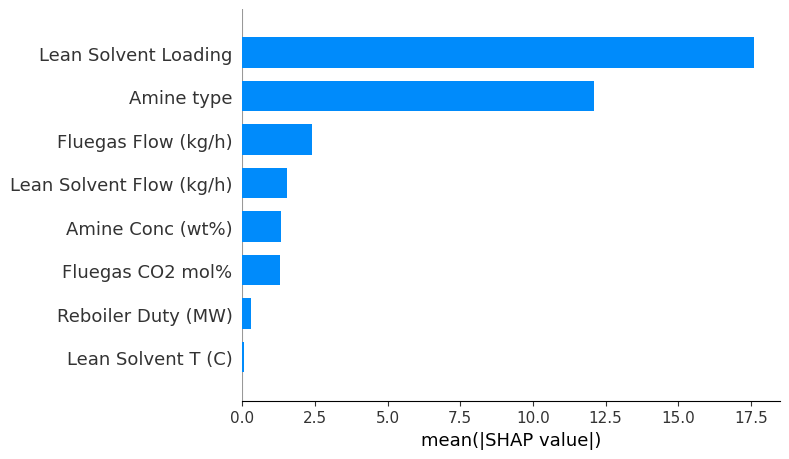

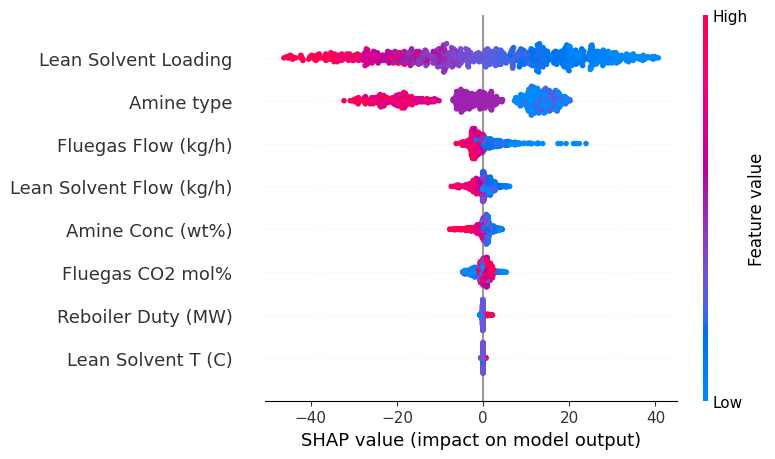

<Figure size 640x480 with 0 Axes>

In [ ]:
import matplotlib.pyplot as plt
import shap
import numpy as np

# Column index for "Unnamed: 0"
col_index = X_test.columns.get_loc("Unnamed: 0")

# 1. Drop column from the feature dataframe
X_test_clean = X_test.drop(columns=["Unnamed: 0"])

# 2. Remove the same column from SHAP values
values_clean = np.delete(shap_values.values, col_index, axis=1)

# Optional: SHAP stores the original features in .data
if shap_values.data is not None:
    data_clean = np.delete(shap_values.data, col_index, axis=1)
else:
    data_clean = None

# Rebuild the Explanation object
shap_values_clean = shap.Explanation(
    values=values_clean,
    base_values=shap_values.base_values,
    data=data_clean,
    feature_names=[name for i, name in enumerate(shap_values.feature_names) if i != col_index]
)
# --- BAR PLOT ---
plt.figure(figsize=(20, 16))   # <<< CRITICAL FIX
shap.summary_plot(
    shap_values_clean,
    X_test_clean,
    plot_type="bar",
    show=False                # prevent SHAP from clearing the figure
)
plt.gca().set_xlabel("mean(|SHAP value|)")

plt.tight_layout()
plt.show()


# --- DOT PLOT ---
shap.summary_plot(shap_values_clean, X_test_clean)
plt.tight_layout()


In [ ]:
import matplotlib.pyplot as plt
import shap

# --- BAR PLOT ---
shap.summary_plot(shap_values_clean, X_test_clean, plot_type="bar", show=False)
plt.gca().set_xlabel("mean(|SHAP value|)")
plt.tight_layout()
plt.savefig("shap_rec_bar.png", dpi=600, bbox_inches='tight')
plt.close()

# --- DOT PLOT ---
shap.summary_plot(shap_values_clean, X_test_clean, show=False)
plt.tight_layout()
plt.savefig("shap_rec_dot.png", dpi=600, bbox_inches='tight')
plt.close()


### SEC

In [ ]:
!pip install shap
!pip install keras

In [ ]:
import shap
from shap import summary_plot

# Model
# Recovery
from tensorflow import keras
from tensorflow.keras import layers

X_train = df.drop(columns=['Unnamed: 0'])
y_train2 = df_label2
X_test = ts.drop(columns=['Unnamed: 0'])
n_features = X_train.shape[1]
# Best model
ann_model1 = keras.Sequential([
    layers.Input(shape=(n_features,)),
    layers.Dense(120, activation='relu'),
    layers.Dense(128, activation='relu'),
    layers.Dense(1)                       # single output
])

# Compile
ann_model1.compile(optimizer=keras.optimizers.Adam(learning_rate=0.01),
                   loss='mean_absolute_error')
# fit/predict/evaluate
ann_model1.fit(X_train, y_train2, epochs=101, batch_size=32, verbose=0)


feature_names = list(df.columns[:-1])
explainer = shap.Explainer(ann_model1.predict, X_train, feature_names = feature_names)
shap_values = explainer(X_test)

348/348 ━━━━━━━━━━━━━━━━━━━━ 1s 2ms/step
789/789 ━━━━━━━━━━━━━━━━━━━━ 1s 1ms/step
28/28 ━━━━━━━━━━━━━━━━━━━━ 0s 10ms/step
763/763 ━━━━━━━━━━━━━━━━━━━━ 1s 1ms/step
28/28 ━━━━━━━━━━━━━━━━━━━━ 0s 12ms/step
352/352 ━━━━━━━━━━━━━━━━━━━━ 1s 3ms/step
26/26 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step 
357/357 ━━━━━━━━━━━━━━━━━━━━ 1s 2ms/step
26/26 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step 
356/356 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step
26/26 ━━━━━━━━━━━━━━━━━━━━ 0s 10ms/step
788/788 ━━━━━━━━━━━━━━━━━━━━ 1s 1ms/step
28/28 ━━━━━━━━━━━━━━━━━━━━ 0s 10ms/step


ExactExplainer explainer:   1%|          | 7/886 [00:00<?, ?it/s]

348/348 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step
26/26 ━━━━━━━━━━━━━━━━━━━━ 0s 10ms/step


ExactExplainer explainer:   1%|          | 9/886 [00:11<06:54,  2.11it/s]

348/348 ━━━━━━━━━━━━━━━━━━━━ 1s 2ms/step
26/26 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step 


ExactExplainer explainer:   1%|          | 10/886 [00:12<09:43,  1.50it/s]

347/347 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step
26/26 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step 


ExactExplainer explainer:   1%|          | 11/886 [00:12<10:23,  1.40it/s]

352/352 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step
26/26 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step 


ExactExplainer explainer:   1%|▏         | 12/886 [00:13<10:20,  1.41it/s]

356/356 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step
26/26 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step 


ExactExplainer explainer:   1%|▏         | 13/886 [00:14<10:28,  1.39it/s]

347/347 ━━━━━━━━━━━━━━━━━━━━ 1s 2ms/step
26/26 ━━━━━━━━━━━━━━━━━━━━ 0s 10ms/step


ExactExplainer explainer:   2%|▏         | 14/886 [00:15<12:29,  1.16it/s]

348/348 ━━━━━━━━━━━━━━━━━━━━ 1s 2ms/step
26/26 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step 


ExactExplainer explainer:   2%|▏         | 15/886 [00:16<12:55,  1.12it/s]

346/346 ━━━━━━━━━━━━━━━━━━━━ 1s 2ms/step
26/26 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step


ExactExplainer explainer:   2%|▏         | 16/886 [00:18<15:56,  1.10s/it]

348/348 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step
26/26 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step 


ExactExplainer explainer:   2%|▏         | 17/886 [00:18<14:13,  1.02it/s]

346/346 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step
26/26 ━━━━━━━━━━━━━━━━━━━━ 0s 11ms/step


ExactExplainer explainer:   2%|▏         | 18/886 [00:19<13:56,  1.04it/s]

345/345 ━━━━━━━━━━━━━━━━━━━━ 1s 2ms/step
26/26 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step 


ExactExplainer explainer:   2%|▏         | 19/886 [00:20<13:59,  1.03it/s]

352/352 ━━━━━━━━━━━━━━━━━━━━ 1s 2ms/step
26/26 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step 


ExactExplainer explainer:   2%|▏         | 20/886 [00:21<13:48,  1.05it/s]

347/347 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step
26/26 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step 


ExactExplainer explainer:   2%|▏         | 21/886 [00:22<12:46,  1.13it/s]

778/778 ━━━━━━━━━━━━━━━━━━━━ 1s 1ms/step
28/28 ━━━━━━━━━━━━━━━━━━━━ 0s 10ms/step


ExactExplainer explainer:   2%|▏         | 22/886 [00:24<17:15,  1.20s/it]

348/348 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step
26/26 ━━━━━━━━━━━━━━━━━━━━ 0s 10ms/step


ExactExplainer explainer:   3%|▎         | 23/886 [00:25<16:03,  1.12s/it]

347/347 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step
26/26 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step 


ExactExplainer explainer:   3%|▎         | 24/886 [00:25<14:15,  1.01it/s]

350/350 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step
26/26 ━━━━━━━━━━━━━━━━━━━━ 0s 10ms/step


ExactExplainer explainer:   3%|▎         | 25/886 [00:26<14:09,  1.01it/s]

351/351 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step
25/25 ━━━━━━━━━━━━━━━━━━━━ 0s 10ms/step


ExactExplainer explainer:   3%|▎         | 26/886 [00:27<14:10,  1.01it/s]

352/352 ━━━━━━━━━━━━━━━━━━━━ 1s 2ms/step
26/26 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step 


ExactExplainer explainer:   3%|▎         | 27/886 [00:28<14:12,  1.01it/s]

773/773 ━━━━━━━━━━━━━━━━━━━━ 2s 2ms/step
28/28 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step 


ExactExplainer explainer:   3%|▎         | 28/886 [00:30<19:07,  1.34s/it]

350/350 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step
26/26 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step 


ExactExplainer explainer:   3%|▎         | 29/886 [00:31<16:27,  1.15s/it]

347/347 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step
26/26 ━━━━━━━━━━━━━━━━━━━━ 0s 8ms/step


ExactExplainer explainer:   3%|▎         | 30/886 [00:32<15:12,  1.07s/it]

777/777 ━━━━━━━━━━━━━━━━━━━━ 1s 1ms/step
28/28 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step 


ExactExplainer explainer:   3%|▎         | 31/886 [00:34<17:57,  1.26s/it]

347/347 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step
26/26 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step 


ExactExplainer explainer:   4%|▎         | 32/886 [00:35<15:53,  1.12s/it]

347/347 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step
26/26 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step 


ExactExplainer explainer:   4%|▎         | 33/886 [00:35<14:13,  1.00s/it]

346/346 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step
26/26 ━━━━━━━━━━━━━━━━━━━━ 0s 11ms/step


ExactExplainer explainer:   4%|▍         | 34/886 [00:36<13:52,  1.02it/s]

779/779 ━━━━━━━━━━━━━━━━━━━━ 1s 1ms/step
28/28 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step 


ExactExplainer explainer:   4%|▍         | 35/886 [00:38<15:58,  1.13s/it]

348/348 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step
26/26 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step 


ExactExplainer explainer:   4%|▍         | 36/886 [00:38<14:17,  1.01s/it]

347/347 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step
26/26 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step 


ExactExplainer explainer:   4%|▍         | 37/886 [00:39<13:05,  1.08it/s]

350/350 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step
26/26 ━━━━━━━━━━━━━━━━━━━━ 0s 14ms/step


ExactExplainer explainer:   4%|▍         | 38/886 [00:40<14:02,  1.01it/s]

774/774 ━━━━━━━━━━━━━━━━━━━━ 1s 2ms/step
28/28 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step 


ExactExplainer explainer:   4%|▍         | 39/886 [00:42<17:56,  1.27s/it]

348/348 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step
26/26 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step 


ExactExplainer explainer:   5%|▍         | 40/886 [00:43<15:41,  1.11s/it]

348/348 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step
26/26 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step 


ExactExplainer explainer:   5%|▍         | 41/886 [00:44<14:04,  1.00it/s]

347/347 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step
26/26 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step 


ExactExplainer explainer:   5%|▍         | 42/886 [00:44<12:52,  1.09it/s]

775/775 ━━━━━━━━━━━━━━━━━━━━ 1s 1ms/step
28/28 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step 


ExactExplainer explainer:   5%|▍         | 43/886 [00:46<15:30,  1.10s/it]

781/781 ━━━━━━━━━━━━━━━━━━━━ 1s 1ms/step
28/28 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step 


ExactExplainer explainer:   5%|▍         | 44/886 [00:47<17:19,  1.23s/it]

346/346 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step
25/25 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step 


ExactExplainer explainer:   5%|▌         | 45/886 [00:48<15:19,  1.09s/it]

348/348 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step
26/26 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step 


ExactExplainer explainer:   5%|▌         | 46/886 [00:49<13:49,  1.01it/s]

347/347 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step
26/26 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step 


ExactExplainer explainer:   5%|▌         | 47/886 [00:50<12:45,  1.10it/s]

348/348 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step
26/26 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step 


ExactExplainer explainer:   5%|▌         | 48/886 [00:50<11:58,  1.17it/s]

763/763 ━━━━━━━━━━━━━━━━━━━━ 1s 1ms/step
28/28 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step 


ExactExplainer explainer:   6%|▌         | 49/886 [00:52<14:43,  1.06s/it]

785/785 ━━━━━━━━━━━━━━━━━━━━ 2s 2ms/step
28/28 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step 


ExactExplainer explainer:   6%|▌         | 50/886 [00:54<19:39,  1.41s/it]

346/346 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step
26/26 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step 


ExactExplainer explainer:   6%|▌         | 51/886 [00:55<16:57,  1.22s/it]

356/356 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step
26/26 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step 


ExactExplainer explainer:   6%|▌         | 52/886 [00:56<14:53,  1.07s/it]

345/345 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step
26/26 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step 


ExactExplainer explainer:   6%|▌         | 53/886 [00:56<13:25,  1.03it/s]

781/781 ━━━━━━━━━━━━━━━━━━━━ 1s 1ms/step
28/28 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step 


ExactExplainer explainer:   6%|▌         | 54/886 [00:58<15:15,  1.10s/it]

348/348 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step
26/26 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step 


ExactExplainer explainer:   6%|▌         | 55/886 [00:59<13:43,  1.01it/s]

348/348 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step
26/26 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step 


ExactExplainer explainer:   6%|▋         | 56/886 [00:59<12:42,  1.09it/s]

352/352 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step
26/26 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step 


ExactExplainer explainer:   6%|▋         | 57/886 [01:00<12:06,  1.14it/s]

781/781 ━━━━━━━━━━━━━━━━━━━━ 1s 1ms/step
28/28 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step 


ExactExplainer explainer:   7%|▋         | 58/886 [01:02<14:15,  1.03s/it]

346/346 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step
25/25 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step 


ExactExplainer explainer:   7%|▋         | 59/886 [01:02<12:58,  1.06it/s]

350/350 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step
26/26 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step 


ExactExplainer explainer:   7%|▋         | 60/886 [01:03<12:07,  1.14it/s]

346/346 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step
26/26 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step 


ExactExplainer explainer:   7%|▋         | 61/886 [01:04<11:40,  1.18it/s]

349/349 ━━━━━━━━━━━━━━━━━━━━ 1s 2ms/step
26/26 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step 


ExactExplainer explainer:   7%|▋         | 62/886 [01:05<12:37,  1.09it/s]

351/351 ━━━━━━━━━━━━━━━━━━━━ 1s 2ms/step
26/26 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step 


ExactExplainer explainer:   7%|▋         | 63/886 [01:06<13:47,  1.01s/it]

348/348 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step
26/26 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step 


ExactExplainer explainer:   7%|▋         | 64/886 [01:07<12:46,  1.07it/s]

357/357 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step
26/26 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step 


ExactExplainer explainer:   7%|▋         | 65/886 [01:08<12:01,  1.14it/s]

356/356 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step
26/26 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step 


ExactExplainer explainer:   7%|▋         | 66/886 [01:08<11:44,  1.16it/s]

353/353 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step
25/25 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step 


ExactExplainer explainer:   8%|▊         | 67/886 [01:09<11:22,  1.20it/s]

351/351 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step
25/25 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step 


ExactExplainer explainer:   8%|▊         | 68/886 [01:10<10:54,  1.25it/s]

348/348 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step
26/26 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step 


ExactExplainer explainer:   8%|▊         | 69/886 [01:11<10:38,  1.28it/s]

351/351 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step
26/26 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step 


ExactExplainer explainer:   8%|▊         | 70/886 [01:11<10:24,  1.31it/s]

348/348 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step
26/26 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step 


ExactExplainer explainer:   8%|▊         | 71/886 [01:12<10:12,  1.33it/s]

352/352 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step
26/26 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step 


ExactExplainer explainer:   8%|▊         | 72/886 [01:13<10:03,  1.35it/s]

351/351 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step
26/26 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step 


ExactExplainer explainer:   8%|▊         | 73/886 [01:13<09:56,  1.36it/s]

346/346 ━━━━━━━━━━━━━━━━━━━━ 1s 2ms/step
26/26 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step 


ExactExplainer explainer:   8%|▊         | 74/886 [01:14<10:39,  1.27it/s]

348/348 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step
26/26 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step 


ExactExplainer explainer:   8%|▊         | 75/886 [01:15<10:25,  1.30it/s]

346/346 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step
25/25 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step 


ExactExplainer explainer:   9%|▊         | 76/886 [01:17<13:19,  1.01it/s]

347/347 ━━━━━━━━━━━━━━━━━━━━ 1s 2ms/step
26/26 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step 


ExactExplainer explainer:   9%|▊         | 77/886 [01:18<12:58,  1.04it/s]

349/349 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step
26/26 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step 


ExactExplainer explainer:   9%|▉         | 78/886 [01:18<12:00,  1.12it/s]

775/775 ━━━━━━━━━━━━━━━━━━━━ 1s 1ms/step
28/28 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step 


ExactExplainer explainer:   9%|▉         | 79/886 [01:20<14:05,  1.05s/it]

356/356 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step
26/26 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step 


ExactExplainer explainer:   9%|▉         | 80/886 [01:20<12:44,  1.05it/s]

768/768 ━━━━━━━━━━━━━━━━━━━━ 1s 1ms/step
28/28 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step 


ExactExplainer explainer:   9%|▉         | 81/886 [01:22<14:49,  1.10s/it]

351/351 ━━━━━━━━━━━━━━━━━━━━ 1s 2ms/step
26/26 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step 


ExactExplainer explainer:   9%|▉         | 82/886 [01:23<14:10,  1.06s/it]

347/347 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step
26/26 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step 


ExactExplainer explainer:   9%|▉         | 83/886 [01:24<12:49,  1.04it/s]

349/349 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step
26/26 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step 


ExactExplainer explainer:   9%|▉         | 84/886 [01:24<11:54,  1.12it/s]

348/348 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step
26/26 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step 


ExactExplainer explainer:  10%|▉         | 85/886 [01:25<11:13,  1.19it/s]

351/351 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step
26/26 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step 


ExactExplainer explainer:  10%|▉         | 86/886 [01:26<10:43,  1.24it/s]

347/347 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step
26/26 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step 


ExactExplainer explainer:  10%|▉         | 87/886 [01:26<10:26,  1.28it/s]

346/346 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step
26/26 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step


ExactExplainer explainer:  10%|▉         | 88/886 [01:27<10:31,  1.26it/s]

346/346 ━━━━━━━━━━━━━━━━━━━━ 1s 2ms/step
26/26 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step 


ExactExplainer explainer:  10%|█         | 89/886 [01:29<13:21,  1.01s/it]

347/347 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step
25/25 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step 


ExactExplainer explainer:  10%|█         | 90/886 [01:29<12:18,  1.08it/s]

779/779 ━━━━━━━━━━━━━━━━━━━━ 1s 1ms/step
28/28 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step 


ExactExplainer explainer:  10%|█         | 91/886 [01:31<14:20,  1.08s/it]

350/350 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step
26/26 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step 


ExactExplainer explainer:  10%|█         | 92/886 [01:32<12:57,  1.02it/s]

348/348 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step
26/26 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step 


ExactExplainer explainer:  10%|█         | 93/886 [01:32<11:57,  1.11it/s]

774/774 ━━━━━━━━━━━━━━━━━━━━ 1s 1ms/step
28/28 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step 


ExactExplainer explainer:  11%|█         | 94/886 [01:34<13:56,  1.06s/it]

769/769 ━━━━━━━━━━━━━━━━━━━━ 1s 1ms/step
28/28 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step 


ExactExplainer explainer:  11%|█         | 95/886 [01:35<15:42,  1.19s/it]

347/347 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step
26/26 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step 


ExactExplainer explainer:  11%|█         | 96/886 [01:36<13:48,  1.05s/it]

357/357 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step
26/26 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step 


ExactExplainer explainer:  11%|█         | 97/886 [01:37<12:37,  1.04it/s]

788/788 ━━━━━━━━━━━━━━━━━━━━ 1s 1ms/step
28/28 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step 


ExactExplainer explainer:  11%|█         | 98/886 [01:38<14:27,  1.10s/it]

348/348 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step
26/26 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step 


ExactExplainer explainer:  11%|█         | 99/886 [01:39<13:29,  1.03s/it]

349/349 ━━━━━━━━━━━━━━━━━━━━ 1s 2ms/step
26/26 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step 


ExactExplainer explainer:  11%|█▏        | 100/886 [01:41<15:11,  1.16s/it]

782/782 ━━━━━━━━━━━━━━━━━━━━ 1s 1ms/step
28/28 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step


ExactExplainer explainer:  11%|█▏        | 101/886 [01:42<17:41,  1.35s/it]

350/350 ━━━━━━━━━━━━━━━━━━━━ 1s 2ms/step
26/26 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step 


ExactExplainer explainer:  12%|█▏        | 102/886 [01:43<16:41,  1.28s/it]

755/755 ━━━━━━━━━━━━━━━━━━━━ 1s 1ms/step
28/28 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step 


ExactExplainer explainer:  12%|█▏        | 103/886 [01:45<17:41,  1.36s/it]

348/348 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step
26/26 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step 


ExactExplainer explainer:  12%|█▏        | 104/886 [01:46<15:17,  1.17s/it]

348/348 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step
26/26 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step 


ExactExplainer explainer:  12%|█▏        | 105/886 [01:46<13:27,  1.03s/it]

770/770 ━━━━━━━━━━━━━━━━━━━━ 1s 1ms/step
28/28 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step 


ExactExplainer explainer:  12%|█▏        | 106/886 [01:48<15:20,  1.18s/it]

351/351 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step
26/26 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step 


ExactExplainer explainer:  12%|█▏        | 107/886 [01:49<13:40,  1.05s/it]

347/347 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step
26/26 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step 


ExactExplainer explainer:  12%|█▏        | 108/886 [01:49<12:26,  1.04it/s]

786/786 ━━━━━━━━━━━━━━━━━━━━ 1s 1ms/step
28/28 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step


ExactExplainer explainer:  12%|█▏        | 109/886 [01:51<15:53,  1.23s/it]

347/347 ━━━━━━━━━━━━━━━━━━━━ 1s 2ms/step
26/26 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step


ExactExplainer explainer:  12%|█▏        | 110/886 [01:52<15:23,  1.19s/it]

351/351 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step
25/25 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step 


ExactExplainer explainer:  13%|█▎        | 111/886 [01:53<13:41,  1.06s/it]

348/348 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step
26/26 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step 


ExactExplainer explainer:  13%|█▎        | 112/886 [01:54<12:28,  1.03it/s]

352/352 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step
26/26 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step 


ExactExplainer explainer:  13%|█▎        | 113/886 [01:55<11:45,  1.10it/s]

348/348 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step
26/26 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step 


ExactExplainer explainer:  13%|█▎        | 114/886 [01:55<11:05,  1.16it/s]

348/348 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step
26/26 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step 


ExactExplainer explainer:  13%|█▎        | 115/886 [01:56<10:36,  1.21it/s]

774/774 ━━━━━━━━━━━━━━━━━━━━ 1s 1ms/step
28/28 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step 


ExactExplainer explainer:  13%|█▎        | 116/886 [01:58<12:50,  1.00s/it]

347/347 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step
26/26 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step 


ExactExplainer explainer:  13%|█▎        | 117/886 [01:58<11:49,  1.08it/s]

774/774 ━━━━━━━━━━━━━━━━━━━━ 1s 1ms/step
28/28 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step


ExactExplainer explainer:  13%|█▎        | 118/886 [02:00<13:46,  1.08s/it]

774/774 ━━━━━━━━━━━━━━━━━━━━ 1s 1ms/step
28/28 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step 


ExactExplainer explainer:  13%|█▎        | 119/886 [02:01<15:08,  1.18s/it]

348/348 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step
26/26 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step 


ExactExplainer explainer:  14%|█▎        | 120/886 [02:02<13:32,  1.06s/it]

349/349 ━━━━━━━━━━━━━━━━━━━━ 1s 1ms/step
25/25 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step 


ExactExplainer explainer:  14%|█▎        | 121/886 [02:04<15:16,  1.20s/it]

347/347 ━━━━━━━━━━━━━━━━━━━━ 1s 2ms/step
26/26 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step 


ExactExplainer explainer:  14%|█▍        | 122/886 [02:04<14:04,  1.11s/it]

347/347 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step
26/26 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step 


ExactExplainer explainer:  14%|█▍        | 123/886 [02:05<12:39,  1.00it/s]

347/347 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step
26/26 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step 


ExactExplainer explainer:  14%|█▍        | 124/886 [02:06<11:40,  1.09it/s]

346/346 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step
26/26 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step 


ExactExplainer explainer:  14%|█▍        | 125/886 [02:07<11:08,  1.14it/s]

347/347 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step
26/26 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step 


ExactExplainer explainer:  14%|█▍        | 126/886 [02:07<10:35,  1.20it/s]

348/348 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step
26/26 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step 


ExactExplainer explainer:  14%|█▍        | 127/886 [02:08<10:12,  1.24it/s]

776/776 ━━━━━━━━━━━━━━━━━━━━ 1s 1ms/step
28/28 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step 


ExactExplainer explainer:  14%|█▍        | 128/886 [02:10<12:57,  1.03s/it]

779/779 ━━━━━━━━━━━━━━━━━━━━ 1s 1ms/step
28/28 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step 


ExactExplainer explainer:  15%|█▍        | 129/886 [02:11<14:34,  1.15s/it]

777/777 ━━━━━━━━━━━━━━━━━━━━ 1s 1ms/step
28/28 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step 


ExactExplainer explainer:  15%|█▍        | 130/886 [02:13<15:33,  1.24s/it]

347/347 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step
26/26 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step 


ExactExplainer explainer:  15%|█▍        | 131/886 [02:13<13:40,  1.09s/it]

351/351 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step
26/26 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step 


ExactExplainer explainer:  15%|█▍        | 132/886 [02:14<12:35,  1.00s/it]

347/347 ━━━━━━━━━━━━━━━━━━━━ 1s 2ms/step
25/25 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step 


ExactExplainer explainer:  15%|█▌        | 133/886 [02:15<12:42,  1.01s/it]

348/348 ━━━━━━━━━━━━━━━━━━━━ 1s 2ms/step
26/26 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step 


ExactExplainer explainer:  15%|█▌        | 134/886 [02:16<12:42,  1.01s/it]

348/348 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step
26/26 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step 


ExactExplainer explainer:  15%|█▌        | 135/886 [02:17<11:42,  1.07it/s]

346/346 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step
26/26 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step 


ExactExplainer explainer:  15%|█▌        | 136/886 [02:18<10:54,  1.15it/s]

348/348 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step
26/26 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step 


ExactExplainer explainer:  15%|█▌        | 137/886 [02:18<10:19,  1.21it/s]

353/353 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step
26/26 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step 


ExactExplainer explainer:  16%|█▌        | 138/886 [02:19<09:59,  1.25it/s]

349/349 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step
26/26 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step 


ExactExplainer explainer:  16%|█▌        | 139/886 [02:20<09:44,  1.28it/s]

351/351 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step
25/25 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step 


ExactExplainer explainer:  16%|█▌        | 140/886 [02:21<09:33,  1.30it/s]

348/348 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step
26/26 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step 


ExactExplainer explainer:  16%|█▌        | 141/886 [02:21<09:38,  1.29it/s]

348/348 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step
26/26 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step 


ExactExplainer explainer:  16%|█▌        | 142/886 [02:22<09:33,  1.30it/s]

349/349 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step
25/25 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step 


ExactExplainer explainer:  16%|█▌        | 143/886 [02:23<09:27,  1.31it/s]

777/777 ━━━━━━━━━━━━━━━━━━━━ 1s 1ms/step
28/28 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step 


ExactExplainer explainer:  16%|█▋        | 144/886 [02:24<11:49,  1.05it/s]

347/347 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step
26/26 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step 


ExactExplainer explainer:  16%|█▋        | 145/886 [02:25<11:03,  1.12it/s]

348/348 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step
26/26 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step 


ExactExplainer explainer:  16%|█▋        | 146/886 [02:26<10:26,  1.18it/s]

757/757 ━━━━━━━━━━━━━━━━━━━━ 1s 2ms/step
28/28 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step


ExactExplainer explainer:  17%|█▋        | 147/886 [02:28<15:02,  1.22s/it]

774/774 ━━━━━━━━━━━━━━━━━━━━ 1s 1ms/step
28/28 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step 


ExactExplainer explainer:  17%|█▋        | 148/886 [02:29<16:01,  1.30s/it]

347/347 ━━━━━━━━━━━━━━━━━━━━ 1s 1ms/step
26/26 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step 


ExactExplainer explainer:  17%|█▋        | 149/886 [02:30<14:13,  1.16s/it]

347/347 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step
26/26 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step 


ExactExplainer explainer:  17%|█▋        | 150/886 [02:31<12:39,  1.03s/it]

349/349 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step
26/26 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step 


ExactExplainer explainer:  17%|█▋        | 151/886 [02:32<11:35,  1.06it/s]

351/351 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step
26/26 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step 


ExactExplainer explainer:  17%|█▋        | 152/886 [02:32<10:54,  1.12it/s]

347/347 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step
26/26 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step 


ExactExplainer explainer:  17%|█▋        | 153/886 [02:33<10:19,  1.18it/s]

347/347 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step
26/26 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step 


ExactExplainer explainer:  17%|█▋        | 154/886 [02:34<09:54,  1.23it/s]

777/777 ━━━━━━━━━━━━━━━━━━━━ 1s 1ms/step
28/28 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step 


ExactExplainer explainer:  17%|█▋        | 155/886 [02:35<12:04,  1.01it/s]

350/350 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step
26/26 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step 


ExactExplainer explainer:  18%|█▊        | 156/886 [02:36<11:07,  1.09it/s]

785/785 ━━━━━━━━━━━━━━━━━━━━ 1s 1ms/step
28/28 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step 


ExactExplainer explainer:  18%|█▊        | 157/886 [02:37<13:00,  1.07s/it]

348/348 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step
26/26 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step 


ExactExplainer explainer:  18%|█▊        | 158/886 [02:38<12:15,  1.01s/it]

761/761 ━━━━━━━━━━━━━━━━━━━━ 1s 2ms/step
28/28 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step 


ExactExplainer explainer:  18%|█▊        | 159/886 [02:40<15:59,  1.32s/it]

357/357 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step
26/26 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step 


ExactExplainer explainer:  18%|█▊        | 160/886 [02:41<13:55,  1.15s/it]

753/753 ━━━━━━━━━━━━━━━━━━━━ 1s 1ms/step
28/28 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step 


ExactExplainer explainer:  18%|█▊        | 161/886 [02:43<15:09,  1.25s/it]

347/347 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step
26/26 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step 


ExactExplainer explainer:  18%|█▊        | 162/886 [02:43<13:16,  1.10s/it]

348/348 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step
26/26 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step 


ExactExplainer explainer:  18%|█▊        | 163/886 [02:44<12:08,  1.01s/it]

350/350 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step
26/26 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step 


ExactExplainer explainer:  19%|█▊        | 164/886 [02:45<11:10,  1.08it/s]

352/352 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step
26/26 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step 


ExactExplainer explainer:  19%|█▊        | 165/886 [02:46<10:28,  1.15it/s]

352/352 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step
25/25 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step 


ExactExplainer explainer:  19%|█▊        | 166/886 [02:46<10:02,  1.20it/s]

347/347 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step
26/26 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step 


ExactExplainer explainer:  19%|█▉        | 167/886 [02:47<09:51,  1.21it/s]

351/351 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step
25/25 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step 


ExactExplainer explainer:  19%|█▉        | 168/886 [02:48<09:46,  1.22it/s]

352/352 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step
26/26 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step 


ExactExplainer explainer:  19%|█▉        | 169/886 [02:49<09:37,  1.24it/s]

348/348 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step
26/26 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step 


ExactExplainer explainer:  19%|█▉        | 170/886 [02:50<09:29,  1.26it/s]

348/348 ━━━━━━━━━━━━━━━━━━━━ 1s 2ms/step
25/25 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step 


ExactExplainer explainer:  19%|█▉        | 171/886 [02:51<11:54,  1.00it/s]

346/346 ━━━━━━━━━━━━━━━━━━━━ 1s 2ms/step
26/26 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step 


ExactExplainer explainer:  19%|█▉        | 172/886 [02:52<11:40,  1.02it/s]

346/346 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step
26/26 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step 


ExactExplainer explainer:  20%|█▉        | 173/886 [02:53<10:57,  1.09it/s]

349/349 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step
26/26 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step 


ExactExplainer explainer:  20%|█▉        | 174/886 [02:54<10:26,  1.14it/s]

352/352 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step
26/26 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step 


ExactExplainer explainer:  20%|█▉        | 175/886 [02:54<10:03,  1.18it/s]

351/351 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step
26/26 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step 


ExactExplainer explainer:  20%|█▉        | 176/886 [02:55<09:47,  1.21it/s]

771/771 ━━━━━━━━━━━━━━━━━━━━ 1s 1ms/step
28/28 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step 


ExactExplainer explainer:  20%|█▉        | 177/886 [02:57<12:28,  1.06s/it]

348/348 ━━━━━━━━━━━━━━━━━━━━ 1s 1ms/step
26/26 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step 


ExactExplainer explainer:  20%|██        | 178/886 [02:57<11:31,  1.02it/s]

348/348 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step
26/26 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step 


ExactExplainer explainer:  20%|██        | 179/886 [02:58<10:48,  1.09it/s]

349/349 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step
26/26 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step 


ExactExplainer explainer:  20%|██        | 180/886 [02:59<10:13,  1.15it/s]

346/346 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step
26/26 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step 


ExactExplainer explainer:  20%|██        | 181/886 [03:00<09:52,  1.19it/s]

349/349 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step
26/26 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step 


ExactExplainer explainer:  21%|██        | 182/886 [03:01<09:38,  1.22it/s]

353/353 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step
26/26 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step 


ExactExplainer explainer:  21%|██        | 183/886 [03:01<09:28,  1.24it/s]

349/349 ━━━━━━━━━━━━━━━━━━━━ 1s 2ms/step
26/26 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step


ExactExplainer explainer:  21%|██        | 184/886 [03:02<10:10,  1.15it/s]

780/780 ━━━━━━━━━━━━━━━━━━━━ 1s 2ms/step
28/28 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step 


ExactExplainer explainer:  21%|██        | 185/886 [03:04<13:55,  1.19s/it]

347/347 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step
26/26 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step 


ExactExplainer explainer:  21%|██        | 186/886 [03:05<12:20,  1.06s/it]

356/356 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step
26/26 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step 


ExactExplainer explainer:  21%|██        | 187/886 [03:06<11:17,  1.03it/s]

782/782 ━━━━━━━━━━━━━━━━━━━━ 1s 1ms/step
28/28 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step 


ExactExplainer explainer:  21%|██        | 188/886 [03:07<12:52,  1.11s/it]

347/347 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step
26/26 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step 


ExactExplainer explainer:  21%|██▏       | 189/886 [03:08<11:37,  1.00s/it]

348/348 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step
26/26 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step 


ExactExplainer explainer:  21%|██▏       | 190/886 [03:09<10:43,  1.08it/s]

346/346 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step
25/25 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step 


ExactExplainer explainer:  22%|██▏       | 191/886 [03:09<10:00,  1.16it/s]

353/353 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step
26/26 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step 


ExactExplainer explainer:  22%|██▏       | 192/886 [03:10<09:37,  1.20it/s]

351/351 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step
26/26 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step 


ExactExplainer explainer:  22%|██▏       | 193/886 [03:11<09:21,  1.23it/s]

346/346 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step
26/26 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step 


ExactExplainer explainer:  22%|██▏       | 194/886 [03:12<09:05,  1.27it/s]

348/348 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step
26/26 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step 


ExactExplainer explainer:  22%|██▏       | 195/886 [03:12<08:52,  1.30it/s]

353/353 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step
26/26 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step 


ExactExplainer explainer:  22%|██▏       | 196/886 [03:13<08:48,  1.31it/s]

346/346 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step
26/26 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step


ExactExplainer explainer:  22%|██▏       | 197/886 [03:14<09:23,  1.22it/s]

349/349 ━━━━━━━━━━━━━━━━━━━━ 1s 2ms/step
26/26 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step 


ExactExplainer explainer:  22%|██▏       | 198/886 [03:15<10:21,  1.11it/s]

346/346 ━━━━━━━━━━━━━━━━━━━━ 1s 2ms/step
26/26 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step 


ExactExplainer explainer:  22%|██▏       | 199/886 [03:16<10:14,  1.12it/s]

348/348 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step
26/26 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step 


ExactExplainer explainer:  23%|██▎       | 200/886 [03:17<09:46,  1.17it/s]

345/345 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step
26/26 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step 


ExactExplainer explainer:  23%|██▎       | 201/886 [03:18<09:17,  1.23it/s]

348/348 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step
26/26 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step 


ExactExplainer explainer:  23%|██▎       | 202/886 [03:18<09:07,  1.25it/s]

781/781 ━━━━━━━━━━━━━━━━━━━━ 1s 1ms/step
28/28 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step 


ExactExplainer explainer:  23%|██▎       | 203/886 [03:20<11:27,  1.01s/it]

783/783 ━━━━━━━━━━━━━━━━━━━━ 1s 1ms/step
28/28 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step 


ExactExplainer explainer:  23%|██▎       | 204/886 [03:21<13:22,  1.18s/it]

350/350 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step
26/26 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step 


ExactExplainer explainer:  23%|██▎       | 205/886 [03:22<11:58,  1.06s/it]

349/349 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step
26/26 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step 


ExactExplainer explainer:  23%|██▎       | 206/886 [03:23<11:00,  1.03it/s]

757/757 ━━━━━━━━━━━━━━━━━━━━ 1s 1ms/step
28/28 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step 


ExactExplainer explainer:  23%|██▎       | 207/886 [03:24<12:30,  1.11s/it]

352/352 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step
26/26 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step 


ExactExplainer explainer:  23%|██▎       | 208/886 [03:25<11:21,  1.01s/it]

348/348 ━━━━━━━━━━━━━━━━━━━━ 1s 1ms/step
26/26 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step 


ExactExplainer explainer:  24%|██▎       | 209/886 [03:26<11:04,  1.02it/s]

353/353 ━━━━━━━━━━━━━━━━━━━━ 1s 2ms/step
26/26 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step 


ExactExplainer explainer:  24%|██▎       | 210/886 [03:27<11:27,  1.02s/it]

780/780 ━━━━━━━━━━━━━━━━━━━━ 1s 1ms/step
28/28 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step 


ExactExplainer explainer:  24%|██▍       | 211/886 [03:29<13:14,  1.18s/it]

780/780 ━━━━━━━━━━━━━━━━━━━━ 1s 1ms/step
28/28 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step 


ExactExplainer explainer:  24%|██▍       | 212/886 [03:30<14:06,  1.26s/it]

767/767 ━━━━━━━━━━━━━━━━━━━━ 1s 1ms/step
28/28 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step 


ExactExplainer explainer:  24%|██▍       | 213/886 [03:32<15:14,  1.36s/it]

346/346 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step
26/26 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step 


ExactExplainer explainer:  24%|██▍       | 214/886 [03:33<13:10,  1.18s/it]

348/348 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step
26/26 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step 


ExactExplainer explainer:  24%|██▍       | 215/886 [03:33<11:43,  1.05s/it]

770/770 ━━━━━━━━━━━━━━━━━━━━ 1s 1ms/step
28/28 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step 


ExactExplainer explainer:  24%|██▍       | 216/886 [03:35<13:02,  1.17s/it]

347/347 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step
26/26 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step 


ExactExplainer explainer:  24%|██▍       | 217/886 [03:35<11:36,  1.04s/it]

773/773 ━━━━━━━━━━━━━━━━━━━━ 1s 1ms/step
28/28 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step 


ExactExplainer explainer:  25%|██▍       | 218/886 [03:37<12:56,  1.16s/it]

348/348 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step
26/26 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step 


ExactExplainer explainer:  25%|██▍       | 219/886 [03:38<11:44,  1.06s/it]

347/347 ━━━━━━━━━━━━━━━━━━━━ 1s 2ms/step
26/26 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step 


ExactExplainer explainer:  25%|██▍       | 220/886 [03:39<11:43,  1.06s/it]

784/784 ━━━━━━━━━━━━━━━━━━━━ 1s 2ms/step
28/28 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step 


ExactExplainer explainer:  25%|██▍       | 221/886 [03:41<14:11,  1.28s/it]

347/347 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step
26/26 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step 


ExactExplainer explainer:  25%|██▌       | 222/886 [03:41<12:24,  1.12s/it]

778/778 ━━━━━━━━━━━━━━━━━━━━ 1s 1ms/step
28/28 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step 


ExactExplainer explainer:  25%|██▌       | 223/886 [03:43<13:28,  1.22s/it]

757/757 ━━━━━━━━━━━━━━━━━━━━ 1s 1ms/step
28/28 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step 


ExactExplainer explainer:  25%|██▌       | 224/886 [03:44<14:05,  1.28s/it]

348/348 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step
26/26 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step 


ExactExplainer explainer:  25%|██▌       | 225/886 [03:45<12:20,  1.12s/it]

753/753 ━━━━━━━━━━━━━━━━━━━━ 1s 1ms/step
28/28 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step 


ExactExplainer explainer:  26%|██▌       | 226/886 [03:46<13:15,  1.20s/it]

759/759 ━━━━━━━━━━━━━━━━━━━━ 1s 1ms/step
28/28 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step 


ExactExplainer explainer:  26%|██▌       | 227/886 [03:48<14:22,  1.31s/it]

352/352 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step
26/26 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step 


ExactExplainer explainer:  26%|██▌       | 228/886 [03:49<12:32,  1.14s/it]

347/347 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step
26/26 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step 


ExactExplainer explainer:  26%|██▌       | 229/886 [03:49<11:15,  1.03s/it]

347/347 ━━━━━━━━━━━━━━━━━━━━ 1s 2ms/step
26/26 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step 


ExactExplainer explainer:  26%|██▌       | 230/886 [03:50<11:21,  1.04s/it]

347/347 ━━━━━━━━━━━━━━━━━━━━ 1s 2ms/step
26/26 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step 


ExactExplainer explainer:  26%|██▌       | 231/886 [03:52<11:35,  1.06s/it]

352/352 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step
26/26 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step 


ExactExplainer explainer:  26%|██▌       | 232/886 [03:52<10:37,  1.03it/s]

345/345 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step
25/25 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step 


ExactExplainer explainer:  26%|██▋       | 233/886 [03:53<09:50,  1.11it/s]

350/350 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step
26/26 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step 


ExactExplainer explainer:  26%|██▋       | 234/886 [03:54<09:24,  1.16it/s]

352/352 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step
25/25 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step 


ExactExplainer explainer:  27%|██▋       | 235/886 [03:55<09:01,  1.20it/s]

352/352 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step
26/26 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step 


ExactExplainer explainer:  27%|██▋       | 236/886 [03:55<08:46,  1.23it/s]

356/356 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step
26/26 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step 


ExactExplainer explainer:  27%|██▋       | 237/886 [03:56<08:31,  1.27it/s]

348/348 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step
26/26 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step 


ExactExplainer explainer:  27%|██▋       | 238/886 [03:57<08:23,  1.29it/s]

346/346 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step
26/26 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step 


ExactExplainer explainer:  27%|██▋       | 239/886 [03:58<08:16,  1.30it/s]

351/351 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step
26/26 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step 


ExactExplainer explainer:  27%|██▋       | 240/886 [03:58<08:12,  1.31it/s]

771/771 ━━━━━━━━━━━━━━━━━━━━ 1s 1ms/step
28/28 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step 


ExactExplainer explainer:  27%|██▋       | 241/886 [04:00<10:15,  1.05it/s]

351/351 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step
26/26 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step 


ExactExplainer explainer:  27%|██▋       | 242/886 [04:01<09:40,  1.11it/s]

347/347 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step
26/26 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step 


ExactExplainer explainer:  27%|██▋       | 243/886 [04:01<09:07,  1.17it/s]

348/348 ━━━━━━━━━━━━━━━━━━━━ 1s 2ms/step
26/26 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step 


ExactExplainer explainer:  28%|██▊       | 244/886 [04:02<09:25,  1.13it/s]

767/767 ━━━━━━━━━━━━━━━━━━━━ 1s 2ms/step
28/28 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step 


ExactExplainer explainer:  28%|██▊       | 245/886 [04:04<12:34,  1.18s/it]

353/353 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step
26/26 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step 


ExactExplainer explainer:  28%|██▊       | 246/886 [04:05<11:14,  1.05s/it]

768/768 ━━━━━━━━━━━━━━━━━━━━ 1s 1ms/step
28/28 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step 


ExactExplainer explainer:  28%|██▊       | 247/886 [04:06<12:26,  1.17s/it]

348/348 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step
26/26 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step 


ExactExplainer explainer:  28%|██▊       | 248/886 [04:07<11:12,  1.05s/it]

351/351 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step
26/26 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step 


ExactExplainer explainer:  28%|██▊       | 249/886 [04:08<10:18,  1.03it/s]

349/349 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step
26/26 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step 


ExactExplainer explainer:  28%|██▊       | 250/886 [04:09<09:35,  1.11it/s]

357/357 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step
26/26 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step 


ExactExplainer explainer:  28%|██▊       | 251/886 [04:09<09:08,  1.16it/s]

357/357 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step
26/26 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step 


ExactExplainer explainer:  28%|██▊       | 252/886 [04:10<08:49,  1.20it/s]

774/774 ━━━━━━━━━━━━━━━━━━━━ 1s 1ms/step
28/28 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step 


ExactExplainer explainer:  29%|██▊       | 253/886 [04:12<10:41,  1.01s/it]

344/344 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step
26/26 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step 


ExactExplainer explainer:  29%|██▊       | 254/886 [04:12<10:01,  1.05it/s]

350/350 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step
26/26 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step 


ExactExplainer explainer:  29%|██▉       | 255/886 [04:13<09:24,  1.12it/s]

775/775 ━━━━━━━━━━━━━━━━━━━━ 1s 2ms/step
28/28 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step 


ExactExplainer explainer:  29%|██▉       | 256/886 [04:16<15:08,  1.44s/it]

352/352 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step
26/26 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step 


ExactExplainer explainer:  29%|██▉       | 257/886 [04:17<12:58,  1.24s/it]

356/356 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step
26/26 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step 


ExactExplainer explainer:  29%|██▉       | 258/886 [04:17<11:29,  1.10s/it]

348/348 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step
26/26 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step 


ExactExplainer explainer:  29%|██▉       | 259/886 [04:18<10:25,  1.00it/s]

347/347 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step
26/26 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step 


ExactExplainer explainer:  29%|██▉       | 260/886 [04:19<09:43,  1.07it/s]

352/352 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step
26/26 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step 


ExactExplainer explainer:  29%|██▉       | 261/886 [04:20<09:10,  1.13it/s]

346/346 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step
26/26 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step 


ExactExplainer explainer:  30%|██▉       | 262/886 [04:20<08:47,  1.18it/s]

346/346 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step
26/26 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step 


ExactExplainer explainer:  30%|██▉       | 263/886 [04:21<08:42,  1.19it/s]

761/761 ━━━━━━━━━━━━━━━━━━━━ 1s 1ms/step
28/28 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step 


ExactExplainer explainer:  30%|██▉       | 264/886 [04:23<10:29,  1.01s/it]

349/349 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step
26/26 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step 


ExactExplainer explainer:  30%|██▉       | 265/886 [04:23<09:43,  1.06it/s]

348/348 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step
26/26 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step 


ExactExplainer explainer:  30%|███       | 266/886 [04:24<09:07,  1.13it/s]

348/348 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step
26/26 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step 


ExactExplainer explainer:  30%|███       | 267/886 [04:25<08:44,  1.18it/s]

782/782 ━━━━━━━━━━━━━━━━━━━━ 1s 2ms/step
28/28 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step 


ExactExplainer explainer:  30%|███       | 268/886 [04:27<12:05,  1.17s/it]

347/347 ━━━━━━━━━━━━━━━━━━━━ 1s 2ms/step
26/26 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step 


ExactExplainer explainer:  30%|███       | 269/886 [04:28<11:14,  1.09s/it]

775/775 ━━━━━━━━━━━━━━━━━━━━ 1s 1ms/step
28/28 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step 


ExactExplainer explainer:  30%|███       | 270/886 [04:29<12:17,  1.20s/it]

349/349 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step
26/26 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step 


ExactExplainer explainer:  31%|███       | 271/886 [04:30<11:09,  1.09s/it]

775/775 ━━━━━━━━━━━━━━━━━━━━ 1s 1ms/step
28/28 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step 


ExactExplainer explainer:  31%|███       | 272/886 [04:32<12:15,  1.20s/it]

757/757 ━━━━━━━━━━━━━━━━━━━━ 1s 1ms/step
28/28 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step 


ExactExplainer explainer:  31%|███       | 273/886 [04:33<12:56,  1.27s/it]

347/347 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step
25/25 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step 


ExactExplainer explainer:  31%|███       | 274/886 [04:34<11:20,  1.11s/it]

773/773 ━━━━━━━━━━━━━━━━━━━━ 1s 1ms/step
28/28 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step 


ExactExplainer explainer:  31%|███       | 275/886 [04:35<12:18,  1.21s/it]

349/349 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step
26/26 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step 


ExactExplainer explainer:  31%|███       | 276/886 [04:36<10:53,  1.07s/it]

346/346 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step
26/26 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step 


ExactExplainer explainer:  31%|███▏      | 277/886 [04:37<09:51,  1.03it/s]

348/348 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step
26/26 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step 


ExactExplainer explainer:  31%|███▏      | 278/886 [04:37<09:17,  1.09it/s]

347/347 ━━━━━━━━━━━━━━━━━━━━ 1s 2ms/step
26/26 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step


ExactExplainer explainer:  31%|███▏      | 279/886 [04:39<09:50,  1.03it/s]

786/786 ━━━━━━━━━━━━━━━━━━━━ 1s 2ms/step
28/28 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step 


ExactExplainer explainer:  32%|███▏      | 280/886 [04:40<12:13,  1.21s/it]

346/346 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step
26/26 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step 


ExactExplainer explainer:  32%|███▏      | 281/886 [04:41<10:47,  1.07s/it]

351/351 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step
26/26 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step 


ExactExplainer explainer:  32%|███▏      | 282/886 [04:42<09:49,  1.02it/s]

773/773 ━━━━━━━━━━━━━━━━━━━━ 1s 1ms/step
28/28 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step 


ExactExplainer explainer:  32%|███▏      | 283/886 [04:43<11:16,  1.12s/it]

774/774 ━━━━━━━━━━━━━━━━━━━━ 1s 1ms/step
28/28 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step 


ExactExplainer explainer:  32%|███▏      | 284/886 [04:45<12:16,  1.22s/it]

352/352 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step
25/25 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step 


ExactExplainer explainer:  32%|███▏      | 285/886 [04:45<10:50,  1.08s/it]

351/351 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step
26/26 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step 


ExactExplainer explainer:  32%|███▏      | 286/886 [04:46<09:50,  1.02it/s]

777/777 ━━━━━━━━━━━━━━━━━━━━ 1s 1ms/step
28/28 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step 


ExactExplainer explainer:  32%|███▏      | 287/886 [04:48<11:15,  1.13s/it]

348/348 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step
26/26 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step 


ExactExplainer explainer:  33%|███▎      | 288/886 [04:48<10:08,  1.02s/it]

777/777 ━━━━━━━━━━━━━━━━━━━━ 1s 1ms/step
28/28 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step 


ExactExplainer explainer:  33%|███▎      | 289/886 [04:50<12:01,  1.21s/it]

347/347 ━━━━━━━━━━━━━━━━━━━━ 1s 2ms/step
26/26 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step 


ExactExplainer explainer:  33%|███▎      | 290/886 [04:52<12:44,  1.28s/it]

356/356 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step
26/26 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step 


ExactExplainer explainer:  33%|███▎      | 291/886 [04:52<11:14,  1.13s/it]

347/347 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step
26/26 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step 


ExactExplainer explainer:  33%|███▎      | 292/886 [04:53<10:04,  1.02s/it]

347/347 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step
26/26 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step 


ExactExplainer explainer:  33%|███▎      | 293/886 [04:54<09:17,  1.06it/s]

348/348 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step
26/26 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step 


ExactExplainer explainer:  33%|███▎      | 294/886 [04:55<08:49,  1.12it/s]

777/777 ━━━━━━━━━━━━━━━━━━━━ 1s 1ms/step
28/28 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step 


ExactExplainer explainer:  33%|███▎      | 295/886 [04:56<10:25,  1.06s/it]

350/350 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step
26/26 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step 


ExactExplainer explainer:  33%|███▎      | 296/886 [04:57<09:33,  1.03it/s]

782/782 ━━━━━━━━━━━━━━━━━━━━ 1s 1ms/step
28/28 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step 


ExactExplainer explainer:  34%|███▎      | 297/886 [04:58<11:11,  1.14s/it]

774/774 ━━━━━━━━━━━━━━━━━━━━ 1s 1ms/step
28/28 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step 


ExactExplainer explainer:  34%|███▎      | 298/886 [05:00<12:07,  1.24s/it]

350/350 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step
26/26 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step


ExactExplainer explainer:  34%|███▎      | 299/886 [05:01<10:49,  1.11s/it]

353/353 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step
26/26 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step 


ExactExplainer explainer:  34%|███▍      | 300/886 [05:02<12:04,  1.24s/it]

352/352 ━━━━━━━━━━━━━━━━━━━━ 1s 2ms/step
26/26 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step 


ExactExplainer explainer:  34%|███▍      | 301/886 [05:03<11:18,  1.16s/it]

757/757 ━━━━━━━━━━━━━━━━━━━━ 1s 1ms/step
28/28 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step 


ExactExplainer explainer:  34%|███▍      | 302/886 [05:05<11:59,  1.23s/it]

761/761 ━━━━━━━━━━━━━━━━━━━━ 1s 1ms/step
28/28 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step 


ExactExplainer explainer:  34%|███▍      | 303/886 [05:06<12:33,  1.29s/it]

348/348 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step
26/26 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step 


ExactExplainer explainer:  34%|███▍      | 304/886 [05:07<10:55,  1.13s/it]

349/349 ━━━━━━━━━━━━━━━━━━━━ 1s 1ms/step
26/26 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step 


ExactExplainer explainer:  34%|███▍      | 305/886 [05:08<09:58,  1.03s/it]

349/349 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step
26/26 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step 


ExactExplainer explainer:  35%|███▍      | 306/886 [05:08<09:08,  1.06it/s]

774/774 ━━━━━━━━━━━━━━━━━━━━ 1s 1ms/step
28/28 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step 


ExactExplainer explainer:  35%|███▍      | 307/886 [05:10<10:35,  1.10s/it]

769/769 ━━━━━━━━━━━━━━━━━━━━ 1s 1ms/step
28/28 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step 


ExactExplainer explainer:  35%|███▍      | 308/886 [05:11<11:32,  1.20s/it]

760/760 ━━━━━━━━━━━━━━━━━━━━ 1s 1ms/step
28/28 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step 


ExactExplainer explainer:  35%|███▍      | 309/886 [05:13<12:32,  1.30s/it]

777/777 ━━━━━━━━━━━━━━━━━━━━ 1s 2ms/step
28/28 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step


ExactExplainer explainer:  35%|███▍      | 310/886 [05:15<14:59,  1.56s/it]

755/755 ━━━━━━━━━━━━━━━━━━━━ 1s 1ms/step
28/28 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step 


ExactExplainer explainer:  35%|███▌      | 311/886 [05:16<14:28,  1.51s/it]

352/352 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step
26/26 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step 


ExactExplainer explainer:  35%|███▌      | 312/886 [05:17<12:23,  1.29s/it]

752/752 ━━━━━━━━━━━━━━━━━━━━ 1s 1ms/step
28/28 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step 


ExactExplainer explainer:  35%|███▌      | 313/886 [05:19<13:13,  1.39s/it]

348/348 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step
26/26 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step 


ExactExplainer explainer:  35%|███▌      | 314/886 [05:19<11:23,  1.19s/it]

781/781 ━━━━━━━━━━━━━━━━━━━━ 1s 1ms/step
28/28 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step 


ExactExplainer explainer:  36%|███▌      | 315/886 [05:21<12:04,  1.27s/it]

759/759 ━━━━━━━━━━━━━━━━━━━━ 1s 1ms/step
28/28 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step 


ExactExplainer explainer:  36%|███▌      | 316/886 [05:22<12:24,  1.31s/it]

346/346 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step
26/26 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step 


ExactExplainer explainer:  36%|███▌      | 317/886 [05:23<10:48,  1.14s/it]

356/356 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step
26/26 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step 


ExactExplainer explainer:  36%|███▌      | 318/886 [05:24<09:44,  1.03s/it]

352/352 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step
26/26 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step 


ExactExplainer explainer:  36%|███▌      | 319/886 [05:25<08:54,  1.06it/s]

351/351 ━━━━━━━━━━━━━━━━━━━━ 1s 2ms/step
26/26 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step 


ExactExplainer explainer:  36%|███▌      | 320/886 [05:26<10:25,  1.11s/it]

344/344 ━━━━━━━━━━━━━━━━━━━━ 1s 2ms/step
26/26 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step 


ExactExplainer explainer:  36%|███▌      | 321/886 [05:27<10:01,  1.06s/it]

348/348 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step
26/26 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step 


ExactExplainer explainer:  36%|███▋      | 322/886 [05:28<09:17,  1.01it/s]

352/352 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step
26/26 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step 


ExactExplainer explainer:  36%|███▋      | 323/886 [05:29<08:37,  1.09it/s]

348/348 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step
26/26 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step 


ExactExplainer explainer:  37%|███▋      | 324/886 [05:29<08:10,  1.15it/s]

780/780 ━━━━━━━━━━━━━━━━━━━━ 1s 1ms/step
28/28 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step


ExactExplainer explainer:  37%|███▋      | 325/886 [05:31<10:00,  1.07s/it]

778/778 ━━━━━━━━━━━━━━━━━━━━ 1s 1ms/step
28/28 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step 


ExactExplainer explainer:  37%|███▋      | 326/886 [05:32<11:02,  1.18s/it]

346/346 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step
26/26 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step 


ExactExplainer explainer:  37%|███▋      | 327/886 [05:33<09:50,  1.06s/it]

347/347 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step
26/26 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step 


ExactExplainer explainer:  37%|███▋      | 328/886 [05:34<08:58,  1.04it/s]

777/777 ━━━━━━━━━━━━━━━━━━━━ 1s 1ms/step
28/28 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step 


ExactExplainer explainer:  37%|███▋      | 329/886 [05:35<10:15,  1.10s/it]

347/347 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step
26/26 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step 


ExactExplainer explainer:  37%|███▋      | 330/886 [05:36<09:26,  1.02s/it]

774/774 ━━━━━━━━━━━━━━━━━━━━ 1s 2ms/step
28/28 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step 


ExactExplainer explainer:  37%|███▋      | 331/886 [05:38<11:33,  1.25s/it]

356/356 ━━━━━━━━━━━━━━━━━━━━ 1s 2ms/step
26/26 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step 


ExactExplainer explainer:  37%|███▋      | 332/886 [05:39<11:06,  1.20s/it]

346/346 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step
26/26 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step 


ExactExplainer explainer:  38%|███▊      | 333/886 [05:40<09:50,  1.07s/it]

349/349 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step
26/26 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step 


ExactExplainer explainer:  38%|███▊      | 334/886 [05:40<08:58,  1.02it/s]

775/775 ━━━━━━━━━━━━━━━━━━━━ 1s 1ms/step
28/28 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step 


ExactExplainer explainer:  38%|███▊      | 335/886 [05:42<10:15,  1.12s/it]

352/352 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step
26/26 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step 


ExactExplainer explainer:  38%|███▊      | 336/886 [05:43<09:17,  1.01s/it]

346/346 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step
26/26 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step 


ExactExplainer explainer:  38%|███▊      | 337/886 [05:43<08:35,  1.06it/s]

757/757 ━━━━━━━━━━━━━━━━━━━━ 1s 1ms/step
28/28 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step 


ExactExplainer explainer:  38%|███▊      | 338/886 [05:45<09:58,  1.09s/it]

347/347 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step
26/26 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step 


ExactExplainer explainer:  38%|███▊      | 339/886 [05:46<09:03,  1.01it/s]

766/766 ━━━━━━━━━━━━━━━━━━━━ 1s 1ms/step
28/28 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step 


ExactExplainer explainer:  38%|███▊      | 340/886 [05:47<10:37,  1.17s/it]

775/775 ━━━━━━━━━━━━━━━━━━━━ 1s 1ms/step
28/28 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step 


ExactExplainer explainer:  38%|███▊      | 341/886 [05:49<11:24,  1.26s/it]

357/357 ━━━━━━━━━━━━━━━━━━━━ 1s 2ms/step
26/26 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step


ExactExplainer explainer:  39%|███▊      | 342/886 [05:50<11:11,  1.23s/it]

775/775 ━━━━━━━━━━━━━━━━━━━━ 1s 2ms/step
28/28 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step 


ExactExplainer explainer:  39%|███▊      | 343/886 [05:52<12:33,  1.39s/it]

348/348 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step
26/26 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step 


ExactExplainer explainer:  39%|███▉      | 344/886 [05:52<10:50,  1.20s/it]

348/348 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step
26/26 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step 


ExactExplainer explainer:  39%|███▉      | 345/886 [05:53<09:36,  1.07s/it]

347/347 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step
26/26 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step 


ExactExplainer explainer:  39%|███▉      | 346/886 [05:54<08:46,  1.03it/s]

347/347 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step
26/26 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step 


ExactExplainer explainer:  39%|███▉      | 347/886 [05:55<08:07,  1.11it/s]

347/347 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step
26/26 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step 


ExactExplainer explainer:  39%|███▉      | 348/886 [05:55<07:42,  1.16it/s]

348/348 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step
26/26 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step 


ExactExplainer explainer:  39%|███▉      | 349/886 [05:56<07:25,  1.21it/s]

352/352 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step
26/26 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step 


ExactExplainer explainer:  40%|███▉      | 350/886 [05:57<07:24,  1.21it/s]

347/347 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step
26/26 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step 


ExactExplainer explainer:  40%|███▉      | 351/886 [05:58<07:12,  1.24it/s]

781/781 ━━━━━━━━━━━━━━━━━━━━ 1s 1ms/step
28/28 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step 


ExactExplainer explainer:  40%|███▉      | 352/886 [05:59<08:58,  1.01s/it]

353/353 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step
26/26 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step 


ExactExplainer explainer:  40%|███▉      | 353/886 [06:00<08:35,  1.03it/s]

780/780 ━━━━━━━━━━━━━━━━━━━━ 1s 1ms/step
28/28 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step


ExactExplainer explainer:  40%|███▉      | 354/886 [06:02<10:46,  1.21s/it]

352/352 ━━━━━━━━━━━━━━━━━━━━ 1s 2ms/step
26/26 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step 


ExactExplainer explainer:  40%|████      | 355/886 [06:03<10:30,  1.19s/it]

350/350 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step
26/26 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step 


ExactExplainer explainer:  40%|████      | 356/886 [06:04<09:26,  1.07s/it]

346/346 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step
25/25 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step 


ExactExplainer explainer:  40%|████      | 357/886 [06:05<08:34,  1.03it/s]

781/781 ━━━━━━━━━━━━━━━━━━━━ 1s 1ms/step
28/28 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step 


ExactExplainer explainer:  40%|████      | 358/886 [06:06<10:02,  1.14s/it]

781/781 ━━━━━━━━━━━━━━━━━━━━ 1s 1ms/step
28/28 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step 


ExactExplainer explainer:  41%|████      | 359/886 [06:08<10:49,  1.23s/it]

771/771 ━━━━━━━━━━━━━━━━━━━━ 1s 1ms/step
28/28 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step 


ExactExplainer explainer:  41%|████      | 360/886 [06:09<11:26,  1.31s/it]

779/779 ━━━━━━━━━━━━━━━━━━━━ 1s 1ms/step
28/28 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step 


ExactExplainer explainer:  41%|████      | 361/886 [06:10<11:49,  1.35s/it]

347/347 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step
26/26 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step 


ExactExplainer explainer:  41%|████      | 362/886 [06:11<10:11,  1.17s/it]

788/788 ━━━━━━━━━━━━━━━━━━━━ 1s 1ms/step
28/28 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step 


ExactExplainer explainer:  41%|████      | 363/886 [06:13<11:10,  1.28s/it]

784/784 ━━━━━━━━━━━━━━━━━━━━ 1s 2ms/step
28/28 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step 


ExactExplainer explainer:  41%|████      | 364/886 [06:15<13:10,  1.51s/it]

354/354 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step
26/26 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step 


ExactExplainer explainer:  41%|████      | 365/886 [06:16<11:24,  1.31s/it]

348/348 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step
26/26 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step 


ExactExplainer explainer:  41%|████▏     | 366/886 [06:16<09:55,  1.14s/it]

353/353 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step
25/25 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step 


ExactExplainer explainer:  41%|████▏     | 367/886 [06:17<08:55,  1.03s/it]

349/349 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step
26/26 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step 


ExactExplainer explainer:  42%|████▏     | 368/886 [06:18<08:14,  1.05it/s]

774/774 ━━━━━━━━━━━━━━━━━━━━ 1s 1ms/step
28/28 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step 


ExactExplainer explainer:  42%|████▏     | 369/886 [06:19<09:31,  1.10s/it]

765/765 ━━━━━━━━━━━━━━━━━━━━ 1s 1ms/step
28/28 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step 


ExactExplainer explainer:  42%|████▏     | 370/886 [06:21<10:46,  1.25s/it]

347/347 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step
26/26 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step 


ExactExplainer explainer:  42%|████▏     | 371/886 [06:22<09:30,  1.11s/it]

348/348 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step
26/26 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step 


ExactExplainer explainer:  42%|████▏     | 372/886 [06:23<08:35,  1.00s/it]

347/347 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step
26/26 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step 


ExactExplainer explainer:  42%|████▏     | 373/886 [06:23<07:56,  1.08it/s]

345/345 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step
26/26 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step 


ExactExplainer explainer:  42%|████▏     | 374/886 [06:24<07:28,  1.14it/s]

356/356 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step
26/26 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step 


ExactExplainer explainer:  42%|████▏     | 375/886 [06:25<07:10,  1.19it/s]

349/349 ━━━━━━━━━━━━━━━━━━━━ 1s 2ms/step
26/26 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step 


ExactExplainer explainer:  42%|████▏     | 376/886 [06:26<08:45,  1.03s/it]

348/348 ━━━━━━━━━━━━━━━━━━━━ 1s 2ms/step
26/26 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step 


ExactExplainer explainer:  43%|████▎     | 377/886 [06:27<08:28,  1.00it/s]

347/347 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step
26/26 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step 


ExactExplainer explainer:  43%|████▎     | 378/886 [06:28<07:49,  1.08it/s]

348/348 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step
26/26 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step 


ExactExplainer explainer:  43%|████▎     | 379/886 [06:29<07:25,  1.14it/s]

355/355 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step
26/26 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step 


ExactExplainer explainer:  43%|████▎     | 380/886 [06:30<07:14,  1.17it/s]

347/347 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step
26/26 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step 


ExactExplainer explainer:  43%|████▎     | 381/886 [06:30<06:56,  1.21it/s]

348/348 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step
26/26 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step 


ExactExplainer explainer:  43%|████▎     | 382/886 [06:31<06:45,  1.24it/s]

350/350 ━━━━━━━━━━━━━━━━━━━━ 1s 1ms/step
26/26 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step 


ExactExplainer explainer:  43%|████▎     | 383/886 [06:32<06:44,  1.24it/s]

353/353 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step
26/26 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step 


ExactExplainer explainer:  43%|████▎     | 384/886 [06:33<06:36,  1.27it/s]

345/345 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step
26/26 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step 


ExactExplainer explainer:  43%|████▎     | 385/886 [06:33<06:30,  1.28it/s]

346/346 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step
26/26 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step 


ExactExplainer explainer:  44%|████▎     | 386/886 [06:34<06:24,  1.30it/s]

346/346 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step
26/26 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step 


ExactExplainer explainer:  44%|████▎     | 387/886 [06:35<06:20,  1.31it/s]

357/357 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step
26/26 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step 


ExactExplainer explainer:  44%|████▍     | 388/886 [06:36<06:20,  1.31it/s]

775/775 ━━━━━━━━━━━━━━━━━━━━ 1s 1ms/step
28/28 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step 


ExactExplainer explainer:  44%|████▍     | 389/886 [06:38<11:10,  1.35s/it]

351/351 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step
26/26 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step 


ExactExplainer explainer:  44%|████▍     | 390/886 [06:39<09:40,  1.17s/it]

348/348 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step
26/26 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step 


ExactExplainer explainer:  44%|████▍     | 391/886 [06:40<08:36,  1.04s/it]

348/348 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step
26/26 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step 


ExactExplainer explainer:  44%|████▍     | 392/886 [06:41<07:54,  1.04it/s]

346/346 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step
26/26 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step 


ExactExplainer explainer:  44%|████▍     | 393/886 [06:41<07:19,  1.12it/s]

346/346 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step
26/26 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step 


ExactExplainer explainer:  44%|████▍     | 394/886 [06:42<06:57,  1.18it/s]

775/775 ━━━━━━━━━━━━━━━━━━━━ 1s 1ms/step
28/28 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step 


ExactExplainer explainer:  45%|████▍     | 395/886 [06:44<08:23,  1.03s/it]

757/757 ━━━━━━━━━━━━━━━━━━━━ 1s 1ms/step
28/28 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step 


ExactExplainer explainer:  45%|████▍     | 396/886 [06:45<09:22,  1.15s/it]

348/348 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step
26/26 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step 


ExactExplainer explainer:  45%|████▍     | 397/886 [06:46<08:20,  1.02s/it]

346/346 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step
26/26 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step 


ExactExplainer explainer:  45%|████▍     | 398/886 [06:46<07:40,  1.06it/s]

348/348 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step
26/26 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step 


ExactExplainer explainer:  45%|████▌     | 399/886 [06:47<07:11,  1.13it/s]

351/351 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step
26/26 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step 


ExactExplainer explainer:  45%|████▌     | 400/886 [06:48<06:51,  1.18it/s]

348/348 ━━━━━━━━━━━━━━━━━━━━ 1s 2ms/step
26/26 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step


ExactExplainer explainer:  45%|████▌     | 401/886 [06:49<07:29,  1.08it/s]

347/347 ━━━━━━━━━━━━━━━━━━━━ 1s 2ms/step
26/26 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step 


ExactExplainer explainer:  45%|████▌     | 402/886 [06:50<08:06,  1.01s/it]

758/758 ━━━━━━━━━━━━━━━━━━━━ 1s 1ms/step
28/28 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step 


ExactExplainer explainer:  45%|████▌     | 403/886 [06:52<09:21,  1.16s/it]

781/781 ━━━━━━━━━━━━━━━━━━━━ 1s 1ms/step
28/28 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step 


ExactExplainer explainer:  46%|████▌     | 404/886 [06:53<10:06,  1.26s/it]

356/356 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step
26/26 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step 


ExactExplainer explainer:  46%|████▌     | 405/886 [06:54<08:52,  1.11s/it]

771/771 ━━━━━━━━━━━━━━━━━━━━ 1s 1ms/step
28/28 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step 


ExactExplainer explainer:  46%|████▌     | 406/886 [06:55<09:44,  1.22s/it]

352/352 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step
26/26 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step 


ExactExplainer explainer:  46%|████▌     | 407/886 [06:56<08:38,  1.08s/it]

347/347 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step
26/26 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step 


ExactExplainer explainer:  46%|████▌     | 408/886 [06:57<07:50,  1.02it/s]

757/757 ━━━━━━━━━━━━━━━━━━━━ 1s 1ms/step
28/28 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step 


ExactExplainer explainer:  46%|████▌     | 409/886 [06:58<08:53,  1.12s/it]

351/351 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step
26/26 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step 


ExactExplainer explainer:  46%|████▋     | 410/886 [06:59<08:03,  1.02s/it]

346/346 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step
26/26 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step 


ExactExplainer explainer:  46%|████▋     | 411/886 [07:00<07:23,  1.07it/s]

357/357 ━━━━━━━━━━━━━━━━━━━━ 1s 2ms/step
26/26 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step


ExactExplainer explainer:  47%|████▋     | 412/886 [07:01<07:45,  1.02it/s]

346/346 ━━━━━━━━━━━━━━━━━━━━ 1s 2ms/step
26/26 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step 


ExactExplainer explainer:  47%|████▋     | 413/886 [07:02<08:14,  1.05s/it]

352/352 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step
26/26 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step 


ExactExplainer explainer:  47%|████▋     | 414/886 [07:03<07:34,  1.04it/s]

347/347 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step
26/26 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step 


ExactExplainer explainer:  47%|████▋     | 415/886 [07:04<07:04,  1.11it/s]

352/352 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step
26/26 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step 


ExactExplainer explainer:  47%|████▋     | 416/886 [07:05<06:44,  1.16it/s]

352/352 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step
26/26 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step 


ExactExplainer explainer:  47%|████▋     | 417/886 [07:05<06:31,  1.20it/s]

770/770 ━━━━━━━━━━━━━━━━━━━━ 1s 1ms/step
28/28 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step 


ExactExplainer explainer:  47%|████▋     | 418/886 [07:07<07:57,  1.02s/it]

353/353 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step
26/26 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step 


ExactExplainer explainer:  47%|████▋     | 419/886 [07:08<07:20,  1.06it/s]

347/347 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step
26/26 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step 


ExactExplainer explainer:  47%|████▋     | 420/886 [07:08<06:54,  1.13it/s]

790/790 ━━━━━━━━━━━━━━━━━━━━ 1s 1ms/step
28/28 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step 


ExactExplainer explainer:  48%|████▊     | 421/886 [07:10<08:41,  1.12s/it]

775/775 ━━━━━━━━━━━━━━━━━━━━ 1s 1ms/step
28/28 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step 


ExactExplainer explainer:  48%|████▊     | 422/886 [07:11<09:27,  1.22s/it]

348/348 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step
26/26 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step 


ExactExplainer explainer:  48%|████▊     | 423/886 [07:12<08:22,  1.08s/it]

347/347 ━━━━━━━━━━━━━━━━━━━━ 1s 2ms/step
26/26 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step 


ExactExplainer explainer:  48%|████▊     | 424/886 [07:13<08:29,  1.10s/it]

346/346 ━━━━━━━━━━━━━━━━━━━━ 1s 2ms/step
26/26 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step 


ExactExplainer explainer:  48%|████▊     | 425/886 [07:14<08:24,  1.09s/it]

348/348 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step
26/26 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step 


ExactExplainer explainer:  48%|████▊     | 426/886 [07:15<07:39,  1.00it/s]

352/352 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step
26/26 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step 


ExactExplainer explainer:  48%|████▊     | 427/886 [07:16<07:04,  1.08it/s]

781/781 ━━━━━━━━━━━━━━━━━━━━ 1s 1ms/step
28/28 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step 


ExactExplainer explainer:  48%|████▊     | 428/886 [07:17<08:19,  1.09s/it]

759/759 ━━━━━━━━━━━━━━━━━━━━ 1s 1ms/step
28/28 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step 


ExactExplainer explainer:  48%|████▊     | 429/886 [07:19<09:05,  1.19s/it]

346/346 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step
26/26 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step 


ExactExplainer explainer:  49%|████▊     | 430/886 [07:20<08:05,  1.06s/it]

348/348 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step
26/26 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step 


ExactExplainer explainer:  49%|████▊     | 431/886 [07:20<07:23,  1.03it/s]

348/348 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step
26/26 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step 


ExactExplainer explainer:  49%|████▉     | 432/886 [07:21<06:51,  1.10it/s]

351/351 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step
26/26 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step 


ExactExplainer explainer:  49%|████▉     | 433/886 [07:22<06:31,  1.16it/s]

356/356 ━━━━━━━━━━━━━━━━━━━━ 1s 1ms/step
26/26 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step 


ExactExplainer explainer:  49%|████▉     | 434/886 [07:23<06:21,  1.19it/s]

353/353 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step
26/26 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step 


ExactExplainer explainer:  49%|████▉     | 435/886 [07:24<06:21,  1.18it/s]

774/774 ━━━━━━━━━━━━━━━━━━━━ 1s 1ms/step
28/28 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step 


ExactExplainer explainer:  49%|████▉     | 436/886 [07:25<08:18,  1.11s/it]

349/349 ━━━━━━━━━━━━━━━━━━━━ 1s 2ms/step
26/26 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step 


ExactExplainer explainer:  49%|████▉     | 437/886 [07:26<08:20,  1.12s/it]

349/349 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step
26/26 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step 


ExactExplainer explainer:  49%|████▉     | 438/886 [07:27<07:32,  1.01s/it]

349/349 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step
26/26 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step 


ExactExplainer explainer:  50%|████▉     | 439/886 [07:28<06:57,  1.07it/s]

347/347 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step
26/26 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step 


ExactExplainer explainer:  50%|████▉     | 440/886 [07:29<06:36,  1.12it/s]

348/348 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step
26/26 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step 


ExactExplainer explainer:  50%|████▉     | 441/886 [07:29<06:18,  1.18it/s]

755/755 ━━━━━━━━━━━━━━━━━━━━ 1s 1ms/step
28/28 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step 


ExactExplainer explainer:  50%|████▉     | 442/886 [07:31<07:36,  1.03s/it]

788/788 ━━━━━━━━━━━━━━━━━━━━ 1s 1ms/step
28/28 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step 


ExactExplainer explainer:  50%|█████     | 443/886 [07:32<08:40,  1.18s/it]

352/352 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step
26/26 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step 


ExactExplainer explainer:  50%|█████     | 444/886 [07:33<07:45,  1.05s/it]

346/346 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step
25/25 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step 


ExactExplainer explainer:  50%|█████     | 445/886 [07:34<07:07,  1.03it/s]

784/784 ━━━━━━━━━━━━━━━━━━━━ 1s 1ms/step
28/28 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step 


ExactExplainer explainer:  50%|█████     | 446/886 [07:35<08:14,  1.12s/it]

349/349 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step
25/25 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step 


ExactExplainer explainer:  50%|█████     | 447/886 [07:36<07:25,  1.01s/it]

348/348 ━━━━━━━━━━━━━━━━━━━━ 1s 2ms/step
26/26 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step 


ExactExplainer explainer:  51%|█████     | 448/886 [07:38<08:25,  1.15s/it]

779/779 ━━━━━━━━━━━━━━━━━━━━ 1s 1ms/step
28/28 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step 


ExactExplainer explainer:  51%|█████     | 449/886 [07:39<09:29,  1.30s/it]

778/778 ━━━━━━━━━━━━━━━━━━━━ 1s 1ms/step
28/28 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step 


ExactExplainer explainer:  51%|█████     | 450/886 [07:41<09:54,  1.36s/it]

347/347 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step
26/26 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step 


ExactExplainer explainer:  51%|█████     | 451/886 [07:42<08:33,  1.18s/it]

347/347 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step
26/26 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step 


ExactExplainer explainer:  51%|█████     | 452/886 [07:42<07:38,  1.06s/it]

769/769 ━━━━━━━━━━━━━━━━━━━━ 1s 1ms/step
28/28 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step 


ExactExplainer explainer:  51%|█████     | 453/886 [07:44<08:28,  1.17s/it]

766/766 ━━━━━━━━━━━━━━━━━━━━ 1s 1ms/step
28/28 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step 


ExactExplainer explainer:  51%|█████     | 454/886 [07:45<09:01,  1.25s/it]

347/347 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step
26/26 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step 


ExactExplainer explainer:  51%|█████▏    | 455/886 [07:46<07:55,  1.10s/it]

348/348 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step
26/26 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step 


ExactExplainer explainer:  51%|█████▏    | 456/886 [07:47<07:14,  1.01s/it]

356/356 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step
26/26 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step 


ExactExplainer explainer:  52%|█████▏    | 457/886 [07:48<06:43,  1.06it/s]

352/352 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step
25/25 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step 


ExactExplainer explainer:  52%|█████▏    | 458/886 [07:48<06:29,  1.10it/s]

349/349 ━━━━━━━━━━━━━━━━━━━━ 1s 2ms/step
26/26 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step 


ExactExplainer explainer:  52%|█████▏    | 459/886 [07:50<07:50,  1.10s/it]

348/348 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step
26/26 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step 


ExactExplainer explainer:  52%|█████▏    | 460/886 [07:51<07:08,  1.01s/it]

348/348 ━━━━━━━━━━━━━━━━━━━━ 1s 1ms/step
26/26 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step 


ExactExplainer explainer:  52%|█████▏    | 461/886 [07:52<06:57,  1.02it/s]

347/347 ━━━━━━━━━━━━━━━━━━━━ 1s 2ms/step
26/26 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step 


ExactExplainer explainer:  52%|█████▏    | 462/886 [07:53<07:09,  1.01s/it]

348/348 ━━━━━━━━━━━━━━━━━━━━ 1s 2ms/step
25/25 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step 


ExactExplainer explainer:  52%|█████▏    | 463/886 [07:54<06:58,  1.01it/s]

346/346 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step
26/26 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step 


ExactExplainer explainer:  52%|█████▏    | 464/886 [07:54<06:26,  1.09it/s]

347/347 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step
26/26 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step 


ExactExplainer explainer:  52%|█████▏    | 465/886 [07:55<06:06,  1.15it/s]

346/346 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step
26/26 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step 


ExactExplainer explainer:  53%|█████▎    | 466/886 [07:56<05:51,  1.20it/s]

348/348 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step
26/26 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step 


ExactExplainer explainer:  53%|█████▎    | 467/886 [07:57<05:42,  1.22it/s]

775/775 ━━━━━━━━━━━━━━━━━━━━ 1s 1ms/step
28/28 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step 


ExactExplainer explainer:  53%|█████▎    | 468/886 [07:58<07:02,  1.01s/it]

349/349 ━━━━━━━━━━━━━━━━━━━━ 1s 1ms/step
26/26 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step 


ExactExplainer explainer:  53%|█████▎    | 469/886 [07:59<06:37,  1.05it/s]

352/352 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step
26/26 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step


ExactExplainer explainer:  53%|█████▎    | 470/886 [08:00<06:18,  1.10it/s]

347/347 ━━━━━━━━━━━━━━━━━━━━ 1s 2ms/step
26/26 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step


ExactExplainer explainer:  53%|█████▎    | 471/886 [08:01<07:30,  1.09s/it]

348/348 ━━━━━━━━━━━━━━━━━━━━ 1s 2ms/step
26/26 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step 


ExactExplainer explainer:  53%|█████▎    | 472/886 [08:02<07:12,  1.04s/it]

766/766 ━━━━━━━━━━━━━━━━━━━━ 1s 1ms/step
28/28 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step 


ExactExplainer explainer:  53%|█████▎    | 473/886 [08:04<08:07,  1.18s/it]

348/348 ━━━━━━━━━━━━━━━━━━━━ 1s 1ms/step
25/25 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step 


ExactExplainer explainer:  53%|█████▎    | 474/886 [08:05<07:19,  1.07s/it]

347/347 ━━━━━━━━━━━━━━━━━━━━ 1s 1ms/step
26/26 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step 


ExactExplainer explainer:  54%|█████▎    | 475/886 [08:05<06:46,  1.01it/s]

347/347 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step
26/26 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step 


ExactExplainer explainer:  54%|█████▎    | 476/886 [08:06<06:21,  1.08it/s]

346/346 ━━━━━━━━━━━━━━━━━━━━ 1s 1ms/step
26/26 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step 


ExactExplainer explainer:  54%|█████▍    | 477/886 [08:07<06:03,  1.13it/s]

353/353 ━━━━━━━━━━━━━━━━━━━━ 1s 1ms/step
26/26 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step 


ExactExplainer explainer:  54%|█████▍    | 478/886 [08:08<05:54,  1.15it/s]

351/351 ━━━━━━━━━━━━━━━━━━━━ 1s 1ms/step
26/26 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step 


ExactExplainer explainer:  54%|█████▍    | 479/886 [08:09<05:47,  1.17it/s]

348/348 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step
25/25 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step 


ExactExplainer explainer:  54%|█████▍    | 480/886 [08:09<05:45,  1.18it/s]

351/351 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step
26/26 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step 


ExactExplainer explainer:  54%|█████▍    | 481/886 [08:10<05:39,  1.19it/s]

775/775 ━━━━━━━━━━━━━━━━━━━━ 1s 1ms/step
28/28 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step 


ExactExplainer explainer:  54%|█████▍    | 482/886 [08:12<06:54,  1.03s/it]

774/774 ━━━━━━━━━━━━━━━━━━━━ 1s 2ms/step
28/28 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step


ExactExplainer explainer:  55%|█████▍    | 483/886 [08:14<09:10,  1.37s/it]

773/773 ━━━━━━━━━━━━━━━━━━━━ 1s 1ms/step
28/28 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step 


ExactExplainer explainer:  55%|█████▍    | 484/886 [08:15<09:19,  1.39s/it]

752/752 ━━━━━━━━━━━━━━━━━━━━ 1s 1ms/step
28/28 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step 


ExactExplainer explainer:  55%|█████▍    | 485/886 [08:17<09:32,  1.43s/it]

352/352 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step
26/26 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step 


ExactExplainer explainer:  55%|█████▍    | 486/886 [08:18<08:12,  1.23s/it]

775/775 ━━━━━━━━━━━━━━━━━━━━ 1s 1ms/step
28/28 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step 


ExactExplainer explainer:  55%|█████▍    | 487/886 [08:19<08:39,  1.30s/it]

357/357 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step
26/26 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step 


ExactExplainer explainer:  55%|█████▌    | 488/886 [08:20<07:35,  1.14s/it]

348/348 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step
26/26 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step 


ExactExplainer explainer:  55%|█████▌    | 489/886 [08:21<06:50,  1.04s/it]

348/348 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step
26/26 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step 


ExactExplainer explainer:  55%|█████▌    | 490/886 [08:21<06:17,  1.05it/s]

780/780 ━━━━━━━━━━━━━━━━━━━━ 1s 1ms/step
28/28 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step 


ExactExplainer explainer:  55%|█████▌    | 491/886 [08:23<07:20,  1.12s/it]

352/352 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step
25/25 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step 


ExactExplainer explainer:  56%|█████▌    | 492/886 [08:24<06:35,  1.00s/it]

347/347 ━━━━━━━━━━━━━━━━━━━━ 1s 2ms/step
26/26 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step


ExactExplainer explainer:  56%|█████▌    | 493/886 [08:25<06:37,  1.01s/it]

777/777 ━━━━━━━━━━━━━━━━━━━━ 1s 2ms/step
28/28 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step 


ExactExplainer explainer:  56%|█████▌    | 494/886 [08:26<08:18,  1.27s/it]

346/346 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step
26/26 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step 


ExactExplainer explainer:  56%|█████▌    | 495/886 [08:27<07:16,  1.12s/it]

782/782 ━━━━━━━━━━━━━━━━━━━━ 1s 1ms/step
28/28 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step 


ExactExplainer explainer:  56%|█████▌    | 496/886 [08:29<07:59,  1.23s/it]

776/776 ━━━━━━━━━━━━━━━━━━━━ 1s 1ms/step
28/28 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step 


ExactExplainer explainer:  56%|█████▌    | 497/886 [08:30<08:28,  1.31s/it]

353/353 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step
26/26 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step 


ExactExplainer explainer:  56%|█████▌    | 498/886 [08:31<07:24,  1.15s/it]

347/347 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step
26/26 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step 


ExactExplainer explainer:  56%|█████▋    | 499/886 [08:32<06:44,  1.05s/it]

346/346 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step
26/26 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step 


ExactExplainer explainer:  56%|█████▋    | 500/886 [08:33<06:14,  1.03it/s]

348/348 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step
26/26 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step 


ExactExplainer explainer:  57%|█████▋    | 501/886 [08:33<05:49,  1.10it/s]

347/347 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step
26/26 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step 


ExactExplainer explainer:  57%|█████▋    | 502/886 [08:34<05:30,  1.16it/s]

351/351 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step
26/26 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step 


ExactExplainer explainer:  57%|█████▋    | 503/886 [08:35<05:26,  1.17it/s]

348/348 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step
26/26 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step 


ExactExplainer explainer:  57%|█████▋    | 504/886 [08:36<05:14,  1.22it/s]

348/348 ━━━━━━━━━━━━━━━━━━━━ 1s 2ms/step
26/26 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step


ExactExplainer explainer:  57%|█████▋    | 505/886 [08:37<05:33,  1.14it/s]

346/346 ━━━━━━━━━━━━━━━━━━━━ 1s 2ms/step
26/26 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step


ExactExplainer explainer:  57%|█████▋    | 506/886 [08:38<05:57,  1.06it/s]

779/779 ━━━━━━━━━━━━━━━━━━━━ 1s 1ms/step
28/28 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step 


ExactExplainer explainer:  57%|█████▋    | 507/886 [08:39<07:13,  1.14s/it]

349/349 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step
26/26 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step 


ExactExplainer explainer:  57%|█████▋    | 508/886 [08:40<06:30,  1.03s/it]

352/352 ━━━━━━━━━━━━━━━━━━━━ 1s 1ms/step
26/26 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step 


ExactExplainer explainer:  57%|█████▋    | 509/886 [08:41<06:02,  1.04it/s]

357/357 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step
26/26 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step 


ExactExplainer explainer:  58%|█████▊    | 510/886 [08:42<05:39,  1.11it/s]

356/356 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step
26/26 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step 


ExactExplainer explainer:  58%|█████▊    | 511/886 [08:43<05:24,  1.16it/s]

351/351 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step
26/26 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step 


ExactExplainer explainer:  58%|█████▊    | 512/886 [08:43<05:12,  1.20it/s]

347/347 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step
26/26 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step 


ExactExplainer explainer:  58%|█████▊    | 513/886 [08:44<05:06,  1.22it/s]

782/782 ━━━━━━━━━━━━━━━━━━━━ 1s 1ms/step
28/28 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step 


ExactExplainer explainer:  58%|█████▊    | 514/886 [08:46<06:25,  1.04s/it]

758/758 ━━━━━━━━━━━━━━━━━━━━ 1s 1ms/step
28/28 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step 


ExactExplainer explainer:  58%|█████▊    | 515/886 [08:47<07:09,  1.16s/it]

351/351 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step
25/25 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step 


ExactExplainer explainer:  58%|█████▊    | 516/886 [08:48<06:25,  1.04s/it]

350/350 ━━━━━━━━━━━━━━━━━━━━ 1s 2ms/step
26/26 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step


ExactExplainer explainer:  58%|█████▊    | 517/886 [08:49<06:19,  1.03s/it]

782/782 ━━━━━━━━━━━━━━━━━━━━ 1s 2ms/step
28/28 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step 


ExactExplainer explainer:  58%|█████▊    | 518/886 [08:51<07:57,  1.30s/it]

347/347 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step
26/26 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step 


ExactExplainer explainer:  59%|█████▊    | 519/886 [08:52<06:56,  1.14s/it]

357/357 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step
26/26 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step 


ExactExplainer explainer:  59%|█████▊    | 520/886 [08:52<06:16,  1.03s/it]

353/353 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step
26/26 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step 


ExactExplainer explainer:  59%|█████▉    | 521/886 [08:53<05:47,  1.05it/s]

781/781 ━━━━━━━━━━━━━━━━━━━━ 1s 1ms/step
28/28 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step 


ExactExplainer explainer:  59%|█████▉    | 522/886 [08:55<06:43,  1.11s/it]

773/773 ━━━━━━━━━━━━━━━━━━━━ 1s 1ms/step
28/28 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step 


ExactExplainer explainer:  59%|█████▉    | 523/886 [08:56<07:20,  1.21s/it]

347/347 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step
25/25 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step 


ExactExplainer explainer:  59%|█████▉    | 524/886 [08:57<06:29,  1.08s/it]

351/351 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step
26/26 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step 


ExactExplainer explainer:  59%|█████▉    | 525/886 [08:58<06:02,  1.01s/it]

347/347 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step
26/26 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step 


ExactExplainer explainer:  59%|█████▉    | 526/886 [08:58<05:36,  1.07it/s]

345/345 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step
26/26 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step 


ExactExplainer explainer:  59%|█████▉    | 527/886 [08:59<05:16,  1.13it/s]

778/778 ━━━━━━━━━━━━━━━━━━━━ 1s 1ms/step
28/28 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step 


ExactExplainer explainer:  60%|█████▉    | 528/886 [09:02<08:31,  1.43s/it]

346/346 ━━━━━━━━━━━━━━━━━━━━ 1s 1ms/step
26/26 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step 


ExactExplainer explainer:  60%|█████▉    | 529/886 [09:03<07:23,  1.24s/it]

343/343 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step
25/25 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step 


ExactExplainer explainer:  60%|█████▉    | 530/886 [09:03<06:34,  1.11s/it]

347/347 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step
26/26 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step 


ExactExplainer explainer:  60%|█████▉    | 531/886 [09:04<05:54,  1.00it/s]

351/351 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step
26/26 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step 


ExactExplainer explainer:  60%|██████    | 532/886 [09:05<05:28,  1.08it/s]

349/349 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step
26/26 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step 


ExactExplainer explainer:  60%|██████    | 533/886 [09:06<05:18,  1.11it/s]

350/350 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step
26/26 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step 


ExactExplainer explainer:  60%|██████    | 534/886 [09:07<05:03,  1.16it/s]

778/778 ━━━━━━━━━━━━━━━━━━━━ 1s 1ms/step
28/28 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step 


ExactExplainer explainer:  60%|██████    | 535/886 [09:08<06:12,  1.06s/it]

351/351 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step
26/26 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step 


ExactExplainer explainer:  60%|██████    | 536/886 [09:09<05:47,  1.01it/s]

781/781 ━━━━━━━━━━━━━━━━━━━━ 1s 1ms/step
28/28 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step 


ExactExplainer explainer:  61%|██████    | 537/886 [09:10<06:38,  1.14s/it]

352/352 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step
26/26 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step 


ExactExplainer explainer:  61%|██████    | 538/886 [09:11<05:59,  1.03s/it]

349/349 ━━━━━━━━━━━━━━━━━━━━ 1s 1ms/step
26/26 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step


ExactExplainer explainer:  61%|██████    | 539/886 [09:13<06:48,  1.18s/it]

347/347 ━━━━━━━━━━━━━━━━━━━━ 1s 2ms/step
26/26 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step 


ExactExplainer explainer:  61%|██████    | 540/886 [09:14<06:24,  1.11s/it]

352/352 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step
26/26 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step 


ExactExplainer explainer:  61%|██████    | 541/886 [09:14<05:50,  1.02s/it]

769/769 ━━━━━━━━━━━━━━━━━━━━ 1s 1ms/step
28/28 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step 


ExactExplainer explainer:  61%|██████    | 542/886 [09:16<06:39,  1.16s/it]

347/347 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step
26/26 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step 


ExactExplainer explainer:  61%|██████▏   | 543/886 [09:17<06:04,  1.06s/it]

352/352 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step
26/26 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step 


ExactExplainer explainer:  61%|██████▏   | 544/886 [09:18<05:32,  1.03it/s]

347/347 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step
26/26 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step 


ExactExplainer explainer:  62%|██████▏   | 545/886 [09:18<05:12,  1.09it/s]

778/778 ━━━━━━━━━━━━━━━━━━━━ 1s 1ms/step
28/28 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step 


ExactExplainer explainer:  62%|██████▏   | 546/886 [09:20<06:14,  1.10s/it]

348/348 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step
26/26 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step 


ExactExplainer explainer:  62%|██████▏   | 547/886 [09:21<05:36,  1.01it/s]

350/350 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step
25/25 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step 


ExactExplainer explainer:  62%|██████▏   | 548/886 [09:21<05:13,  1.08it/s]

768/768 ━━━━━━━━━━━━━━━━━━━━ 1s 1ms/step
28/28 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step 


ExactExplainer explainer:  62%|██████▏   | 549/886 [09:23<06:04,  1.08s/it]

347/347 ━━━━━━━━━━━━━━━━━━━━ 1s 1ms/step
26/26 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step


ExactExplainer explainer:  62%|██████▏   | 550/886 [09:24<05:49,  1.04s/it]

348/348 ━━━━━━━━━━━━━━━━━━━━ 1s 2ms/step
26/26 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step 


ExactExplainer explainer:  62%|██████▏   | 551/886 [09:25<05:52,  1.05s/it]

348/348 ━━━━━━━━━━━━━━━━━━━━ 1s 2ms/step
26/26 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step 


ExactExplainer explainer:  62%|██████▏   | 552/886 [09:26<05:39,  1.02s/it]

348/348 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step
26/26 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step 


ExactExplainer explainer:  62%|██████▏   | 553/886 [09:27<05:12,  1.06it/s]

347/347 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step
26/26 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step 


ExactExplainer explainer:  63%|██████▎   | 554/886 [09:27<04:54,  1.13it/s]

347/347 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step
26/26 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step 


ExactExplainer explainer:  63%|██████▎   | 555/886 [09:28<04:40,  1.18it/s]

346/346 ━━━━━━━━━━━━━━━━━━━━ 1s 1ms/step
26/26 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step 


ExactExplainer explainer:  63%|██████▎   | 556/886 [09:29<04:34,  1.20it/s]

778/778 ━━━━━━━━━━━━━━━━━━━━ 1s 1ms/step
28/28 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step 


ExactExplainer explainer:  63%|██████▎   | 557/886 [09:30<05:37,  1.03s/it]

346/346 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step
26/26 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step 


ExactExplainer explainer:  63%|██████▎   | 558/886 [09:31<05:10,  1.06it/s]

348/348 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step
26/26 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step 


ExactExplainer explainer:  63%|██████▎   | 559/886 [09:32<05:00,  1.09it/s]

782/782 ━━━━━━━━━━━━━━━━━━━━ 1s 1ms/step
28/28 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step 


ExactExplainer explainer:  63%|██████▎   | 560/886 [09:33<05:58,  1.10s/it]

346/346 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step
26/26 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step 


ExactExplainer explainer:  63%|██████▎   | 561/886 [09:34<05:23,  1.00it/s]

347/347 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step
26/26 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step 


ExactExplainer explainer:  63%|██████▎   | 562/886 [09:35<05:01,  1.07it/s]

348/348 ━━━━━━━━━━━━━━━━━━━━ 1s 2ms/step
26/26 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step


ExactExplainer explainer:  64%|██████▎   | 563/886 [09:37<05:57,  1.11s/it]

757/757 ━━━━━━━━━━━━━━━━━━━━ 1s 2ms/step
28/28 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step 


ExactExplainer explainer:  64%|██████▎   | 564/886 [09:38<06:47,  1.26s/it]

769/769 ━━━━━━━━━━━━━━━━━━━━ 1s 1ms/step
28/28 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step 


ExactExplainer explainer:  64%|██████▍   | 565/886 [09:40<07:11,  1.34s/it]

347/347 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step
26/26 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step 


ExactExplainer explainer:  64%|██████▍   | 566/886 [09:40<06:13,  1.17s/it]

790/790 ━━━━━━━━━━━━━━━━━━━━ 1s 1ms/step
28/28 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step 


ExactExplainer explainer:  64%|██████▍   | 567/886 [09:42<06:45,  1.27s/it]

351/351 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step
26/26 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step 


ExactExplainer explainer:  64%|██████▍   | 568/886 [09:43<05:54,  1.12s/it]

349/349 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step
26/26 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step 


ExactExplainer explainer:  64%|██████▍   | 569/886 [09:43<05:19,  1.01s/it]

350/350 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step
26/26 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step 


ExactExplainer explainer:  64%|██████▍   | 570/886 [09:44<05:03,  1.04it/s]

347/347 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step
26/26 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step 


ExactExplainer explainer:  64%|██████▍   | 571/886 [09:45<04:44,  1.11it/s]

349/349 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step
26/26 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step 


ExactExplainer explainer:  65%|██████▍   | 572/886 [09:46<04:37,  1.13it/s]

345/345 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step
26/26 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step 


ExactExplainer explainer:  65%|██████▍   | 573/886 [09:47<04:23,  1.19it/s]

346/346 ━━━━━━━━━━━━━━━━━━━━ 1s 2ms/step
26/26 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step


ExactExplainer explainer:  65%|██████▍   | 574/886 [09:48<04:37,  1.12it/s]

351/351 ━━━━━━━━━━━━━━━━━━━━ 1s 2ms/step
26/26 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step 


ExactExplainer explainer:  65%|██████▍   | 575/886 [09:49<05:36,  1.08s/it]

348/348 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step
26/26 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step 


ExactExplainer explainer:  65%|██████▌   | 576/886 [09:50<05:11,  1.00s/it]

350/350 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step
26/26 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step 


ExactExplainer explainer:  65%|██████▌   | 577/886 [09:51<04:47,  1.07it/s]

348/348 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step
26/26 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step 


ExactExplainer explainer:  65%|██████▌   | 578/886 [09:52<04:32,  1.13it/s]

346/346 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step
26/26 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step 


ExactExplainer explainer:  65%|██████▌   | 579/886 [09:52<04:20,  1.18it/s]

347/347 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step
26/26 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step 


ExactExplainer explainer:  65%|██████▌   | 580/886 [09:53<04:11,  1.22it/s]

781/781 ━━━━━━━━━━━━━━━━━━━━ 1s 1ms/step
28/28 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step 


ExactExplainer explainer:  66%|██████▌   | 581/886 [09:55<05:12,  1.02s/it]

347/347 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step
26/26 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step 


ExactExplainer explainer:  66%|██████▌   | 582/886 [09:55<04:54,  1.03it/s]

770/770 ━━━━━━━━━━━━━━━━━━━━ 1s 1ms/step
28/28 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step 


ExactExplainer explainer:  66%|██████▌   | 583/886 [09:57<05:38,  1.12s/it]

347/347 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step
26/26 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step 


ExactExplainer explainer:  66%|██████▌   | 584/886 [09:58<05:04,  1.01s/it]

354/354 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step
26/26 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step 


ExactExplainer explainer:  66%|██████▌   | 585/886 [09:58<04:41,  1.07it/s]

347/347 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step
26/26 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step 


ExactExplainer explainer:  66%|██████▌   | 586/886 [09:59<04:40,  1.07it/s]

779/779 ━━━━━━━━━━━━━━━━━━━━ 1s 2ms/step
28/28 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step 


ExactExplainer explainer:  66%|██████▋   | 587/886 [10:01<06:13,  1.25s/it]

348/348 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step
26/26 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step 


ExactExplainer explainer:  66%|██████▋   | 588/886 [10:02<05:27,  1.10s/it]

347/347 ━━━━━━━━━━━━━━━━━━━━ 1s 1ms/step
26/26 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step 


ExactExplainer explainer:  66%|██████▋   | 589/886 [10:03<04:59,  1.01s/it]

347/347 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step
26/26 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step 


ExactExplainer explainer:  67%|██████▋   | 590/886 [10:04<04:37,  1.07it/s]

347/347 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step
26/26 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step 


ExactExplainer explainer:  67%|██████▋   | 591/886 [10:04<04:20,  1.13it/s]

357/357 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step
26/26 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step 


ExactExplainer explainer:  67%|██████▋   | 592/886 [10:05<04:10,  1.17it/s]

347/347 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step
26/26 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step 


ExactExplainer explainer:  67%|██████▋   | 593/886 [10:06<04:01,  1.21it/s]

759/759 ━━━━━━━━━━━━━━━━━━━━ 1s 1ms/step
28/28 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step 


ExactExplainer explainer:  67%|██████▋   | 594/886 [10:07<04:56,  1.02s/it]

344/344 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step
25/25 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step 


ExactExplainer explainer:  67%|██████▋   | 595/886 [10:08<04:39,  1.04it/s]

348/348 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step
26/26 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step 


ExactExplainer explainer:  67%|██████▋   | 596/886 [10:09<04:21,  1.11it/s]

769/769 ━━━━━━━━━━━━━━━━━━━━ 1s 1ms/step
28/28 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step 


ExactExplainer explainer:  67%|██████▋   | 597/886 [10:10<05:09,  1.07s/it]

352/352 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step
26/26 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step


ExactExplainer explainer:  67%|██████▋   | 598/886 [10:11<04:52,  1.01s/it]

759/759 ━━━━━━━━━━━━━━━━━━━━ 1s 2ms/step
28/28 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step 


ExactExplainer explainer:  68%|██████▊   | 599/886 [10:13<06:15,  1.31s/it]

773/773 ━━━━━━━━━━━━━━━━━━━━ 1s 1ms/step
28/28 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step 


ExactExplainer explainer:  68%|██████▊   | 600/886 [10:15<06:27,  1.35s/it]

779/779 ━━━━━━━━━━━━━━━━━━━━ 1s 1ms/step
28/28 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step 


ExactExplainer explainer:  68%|██████▊   | 601/886 [10:16<06:37,  1.39s/it]

781/781 ━━━━━━━━━━━━━━━━━━━━ 1s 1ms/step
28/28 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step 


ExactExplainer explainer:  68%|██████▊   | 602/886 [10:18<06:44,  1.43s/it]

765/765 ━━━━━━━━━━━━━━━━━━━━ 1s 1ms/step
28/28 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step 


ExactExplainer explainer:  68%|██████▊   | 603/886 [10:19<06:47,  1.44s/it]

348/348 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step
26/26 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step 


ExactExplainer explainer:  68%|██████▊   | 604/886 [10:20<05:48,  1.24s/it]

346/346 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step
25/25 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step 


ExactExplainer explainer:  68%|██████▊   | 605/886 [10:21<05:07,  1.09s/it]

348/348 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step
26/26 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step 


ExactExplainer explainer:  68%|██████▊   | 606/886 [10:22<04:38,  1.01it/s]

347/347 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step
26/26 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step 


ExactExplainer explainer:  69%|██████▊   | 607/886 [10:22<04:19,  1.08it/s]

777/777 ━━━━━━━━━━━━━━━━━━━━ 1s 1ms/step
28/28 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step


ExactExplainer explainer:  69%|██████▊   | 608/886 [10:24<05:23,  1.17s/it]

352/352 ━━━━━━━━━━━━━━━━━━━━ 1s 2ms/step
26/26 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step


ExactExplainer explainer:  69%|██████▊   | 609/886 [10:25<05:19,  1.15s/it]

348/348 ━━━━━━━━━━━━━━━━━━━━ 1s 1ms/step
25/25 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step 


ExactExplainer explainer:  69%|██████▉   | 610/886 [10:26<04:50,  1.05s/it]

348/348 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step
25/25 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step 


ExactExplainer explainer:  69%|██████▉   | 611/886 [10:27<04:26,  1.03it/s]

351/351 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step
26/26 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step 


ExactExplainer explainer:  69%|██████▉   | 612/886 [10:28<04:08,  1.10it/s]

348/348 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step
26/26 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step 


ExactExplainer explainer:  69%|██████▉   | 613/886 [10:28<03:55,  1.16it/s]

353/353 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step
26/26 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step 


ExactExplainer explainer:  69%|██████▉   | 614/886 [10:29<03:54,  1.16it/s]

347/347 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step
26/26 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step 


ExactExplainer explainer:  69%|██████▉   | 615/886 [10:30<03:52,  1.16it/s]

771/771 ━━━━━━━━━━━━━━━━━━━━ 1s 1ms/step
28/28 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step 


ExactExplainer explainer:  70%|██████▉   | 616/886 [10:31<04:40,  1.04s/it]

346/346 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step
26/26 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step 


ExactExplainer explainer:  70%|██████▉   | 617/886 [10:32<04:17,  1.05it/s]

347/347 ━━━━━━━━━━━━━━━━━━━━ 1s 1ms/step
26/26 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step 


ExactExplainer explainer:  70%|██████▉   | 618/886 [10:33<04:04,  1.10it/s]

349/349 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step
26/26 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step 


ExactExplainer explainer:  70%|██████▉   | 619/886 [10:34<03:51,  1.15it/s]

346/346 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step
26/26 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step 


ExactExplainer explainer:  70%|██████▉   | 620/886 [10:35<03:41,  1.20it/s]

348/348 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step
26/26 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step 


ExactExplainer explainer:  70%|███████   | 621/886 [10:35<03:40,  1.20it/s]

347/347 ━━━━━━━━━━━━━━━━━━━━ 1s 2ms/step
26/26 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step


ExactExplainer explainer:  70%|███████   | 622/886 [10:36<04:00,  1.10it/s]

352/352 ━━━━━━━━━━━━━━━━━━━━ 1s 2ms/step
26/26 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step 


ExactExplainer explainer:  70%|███████   | 623/886 [10:38<04:16,  1.03it/s]

349/349 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step
26/26 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step 


ExactExplainer explainer:  70%|███████   | 624/886 [10:38<04:00,  1.09it/s]

778/778 ━━━━━━━━━━━━━━━━━━━━ 1s 1ms/step
28/28 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step 


ExactExplainer explainer:  71%|███████   | 625/886 [10:40<04:41,  1.08s/it]

348/348 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step
26/26 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step 


ExactExplainer explainer:  71%|███████   | 626/886 [10:41<04:15,  1.02it/s]

352/352 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step
26/26 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step 


ExactExplainer explainer:  71%|███████   | 627/886 [10:41<03:58,  1.09it/s]

772/772 ━━━━━━━━━━━━━━━━━━━━ 1s 1ms/step
28/28 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step 


ExactExplainer explainer:  71%|███████   | 628/886 [10:43<04:45,  1.11s/it]

771/771 ━━━━━━━━━━━━━━━━━━━━ 1s 1ms/step
28/28 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step 


ExactExplainer explainer:  71%|███████   | 629/886 [10:44<05:18,  1.24s/it]

770/770 ━━━━━━━━━━━━━━━━━━━━ 1s 1ms/step
28/28 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step 


ExactExplainer explainer:  71%|███████   | 630/886 [10:46<05:32,  1.30s/it]

352/352 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step
25/25 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step 


ExactExplainer explainer:  71%|███████   | 631/886 [10:47<04:55,  1.16s/it]

779/779 ━━━━━━━━━━━━━━━━━━━━ 1s 2ms/step
28/28 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step 


ExactExplainer explainer:  71%|███████▏  | 632/886 [10:49<06:26,  1.52s/it]

352/352 ━━━━━━━━━━━━━━━━━━━━ 1s 2ms/step
26/26 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step 


ExactExplainer explainer:  71%|███████▏  | 633/886 [10:50<05:39,  1.34s/it]

351/351 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step
26/26 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step 


ExactExplainer explainer:  72%|███████▏  | 634/886 [10:51<04:58,  1.18s/it]

347/347 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step
26/26 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step 


ExactExplainer explainer:  72%|███████▏  | 635/886 [10:52<04:28,  1.07s/it]

350/350 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step
25/25 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step 


ExactExplainer explainer:  72%|███████▏  | 636/886 [10:52<04:09,  1.00it/s]

348/348 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step
26/26 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step 


ExactExplainer explainer:  72%|███████▏  | 637/886 [10:53<03:51,  1.07it/s]

349/349 ━━━━━━━━━━━━━━━━━━━━ 1s 1ms/step
26/26 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step 


ExactExplainer explainer:  72%|███████▏  | 638/886 [10:54<03:41,  1.12it/s]

346/346 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step
26/26 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step 


ExactExplainer explainer:  72%|███████▏  | 639/886 [10:55<03:32,  1.16it/s]

350/350 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step
26/26 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step 


ExactExplainer explainer:  72%|███████▏  | 640/886 [10:56<03:28,  1.18it/s]

346/346 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step
25/25 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step 


ExactExplainer explainer:  72%|███████▏  | 641/886 [10:56<03:22,  1.21it/s]

769/769 ━━━━━━━━━━━━━━━━━━━━ 1s 1ms/step
28/28 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step 


ExactExplainer explainer:  72%|███████▏  | 642/886 [10:58<04:17,  1.05s/it]

350/350 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step
26/26 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step 


ExactExplainer explainer:  73%|███████▎  | 643/886 [10:59<03:58,  1.02it/s]

347/347 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step
26/26 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step 


ExactExplainer explainer:  73%|███████▎  | 644/886 [11:00<03:50,  1.05it/s]

777/777 ━━━━━━━━━━━━━━━━━━━━ 1s 2ms/step
28/28 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step 


ExactExplainer explainer:  73%|███████▎  | 645/886 [11:02<05:12,  1.30s/it]

352/352 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step
26/26 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step 


ExactExplainer explainer:  73%|███████▎  | 646/886 [11:03<04:40,  1.17s/it]

778/778 ━━━━━━━━━━━━━━━━━━━━ 1s 1ms/step
28/28 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step 


ExactExplainer explainer:  73%|███████▎  | 647/886 [11:04<05:06,  1.28s/it]

346/346 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step
26/26 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step 


ExactExplainer explainer:  73%|███████▎  | 648/886 [11:05<04:30,  1.14s/it]

348/348 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step
26/26 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step 


ExactExplainer explainer:  73%|███████▎  | 649/886 [11:06<04:03,  1.03s/it]

775/775 ━━━━━━━━━━━━━━━━━━━━ 1s 1ms/step
28/28 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step 


ExactExplainer explainer:  73%|███████▎  | 650/886 [11:07<04:36,  1.17s/it]

785/785 ━━━━━━━━━━━━━━━━━━━━ 1s 1ms/step
28/28 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step 


ExactExplainer explainer:  73%|███████▎  | 651/886 [11:09<05:00,  1.28s/it]

347/347 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step
26/26 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step 


ExactExplainer explainer:  74%|███████▎  | 652/886 [11:10<04:24,  1.13s/it]

346/346 ━━━━━━━━━━━━━━━━━━━━ 1s 1ms/step
26/26 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step 


ExactExplainer explainer:  74%|███████▎  | 653/886 [11:10<04:05,  1.06s/it]

348/348 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step
26/26 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step 


ExactExplainer explainer:  74%|███████▍  | 654/886 [11:11<03:46,  1.03it/s]

775/775 ━━━━━━━━━━━━━━━━━━━━ 1s 2ms/step
28/28 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step


ExactExplainer explainer:  74%|███████▍  | 655/886 [11:13<04:57,  1.29s/it]

348/348 ━━━━━━━━━━━━━━━━━━━━ 1s 2ms/step
26/26 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step 


ExactExplainer explainer:  74%|███████▍  | 656/886 [11:14<04:33,  1.19s/it]

783/783 ━━━━━━━━━━━━━━━━━━━━ 1s 1ms/step
28/28 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step 


ExactExplainer explainer:  74%|███████▍  | 657/886 [11:16<04:57,  1.30s/it]

346/346 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step
26/26 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step 


ExactExplainer explainer:  74%|███████▍  | 658/886 [11:17<04:26,  1.17s/it]

779/779 ━━━━━━━━━━━━━━━━━━━━ 1s 1ms/step
28/28 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step 


ExactExplainer explainer:  74%|███████▍  | 659/886 [11:18<04:47,  1.27s/it]

352/352 ━━━━━━━━━━━━━━━━━━━━ 1s 1ms/step
26/26 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step 


ExactExplainer explainer:  74%|███████▍  | 660/886 [11:19<04:15,  1.13s/it]

771/771 ━━━━━━━━━━━━━━━━━━━━ 1s 1ms/step
28/28 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step 


ExactExplainer explainer:  75%|███████▍  | 661/886 [11:20<04:42,  1.25s/it]

787/787 ━━━━━━━━━━━━━━━━━━━━ 1s 1ms/step
28/28 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step 


ExactExplainer explainer:  75%|███████▍  | 662/886 [11:22<05:10,  1.39s/it]

352/352 ━━━━━━━━━━━━━━━━━━━━ 1s 1ms/step
26/26 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step 


ExactExplainer explainer:  75%|███████▍  | 663/886 [11:23<04:30,  1.21s/it]

348/348 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step
26/26 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step 


ExactExplainer explainer:  75%|███████▍  | 664/886 [11:24<04:02,  1.09s/it]

348/348 ━━━━━━━━━━━━━━━━━━━━ 1s 2ms/step
26/26 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step


ExactExplainer explainer:  75%|███████▌  | 665/886 [11:25<04:02,  1.10s/it]

350/350 ━━━━━━━━━━━━━━━━━━━━ 1s 2ms/step
26/26 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step 


ExactExplainer explainer:  75%|███████▌  | 666/886 [11:26<04:03,  1.10s/it]

355/355 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step
26/26 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step


ExactExplainer explainer:  75%|███████▌  | 667/886 [11:27<03:46,  1.03s/it]

346/346 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step
26/26 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step 


ExactExplainer explainer:  75%|███████▌  | 668/886 [11:28<03:28,  1.05it/s]

782/782 ━━━━━━━━━━━━━━━━━━━━ 1s 1ms/step
28/28 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step 


ExactExplainer explainer:  76%|███████▌  | 669/886 [11:29<04:08,  1.15s/it]

770/770 ━━━━━━━━━━━━━━━━━━━━ 1s 1ms/step
28/28 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step 


ExactExplainer explainer:  76%|███████▌  | 670/886 [11:31<04:29,  1.25s/it]

355/355 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step
26/26 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step 


ExactExplainer explainer:  76%|███████▌  | 671/886 [11:32<03:59,  1.11s/it]

349/349 ━━━━━━━━━━━━━━━━━━━━ 1s 1ms/step
26/26 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step 


ExactExplainer explainer:  76%|███████▌  | 672/886 [11:32<03:38,  1.02s/it]

791/791 ━━━━━━━━━━━━━━━━━━━━ 1s 1ms/step
28/28 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step 


ExactExplainer explainer:  76%|███████▌  | 673/886 [11:34<04:19,  1.22s/it]

768/768 ━━━━━━━━━━━━━━━━━━━━ 1s 1ms/step
28/28 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step 


ExactExplainer explainer:  76%|███████▌  | 674/886 [11:36<04:37,  1.31s/it]

346/346 ━━━━━━━━━━━━━━━━━━━━ 1s 2ms/step
25/25 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step 


ExactExplainer explainer:  76%|███████▌  | 675/886 [11:37<04:47,  1.36s/it]

348/348 ━━━━━━━━━━━━━━━━━━━━ 1s 2ms/step
26/26 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step 


ExactExplainer explainer:  76%|███████▋  | 676/886 [11:38<04:23,  1.26s/it]

349/349 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step
26/26 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step 


ExactExplainer explainer:  76%|███████▋  | 677/886 [11:39<03:53,  1.12s/it]

346/346 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step
26/26 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step 


ExactExplainer explainer:  77%|███████▋  | 678/886 [11:40<03:31,  1.02s/it]

351/351 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step
26/26 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step 


ExactExplainer explainer:  77%|███████▋  | 679/886 [11:40<03:16,  1.05it/s]

355/355 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step
26/26 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step 


ExactExplainer explainer:  77%|███████▋  | 680/886 [11:41<03:05,  1.11it/s]

347/347 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step
26/26 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step 


ExactExplainer explainer:  77%|███████▋  | 681/886 [11:42<02:57,  1.15it/s]

347/347 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step
26/26 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step 


ExactExplainer explainer:  77%|███████▋  | 682/886 [11:43<02:51,  1.19it/s]

347/347 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step
26/26 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step 


ExactExplainer explainer:  77%|███████▋  | 683/886 [11:44<02:46,  1.22it/s]

778/778 ━━━━━━━━━━━━━━━━━━━━ 1s 1ms/step
28/28 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step 


ExactExplainer explainer:  77%|███████▋  | 684/886 [11:45<03:26,  1.02s/it]

351/351 ━━━━━━━━━━━━━━━━━━━━ 1s 1ms/step
26/26 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step 


ExactExplainer explainer:  77%|███████▋  | 685/886 [11:46<03:12,  1.05it/s]

349/349 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step
26/26 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step 


ExactExplainer explainer:  77%|███████▋  | 686/886 [11:47<03:00,  1.11it/s]

761/761 ━━━━━━━━━━━━━━━━━━━━ 1s 1ms/step
28/28 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step 


ExactExplainer explainer:  78%|███████▊  | 687/886 [11:49<04:48,  1.45s/it]

768/768 ━━━━━━━━━━━━━━━━━━━━ 1s 1ms/step
28/28 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step 


ExactExplainer explainer:  78%|███████▊  | 688/886 [11:51<04:48,  1.46s/it]

352/352 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step
26/26 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step 


ExactExplainer explainer:  78%|███████▊  | 689/886 [11:52<04:06,  1.25s/it]

348/348 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step
26/26 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step 


ExactExplainer explainer:  78%|███████▊  | 690/886 [11:52<03:42,  1.13s/it]

348/348 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step
26/26 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step 


ExactExplainer explainer:  78%|███████▊  | 691/886 [11:53<03:21,  1.03s/it]

346/346 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step
26/26 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step 


ExactExplainer explainer:  78%|███████▊  | 692/886 [11:54<03:05,  1.05it/s]

775/775 ━━━━━━━━━━━━━━━━━━━━ 1s 1ms/step
28/28 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step 


ExactExplainer explainer:  78%|███████▊  | 693/886 [11:56<03:35,  1.12s/it]

347/347 ━━━━━━━━━━━━━━━━━━━━ 1s 1ms/step
26/26 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step 


ExactExplainer explainer:  78%|███████▊  | 694/886 [11:56<03:16,  1.02s/it]

766/766 ━━━━━━━━━━━━━━━━━━━━ 1s 1ms/step
28/28 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step 


ExactExplainer explainer:  78%|███████▊  | 695/886 [11:58<03:42,  1.17s/it]

779/779 ━━━━━━━━━━━━━━━━━━━━ 1s 1ms/step
28/28 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step 


ExactExplainer explainer:  79%|███████▊  | 696/886 [11:59<04:10,  1.32s/it]

356/356 ━━━━━━━━━━━━━━━━━━━━ 1s 2ms/step
26/26 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step 


ExactExplainer explainer:  79%|███████▊  | 697/886 [12:01<04:18,  1.37s/it]

777/777 ━━━━━━━━━━━━━━━━━━━━ 1s 1ms/step
28/28 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step 


ExactExplainer explainer:  79%|███████▉  | 698/886 [12:02<04:24,  1.41s/it]

775/775 ━━━━━━━━━━━━━━━━━━━━ 1s 1ms/step
28/28 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step 


ExactExplainer explainer:  79%|███████▉  | 699/886 [12:04<04:29,  1.44s/it]

347/347 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step
25/25 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step 


ExactExplainer explainer:  79%|███████▉  | 700/886 [12:05<03:52,  1.25s/it]

349/349 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step
26/26 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step 


ExactExplainer explainer:  79%|███████▉  | 701/886 [12:06<03:24,  1.10s/it]

753/753 ━━━━━━━━━━━━━━━━━━━━ 1s 1ms/step
28/28 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step 


ExactExplainer explainer:  79%|███████▉  | 702/886 [12:07<03:45,  1.22s/it]

353/353 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step
26/26 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step 


ExactExplainer explainer:  79%|███████▉  | 703/886 [12:08<03:23,  1.11s/it]

790/790 ━━━━━━━━━━━━━━━━━━━━ 1s 1ms/step
28/28 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step 


ExactExplainer explainer:  79%|███████▉  | 704/886 [12:09<03:44,  1.23s/it]

348/348 ━━━━━━━━━━━━━━━━━━━━ 1s 1ms/step
26/26 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step 


ExactExplainer explainer:  80%|███████▉  | 705/886 [12:10<03:19,  1.10s/it]

351/351 ━━━━━━━━━━━━━━━━━━━━ 1s 1ms/step
26/26 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step


ExactExplainer explainer:  80%|███████▉  | 706/886 [12:12<03:41,  1.23s/it]

348/348 ━━━━━━━━━━━━━━━━━━━━ 1s 2ms/step
26/26 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step 


ExactExplainer explainer:  80%|███████▉  | 707/886 [12:13<03:30,  1.18s/it]

353/353 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step
26/26 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step 


ExactExplainer explainer:  80%|███████▉  | 708/886 [12:14<03:08,  1.06s/it]

348/348 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step
25/25 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step 


ExactExplainer explainer:  80%|████████  | 709/886 [12:14<02:51,  1.03it/s]

349/349 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step
26/26 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step 


ExactExplainer explainer:  80%|████████  | 710/886 [12:15<02:40,  1.10it/s]

757/757 ━━━━━━━━━━━━━━━━━━━━ 1s 1ms/step
28/28 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step 


ExactExplainer explainer:  80%|████████  | 711/886 [12:17<03:09,  1.08s/it]

356/356 ━━━━━━━━━━━━━━━━━━━━ 1s 1ms/step
26/26 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step 


ExactExplainer explainer:  80%|████████  | 712/886 [12:17<02:54,  1.00s/it]

352/352 ━━━━━━━━━━━━━━━━━━━━ 1s 1ms/step
26/26 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step 


ExactExplainer explainer:  80%|████████  | 713/886 [12:18<02:46,  1.04it/s]

348/348 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step
26/26 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step 


ExactExplainer explainer:  81%|████████  | 714/886 [12:19<02:37,  1.09it/s]

767/767 ━━━━━━━━━━━━━━━━━━━━ 1s 1ms/step
28/28 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step 


ExactExplainer explainer:  81%|████████  | 715/886 [12:21<03:05,  1.09s/it]

345/345 ━━━━━━━━━━━━━━━━━━━━ 1s 1ms/step
26/26 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step 


ExactExplainer explainer:  81%|████████  | 716/886 [12:21<02:49,  1.00it/s]

352/352 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step
26/26 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step 


ExactExplainer explainer:  81%|████████  | 717/886 [12:22<02:38,  1.07it/s]

346/346 ━━━━━━━━━━━━━━━━━━━━ 1s 2ms/step
26/26 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step


ExactExplainer explainer:  81%|████████  | 718/886 [12:23<02:42,  1.03it/s]

786/786 ━━━━━━━━━━━━━━━━━━━━ 1s 2ms/step
28/28 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step 


ExactExplainer explainer:  81%|████████  | 719/886 [12:25<03:32,  1.27s/it]

775/775 ━━━━━━━━━━━━━━━━━━━━ 1s 1ms/step
28/28 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step 


ExactExplainer explainer:  81%|████████▏ | 720/886 [12:27<03:41,  1.33s/it]

782/782 ━━━━━━━━━━━━━━━━━━━━ 1s 1ms/step
28/28 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step 


ExactExplainer explainer:  81%|████████▏ | 721/886 [12:28<03:51,  1.40s/it]

348/348 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step
26/26 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step 


ExactExplainer explainer:  81%|████████▏ | 722/886 [12:29<03:19,  1.21s/it]

347/347 ━━━━━━━━━━━━━━━━━━━━ 1s 1ms/step
26/26 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step 


ExactExplainer explainer:  82%|████████▏ | 723/886 [12:30<03:01,  1.11s/it]

778/778 ━━━━━━━━━━━━━━━━━━━━ 1s 1ms/step
28/28 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step 


ExactExplainer explainer:  82%|████████▏ | 724/886 [12:31<03:19,  1.23s/it]

767/767 ━━━━━━━━━━━━━━━━━━━━ 1s 1ms/step
28/28 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step 


ExactExplainer explainer:  82%|████████▏ | 725/886 [12:33<03:33,  1.33s/it]

348/348 ━━━━━━━━━━━━━━━━━━━━ 1s 1ms/step
26/26 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step 


ExactExplainer explainer:  82%|████████▏ | 726/886 [12:34<03:07,  1.17s/it]

347/347 ━━━━━━━━━━━━━━━━━━━━ 1s 1ms/step
26/26 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step 


ExactExplainer explainer:  82%|████████▏ | 727/886 [12:35<02:49,  1.07s/it]

352/352 ━━━━━━━━━━━━━━━━━━━━ 1s 2ms/step
26/26 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step


ExactExplainer explainer:  82%|████████▏ | 728/886 [12:36<03:10,  1.21s/it]

347/347 ━━━━━━━━━━━━━━━━━━━━ 1s 2ms/step
26/26 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step 


ExactExplainer explainer:  82%|████████▏ | 729/886 [12:37<03:00,  1.15s/it]

348/348 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step
26/26 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step 


ExactExplainer explainer:  82%|████████▏ | 730/886 [12:38<02:41,  1.04s/it]

349/349 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step
26/26 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step 


ExactExplainer explainer:  83%|████████▎ | 731/886 [12:39<02:28,  1.04it/s]

352/352 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step
26/26 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step 


ExactExplainer explainer:  83%|████████▎ | 732/886 [12:39<02:18,  1.11it/s]

768/768 ━━━━━━━━━━━━━━━━━━━━ 1s 1ms/step
28/28 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step 


ExactExplainer explainer:  83%|████████▎ | 733/886 [12:41<02:48,  1.10s/it]

347/347 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step
26/26 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step


ExactExplainer explainer:  83%|████████▎ | 734/886 [12:42<02:33,  1.01s/it]

778/778 ━━━━━━━━━━━━━━━━━━━━ 1s 1ms/step
28/28 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step 


ExactExplainer explainer:  83%|████████▎ | 735/886 [12:43<02:53,  1.15s/it]

347/347 ━━━━━━━━━━━━━━━━━━━━ 1s 1ms/step
26/26 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step 


ExactExplainer explainer:  83%|████████▎ | 736/886 [12:44<02:36,  1.04s/it]

347/347 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step
26/26 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step 


ExactExplainer explainer:  83%|████████▎ | 737/886 [12:45<02:23,  1.04it/s]

357/357 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step
26/26 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step 


ExactExplainer explainer:  83%|████████▎ | 738/886 [12:46<02:15,  1.09it/s]

778/778 ━━━━━━━━━━━━━━━━━━━━ 1s 1ms/step
28/28 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step


ExactExplainer explainer:  83%|████████▎ | 739/886 [12:47<02:52,  1.17s/it]

352/352 ━━━━━━━━━━━━━━━━━━━━ 1s 2ms/step
26/26 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step 


ExactExplainer explainer:  84%|████████▎ | 740/886 [12:49<03:03,  1.26s/it]

775/775 ━━━━━━━━━━━━━━━━━━━━ 1s 1ms/step
28/28 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step 


ExactExplainer explainer:  84%|████████▎ | 741/886 [12:50<03:16,  1.36s/it]

343/343 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step
25/25 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step


ExactExplainer explainer:  84%|████████▎ | 742/886 [12:51<02:52,  1.20s/it]

349/349 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step
26/26 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step 


ExactExplainer explainer:  84%|████████▍ | 743/886 [12:52<02:32,  1.07s/it]

352/352 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step
26/26 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step 


ExactExplainer explainer:  84%|████████▍ | 744/886 [12:53<02:19,  1.02it/s]

782/782 ━━━━━━━━━━━━━━━━━━━━ 1s 1ms/step
28/28 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step 


ExactExplainer explainer:  84%|████████▍ | 745/886 [12:54<02:40,  1.14s/it]

357/357 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step
26/26 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step 


ExactExplainer explainer:  84%|████████▍ | 746/886 [12:55<02:27,  1.05s/it]

348/348 ━━━━━━━━━━━━━━━━━━━━ 1s 1ms/step
26/26 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step 


ExactExplainer explainer:  84%|████████▍ | 747/886 [12:57<02:45,  1.19s/it]

782/782 ━━━━━━━━━━━━━━━━━━━━ 1s 1ms/step
28/28 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step 


ExactExplainer explainer:  84%|████████▍ | 748/886 [12:58<02:57,  1.29s/it]

779/779 ━━━━━━━━━━━━━━━━━━━━ 1s 2ms/step
28/28 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step


ExactExplainer explainer:  85%|████████▍ | 749/886 [13:00<03:26,  1.51s/it]

350/350 ━━━━━━━━━━━━━━━━━━━━ 1s 2ms/step
26/26 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step 


ExactExplainer explainer:  85%|████████▍ | 750/886 [13:01<03:03,  1.35s/it]

351/351 ━━━━━━━━━━━━━━━━━━━━ 1s 1ms/step
26/26 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step 


ExactExplainer explainer:  85%|████████▍ | 751/886 [13:02<02:42,  1.21s/it]

351/351 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step
26/26 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step 


ExactExplainer explainer:  85%|████████▍ | 752/886 [13:03<02:24,  1.08s/it]

786/786 ━━━━━━━━━━━━━━━━━━━━ 1s 1ms/step
28/28 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step 


ExactExplainer explainer:  85%|████████▍ | 753/886 [13:04<02:41,  1.21s/it]

761/761 ━━━━━━━━━━━━━━━━━━━━ 1s 1ms/step
28/28 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step 


ExactExplainer explainer:  85%|████████▌ | 754/886 [13:06<02:50,  1.29s/it]

349/349 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step
26/26 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step 


ExactExplainer explainer:  85%|████████▌ | 755/886 [13:07<02:32,  1.16s/it]

354/354 ━━━━━━━━━━━━━━━━━━━━ 1s 1ms/step
26/26 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step 


ExactExplainer explainer:  85%|████████▌ | 756/886 [13:08<02:17,  1.06s/it]

347/347 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step
26/26 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step 


ExactExplainer explainer:  85%|████████▌ | 757/886 [13:08<02:08,  1.00it/s]

346/346 ━━━━━━━━━━━━━━━━━━━━ 1s 1ms/step
26/26 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step 


ExactExplainer explainer:  86%|████████▌ | 758/886 [13:09<02:01,  1.05it/s]

778/778 ━━━━━━━━━━━━━━━━━━━━ 1s 1ms/step
28/28 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step 


ExactExplainer explainer:  86%|████████▌ | 759/886 [13:11<02:23,  1.13s/it]

347/347 ━━━━━━━━━━━━━━━━━━━━ 1s 2ms/step
26/26 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step


ExactExplainer explainer:  86%|████████▌ | 760/886 [13:12<02:20,  1.12s/it]

344/344 ━━━━━━━━━━━━━━━━━━━━ 1s 2ms/step
26/26 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step


ExactExplainer explainer:  86%|████████▌ | 761/886 [13:13<02:22,  1.14s/it]

348/348 ━━━━━━━━━━━━━━━━━━━━ 1s 1ms/step
25/25 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step 


ExactExplainer explainer:  86%|████████▌ | 762/886 [13:14<02:08,  1.04s/it]

348/348 ━━━━━━━━━━━━━━━━━━━━ 1s 1ms/step
26/26 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step 


ExactExplainer explainer:  86%|████████▌ | 763/886 [13:15<02:01,  1.01it/s]

346/346 ━━━━━━━━━━━━━━━━━━━━ 1s 1ms/step
26/26 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step 


ExactExplainer explainer:  86%|████████▌ | 764/886 [13:16<01:56,  1.05it/s]

771/771 ━━━━━━━━━━━━━━━━━━━━ 1s 1ms/step
28/28 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step 


ExactExplainer explainer:  86%|████████▋ | 765/886 [13:17<02:16,  1.13s/it]

774/774 ━━━━━━━━━━━━━━━━━━━━ 1s 1ms/step
28/28 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step 


ExactExplainer explainer:  86%|████████▋ | 766/886 [13:19<02:33,  1.28s/it]

353/353 ━━━━━━━━━━━━━━━━━━━━ 1s 1ms/step
26/26 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step 


ExactExplainer explainer:  87%|████████▋ | 767/886 [13:20<02:15,  1.14s/it]

348/348 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step
26/26 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step 


ExactExplainer explainer:  87%|████████▋ | 768/886 [13:20<02:02,  1.04s/it]

347/347 ━━━━━━━━━━━━━━━━━━━━ 1s 1ms/step
25/25 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step 


ExactExplainer explainer:  87%|████████▋ | 769/886 [13:21<01:52,  1.04it/s]

764/764 ━━━━━━━━━━━━━━━━━━━━ 1s 1ms/step
27/27 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step 


ExactExplainer explainer:  87%|████████▋ | 770/886 [13:23<02:15,  1.17s/it]

356/356 ━━━━━━━━━━━━━━━━━━━━ 1s 2ms/step
26/26 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step


ExactExplainer explainer:  87%|████████▋ | 771/886 [13:24<02:12,  1.15s/it]

349/349 ━━━━━━━━━━━━━━━━━━━━ 1s 2ms/step
26/26 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step


ExactExplainer explainer:  87%|████████▋ | 772/886 [13:25<02:13,  1.17s/it]

348/348 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step
26/26 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step 


ExactExplainer explainer:  87%|████████▋ | 773/886 [13:26<01:59,  1.06s/it]

349/349 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step
26/26 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step 


ExactExplainer explainer:  87%|████████▋ | 774/886 [13:27<01:51,  1.00it/s]

353/353 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step
26/26 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step 


ExactExplainer explainer:  87%|████████▋ | 775/886 [13:28<01:44,  1.06it/s]

347/347 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step
26/26 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step 


ExactExplainer explainer:  88%|████████▊ | 776/886 [13:28<01:37,  1.12it/s]

348/348 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step
26/26 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step 


ExactExplainer explainer:  88%|████████▊ | 777/886 [13:29<01:33,  1.17it/s]

348/348 ━━━━━━━━━━━━━━━━━━━━ 1s 1ms/step
26/26 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step 


ExactExplainer explainer:  88%|████████▊ | 778/886 [13:30<01:30,  1.19it/s]

788/788 ━━━━━━━━━━━━━━━━━━━━ 1s 1ms/step
28/28 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step 


ExactExplainer explainer:  88%|████████▊ | 779/886 [13:31<01:51,  1.04s/it]

349/349 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step
26/26 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step 


ExactExplainer explainer:  88%|████████▊ | 780/886 [13:32<01:42,  1.03it/s]

352/352 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step
26/26 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step 


ExactExplainer explainer:  88%|████████▊ | 781/886 [13:33<01:36,  1.09it/s]

353/353 ━━━━━━━━━━━━━━━━━━━━ 1s 1ms/step
26/26 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step 


ExactExplainer explainer:  88%|████████▊ | 782/886 [13:34<01:32,  1.13it/s]

348/348 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step
26/26 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step 


ExactExplainer explainer:  88%|████████▊ | 783/886 [13:35<01:29,  1.15it/s]

350/350 ━━━━━━━━━━━━━━━━━━━━ 1s 1ms/step
26/26 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step


ExactExplainer explainer:  88%|████████▊ | 784/886 [13:36<01:31,  1.12it/s]

780/780 ━━━━━━━━━━━━━━━━━━━━ 1s 2ms/step
28/28 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step 


ExactExplainer explainer:  89%|████████▊ | 785/886 [13:38<02:05,  1.24s/it]

347/347 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step
26/26 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step 


ExactExplainer explainer:  89%|████████▊ | 786/886 [13:39<01:50,  1.11s/it]

348/348 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step
26/26 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step 


ExactExplainer explainer:  89%|████████▉ | 787/886 [13:39<01:39,  1.01s/it]

351/351 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step
26/26 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step 


ExactExplainer explainer:  89%|████████▉ | 788/886 [13:40<01:34,  1.04it/s]

347/347 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step
26/26 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step 


ExactExplainer explainer:  89%|████████▉ | 789/886 [13:41<01:29,  1.08it/s]

777/777 ━━━━━━━━━━━━━━━━━━━━ 1s 1ms/step
28/28 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step 


ExactExplainer explainer:  89%|████████▉ | 790/886 [13:43<01:46,  1.11s/it]

348/348 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step
26/26 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step 


ExactExplainer explainer:  89%|████████▉ | 791/886 [13:43<01:35,  1.01s/it]

351/351 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step
25/25 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step 


ExactExplainer explainer:  89%|████████▉ | 792/886 [13:44<01:28,  1.06it/s]

352/352 ━━━━━━━━━━━━━━━━━━━━ 1s 1ms/step
26/26 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step 


ExactExplainer explainer:  90%|████████▉ | 793/886 [13:45<01:23,  1.11it/s]

791/791 ━━━━━━━━━━━━━━━━━━━━ 1s 1ms/step
28/28 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step 


ExactExplainer explainer:  90%|████████▉ | 794/886 [13:46<01:40,  1.09s/it]

357/357 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step
26/26 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step 


ExactExplainer explainer:  90%|████████▉ | 795/886 [13:47<01:31,  1.00s/it]

351/351 ━━━━━━━━━━━━━━━━━━━━ 1s 2ms/step
26/26 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step


ExactExplainer explainer:  90%|████████▉ | 796/886 [13:48<01:31,  1.02s/it]

773/773 ━━━━━━━━━━━━━━━━━━━━ 2s 2ms/step
28/28 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step 


ExactExplainer explainer:  90%|████████▉ | 797/886 [13:50<01:55,  1.30s/it]

352/352 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step
26/26 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step 


ExactExplainer explainer:  90%|█████████ | 798/886 [13:51<01:41,  1.15s/it]

350/350 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step
26/26 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step 


ExactExplainer explainer:  90%|█████████ | 799/886 [13:52<01:30,  1.04s/it]

774/774 ━━━━━━━━━━━━━━━━━━━━ 1s 1ms/step
28/28 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step 


ExactExplainer explainer:  90%|█████████ | 800/886 [13:53<01:41,  1.18s/it]

758/758 ━━━━━━━━━━━━━━━━━━━━ 1s 1ms/step
28/28 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step


ExactExplainer explainer:  90%|█████████ | 801/886 [13:55<01:48,  1.28s/it]

345/345 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step
25/25 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step 


ExactExplainer explainer:  91%|█████████ | 802/886 [13:56<01:36,  1.15s/it]

352/352 ━━━━━━━━━━━━━━━━━━━━ 1s 1ms/step
25/25 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step 


ExactExplainer explainer:  91%|█████████ | 803/886 [13:57<01:28,  1.06s/it]

788/788 ━━━━━━━━━━━━━━━━━━━━ 1s 1ms/step
28/28 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step 


ExactExplainer explainer:  91%|█████████ | 804/886 [13:58<01:38,  1.20s/it]

348/348 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step
26/26 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step 


ExactExplainer explainer:  91%|█████████ | 805/886 [13:59<01:28,  1.09s/it]

347/347 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step
26/26 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step 


ExactExplainer explainer:  91%|█████████ | 806/886 [14:00<01:19,  1.00it/s]

348/348 ━━━━━━━━━━━━━━━━━━━━ 1s 2ms/step
26/26 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step


ExactExplainer explainer:  91%|█████████ | 807/886 [14:01<01:20,  1.02s/it]

777/777 ━━━━━━━━━━━━━━━━━━━━ 2s 2ms/step
28/28 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step 


ExactExplainer explainer:  91%|█████████ | 808/886 [14:03<01:45,  1.36s/it]

349/349 ━━━━━━━━━━━━━━━━━━━━ 1s 2ms/step
26/26 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step 


ExactExplainer explainer:  91%|█████████▏| 809/886 [14:04<01:40,  1.30s/it]

348/348 ━━━━━━━━━━━━━━━━━━━━ 1s 2ms/step
26/26 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step 


ExactExplainer explainer:  91%|█████████▏| 810/886 [14:05<01:29,  1.18s/it]

351/351 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step
26/26 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step 


ExactExplainer explainer:  92%|█████████▏| 811/886 [14:06<01:19,  1.06s/it]

352/352 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step
25/25 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step 


ExactExplainer explainer:  92%|█████████▏| 812/886 [14:07<01:13,  1.00it/s]

347/347 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step
26/26 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step 


ExactExplainer explainer:  92%|█████████▏| 813/886 [14:07<01:09,  1.05it/s]

346/346 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step
26/26 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step 


ExactExplainer explainer:  92%|█████████▏| 814/886 [14:08<01:04,  1.12it/s]

352/352 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step
26/26 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step 


ExactExplainer explainer:  92%|█████████▏| 815/886 [14:09<01:01,  1.16it/s]

349/349 ━━━━━━━━━━━━━━━━━━━━ 1s 1ms/step
26/26 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step 


ExactExplainer explainer:  92%|█████████▏| 816/886 [14:10<01:00,  1.16it/s]

781/781 ━━━━━━━━━━━━━━━━━━━━ 1s 1ms/step
28/28 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step 


ExactExplainer explainer:  92%|█████████▏| 817/886 [14:11<01:12,  1.06s/it]

763/763 ━━━━━━━━━━━━━━━━━━━━ 1s 2ms/step
28/28 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step 


ExactExplainer explainer:  92%|█████████▏| 818/886 [14:13<01:26,  1.27s/it]

348/348 ━━━━━━━━━━━━━━━━━━━━ 1s 2ms/step
26/26 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step 


ExactExplainer explainer:  92%|█████████▏| 819/886 [14:14<01:23,  1.24s/it]

348/348 ━━━━━━━━━━━━━━━━━━━━ 1s 1ms/step
26/26 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step 


ExactExplainer explainer:  93%|█████████▎| 820/886 [14:15<01:13,  1.11s/it]

778/778 ━━━━━━━━━━━━━━━━━━━━ 1s 1ms/step
28/28 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step 


ExactExplainer explainer:  93%|█████████▎| 821/886 [14:17<01:19,  1.23s/it]

772/772 ━━━━━━━━━━━━━━━━━━━━ 1s 1ms/step
28/28 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step 


ExactExplainer explainer:  93%|█████████▎| 822/886 [14:18<01:25,  1.34s/it]

784/784 ━━━━━━━━━━━━━━━━━━━━ 1s 1ms/step
28/28 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step 


ExactExplainer explainer:  93%|█████████▎| 823/886 [14:20<01:28,  1.41s/it]

348/348 ━━━━━━━━━━━━━━━━━━━━ 1s 1ms/step
26/26 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step 


ExactExplainer explainer:  93%|█████████▎| 824/886 [14:21<01:16,  1.23s/it]

346/346 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step
25/25 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step 


ExactExplainer explainer:  93%|█████████▎| 825/886 [14:21<01:08,  1.12s/it]

352/352 ━━━━━━━━━━━━━━━━━━━━ 1s 1ms/step
26/26 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step 


ExactExplainer explainer:  93%|█████████▎| 826/886 [14:22<01:01,  1.02s/it]

345/345 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step
26/26 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step 


ExactExplainer explainer:  93%|█████████▎| 827/886 [14:23<00:55,  1.06it/s]

773/773 ━━━━━━━━━━━━━━━━━━━━ 1s 1ms/step
28/28 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step 


ExactExplainer explainer:  93%|█████████▎| 828/886 [14:26<01:25,  1.48s/it]

352/352 ━━━━━━━━━━━━━━━━━━━━ 1s 1ms/step
26/26 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step 


ExactExplainer explainer:  94%|█████████▎| 829/886 [14:27<01:13,  1.30s/it]

351/351 ━━━━━━━━━━━━━━━━━━━━ 1s 1ms/step
26/26 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step 


ExactExplainer explainer:  94%|█████████▎| 830/886 [14:27<01:04,  1.15s/it]

778/778 ━━━━━━━━━━━━━━━━━━━━ 1s 1ms/step
28/28 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step 


ExactExplainer explainer:  94%|█████████▍| 831/886 [14:29<01:10,  1.28s/it]

347/347 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step
26/26 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step 


ExactExplainer explainer:  94%|█████████▍| 832/886 [14:30<01:01,  1.13s/it]

349/349 ━━━━━━━━━━━━━━━━━━━━ 1s 1ms/step
26/26 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step 


ExactExplainer explainer:  94%|█████████▍| 833/886 [14:31<00:54,  1.03s/it]

348/348 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step
26/26 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step 


ExactExplainer explainer:  94%|█████████▍| 834/886 [14:31<00:50,  1.03it/s]

351/351 ━━━━━━━━━━━━━━━━━━━━ 1s 1ms/step
26/26 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step 


ExactExplainer explainer:  94%|█████████▍| 835/886 [14:32<00:47,  1.08it/s]

352/352 ━━━━━━━━━━━━━━━━━━━━ 1s 1ms/step
26/26 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step 


ExactExplainer explainer:  94%|█████████▍| 836/886 [14:33<00:44,  1.13it/s]

779/779 ━━━━━━━━━━━━━━━━━━━━ 1s 1ms/step
28/28 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step 


ExactExplainer explainer:  94%|█████████▍| 837/886 [14:35<00:54,  1.11s/it]

348/348 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step
26/26 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step


ExactExplainer explainer:  95%|█████████▍| 838/886 [14:35<00:48,  1.02s/it]

346/346 ━━━━━━━━━━━━━━━━━━━━ 1s 2ms/step
25/25 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step


ExactExplainer explainer:  95%|█████████▍| 839/886 [14:37<00:54,  1.17s/it]

349/349 ━━━━━━━━━━━━━━━━━━━━ 1s 2ms/step
26/26 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step 


ExactExplainer explainer:  95%|█████████▍| 840/886 [14:38<00:50,  1.10s/it]

351/351 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step
26/26 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step 


ExactExplainer explainer:  95%|█████████▍| 841/886 [14:39<00:45,  1.00s/it]

347/347 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step
26/26 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step 


ExactExplainer explainer:  95%|█████████▌| 842/886 [14:39<00:40,  1.07it/s]

777/777 ━━━━━━━━━━━━━━━━━━━━ 1s 1ms/step
28/28 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step 


ExactExplainer explainer:  95%|█████████▌| 843/886 [14:41<00:48,  1.13s/it]

771/771 ━━━━━━━━━━━━━━━━━━━━ 1s 1ms/step
28/28 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step 


ExactExplainer explainer:  95%|█████████▌| 844/886 [14:43<00:51,  1.23s/it]

773/773 ━━━━━━━━━━━━━━━━━━━━ 1s 1ms/step
28/28 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step 


ExactExplainer explainer:  95%|█████████▌| 845/886 [14:44<00:53,  1.31s/it]

347/347 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step
26/26 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step 


ExactExplainer explainer:  95%|█████████▌| 846/886 [14:45<00:46,  1.15s/it]

787/787 ━━━━━━━━━━━━━━━━━━━━ 1s 1ms/step
28/28 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step 


ExactExplainer explainer:  96%|█████████▌| 847/886 [14:46<00:49,  1.26s/it]

752/752 ━━━━━━━━━━━━━━━━━━━━ 1s 1ms/step
28/28 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step 


ExactExplainer explainer:  96%|█████████▌| 848/886 [14:48<00:52,  1.38s/it]

769/769 ━━━━━━━━━━━━━━━━━━━━ 1s 2ms/step
28/28 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step 


ExactExplainer explainer:  96%|█████████▌| 849/886 [14:50<00:58,  1.57s/it]

348/348 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step
26/26 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step 


ExactExplainer explainer:  96%|█████████▌| 850/886 [14:51<00:48,  1.34s/it]

351/351 ━━━━━━━━━━━━━━━━━━━━ 1s 1ms/step
26/26 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step 


ExactExplainer explainer:  96%|█████████▌| 851/886 [14:52<00:41,  1.17s/it]

752/752 ━━━━━━━━━━━━━━━━━━━━ 1s 1ms/step
28/28 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step 


ExactExplainer explainer:  96%|█████████▌| 852/886 [14:53<00:42,  1.26s/it]

767/767 ━━━━━━━━━━━━━━━━━━━━ 1s 1ms/step
28/28 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step 


ExactExplainer explainer:  96%|█████████▋| 853/886 [14:55<00:43,  1.32s/it]

348/348 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step
26/26 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step 


ExactExplainer explainer:  96%|█████████▋| 854/886 [14:55<00:37,  1.16s/it]

766/766 ━━━━━━━━━━━━━━━━━━━━ 1s 1ms/step
28/28 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step 


ExactExplainer explainer:  97%|█████████▋| 855/886 [14:57<00:39,  1.26s/it]

350/350 ━━━━━━━━━━━━━━━━━━━━ 1s 1ms/step
26/26 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step 


ExactExplainer explainer:  97%|█████████▋| 856/886 [14:58<00:34,  1.14s/it]

344/344 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step
26/26 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step 


ExactExplainer explainer:  97%|█████████▋| 857/886 [14:58<00:29,  1.03s/it]

348/348 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step
26/26 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step 


ExactExplainer explainer:  97%|█████████▋| 858/886 [14:59<00:26,  1.05it/s]

352/352 ━━━━━━━━━━━━━━━━━━━━ 1s 2ms/step
26/26 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step


ExactExplainer explainer:  97%|█████████▋| 859/886 [15:00<00:26,  1.04it/s]

346/346 ━━━━━━━━━━━━━━━━━━━━ 1s 2ms/step
26/26 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step


ExactExplainer explainer:  97%|█████████▋| 860/886 [15:01<00:26,  1.01s/it]

348/348 ━━━━━━━━━━━━━━━━━━━━ 1s 2ms/step
26/26 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step 


ExactExplainer explainer:  97%|█████████▋| 861/886 [15:02<00:25,  1.00s/it]

348/348 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step
26/26 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step 


ExactExplainer explainer:  97%|█████████▋| 862/886 [15:03<00:22,  1.06it/s]

348/348 ━━━━━━━━━━━━━━━━━━━━ 1s 1ms/step
26/26 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step 


ExactExplainer explainer:  97%|█████████▋| 863/886 [15:04<00:20,  1.11it/s]

347/347 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step
26/26 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step 


ExactExplainer explainer:  98%|█████████▊| 864/886 [15:05<00:19,  1.15it/s]

353/353 ━━━━━━━━━━━━━━━━━━━━ 1s 1ms/step
26/26 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step 


ExactExplainer explainer:  98%|█████████▊| 865/886 [15:06<00:18,  1.15it/s]

775/775 ━━━━━━━━━━━━━━━━━━━━ 1s 1ms/step
28/28 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step 


ExactExplainer explainer:  98%|█████████▊| 866/886 [15:07<00:21,  1.06s/it]

757/757 ━━━━━━━━━━━━━━━━━━━━ 1s 1ms/step
28/28 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step 


ExactExplainer explainer:  98%|█████████▊| 867/886 [15:09<00:23,  1.21s/it]

356/356 ━━━━━━━━━━━━━━━━━━━━ 1s 1ms/step
26/26 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step 


ExactExplainer explainer:  98%|█████████▊| 868/886 [15:09<00:19,  1.09s/it]

348/348 ━━━━━━━━━━━━━━━━━━━━ 1s 1ms/step
25/25 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step 


ExactExplainer explainer:  98%|█████████▊| 869/886 [15:10<00:17,  1.00s/it]

777/777 ━━━━━━━━━━━━━━━━━━━━ 1s 1ms/step
28/28 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step 


ExactExplainer explainer:  98%|█████████▊| 870/886 [15:12<00:18,  1.17s/it]

346/346 ━━━━━━━━━━━━━━━━━━━━ 1s 2ms/step
26/26 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step


ExactExplainer explainer:  98%|█████████▊| 871/886 [15:13<00:19,  1.28s/it]

775/775 ━━━━━━━━━━━━━━━━━━━━ 1s 2ms/step
28/28 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step 


ExactExplainer explainer:  98%|█████████▊| 872/886 [15:15<00:19,  1.40s/it]

347/347 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step
26/26 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step 


ExactExplainer explainer:  99%|█████████▊| 873/886 [15:16<00:16,  1.23s/it]

778/778 ━━━━━━━━━━━━━━━━━━━━ 1s 1ms/step
28/28 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step 


ExactExplainer explainer:  99%|█████████▊| 874/886 [15:17<00:15,  1.32s/it]

347/347 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step
26/26 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step 


ExactExplainer explainer:  99%|█████████▉| 875/886 [15:18<00:12,  1.16s/it]

350/350 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step
26/26 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step 


ExactExplainer explainer:  99%|█████████▉| 876/886 [15:19<00:10,  1.05s/it]

353/353 ━━━━━━━━━━━━━━━━━━━━ 1s 1ms/step
26/26 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step 


ExactExplainer explainer:  99%|█████████▉| 877/886 [15:20<00:08,  1.03it/s]

353/353 ━━━━━━━━━━━━━━━━━━━━ 1s 1ms/step
26/26 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step 


ExactExplainer explainer:  99%|█████████▉| 878/886 [15:21<00:07,  1.09it/s]

782/782 ━━━━━━━━━━━━━━━━━━━━ 1s 1ms/step
28/28 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step 


ExactExplainer explainer:  99%|█████████▉| 879/886 [15:22<00:07,  1.10s/it]

349/349 ━━━━━━━━━━━━━━━━━━━━ 1s 1ms/step
26/26 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step 


ExactExplainer explainer:  99%|█████████▉| 880/886 [15:23<00:06,  1.01s/it]

348/348 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step
26/26 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step 


ExactExplainer explainer:  99%|█████████▉| 881/886 [15:24<00:04,  1.06it/s]

347/347 ━━━━━━━━━━━━━━━━━━━━ 1s 2ms/step
26/26 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step 


ExactExplainer explainer: 100%|█████████▉| 882/886 [15:25<00:04,  1.11s/it]

353/353 ━━━━━━━━━━━━━━━━━━━━ 1s 2ms/step
26/26 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step 


ExactExplainer explainer: 100%|█████████▉| 883/886 [15:26<00:03,  1.08s/it]

348/348 ━━━━━━━━━━━━━━━━━━━━ 1s 1ms/step
26/26 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step 


ExactExplainer explainer: 100%|█████████▉| 884/886 [15:27<00:01,  1.00it/s]

348/348 ━━━━━━━━━━━━━━━━━━━━ 1s 1ms/step
26/26 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step 


ExactExplainer explainer: 100%|█████████▉| 885/886 [15:28<00:00,  1.06it/s]

352/352 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step
26/26 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step 


ExactExplainer explainer: 100%|██████████| 886/886 [15:29<00:00,  1.08it/s]

347/347 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step
26/26 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step 


ExactExplainer explainer: 887it [15:30,  1.06s/it]


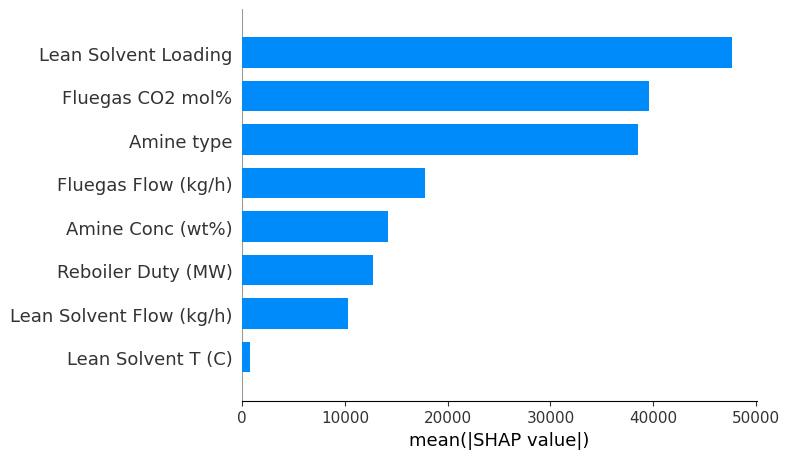

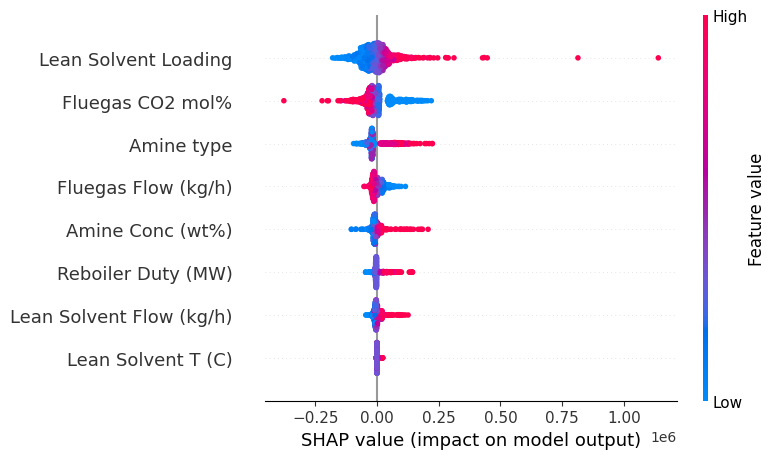

<Figure size 640x480 with 0 Axes>

In [ ]:
# --- BAR PLOT ---
shap.summary_plot(
    shap_values,
    X_test,
    plot_type="bar",
    show=False                # prevent SHAP from clearing the figure
)
plt.gca().set_xlabel("mean(|SHAP value|)")

plt.tight_layout()
plt.show()


# --- DOT PLOT ---
shap.summary_plot(shap_values, X_test)
plt.tight_layout()

In [ ]:
import matplotlib.pyplot as plt
import shap

# --- BAR PLOT ---
shap.summary_plot(shap_values, X_test, plot_type="bar", show=False)
plt.gca().set_xlabel("mean(|SHAP value|)")
plt.tight_layout()
plt.savefig("shap_sec_bar.png", dpi=600, bbox_inches='tight')
plt.close()

# --- DOT PLOT ---
shap.summary_plot(shap_values, X_test, show=False)
plt.tight_layout()
plt.savefig("shap_sec_dot.png", dpi=600, bbox_inches='tight')
plt.close()

### Purity

In [ ]:
import shap
from shap import summary_plot

# Model
# Recovery
from tensorflow import keras
from tensorflow.keras import layers

X_train = df.drop(columns=['Unnamed: 0'])
y_train3 = df_label3
X_test = ts.drop(columns=['Unnamed: 0'])
n_features = X_train.shape[1]
# Best model
ann_model1 = keras.Sequential([
    layers.Input(shape=(n_features,)),
    layers.Dense(32, activation='relu'),
    layers.Dense(72, activation='relu'),
    layers.Dense(32, activation='relu'),
    layers.Dense(1)                       # single output
])

# Compile
ann_model1.compile(optimizer=keras.optimizers.Adam(learning_rate=0.01),
                   loss='mean_absolute_error')
# fit/predict/evaluate
ann_model1.fit(X_train, y_train3, epochs=100, batch_size=32, verbose=0)


feature_names = list(df.columns[:-1])
explainer = shap.Explainer(ann_model1.predict, X_train, feature_names = feature_names)
shap_values = explainer(X_test)

348/348 ━━━━━━━━━━━━━━━━━━━━ 1s 2ms/step
789/789 ━━━━━━━━━━━━━━━━━━━━ 1s 2ms/step
28/28 ━━━━━━━━━━━━━━━━━━━━ 0s 13ms/step
763/763 ━━━━━━━━━━━━━━━━━━━━ 1s 2ms/step
28/28 ━━━━━━━━━━━━━━━━━━━━ 0s 11ms/step
352/352 ━━━━━━━━━━━━━━━━━━━━ 1s 2ms/step
26/26 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step 


ExactExplainer explainer:   0%|          | 4/886 [00:00<?, ?it/s]

357/357 ━━━━━━━━━━━━━━━━━━━━ 1s 2ms/step
26/26 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step 


ExactExplainer explainer:   1%|          | 6/886 [00:12<07:23,  1.99it/s]

356/356 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step
26/26 ━━━━━━━━━━━━━━━━━━━━ 0s 12ms/step


ExactExplainer explainer:   1%|          | 7/886 [00:13<10:50,  1.35it/s]

788/788 ━━━━━━━━━━━━━━━━━━━━ 1s 2ms/step
28/28 ━━━━━━━━━━━━━━━━━━━━ 0s 13ms/step


ExactExplainer explainer:   1%|          | 8/886 [00:15<19:51,  1.36s/it]

348/348 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step
26/26 ━━━━━━━━━━━━━━━━━━━━ 0s 11ms/step


ExactExplainer explainer:   1%|          | 9/886 [00:16<17:53,  1.22s/it]

348/348 ━━━━━━━━━━━━━━━━━━━━ 1s 2ms/step
26/26 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step 


ExactExplainer explainer:   1%|          | 10/886 [00:17<16:30,  1.13s/it]

347/347 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step
26/26 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step 


ExactExplainer explainer:   1%|          | 11/886 [00:18<14:50,  1.02s/it]

352/352 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step
26/26 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step 


ExactExplainer explainer:   1%|▏         | 12/886 [00:18<13:33,  1.07it/s]

356/356 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step
26/26 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step 


ExactExplainer explainer:   1%|▏         | 13/886 [00:19<12:37,  1.15it/s]

347/347 ━━━━━━━━━━━━━━━━━━━━ 1s 2ms/step
26/26 ━━━━━━━━━━━━━━━━━━━━ 0s 12ms/step


ExactExplainer explainer:   2%|▏         | 14/886 [00:20<14:18,  1.02it/s]

348/348 ━━━━━━━━━━━━━━━━━━━━ 1s 2ms/step
26/26 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step 


ExactExplainer explainer:   2%|▏         | 15/886 [00:21<14:13,  1.02it/s]

346/346 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step
26/26 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step 


ExactExplainer explainer:   2%|▏         | 16/886 [00:22<13:19,  1.09it/s]

348/348 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step
26/26 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step 


ExactExplainer explainer:   2%|▏         | 17/886 [00:23<12:31,  1.16it/s]

346/346 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step
26/26 ━━━━━━━━━━━━━━━━━━━━ 0s 13ms/step


ExactExplainer explainer:   2%|▏         | 18/886 [00:24<13:06,  1.10it/s]

345/345 ━━━━━━━━━━━━━━━━━━━━ 1s 2ms/step
26/26 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step 


ExactExplainer explainer:   2%|▏         | 19/886 [00:25<14:08,  1.02it/s]

352/352 ━━━━━━━━━━━━━━━━━━━━ 1s 3ms/step
26/26 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step


ExactExplainer explainer:   2%|▏         | 20/886 [00:27<16:26,  1.14s/it]

347/347 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step
26/26 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step 


ExactExplainer explainer:   2%|▏         | 21/886 [00:27<14:44,  1.02s/it]

778/778 ━━━━━━━━━━━━━━━━━━━━ 1s 2ms/step
28/28 ━━━━━━━━━━━━━━━━━━━━ 0s 10ms/step


ExactExplainer explainer:   2%|▏         | 22/886 [00:29<19:12,  1.33s/it]

348/348 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step
26/26 ━━━━━━━━━━━━━━━━━━━━ 0s 11ms/step


ExactExplainer explainer:   3%|▎         | 23/886 [00:30<17:30,  1.22s/it]

347/347 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step
26/26 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step 


ExactExplainer explainer:   3%|▎         | 24/886 [00:31<15:18,  1.07s/it]

350/350 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step
26/26 ━━━━━━━━━━━━━━━━━━━━ 0s 12ms/step


ExactExplainer explainer:   3%|▎         | 25/886 [00:32<15:14,  1.06s/it]

351/351 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step
25/25 ━━━━━━━━━━━━━━━━━━━━ 0s 12ms/step


ExactExplainer explainer:   3%|▎         | 26/886 [00:33<15:07,  1.06s/it]

352/352 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step
26/26 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step 


ExactExplainer explainer:   3%|▎         | 27/886 [00:34<13:41,  1.05it/s]

773/773 ━━━━━━━━━━━━━━━━━━━━ 1s 2ms/step
28/28 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step 


ExactExplainer explainer:   3%|▎         | 28/886 [00:36<17:27,  1.22s/it]

350/350 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step
26/26 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step 


ExactExplainer explainer:   3%|▎         | 29/886 [00:36<15:26,  1.08s/it]

347/347 ━━━━━━━━━━━━━━━━━━━━ 1s 2ms/step
26/26 ━━━━━━━━━━━━━━━━━━━━ 0s 13ms/step


ExactExplainer explainer:   3%|▎         | 30/886 [00:38<16:05,  1.13s/it]

777/777 ━━━━━━━━━━━━━━━━━━━━ 2s 2ms/step
28/28 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step 


ExactExplainer explainer:   3%|▎         | 31/886 [00:40<20:14,  1.42s/it]

347/347 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step
26/26 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step 


ExactExplainer explainer:   4%|▎         | 32/886 [00:41<17:22,  1.22s/it]

347/347 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step
26/26 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step 


ExactExplainer explainer:   4%|▎         | 33/886 [00:41<15:20,  1.08s/it]

346/346 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step
26/26 ━━━━━━━━━━━━━━━━━━━━ 0s 13ms/step


ExactExplainer explainer:   4%|▍         | 34/886 [00:42<14:58,  1.05s/it]

779/779 ━━━━━━━━━━━━━━━━━━━━ 1s 1ms/step
28/28 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step 


ExactExplainer explainer:   4%|▍         | 35/886 [00:44<17:01,  1.20s/it]

348/348 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step
26/26 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step 


ExactExplainer explainer:   4%|▍         | 36/886 [00:45<15:03,  1.06s/it]

347/347 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step
26/26 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step 


ExactExplainer explainer:   4%|▍         | 37/886 [00:45<13:35,  1.04it/s]

350/350 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step
26/26 ━━━━━━━━━━━━━━━━━━━━ 0s 12ms/step


ExactExplainer explainer:   4%|▍         | 38/886 [00:46<13:43,  1.03it/s]

774/774 ━━━━━━━━━━━━━━━━━━━━ 1s 1ms/step
28/28 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step 


ExactExplainer explainer:   4%|▍         | 39/886 [00:48<16:05,  1.14s/it]

348/348 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step
26/26 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step 


ExactExplainer explainer:   5%|▍         | 40/886 [00:49<14:26,  1.02s/it]

348/348 ━━━━━━━━━━━━━━━━━━━━ 1s 2ms/step
26/26 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step 


ExactExplainer explainer:   5%|▍         | 41/886 [00:50<14:31,  1.03s/it]

347/347 ━━━━━━━━━━━━━━━━━━━━ 1s 2ms/step
26/26 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step 


ExactExplainer explainer:   5%|▍         | 42/886 [00:51<14:35,  1.04s/it]

775/775 ━━━━━━━━━━━━━━━━━━━━ 1s 1ms/step
28/28 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step 


ExactExplainer explainer:   5%|▍         | 43/886 [00:52<16:41,  1.19s/it]

781/781 ━━━━━━━━━━━━━━━━━━━━ 1s 1ms/step
28/28 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step 


ExactExplainer explainer:   5%|▍         | 44/886 [00:54<18:12,  1.30s/it]

346/346 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step
25/25 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step 


ExactExplainer explainer:   5%|▌         | 45/886 [00:54<15:42,  1.12s/it]

348/348 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step
26/26 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step 


ExactExplainer explainer:   5%|▌         | 46/886 [00:55<14:06,  1.01s/it]

347/347 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step
26/26 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step 


ExactExplainer explainer:   5%|▌         | 47/886 [00:56<12:59,  1.08it/s]

348/348 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step
26/26 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step 


ExactExplainer explainer:   5%|▌         | 48/886 [00:57<12:07,  1.15it/s]

763/763 ━━━━━━━━━━━━━━━━━━━━ 1s 1ms/step
28/28 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step 


ExactExplainer explainer:   6%|▌         | 49/886 [00:58<14:25,  1.03s/it]

785/785 ━━━━━━━━━━━━━━━━━━━━ 1s 2ms/step
28/28 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step 


ExactExplainer explainer:   6%|▌         | 50/886 [01:00<17:46,  1.28s/it]

346/346 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step
26/26 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step


ExactExplainer explainer:   6%|▌         | 51/886 [01:01<15:52,  1.14s/it]

356/356 ━━━━━━━━━━━━━━━━━━━━ 1s 2ms/step
26/26 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step 


ExactExplainer explainer:   6%|▌         | 52/886 [01:02<17:18,  1.24s/it]

345/345 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step
26/26 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step 


ExactExplainer explainer:   6%|▌         | 53/886 [01:03<15:09,  1.09s/it]

781/781 ━━━━━━━━━━━━━━━━━━━━ 1s 1ms/step
28/28 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step 


ExactExplainer explainer:   6%|▌         | 54/886 [01:04<16:41,  1.20s/it]

348/348 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step
26/26 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step 


ExactExplainer explainer:   6%|▌         | 55/886 [01:05<14:49,  1.07s/it]

348/348 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step
26/26 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step 


ExactExplainer explainer:   6%|▋         | 56/886 [01:06<13:26,  1.03it/s]

352/352 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step
26/26 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step 


ExactExplainer explainer:   6%|▋         | 57/886 [01:07<12:27,  1.11it/s]

781/781 ━━━━━━━━━━━━━━━━━━━━ 1s 1ms/step
28/28 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step 


ExactExplainer explainer:   7%|▋         | 58/886 [01:08<14:45,  1.07s/it]

346/346 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step
25/25 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step 


ExactExplainer explainer:   7%|▋         | 59/886 [01:09<13:11,  1.04it/s]

350/350 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step
26/26 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step 


ExactExplainer explainer:   7%|▋         | 60/886 [01:10<12:14,  1.12it/s]

346/346 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step
26/26 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step 


ExactExplainer explainer:   7%|▋         | 61/886 [01:10<11:34,  1.19it/s]

349/349 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step
26/26 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step 


ExactExplainer explainer:   7%|▋         | 62/886 [01:11<11:19,  1.21it/s]

351/351 ━━━━━━━━━━━━━━━━━━━━ 1s 2ms/step
26/26 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step 


ExactExplainer explainer:   7%|▋         | 63/886 [01:12<12:24,  1.11it/s]

348/348 ━━━━━━━━━━━━━━━━━━━━ 1s 2ms/step
26/26 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step


ExactExplainer explainer:   7%|▋         | 64/886 [01:13<13:16,  1.03it/s]

357/357 ━━━━━━━━━━━━━━━━━━━━ 1s 2ms/step
26/26 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step 


ExactExplainer explainer:   7%|▋         | 65/886 [01:14<13:37,  1.00it/s]

356/356 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step
26/26 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step 


ExactExplainer explainer:   7%|▋         | 66/886 [01:15<12:33,  1.09it/s]

353/353 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step
25/25 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step 


ExactExplainer explainer:   8%|▊         | 67/886 [01:16<12:01,  1.14it/s]

351/351 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step
25/25 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step 


ExactExplainer explainer:   8%|▊         | 68/886 [01:17<11:22,  1.20it/s]

348/348 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step
26/26 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step 


ExactExplainer explainer:   8%|▊         | 69/886 [01:17<10:54,  1.25it/s]

351/351 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step
26/26 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step 


ExactExplainer explainer:   8%|▊         | 70/886 [01:18<10:36,  1.28it/s]

348/348 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step
26/26 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step 


ExactExplainer explainer:   8%|▊         | 71/886 [01:19<10:36,  1.28it/s]

352/352 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step
26/26 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step 


ExactExplainer explainer:   8%|▊         | 72/886 [01:20<10:26,  1.30it/s]

351/351 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step
26/26 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step 


ExactExplainer explainer:   8%|▊         | 73/886 [01:20<10:13,  1.32it/s]

346/346 ━━━━━━━━━━━━━━━━━━━━ 1s 2ms/step
26/26 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step 


ExactExplainer explainer:   8%|▊         | 74/886 [01:21<11:13,  1.21it/s]

348/348 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step
26/26 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step 


ExactExplainer explainer:   8%|▊         | 75/886 [01:22<10:48,  1.25it/s]

346/346 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step
25/25 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step 


ExactExplainer explainer:   9%|▊         | 76/886 [01:23<10:29,  1.29it/s]

347/347 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step
26/26 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step 


ExactExplainer explainer:   9%|▊         | 77/886 [01:24<10:21,  1.30it/s]

349/349 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step
26/26 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step 


ExactExplainer explainer:   9%|▉         | 78/886 [01:24<10:34,  1.27it/s]

775/775 ━━━━━━━━━━━━━━━━━━━━ 1s 2ms/step
28/28 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step 


ExactExplainer explainer:   9%|▉         | 79/886 [01:26<15:34,  1.16s/it]

356/356 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step
26/26 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step 


ExactExplainer explainer:   9%|▉         | 80/886 [01:27<13:53,  1.03s/it]

768/768 ━━━━━━━━━━━━━━━━━━━━ 1s 1ms/step
28/28 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step 


ExactExplainer explainer:   9%|▉         | 81/886 [01:29<15:52,  1.18s/it]

351/351 ━━━━━━━━━━━━━━━━━━━━ 1s 2ms/step
26/26 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step 


ExactExplainer explainer:   9%|▉         | 82/886 [01:30<15:15,  1.14s/it]

347/347 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step
26/26 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step 


ExactExplainer explainer:   9%|▉         | 83/886 [01:30<13:39,  1.02s/it]

349/349 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step
26/26 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step 


ExactExplainer explainer:   9%|▉         | 84/886 [01:31<12:40,  1.05it/s]

348/348 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step
26/26 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step 


ExactExplainer explainer:  10%|▉         | 85/886 [01:32<11:46,  1.13it/s]

351/351 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step
26/26 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step 


ExactExplainer explainer:  10%|▉         | 86/886 [01:33<11:13,  1.19it/s]

347/347 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step
26/26 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step 


ExactExplainer explainer:  10%|▉         | 87/886 [01:33<10:48,  1.23it/s]

346/346 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step
26/26 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step 


ExactExplainer explainer:  10%|▉         | 88/886 [01:34<10:39,  1.25it/s]

346/346 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step
26/26 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step 


ExactExplainer explainer:  10%|█         | 89/886 [01:35<10:19,  1.29it/s]

347/347 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step
25/25 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step 


ExactExplainer explainer:  10%|█         | 90/886 [01:36<10:11,  1.30it/s]

779/779 ━━━━━━━━━━━━━━━━━━━━ 1s 2ms/step
28/28 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step


ExactExplainer explainer:  10%|█         | 91/886 [01:38<14:30,  1.09s/it]

350/350 ━━━━━━━━━━━━━━━━━━━━ 1s 2ms/step
26/26 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step 


ExactExplainer explainer:  10%|█         | 92/886 [01:38<13:59,  1.06s/it]

348/348 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step
26/26 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step 


ExactExplainer explainer:  10%|█         | 93/886 [01:39<12:38,  1.04it/s]

774/774 ━━━━━━━━━━━━━━━━━━━━ 1s 1ms/step
28/28 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step 


ExactExplainer explainer:  11%|█         | 94/886 [01:41<14:33,  1.10s/it]

769/769 ━━━━━━━━━━━━━━━━━━━━ 1s 1ms/step
28/28 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step 


ExactExplainer explainer:  11%|█         | 95/886 [01:42<16:14,  1.23s/it]

347/347 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step
26/26 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step 


ExactExplainer explainer:  11%|█         | 96/886 [01:43<14:17,  1.09s/it]

357/357 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step
26/26 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step 


ExactExplainer explainer:  11%|█         | 97/886 [01:44<13:00,  1.01it/s]

788/788 ━━━━━━━━━━━━━━━━━━━━ 1s 1ms/step
28/28 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step 


ExactExplainer explainer:  11%|█         | 98/886 [01:45<14:44,  1.12s/it]

348/348 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step
26/26 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step 


ExactExplainer explainer:  11%|█         | 99/886 [01:46<13:15,  1.01s/it]

349/349 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step
26/26 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step 


ExactExplainer explainer:  11%|█▏        | 100/886 [01:47<12:11,  1.07it/s]

782/782 ━━━━━━━━━━━━━━━━━━━━ 1s 1ms/step
28/28 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step


ExactExplainer explainer:  11%|█▏        | 101/886 [01:48<15:00,  1.15s/it]

350/350 ━━━━━━━━━━━━━━━━━━━━ 1s 2ms/step
26/26 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step


ExactExplainer explainer:  12%|█▏        | 102/886 [01:49<14:34,  1.12s/it]

755/755 ━━━━━━━━━━━━━━━━━━━━ 1s 2ms/step
28/28 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step 


ExactExplainer explainer:  12%|█▏        | 103/886 [01:51<17:13,  1.32s/it]

348/348 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step
26/26 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step 


ExactExplainer explainer:  12%|█▏        | 104/886 [01:52<15:03,  1.16s/it]

348/348 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step
26/26 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step 


ExactExplainer explainer:  12%|█▏        | 105/886 [01:53<13:28,  1.03s/it]

770/770 ━━━━━━━━━━━━━━━━━━━━ 1s 1ms/step
28/28 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step 


ExactExplainer explainer:  12%|█▏        | 106/886 [01:54<15:48,  1.22s/it]

351/351 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step
26/26 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step 


ExactExplainer explainer:  12%|█▏        | 107/886 [01:55<14:06,  1.09s/it]

347/347 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step
26/26 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step 


ExactExplainer explainer:  12%|█▏        | 108/886 [01:56<12:56,  1.00it/s]

786/786 ━━━━━━━━━━━━━━━━━━━━ 1s 1ms/step
28/28 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step 


ExactExplainer explainer:  12%|█▏        | 109/886 [01:57<15:23,  1.19s/it]

347/347 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step
26/26 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step 


ExactExplainer explainer:  12%|█▏        | 110/886 [01:58<13:49,  1.07s/it]

351/351 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step
25/25 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step 


ExactExplainer explainer:  13%|█▎        | 111/886 [01:59<12:41,  1.02it/s]

348/348 ━━━━━━━━━━━━━━━━━━━━ 1s 1ms/step
26/26 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step 


ExactExplainer explainer:  13%|█▎        | 112/886 [02:00<11:55,  1.08it/s]

352/352 ━━━━━━━━━━━━━━━━━━━━ 1s 2ms/step
26/26 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step 


ExactExplainer explainer:  13%|█▎        | 113/886 [02:01<14:02,  1.09s/it]

348/348 ━━━━━━━━━━━━━━━━━━━━ 1s 2ms/step
26/26 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step 


ExactExplainer explainer:  13%|█▎        | 114/886 [02:02<13:14,  1.03s/it]

348/348 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step
26/26 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step 


ExactExplainer explainer:  13%|█▎        | 115/886 [02:03<12:07,  1.06it/s]

774/774 ━━━━━━━━━━━━━━━━━━━━ 1s 1ms/step
28/28 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step 


ExactExplainer explainer:  13%|█▎        | 116/886 [02:04<14:00,  1.09s/it]

347/347 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step
26/26 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step 


ExactExplainer explainer:  13%|█▎        | 117/886 [02:05<12:36,  1.02it/s]

774/774 ━━━━━━━━━━━━━━━━━━━━ 1s 1ms/step
28/28 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step 


ExactExplainer explainer:  13%|█▎        | 118/886 [02:07<14:21,  1.12s/it]

774/774 ━━━━━━━━━━━━━━━━━━━━ 1s 1ms/step
28/28 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step 


ExactExplainer explainer:  13%|█▎        | 119/886 [02:08<15:29,  1.21s/it]

348/348 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step
26/26 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step 


ExactExplainer explainer:  14%|█▎        | 120/886 [02:09<13:40,  1.07s/it]

349/349 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step
25/25 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step 


ExactExplainer explainer:  14%|█▎        | 121/886 [02:09<12:24,  1.03it/s]

347/347 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step
26/26 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step 


ExactExplainer explainer:  14%|█▍        | 122/886 [02:10<11:29,  1.11it/s]

347/347 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step
26/26 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step 


ExactExplainer explainer:  14%|█▍        | 123/886 [02:11<10:51,  1.17it/s]

347/347 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step
26/26 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step 


ExactExplainer explainer:  14%|█▍        | 124/886 [02:12<10:24,  1.22it/s]

346/346 ━━━━━━━━━━━━━━━━━━━━ 1s 2ms/step
26/26 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step 


ExactExplainer explainer:  14%|█▍        | 125/886 [02:13<11:18,  1.12it/s]

347/347 ━━━━━━━━━━━━━━━━━━━━ 1s 2ms/step
26/26 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step 


ExactExplainer explainer:  14%|█▍        | 126/886 [02:14<12:01,  1.05it/s]

348/348 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step
26/26 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step 


ExactExplainer explainer:  14%|█▍        | 127/886 [02:15<11:15,  1.12it/s]

776/776 ━━━━━━━━━━━━━━━━━━━━ 1s 1ms/step
28/28 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step 


ExactExplainer explainer:  14%|█▍        | 128/886 [02:16<13:44,  1.09s/it]

779/779 ━━━━━━━━━━━━━━━━━━━━ 1s 1ms/step
28/28 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step 


ExactExplainer explainer:  15%|█▍        | 129/886 [02:18<15:22,  1.22s/it]

777/777 ━━━━━━━━━━━━━━━━━━━━ 1s 1ms/step
28/28 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step 


ExactExplainer explainer:  15%|█▍        | 130/886 [02:19<16:08,  1.28s/it]

347/347 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step
26/26 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step 


ExactExplainer explainer:  15%|█▍        | 131/886 [02:20<14:10,  1.13s/it]

351/351 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step
26/26 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step 


ExactExplainer explainer:  15%|█▍        | 132/886 [02:21<12:46,  1.02s/it]

347/347 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step
25/25 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step 


ExactExplainer explainer:  15%|█▌        | 133/886 [02:21<11:42,  1.07it/s]

348/348 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step
26/26 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step 


ExactExplainer explainer:  15%|█▌        | 134/886 [02:22<11:14,  1.11it/s]

348/348 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step
26/26 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step 


ExactExplainer explainer:  15%|█▌        | 135/886 [02:23<10:40,  1.17it/s]

346/346 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step
26/26 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step 


ExactExplainer explainer:  15%|█▌        | 136/886 [02:24<10:20,  1.21it/s]

348/348 ━━━━━━━━━━━━━━━━━━━━ 1s 2ms/step
26/26 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step 


ExactExplainer explainer:  15%|█▌        | 137/886 [02:25<11:22,  1.10it/s]

353/353 ━━━━━━━━━━━━━━━━━━━━ 1s 2ms/step
26/26 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step 


ExactExplainer explainer:  16%|█▌        | 138/886 [02:26<12:09,  1.03it/s]

349/349 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step
26/26 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step 


ExactExplainer explainer:  16%|█▌        | 139/886 [02:27<11:16,  1.10it/s]

351/351 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step
25/25 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step 


ExactExplainer explainer:  16%|█▌        | 140/886 [02:27<10:42,  1.16it/s]

348/348 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step
26/26 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step 


ExactExplainer explainer:  16%|█▌        | 141/886 [02:28<10:17,  1.21it/s]

348/348 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step
26/26 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step 


ExactExplainer explainer:  16%|█▌        | 142/886 [02:29<09:53,  1.25it/s]

349/349 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step
25/25 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step 


ExactExplainer explainer:  16%|█▌        | 143/886 [02:30<09:43,  1.27it/s]

777/777 ━━━━━━━━━━━━━━━━━━━━ 1s 1ms/step
28/28 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step 


ExactExplainer explainer:  16%|█▋        | 144/886 [02:31<12:17,  1.01it/s]

347/347 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step
26/26 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step 


ExactExplainer explainer:  16%|█▋        | 145/886 [02:32<11:19,  1.09it/s]

348/348 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step
26/26 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step 


ExactExplainer explainer:  16%|█▋        | 146/886 [02:33<10:42,  1.15it/s]

757/757 ━━━━━━━━━━━━━━━━━━━━ 1s 1ms/step
28/28 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step 


ExactExplainer explainer:  17%|█▋        | 147/886 [02:34<13:24,  1.09s/it]

774/774 ━━━━━━━━━━━━━━━━━━━━ 1s 1ms/step
28/28 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step 


ExactExplainer explainer:  17%|█▋        | 148/886 [02:36<14:47,  1.20s/it]

347/347 ━━━━━━━━━━━━━━━━━━━━ 1s 2ms/step
26/26 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step 


ExactExplainer explainer:  17%|█▋        | 149/886 [02:37<15:48,  1.29s/it]

347/347 ━━━━━━━━━━━━━━━━━━━━ 1s 2ms/step
26/26 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step 


ExactExplainer explainer:  17%|█▋        | 150/886 [02:38<14:15,  1.16s/it]

349/349 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step
26/26 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step 


ExactExplainer explainer:  17%|█▋        | 151/886 [02:39<12:42,  1.04s/it]

351/351 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step
26/26 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step 


ExactExplainer explainer:  17%|█▋        | 152/886 [02:40<11:40,  1.05it/s]

347/347 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step
26/26 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step 


ExactExplainer explainer:  17%|█▋        | 153/886 [02:40<10:50,  1.13it/s]

347/347 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step
26/26 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step 


ExactExplainer explainer:  17%|█▋        | 154/886 [02:41<10:19,  1.18it/s]

777/777 ━━━━━━━━━━━━━━━━━━━━ 1s 1ms/step
28/28 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step 


ExactExplainer explainer:  17%|█▋        | 155/886 [02:43<12:35,  1.03s/it]

350/350 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step
26/26 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step 


ExactExplainer explainer:  18%|█▊        | 156/886 [02:43<11:34,  1.05it/s]

785/785 ━━━━━━━━━━━━━━━━━━━━ 1s 1ms/step
28/28 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step 


ExactExplainer explainer:  18%|█▊        | 157/886 [02:45<13:24,  1.10s/it]

348/348 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step
26/26 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step 


ExactExplainer explainer:  18%|█▊        | 158/886 [02:45<12:07,  1.00it/s]

761/761 ━━━━━━━━━━━━━━━━━━━━ 1s 1ms/step
28/28 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step 


ExactExplainer explainer:  18%|█▊        | 159/886 [02:47<14:13,  1.17s/it]

357/357 ━━━━━━━━━━━━━━━━━━━━ 1s 1ms/step
26/26 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step 


ExactExplainer explainer:  18%|█▊        | 160/886 [02:49<15:17,  1.26s/it]

753/753 ━━━━━━━━━━━━━━━━━━━━ 1s 2ms/step
28/28 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step 


ExactExplainer explainer:  18%|█▊        | 161/886 [02:50<16:53,  1.40s/it]

347/347 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step
26/26 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step 


ExactExplainer explainer:  18%|█▊        | 162/886 [02:51<14:34,  1.21s/it]

348/348 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step
26/26 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step 


ExactExplainer explainer:  18%|█▊        | 163/886 [02:52<12:53,  1.07s/it]

350/350 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step
26/26 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step 


ExactExplainer explainer:  19%|█▊        | 164/886 [02:53<11:45,  1.02it/s]

352/352 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step
26/26 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step 


ExactExplainer explainer:  19%|█▊        | 165/886 [02:53<11:01,  1.09it/s]

352/352 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step
25/25 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step 


ExactExplainer explainer:  19%|█▊        | 166/886 [02:54<10:25,  1.15it/s]

347/347 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step
26/26 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step 


ExactExplainer explainer:  19%|█▉        | 167/886 [02:55<09:56,  1.21it/s]

351/351 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step
25/25 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step 


ExactExplainer explainer:  19%|█▉        | 168/886 [02:56<09:41,  1.24it/s]

352/352 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step
26/26 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step 


ExactExplainer explainer:  19%|█▉        | 169/886 [02:56<09:27,  1.26it/s]

348/348 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step
26/26 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step 


ExactExplainer explainer:  19%|█▉        | 170/886 [02:57<09:18,  1.28it/s]

348/348 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step
25/25 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step 


ExactExplainer explainer:  19%|█▉        | 171/886 [02:58<09:09,  1.30it/s]

346/346 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step
26/26 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step 


ExactExplainer explainer:  19%|█▉        | 172/886 [02:59<09:07,  1.30it/s]

346/346 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step
26/26 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step 


ExactExplainer explainer:  20%|█▉        | 173/886 [02:59<09:38,  1.23it/s]

349/349 ━━━━━━━━━━━━━━━━━━━━ 1s 2ms/step
26/26 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step 


ExactExplainer explainer:  20%|█▉        | 174/886 [03:01<11:58,  1.01s/it]

352/352 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step
26/26 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step 


ExactExplainer explainer:  20%|█▉        | 175/886 [03:02<11:04,  1.07it/s]

351/351 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step
26/26 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step 


ExactExplainer explainer:  20%|█▉        | 176/886 [03:02<10:28,  1.13it/s]

771/771 ━━━━━━━━━━━━━━━━━━━━ 1s 1ms/step
28/28 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step 


ExactExplainer explainer:  20%|█▉        | 177/886 [03:04<12:55,  1.09s/it]

348/348 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step
26/26 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step 


ExactExplainer explainer:  20%|██        | 178/886 [03:05<11:43,  1.01it/s]

348/348 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step
26/26 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step 


ExactExplainer explainer:  20%|██        | 179/886 [03:06<10:55,  1.08it/s]

349/349 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step
26/26 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step 


ExactExplainer explainer:  20%|██        | 180/886 [03:06<10:34,  1.11it/s]

346/346 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step
26/26 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step 


ExactExplainer explainer:  20%|██        | 181/886 [03:07<09:59,  1.18it/s]

349/349 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step
26/26 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step 


ExactExplainer explainer:  21%|██        | 182/886 [03:08<09:40,  1.21it/s]

353/353 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step
26/26 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step 


ExactExplainer explainer:  21%|██        | 183/886 [03:09<09:28,  1.24it/s]

349/349 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step
26/26 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step 


ExactExplainer explainer:  21%|██        | 184/886 [03:09<09:17,  1.26it/s]

780/780 ━━━━━━━━━━━━━━━━━━━━ 1s 1ms/step
28/28 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step 


ExactExplainer explainer:  21%|██        | 185/886 [03:11<12:27,  1.07s/it]

347/347 ━━━━━━━━━━━━━━━━━━━━ 1s 2ms/step
26/26 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step 


ExactExplainer explainer:  21%|██        | 186/886 [03:13<13:52,  1.19s/it]

356/356 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step
26/26 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step 


ExactExplainer explainer:  21%|██        | 187/886 [03:13<12:20,  1.06s/it]

782/782 ━━━━━━━━━━━━━━━━━━━━ 1s 1ms/step
28/28 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step 


ExactExplainer explainer:  21%|██        | 188/886 [03:15<13:42,  1.18s/it]

347/347 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step
26/26 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step 


ExactExplainer explainer:  21%|██▏       | 189/886 [03:16<12:10,  1.05s/it]

348/348 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step
26/26 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step 


ExactExplainer explainer:  21%|██▏       | 190/886 [03:16<11:05,  1.05it/s]

346/346 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step
25/25 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step 


ExactExplainer explainer:  22%|██▏       | 191/886 [03:17<10:20,  1.12it/s]

353/353 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step
26/26 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step 


ExactExplainer explainer:  22%|██▏       | 192/886 [03:18<09:51,  1.17it/s]

351/351 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step
26/26 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step 


ExactExplainer explainer:  22%|██▏       | 193/886 [03:19<09:26,  1.22it/s]

346/346 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step
26/26 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step 


ExactExplainer explainer:  22%|██▏       | 194/886 [03:19<09:10,  1.26it/s]

348/348 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step
26/26 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step 


ExactExplainer explainer:  22%|██▏       | 195/886 [03:20<09:05,  1.27it/s]

353/353 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step
26/26 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step 


ExactExplainer explainer:  22%|██▏       | 196/886 [03:21<08:57,  1.28it/s]

346/346 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step
26/26 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step 


ExactExplainer explainer:  22%|██▏       | 197/886 [03:22<08:48,  1.30it/s]

349/349 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step
26/26 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step 


ExactExplainer explainer:  22%|██▏       | 198/886 [03:22<08:43,  1.31it/s]

346/346 ━━━━━━━━━━━━━━━━━━━━ 1s 2ms/step
26/26 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step


ExactExplainer explainer:  22%|██▏       | 199/886 [03:24<11:21,  1.01it/s]

348/348 ━━━━━━━━━━━━━━━━━━━━ 1s 2ms/step
26/26 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step 


ExactExplainer explainer:  23%|██▎       | 200/886 [03:25<11:05,  1.03it/s]

345/345 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step
26/26 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step 


ExactExplainer explainer:  23%|██▎       | 201/886 [03:26<10:21,  1.10it/s]

348/348 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step
26/26 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step 


ExactExplainer explainer:  23%|██▎       | 202/886 [03:26<09:47,  1.16it/s]

781/781 ━━━━━━━━━━━━━━━━━━━━ 1s 1ms/step
28/28 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step 


ExactExplainer explainer:  23%|██▎       | 203/886 [03:28<11:49,  1.04s/it]

783/783 ━━━━━━━━━━━━━━━━━━━━ 1s 1ms/step
28/28 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step 


ExactExplainer explainer:  23%|██▎       | 204/886 [03:29<13:41,  1.20s/it]

350/350 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step
26/26 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step 


ExactExplainer explainer:  23%|██▎       | 205/886 [03:30<12:05,  1.07s/it]

349/349 ━━━━━━━━━━━━━━━━━━━━ 1s 1ms/step
26/26 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step 


ExactExplainer explainer:  23%|██▎       | 206/886 [03:31<11:06,  1.02it/s]

757/757 ━━━━━━━━━━━━━━━━━━━━ 1s 1ms/step
28/28 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step 


ExactExplainer explainer:  23%|██▎       | 207/886 [03:32<12:37,  1.12s/it]

352/352 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step
26/26 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step 


ExactExplainer explainer:  23%|██▎       | 208/886 [03:33<11:24,  1.01s/it]

348/348 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step
26/26 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step 


ExactExplainer explainer:  24%|██▎       | 209/886 [03:34<10:31,  1.07it/s]

353/353 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step
26/26 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step


ExactExplainer explainer:  24%|██▎       | 210/886 [03:35<12:22,  1.10s/it]

780/780 ━━━━━━━━━━━━━━━━━━━━ 1s 2ms/step
28/28 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step 


ExactExplainer explainer:  24%|██▍       | 211/886 [03:37<14:15,  1.27s/it]

780/780 ━━━━━━━━━━━━━━━━━━━━ 1s 1ms/step
28/28 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step 


ExactExplainer explainer:  24%|██▍       | 212/886 [03:38<14:56,  1.33s/it]

767/767 ━━━━━━━━━━━━━━━━━━━━ 1s 1ms/step
28/28 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step 


ExactExplainer explainer:  24%|██▍       | 213/886 [03:40<15:41,  1.40s/it]

346/346 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step
26/26 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step 


ExactExplainer explainer:  24%|██▍       | 214/886 [03:41<13:34,  1.21s/it]

348/348 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step
26/26 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step 


ExactExplainer explainer:  24%|██▍       | 215/886 [03:42<11:59,  1.07s/it]

770/770 ━━━━━━━━━━━━━━━━━━━━ 1s 1ms/step
28/28 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step 


ExactExplainer explainer:  24%|██▍       | 216/886 [03:43<13:19,  1.19s/it]

347/347 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step
26/26 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step 


ExactExplainer explainer:  24%|██▍       | 217/886 [03:44<11:59,  1.07s/it]

773/773 ━━━━━━━━━━━━━━━━━━━━ 1s 1ms/step
28/28 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step 


ExactExplainer explainer:  25%|██▍       | 218/886 [03:46<14:19,  1.29s/it]

348/348 ━━━━━━━━━━━━━━━━━━━━ 1s 2ms/step
26/26 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step


ExactExplainer explainer:  25%|██▍       | 219/886 [03:47<13:17,  1.20s/it]

347/347 ━━━━━━━━━━━━━━━━━━━━ 1s 2ms/step
26/26 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step


ExactExplainer explainer:  25%|██▍       | 220/886 [03:48<13:00,  1.17s/it]

784/784 ━━━━━━━━━━━━━━━━━━━━ 1s 1ms/step
28/28 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step 


ExactExplainer explainer:  25%|██▍       | 221/886 [03:49<14:47,  1.33s/it]

347/347 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step
26/26 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step 


ExactExplainer explainer:  25%|██▌       | 222/886 [03:50<12:52,  1.16s/it]

778/778 ━━━━━━━━━━━━━━━━━━━━ 1s 1ms/step
28/28 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step 


ExactExplainer explainer:  25%|██▌       | 223/886 [03:52<14:04,  1.27s/it]

757/757 ━━━━━━━━━━━━━━━━━━━━ 1s 1ms/step
28/28 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step 


ExactExplainer explainer:  25%|██▌       | 224/886 [03:53<14:38,  1.33s/it]

348/348 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step
26/26 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step 


ExactExplainer explainer:  25%|██▌       | 225/886 [03:54<12:47,  1.16s/it]

753/753 ━━━━━━━━━━━━━━━━━━━━ 1s 1ms/step
28/28 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step 


ExactExplainer explainer:  26%|██▌       | 226/886 [03:55<13:43,  1.25s/it]

759/759 ━━━━━━━━━━━━━━━━━━━━ 1s 1ms/step
28/28 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step 


ExactExplainer explainer:  26%|██▌       | 227/886 [03:57<14:42,  1.34s/it]

352/352 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step
26/26 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step 


ExactExplainer explainer:  26%|██▌       | 228/886 [03:58<12:48,  1.17s/it]

347/347 ━━━━━━━━━━━━━━━━━━━━ 1s 2ms/step
26/26 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step


ExactExplainer explainer:  26%|██▌       | 229/886 [03:59<12:38,  1.15s/it]

347/347 ━━━━━━━━━━━━━━━━━━━━ 1s 3ms/step
26/26 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step


ExactExplainer explainer:  26%|██▌       | 230/886 [04:00<13:46,  1.26s/it]

347/347 ━━━━━━━━━━━━━━━━━━━━ 1s 2ms/step
26/26 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step 


ExactExplainer explainer:  26%|██▌       | 231/886 [04:02<13:42,  1.26s/it]

352/352 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step
26/26 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step 


ExactExplainer explainer:  26%|██▌       | 232/886 [04:02<12:02,  1.11s/it]

345/345 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step
25/25 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step 


ExactExplainer explainer:  26%|██▋       | 233/886 [04:03<10:53,  1.00s/it]

350/350 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step
26/26 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step 


ExactExplainer explainer:  26%|██▋       | 234/886 [04:04<10:05,  1.08it/s]

352/352 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step
25/25 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step 


ExactExplainer explainer:  27%|██▋       | 235/886 [04:05<09:33,  1.14it/s]

352/352 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step
26/26 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step 


ExactExplainer explainer:  27%|██▋       | 236/886 [04:05<09:16,  1.17it/s]

356/356 ━━━━━━━━━━━━━━━━━━━━ 1s 1ms/step
26/26 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step 


ExactExplainer explainer:  27%|██▋       | 237/886 [04:06<09:04,  1.19it/s]

348/348 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step
26/26 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step 


ExactExplainer explainer:  27%|██▋       | 238/886 [04:07<08:46,  1.23it/s]

346/346 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step
26/26 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step 


ExactExplainer explainer:  27%|██▋       | 239/886 [04:08<08:48,  1.22it/s]

351/351 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step
26/26 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step 


ExactExplainer explainer:  27%|██▋       | 240/886 [04:09<08:40,  1.24it/s]

771/771 ━━━━━━━━━━━━━━━━━━━━ 1s 1ms/step
28/28 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step 


ExactExplainer explainer:  27%|██▋       | 241/886 [04:10<10:46,  1.00s/it]

351/351 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step
26/26 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step 


ExactExplainer explainer:  27%|██▋       | 242/886 [04:11<10:04,  1.07it/s]

347/347 ━━━━━━━━━━━━━━━━━━━━ 1s 2ms/step
26/26 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step


ExactExplainer explainer:  27%|██▋       | 243/886 [04:12<12:01,  1.12s/it]

348/348 ━━━━━━━━━━━━━━━━━━━━ 1s 1ms/step
26/26 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step 


ExactExplainer explainer:  28%|██▊       | 244/886 [04:13<11:11,  1.05s/it]

767/767 ━━━━━━━━━━━━━━━━━━━━ 1s 1ms/step
28/28 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step 


ExactExplainer explainer:  28%|██▊       | 245/886 [04:15<12:40,  1.19s/it]

353/353 ━━━━━━━━━━━━━━━━━━━━ 1s 1ms/step
26/26 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step 


ExactExplainer explainer:  28%|██▊       | 246/886 [04:16<11:22,  1.07s/it]

768/768 ━━━━━━━━━━━━━━━━━━━━ 1s 1ms/step
28/28 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step 


ExactExplainer explainer:  28%|██▊       | 247/886 [04:17<12:35,  1.18s/it]

348/348 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step
26/26 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step 


ExactExplainer explainer:  28%|██▊       | 248/886 [04:18<11:13,  1.05s/it]

351/351 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step
26/26 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step 


ExactExplainer explainer:  28%|██▊       | 249/886 [04:18<10:14,  1.04it/s]

349/349 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step
26/26 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step 


ExactExplainer explainer:  28%|██▊       | 250/886 [04:19<09:36,  1.10it/s]

357/357 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step
26/26 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step 


ExactExplainer explainer:  28%|██▊       | 251/886 [04:20<09:11,  1.15it/s]

357/357 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step
26/26 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step 


ExactExplainer explainer:  28%|██▊       | 252/886 [04:21<08:53,  1.19it/s]

774/774 ━━━━━━━━━━━━━━━━━━━━ 1s 1ms/step
28/28 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step 


ExactExplainer explainer:  29%|██▊       | 253/886 [04:22<10:52,  1.03s/it]

344/344 ━━━━━━━━━━━━━━━━━━━━ 1s 2ms/step
26/26 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step


ExactExplainer explainer:  29%|██▊       | 254/886 [04:24<12:19,  1.17s/it]

350/350 ━━━━━━━━━━━━━━━━━━━━ 1s 2ms/step
26/26 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step 


ExactExplainer explainer:  29%|██▉       | 255/886 [04:25<11:32,  1.10s/it]

775/775 ━━━━━━━━━━━━━━━━━━━━ 1s 1ms/step
28/28 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step 


ExactExplainer explainer:  29%|██▉       | 256/886 [04:26<12:40,  1.21s/it]

352/352 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step
26/26 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step 


ExactExplainer explainer:  29%|██▉       | 257/886 [04:27<11:17,  1.08s/it]

356/356 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step
26/26 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step 


ExactExplainer explainer:  29%|██▉       | 258/886 [04:28<10:20,  1.01it/s]

348/348 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step
26/26 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step 


ExactExplainer explainer:  29%|██▉       | 259/886 [04:28<09:37,  1.09it/s]

347/347 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step
26/26 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step 


ExactExplainer explainer:  29%|██▉       | 260/886 [04:29<09:03,  1.15it/s]

352/352 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step
26/26 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step 


ExactExplainer explainer:  29%|██▉       | 261/886 [04:30<08:46,  1.19it/s]

346/346 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step
26/26 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step 


ExactExplainer explainer:  30%|██▉       | 262/886 [04:31<08:31,  1.22it/s]

346/346 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step
26/26 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step 


ExactExplainer explainer:  30%|██▉       | 263/886 [04:32<08:31,  1.22it/s]

761/761 ━━━━━━━━━━━━━━━━━━━━ 1s 1ms/step
28/28 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step 


ExactExplainer explainer:  30%|██▉       | 264/886 [04:33<10:30,  1.01s/it]

349/349 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step
26/26 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step 


ExactExplainer explainer:  30%|██▉       | 265/886 [04:34<09:45,  1.06it/s]

348/348 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step
26/26 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step 


ExactExplainer explainer:  30%|███       | 266/886 [04:35<11:32,  1.12s/it]

348/348 ━━━━━━━━━━━━━━━━━━━━ 1s 2ms/step
26/26 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step 


ExactExplainer explainer:  30%|███       | 267/886 [04:36<10:57,  1.06s/it]

782/782 ━━━━━━━━━━━━━━━━━━━━ 1s 1ms/step
28/28 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step 


ExactExplainer explainer:  30%|███       | 268/886 [04:38<12:10,  1.18s/it]

347/347 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step
26/26 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step 


ExactExplainer explainer:  30%|███       | 269/886 [04:39<10:49,  1.05s/it]

775/775 ━━━━━━━━━━━━━━━━━━━━ 1s 1ms/step
28/28 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step 


ExactExplainer explainer:  30%|███       | 270/886 [04:40<12:06,  1.18s/it]

349/349 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step
26/26 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step 


ExactExplainer explainer:  31%|███       | 271/886 [04:41<10:47,  1.05s/it]

775/775 ━━━━━━━━━━━━━━━━━━━━ 1s 1ms/step
28/28 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step 


ExactExplainer explainer:  31%|███       | 272/886 [04:42<12:10,  1.19s/it]

757/757 ━━━━━━━━━━━━━━━━━━━━ 1s 1ms/step
28/28 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step 


ExactExplainer explainer:  31%|███       | 273/886 [04:44<13:00,  1.27s/it]

347/347 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step
25/25 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step 


ExactExplainer explainer:  31%|███       | 274/886 [04:44<11:25,  1.12s/it]

773/773 ━━━━━━━━━━━━━━━━━━━━ 1s 1ms/step
28/28 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step 


ExactExplainer explainer:  31%|███       | 275/886 [04:46<12:37,  1.24s/it]

349/349 ━━━━━━━━━━━━━━━━━━━━ 1s 2ms/step
26/26 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step 


ExactExplainer explainer:  31%|███       | 276/886 [04:47<12:10,  1.20s/it]

346/346 ━━━━━━━━━━━━━━━━━━━━ 1s 2ms/step
26/26 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step 


ExactExplainer explainer:  31%|███▏      | 277/886 [04:48<11:35,  1.14s/it]

348/348 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step
26/26 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step 


ExactExplainer explainer:  31%|███▏      | 278/886 [04:49<10:21,  1.02s/it]

347/347 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step
26/26 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step 


ExactExplainer explainer:  31%|███▏      | 279/886 [04:50<09:33,  1.06it/s]

786/786 ━━━━━━━━━━━━━━━━━━━━ 1s 1ms/step
28/28 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step 


ExactExplainer explainer:  32%|███▏      | 280/886 [04:51<11:10,  1.11s/it]

346/346 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step
26/26 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step 


ExactExplainer explainer:  32%|███▏      | 281/886 [04:52<10:03,  1.00it/s]

351/351 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step
26/26 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step 


ExactExplainer explainer:  32%|███▏      | 282/886 [04:53<09:18,  1.08it/s]

773/773 ━━━━━━━━━━━━━━━━━━━━ 1s 1ms/step
28/28 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step 


ExactExplainer explainer:  32%|███▏      | 283/886 [04:54<10:57,  1.09s/it]

774/774 ━━━━━━━━━━━━━━━━━━━━ 1s 1ms/step
28/28 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step 


ExactExplainer explainer:  32%|███▏      | 284/886 [04:56<12:05,  1.20s/it]

352/352 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step
25/25 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step 


ExactExplainer explainer:  32%|███▏      | 285/886 [04:56<10:41,  1.07s/it]

351/351 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step
26/26 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step 


ExactExplainer explainer:  32%|███▏      | 286/886 [04:57<09:45,  1.03it/s]

777/777 ━━━━━━━━━━━━━━━━━━━━ 1s 1ms/step
28/28 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step


ExactExplainer explainer:  32%|███▏      | 287/886 [04:59<12:12,  1.22s/it]

348/348 ━━━━━━━━━━━━━━━━━━━━ 1s 2ms/step
26/26 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step 


ExactExplainer explainer:  33%|███▎      | 288/886 [05:00<11:46,  1.18s/it]

777/777 ━━━━━━━━━━━━━━━━━━━━ 1s 1ms/step
28/28 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step 


ExactExplainer explainer:  33%|███▎      | 289/886 [05:01<12:41,  1.28s/it]

347/347 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step
26/26 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step 


ExactExplainer explainer:  33%|███▎      | 290/886 [05:02<11:09,  1.12s/it]

356/356 ━━━━━━━━━━━━━━━━━━━━ 1s 1ms/step
26/26 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step 


ExactExplainer explainer:  33%|███▎      | 291/886 [05:03<10:11,  1.03s/it]

347/347 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step
26/26 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step 


ExactExplainer explainer:  33%|███▎      | 292/886 [05:04<09:23,  1.05it/s]

347/347 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step
26/26 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step 


ExactExplainer explainer:  33%|███▎      | 293/886 [05:05<08:48,  1.12it/s]

348/348 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step
26/26 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step 


ExactExplainer explainer:  33%|███▎      | 294/886 [05:05<08:26,  1.17it/s]

777/777 ━━━━━━━━━━━━━━━━━━━━ 1s 1ms/step
28/28 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step 


ExactExplainer explainer:  33%|███▎      | 295/886 [05:07<10:19,  1.05s/it]

350/350 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step
26/26 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step 


ExactExplainer explainer:  33%|███▎      | 296/886 [05:08<09:26,  1.04it/s]

782/782 ━━━━━━━━━━━━━━━━━━━━ 1s 1ms/step
28/28 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step 


ExactExplainer explainer:  34%|███▎      | 297/886 [05:09<10:59,  1.12s/it]

774/774 ━━━━━━━━━━━━━━━━━━━━ 1s 1ms/step
28/28 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step


ExactExplainer explainer:  34%|███▎      | 298/886 [05:11<12:52,  1.31s/it]

350/350 ━━━━━━━━━━━━━━━━━━━━ 1s 2ms/step
26/26 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step 


ExactExplainer explainer:  34%|███▎      | 299/886 [05:12<13:15,  1.35s/it]

353/353 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step
26/26 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step 


ExactExplainer explainer:  34%|███▍      | 300/886 [05:13<11:35,  1.19s/it]

352/352 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step
26/26 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step 


ExactExplainer explainer:  34%|███▍      | 301/886 [05:14<10:21,  1.06s/it]

757/757 ━━━━━━━━━━━━━━━━━━━━ 1s 1ms/step
28/28 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step 


ExactExplainer explainer:  34%|███▍      | 302/886 [05:15<11:25,  1.17s/it]

761/761 ━━━━━━━━━━━━━━━━━━━━ 1s 1ms/step
28/28 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step 


ExactExplainer explainer:  34%|███▍      | 303/886 [05:17<12:12,  1.26s/it]

348/348 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step
26/26 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step 


ExactExplainer explainer:  34%|███▍      | 304/886 [05:17<10:46,  1.11s/it]

349/349 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step
26/26 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step 


ExactExplainer explainer:  34%|███▍      | 305/886 [05:18<09:43,  1.00s/it]

349/349 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step
26/26 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step 


ExactExplainer explainer:  35%|███▍      | 306/886 [05:19<08:56,  1.08it/s]

774/774 ━━━━━━━━━━━━━━━━━━━━ 1s 1ms/step
28/28 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step 


ExactExplainer explainer:  35%|███▍      | 307/886 [05:22<14:06,  1.46s/it]

769/769 ━━━━━━━━━━━━━━━━━━━━ 1s 2ms/step
28/28 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step


ExactExplainer explainer:  35%|███▍      | 308/886 [05:24<15:49,  1.64s/it]

760/760 ━━━━━━━━━━━━━━━━━━━━ 1s 1ms/step
28/28 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step 


ExactExplainer explainer:  35%|███▍      | 309/886 [05:25<15:40,  1.63s/it]

777/777 ━━━━━━━━━━━━━━━━━━━━ 1s 1ms/step
28/28 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step 


ExactExplainer explainer:  35%|███▍      | 310/886 [05:27<15:11,  1.58s/it]

755/755 ━━━━━━━━━━━━━━━━━━━━ 1s 1ms/step
28/28 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step 


ExactExplainer explainer:  35%|███▌      | 311/886 [05:28<14:41,  1.53s/it]

352/352 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step
26/26 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step 


ExactExplainer explainer:  35%|███▌      | 312/886 [05:29<12:28,  1.30s/it]

752/752 ━━━━━━━━━━━━━━━━━━━━ 1s 1ms/step
28/28 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step 


ExactExplainer explainer:  35%|███▌      | 313/886 [05:31<13:07,  1.37s/it]

348/348 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step
26/26 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step 


ExactExplainer explainer:  35%|███▌      | 314/886 [05:31<11:22,  1.19s/it]

781/781 ━━━━━━━━━━━━━━━━━━━━ 1s 1ms/step
28/28 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step 


ExactExplainer explainer:  36%|███▌      | 315/886 [05:33<12:10,  1.28s/it]

759/759 ━━━━━━━━━━━━━━━━━━━━ 1s 1ms/step
28/28 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step


ExactExplainer explainer:  36%|███▌      | 316/886 [05:35<13:18,  1.40s/it]

346/346 ━━━━━━━━━━━━━━━━━━━━ 1s 2ms/step
26/26 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step 


ExactExplainer explainer:  36%|███▌      | 317/886 [05:36<12:23,  1.31s/it]

356/356 ━━━━━━━━━━━━━━━━━━━━ 1s 2ms/step
26/26 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step 


ExactExplainer explainer:  36%|███▌      | 318/886 [05:37<11:17,  1.19s/it]

352/352 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step
26/26 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step 


ExactExplainer explainer:  36%|███▌      | 319/886 [05:37<10:02,  1.06s/it]

351/351 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step
26/26 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step 


ExactExplainer explainer:  36%|███▌      | 320/886 [05:38<09:09,  1.03it/s]

344/344 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step
26/26 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step 


ExactExplainer explainer:  36%|███▌      | 321/886 [05:39<08:30,  1.11it/s]

348/348 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step
26/26 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step 


ExactExplainer explainer:  36%|███▋      | 322/886 [05:40<08:07,  1.16it/s]

352/352 ━━━━━━━━━━━━━━━━━━━━ 1s 1ms/step
26/26 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step 


ExactExplainer explainer:  36%|███▋      | 323/886 [05:40<07:53,  1.19it/s]

348/348 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step
26/26 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step 


ExactExplainer explainer:  37%|███▋      | 324/886 [05:41<07:38,  1.23it/s]

780/780 ━━━━━━━━━━━━━━━━━━━━ 1s 1ms/step
28/28 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step 


ExactExplainer explainer:  37%|███▋      | 325/886 [05:43<09:31,  1.02s/it]

778/778 ━━━━━━━━━━━━━━━━━━━━ 1s 1ms/step
28/28 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step 


ExactExplainer explainer:  37%|███▋      | 326/886 [05:44<11:03,  1.18s/it]

346/346 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step
26/26 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step 


ExactExplainer explainer:  37%|███▋      | 327/886 [05:45<09:50,  1.06s/it]

347/347 ━━━━━━━━━━━━━━━━━━━━ 1s 1ms/step
26/26 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step 


ExactExplainer explainer:  37%|███▋      | 328/886 [05:46<09:04,  1.03it/s]

777/777 ━━━━━━━━━━━━━━━━━━━━ 1s 2ms/step
28/28 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step 


ExactExplainer explainer:  37%|███▋      | 329/886 [05:48<13:55,  1.50s/it]

347/347 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step
26/26 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step 


ExactExplainer explainer:  37%|███▋      | 330/886 [05:49<11:50,  1.28s/it]

774/774 ━━━━━━━━━━━━━━━━━━━━ 1s 1ms/step
28/28 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step 


ExactExplainer explainer:  37%|███▋      | 331/886 [05:51<12:24,  1.34s/it]

356/356 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step
26/26 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step 


ExactExplainer explainer:  37%|███▋      | 332/886 [05:51<10:48,  1.17s/it]

346/346 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step
26/26 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step 


ExactExplainer explainer:  38%|███▊      | 333/886 [05:52<09:38,  1.05s/it]

349/349 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step
26/26 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step 


ExactExplainer explainer:  38%|███▊      | 334/886 [05:53<08:53,  1.04it/s]

775/775 ━━━━━━━━━━━━━━━━━━━━ 1s 1ms/step
28/28 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step 


ExactExplainer explainer:  38%|███▊      | 335/886 [05:55<10:27,  1.14s/it]

352/352 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step
26/26 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step 


ExactExplainer explainer:  38%|███▊      | 336/886 [05:55<09:26,  1.03s/it]

346/346 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step
26/26 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step 


ExactExplainer explainer:  38%|███▊      | 337/886 [05:56<08:39,  1.06it/s]

757/757 ━━━━━━━━━━━━━━━━━━━━ 1s 1ms/step
28/28 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step 


ExactExplainer explainer:  38%|███▊      | 338/886 [05:57<09:57,  1.09s/it]

347/347 ━━━━━━━━━━━━━━━━━━━━ 1s 2ms/step
26/26 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step 


ExactExplainer explainer:  38%|███▊      | 339/886 [05:59<11:07,  1.22s/it]

766/766 ━━━━━━━━━━━━━━━━━━━━ 1s 2ms/step
28/28 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step 


ExactExplainer explainer:  38%|███▊      | 340/886 [06:01<12:34,  1.38s/it]

775/775 ━━━━━━━━━━━━━━━━━━━━ 1s 1ms/step
28/28 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step 


ExactExplainer explainer:  38%|███▊      | 341/886 [06:02<12:54,  1.42s/it]

357/357 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step
26/26 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step 


ExactExplainer explainer:  39%|███▊      | 342/886 [06:03<11:11,  1.23s/it]

775/775 ━━━━━━━━━━━━━━━━━━━━ 1s 1ms/step
28/28 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step 


ExactExplainer explainer:  39%|███▊      | 343/886 [06:05<11:59,  1.32s/it]

348/348 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step
26/26 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step 


ExactExplainer explainer:  39%|███▉      | 344/886 [06:05<10:29,  1.16s/it]

348/348 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step
26/26 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step 


ExactExplainer explainer:  39%|███▉      | 345/886 [06:06<09:25,  1.05s/it]

347/347 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step
26/26 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step 


ExactExplainer explainer:  39%|███▉      | 346/886 [06:07<08:38,  1.04it/s]

347/347 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step
26/26 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step 


ExactExplainer explainer:  39%|███▉      | 347/886 [06:08<08:07,  1.11it/s]

347/347 ━━━━━━━━━━━━━━━━━━━━ 1s 1ms/step
26/26 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step 


ExactExplainer explainer:  39%|███▉      | 348/886 [06:08<07:47,  1.15it/s]

348/348 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step
26/26 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step 


ExactExplainer explainer:  39%|███▉      | 349/886 [06:09<07:32,  1.19it/s]

352/352 ━━━━━━━━━━━━━━━━━━━━ 1s 2ms/step
26/26 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step


ExactExplainer explainer:  40%|███▉      | 350/886 [06:10<08:04,  1.11it/s]

347/347 ━━━━━━━━━━━━━━━━━━━━ 1s 2ms/step
26/26 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step 


ExactExplainer explainer:  40%|███▉      | 351/886 [06:12<09:31,  1.07s/it]

781/781 ━━━━━━━━━━━━━━━━━━━━ 1s 1ms/step
28/28 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step 


ExactExplainer explainer:  40%|███▉      | 352/886 [06:13<10:50,  1.22s/it]

353/353 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step
26/26 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step 


ExactExplainer explainer:  40%|███▉      | 353/886 [06:14<09:38,  1.09s/it]

780/780 ━━━━━━━━━━━━━━━━━━━━ 1s 1ms/step
28/28 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step 


ExactExplainer explainer:  40%|███▉      | 354/886 [06:16<10:44,  1.21s/it]

352/352 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step
26/26 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step 


ExactExplainer explainer:  40%|████      | 355/886 [06:16<09:32,  1.08s/it]

350/350 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step
26/26 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step 


ExactExplainer explainer:  40%|████      | 356/886 [06:17<08:41,  1.02it/s]

346/346 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step
25/25 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step 


ExactExplainer explainer:  40%|████      | 357/886 [06:18<08:04,  1.09it/s]

781/781 ━━━━━━━━━━━━━━━━━━━━ 1s 1ms/step
28/28 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step 


ExactExplainer explainer:  40%|████      | 358/886 [06:19<09:32,  1.08s/it]

781/781 ━━━━━━━━━━━━━━━━━━━━ 1s 1ms/step
28/28 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step 


ExactExplainer explainer:  41%|████      | 359/886 [06:21<10:38,  1.21s/it]

771/771 ━━━━━━━━━━━━━━━━━━━━ 1s 2ms/step
28/28 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step 


ExactExplainer explainer:  41%|████      | 360/886 [06:24<14:35,  1.66s/it]

779/779 ━━━━━━━━━━━━━━━━━━━━ 1s 1ms/step
28/28 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step 


ExactExplainer explainer:  41%|████      | 361/886 [06:25<14:09,  1.62s/it]

347/347 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step
26/26 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step 


ExactExplainer explainer:  41%|████      | 362/886 [06:26<12:08,  1.39s/it]

788/788 ━━━━━━━━━━━━━━━━━━━━ 1s 1ms/step
28/28 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step 


ExactExplainer explainer:  41%|████      | 363/886 [06:27<12:25,  1.43s/it]

784/784 ━━━━━━━━━━━━━━━━━━━━ 1s 1ms/step
28/28 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step 


ExactExplainer explainer:  41%|████      | 364/886 [06:30<15:47,  1.81s/it]

354/354 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step
26/26 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step 


ExactExplainer explainer:  41%|████      | 365/886 [06:31<13:14,  1.52s/it]

348/348 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step
26/26 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step 


ExactExplainer explainer:  41%|████▏     | 366/886 [06:32<11:13,  1.30s/it]

353/353 ━━━━━━━━━━━━━━━━━━━━ 1s 1ms/step
25/25 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step 


ExactExplainer explainer:  41%|████▏     | 367/886 [06:33<09:53,  1.14s/it]

349/349 ━━━━━━━━━━━━━━━━━━━━ 1s 1ms/step
26/26 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step 


ExactExplainer explainer:  42%|████▏     | 368/886 [06:34<09:30,  1.10s/it]

774/774 ━━━━━━━━━━━━━━━━━━━━ 2s 2ms/step
28/28 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step 


ExactExplainer explainer:  42%|████▏     | 369/886 [06:36<11:46,  1.37s/it]

765/765 ━━━━━━━━━━━━━━━━━━━━ 1s 1ms/step
28/28 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step 


ExactExplainer explainer:  42%|████▏     | 370/886 [06:37<12:25,  1.45s/it]

347/347 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step
26/26 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step 


ExactExplainer explainer:  42%|████▏     | 371/886 [06:38<10:36,  1.24s/it]

348/348 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step
26/26 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step 


ExactExplainer explainer:  42%|████▏     | 372/886 [06:39<09:23,  1.10s/it]

347/347 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step
26/26 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step 


ExactExplainer explainer:  42%|████▏     | 373/886 [06:40<08:30,  1.00it/s]

345/345 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step
26/26 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step 


ExactExplainer explainer:  42%|████▏     | 374/886 [06:40<07:50,  1.09it/s]

356/356 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step
26/26 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step 


ExactExplainer explainer:  42%|████▏     | 375/886 [06:41<07:27,  1.14it/s]

349/349 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step
26/26 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step 


ExactExplainer explainer:  42%|████▏     | 376/886 [06:42<07:12,  1.18it/s]

348/348 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step
26/26 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step 


ExactExplainer explainer:  43%|████▎     | 377/886 [06:43<06:59,  1.21it/s]

347/347 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step
26/26 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step 


ExactExplainer explainer:  43%|████▎     | 378/886 [06:43<06:48,  1.24it/s]

348/348 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step
26/26 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step 


ExactExplainer explainer:  43%|████▎     | 379/886 [06:44<06:42,  1.26it/s]

355/355 ━━━━━━━━━━━━━━━━━━━━ 1s 1ms/step
26/26 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step 


ExactExplainer explainer:  43%|████▎     | 380/886 [06:45<06:50,  1.23it/s]

347/347 ━━━━━━━━━━━━━━━━━━━━ 1s 2ms/step
26/26 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step 


ExactExplainer explainer:  43%|████▎     | 381/886 [06:46<07:19,  1.15it/s]

348/348 ━━━━━━━━━━━━━━━━━━━━ 1s 2ms/step
26/26 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step 


ExactExplainer explainer:  43%|████▎     | 382/886 [06:47<07:59,  1.05it/s]

350/350 ━━━━━━━━━━━━━━━━━━━━ 1s 1ms/step
26/26 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step 


ExactExplainer explainer:  43%|████▎     | 383/886 [06:48<07:45,  1.08it/s]

353/353 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step
26/26 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step 


ExactExplainer explainer:  43%|████▎     | 384/886 [06:49<07:36,  1.10it/s]

345/345 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step
26/26 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step 


ExactExplainer explainer:  43%|████▎     | 385/886 [06:50<07:13,  1.15it/s]

346/346 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step
26/26 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step 


ExactExplainer explainer:  44%|████▎     | 386/886 [06:50<06:58,  1.19it/s]

346/346 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step
26/26 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step 


ExactExplainer explainer:  44%|████▎     | 387/886 [06:51<06:47,  1.22it/s]

357/357 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step
26/26 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step 


ExactExplainer explainer:  44%|████▍     | 388/886 [06:52<06:42,  1.24it/s]

775/775 ━━━━━━━━━━━━━━━━━━━━ 1s 1ms/step
28/28 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step 


ExactExplainer explainer:  44%|████▍     | 389/886 [06:53<08:27,  1.02s/it]

351/351 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step
26/26 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step 


ExactExplainer explainer:  44%|████▍     | 390/886 [06:54<07:53,  1.05it/s]

348/348 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step
26/26 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step 


ExactExplainer explainer:  44%|████▍     | 391/886 [06:55<07:26,  1.11it/s]

348/348 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step
26/26 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step 


ExactExplainer explainer:  44%|████▍     | 392/886 [06:56<07:07,  1.16it/s]

346/346 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step
26/26 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step 


ExactExplainer explainer:  44%|████▍     | 393/886 [06:57<06:51,  1.20it/s]

346/346 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step
26/26 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step 


ExactExplainer explainer:  44%|████▍     | 394/886 [06:57<06:48,  1.20it/s]

775/775 ━━━━━━━━━━━━━━━━━━━━ 2s 2ms/step
28/28 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step 


ExactExplainer explainer:  45%|████▍     | 395/886 [07:00<10:00,  1.22s/it]

757/757 ━━━━━━━━━━━━━━━━━━━━ 1s 1ms/step
28/28 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step 


ExactExplainer explainer:  45%|████▍     | 396/886 [07:01<10:45,  1.32s/it]

348/348 ━━━━━━━━━━━━━━━━━━━━ 1s 1ms/step
26/26 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step 


ExactExplainer explainer:  45%|████▍     | 397/886 [07:02<09:39,  1.18s/it]

346/346 ━━━━━━━━━━━━━━━━━━━━ 1s 1ms/step
26/26 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step 


ExactExplainer explainer:  45%|████▍     | 398/886 [07:03<08:44,  1.07s/it]

348/348 ━━━━━━━━━━━━━━━━━━━━ 1s 2ms/step
26/26 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step 


ExactExplainer explainer:  45%|████▌     | 399/886 [07:04<08:18,  1.02s/it]

351/351 ━━━━━━━━━━━━━━━━━━━━ 1s 1ms/step
26/26 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step 


ExactExplainer explainer:  45%|████▌     | 400/886 [07:05<07:58,  1.02it/s]

348/348 ━━━━━━━━━━━━━━━━━━━━ 1s 1ms/step
26/26 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step 


ExactExplainer explainer:  45%|████▌     | 401/886 [07:05<07:34,  1.07it/s]

347/347 ━━━━━━━━━━━━━━━━━━━━ 1s 1ms/step
26/26 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step 


ExactExplainer explainer:  45%|████▌     | 402/886 [07:06<07:29,  1.08it/s]

758/758 ━━━━━━━━━━━━━━━━━━━━ 1s 1ms/step
28/28 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step 


ExactExplainer explainer:  45%|████▌     | 403/886 [07:08<09:06,  1.13s/it]

781/781 ━━━━━━━━━━━━━━━━━━━━ 1s 1ms/step
28/28 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step


ExactExplainer explainer:  46%|████▌     | 404/886 [07:10<10:18,  1.28s/it]

356/356 ━━━━━━━━━━━━━━━━━━━━ 1s 2ms/step
26/26 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step


ExactExplainer explainer:  46%|████▌     | 405/886 [07:11<09:53,  1.23s/it]

771/771 ━━━━━━━━━━━━━━━━━━━━ 1s 2ms/step
28/28 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step 


ExactExplainer explainer:  46%|████▌     | 406/886 [07:12<11:03,  1.38s/it]

352/352 ━━━━━━━━━━━━━━━━━━━━ 1s 1ms/step
26/26 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step 


ExactExplainer explainer:  46%|████▌     | 407/886 [07:13<09:40,  1.21s/it]

347/347 ━━━━━━━━━━━━━━━━━━━━ 1s 1ms/step
26/26 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step 


ExactExplainer explainer:  46%|████▌     | 408/886 [07:14<08:38,  1.08s/it]

757/757 ━━━━━━━━━━━━━━━━━━━━ 1s 1ms/step
28/28 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step 


ExactExplainer explainer:  46%|████▌     | 409/886 [07:15<09:32,  1.20s/it]

351/351 ━━━━━━━━━━━━━━━━━━━━ 1s 1ms/step
26/26 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step 


ExactExplainer explainer:  46%|████▋     | 410/886 [07:16<08:44,  1.10s/it]

346/346 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step
26/26 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step 


ExactExplainer explainer:  46%|████▋     | 411/886 [07:17<07:57,  1.01s/it]

357/357 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step
26/26 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step 


ExactExplainer explainer:  47%|████▋     | 412/886 [07:18<07:27,  1.06it/s]

346/346 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step
26/26 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step 


ExactExplainer explainer:  47%|████▋     | 413/886 [07:19<07:01,  1.12it/s]

352/352 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step
26/26 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step 


ExactExplainer explainer:  47%|████▋     | 414/886 [07:19<06:45,  1.16it/s]

347/347 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step
26/26 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step 


ExactExplainer explainer:  47%|████▋     | 415/886 [07:20<06:44,  1.16it/s]

352/352 ━━━━━━━━━━━━━━━━━━━━ 1s 1ms/step
26/26 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step 


ExactExplainer explainer:  47%|████▋     | 416/886 [07:21<06:34,  1.19it/s]

352/352 ━━━━━━━━━━━━━━━━━━━━ 1s 2ms/step
26/26 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step


ExactExplainer explainer:  47%|████▋     | 417/886 [07:22<06:54,  1.13it/s]

770/770 ━━━━━━━━━━━━━━━━━━━━ 1s 2ms/step
28/28 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step 


ExactExplainer explainer:  47%|████▋     | 418/886 [07:24<09:26,  1.21s/it]

353/353 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step
26/26 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step 


ExactExplainer explainer:  47%|████▋     | 419/886 [07:25<08:24,  1.08s/it]

347/347 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step
26/26 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step 


ExactExplainer explainer:  47%|████▋     | 420/886 [07:26<07:42,  1.01it/s]

790/790 ━━━━━━━━━━━━━━━━━━━━ 1s 1ms/step
28/28 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step 


ExactExplainer explainer:  48%|████▊     | 421/886 [07:27<09:12,  1.19s/it]

775/775 ━━━━━━━━━━━━━━━━━━━━ 1s 1ms/step
28/28 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step 


ExactExplainer explainer:  48%|████▊     | 422/886 [07:29<09:51,  1.28s/it]

348/348 ━━━━━━━━━━━━━━━━━━━━ 1s 1ms/step
26/26 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step 


ExactExplainer explainer:  48%|████▊     | 423/886 [07:30<08:43,  1.13s/it]

347/347 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step
26/26 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step 


ExactExplainer explainer:  48%|████▊     | 424/886 [07:30<07:55,  1.03s/it]

346/346 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step
26/26 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step 


ExactExplainer explainer:  48%|████▊     | 425/886 [07:31<07:28,  1.03it/s]

348/348 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step
26/26 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step 


ExactExplainer explainer:  48%|████▊     | 426/886 [07:32<07:00,  1.09it/s]

352/352 ━━━━━━━━━━━━━━━━━━━━ 1s 1ms/step
26/26 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step 


ExactExplainer explainer:  48%|████▊     | 427/886 [07:33<08:11,  1.07s/it]

781/781 ━━━━━━━━━━━━━━━━━━━━ 1s 2ms/step
28/28 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step 


ExactExplainer explainer:  48%|████▊     | 428/886 [07:36<11:57,  1.57s/it]

759/759 ━━━━━━━━━━━━━━━━━━━━ 1s 1ms/step
28/28 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step 


ExactExplainer explainer:  48%|████▊     | 429/886 [07:38<11:50,  1.56s/it]

346/346 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step
26/26 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step 


ExactExplainer explainer:  49%|████▊     | 430/886 [07:38<10:01,  1.32s/it]

348/348 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step
26/26 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step 


ExactExplainer explainer:  49%|████▊     | 431/886 [07:39<08:46,  1.16s/it]

348/348 ━━━━━━━━━━━━━━━━━━━━ 1s 1ms/step
26/26 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step 


ExactExplainer explainer:  49%|████▉     | 432/886 [07:40<08:05,  1.07s/it]

351/351 ━━━━━━━━━━━━━━━━━━━━ 1s 1ms/step
26/26 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step 


ExactExplainer explainer:  49%|████▉     | 433/886 [07:41<07:26,  1.02it/s]

356/356 ━━━━━━━━━━━━━━━━━━━━ 1s 1ms/step
26/26 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step 


ExactExplainer explainer:  49%|████▉     | 434/886 [07:42<07:10,  1.05it/s]

353/353 ━━━━━━━━━━━━━━━━━━━━ 1s 1ms/step
26/26 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step 


ExactExplainer explainer:  49%|████▉     | 435/886 [07:43<06:47,  1.11it/s]

774/774 ━━━━━━━━━━━━━━━━━━━━ 1s 1ms/step
28/28 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step 


ExactExplainer explainer:  49%|████▉     | 436/886 [07:44<08:11,  1.09s/it]

349/349 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step
26/26 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step 


ExactExplainer explainer:  49%|████▉     | 437/886 [07:45<07:30,  1.00s/it]

349/349 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step
26/26 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step 


ExactExplainer explainer:  49%|████▉     | 438/886 [07:46<07:09,  1.04it/s]

349/349 ━━━━━━━━━━━━━━━━━━━━ 1s 2ms/step
26/26 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step


ExactExplainer explainer:  50%|████▉     | 439/886 [07:47<08:25,  1.13s/it]

347/347 ━━━━━━━━━━━━━━━━━━━━ 1s 1ms/step
26/26 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step 


ExactExplainer explainer:  50%|████▉     | 440/886 [07:48<07:44,  1.04s/it]

348/348 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step
26/26 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step 


ExactExplainer explainer:  50%|████▉     | 441/886 [07:49<07:15,  1.02it/s]

755/755 ━━━━━━━━━━━━━━━━━━━━ 1s 1ms/step
28/28 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step 


ExactExplainer explainer:  50%|████▉     | 442/886 [07:50<08:20,  1.13s/it]

788/788 ━━━━━━━━━━━━━━━━━━━━ 1s 1ms/step
28/28 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step 


ExactExplainer explainer:  50%|█████     | 443/886 [07:52<09:20,  1.27s/it]

352/352 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step
26/26 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step 


ExactExplainer explainer:  50%|█████     | 444/886 [07:53<08:13,  1.12s/it]

346/346 ━━━━━━━━━━━━━━━━━━━━ 1s 1ms/step
25/25 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step 


ExactExplainer explainer:  50%|█████     | 445/886 [07:54<07:28,  1.02s/it]

784/784 ━━━━━━━━━━━━━━━━━━━━ 1s 1ms/step
28/28 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step 


ExactExplainer explainer:  50%|█████     | 446/886 [07:55<08:33,  1.17s/it]

349/349 ━━━━━━━━━━━━━━━━━━━━ 1s 1ms/step
25/25 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step 


ExactExplainer explainer:  50%|█████     | 447/886 [07:56<07:42,  1.05s/it]

348/348 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step
26/26 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step 


ExactExplainer explainer:  51%|█████     | 448/886 [07:57<07:05,  1.03it/s]

779/779 ━━━━━━━━━━━━━━━━━━━━ 1s 2ms/step
28/28 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step 


ExactExplainer explainer:  51%|█████     | 449/886 [07:59<09:08,  1.26s/it]

778/778 ━━━━━━━━━━━━━━━━━━━━ 1s 2ms/step
28/28 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step 


ExactExplainer explainer:  51%|█████     | 450/886 [08:01<12:30,  1.72s/it]

347/347 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step
26/26 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step 


ExactExplainer explainer:  51%|█████     | 451/886 [08:02<10:22,  1.43s/it]

347/347 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step
26/26 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step 


ExactExplainer explainer:  51%|█████     | 452/886 [08:03<08:53,  1.23s/it]

769/769 ━━━━━━━━━━━━━━━━━━━━ 1s 1ms/step
28/28 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step 


ExactExplainer explainer:  51%|█████     | 453/886 [08:04<09:24,  1.30s/it]

766/766 ━━━━━━━━━━━━━━━━━━━━ 1s 1ms/step
28/28 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step 


ExactExplainer explainer:  51%|█████     | 454/886 [08:06<09:45,  1.36s/it]

347/347 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step
26/26 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step 


ExactExplainer explainer:  51%|█████▏    | 455/886 [08:07<08:39,  1.21s/it]

348/348 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step
26/26 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step 


ExactExplainer explainer:  51%|█████▏    | 456/886 [08:07<07:41,  1.07s/it]

356/356 ━━━━━━━━━━━━━━━━━━━━ 1s 1ms/step
26/26 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step 


ExactExplainer explainer:  52%|█████▏    | 457/886 [08:08<07:10,  1.00s/it]

352/352 ━━━━━━━━━━━━━━━━━━━━ 1s 1ms/step
25/25 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step 


ExactExplainer explainer:  52%|█████▏    | 458/886 [08:09<06:42,  1.06it/s]

349/349 ━━━━━━━━━━━━━━━━━━━━ 1s 2ms/step
26/26 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step 


ExactExplainer explainer:  52%|█████▏    | 459/886 [08:10<06:44,  1.05it/s]

348/348 ━━━━━━━━━━━━━━━━━━━━ 1s 2ms/step
26/26 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step


ExactExplainer explainer:  52%|█████▏    | 460/886 [08:11<07:08,  1.01s/it]

348/348 ━━━━━━━━━━━━━━━━━━━━ 1s 2ms/step
26/26 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step 


ExactExplainer explainer:  52%|█████▏    | 461/886 [08:12<06:54,  1.03it/s]

347/347 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step
26/26 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step 


ExactExplainer explainer:  52%|█████▏    | 462/886 [08:13<06:27,  1.09it/s]

348/348 ━━━━━━━━━━━━━━━━━━━━ 1s 1ms/step
25/25 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step 


ExactExplainer explainer:  52%|█████▏    | 463/886 [08:14<06:10,  1.14it/s]

346/346 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step
26/26 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step 


ExactExplainer explainer:  52%|█████▏    | 464/886 [08:14<05:57,  1.18it/s]

347/347 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step
26/26 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step 


ExactExplainer explainer:  52%|█████▏    | 465/886 [08:15<05:49,  1.20it/s]

346/346 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step
26/26 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step 


ExactExplainer explainer:  53%|█████▎    | 466/886 [08:16<05:43,  1.22it/s]

348/348 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step
26/26 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step 


ExactExplainer explainer:  53%|█████▎    | 467/886 [08:17<05:34,  1.25it/s]

775/775 ━━━━━━━━━━━━━━━━━━━━ 1s 1ms/step
28/28 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step 


ExactExplainer explainer:  53%|█████▎    | 468/886 [08:18<07:04,  1.02s/it]

349/349 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step
26/26 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step 


ExactExplainer explainer:  53%|█████▎    | 469/886 [08:19<06:34,  1.06it/s]

352/352 ━━━━━━━━━━━━━━━━━━━━ 1s 1ms/step
26/26 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step 


ExactExplainer explainer:  53%|█████▎    | 470/886 [08:20<06:14,  1.11it/s]

347/347 ━━━━━━━━━━━━━━━━━━━━ 1s 1ms/step
26/26 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step 


ExactExplainer explainer:  53%|█████▎    | 471/886 [08:21<06:00,  1.15it/s]

348/348 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step
26/26 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step 


ExactExplainer explainer:  53%|█████▎    | 472/886 [08:21<05:49,  1.18it/s]

766/766 ━━━━━━━━━━━━━━━━━━━━ 1s 2ms/step
28/28 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step 


ExactExplainer explainer:  53%|█████▎    | 473/886 [08:24<08:27,  1.23s/it]

348/348 ━━━━━━━━━━━━━━━━━━━━ 1s 1ms/step
25/25 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step 


ExactExplainer explainer:  53%|█████▎    | 474/886 [08:24<07:34,  1.10s/it]

347/347 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step
26/26 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step 


ExactExplainer explainer:  54%|█████▎    | 475/886 [08:25<07:00,  1.02s/it]

347/347 ━━━━━━━━━━━━━━━━━━━━ 1s 1ms/step
26/26 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step 


ExactExplainer explainer:  54%|█████▎    | 476/886 [08:26<06:30,  1.05it/s]

346/346 ━━━━━━━━━━━━━━━━━━━━ 1s 1ms/step
26/26 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step 


ExactExplainer explainer:  54%|█████▍    | 477/886 [08:27<06:10,  1.11it/s]

353/353 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step
26/26 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step 


ExactExplainer explainer:  54%|█████▍    | 478/886 [08:28<05:55,  1.15it/s]

351/351 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step
26/26 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step 


ExactExplainer explainer:  54%|█████▍    | 479/886 [08:28<05:42,  1.19it/s]

348/348 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step
25/25 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step 


ExactExplainer explainer:  54%|█████▍    | 480/886 [08:29<05:33,  1.22it/s]

351/351 ━━━━━━━━━━━━━━━━━━━━ 1s 1ms/step
26/26 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step 


ExactExplainer explainer:  54%|█████▍    | 481/886 [08:30<05:28,  1.23it/s]

775/775 ━━━━━━━━━━━━━━━━━━━━ 1s 1ms/step
28/28 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step 


ExactExplainer explainer:  54%|█████▍    | 482/886 [08:31<06:49,  1.01s/it]

774/774 ━━━━━━━━━━━━━━━━━━━━ 1s 1ms/step
28/28 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step 


ExactExplainer explainer:  55%|█████▍    | 483/886 [08:33<07:46,  1.16s/it]

773/773 ━━━━━━━━━━━━━━━━━━━━ 1s 2ms/step
28/28 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step 


ExactExplainer explainer:  55%|█████▍    | 484/886 [08:36<10:54,  1.63s/it]

752/752 ━━━━━━━━━━━━━━━━━━━━ 1s 1ms/step
28/28 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step 


ExactExplainer explainer:  55%|█████▍    | 485/886 [08:37<10:33,  1.58s/it]

352/352 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step
26/26 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step 


ExactExplainer explainer:  55%|█████▍    | 486/886 [08:38<08:59,  1.35s/it]

775/775 ━━━━━━━━━━━━━━━━━━━━ 1s 1ms/step
28/28 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step 


ExactExplainer explainer:  55%|█████▍    | 487/886 [08:39<09:15,  1.39s/it]

357/357 ━━━━━━━━━━━━━━━━━━━━ 1s 1ms/step
26/26 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step 


ExactExplainer explainer:  55%|█████▌    | 488/886 [08:40<08:03,  1.22s/it]

348/348 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step
26/26 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step 


ExactExplainer explainer:  55%|█████▌    | 489/886 [08:41<07:11,  1.09s/it]

348/348 ━━━━━━━━━━━━━━━━━━━━ 1s 1ms/step
26/26 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step 


ExactExplainer explainer:  55%|█████▌    | 490/886 [08:42<06:34,  1.00it/s]

780/780 ━━━━━━━━━━━━━━━━━━━━ 1s 1ms/step
28/28 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step 


ExactExplainer explainer:  55%|█████▌    | 491/886 [08:43<07:36,  1.16s/it]

352/352 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step
25/25 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step 


ExactExplainer explainer:  56%|█████▌    | 492/886 [08:44<06:51,  1.04s/it]

347/347 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step
26/26 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step 


ExactExplainer explainer:  56%|█████▌    | 493/886 [08:45<06:20,  1.03it/s]

777/777 ━━━━━━━━━━━━━━━━━━━━ 1s 2ms/step
28/28 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step


ExactExplainer explainer:  56%|█████▌    | 494/886 [08:47<08:16,  1.27s/it]

346/346 ━━━━━━━━━━━━━━━━━━━━ 1s 2ms/step
26/26 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step 


ExactExplainer explainer:  56%|█████▌    | 495/886 [08:48<07:43,  1.19s/it]

782/782 ━━━━━━━━━━━━━━━━━━━━ 1s 1ms/step
28/28 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step 


ExactExplainer explainer:  56%|█████▌    | 496/886 [08:49<08:20,  1.28s/it]

776/776 ━━━━━━━━━━━━━━━━━━━━ 1s 1ms/step
28/28 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step 


ExactExplainer explainer:  56%|█████▌    | 497/886 [08:51<08:42,  1.34s/it]

353/353 ━━━━━━━━━━━━━━━━━━━━ 1s 1ms/step
26/26 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step 


ExactExplainer explainer:  56%|█████▌    | 498/886 [08:52<07:37,  1.18s/it]

347/347 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step
26/26 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step 


ExactExplainer explainer:  56%|█████▋    | 499/886 [08:52<06:49,  1.06s/it]

346/346 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step
26/26 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step 


ExactExplainer explainer:  56%|█████▋    | 500/886 [08:53<06:14,  1.03it/s]

348/348 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step
26/26 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step 


ExactExplainer explainer:  57%|█████▋    | 501/886 [08:54<05:53,  1.09it/s]

347/347 ━━━━━━━━━━━━━━━━━━━━ 1s 1ms/step
26/26 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step 


ExactExplainer explainer:  57%|█████▋    | 502/886 [08:55<05:37,  1.14it/s]

351/351 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step
26/26 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step 


ExactExplainer explainer:  57%|█████▋    | 503/886 [08:56<05:29,  1.16it/s]

348/348 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step
26/26 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step 


ExactExplainer explainer:  57%|█████▋    | 504/886 [08:56<05:18,  1.20it/s]

348/348 ━━━━━━━━━━━━━━━━━━━━ 1s 1ms/step
26/26 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step 


ExactExplainer explainer:  57%|█████▋    | 505/886 [08:57<05:13,  1.21it/s]

346/346 ━━━━━━━━━━━━━━━━━━━━ 1s 2ms/step
26/26 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step


ExactExplainer explainer:  57%|█████▋    | 506/886 [08:58<05:34,  1.14it/s]

779/779 ━━━━━━━━━━━━━━━━━━━━ 1s 2ms/step
28/28 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step 


ExactExplainer explainer:  57%|█████▋    | 507/886 [09:00<07:34,  1.20s/it]

349/349 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step
26/26 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step 


ExactExplainer explainer:  57%|█████▋    | 508/886 [09:01<06:49,  1.08s/it]

352/352 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step
26/26 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step 


ExactExplainer explainer:  57%|█████▋    | 509/886 [09:02<06:13,  1.01it/s]

357/357 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step
26/26 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step 


ExactExplainer explainer:  58%|█████▊    | 510/886 [09:02<05:50,  1.07it/s]

356/356 ━━━━━━━━━━━━━━━━━━━━ 1s 1ms/step
26/26 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step 


ExactExplainer explainer:  58%|█████▊    | 511/886 [09:03<05:37,  1.11it/s]

351/351 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step
26/26 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step 


ExactExplainer explainer:  58%|█████▊    | 512/886 [09:04<05:24,  1.15it/s]

347/347 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step
26/26 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step 


ExactExplainer explainer:  58%|█████▊    | 513/886 [09:05<05:15,  1.18it/s]

782/782 ━━━━━━━━━━━━━━━━━━━━ 1s 1ms/step
28/28 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step 


ExactExplainer explainer:  58%|█████▊    | 514/886 [09:06<06:31,  1.05s/it]

758/758 ━━━━━━━━━━━━━━━━━━━━ 1s 1ms/step
28/28 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step 


ExactExplainer explainer:  58%|█████▊    | 515/886 [09:08<07:21,  1.19s/it]

351/351 ━━━━━━━━━━━━━━━━━━━━ 1s 1ms/step
25/25 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step 


ExactExplainer explainer:  58%|█████▊    | 516/886 [09:09<06:36,  1.07s/it]

350/350 ━━━━━━━━━━━━━━━━━━━━ 1s 1ms/step
26/26 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step 


ExactExplainer explainer:  58%|█████▊    | 517/886 [09:10<06:06,  1.01it/s]

782/782 ━━━━━━━━━━━━━━━━━━━━ 1s 2ms/step
28/28 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step


ExactExplainer explainer:  58%|█████▊    | 518/886 [09:12<08:11,  1.34s/it]

347/347 ━━━━━━━━━━━━━━━━━━━━ 1s 2ms/step
26/26 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step 


ExactExplainer explainer:  59%|█████▊    | 519/886 [09:13<07:18,  1.20s/it]

357/357 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step
26/26 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step 


ExactExplainer explainer:  59%|█████▊    | 520/886 [09:13<06:34,  1.08s/it]

353/353 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step
26/26 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step 


ExactExplainer explainer:  59%|█████▉    | 521/886 [09:14<06:08,  1.01s/it]

781/781 ━━━━━━━━━━━━━━━━━━━━ 1s 1ms/step
28/28 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step 


ExactExplainer explainer:  59%|█████▉    | 522/886 [09:16<07:05,  1.17s/it]

773/773 ━━━━━━━━━━━━━━━━━━━━ 1s 1ms/step
28/28 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step 


ExactExplainer explainer:  59%|█████▉    | 523/886 [09:17<07:43,  1.28s/it]

347/347 ━━━━━━━━━━━━━━━━━━━━ 1s 1ms/step
25/25 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step 


ExactExplainer explainer:  59%|█████▉    | 524/886 [09:18<06:57,  1.15s/it]

351/351 ━━━━━━━━━━━━━━━━━━━━ 1s 1ms/step
26/26 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step 


ExactExplainer explainer:  59%|█████▉    | 525/886 [09:19<06:18,  1.05s/it]

347/347 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step
26/26 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step 


ExactExplainer explainer:  59%|█████▉    | 526/886 [09:20<05:48,  1.03it/s]

345/345 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step
26/26 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step


ExactExplainer explainer:  59%|█████▉    | 527/886 [09:21<05:30,  1.09it/s]

778/778 ━━━━━━━━━━━━━━━━━━━━ 1s 1ms/step
28/28 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step


ExactExplainer explainer:  60%|█████▉    | 528/886 [09:22<06:44,  1.13s/it]

346/346 ━━━━━━━━━━━━━━━━━━━━ 1s 2ms/step
26/26 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step


ExactExplainer explainer:  60%|█████▉    | 529/886 [09:24<07:29,  1.26s/it]

343/343 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step
25/25 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step 


ExactExplainer explainer:  60%|█████▉    | 530/886 [09:24<06:39,  1.12s/it]

347/347 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step
26/26 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step 


ExactExplainer explainer:  60%|█████▉    | 531/886 [09:25<06:02,  1.02s/it]

351/351 ━━━━━━━━━━━━━━━━━━━━ 1s 1ms/step
26/26 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step 


ExactExplainer explainer:  60%|██████    | 532/886 [09:26<05:38,  1.04it/s]

349/349 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step
26/26 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step 


ExactExplainer explainer:  60%|██████    | 533/886 [09:27<05:18,  1.11it/s]

350/350 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step
26/26 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step 


ExactExplainer explainer:  60%|██████    | 534/886 [09:28<05:02,  1.16it/s]

778/778 ━━━━━━━━━━━━━━━━━━━━ 1s 1ms/step
28/28 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step 


ExactExplainer explainer:  60%|██████    | 535/886 [09:29<06:10,  1.06s/it]

351/351 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step
26/26 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step 


ExactExplainer explainer:  60%|██████    | 536/886 [09:30<05:41,  1.02it/s]

781/781 ━━━━━━━━━━━━━━━━━━━━ 1s 1ms/step
28/28 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step 


ExactExplainer explainer:  61%|██████    | 537/886 [09:31<06:36,  1.14s/it]

352/352 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step
26/26 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step 


ExactExplainer explainer:  61%|██████    | 538/886 [09:32<06:05,  1.05s/it]

349/349 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step
26/26 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step 


ExactExplainer explainer:  61%|██████    | 539/886 [09:33<05:37,  1.03it/s]

347/347 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step
26/26 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step 


ExactExplainer explainer:  61%|██████    | 540/886 [09:34<05:31,  1.04it/s]

352/352 ━━━━━━━━━━━━━━━━━━━━ 1s 2ms/step
26/26 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step


ExactExplainer explainer:  61%|██████    | 541/886 [09:35<05:51,  1.02s/it]

769/769 ━━━━━━━━━━━━━━━━━━━━ 1s 2ms/step
28/28 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step 


ExactExplainer explainer:  61%|██████    | 542/886 [09:38<08:50,  1.54s/it]

347/347 ━━━━━━━━━━━━━━━━━━━━ 1s 1ms/step
26/26 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step 


ExactExplainer explainer:  61%|██████▏   | 543/886 [09:39<07:31,  1.32s/it]

352/352 ━━━━━━━━━━━━━━━━━━━━ 1s 1ms/step
26/26 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step 


ExactExplainer explainer:  61%|██████▏   | 544/886 [09:40<06:40,  1.17s/it]

347/347 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step
26/26 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step 


ExactExplainer explainer:  62%|██████▏   | 545/886 [09:41<07:05,  1.25s/it]

778/778 ━━━━━━━━━━━━━━━━━━━━ 1s 1ms/step
28/28 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step 


ExactExplainer explainer:  62%|██████▏   | 546/886 [09:43<07:35,  1.34s/it]

348/348 ━━━━━━━━━━━━━━━━━━━━ 1s 1ms/step
26/26 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step 


ExactExplainer explainer:  62%|██████▏   | 547/886 [09:43<06:40,  1.18s/it]

350/350 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step
25/25 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step 


ExactExplainer explainer:  62%|██████▏   | 548/886 [09:44<05:57,  1.06s/it]

768/768 ━━━━━━━━━━━━━━━━━━━━ 1s 1ms/step
28/28 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step 


ExactExplainer explainer:  62%|██████▏   | 549/886 [09:46<06:45,  1.20s/it]

347/347 ━━━━━━━━━━━━━━━━━━━━ 1s 2ms/step
26/26 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step


ExactExplainer explainer:  62%|██████▏   | 550/886 [09:47<06:37,  1.18s/it]

348/348 ━━━━━━━━━━━━━━━━━━━━ 1s 2ms/step
26/26 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step


ExactExplainer explainer:  62%|██████▏   | 551/886 [09:48<06:34,  1.18s/it]

348/348 ━━━━━━━━━━━━━━━━━━━━ 1s 1ms/step
26/26 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step 


ExactExplainer explainer:  62%|██████▏   | 552/886 [09:49<05:58,  1.07s/it]

348/348 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step
26/26 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step 


ExactExplainer explainer:  62%|██████▏   | 553/886 [09:50<05:29,  1.01it/s]

347/347 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step
26/26 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step 


ExactExplainer explainer:  63%|██████▎   | 554/886 [09:50<05:08,  1.08it/s]

347/347 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step
26/26 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step 


ExactExplainer explainer:  63%|██████▎   | 555/886 [09:51<04:52,  1.13it/s]

346/346 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step
26/26 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step 


ExactExplainer explainer:  63%|██████▎   | 556/886 [09:52<04:41,  1.17it/s]

778/778 ━━━━━━━━━━━━━━━━━━━━ 1s 1ms/step
28/28 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step 


ExactExplainer explainer:  63%|██████▎   | 557/886 [09:54<05:54,  1.08s/it]

346/346 ━━━━━━━━━━━━━━━━━━━━ 1s 1ms/step
26/26 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step 


ExactExplainer explainer:  63%|██████▎   | 558/886 [09:54<05:25,  1.01it/s]

348/348 ━━━━━━━━━━━━━━━━━━━━ 1s 1ms/step
26/26 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step 


ExactExplainer explainer:  63%|██████▎   | 559/886 [09:55<05:05,  1.07it/s]

782/782 ━━━━━━━━━━━━━━━━━━━━ 1s 1ms/step
28/28 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step 


ExactExplainer explainer:  63%|██████▎   | 560/886 [09:57<06:02,  1.11s/it]

346/346 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step
26/26 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step 


ExactExplainer explainer:  63%|██████▎   | 561/886 [09:57<05:27,  1.01s/it]

347/347 ━━━━━━━━━━━━━━━━━━━━ 1s 1ms/step
26/26 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step


ExactExplainer explainer:  63%|██████▎   | 562/886 [09:58<05:17,  1.02it/s]

348/348 ━━━━━━━━━━━━━━━━━━━━ 1s 2ms/step
26/26 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step


ExactExplainer explainer:  64%|██████▎   | 563/886 [10:00<06:08,  1.14s/it]

757/757 ━━━━━━━━━━━━━━━━━━━━ 1s 1ms/step
28/28 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step 


ExactExplainer explainer:  64%|██████▎   | 564/886 [10:01<06:45,  1.26s/it]

769/769 ━━━━━━━━━━━━━━━━━━━━ 1s 1ms/step
28/28 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step 


ExactExplainer explainer:  64%|██████▍   | 565/886 [10:03<07:08,  1.33s/it]

347/347 ━━━━━━━━━━━━━━━━━━━━ 1s 1ms/step
26/26 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step 


ExactExplainer explainer:  64%|██████▍   | 566/886 [10:04<06:16,  1.18s/it]

790/790 ━━━━━━━━━━━━━━━━━━━━ 1s 1ms/step
28/28 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step 


ExactExplainer explainer:  64%|██████▍   | 567/886 [10:05<06:55,  1.30s/it]

351/351 ━━━━━━━━━━━━━━━━━━━━ 1s 1ms/step
26/26 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step 


ExactExplainer explainer:  64%|██████▍   | 568/886 [10:06<06:13,  1.17s/it]

349/349 ━━━━━━━━━━━━━━━━━━━━ 1s 1ms/step
26/26 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step 


ExactExplainer explainer:  64%|██████▍   | 569/886 [10:07<05:35,  1.06s/it]

350/350 ━━━━━━━━━━━━━━━━━━━━ 1s 1ms/step
26/26 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step 


ExactExplainer explainer:  64%|██████▍   | 570/886 [10:08<05:10,  1.02it/s]

347/347 ━━━━━━━━━━━━━━━━━━━━ 1s 1ms/step
26/26 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step 


ExactExplainer explainer:  64%|██████▍   | 571/886 [10:09<04:53,  1.08it/s]

349/349 ━━━━━━━━━━━━━━━━━━━━ 1s 1ms/step
26/26 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step 


ExactExplainer explainer:  65%|██████▍   | 572/886 [10:09<04:41,  1.12it/s]

345/345 ━━━━━━━━━━━━━━━━━━━━ 1s 2ms/step
26/26 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step


ExactExplainer explainer:  65%|██████▍   | 573/886 [10:11<05:37,  1.08s/it]

346/346 ━━━━━━━━━━━━━━━━━━━━ 1s 2ms/step
26/26 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step


ExactExplainer explainer:  65%|██████▍   | 574/886 [10:12<06:08,  1.18s/it]

351/351 ━━━━━━━━━━━━━━━━━━━━ 1s 2ms/step
26/26 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step 


ExactExplainer explainer:  65%|██████▍   | 575/886 [10:14<06:35,  1.27s/it]

348/348 ━━━━━━━━━━━━━━━━━━━━ 1s 1ms/step
26/26 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step 


ExactExplainer explainer:  65%|██████▌   | 576/886 [10:15<05:57,  1.15s/it]

350/350 ━━━━━━━━━━━━━━━━━━━━ 1s 1ms/step
26/26 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step 


ExactExplainer explainer:  65%|██████▌   | 577/886 [10:15<05:24,  1.05s/it]

348/348 ━━━━━━━━━━━━━━━━━━━━ 1s 1ms/step
26/26 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step 


ExactExplainer explainer:  65%|██████▌   | 578/886 [10:16<05:01,  1.02it/s]

346/346 ━━━━━━━━━━━━━━━━━━━━ 1s 1ms/step
26/26 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step 


ExactExplainer explainer:  65%|██████▌   | 579/886 [10:17<04:52,  1.05it/s]

347/347 ━━━━━━━━━━━━━━━━━━━━ 1s 1ms/step
26/26 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step 


ExactExplainer explainer:  65%|██████▌   | 580/886 [10:18<04:37,  1.10it/s]

781/781 ━━━━━━━━━━━━━━━━━━━━ 1s 1ms/step
28/28 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step 


ExactExplainer explainer:  66%|██████▌   | 581/886 [10:19<05:32,  1.09s/it]

347/347 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step
26/26 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step 


ExactExplainer explainer:  66%|██████▌   | 582/886 [10:20<05:03,  1.00it/s]

770/770 ━━━━━━━━━━━━━━━━━━━━ 1s 1ms/step
28/28 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step 


ExactExplainer explainer:  66%|██████▌   | 583/886 [10:22<05:48,  1.15s/it]

347/347 ━━━━━━━━━━━━━━━━━━━━ 1s 1ms/step
26/26 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step


ExactExplainer explainer:  66%|██████▌   | 584/886 [10:23<05:28,  1.09s/it]

354/354 ━━━━━━━━━━━━━━━━━━━━ 1s 2ms/step
26/26 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step 


ExactExplainer explainer:  66%|██████▌   | 585/886 [10:24<05:33,  1.11s/it]

347/347 ━━━━━━━━━━━━━━━━━━━━ 1s 2ms/step
26/26 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step 


ExactExplainer explainer:  66%|██████▌   | 586/886 [10:25<05:24,  1.08s/it]

779/779 ━━━━━━━━━━━━━━━━━━━━ 1s 1ms/step
28/28 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step 


ExactExplainer explainer:  66%|██████▋   | 587/886 [10:26<06:06,  1.23s/it]

348/348 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step
26/26 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step 


ExactExplainer explainer:  66%|██████▋   | 588/886 [10:27<05:27,  1.10s/it]

347/347 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step
26/26 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step 


ExactExplainer explainer:  66%|██████▋   | 589/886 [10:28<04:56,  1.00it/s]

347/347 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step
26/26 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step 


ExactExplainer explainer:  67%|██████▋   | 590/886 [10:29<04:37,  1.07it/s]

347/347 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step
26/26 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step 


ExactExplainer explainer:  67%|██████▋   | 591/886 [10:30<04:22,  1.12it/s]

357/357 ━━━━━━━━━━━━━━━━━━━━ 1s 1ms/step
26/26 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step 


ExactExplainer explainer:  67%|██████▋   | 592/886 [10:30<04:13,  1.16it/s]

347/347 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step
26/26 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step 


ExactExplainer explainer:  67%|██████▋   | 593/886 [10:31<04:04,  1.20it/s]

759/759 ━━━━━━━━━━━━━━━━━━━━ 1s 1ms/step
28/28 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step 


ExactExplainer explainer:  67%|██████▋   | 594/886 [10:33<05:02,  1.04s/it]

344/344 ━━━━━━━━━━━━━━━━━━━━ 1s 1ms/step
25/25 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step 


ExactExplainer explainer:  67%|██████▋   | 595/886 [10:33<04:41,  1.04it/s]

348/348 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step
26/26 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step 


ExactExplainer explainer:  67%|██████▋   | 596/886 [10:34<04:25,  1.09it/s]

769/769 ━━━━━━━━━━━━━━━━━━━━ 1s 2ms/step
28/28 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step


ExactExplainer explainer:  67%|██████▋   | 597/886 [10:36<06:00,  1.25s/it]

352/352 ━━━━━━━━━━━━━━━━━━━━ 1s 2ms/step
26/26 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step 


ExactExplainer explainer:  67%|██████▋   | 598/886 [10:38<06:16,  1.31s/it]

759/759 ━━━━━━━━━━━━━━━━━━━━ 1s 1ms/step
28/28 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step 


ExactExplainer explainer:  68%|██████▊   | 599/886 [10:39<06:38,  1.39s/it]

773/773 ━━━━━━━━━━━━━━━━━━━━ 1s 1ms/step
28/28 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step 


ExactExplainer explainer:  68%|██████▊   | 600/886 [10:41<06:49,  1.43s/it]

779/779 ━━━━━━━━━━━━━━━━━━━━ 1s 1ms/step
28/28 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step 


ExactExplainer explainer:  68%|██████▊   | 601/886 [10:42<07:03,  1.49s/it]

781/781 ━━━━━━━━━━━━━━━━━━━━ 1s 1ms/step
28/28 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step 


ExactExplainer explainer:  68%|██████▊   | 602/886 [10:44<07:05,  1.50s/it]

765/765 ━━━━━━━━━━━━━━━━━━━━ 1s 1ms/step
28/28 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step 


ExactExplainer explainer:  68%|██████▊   | 603/886 [10:46<07:05,  1.50s/it]

348/348 ━━━━━━━━━━━━━━━━━━━━ 1s 1ms/step
26/26 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step 


ExactExplainer explainer:  68%|██████▊   | 604/886 [10:46<06:04,  1.29s/it]

346/346 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step
25/25 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step


ExactExplainer explainer:  68%|██████▊   | 605/886 [10:47<05:33,  1.19s/it]

348/348 ━━━━━━━━━━━━━━━━━━━━ 1s 2ms/step
26/26 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step


ExactExplainer explainer:  68%|██████▊   | 606/886 [10:48<05:23,  1.16s/it]

347/347 ━━━━━━━━━━━━━━━━━━━━ 1s 2ms/step
26/26 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step 


ExactExplainer explainer:  69%|██████▊   | 607/886 [10:49<05:20,  1.15s/it]

777/777 ━━━━━━━━━━━━━━━━━━━━ 1s 1ms/step
28/28 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step 


ExactExplainer explainer:  69%|██████▊   | 608/886 [10:51<05:50,  1.26s/it]

352/352 ━━━━━━━━━━━━━━━━━━━━ 1s 1ms/step
26/26 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step 


ExactExplainer explainer:  69%|██████▊   | 609/886 [10:52<05:11,  1.13s/it]

348/348 ━━━━━━━━━━━━━━━━━━━━ 1s 1ms/step
25/25 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step 


ExactExplainer explainer:  69%|██████▉   | 610/886 [10:53<04:42,  1.02s/it]

348/348 ━━━━━━━━━━━━━━━━━━━━ 1s 1ms/step
25/25 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step 


ExactExplainer explainer:  69%|██████▉   | 611/886 [10:53<04:23,  1.04it/s]

351/351 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step
26/26 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step 


ExactExplainer explainer:  69%|██████▉   | 612/886 [10:54<04:09,  1.10it/s]

348/348 ━━━━━━━━━━━━━━━━━━━━ 1s 1ms/step
26/26 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step 


ExactExplainer explainer:  69%|██████▉   | 613/886 [10:55<03:58,  1.14it/s]

353/353 ━━━━━━━━━━━━━━━━━━━━ 1s 1ms/step
26/26 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step 


ExactExplainer explainer:  69%|██████▉   | 614/886 [10:56<03:52,  1.17it/s]

347/347 ━━━━━━━━━━━━━━━━━━━━ 1s 1ms/step
26/26 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step 


ExactExplainer explainer:  69%|██████▉   | 615/886 [10:57<03:53,  1.16it/s]

771/771 ━━━━━━━━━━━━━━━━━━━━ 1s 1ms/step
28/28 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step 


ExactExplainer explainer:  70%|██████▉   | 616/886 [10:58<04:45,  1.06s/it]

346/346 ━━━━━━━━━━━━━━━━━━━━ 1s 1ms/step
26/26 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step 


ExactExplainer explainer:  70%|██████▉   | 617/886 [10:59<04:23,  1.02it/s]

347/347 ━━━━━━━━━━━━━━━━━━━━ 1s 2ms/step
26/26 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step


ExactExplainer explainer:  70%|██████▉   | 618/886 [11:00<05:04,  1.14s/it]

349/349 ━━━━━━━━━━━━━━━━━━━━ 1s 2ms/step
26/26 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step 


ExactExplainer explainer:  70%|██████▉   | 619/886 [11:02<05:29,  1.23s/it]

346/346 ━━━━━━━━━━━━━━━━━━━━ 1s 1ms/step
26/26 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step 


ExactExplainer explainer:  70%|██████▉   | 620/886 [11:03<04:53,  1.10s/it]

348/348 ━━━━━━━━━━━━━━━━━━━━ 1s 1ms/step
26/26 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step 


ExactExplainer explainer:  70%|███████   | 621/886 [11:04<04:28,  1.01s/it]

347/347 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step
26/26 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step 


ExactExplainer explainer:  70%|███████   | 622/886 [11:04<04:08,  1.06it/s]

352/352 ━━━━━━━━━━━━━━━━━━━━ 1s 1ms/step
26/26 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step 


ExactExplainer explainer:  70%|███████   | 623/886 [11:05<03:56,  1.11it/s]

349/349 ━━━━━━━━━━━━━━━━━━━━ 1s 1ms/step
26/26 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step 


ExactExplainer explainer:  70%|███████   | 624/886 [11:06<03:49,  1.14it/s]

778/778 ━━━━━━━━━━━━━━━━━━━━ 1s 1ms/step
28/28 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step 


ExactExplainer explainer:  71%|███████   | 625/886 [11:07<04:39,  1.07s/it]

348/348 ━━━━━━━━━━━━━━━━━━━━ 1s 1ms/step
26/26 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step 


ExactExplainer explainer:  71%|███████   | 626/886 [11:08<04:17,  1.01it/s]

352/352 ━━━━━━━━━━━━━━━━━━━━ 1s 1ms/step
26/26 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step 


ExactExplainer explainer:  71%|███████   | 627/886 [11:09<04:02,  1.07it/s]

772/772 ━━━━━━━━━━━━━━━━━━━━ 1s 1ms/step
28/28 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step 


ExactExplainer explainer:  71%|███████   | 628/886 [11:11<04:58,  1.16s/it]

771/771 ━━━━━━━━━━━━━━━━━━━━ 1s 2ms/step
28/28 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step 


ExactExplainer explainer:  71%|███████   | 629/886 [11:13<06:57,  1.63s/it]

770/770 ━━━━━━━━━━━━━━━━━━━━ 1s 1ms/step
28/28 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step 


ExactExplainer explainer:  71%|███████   | 630/886 [11:15<06:47,  1.59s/it]

352/352 ━━━━━━━━━━━━━━━━━━━━ 1s 1ms/step
25/25 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step 


ExactExplainer explainer:  71%|███████   | 631/886 [11:16<05:45,  1.35s/it]

779/779 ━━━━━━━━━━━━━━━━━━━━ 1s 1ms/step
28/28 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step 


ExactExplainer explainer:  71%|███████▏  | 632/886 [11:17<06:00,  1.42s/it]

352/352 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step
26/26 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step 


ExactExplainer explainer:  71%|███████▏  | 633/886 [11:18<05:11,  1.23s/it]

351/351 ━━━━━━━━━━━━━━━━━━━━ 1s 1ms/step
26/26 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step 


ExactExplainer explainer:  72%|███████▏  | 634/886 [11:19<04:37,  1.10s/it]

347/347 ━━━━━━━━━━━━━━━━━━━━ 1s 1ms/step
26/26 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step 


ExactExplainer explainer:  72%|███████▏  | 635/886 [11:20<04:13,  1.01s/it]

350/350 ━━━━━━━━━━━━━━━━━━━━ 1s 1ms/step
25/25 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step 


ExactExplainer explainer:  72%|███████▏  | 636/886 [11:21<03:55,  1.06it/s]

348/348 ━━━━━━━━━━━━━━━━━━━━ 1s 1ms/step
26/26 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step 


ExactExplainer explainer:  72%|███████▏  | 637/886 [11:21<03:45,  1.10it/s]

349/349 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step
26/26 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step 


ExactExplainer explainer:  72%|███████▏  | 638/886 [11:22<03:36,  1.15it/s]

346/346 ━━━━━━━━━━━━━━━━━━━━ 1s 1ms/step
26/26 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step 


ExactExplainer explainer:  72%|███████▏  | 639/886 [11:23<03:30,  1.17it/s]

350/350 ━━━━━━━━━━━━━━━━━━━━ 1s 2ms/step
26/26 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step


ExactExplainer explainer:  72%|███████▏  | 640/886 [11:24<03:52,  1.06it/s]

346/346 ━━━━━━━━━━━━━━━━━━━━ 1s 2ms/step
25/25 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step 


ExactExplainer explainer:  72%|███████▏  | 641/886 [11:25<04:05,  1.00s/it]

769/769 ━━━━━━━━━━━━━━━━━━━━ 1s 1ms/step
28/28 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step 


ExactExplainer explainer:  72%|███████▏  | 642/886 [11:27<04:43,  1.16s/it]

350/350 ━━━━━━━━━━━━━━━━━━━━ 1s 1ms/step
26/26 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step 


ExactExplainer explainer:  73%|███████▎  | 643/886 [11:28<04:16,  1.05s/it]

347/347 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step
26/26 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step 


ExactExplainer explainer:  73%|███████▎  | 644/886 [11:28<03:55,  1.03it/s]

777/777 ━━━━━━━━━━━━━━━━━━━━ 1s 1ms/step
28/28 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step 


ExactExplainer explainer:  73%|███████▎  | 645/886 [11:30<04:38,  1.15s/it]

352/352 ━━━━━━━━━━━━━━━━━━━━ 1s 1ms/step
26/26 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step 


ExactExplainer explainer:  73%|███████▎  | 646/886 [11:31<04:11,  1.05s/it]

778/778 ━━━━━━━━━━━━━━━━━━━━ 1s 1ms/step
28/28 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step 


ExactExplainer explainer:  73%|███████▎  | 647/886 [11:32<04:46,  1.20s/it]

346/346 ━━━━━━━━━━━━━━━━━━━━ 1s 1ms/step
26/26 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step 


ExactExplainer explainer:  73%|███████▎  | 648/886 [11:33<04:18,  1.09s/it]

348/348 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step
26/26 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step 


ExactExplainer explainer:  73%|███████▎  | 649/886 [11:34<03:57,  1.00s/it]

775/775 ━━━━━━━━━━━━━━━━━━━━ 1s 1ms/step
28/28 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step


ExactExplainer explainer:  73%|███████▎  | 650/886 [11:36<04:44,  1.21s/it]

785/785 ━━━━━━━━━━━━━━━━━━━━ 2s 2ms/step
28/28 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step 


ExactExplainer explainer:  73%|███████▎  | 651/886 [11:38<05:47,  1.48s/it]

347/347 ━━━━━━━━━━━━━━━━━━━━ 1s 1ms/step
26/26 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step 


ExactExplainer explainer:  74%|███████▎  | 652/886 [11:39<04:58,  1.28s/it]

346/346 ━━━━━━━━━━━━━━━━━━━━ 1s 1ms/step
26/26 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step 


ExactExplainer explainer:  74%|███████▎  | 653/886 [11:39<04:28,  1.15s/it]

348/348 ━━━━━━━━━━━━━━━━━━━━ 1s 1ms/step
26/26 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step 


ExactExplainer explainer:  74%|███████▍  | 654/886 [11:40<04:03,  1.05s/it]

775/775 ━━━━━━━━━━━━━━━━━━━━ 1s 1ms/step
28/28 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step 


ExactExplainer explainer:  74%|███████▍  | 655/886 [11:42<04:37,  1.20s/it]

348/348 ━━━━━━━━━━━━━━━━━━━━ 1s 1ms/step
26/26 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step 


ExactExplainer explainer:  74%|███████▍  | 656/886 [11:43<04:13,  1.10s/it]

783/783 ━━━━━━━━━━━━━━━━━━━━ 1s 1ms/step
28/28 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step 


ExactExplainer explainer:  74%|███████▍  | 657/886 [11:44<04:43,  1.24s/it]

346/346 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step
26/26 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step 


ExactExplainer explainer:  74%|███████▍  | 658/886 [11:45<04:11,  1.10s/it]

779/779 ━━━━━━━━━━━━━━━━━━━━ 1s 1ms/step
28/28 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step 


ExactExplainer explainer:  74%|███████▍  | 659/886 [11:47<04:41,  1.24s/it]

352/352 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step
26/26 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step 


ExactExplainer explainer:  74%|███████▍  | 660/886 [11:47<04:10,  1.11s/it]

771/771 ━━━━━━━━━━━━━━━━━━━━ 1s 2ms/step
28/28 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step


ExactExplainer explainer:  75%|███████▍  | 661/886 [11:49<05:20,  1.42s/it]

787/787 ━━━━━━━━━━━━━━━━━━━━ 1s 1ms/step
28/28 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step 


ExactExplainer explainer:  75%|███████▍  | 662/886 [11:51<05:43,  1.53s/it]

352/352 ━━━━━━━━━━━━━━━━━━━━ 1s 1ms/step
26/26 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step 


ExactExplainer explainer:  75%|███████▍  | 663/886 [11:52<04:53,  1.32s/it]

348/348 ━━━━━━━━━━━━━━━━━━━━ 1s 1ms/step
26/26 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step 


ExactExplainer explainer:  75%|███████▍  | 664/886 [11:53<04:17,  1.16s/it]

348/348 ━━━━━━━━━━━━━━━━━━━━ 1s 1ms/step
26/26 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step 


ExactExplainer explainer:  75%|███████▌  | 665/886 [11:54<03:53,  1.05s/it]

350/350 ━━━━━━━━━━━━━━━━━━━━ 1s 1ms/step
26/26 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step 


ExactExplainer explainer:  75%|███████▌  | 666/886 [11:54<03:35,  1.02it/s]

355/355 ━━━━━━━━━━━━━━━━━━━━ 1s 1ms/step
26/26 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step 


ExactExplainer explainer:  75%|███████▌  | 667/886 [11:55<03:23,  1.08it/s]

346/346 ━━━━━━━━━━━━━━━━━━━━ 1s 1ms/step
26/26 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step 


ExactExplainer explainer:  75%|███████▌  | 668/886 [11:56<03:14,  1.12it/s]

782/782 ━━━━━━━━━━━━━━━━━━━━ 1s 1ms/step
28/28 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step 


ExactExplainer explainer:  76%|███████▌  | 669/886 [11:58<03:54,  1.08s/it]

770/770 ━━━━━━━━━━━━━━━━━━━━ 1s 1ms/step
28/28 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step 


ExactExplainer explainer:  76%|███████▌  | 670/886 [11:59<04:23,  1.22s/it]

355/355 ━━━━━━━━━━━━━━━━━━━━ 1s 1ms/step
26/26 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step


ExactExplainer explainer:  76%|███████▌  | 671/886 [12:01<04:40,  1.30s/it]

349/349 ━━━━━━━━━━━━━━━━━━━━ 1s 2ms/step
26/26 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step 


ExactExplainer explainer:  76%|███████▌  | 672/886 [12:02<04:26,  1.25s/it]

791/791 ━━━━━━━━━━━━━━━━━━━━ 1s 1ms/step
28/28 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step 


ExactExplainer explainer:  76%|███████▌  | 673/886 [12:04<04:58,  1.40s/it]

768/768 ━━━━━━━━━━━━━━━━━━━━ 1s 1ms/step
28/28 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step 


ExactExplainer explainer:  76%|███████▌  | 674/886 [12:05<05:03,  1.43s/it]

346/346 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step
25/25 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step 


ExactExplainer explainer:  76%|███████▌  | 675/886 [12:06<04:25,  1.26s/it]

348/348 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step
26/26 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step 


ExactExplainer explainer:  76%|███████▋  | 676/886 [12:07<03:54,  1.12s/it]

349/349 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step
26/26 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step 


ExactExplainer explainer:  76%|███████▋  | 677/886 [12:07<03:32,  1.02s/it]

346/346 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step
26/26 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step 


ExactExplainer explainer:  77%|███████▋  | 678/886 [12:08<03:17,  1.05it/s]

351/351 ━━━━━━━━━━━━━━━━━━━━ 1s 1ms/step
26/26 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step 


ExactExplainer explainer:  77%|███████▋  | 679/886 [12:09<03:11,  1.08it/s]

355/355 ━━━━━━━━━━━━━━━━━━━━ 1s 1ms/step
26/26 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step 


ExactExplainer explainer:  77%|███████▋  | 680/886 [12:10<03:05,  1.11it/s]

347/347 ━━━━━━━━━━━━━━━━━━━━ 1s 1ms/step
26/26 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step 


ExactExplainer explainer:  77%|███████▋  | 681/886 [12:11<03:04,  1.11it/s]

347/347 ━━━━━━━━━━━━━━━━━━━━ 1s 1ms/step
26/26 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step 


ExactExplainer explainer:  77%|███████▋  | 682/886 [12:12<03:10,  1.07it/s]

347/347 ━━━━━━━━━━━━━━━━━━━━ 1s 2ms/step
26/26 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step 


ExactExplainer explainer:  77%|███████▋  | 683/886 [12:13<03:23,  1.00s/it]

778/778 ━━━━━━━━━━━━━━━━━━━━ 1s 2ms/step
28/28 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step 


ExactExplainer explainer:  77%|███████▋  | 684/886 [12:15<04:12,  1.25s/it]

351/351 ━━━━━━━━━━━━━━━━━━━━ 1s 2ms/step
26/26 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step 


ExactExplainer explainer:  77%|███████▋  | 685/886 [12:16<03:47,  1.13s/it]

349/349 ━━━━━━━━━━━━━━━━━━━━ 1s 1ms/step
26/26 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step 


ExactExplainer explainer:  77%|███████▋  | 686/886 [12:17<03:28,  1.04s/it]

761/761 ━━━━━━━━━━━━━━━━━━━━ 1s 1ms/step
28/28 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step 


ExactExplainer explainer:  78%|███████▊  | 687/886 [12:18<04:01,  1.21s/it]

768/768 ━━━━━━━━━━━━━━━━━━━━ 1s 1ms/step
28/28 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step 


ExactExplainer explainer:  78%|███████▊  | 688/886 [12:20<04:22,  1.33s/it]

352/352 ━━━━━━━━━━━━━━━━━━━━ 1s 1ms/step
26/26 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step 


ExactExplainer explainer:  78%|███████▊  | 689/886 [12:21<03:55,  1.20s/it]

348/348 ━━━━━━━━━━━━━━━━━━━━ 1s 1ms/step
26/26 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step 


ExactExplainer explainer:  78%|███████▊  | 690/886 [12:22<03:36,  1.10s/it]

348/348 ━━━━━━━━━━━━━━━━━━━━ 1s 1ms/step
26/26 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step 


ExactExplainer explainer:  78%|███████▊  | 691/886 [12:22<03:18,  1.02s/it]

346/346 ━━━━━━━━━━━━━━━━━━━━ 1s 1ms/step
26/26 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step 


ExactExplainer explainer:  78%|███████▊  | 692/886 [12:23<03:06,  1.04it/s]

775/775 ━━━━━━━━━━━━━━━━━━━━ 1s 2ms/step
28/28 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step 


ExactExplainer explainer:  78%|███████▊  | 693/886 [12:25<04:06,  1.28s/it]

347/347 ━━━━━━━━━━━━━━━━━━━━ 1s 2ms/step
26/26 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step 


ExactExplainer explainer:  78%|███████▊  | 694/886 [12:26<03:51,  1.21s/it]

766/766 ━━━━━━━━━━━━━━━━━━━━ 1s 1ms/step
28/28 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step 


ExactExplainer explainer:  78%|███████▊  | 695/886 [12:28<04:11,  1.32s/it]

779/779 ━━━━━━━━━━━━━━━━━━━━ 1s 1ms/step
28/28 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step 


ExactExplainer explainer:  79%|███████▊  | 696/886 [12:29<04:22,  1.38s/it]

356/356 ━━━━━━━━━━━━━━━━━━━━ 1s 1ms/step
26/26 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step 


ExactExplainer explainer:  79%|███████▊  | 697/886 [12:30<03:48,  1.21s/it]

777/777 ━━━━━━━━━━━━━━━━━━━━ 1s 1ms/step
28/28 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step 


ExactExplainer explainer:  79%|███████▉  | 698/886 [12:32<04:05,  1.31s/it]

775/775 ━━━━━━━━━━━━━━━━━━━━ 1s 1ms/step
28/28 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step 


ExactExplainer explainer:  79%|███████▉  | 699/886 [12:33<04:18,  1.38s/it]

347/347 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step
25/25 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step 


ExactExplainer explainer:  79%|███████▉  | 700/886 [12:34<03:43,  1.20s/it]

349/349 ━━━━━━━━━━━━━━━━━━━━ 1s 1ms/step
26/26 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step 


ExactExplainer explainer:  79%|███████▉  | 701/886 [12:35<03:24,  1.10s/it]

753/753 ━━━━━━━━━━━━━━━━━━━━ 1s 2ms/step
28/28 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step 


ExactExplainer explainer:  79%|███████▉  | 702/886 [12:37<03:59,  1.30s/it]

353/353 ━━━━━━━━━━━━━━━━━━━━ 1s 2ms/step
26/26 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step 


ExactExplainer explainer:  79%|███████▉  | 703/886 [12:38<03:49,  1.25s/it]

790/790 ━━━━━━━━━━━━━━━━━━━━ 1s 2ms/step
28/28 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step 


ExactExplainer explainer:  79%|███████▉  | 704/886 [12:40<04:12,  1.39s/it]

348/348 ━━━━━━━━━━━━━━━━━━━━ 1s 1ms/step
26/26 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step 


ExactExplainer explainer:  80%|███████▉  | 705/886 [12:40<03:42,  1.23s/it]

351/351 ━━━━━━━━━━━━━━━━━━━━ 1s 1ms/step
26/26 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step 


ExactExplainer explainer:  80%|███████▉  | 706/886 [12:41<03:22,  1.13s/it]

348/348 ━━━━━━━━━━━━━━━━━━━━ 1s 1ms/step
26/26 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step 


ExactExplainer explainer:  80%|███████▉  | 707/886 [12:42<03:07,  1.05s/it]

353/353 ━━━━━━━━━━━━━━━━━━━━ 1s 1ms/step
26/26 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step 


ExactExplainer explainer:  80%|███████▉  | 708/886 [12:43<02:57,  1.00it/s]

348/348 ━━━━━━━━━━━━━━━━━━━━ 1s 1ms/step
25/25 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step 


ExactExplainer explainer:  80%|████████  | 709/886 [12:44<02:46,  1.06it/s]

349/349 ━━━━━━━━━━━━━━━━━━━━ 1s 1ms/step
26/26 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step 


ExactExplainer explainer:  80%|████████  | 710/886 [12:45<02:38,  1.11it/s]

757/757 ━━━━━━━━━━━━━━━━━━━━ 1s 1ms/step
28/28 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step 


ExactExplainer explainer:  80%|████████  | 711/886 [12:46<03:14,  1.11s/it]

356/356 ━━━━━━━━━━━━━━━━━━━━ 1s 1ms/step
26/26 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step 


ExactExplainer explainer:  80%|████████  | 712/886 [12:47<03:01,  1.04s/it]

352/352 ━━━━━━━━━━━━━━━━━━━━ 1s 1ms/step
26/26 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step 


ExactExplainer explainer:  80%|████████  | 713/886 [12:48<02:48,  1.03it/s]

348/348 ━━━━━━━━━━━━━━━━━━━━ 1s 2ms/step
26/26 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step 


ExactExplainer explainer:  81%|████████  | 714/886 [12:49<03:13,  1.13s/it]

767/767 ━━━━━━━━━━━━━━━━━━━━ 1s 2ms/step
28/28 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step 


ExactExplainer explainer:  81%|████████  | 715/886 [12:51<03:44,  1.31s/it]

345/345 ━━━━━━━━━━━━━━━━━━━━ 1s 1ms/step
26/26 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step 


ExactExplainer explainer:  81%|████████  | 716/886 [12:52<03:21,  1.18s/it]

352/352 ━━━━━━━━━━━━━━━━━━━━ 1s 1ms/step
26/26 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step 


ExactExplainer explainer:  81%|████████  | 717/886 [12:53<03:04,  1.09s/it]

346/346 ━━━━━━━━━━━━━━━━━━━━ 1s 1ms/step
26/26 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step 


ExactExplainer explainer:  81%|████████  | 718/886 [12:54<02:49,  1.01s/it]

786/786 ━━━━━━━━━━━━━━━━━━━━ 1s 1ms/step
28/28 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step 


ExactExplainer explainer:  81%|████████  | 719/886 [12:55<03:16,  1.18s/it]

775/775 ━━━━━━━━━━━━━━━━━━━━ 1s 1ms/step
28/28 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step 


ExactExplainer explainer:  81%|████████▏ | 720/886 [12:57<03:33,  1.29s/it]

782/782 ━━━━━━━━━━━━━━━━━━━━ 1s 1ms/step
28/28 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step 


ExactExplainer explainer:  81%|████████▏ | 721/886 [12:58<03:47,  1.38s/it]

348/348 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step
26/26 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step 


ExactExplainer explainer:  81%|████████▏ | 722/886 [12:59<03:17,  1.20s/it]

347/347 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step
26/26 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step 


ExactExplainer explainer:  82%|████████▏ | 723/886 [13:00<02:55,  1.08s/it]

778/778 ━━━━━━━━━━━━━━━━━━━━ 2s 2ms/step
28/28 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step


ExactExplainer explainer:  82%|████████▏ | 724/886 [13:02<03:55,  1.45s/it]

767/767 ━━━━━━━━━━━━━━━━━━━━ 1s 1ms/step
28/28 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step 


ExactExplainer explainer:  82%|████████▏ | 725/886 [13:04<03:57,  1.47s/it]

348/348 ━━━━━━━━━━━━━━━━━━━━ 1s 1ms/step
26/26 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step 


ExactExplainer explainer:  82%|████████▏ | 726/886 [13:05<03:24,  1.28s/it]

347/347 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step
26/26 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step 


ExactExplainer explainer:  82%|████████▏ | 727/886 [13:06<03:00,  1.14s/it]

352/352 ━━━━━━━━━━━━━━━━━━━━ 1s 1ms/step
26/26 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step 


ExactExplainer explainer:  82%|████████▏ | 728/886 [13:06<02:44,  1.04s/it]

347/347 ━━━━━━━━━━━━━━━━━━━━ 1s 1ms/step
26/26 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step 


ExactExplainer explainer:  82%|████████▏ | 729/886 [13:07<02:31,  1.04it/s]

348/348 ━━━━━━━━━━━━━━━━━━━━ 1s 1ms/step
26/26 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step 


ExactExplainer explainer:  82%|████████▏ | 730/886 [13:08<02:22,  1.09it/s]

349/349 ━━━━━━━━━━━━━━━━━━━━ 1s 1ms/step
26/26 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step 


ExactExplainer explainer:  83%|████████▎ | 731/886 [13:09<02:17,  1.13it/s]

352/352 ━━━━━━━━━━━━━━━━━━━━ 1s 1ms/step
26/26 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step 


ExactExplainer explainer:  83%|████████▎ | 732/886 [13:10<02:12,  1.16it/s]

768/768 ━━━━━━━━━━━━━━━━━━━━ 1s 1ms/step
28/28 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step 


ExactExplainer explainer:  83%|████████▎ | 733/886 [13:11<02:42,  1.06s/it]

347/347 ━━━━━━━━━━━━━━━━━━━━ 1s 1ms/step
26/26 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step 


ExactExplainer explainer:  83%|████████▎ | 734/886 [13:12<02:30,  1.01it/s]

778/778 ━━━━━━━━━━━━━━━━━━━━ 1s 2ms/step
28/28 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step


ExactExplainer explainer:  83%|████████▎ | 735/886 [13:14<03:16,  1.30s/it]

347/347 ━━━━━━━━━━━━━━━━━━━━ 1s 2ms/step
26/26 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step 


ExactExplainer explainer:  83%|████████▎ | 736/886 [13:15<03:04,  1.23s/it]

347/347 ━━━━━━━━━━━━━━━━━━━━ 1s 1ms/step
26/26 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step 


ExactExplainer explainer:  83%|████████▎ | 737/886 [13:16<02:43,  1.10s/it]

357/357 ━━━━━━━━━━━━━━━━━━━━ 1s 1ms/step
26/26 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step 


ExactExplainer explainer:  83%|████████▎ | 738/886 [13:17<02:31,  1.02s/it]

778/778 ━━━━━━━━━━━━━━━━━━━━ 1s 1ms/step
28/28 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step 


ExactExplainer explainer:  83%|████████▎ | 739/886 [13:18<02:54,  1.19s/it]

352/352 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step
26/26 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step 


ExactExplainer explainer:  84%|████████▎ | 740/886 [13:19<02:36,  1.07s/it]

775/775 ━━━━━━━━━━━━━━━━━━━━ 1s 1ms/step
28/28 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step 


ExactExplainer explainer:  84%|████████▎ | 741/886 [13:21<02:55,  1.21s/it]

343/343 ━━━━━━━━━━━━━━━━━━━━ 1s 1ms/step
25/25 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step 


ExactExplainer explainer:  84%|████████▎ | 742/886 [13:21<02:37,  1.09s/it]

349/349 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step
26/26 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step 


ExactExplainer explainer:  84%|████████▍ | 743/886 [13:22<02:23,  1.00s/it]

352/352 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step
26/26 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step 


ExactExplainer explainer:  84%|████████▍ | 744/886 [13:23<02:12,  1.07it/s]

782/782 ━━━━━━━━━━━━━━━━━━━━ 1s 1ms/step
28/28 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step 


ExactExplainer explainer:  84%|████████▍ | 745/886 [13:24<02:38,  1.12s/it]

357/357 ━━━━━━━━━━━━━━━━━━━━ 1s 2ms/step
26/26 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step 


ExactExplainer explainer:  84%|████████▍ | 746/886 [13:26<02:34,  1.10s/it]

348/348 ━━━━━━━━━━━━━━━━━━━━ 1s 2ms/step
26/26 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step


ExactExplainer explainer:  84%|████████▍ | 747/886 [13:27<02:34,  1.11s/it]

782/782 ━━━━━━━━━━━━━━━━━━━━ 1s 1ms/step
28/28 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step 


ExactExplainer explainer:  84%|████████▍ | 748/886 [13:28<02:54,  1.26s/it]

779/779 ━━━━━━━━━━━━━━━━━━━━ 1s 1ms/step
28/28 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step 


ExactExplainer explainer:  85%|████████▍ | 749/886 [13:30<03:05,  1.35s/it]

350/350 ━━━━━━━━━━━━━━━━━━━━ 1s 1ms/step
26/26 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step 


ExactExplainer explainer:  85%|████████▍ | 750/886 [13:31<02:44,  1.21s/it]

351/351 ━━━━━━━━━━━━━━━━━━━━ 1s 1ms/step
26/26 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step 


ExactExplainer explainer:  85%|████████▍ | 751/886 [13:32<02:27,  1.09s/it]

351/351 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step
26/26 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step 


ExactExplainer explainer:  85%|████████▍ | 752/886 [13:32<02:14,  1.00s/it]

786/786 ━━━━━━━━━━━━━━━━━━━━ 1s 1ms/step
28/28 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step 


ExactExplainer explainer:  85%|████████▍ | 753/886 [13:34<02:36,  1.18s/it]

761/761 ━━━━━━━━━━━━━━━━━━━━ 1s 1ms/step
28/28 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step 


ExactExplainer explainer:  85%|████████▌ | 754/886 [13:35<02:50,  1.29s/it]

349/349 ━━━━━━━━━━━━━━━━━━━━ 1s 1ms/step
26/26 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step 


ExactExplainer explainer:  85%|████████▌ | 755/886 [13:36<02:29,  1.14s/it]

354/354 ━━━━━━━━━━━━━━━━━━━━ 1s 1ms/step
26/26 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step 


ExactExplainer explainer:  85%|████████▌ | 756/886 [13:37<02:20,  1.08s/it]

347/347 ━━━━━━━━━━━━━━━━━━━━ 1s 2ms/step
26/26 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step 


ExactExplainer explainer:  85%|████████▌ | 757/886 [13:38<02:20,  1.09s/it]

346/346 ━━━━━━━━━━━━━━━━━━━━ 1s 2ms/step
26/26 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step 


ExactExplainer explainer:  86%|████████▌ | 758/886 [13:39<02:20,  1.10s/it]

778/778 ━━━━━━━━━━━━━━━━━━━━ 1s 1ms/step
28/28 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step 


ExactExplainer explainer:  86%|████████▌ | 759/886 [13:41<02:37,  1.24s/it]

347/347 ━━━━━━━━━━━━━━━━━━━━ 1s 1ms/step
26/26 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step 


ExactExplainer explainer:  86%|████████▌ | 760/886 [13:42<02:19,  1.11s/it]

344/344 ━━━━━━━━━━━━━━━━━━━━ 1s 1ms/step
26/26 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step 


ExactExplainer explainer:  86%|████████▌ | 761/886 [13:43<02:07,  1.02s/it]

348/348 ━━━━━━━━━━━━━━━━━━━━ 1s 1ms/step
25/25 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step 


ExactExplainer explainer:  86%|████████▌ | 762/886 [13:43<02:01,  1.02it/s]

348/348 ━━━━━━━━━━━━━━━━━━━━ 1s 1ms/step
26/26 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step 


ExactExplainer explainer:  86%|████████▌ | 763/886 [13:44<01:53,  1.08it/s]

346/346 ━━━━━━━━━━━━━━━━━━━━ 1s 1ms/step
26/26 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step 


ExactExplainer explainer:  86%|████████▌ | 764/886 [13:45<01:51,  1.09it/s]

771/771 ━━━━━━━━━━━━━━━━━━━━ 1s 1ms/step
28/28 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step 


ExactExplainer explainer:  86%|████████▋ | 765/886 [13:47<02:13,  1.10s/it]

774/774 ━━━━━━━━━━━━━━━━━━━━ 1s 1ms/step
28/28 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step 


ExactExplainer explainer:  86%|████████▋ | 766/886 [13:48<02:27,  1.23s/it]

353/353 ━━━━━━━━━━━━━━━━━━━━ 1s 1ms/step
26/26 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step 


ExactExplainer explainer:  87%|████████▋ | 767/886 [13:49<02:11,  1.10s/it]

348/348 ━━━━━━━━━━━━━━━━━━━━ 1s 2ms/step
26/26 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step


ExactExplainer explainer:  87%|████████▋ | 768/886 [13:50<02:09,  1.09s/it]

347/347 ━━━━━━━━━━━━━━━━━━━━ 1s 2ms/step
25/25 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step 


ExactExplainer explainer:  87%|████████▋ | 769/886 [13:51<02:10,  1.12s/it]

764/764 ━━━━━━━━━━━━━━━━━━━━ 1s 1ms/step
27/27 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step 


ExactExplainer explainer:  87%|████████▋ | 770/886 [13:53<02:30,  1.29s/it]

356/356 ━━━━━━━━━━━━━━━━━━━━ 1s 1ms/step
26/26 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step 


ExactExplainer explainer:  87%|████████▋ | 771/886 [13:54<02:12,  1.15s/it]

349/349 ━━━━━━━━━━━━━━━━━━━━ 1s 1ms/step
26/26 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step 


ExactExplainer explainer:  87%|████████▋ | 772/886 [13:55<01:59,  1.05s/it]

348/348 ━━━━━━━━━━━━━━━━━━━━ 1s 1ms/step
26/26 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step 


ExactExplainer explainer:  87%|████████▋ | 773/886 [13:55<01:51,  1.01it/s]

349/349 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step
26/26 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step 


ExactExplainer explainer:  87%|████████▋ | 774/886 [13:56<01:46,  1.05it/s]

353/353 ━━━━━━━━━━━━━━━━━━━━ 1s 1ms/step
26/26 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step 


ExactExplainer explainer:  87%|████████▋ | 775/886 [13:58<02:01,  1.10s/it]

347/347 ━━━━━━━━━━━━━━━━━━━━ 1s 1ms/step
26/26 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step 


ExactExplainer explainer:  88%|████████▊ | 776/886 [13:59<01:51,  1.01s/it]

348/348 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step
26/26 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step 


ExactExplainer explainer:  88%|████████▊ | 777/886 [13:59<01:42,  1.06it/s]

348/348 ━━━━━━━━━━━━━━━━━━━━ 1s 1ms/step
26/26 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step 


ExactExplainer explainer:  88%|████████▊ | 778/886 [14:00<01:37,  1.11it/s]

788/788 ━━━━━━━━━━━━━━━━━━━━ 1s 1ms/step
28/28 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step


ExactExplainer explainer:  88%|████████▊ | 779/886 [14:02<02:04,  1.17s/it]

349/349 ━━━━━━━━━━━━━━━━━━━━ 1s 2ms/step
26/26 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step 


ExactExplainer explainer:  88%|████████▊ | 780/886 [14:03<02:13,  1.26s/it]

352/352 ━━━━━━━━━━━━━━━━━━━━ 1s 1ms/step
26/26 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step 


ExactExplainer explainer:  88%|████████▊ | 781/886 [14:04<02:00,  1.14s/it]

353/353 ━━━━━━━━━━━━━━━━━━━━ 1s 1ms/step
26/26 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step 


ExactExplainer explainer:  88%|████████▊ | 782/886 [14:05<01:50,  1.07s/it]

348/348 ━━━━━━━━━━━━━━━━━━━━ 1s 1ms/step
26/26 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step 


ExactExplainer explainer:  88%|████████▊ | 783/886 [14:06<01:42,  1.01it/s]

350/350 ━━━━━━━━━━━━━━━━━━━━ 1s 1ms/step
26/26 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step 


ExactExplainer explainer:  88%|████████▊ | 784/886 [14:07<01:35,  1.07it/s]

780/780 ━━━━━━━━━━━━━━━━━━━━ 1s 1ms/step
28/28 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step 


ExactExplainer explainer:  89%|████████▊ | 785/886 [14:08<01:55,  1.14s/it]

347/347 ━━━━━━━━━━━━━━━━━━━━ 1s 1ms/step
26/26 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step 


ExactExplainer explainer:  89%|████████▊ | 786/886 [14:09<01:44,  1.04s/it]

348/348 ━━━━━━━━━━━━━━━━━━━━ 1s 1ms/step
26/26 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step 


ExactExplainer explainer:  89%|████████▉ | 787/886 [14:10<01:36,  1.03it/s]

351/351 ━━━━━━━━━━━━━━━━━━━━ 1s 1ms/step
26/26 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step 


ExactExplainer explainer:  89%|████████▉ | 788/886 [14:11<01:30,  1.08it/s]

347/347 ━━━━━━━━━━━━━━━━━━━━ 1s 1ms/step
26/26 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step 


ExactExplainer explainer:  89%|████████▉ | 789/886 [14:12<01:27,  1.10it/s]

777/777 ━━━━━━━━━━━━━━━━━━━━ 1s 1ms/step
28/28 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step 


ExactExplainer explainer:  89%|████████▉ | 790/886 [14:13<01:45,  1.10s/it]

348/348 ━━━━━━━━━━━━━━━━━━━━ 1s 2ms/step
26/26 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step 


ExactExplainer explainer:  89%|████████▉ | 791/886 [14:14<01:44,  1.10s/it]

351/351 ━━━━━━━━━━━━━━━━━━━━ 1s 2ms/step
25/25 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step 


ExactExplainer explainer:  89%|████████▉ | 792/886 [14:16<01:44,  1.12s/it]

352/352 ━━━━━━━━━━━━━━━━━━━━ 1s 2ms/step
26/26 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step 


ExactExplainer explainer:  90%|████████▉ | 793/886 [14:16<01:37,  1.05s/it]

791/791 ━━━━━━━━━━━━━━━━━━━━ 1s 1ms/step
28/28 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step 


ExactExplainer explainer:  90%|████████▉ | 794/886 [14:18<01:50,  1.20s/it]

357/357 ━━━━━━━━━━━━━━━━━━━━ 1s 1ms/step
26/26 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step 


ExactExplainer explainer:  90%|████████▉ | 795/886 [14:19<01:39,  1.09s/it]

351/351 ━━━━━━━━━━━━━━━━━━━━ 1s 1ms/step
26/26 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step 


ExactExplainer explainer:  90%|████████▉ | 796/886 [14:20<01:30,  1.01s/it]

773/773 ━━━━━━━━━━━━━━━━━━━━ 1s 1ms/step
28/28 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step 


ExactExplainer explainer:  90%|████████▉ | 797/886 [14:21<01:44,  1.17s/it]

352/352 ━━━━━━━━━━━━━━━━━━━━ 1s 1ms/step
26/26 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step 


ExactExplainer explainer:  90%|█████████ | 798/886 [14:22<01:35,  1.08s/it]

350/350 ━━━━━━━━━━━━━━━━━━━━ 1s 1ms/step
26/26 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step 


ExactExplainer explainer:  90%|█████████ | 799/886 [14:23<01:27,  1.00s/it]

774/774 ━━━━━━━━━━━━━━━━━━━━ 1s 1ms/step
28/28 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step 


ExactExplainer explainer:  90%|█████████ | 800/886 [14:24<01:41,  1.17s/it]

758/758 ━━━━━━━━━━━━━━━━━━━━ 1s 1ms/step
28/28 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step 


ExactExplainer explainer:  90%|█████████ | 801/886 [14:28<02:27,  1.74s/it]

345/345 ━━━━━━━━━━━━━━━━━━━━ 1s 1ms/step
25/25 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step 


ExactExplainer explainer:  91%|█████████ | 802/886 [14:28<02:02,  1.46s/it]

352/352 ━━━━━━━━━━━━━━━━━━━━ 1s 1ms/step
25/25 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step 


ExactExplainer explainer:  91%|█████████ | 803/886 [14:29<01:45,  1.27s/it]

788/788 ━━━━━━━━━━━━━━━━━━━━ 1s 1ms/step
28/28 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step 


ExactExplainer explainer:  91%|█████████ | 804/886 [14:31<01:52,  1.37s/it]

348/348 ━━━━━━━━━━━━━━━━━━━━ 1s 1ms/step
26/26 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step 


ExactExplainer explainer:  91%|█████████ | 805/886 [14:32<01:38,  1.21s/it]

347/347 ━━━━━━━━━━━━━━━━━━━━ 1s 1ms/step
26/26 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step 


ExactExplainer explainer:  91%|█████████ | 806/886 [14:32<01:27,  1.10s/it]

348/348 ━━━━━━━━━━━━━━━━━━━━ 1s 1ms/step
26/26 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step 


ExactExplainer explainer:  91%|█████████ | 807/886 [14:33<01:20,  1.02s/it]

777/777 ━━━━━━━━━━━━━━━━━━━━ 1s 1ms/step
28/28 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step 


ExactExplainer explainer:  91%|█████████ | 808/886 [14:35<01:34,  1.21s/it]

349/349 ━━━━━━━━━━━━━━━━━━━━ 1s 1ms/step
26/26 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step 


ExactExplainer explainer:  91%|█████████▏| 809/886 [14:36<01:24,  1.10s/it]

348/348 ━━━━━━━━━━━━━━━━━━━━ 1s 1ms/step
26/26 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step 


ExactExplainer explainer:  91%|█████████▏| 810/886 [14:37<01:17,  1.02s/it]

351/351 ━━━━━━━━━━━━━━━━━━━━ 1s 1ms/step
26/26 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step


ExactExplainer explainer:  92%|█████████▏| 811/886 [14:38<01:15,  1.00s/it]

352/352 ━━━━━━━━━━━━━━━━━━━━ 1s 2ms/step
25/25 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step 


ExactExplainer explainer:  92%|█████████▏| 812/886 [14:39<01:15,  1.02s/it]

347/347 ━━━━━━━━━━━━━━━━━━━━ 1s 2ms/step
26/26 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step 


ExactExplainer explainer:  92%|█████████▏| 813/886 [14:40<01:16,  1.04s/it]

346/346 ━━━━━━━━━━━━━━━━━━━━ 1s 1ms/step
26/26 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step 


ExactExplainer explainer:  92%|█████████▏| 814/886 [14:41<01:11,  1.00it/s]

352/352 ━━━━━━━━━━━━━━━━━━━━ 1s 1ms/step
26/26 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step 


ExactExplainer explainer:  92%|█████████▏| 815/886 [14:41<01:07,  1.05it/s]

349/349 ━━━━━━━━━━━━━━━━━━━━ 1s 1ms/step
26/26 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step


ExactExplainer explainer:  92%|█████████▏| 816/886 [14:42<01:04,  1.08it/s]

781/781 ━━━━━━━━━━━━━━━━━━━━ 1s 1ms/step
28/28 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step 


ExactExplainer explainer:  92%|█████████▏| 817/886 [14:44<01:17,  1.12s/it]

763/763 ━━━━━━━━━━━━━━━━━━━━ 1s 1ms/step
28/28 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step 


ExactExplainer explainer:  92%|█████████▏| 818/886 [14:46<01:25,  1.26s/it]

348/348 ━━━━━━━━━━━━━━━━━━━━ 1s 2ms/step
26/26 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step 


ExactExplainer explainer:  92%|█████████▏| 819/886 [14:46<01:16,  1.14s/it]

348/348 ━━━━━━━━━━━━━━━━━━━━ 1s 1ms/step
26/26 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step 


ExactExplainer explainer:  93%|█████████▎| 820/886 [14:47<01:09,  1.05s/it]

778/778 ━━━━━━━━━━━━━━━━━━━━ 1s 1ms/step
28/28 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step 


ExactExplainer explainer:  93%|█████████▎| 821/886 [14:49<01:18,  1.21s/it]

772/772 ━━━━━━━━━━━━━━━━━━━━ 1s 2ms/step
28/28 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step


ExactExplainer explainer:  93%|█████████▎| 822/886 [14:51<01:30,  1.41s/it]

784/784 ━━━━━━━━━━━━━━━━━━━━ 1s 2ms/step
28/28 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step 


ExactExplainer explainer:  93%|█████████▎| 823/886 [14:53<01:40,  1.60s/it]

348/348 ━━━━━━━━━━━━━━━━━━━━ 1s 1ms/step
26/26 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step 


ExactExplainer explainer:  93%|█████████▎| 824/886 [14:54<01:25,  1.37s/it]

346/346 ━━━━━━━━━━━━━━━━━━━━ 1s 1ms/step
25/25 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step 


ExactExplainer explainer:  93%|█████████▎| 825/886 [14:54<01:13,  1.21s/it]

352/352 ━━━━━━━━━━━━━━━━━━━━ 1s 1ms/step
26/26 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step 


ExactExplainer explainer:  93%|█████████▎| 826/886 [14:55<01:05,  1.10s/it]

345/345 ━━━━━━━━━━━━━━━━━━━━ 1s 1ms/step
26/26 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step 


ExactExplainer explainer:  93%|█████████▎| 827/886 [14:56<00:59,  1.02s/it]

773/773 ━━━━━━━━━━━━━━━━━━━━ 1s 1ms/step
28/28 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step 


ExactExplainer explainer:  93%|█████████▎| 828/886 [14:58<01:09,  1.20s/it]

352/352 ━━━━━━━━━━━━━━━━━━━━ 1s 1ms/step
26/26 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step 


ExactExplainer explainer:  94%|█████████▎| 829/886 [14:59<01:02,  1.09s/it]

351/351 ━━━━━━━━━━━━━━━━━━━━ 1s 1ms/step
26/26 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step 


ExactExplainer explainer:  94%|█████████▎| 830/886 [14:59<00:56,  1.01s/it]

778/778 ━━━━━━━━━━━━━━━━━━━━ 1s 1ms/step
28/28 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step 


ExactExplainer explainer:  94%|█████████▍| 831/886 [15:01<01:05,  1.20s/it]

347/347 ━━━━━━━━━━━━━━━━━━━━ 1s 1ms/step
26/26 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step 


ExactExplainer explainer:  94%|█████████▍| 832/886 [15:02<00:58,  1.09s/it]

349/349 ━━━━━━━━━━━━━━━━━━━━ 1s 2ms/step
26/26 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step


ExactExplainer explainer:  94%|█████████▍| 833/886 [15:03<01:05,  1.23s/it]

348/348 ━━━━━━━━━━━━━━━━━━━━ 1s 2ms/step
26/26 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step 


ExactExplainer explainer:  94%|█████████▍| 834/886 [15:04<00:59,  1.15s/it]

351/351 ━━━━━━━━━━━━━━━━━━━━ 1s 1ms/step
26/26 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step 


ExactExplainer explainer:  94%|█████████▍| 835/886 [15:05<00:53,  1.05s/it]

352/352 ━━━━━━━━━━━━━━━━━━━━ 1s 1ms/step
26/26 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step 


ExactExplainer explainer:  94%|█████████▍| 836/886 [15:06<00:49,  1.00it/s]

779/779 ━━━━━━━━━━━━━━━━━━━━ 1s 1ms/step
28/28 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step 


ExactExplainer explainer:  94%|█████████▍| 837/886 [15:08<00:58,  1.19s/it]

348/348 ━━━━━━━━━━━━━━━━━━━━ 1s 1ms/step
26/26 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step 


ExactExplainer explainer:  95%|█████████▍| 838/886 [15:09<00:52,  1.09s/it]

346/346 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step
25/25 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step 


ExactExplainer explainer:  95%|█████████▍| 839/886 [15:09<00:47,  1.01s/it]

349/349 ━━━━━━━━━━━━━━━━━━━━ 1s 1ms/step
26/26 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step 


ExactExplainer explainer:  95%|█████████▍| 840/886 [15:10<00:43,  1.05it/s]

351/351 ━━━━━━━━━━━━━━━━━━━━ 1s 1ms/step
26/26 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step 


ExactExplainer explainer:  95%|█████████▍| 841/886 [15:11<00:42,  1.07it/s]

347/347 ━━━━━━━━━━━━━━━━━━━━ 1s 2ms/step
26/26 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step 


ExactExplainer explainer:  95%|█████████▌| 842/886 [15:12<00:40,  1.10it/s]

777/777 ━━━━━━━━━━━━━━━━━━━━ 1s 1ms/step
28/28 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step 


ExactExplainer explainer:  95%|█████████▌| 843/886 [15:14<00:48,  1.12s/it]

771/771 ━━━━━━━━━━━━━━━━━━━━ 1s 2ms/step
28/28 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step


ExactExplainer explainer:  95%|█████████▌| 844/886 [15:16<00:59,  1.41s/it]

773/773 ━━━━━━━━━━━━━━━━━━━━ 1s 2ms/step
28/28 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step 


ExactExplainer explainer:  95%|█████████▌| 845/886 [15:17<01:02,  1.53s/it]

347/347 ━━━━━━━━━━━━━━━━━━━━ 1s 1ms/step
26/26 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step 


ExactExplainer explainer:  95%|█████████▌| 846/886 [15:18<00:53,  1.35s/it]

787/787 ━━━━━━━━━━━━━━━━━━━━ 1s 1ms/step
28/28 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step 


ExactExplainer explainer:  96%|█████████▌| 847/886 [15:20<00:56,  1.45s/it]

752/752 ━━━━━━━━━━━━━━━━━━━━ 1s 1ms/step
28/28 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step 


ExactExplainer explainer:  96%|█████████▌| 848/886 [15:22<00:56,  1.48s/it]

769/769 ━━━━━━━━━━━━━━━━━━━━ 1s 1ms/step
28/28 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step 


ExactExplainer explainer:  96%|█████████▌| 849/886 [15:23<00:56,  1.52s/it]

348/348 ━━━━━━━━━━━━━━━━━━━━ 1s 1ms/step
26/26 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step 


ExactExplainer explainer:  96%|█████████▌| 850/886 [15:24<00:47,  1.31s/it]

351/351 ━━━━━━━━━━━━━━━━━━━━ 1s 1ms/step
26/26 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step 


ExactExplainer explainer:  96%|█████████▌| 851/886 [15:25<00:40,  1.16s/it]

752/752 ━━━━━━━━━━━━━━━━━━━━ 1s 1ms/step
28/28 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step


ExactExplainer explainer:  96%|█████████▌| 852/886 [15:27<00:45,  1.32s/it]

767/767 ━━━━━━━━━━━━━━━━━━━━ 2s 2ms/step
28/28 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step 


ExactExplainer explainer:  96%|█████████▋| 853/886 [15:29<00:52,  1.58s/it]

348/348 ━━━━━━━━━━━━━━━━━━━━ 1s 1ms/step
26/26 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step 


ExactExplainer explainer:  96%|█████████▋| 854/886 [15:30<00:43,  1.36s/it]

766/766 ━━━━━━━━━━━━━━━━━━━━ 1s 1ms/step
28/28 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step 


ExactExplainer explainer:  97%|█████████▋| 855/886 [15:31<00:43,  1.42s/it]

350/350 ━━━━━━━━━━━━━━━━━━━━ 1s 1ms/step
26/26 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step 


ExactExplainer explainer:  97%|█████████▋| 856/886 [15:32<00:37,  1.26s/it]

344/344 ━━━━━━━━━━━━━━━━━━━━ 1s 1ms/step
26/26 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step 


ExactExplainer explainer:  97%|█████████▋| 857/886 [15:33<00:32,  1.13s/it]

348/348 ━━━━━━━━━━━━━━━━━━━━ 1s 2ms/step
26/26 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step 


ExactExplainer explainer:  97%|█████████▋| 858/886 [15:34<00:29,  1.04s/it]

352/352 ━━━━━━━━━━━━━━━━━━━━ 1s 1ms/step
26/26 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step 


ExactExplainer explainer:  97%|█████████▋| 859/886 [15:35<00:26,  1.00it/s]

346/346 ━━━━━━━━━━━━━━━━━━━━ 1s 1ms/step
26/26 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step 


ExactExplainer explainer:  97%|█████████▋| 860/886 [15:35<00:24,  1.06it/s]

348/348 ━━━━━━━━━━━━━━━━━━━━ 1s 1ms/step
26/26 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step 


ExactExplainer explainer:  97%|█████████▋| 861/886 [15:36<00:22,  1.10it/s]

348/348 ━━━━━━━━━━━━━━━━━━━━ 1s 2ms/step
26/26 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step 


ExactExplainer explainer:  97%|█████████▋| 862/886 [15:37<00:21,  1.12it/s]

348/348 ━━━━━━━━━━━━━━━━━━━━ 1s 1ms/step
26/26 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step 


ExactExplainer explainer:  97%|█████████▋| 863/886 [15:38<00:20,  1.15it/s]

347/347 ━━━━━━━━━━━━━━━━━━━━ 1s 2ms/step
26/26 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step 


ExactExplainer explainer:  98%|█████████▊| 864/886 [15:39<00:23,  1.06s/it]

353/353 ━━━━━━━━━━━━━━━━━━━━ 1s 2ms/step
26/26 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step 


ExactExplainer explainer:  98%|█████████▊| 865/886 [15:41<00:23,  1.10s/it]

775/775 ━━━━━━━━━━━━━━━━━━━━ 1s 1ms/step
28/28 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step 


ExactExplainer explainer:  98%|█████████▊| 866/886 [15:42<00:24,  1.25s/it]

757/757 ━━━━━━━━━━━━━━━━━━━━ 1s 1ms/step
28/28 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step 


ExactExplainer explainer:  98%|█████████▊| 867/886 [15:44<00:25,  1.35s/it]

356/356 ━━━━━━━━━━━━━━━━━━━━ 1s 1ms/step
26/26 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step 


ExactExplainer explainer:  98%|█████████▊| 868/886 [15:45<00:21,  1.20s/it]

348/348 ━━━━━━━━━━━━━━━━━━━━ 1s 1ms/step
25/25 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step 


ExactExplainer explainer:  98%|█████████▊| 869/886 [15:45<00:18,  1.10s/it]

777/777 ━━━━━━━━━━━━━━━━━━━━ 1s 1ms/step
28/28 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step 


ExactExplainer explainer:  98%|█████████▊| 870/886 [15:47<00:20,  1.28s/it]

346/346 ━━━━━━━━━━━━━━━━━━━━ 1s 1ms/step
26/26 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step 


ExactExplainer explainer:  98%|█████████▊| 871/886 [15:48<00:17,  1.15s/it]

775/775 ━━━━━━━━━━━━━━━━━━━━ 1s 1ms/step
28/28 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step 


ExactExplainer explainer:  98%|█████████▊| 872/886 [15:50<00:17,  1.28s/it]

347/347 ━━━━━━━━━━━━━━━━━━━━ 1s 1ms/step
26/26 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step


ExactExplainer explainer:  99%|█████████▊| 873/886 [15:51<00:15,  1.17s/it]

778/778 ━━━━━━━━━━━━━━━━━━━━ 2s 2ms/step
28/28 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step 


ExactExplainer explainer:  99%|█████████▊| 874/886 [15:53<00:17,  1.50s/it]

347/347 ━━━━━━━━━━━━━━━━━━━━ 1s 2ms/step
26/26 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step 


ExactExplainer explainer:  99%|█████████▉| 875/886 [15:54<00:14,  1.31s/it]

350/350 ━━━━━━━━━━━━━━━━━━━━ 1s 1ms/step
26/26 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step 


ExactExplainer explainer:  99%|█████████▉| 876/886 [15:54<00:11,  1.17s/it]

353/353 ━━━━━━━━━━━━━━━━━━━━ 1s 1ms/step
26/26 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step 


ExactExplainer explainer:  99%|█████████▉| 877/886 [15:55<00:09,  1.08s/it]

353/353 ━━━━━━━━━━━━━━━━━━━━ 1s 1ms/step
26/26 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step 


ExactExplainer explainer:  99%|█████████▉| 878/886 [15:56<00:08,  1.03s/it]

782/782 ━━━━━━━━━━━━━━━━━━━━ 1s 1ms/step
28/28 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step 


ExactExplainer explainer:  99%|█████████▉| 879/886 [15:58<00:08,  1.20s/it]

349/349 ━━━━━━━━━━━━━━━━━━━━ 1s 1ms/step
26/26 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step 


ExactExplainer explainer:  99%|█████████▉| 880/886 [15:59<00:06,  1.09s/it]

348/348 ━━━━━━━━━━━━━━━━━━━━ 1s 1ms/step
26/26 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step 


ExactExplainer explainer:  99%|█████████▉| 881/886 [16:00<00:05,  1.01s/it]

347/347 ━━━━━━━━━━━━━━━━━━━━ 1s 1ms/step
26/26 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step 


ExactExplainer explainer: 100%|█████████▉| 882/886 [16:00<00:03,  1.04it/s]

353/353 ━━━━━━━━━━━━━━━━━━━━ 1s 2ms/step
26/26 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step 


ExactExplainer explainer: 100%|█████████▉| 883/886 [16:01<00:02,  1.07it/s]

348/348 ━━━━━━━━━━━━━━━━━━━━ 1s 1ms/step
26/26 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step 


ExactExplainer explainer: 100%|█████████▉| 884/886 [16:02<00:01,  1.11it/s]

348/348 ━━━━━━━━━━━━━━━━━━━━ 1s 2ms/step
26/26 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step 


ExactExplainer explainer: 100%|█████████▉| 885/886 [16:03<00:00,  1.08it/s]

352/352 ━━━━━━━━━━━━━━━━━━━━ 1s 2ms/step
26/26 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step


ExactExplainer explainer: 100%|██████████| 886/886 [16:04<00:00,  1.00it/s]

347/347 ━━━━━━━━━━━━━━━━━━━━ 1s 2ms/step
26/26 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step 


ExactExplainer explainer: 887it [16:05,  1.09s/it]


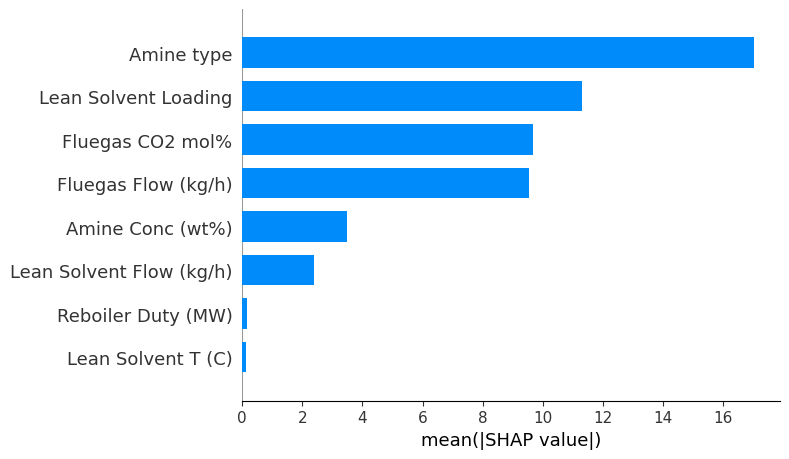

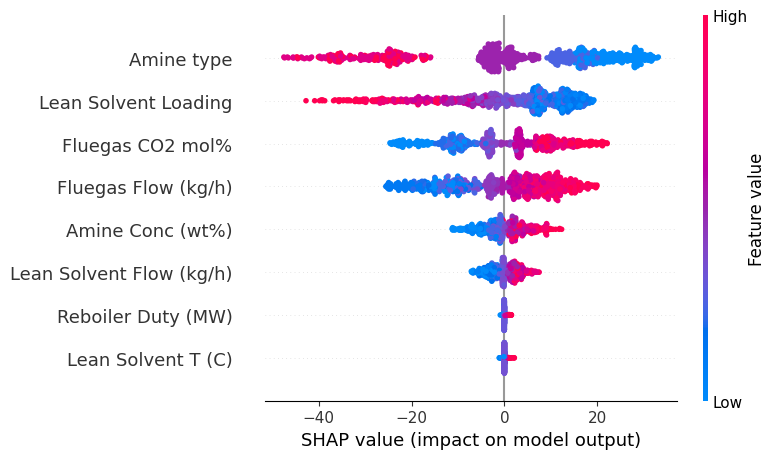

<Figure size 640x480 with 0 Axes>

In [ ]:
# --- BAR PLOT ---
shap.summary_plot(
    shap_values,
    X_test,
    plot_type="bar",
    show=False                # prevent SHAP from clearing the figure
)
plt.gca().set_xlabel("mean(|SHAP value|)")

plt.tight_layout()
plt.show()


# --- DOT PLOT ---
shap.summary_plot(shap_values, X_test)
plt.tight_layout()

In [ ]:
import matplotlib.pyplot as plt
import shap

# --- BAR PLOT ---
shap.summary_plot(shap_values, X_test, plot_type="bar", show=False)
plt.gca().set_xlabel("mean(|SHAP value|)")
plt.tight_layout()
plt.savefig("shap_pur_bar.png", dpi=600, bbox_inches='tight')
plt.close()

# --- DOT PLOT ---
shap.summary_plot(shap_values, X_test, show=False)
plt.tight_layout()
plt.savefig("shap_pur_dot.png", dpi=600, bbox_inches='tight')
plt.close()

## William's Plot

### **Recovery**

111/111 ━━━━━━━━━━━━━━━━━━━━ 1s 3ms/step


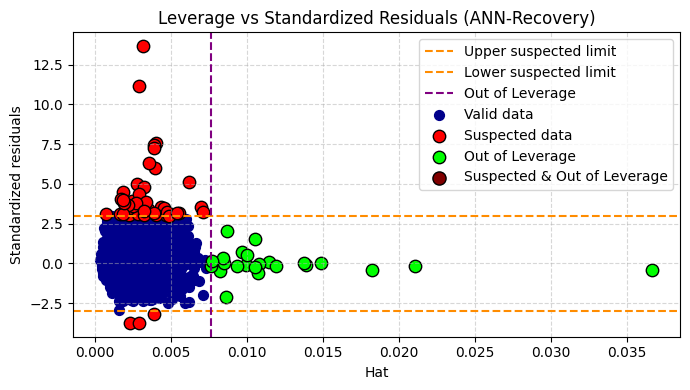

Number of valid data points: 3473 (98.11%)
Number of suspected data points: 44 (1.24%)
Number of out of leverage data points: 23 (0.65%)
Number of suspected & out of leverage data points: 0 (0.00%)


In [ ]:
import numpy as np
import matplotlib.pyplot as plt
from tensorflow import keras
from tensorflow.keras import layers


# محاسبه استاندارد شده‌ی باقیمانده‌ها و leverage
y_true = df_label1
X_train = df.drop(columns=['Unnamed: 0'])


# model
n_features = X_train.shape[1]
# Best model
ann_model1 = keras.Sequential([
    layers.Input(shape=(n_features,)),
    layers.Dense(32, activation='relu'),
    layers.Dense(72, activation='relu'),
    layers.Dense(32, activation='relu'),
    layers.Dense(1)                       # single output
])

# Compile
ann_model1.compile(optimizer=keras.optimizers.Adam(learning_rate=0.01),
                   loss='mean_absolute_error')
# fit/predict/evaluate
ann_model1.fit(X_train, y_true, epochs=101, batch_size=32, verbose=0)


y_pred = ann_model1.predict(X_train)
y_pred = np.ravel(y_pred)          # (3540,)
y_true = np.ravel(y_true)          # (3540,)
residuals = y_true - y_pred
std_residuals = residuals / np.std(residuals)

# طراحی X با ستون ثابت
X_design = np.hstack([np.ones((X_train.shape[0], 1)), X_train])
XT_X_inv = np.linalg.inv(X_design.T.dot(X_design))
H = X_design @ XT_X_inv @ X_design.T
leverage = np.diag(H)

# آستانه‌ها
n, p = X_train.shape
h_star = 3*(p+1)/n
resid_thresh = 3

# دسته‌بندی نقاط
valid_idx     = (np.abs(std_residuals) <= resid_thresh) & (leverage <= h_star)
suspect_idx   = (np.abs(std_residuals) >  resid_thresh) & (leverage <= h_star)
leverage_idx  = (leverage > h_star) & (np.abs(std_residuals) <= resid_thresh)
both_idx      = (leverage > h_star) & (np.abs(std_residuals) > resid_thresh)

# رسم نمودار
plt.figure(figsize=(7, 4))
plt.axhline(resid_thresh,  color='darkorange', linestyle='--', label='Upper suspected limit')
plt.axhline(-resid_thresh, color='darkorange', linestyle='--', label='Lower suspected limit')
plt.axvline(h_star,        color='purple', linestyle='--', label='Out of Leverage')

# نقاط
plt.scatter(leverage[valid_idx], std_residuals[valid_idx],   c='darkblue', label='Valid data', s=50)
plt.scatter(leverage[suspect_idx], std_residuals[suspect_idx], c='red', label='Suspected data', edgecolor='black', s=80)
plt.scatter(leverage[leverage_idx], std_residuals[leverage_idx], c='lime', label='Out of Leverage', edgecolor='black', s=80)
plt.scatter(leverage[both_idx], std_residuals[both_idx], c='maroon', label='Suspected & Out of Leverage', s=90, edgecolor='black')

plt.xlabel('Hat')
plt.ylabel('Standardized residuals')
plt.title('Leverage vs Standardized Residuals (ANN-Recovery)')
plt.legend(loc='upper right')
plt.grid(True, linestyle='--', alpha=0.5)
plt.tight_layout()
plt.savefig("leverage_residuals_rec.png", dpi=600, bbox_inches='tight')
plt.show()

# Calculate the number of points in each category
num_valid = np.sum(valid_idx)
num_suspect = np.sum(suspect_idx)
num_out_of_leverage = np.sum(leverage_idx)
num_both = np.sum(both_idx)

# Total points
total_points = len(X_train)

# Calculate the percentages
valid_percentage = (num_valid / total_points) * 100
suspect_percentage = (num_suspect / total_points) * 100
out_of_leverage_percentage = (num_out_of_leverage / total_points) * 100
both_percentage = (num_both / total_points) * 100

# Print results
print(f"Number of valid data points: {num_valid} ({valid_percentage:.2f}%)")
print(f"Number of suspected data points: {num_suspect} ({suspect_percentage:.2f}%)")
print(f"Number of out of leverage data points: {num_out_of_leverage} ({out_of_leverage_percentage:.2f}%)")
print(f"Number of suspected & out of leverage data points: {num_both} ({both_percentage:.2f}%)")

### **SEC**

111/111 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step


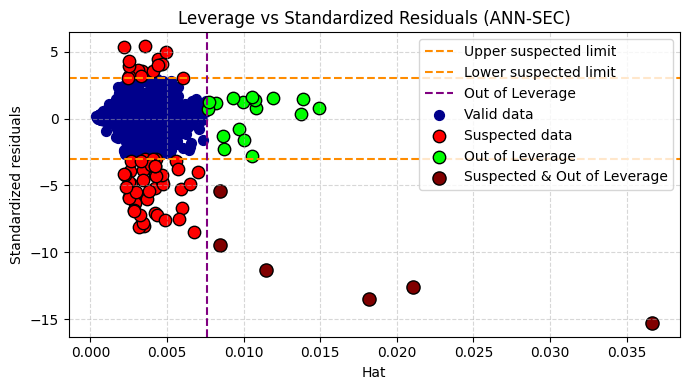

Number of valid data points: 3454 (97.57%)
Number of suspected data points: 63 (1.78%)
Number of out of leverage data points: 17 (0.48%)
Number of suspected & out of leverage data points: 6 (0.17%)


In [ ]:
import numpy as np
import matplotlib.pyplot as plt
from tensorflow import keras
from tensorflow.keras import layers


# محاسبه استاندارد شده‌ی باقیمانده‌ها و leverage
y_true = df_label2
X_train = df.drop(columns=['Unnamed: 0'])

# model
n_features = X_train.shape[1]
# Best model
ann_model1 = keras.Sequential([
    layers.Input(shape=(n_features,)),
    layers.Dense(120, activation='relu'),
    layers.Dense(128, activation='relu'),
    layers.Dense(1)                       # single output
])

# Compile
ann_model1.compile(optimizer=keras.optimizers.Adam(learning_rate=0.1),
                   loss='mean_absolute_error')
# fit/predict/evaluate
ann_model1.fit(X_train, y_true, epochs=101, batch_size=32, verbose=0)

y_pred = ann_model1.predict(X_train)
y_pred = np.ravel(y_pred)          # (3540,)
y_true = np.ravel(y_true)          # (3540,)
residuals = y_true - y_pred
std_residuals = residuals / np.std(residuals)

# طراحی X با ستون ثابت
X_design = np.hstack([np.ones((X_train.shape[0], 1)), X_train])
XT_X_inv = np.linalg.inv(X_design.T.dot(X_design))
H = X_design @ XT_X_inv @ X_design.T
leverage = np.diag(H)

# آستانه‌ها
n, p = X_train.shape
h_star = 3*(p+1)/n
resid_thresh = 3

# دسته‌بندی نقاط
valid_idx     = (np.abs(std_residuals) <= resid_thresh) & (leverage <= h_star)
suspect_idx   = (np.abs(std_residuals) >  resid_thresh) & (leverage <= h_star)
leverage_idx  = (leverage > h_star) & (np.abs(std_residuals) <= resid_thresh)
both_idx      = (leverage > h_star) & (np.abs(std_residuals) > resid_thresh)

# رسم نمودار
plt.figure(figsize=(7, 4))
plt.axhline(resid_thresh,  color='darkorange', linestyle='--', label='Upper suspected limit')
plt.axhline(-resid_thresh, color='darkorange', linestyle='--', label='Lower suspected limit')
plt.axvline(h_star,        color='purple', linestyle='--', label='Out of Leverage')

# نقاط
plt.scatter(leverage[valid_idx], std_residuals[valid_idx],   c='darkblue', label='Valid data', s=50)
plt.scatter(leverage[suspect_idx], std_residuals[suspect_idx], c='red', label='Suspected data', edgecolor='black', s=80)
plt.scatter(leverage[leverage_idx], std_residuals[leverage_idx], c='lime', label='Out of Leverage', edgecolor='black', s=80)
plt.scatter(leverage[both_idx], std_residuals[both_idx], c='maroon', label='Suspected & Out of Leverage', s=90, edgecolor='black')

plt.xlabel('Hat')
plt.ylabel('Standardized residuals')
plt.title('Leverage vs Standardized Residuals (ANN-SEC)')
plt.legend(loc='upper right')
plt.grid(True, linestyle='--', alpha=0.5)
plt.tight_layout()
plt.savefig("leverage_residuals_sec.png", dpi=600, bbox_inches='tight')
plt.show()

# Calculate the number of points in each category
num_valid = np.sum(valid_idx)
num_suspect = np.sum(suspect_idx)
num_out_of_leverage = np.sum(leverage_idx)
num_both = np.sum(both_idx)

# Total points
total_points = len(X_train)

# Calculate the percentages
valid_percentage = (num_valid / total_points) * 100
suspect_percentage = (num_suspect / total_points) * 100
out_of_leverage_percentage = (num_out_of_leverage / total_points) * 100
both_percentage = (num_both / total_points) * 100

# Print results
print(f"Number of valid data points: {num_valid} ({valid_percentage:.2f}%)")
print(f"Number of suspected data points: {num_suspect} ({suspect_percentage:.2f}%)")
print(f"Number of out of leverage data points: {num_out_of_leverage} ({out_of_leverage_percentage:.2f}%)")
print(f"Number of suspected & out of leverage data points: {num_both} ({both_percentage:.2f}%)")

### **Purity**

111/111 ━━━━━━━━━━━━━━━━━━━━ 1s 3ms/step


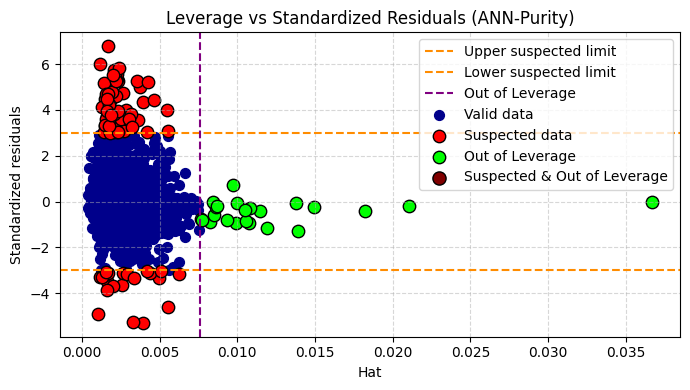

Number of valid data points: 3430 (96.89%)
Number of suspected data points: 87 (2.46%)
Number of out of leverage data points: 23 (0.65%)
Number of suspected & out of leverage data points: 0 (0.00%)


In [ ]:
import numpy as np
import matplotlib.pyplot as plt
from tensorflow import keras
from tensorflow.keras import layers


# محاسبه استاندارد شده‌ی باقیمانده‌ها و leverage
y_true = df_label3
X_train = df.drop(columns=['Unnamed: 0'])


# model
n_features = X_train.shape[1]
# Best model
ann_model1 = keras.Sequential([
    layers.Input(shape=(n_features,)),
    layers.Dense(32, activation='relu'),
    layers.Dense(72, activation='relu'),
    layers.Dense(32, activation='relu'),
    layers.Dense(1)                       # single output
])

# Compile
ann_model1.compile(optimizer=keras.optimizers.Adam(learning_rate=0.01),
                   loss='mean_absolute_error')
# fit/predict/evaluate
ann_model1.fit(X_train, y_true, epochs=101, batch_size=32, verbose=0)


y_pred = ann_model1.predict(X_train)
y_pred = np.ravel(y_pred)          # (3540,)
y_true = np.ravel(y_true)          # (3540,)
residuals = y_true - y_pred
std_residuals = residuals / np.std(residuals)

# طراحی X با ستون ثابت
X_design = np.hstack([np.ones((X_train.shape[0], 1)), X_train])
XT_X_inv = np.linalg.inv(X_design.T.dot(X_design))
H = X_design @ XT_X_inv @ X_design.T
leverage = np.diag(H)

# آستانه‌ها
n, p = X_train.shape
h_star = 3*(p+1)/n
resid_thresh = 3

# دسته‌بندی نقاط
valid_idx     = (np.abs(std_residuals) <= resid_thresh) & (leverage <= h_star)
suspect_idx   = (np.abs(std_residuals) >  resid_thresh) & (leverage <= h_star)
leverage_idx  = (leverage > h_star) & (np.abs(std_residuals) <= resid_thresh)
both_idx      = (leverage > h_star) & (np.abs(std_residuals) > resid_thresh)

# رسم نمودار
plt.figure(figsize=(7, 4))
plt.axhline(resid_thresh,  color='darkorange', linestyle='--', label='Upper suspected limit')
plt.axhline(-resid_thresh, color='darkorange', linestyle='--', label='Lower suspected limit')
plt.axvline(h_star,        color='purple', linestyle='--', label='Out of Leverage')

# نقاط
plt.scatter(leverage[valid_idx], std_residuals[valid_idx],   c='darkblue', label='Valid data', s=50)
plt.scatter(leverage[suspect_idx], std_residuals[suspect_idx], c='red', label='Suspected data', edgecolor='black', s=80)
plt.scatter(leverage[leverage_idx], std_residuals[leverage_idx], c='lime', label='Out of Leverage', edgecolor='black', s=80)
plt.scatter(leverage[both_idx], std_residuals[both_idx], c='maroon', label='Suspected & Out of Leverage', s=90, edgecolor='black')

plt.xlabel('Hat')
plt.ylabel('Standardized residuals')
plt.title('Leverage vs Standardized Residuals (ANN-Purity)')
plt.legend(loc='upper right')
plt.grid(True, linestyle='--', alpha=0.5)
plt.tight_layout()
plt.savefig("leverage_residuals_pur.png", dpi=600, bbox_inches='tight')
plt.show()

# Calculate the number of points in each category
num_valid = np.sum(valid_idx)
num_suspect = np.sum(suspect_idx)
num_out_of_leverage = np.sum(leverage_idx)
num_both = np.sum(both_idx)

# Total points
total_points = len(X_train)

# Calculate the percentages
valid_percentage = (num_valid / total_points) * 100
suspect_percentage = (num_suspect / total_points) * 100
out_of_leverage_percentage = (num_out_of_leverage / total_points) * 100
both_percentage = (num_both / total_points) * 100

# Print results
print(f"Number of valid data points: {num_valid} ({valid_percentage:.2f}%)")
print(f"Number of suspected data points: {num_suspect} ({suspect_percentage:.2f}%)")
print(f"Number of out of leverage data points: {num_out_of_leverage} ({out_of_leverage_percentage:.2f}%)")
print(f"Number of suspected & out of leverage data points: {num_both} ({both_percentage:.2f}%)")

## Surface plot

### **Recovery**

313/313 ━━━━━━━━━━━━━━━━━━━━ 1s 2ms/step
313/313 ━━━━━━━━━━━━━━━━━━━━ 1s 2ms/step
313/313 ━━━━━━━━━━━━━━━━━━━━ 1s 2ms/step
313/313 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step
313/313 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step
313/313 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step


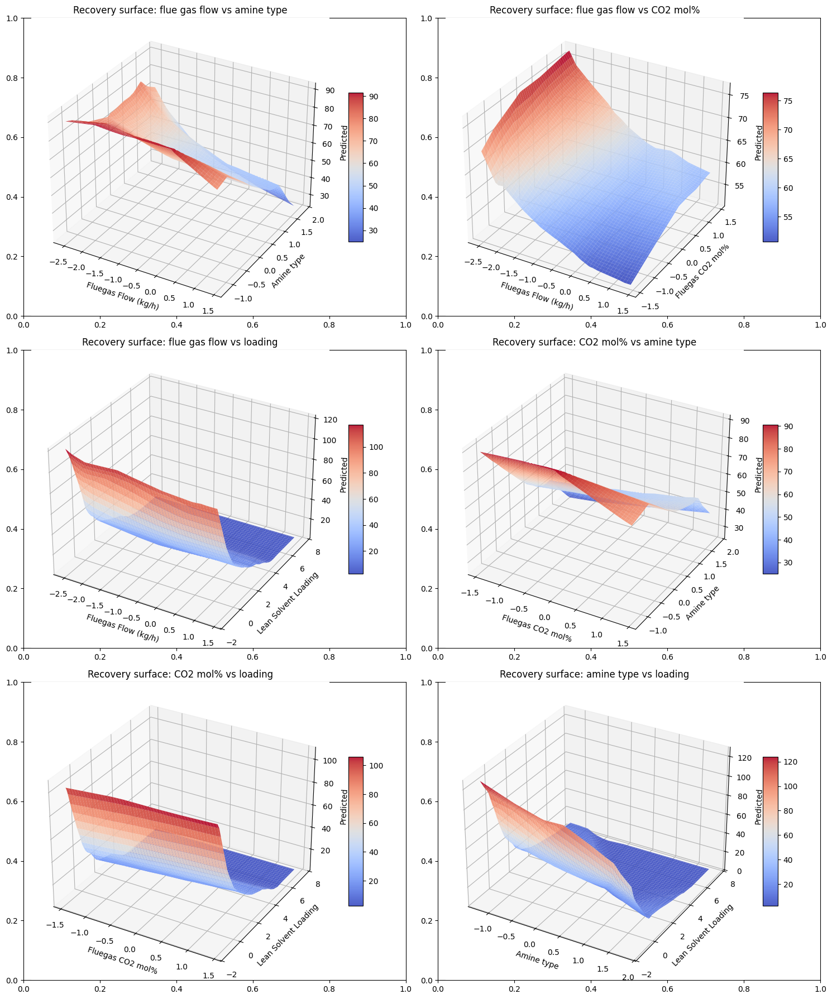

In [ ]:
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
from tensorflow import keras
from tensorflow.keras import layers
from mpl_toolkits.mplot3d import Axes3D  # This is needed for 3D plots

def surface_plot_2d(model, X_ref_df, feat_x, feat_y, ax, title="Surface plot", n_grid=60, fixed_strategy="median", cmap="viridis"):
    """
    model: trained model with predict(X)
    X_ref_df: pandas DataFrame of features (use train or total)
    feat_x, feat_y: two feature names to vary
    ax: Matplotlib axis to plot on (for subplot layout)
    fixed_strategy: "median" or "mean"
    cmap: Colormap for the surface plot
    """
    X_ref = X_ref_df.copy()

    # fixed point for other features
    if fixed_strategy == "median":
        base = X_ref.median(numeric_only=True)
    else:
        base = X_ref.mean(numeric_only=True)

    # grid ranges based on data
    x_vals = np.linspace(X_ref[feat_x].min(), X_ref[feat_x].max(), n_grid)
    y_vals = np.linspace(X_ref[feat_y].min(), X_ref[feat_y].max(), n_grid)
    XX, YY = np.meshgrid(x_vals, y_vals)

    # build grid dataframe for prediction
    grid = pd.DataFrame(np.tile(base.values, (n_grid*n_grid, 1)), columns=base.index)
    grid[feat_x] = XX.ravel()
    grid[feat_y] = YY.ravel()

    # ensure column order matches training
    grid = grid[X_ref_df.columns]

    ZZ = model.predict(grid).reshape(n_grid, n_grid)

    # --- Plot on provided 3D axis ---
    surface = ax.plot_surface(XX, YY, ZZ, linewidth=0, antialiased=True, alpha=0.9, cmap=cmap)
    ax.set_xlabel(feat_x)
    ax.set_ylabel(feat_y)
    ax.set_zlabel("Predicted")
    ax.set_title(title)

    # Add color bar for each surface plot
    fig.colorbar(surface, ax=ax, shrink=0.5, aspect=10)

# Prepare plot grid with 3 rows and 2 columns
fig, axes = plt.subplots(3, 2, figsize=(15, 18))

# Make sure to create 3D axes for each subplot
for row in range(3):
    for col in range(2):
        axes[row, col] = fig.add_subplot(3, 2, 2 * row + col + 1, projection="3d")  # Convert to 3D axis

# List of features pairs and titles for surface plots and different colormaps
plot_configs = [
    ("Fluegas Flow (kg/h)", "Amine type", "Recovery surface: flue gas flow vs amine type", "coolwarm"),
    ("Fluegas Flow (kg/h)", "Fluegas CO2 mol%", "Recovery surface: flue gas flow vs CO2 mol%", "coolwarm"),
    ("Fluegas Flow (kg/h)", "Lean Solvent Loading", "Recovery surface: flue gas flow vs loading", "coolwarm"),
    ("Fluegas CO2 mol%", "Amine type", "Recovery surface: CO2 mol% vs amine type", "coolwarm"),
    ("Fluegas CO2 mol%", "Lean Solvent Loading", "Recovery surface: CO2 mol% vs loading", "coolwarm"),
    ("Amine type", "Lean Solvent Loading", "Recovery surface: amine type vs loading", "coolwarm")
]

# Ensure the correct feature names and target values are loaded
X_train = df  # X_train should be your feature DataFrame
y_true = df_label1  # Ensure you have the correct target for the ANN

# Model setup (ensure it's already trained)
n_features = X_train.shape[1]  # Your features are in X_train
ann_model1 = keras.Sequential([
    layers.Input(shape=(n_features,)),
    layers.Dense(32, activation='relu'),
    layers.Dense(72, activation='relu'),
    layers.Dense(32, activation='relu'),
    layers.Dense(1)  # Single output
])

ann_model1.compile(optimizer=keras.optimizers.Adam(learning_rate=0.01), loss='mean_absolute_error')
ann_model1.fit(X_train, y_true, epochs=101, batch_size=32, verbose=0)

# Generate surface plots for each pair of features in the configuration list
for i, (feat_x, feat_y, title, cmap) in enumerate(plot_configs):
    row, col = divmod(i, 2)
    surface_plot_2d(ann_model1, X_train, feat_x, feat_y, axes[row, col], title=title, n_grid=100, cmap=cmap)

# Adjust layout and save as SVG
plt.tight_layout()
plt.savefig("surface_plots_rec.svg", format="svg")
plt.show()


### **SEC**

313/313 ━━━━━━━━━━━━━━━━━━━━ 1s 2ms/step
313/313 ━━━━━━━━━━━━━━━━━━━━ 1s 2ms/step
313/313 ━━━━━━━━━━━━━━━━━━━━ 1s 2ms/step
313/313 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step
313/313 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step
313/313 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step
313/313 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step
313/313 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step
313/313 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step
313/313 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step


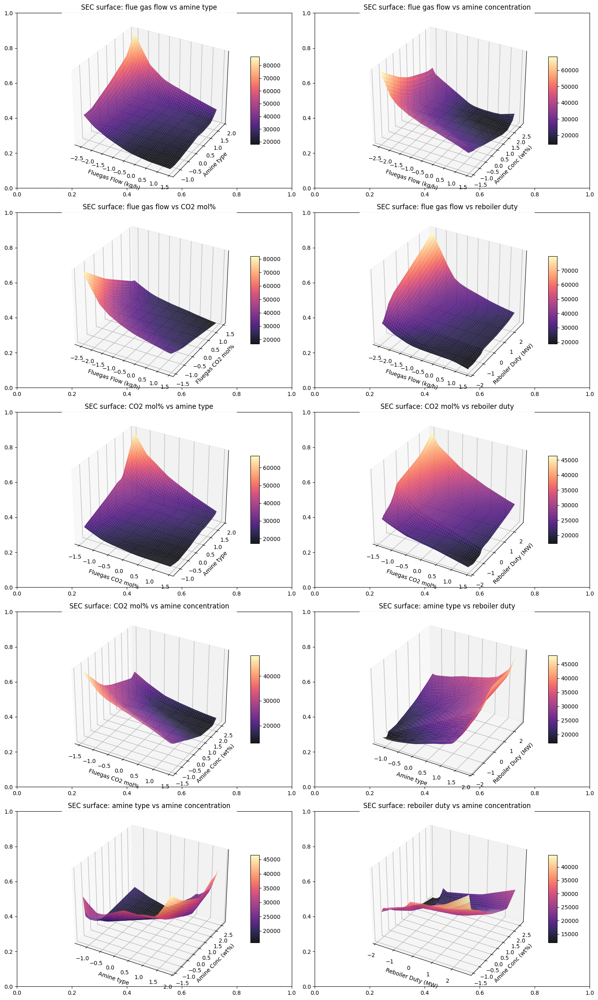

In [ ]:
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
from tensorflow import keras
from tensorflow.keras import layers
from mpl_toolkits.mplot3d import Axes3D  # This is needed for 3D plots

def surface_plot_2d(model, X_ref_df, feat_x, feat_y, ax, title="Surface plot", n_grid=60, fixed_strategy="median", cmap="magma"):
    """
    model: trained model with predict(X)
    X_ref_df: pandas DataFrame of features (use train or total)
    feat_x, feat_y: two feature names to vary
    ax: Matplotlib axis to plot on (for subplot layout)
    fixed_strategy: "median" or "mean"
    cmap: Colormap for the surface plot
    """
    X_ref = X_ref_df.copy()

    # fixed point for other features
    if fixed_strategy == "median":
        base = X_ref.median(numeric_only=True)
    else:
        base = X_ref.mean(numeric_only=True)

    # grid ranges based on data
    x_vals = np.linspace(X_ref[feat_x].min(), X_ref[feat_x].max(), n_grid)
    y_vals = np.linspace(X_ref[feat_y].min(), X_ref[feat_y].max(), n_grid)
    XX, YY = np.meshgrid(x_vals, y_vals)

    # build grid dataframe for prediction
    grid = pd.DataFrame(np.tile(base.values, (n_grid*n_grid, 1)), columns=base.index)
    grid[feat_x] = XX.ravel()
    grid[feat_y] = YY.ravel()

    # ensure column order matches training
    grid = grid[X_ref.columns]

    ZZ = model.predict(grid).reshape(n_grid, n_grid)

    # --- Plot on provided 3D axis ---
    surface = ax.plot_surface(XX, YY, ZZ, linewidth=0, antialiased=True, alpha=0.9, cmap=cmap)
    ax.set_xlabel(feat_x)
    ax.set_ylabel(feat_y)
    ax.set_zlabel("Predicted", labelpad=10)  # Adjust label padding to avoid overlap
    ax.set_title(title)

    # Hide the SEC axis values (i.e., don't display any ticks on the z-axis)
    ax.zaxis.set_ticks([])  # Hides the ticks on the z-axis

    # Add color bar for each surface plot
    fig.colorbar(surface, ax=ax, shrink=0.5, aspect=10)

# Prepare plot grid with 5 rows and 2 columns
fig, axes = plt.subplots(5, 2, figsize=(15, 25))  # Increase figure size to fit 10 subplots

# Make sure to create 3D axes for each subplot
for row in range(5):
    for col in range(2):
        axes[row, col] = fig.add_subplot(5, 2, 2 * row + col + 1, projection="3d")  # Convert to 3D axis

# List of features pairs and titles for surface plots and different colormaps
plot_configs = [
    ("Fluegas Flow (kg/h)", "Amine type", "SEC surface: flue gas flow vs amine type", "magma"),
    ("Fluegas Flow (kg/h)", "Amine Conc (wt%)", "SEC surface: flue gas flow vs amine concentration", "magma"),
    ("Fluegas Flow (kg/h)", "Fluegas CO2 mol%", "SEC surface: flue gas flow vs CO2 mol%", "magma"),
    ("Fluegas Flow (kg/h)", "Reboiler Duty (MW)", "SEC surface: flue gas flow vs reboiler duty", "magma"),
    ("Fluegas CO2 mol%", "Amine type", "SEC surface: CO2 mol% vs amine type", "magma"),
    ("Fluegas CO2 mol%", "Reboiler Duty (MW)", "SEC surface: CO2 mol% vs reboiler duty", "magma"),
    ("Fluegas CO2 mol%", "Amine Conc (wt%)", "SEC surface: CO2 mol% vs amine concentration", "magma"),
    ("Amine type", "Reboiler Duty (MW)", "SEC surface: amine type vs reboiler duty", "magma"),
    ("Amine type", "Amine Conc (wt%)", "SEC surface: amine type vs amine concentration", "magma"),
    ("Reboiler Duty (MW)", "Amine Conc (wt%)", "SEC surface: reboiler duty vs amine concentration", "magma")
]

# Ensure the correct feature names and target values are loaded
X_train = df  # X_train should be your feature DataFrame
y_true = df_label2  # Ensure you have the correct target for the ANN

# Model setup (ensure it's already trained)
n_features = X_train.shape[1]  # Your features are in X_train
ann_model1 = keras.Sequential([
    layers.Input(shape=(n_features,)),
    layers.Dense(120, activation='relu'),
    layers.Dense(128, activation='relu'),
    layers.Dense(1)  # Single output
])

ann_model1.compile(optimizer=keras.optimizers.Adam(learning_rate=0.1), loss='mean_absolute_error')
ann_model1.fit(X_train, y_true, epochs=101, batch_size=32, verbose=0)

# Generate surface plots for each pair of features in the configuration list
for i, (feat_x, feat_y, title, cmap) in enumerate(plot_configs):
    row, col = divmod(i, 2)
    surface_plot_2d(ann_model1, X_train, feat_x, feat_y, axes[row, col], title=title, n_grid=100, cmap=cmap)

# Adjust layout and save as SVG
plt.tight_layout()
plt.savefig("surface_plots_sec_without_ticks.svg", format="svg")
plt.show()


### **Purity**

313/313 ━━━━━━━━━━━━━━━━━━━━ 1s 3ms/step
313/313 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step
313/313 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step
313/313 ━━━━━━━━━━━━━━━━━━━━ 1s 2ms/step
313/313 ━━━━━━━━━━━━━━━━━━━━ 1s 2ms/step
313/313 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step


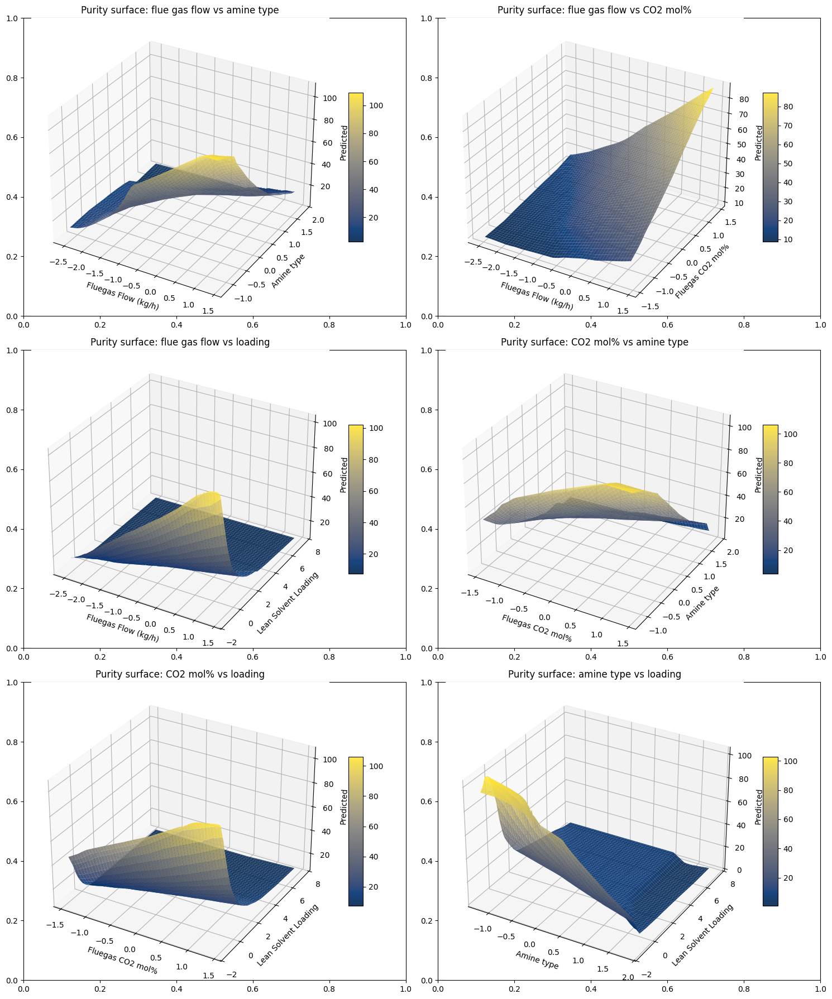

In [ ]:
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
from tensorflow import keras
from tensorflow.keras import layers
from mpl_toolkits.mplot3d import Axes3D  # This is needed for 3D plots

def surface_plot_2d(model, X_ref_df, feat_x, feat_y, ax, title="Surface plot", n_grid=60, fixed_strategy="median", cmap="viridis"):
    """
    model: trained model with predict(X)
    X_ref_df: pandas DataFrame of features (use train or total)
    feat_x, feat_y: two feature names to vary
    ax: Matplotlib axis to plot on (for subplot layout)
    fixed_strategy: "median" or "mean"
    cmap: Colormap for the surface plot
    """
    X_ref = X_ref_df.copy()

    # fixed point for other features
    if fixed_strategy == "median":
        base = X_ref.median(numeric_only=True)
    else:
        base = X_ref.mean(numeric_only=True)

    # grid ranges based on data
    x_vals = np.linspace(X_ref[feat_x].min(), X_ref[feat_x].max(), n_grid)
    y_vals = np.linspace(X_ref[feat_y].min(), X_ref[feat_y].max(), n_grid)
    XX, YY = np.meshgrid(x_vals, y_vals)

    # build grid dataframe for prediction
    grid = pd.DataFrame(np.tile(base.values, (n_grid*n_grid, 1)), columns=base.index)
    grid[feat_x] = XX.ravel()
    grid[feat_y] = YY.ravel()

    # ensure column order matches training
    grid = grid[X_ref_df.columns]

    ZZ = model.predict(grid).reshape(n_grid, n_grid)

    # --- Plot on provided 3D axis ---
    surface = ax.plot_surface(XX, YY, ZZ, linewidth=0, antialiased=True, alpha=0.9, cmap=cmap)
    ax.set_xlabel(feat_x)
    ax.set_ylabel(feat_y)
    ax.set_zlabel("Predicted")
    ax.set_title(title)

    # Add color bar for each surface plot
    fig.colorbar(surface, ax=ax, shrink=0.5, aspect=10)

# Prepare plot grid with 3 rows and 2 columns
fig, axes = plt.subplots(3, 2, figsize=(15, 18))

# Make sure to create 3D axes for each subplot
for row in range(3):
    for col in range(2):
        axes[row, col] = fig.add_subplot(3, 2, 2 * row + col + 1, projection="3d")  # Convert to 3D axis

# List of features pairs and titles for surface plots and different colormaps
plot_configs = [
    ("Fluegas Flow (kg/h)", "Amine type", "Purity surface: flue gas flow vs amine type", "cividis"),
    ("Fluegas Flow (kg/h)", "Fluegas CO2 mol%", "Purity surface: flue gas flow vs CO2 mol%", "cividis"),
    ("Fluegas Flow (kg/h)", "Lean Solvent Loading", "Purity surface: flue gas flow vs loading", "cividis"),
    ("Fluegas CO2 mol%", "Amine type", "Purity surface: CO2 mol% vs amine type", "cividis"),
    ("Fluegas CO2 mol%", "Lean Solvent Loading", "Purity surface: CO2 mol% vs loading", "cividis"),
    ("Amine type", "Lean Solvent Loading", "Purity surface: amine type vs loading", "cividis")
]

# Ensure the correct feature names and target values are loaded
X_train = df  # X_train should be your feature DataFrame
y_true = df_label3  # Ensure you have the correct target for the ANN

# Model setup (ensure it's already trained)
n_features = X_train.shape[1]  # Your features are in X_train
ann_model1 = keras.Sequential([
    layers.Input(shape=(n_features,)),
    layers.Dense(32, activation='relu'),
    layers.Dense(72, activation='relu'),
    layers.Dense(32, activation='relu'),
    layers.Dense(1)  # Single output
])

ann_model1.compile(optimizer=keras.optimizers.Adam(learning_rate=0.01), loss='mean_absolute_error')
ann_model1.fit(X_train, y_true, epochs=101, batch_size=32, verbose=0)

# Generate surface plots for each pair of features in the configuration list
for i, (feat_x, feat_y, title, cmap) in enumerate(plot_configs):
    row, col = divmod(i, 2)
    surface_plot_2d(ann_model1, X_train, feat_x, feat_y, axes[row, col], title=title, n_grid=100, cmap=cmap)

# Adjust layout and save as SVG
plt.tight_layout()
plt.savefig("surface_plots_pur.svg", format="svg")
plt.show()


## Distribution of Errors

In [ ]:
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
from scipy.stats import gaussian_kde


pred_path = "predictions.xlsx"

# Read column C starting from row 2 (skiprows=1), no header
pred_rec = pd.read_excel(pred_path, sheet_name="ann1", usecols="C", skiprows=1, header=None).iloc[:, 0].to_numpy()
pred_sec = pd.read_excel(pred_path, sheet_name="ann2", usecols="C", skiprows=1, header=None).iloc[:, 0].to_numpy()
pred_pur = pd.read_excel(pred_path, sheet_name="ann3", usecols="C", skiprows=1, header=None).iloc[:, 0].to_numpy()

# TRUE VALUES (TOTAL SET)
y_true_rec = np.asarray(y_total1).reshape(-1)
y_true_sec = np.asarray(y_total2).reshape(-1)
y_true_pur = np.asarray(y_total3).reshape(-1)

# ALIGN LENGTHS (SAFETY)
def align(y_true, y_pred, name):
    n = min(len(y_true), len(y_pred))
    if len(y_true) != len(y_pred):
        print(f" Length mismatch for {name}: y_true={len(y_true)} vs y_pred={len(y_pred)}. Using first {n} rows.")
    return y_true[:n], y_pred[:n]

y_true_rec, pred_rec = align(y_true_rec, pred_rec, "Recovery")
y_true_sec, pred_sec = align(y_true_sec, pred_sec, "SEC")
y_true_pur, pred_pur = align(y_true_pur, pred_pur, "Purity")

# ERROR STATS
def error_stats(y_true, y_pred, label):
    resid = y_true - y_pred
    abs_err = np.abs(resid)

    denom = np.where(np.abs(y_true) < 1e-12, np.nan, y_true)
    pct_err = np.abs(resid / denom) * 100.0

    out = {
        "label": label,
        "n": len(y_true),
        "resid": resid,
        "p95_abs": float(np.nanpercentile(abs_err, 95)),
        "worst_abs": float(np.nanmax(abs_err)),
        "p95_pct": float(np.nanpercentile(pct_err, 95)),
        "worst_pct": float(np.nanmax(pct_err)),
    }
    return out

Srec = error_stats(y_true_rec, pred_rec, "Recovery (%)")
Ssec = error_stats(y_true_sec, pred_sec, "SEC (kJ/kg)")
Spur = error_stats(y_true_pur, pred_pur, "Purity (mol%)")

# Print requested metrics
for S in [Srec, Ssec, Spur]:
    print(f"\n{S['label']} (n={S['n']})")
    print(f"  95th percentile |error|: {S['p95_abs']:.6g}")
    print(f"  Worst-case      |error|: {S['worst_abs']:.6g}")
    print(f"  95th percentile |%error|: {S['p95_pct']:.6g}%")
    print(f"  Worst-case      |%error|: {S['worst_pct']:.6g}%")




# PLOTS: 3 RESIDUAL HISTS
fig, axes = plt.subplots(1, 3, figsize=(20, 6), dpi=180)

items = [
    (Srec["resid"], "Residual Histogram - ANN (Recovery)", None),          # default
    (Ssec["resid"], "Residual Histogram - ANN (SEC)", "darkorange"),
    (Spur["resid"], "Residual Histogram - ANN (Purity)", "green"),         # green
]

for ax, (resid, title, bar_color) in zip(axes, items):
    resid = np.asarray(resid, dtype=float)
    resid = resid[~np.isnan(resid)]

    ax.hist(
        resid,
        bins=100,
        density=True,
        alpha=0.7,
        edgecolor="k",
        linewidth=0.3,
        color=bar_color  # <-- different bar colors
    )

    # KDE overlay
    if len(resid) > 5 and np.std(resid) > 0:
        kde = gaussian_kde(resid)
        xs = np.linspace(resid.min(), resid.max(), 400)
        ax.plot(xs, kde(xs), linewidth=1.5, color="red")  # keep red for all

    ax.set_title(title, fontsize=15)
    ax.set_xlabel("Residual (Actual − Predicted)", fontsize=13)
    ax.set_ylabel("Density", fontsize=14)
    ax.tick_params(axis='both', labelsize=13)
    ax.spines["top"].set_visible(False)
    ax.spines["right"].set_visible(False)
    ax.set_axisbelow(True)
    ax.grid(linewidth=0.5, linestyle=":")

plt.tight_layout()
plt.savefig("Error Distribution.svg", format="svg", bbox_inches="tight")
plt.show()


## Leave-One-Amine-Out Analysis

### TabPFN

In [ ]:
!pip install tabpfn==2.0.0

In [ ]:
import pandas as pd
import numpy as np
from sklearn.preprocessing import StandardScaler

# Load encoded dataset
data = pd.read_csv("cleaned_data_encoded.csv")

# Defining feature and target columns
feature_cols = [
    "Fluegas CO2 mol%",
    "Fluegas Flow (kg/h)",
    "Lean Solvent Flow (kg/h)",
    "Lean Solvent Loading",
    "Amine type",
    "Amine Conc (wt%)",
    "Lean Solvent T (C)",
    "Reboiler Duty (MW)"

]

target_cols = [
    "Recovery%",
    "SEC (kJ/kg)",
    "CO2 Purity (mol%)"
]

# Extract X and y without normalization
X = data[feature_cols].values
y = data[target_cols].values

In [ ]:
amine_codes = data["Amine type"].astype(int).values  # 1..5

for excluded_code in [1, 2, 3, 4, 5]:
    # masks
    test_mask  = (amine_codes == excluded_code)
    train_mask = ~test_mask

    # split raw data (not normalized)
    X_train_raw = X[train_mask]
    y_train     = y[train_mask]
    X_test_raw  = X[test_mask]
    y_test      = y[test_mask]

    # scale (train only)
    scaler = StandardScaler()
    X_train = scaler.fit_transform(X_train_raw)
    X_test = scaler.transform(X_test_raw)

    # create Sets
    globals()[f"X_train{excluded_code}"] = X_train
    globals()[f"X_test{excluded_code}"]  = X_test
    globals()[f"y_train{excluded_code}"] = y_train
    globals()[f"y_test{excluded_code}"]  = y_test
    globals()[f"scaler{excluded_code}"]  = scaler

    print(
        f"Excluded amine {excluded_code}: "
        f"Train={X_train.shape[0]} rows, Test={X_test.shape[0]} rows"
    )
# MEA = 1
# DGA = 2
# DEA = 3
# TEA = 4
# MDEA = 5

Excluded amine 1: Train=3145 rows, Test=1281 rows
Excluded amine 2: Train=3726 rows, Test=700 rows
Excluded amine 3: Train=3092 rows, Test=1334 rows
Excluded amine 4: Train=3774 rows, Test=652 rows
Excluded amine 5: Train=3967 rows, Test=459 rows


#### Recovery

In [ ]:
import numpy as np
from tabpfn import TabPFNRegressor
from sklearn.metrics import r2_score, mean_squared_error, mean_absolute_error

# ---- Leave-One-Amine-Out loop (Recovery only) ----
# X_* are scaled
# y_* comprise 3 targets (Recovery, SEC, Purity) in columns 0,1,2

results = []

for excluded_code in [1, 2, 3, 4, 5]:

    Xtr = globals()[f"X_train{excluded_code}"]
    Xte = globals()[f"X_test{excluded_code}"]

    ytr = globals()[f"y_train{excluded_code}"][:, 0]  # Recovery only
    yte = globals()[f"y_test{excluded_code}"][:, 0]   # Recovery only

    # Initialize TabPFN
    model = TabPFNRegressor()

    # Fit
    model.fit(Xtr, ytr)

    # Predict
    ypred = model.predict(Xte)

    # Metrics
    r2   = r2_score(yte, ypred)
    rmse = np.sqrt(mean_squared_error(yte, ypred))
    mae  = mean_absolute_error(yte, ypred)

    results.append([excluded_code, r2, rmse, mae])

    print(f"Left-out amine {excluded_code} -> R²={r2:.4f}, RMSE={rmse:.4f}, MAE={mae:.4f}")

# ---- Overall summary ----
results = np.array(results, dtype=float)

print("\nOverall across left-out amines:")
print(f"R²:   {results[:,1].mean():.4f} ± {results[:,1].std():.4f}")
print(f"RMSE: {results[:,2].mean():.4f} ± {results[:,2].std():.4f}")
print(f"MAE:  {results[:,3].mean():.4f} ± {results[:,3].std():.4f}")

/usr/local/lib/python3.12/dist-packages/sklearn/base.py:474: FutureWarning: `BaseEstimator._validate_data` is deprecated in 1.6 and will be removed in 1.7. Use `sklearn.utils.validation.validate_data` instead. This function becomes public and is part of the scikit-learn developer API.
  warnings.warn(
/usr/local/lib/python3.12/dist-packages/sklearn/utils/deprecation.py:151: FutureWarning: 'force_all_finite' was renamed to 'ensure_all_finite' in 1.6 and will be removed in 1.8.
  warnings.warn(
/usr/local/lib/python3.12/dist-packages/sklearn/utils/deprecation.py:151: FutureWarning: 'force_all_finite' was renamed to 'ensure_all_finite' in 1.6 and will be removed in 1.8.
  warnings.warn(
/usr/local/lib/python3.12/dist-packages/sklearn/base.py:474: FutureWarning: `BaseEstimator._validate_data` is deprecated in 1.6 and will be removed in 1.7. Use `sklearn.utils.validation.validate_data` instead. This function becomes public and is part of the scikit-learn developer API.
  warnings.warn(
/usr

Left-out amine 1 -> R²=0.9540, RMSE=5.3874, MAE=3.9288


/usr/local/lib/python3.12/dist-packages/sklearn/base.py:474: FutureWarning: `BaseEstimator._validate_data` is deprecated in 1.6 and will be removed in 1.7. Use `sklearn.utils.validation.validate_data` instead. This function becomes public and is part of the scikit-learn developer API.
  warnings.warn(
/usr/local/lib/python3.12/dist-packages/sklearn/utils/deprecation.py:151: FutureWarning: 'force_all_finite' was renamed to 'ensure_all_finite' in 1.6 and will be removed in 1.8.
  warnings.warn(
/usr/local/lib/python3.12/dist-packages/sklearn/utils/deprecation.py:151: FutureWarning: 'force_all_finite' was renamed to 'ensure_all_finite' in 1.6 and will be removed in 1.8.
  warnings.warn(
/usr/local/lib/python3.12/dist-packages/sklearn/base.py:474: FutureWarning: `BaseEstimator._validate_data` is deprecated in 1.6 and will be removed in 1.7. Use `sklearn.utils.validation.validate_data` instead. This function becomes public and is part of the scikit-learn developer API.
  warnings.warn(
/usr

Left-out amine 2 -> R²=0.8299, RMSE=9.9702, MAE=9.2635


/usr/local/lib/python3.12/dist-packages/sklearn/base.py:474: FutureWarning: `BaseEstimator._validate_data` is deprecated in 1.6 and will be removed in 1.7. Use `sklearn.utils.validation.validate_data` instead. This function becomes public and is part of the scikit-learn developer API.
  warnings.warn(
/usr/local/lib/python3.12/dist-packages/sklearn/utils/deprecation.py:151: FutureWarning: 'force_all_finite' was renamed to 'ensure_all_finite' in 1.6 and will be removed in 1.8.
  warnings.warn(
/usr/local/lib/python3.12/dist-packages/sklearn/utils/deprecation.py:151: FutureWarning: 'force_all_finite' was renamed to 'ensure_all_finite' in 1.6 and will be removed in 1.8.
  warnings.warn(
/usr/local/lib/python3.12/dist-packages/sklearn/base.py:474: FutureWarning: `BaseEstimator._validate_data` is deprecated in 1.6 and will be removed in 1.7. Use `sklearn.utils.validation.validate_data` instead. This function becomes public and is part of the scikit-learn developer API.
  warnings.warn(
/usr

Left-out amine 3 -> R²=-1.3953, RMSE=36.5668, MAE=32.1553


/usr/local/lib/python3.12/dist-packages/sklearn/base.py:474: FutureWarning: `BaseEstimator._validate_data` is deprecated in 1.6 and will be removed in 1.7. Use `sklearn.utils.validation.validate_data` instead. This function becomes public and is part of the scikit-learn developer API.
  warnings.warn(
/usr/local/lib/python3.12/dist-packages/sklearn/utils/deprecation.py:151: FutureWarning: 'force_all_finite' was renamed to 'ensure_all_finite' in 1.6 and will be removed in 1.8.
  warnings.warn(
/usr/local/lib/python3.12/dist-packages/sklearn/utils/deprecation.py:151: FutureWarning: 'force_all_finite' was renamed to 'ensure_all_finite' in 1.6 and will be removed in 1.8.
  warnings.warn(
/usr/local/lib/python3.12/dist-packages/sklearn/base.py:474: FutureWarning: `BaseEstimator._validate_data` is deprecated in 1.6 and will be removed in 1.7. Use `sklearn.utils.validation.validate_data` instead. This function becomes public and is part of the scikit-learn developer API.
  warnings.warn(
/usr

Left-out amine 4 -> R²=-6.1372, RMSE=23.5335, MAE=22.2843


/usr/local/lib/python3.12/dist-packages/sklearn/base.py:474: FutureWarning: `BaseEstimator._validate_data` is deprecated in 1.6 and will be removed in 1.7. Use `sklearn.utils.validation.validate_data` instead. This function becomes public and is part of the scikit-learn developer API.
  warnings.warn(
/usr/local/lib/python3.12/dist-packages/sklearn/utils/deprecation.py:151: FutureWarning: 'force_all_finite' was renamed to 'ensure_all_finite' in 1.6 and will be removed in 1.8.
  warnings.warn(
/usr/local/lib/python3.12/dist-packages/sklearn/utils/deprecation.py:151: FutureWarning: 'force_all_finite' was renamed to 'ensure_all_finite' in 1.6 and will be removed in 1.8.
  warnings.warn(
/usr/local/lib/python3.12/dist-packages/sklearn/base.py:474: FutureWarning: `BaseEstimator._validate_data` is deprecated in 1.6 and will be removed in 1.7. Use `sklearn.utils.validation.validate_data` instead. This function becomes public and is part of the scikit-learn developer API.
  warnings.warn(
/usr

Left-out amine 5 -> R²=0.0550, RMSE=15.0958, MAE=13.3977

Overall across left-out amines:
R²:   -1.1387 ± 2.6355
RMSE: 18.1107 ± 11.0207
MAE:  16.2059 ± 9.9814


#### SEC

In [ ]:
import numpy as np
from tabpfn import TabPFNRegressor
from sklearn.metrics import r2_score, mean_squared_error, mean_absolute_error

# ---- Leave-One-Amine-Out loop (SEC only) ----

results = []

for excluded_code in [1, 2, 3, 4, 5]:
    Xtr = globals()[f"X_train{excluded_code}"]
    Xte = globals()[f"X_test{excluded_code}"]

    ytr = globals()[f"y_train{excluded_code}"][:, 1]  # SEC only
    yte = globals()[f"y_test{excluded_code}"][:, 1]   # SEC only

    # TabPFN regressor
    model = TabPFNRegressor()
    model.fit(Xtr, ytr)

    ypred = model.predict(Xte)

    r2   = r2_score(yte, ypred)
    rmse = np.sqrt(mean_squared_error(yte, ypred))
    mae  = mean_absolute_error(yte, ypred)

    results.append([excluded_code, r2, rmse, mae])

    print(f"Left-out amine {excluded_code} -> R²={r2:.4f}, RMSE={rmse:.4f}, MAE={mae:.4f}")

# Optional: overall summary across the 5 tests
results = np.array(results, dtype=float)
print("\nOverall across left-out amines:")
print(f"R²:   {results[:,1].mean():.4f} ± {results[:,1].std():.4f}")
print(f"RMSE: {results[:,2].mean():.4f} ± {results[:,2].std():.4f}")
print(f"MAE:  {results[:,3].mean():.4f} ± {results[:,3].std():.4f}")

/usr/local/lib/python3.12/dist-packages/sklearn/base.py:474: FutureWarning: `BaseEstimator._validate_data` is deprecated in 1.6 and will be removed in 1.7. Use `sklearn.utils.validation.validate_data` instead. This function becomes public and is part of the scikit-learn developer API.
  warnings.warn(
/usr/local/lib/python3.12/dist-packages/sklearn/utils/deprecation.py:151: FutureWarning: 'force_all_finite' was renamed to 'ensure_all_finite' in 1.6 and will be removed in 1.8.
  warnings.warn(
/usr/local/lib/python3.12/dist-packages/sklearn/utils/deprecation.py:151: FutureWarning: 'force_all_finite' was renamed to 'ensure_all_finite' in 1.6 and will be removed in 1.8.
  warnings.warn(
/usr/local/lib/python3.12/dist-packages/sklearn/base.py:474: FutureWarning: `BaseEstimator._validate_data` is deprecated in 1.6 and will be removed in 1.7. Use `sklearn.utils.validation.validate_data` instead. This function becomes public and is part of the scikit-learn developer API.
  warnings.warn(
/usr

Left-out amine 1 -> R²=-6.4183, RMSE=27163.2600, MAE=23552.5016


/usr/local/lib/python3.12/dist-packages/sklearn/base.py:474: FutureWarning: `BaseEstimator._validate_data` is deprecated in 1.6 and will be removed in 1.7. Use `sklearn.utils.validation.validate_data` instead. This function becomes public and is part of the scikit-learn developer API.
  warnings.warn(
/usr/local/lib/python3.12/dist-packages/sklearn/utils/deprecation.py:151: FutureWarning: 'force_all_finite' was renamed to 'ensure_all_finite' in 1.6 and will be removed in 1.8.
  warnings.warn(
/usr/local/lib/python3.12/dist-packages/sklearn/utils/deprecation.py:151: FutureWarning: 'force_all_finite' was renamed to 'ensure_all_finite' in 1.6 and will be removed in 1.8.
  warnings.warn(
/usr/local/lib/python3.12/dist-packages/sklearn/base.py:474: FutureWarning: `BaseEstimator._validate_data` is deprecated in 1.6 and will be removed in 1.7. Use `sklearn.utils.validation.validate_data` instead. This function becomes public and is part of the scikit-learn developer API.
  warnings.warn(
/usr

Left-out amine 2 -> R²=0.3702, RMSE=8458.8409, MAE=7496.2515


/usr/local/lib/python3.12/dist-packages/sklearn/base.py:474: FutureWarning: `BaseEstimator._validate_data` is deprecated in 1.6 and will be removed in 1.7. Use `sklearn.utils.validation.validate_data` instead. This function becomes public and is part of the scikit-learn developer API.
  warnings.warn(
/usr/local/lib/python3.12/dist-packages/sklearn/utils/deprecation.py:151: FutureWarning: 'force_all_finite' was renamed to 'ensure_all_finite' in 1.6 and will be removed in 1.8.
  warnings.warn(
/usr/local/lib/python3.12/dist-packages/sklearn/utils/deprecation.py:151: FutureWarning: 'force_all_finite' was renamed to 'ensure_all_finite' in 1.6 and will be removed in 1.8.
  warnings.warn(
/usr/local/lib/python3.12/dist-packages/sklearn/base.py:474: FutureWarning: `BaseEstimator._validate_data` is deprecated in 1.6 and will be removed in 1.7. Use `sklearn.utils.validation.validate_data` instead. This function becomes public and is part of the scikit-learn developer API.
  warnings.warn(
/usr

Left-out amine 3 -> R²=-140.3744, RMSE=120441.9558, MAE=96420.4635


/usr/local/lib/python3.12/dist-packages/sklearn/base.py:474: FutureWarning: `BaseEstimator._validate_data` is deprecated in 1.6 and will be removed in 1.7. Use `sklearn.utils.validation.validate_data` instead. This function becomes public and is part of the scikit-learn developer API.
  warnings.warn(
/usr/local/lib/python3.12/dist-packages/sklearn/utils/deprecation.py:151: FutureWarning: 'force_all_finite' was renamed to 'ensure_all_finite' in 1.6 and will be removed in 1.8.
  warnings.warn(
/usr/local/lib/python3.12/dist-packages/sklearn/utils/deprecation.py:151: FutureWarning: 'force_all_finite' was renamed to 'ensure_all_finite' in 1.6 and will be removed in 1.8.
  warnings.warn(
/usr/local/lib/python3.12/dist-packages/sklearn/base.py:474: FutureWarning: `BaseEstimator._validate_data` is deprecated in 1.6 and will be removed in 1.7. Use `sklearn.utils.validation.validate_data` instead. This function becomes public and is part of the scikit-learn developer API.
  warnings.warn(
/usr

Left-out amine 4 -> R²=-1.7508, RMSE=201457.0046, MAE=175672.8238


/usr/local/lib/python3.12/dist-packages/sklearn/base.py:474: FutureWarning: `BaseEstimator._validate_data` is deprecated in 1.6 and will be removed in 1.7. Use `sklearn.utils.validation.validate_data` instead. This function becomes public and is part of the scikit-learn developer API.
  warnings.warn(
/usr/local/lib/python3.12/dist-packages/sklearn/utils/deprecation.py:151: FutureWarning: 'force_all_finite' was renamed to 'ensure_all_finite' in 1.6 and will be removed in 1.8.
  warnings.warn(
/usr/local/lib/python3.12/dist-packages/sklearn/utils/deprecation.py:151: FutureWarning: 'force_all_finite' was renamed to 'ensure_all_finite' in 1.6 and will be removed in 1.8.
  warnings.warn(
/usr/local/lib/python3.12/dist-packages/sklearn/base.py:474: FutureWarning: `BaseEstimator._validate_data` is deprecated in 1.6 and will be removed in 1.7. Use `sklearn.utils.validation.validate_data` instead. This function becomes public and is part of the scikit-learn developer API.
  warnings.warn(
/usr

Left-out amine 5 -> R²=-9.4045, RMSE=126042.0755, MAE=121276.3365

Overall across left-out amines:
R²:   -31.5156 ± 54.5374
RMSE: 96712.6274 ± 70739.7024
MAE:  84883.6754 ± 62370.6966


#### Purity

In [ ]:
import numpy as np
from tabpfn import TabPFNRegressor
from sklearn.metrics import r2_score, mean_squared_error, mean_absolute_error

# ---- Leave-One-Amine-Out loop (Purity only) ----
# X_* are scaled, and y_* comprise 3 targets (Recovery, SEC, Purity) in columns 0,1,2

results = []

for excluded_code in [1, 2, 3, 4, 5]:
    Xtr = globals()[f"X_train{excluded_code}"]
    Xte = globals()[f"X_test{excluded_code}"]

    ytr = globals()[f"y_train{excluded_code}"][:, 2]  # Purity only
    yte = globals()[f"y_test{excluded_code}"][:, 2]   # Purity only

    # Initialize TabPFN
    model = TabPFNRegressor()
    model.fit(Xtr, ytr)

    # Predict
    ypred = model.predict(Xte)

    # Metrics
    r2   = r2_score(yte, ypred)
    rmse = np.sqrt(mean_squared_error(yte, ypred))
    mae  = mean_absolute_error(yte, ypred)

    results.append([excluded_code, r2, rmse, mae])

    print(f"Left-out amine {excluded_code} -> R²={r2:.4f}, RMSE={rmse:.4f}, MAE={mae:.4f}")

# ---- Overall summary ----
results = np.array(results, dtype=float)

print("\nOverall across left-out amines:")
print(f"R²:   {results[:,1].mean():.4f} ± {results[:,1].std():.4f}")
print(f"RMSE: {results[:,2].mean():.4f} ± {results[:,2].std():.4f}")
print(f"MAE:  {results[:,3].mean():.4f} ± {results[:,3].std():.4f}")

/usr/local/lib/python3.12/dist-packages/sklearn/base.py:474: FutureWarning: `BaseEstimator._validate_data` is deprecated in 1.6 and will be removed in 1.7. Use `sklearn.utils.validation.validate_data` instead. This function becomes public and is part of the scikit-learn developer API.
  warnings.warn(
/usr/local/lib/python3.12/dist-packages/sklearn/utils/deprecation.py:151: FutureWarning: 'force_all_finite' was renamed to 'ensure_all_finite' in 1.6 and will be removed in 1.8.
  warnings.warn(
/usr/local/lib/python3.12/dist-packages/sklearn/utils/deprecation.py:151: FutureWarning: 'force_all_finite' was renamed to 'ensure_all_finite' in 1.6 and will be removed in 1.8.
  warnings.warn(
/usr/local/lib/python3.12/dist-packages/sklearn/base.py:474: FutureWarning: `BaseEstimator._validate_data` is deprecated in 1.6 and will be removed in 1.7. Use `sklearn.utils.validation.validate_data` instead. This function becomes public and is part of the scikit-learn developer API.
  warnings.warn(
/usr

Left-out amine 1 -> R²=0.2007, RMSE=23.7965, MAE=19.4158


/usr/local/lib/python3.12/dist-packages/sklearn/base.py:474: FutureWarning: `BaseEstimator._validate_data` is deprecated in 1.6 and will be removed in 1.7. Use `sklearn.utils.validation.validate_data` instead. This function becomes public and is part of the scikit-learn developer API.
  warnings.warn(
/usr/local/lib/python3.12/dist-packages/sklearn/utils/deprecation.py:151: FutureWarning: 'force_all_finite' was renamed to 'ensure_all_finite' in 1.6 and will be removed in 1.8.
  warnings.warn(
/usr/local/lib/python3.12/dist-packages/sklearn/utils/deprecation.py:151: FutureWarning: 'force_all_finite' was renamed to 'ensure_all_finite' in 1.6 and will be removed in 1.8.
  warnings.warn(
/usr/local/lib/python3.12/dist-packages/sklearn/base.py:474: FutureWarning: `BaseEstimator._validate_data` is deprecated in 1.6 and will be removed in 1.7. Use `sklearn.utils.validation.validate_data` instead. This function becomes public and is part of the scikit-learn developer API.
  warnings.warn(
/usr

Left-out amine 2 -> R²=0.8274, RMSE=8.4733, MAE=6.6853


/usr/local/lib/python3.12/dist-packages/sklearn/base.py:474: FutureWarning: `BaseEstimator._validate_data` is deprecated in 1.6 and will be removed in 1.7. Use `sklearn.utils.validation.validate_data` instead. This function becomes public and is part of the scikit-learn developer API.
  warnings.warn(
/usr/local/lib/python3.12/dist-packages/sklearn/utils/deprecation.py:151: FutureWarning: 'force_all_finite' was renamed to 'ensure_all_finite' in 1.6 and will be removed in 1.8.
  warnings.warn(
/usr/local/lib/python3.12/dist-packages/sklearn/utils/deprecation.py:151: FutureWarning: 'force_all_finite' was renamed to 'ensure_all_finite' in 1.6 and will be removed in 1.8.
  warnings.warn(
/usr/local/lib/python3.12/dist-packages/sklearn/base.py:474: FutureWarning: `BaseEstimator._validate_data` is deprecated in 1.6 and will be removed in 1.7. Use `sklearn.utils.validation.validate_data` instead. This function becomes public and is part of the scikit-learn developer API.
  warnings.warn(
/usr

Left-out amine 3 -> R²=0.2544, RMSE=21.5505, MAE=15.6970


/usr/local/lib/python3.12/dist-packages/sklearn/base.py:474: FutureWarning: `BaseEstimator._validate_data` is deprecated in 1.6 and will be removed in 1.7. Use `sklearn.utils.validation.validate_data` instead. This function becomes public and is part of the scikit-learn developer API.
  warnings.warn(
/usr/local/lib/python3.12/dist-packages/sklearn/utils/deprecation.py:151: FutureWarning: 'force_all_finite' was renamed to 'ensure_all_finite' in 1.6 and will be removed in 1.8.
  warnings.warn(
/usr/local/lib/python3.12/dist-packages/sklearn/utils/deprecation.py:151: FutureWarning: 'force_all_finite' was renamed to 'ensure_all_finite' in 1.6 and will be removed in 1.8.
  warnings.warn(
/usr/local/lib/python3.12/dist-packages/sklearn/base.py:474: FutureWarning: `BaseEstimator._validate_data` is deprecated in 1.6 and will be removed in 1.7. Use `sklearn.utils.validation.validate_data` instead. This function becomes public and is part of the scikit-learn developer API.
  warnings.warn(
/usr

Left-out amine 4 -> R²=-72.2016, RMSE=17.2281, MAE=14.7505


/usr/local/lib/python3.12/dist-packages/sklearn/base.py:474: FutureWarning: `BaseEstimator._validate_data` is deprecated in 1.6 and will be removed in 1.7. Use `sklearn.utils.validation.validate_data` instead. This function becomes public and is part of the scikit-learn developer API.
  warnings.warn(
/usr/local/lib/python3.12/dist-packages/sklearn/utils/deprecation.py:151: FutureWarning: 'force_all_finite' was renamed to 'ensure_all_finite' in 1.6 and will be removed in 1.8.
  warnings.warn(
/usr/local/lib/python3.12/dist-packages/sklearn/utils/deprecation.py:151: FutureWarning: 'force_all_finite' was renamed to 'ensure_all_finite' in 1.6 and will be removed in 1.8.
  warnings.warn(
/usr/local/lib/python3.12/dist-packages/sklearn/base.py:474: FutureWarning: `BaseEstimator._validate_data` is deprecated in 1.6 and will be removed in 1.7. Use `sklearn.utils.validation.validate_data` instead. This function becomes public and is part of the scikit-learn developer API.
  warnings.warn(
/usr

Left-out amine 5 -> R²=-1.0635, RMSE=4.1293, MAE=3.7746

Overall across left-out amines:
R²:   -14.3965 ± 28.9091
RMSE: 15.0355 ± 7.5633
MAE:  12.0646 ± 5.8670


### ANN

In [ ]:
!pip install tensorflow.keras

In [ ]:
import pandas as pd
import numpy as np
from sklearn.preprocessing import StandardScaler

# Load encoded dataset
data = pd.read_csv("cleaned_data_encoded.csv")

# Defining feature and target columns
feature_cols = [
    "Fluegas CO2 mol%",
    "Fluegas Flow (kg/h)",
    "Lean Solvent Flow (kg/h)",
    "Lean Solvent Loading",
    "Amine type",
    "Amine Conc (wt%)",
    "Lean Solvent T (C)",
    "Reboiler Duty (MW)"

]

target_cols = [
    "Recovery%",
    "SEC (kJ/kg)",
    "CO2 Purity (mol%)"
]

# Extract X and y without normalization
X = data[feature_cols].values
y = data[target_cols].values

In [ ]:
amine_codes = data["Amine type"].astype(int).values  # 1..5

for excluded_code in [1, 2, 3, 4, 5]:
    # masks
    test_mask  = (amine_codes == excluded_code)
    train_mask = ~test_mask

    # split raw data (not normalized)
    X_train_raw = X[train_mask]
    y_train     = y[train_mask]
    X_test_raw  = X[test_mask]
    y_test      = y[test_mask]

    # scale (train only)
    scaler = StandardScaler()
    X_train = scaler.fit_transform(X_train_raw)
    X_test = scaler.transform(X_test_raw)

    # create Sets
    globals()[f"X_train{excluded_code}"] = X_train
    globals()[f"X_test{excluded_code}"]  = X_test
    globals()[f"y_train{excluded_code}"] = y_train
    globals()[f"y_test{excluded_code}"]  = y_test
    globals()[f"scaler{excluded_code}"]  = scaler

    print(
        f"Excluded amine {excluded_code}: "
        f"Train={X_train.shape[0]} rows, Test={X_test.shape[0]} rows"
    )
# MEA = 1
# DGA = 2
# DEA = 3
# TEA = 4
# MDEA = 5

Excluded amine 1: Train=3145 rows, Test=1281 rows
Excluded amine 2: Train=3726 rows, Test=700 rows
Excluded amine 3: Train=3092 rows, Test=1334 rows
Excluded amine 4: Train=3774 rows, Test=652 rows
Excluded amine 5: Train=3967 rows, Test=459 rows


#### Recovery

In [ ]:
import numpy as np
from tensorflow.keras.models import Sequential
from tensorflow.keras.layers import Dense, Input
from tensorflow.keras.optimizers import Adam
from sklearn.metrics import r2_score, mean_squared_error, mean_absolute_error

#  Model
def create_model(input_dim):
    model = Sequential([
        Input(shape=(input_dim,)),
        Dense(32, activation="relu"),
        Dense(72, activation="relu"),
        Dense(32, activation="relu"),
        Dense(1, activation="linear"),
    ])
    model.compile(optimizer=Adam(learning_rate=0.01), loss="mse")
    return model

# ---- Leave-One-Amine-Out loop (Recovery only) ----
# X_* are scaled, and y_* comprise 3 targets (Recovery, SEC, Purity) in columns 0,1,2

results = []

for excluded_code in [1, 2, 3, 4, 5]:
    Xtr = globals()[f"X_train{excluded_code}"]
    Xte = globals()[f"X_test{excluded_code}"]

    ytr = globals()[f"y_train{excluded_code}"][:, 0]  # Recovery only
    yte = globals()[f"y_test{excluded_code}"][:, 0]   # Recovery only

    model = create_model(input_dim=Xtr.shape[1])
    model.fit(Xtr, ytr, epochs=100, batch_size=32, verbose=0)

    ypred = model.predict(Xte, verbose=0).flatten()

    r2   = r2_score(yte, ypred)
    rmse = np.sqrt(mean_squared_error(yte, ypred))
    mae  = mean_absolute_error(yte, ypred)

    results.append([excluded_code, r2, rmse, mae])

    print(f"Left-out amine {excluded_code} -> R²={r2:.4f}, RMSE={rmse:.4f}, MAE={mae:.4f}")

# Optional: overall summary across the 5 tests
results = np.array(results, dtype=float)
print("\nOverall across left-out amines:")
print(f"R²:   {results[:,1].mean():.4f} ± {results[:,1].std():.4f}")
print(f"RMSE: {results[:,2].mean():.4f} ± {results[:,2].std():.4f}")
print(f"MAE:  {results[:,3].mean():.4f} ± {results[:,3].std():.4f}")

Left-out amine 1 -> R²=0.2967, RMSE=21.0588, MAE=19.6281
Left-out amine 2 -> R²=0.7881, RMSE=11.1280, MAE=9.8205
Left-out amine 3 -> R²=-0.0506, RMSE=24.2176, MAE=22.5383
Left-out amine 4 -> R²=-9.4600, RMSE=28.4898, MAE=23.7749
Left-out amine 5 -> R²=-0.5108, RMSE=19.0871, MAE=15.4791

Overall across left-out amines:
R²:   -1.7873 ± 3.8599
RMSE: 20.7962 ± 5.7855
MAE:  18.2482 ± 5.0902


#### SEC

In [ ]:
import numpy as np
from tensorflow.keras.models import Sequential
from tensorflow.keras.layers import Dense, Input
from tensorflow.keras.optimizers import Adam
from sklearn.metrics import r2_score, mean_squared_error, mean_absolute_error

#  Model
def create_model(input_dim):
    model = Sequential([
        Input(shape=(input_dim,)),
        Dense(120, activation="relu"),
        Dense(128, activation="relu"),
        Dense(1, activation="linear"),
    ])
    model.compile(optimizer=Adam(learning_rate=0.1), loss="mse")
    return model

# ---- Leave-One-Amine-Out loop (SEC only) ----
# X_* are scaled, and y_* comprise 3 targets (Recovery, SEC, Purity) in columns 0,1,2

results = []

for excluded_code in [1, 2, 3, 4, 5]:
    Xtr = globals()[f"X_train{excluded_code}"]
    Xte = globals()[f"X_test{excluded_code}"]

    ytr = globals()[f"y_train{excluded_code}"][:, 1]  # sec only
    yte = globals()[f"y_test{excluded_code}"][:, 1]   # sec only

    model = create_model(input_dim=Xtr.shape[1])
    model.fit(Xtr, ytr, epochs=100, batch_size=32, verbose=0)

    ypred = model.predict(Xte, verbose=0).flatten()

    r2   = r2_score(yte, ypred)
    rmse = np.sqrt(mean_squared_error(yte, ypred))
    mae  = mean_absolute_error(yte, ypred)

    results.append([excluded_code, r2, rmse, mae])

    print(f"Left-out amine {excluded_code} -> R²={r2:.4f}, RMSE={rmse:.4f}, MAE={mae:.4f}")

# Optional: overall summary across the 5 tests
results = np.array(results, dtype=float)
print("\nOverall across left-out amines:")
print(f"R²:   {results[:,1].mean():.4f} ± {results[:,1].std():.4f}")
print(f"RMSE: {results[:,2].mean():.4f} ± {results[:,2].std():.4f}")
print(f"MAE:  {results[:,3].mean():.4f} ± {results[:,3].std():.4f}")

Left-out amine 1 -> R²=-0.5838, RMSE=12551.2144, MAE=11877.6229
Left-out amine 2 -> R²=0.2676, RMSE=9121.7110, MAE=8179.1519
Left-out amine 3 -> R²=-243.3063, RMSE=158328.7425, MAE=145688.7248
Left-out amine 4 -> R²=-1.6541, RMSE=197885.9818, MAE=176118.0368
Left-out amine 5 -> R²=-174.2644, RMSE=517311.0308, MAE=496731.5884

Overall across left-out amines:
R²:   -83.9082 ± 104.2749
RMSE: 179039.7361 ± 185365.6701
MAE:  167719.0250 ± 178070.0189


#### Purity

In [ ]:
import numpy as np
from tensorflow.keras.models import Sequential
from tensorflow.keras.layers import Dense, Input
from tensorflow.keras.optimizers import Adam
from sklearn.metrics import r2_score, mean_squared_error, mean_absolute_error

#  Model
def create_model(input_dim):
    model = Sequential([
        Input(shape=(input_dim,)),
        Dense(32, activation="relu"),
        Dense(72, activation="relu"),
        Dense(32, activation="relu"),
        Dense(1, activation="linear"),
    ])
    model.compile(optimizer=Adam(learning_rate=0.01), loss="mse")
    return model

# ---- Leave-One-Amine-Out loop (purity only) ----
# X_* are scaled, and y_* comprise 3 targets (Recovery, SEC, Purity) in columns 0,1,2

results = []

for excluded_code in [1, 2, 3, 4, 5]:
    Xtr = globals()[f"X_train{excluded_code}"]
    Xte = globals()[f"X_test{excluded_code}"]

    ytr = globals()[f"y_train{excluded_code}"][:, 2]  # pur only
    yte = globals()[f"y_test{excluded_code}"][:, 2]   # Pur only

    model = create_model(input_dim=Xtr.shape[1])
    model.fit(Xtr, ytr, epochs=100, batch_size=32, verbose=0)

    ypred = model.predict(Xte, verbose=0).flatten()

    r2   = r2_score(yte, ypred)
    rmse = np.sqrt(mean_squared_error(yte, ypred))
    mae  = mean_absolute_error(yte, ypred)

    results.append([excluded_code, r2, rmse, mae])

    print(f"Left-out amine {excluded_code} -> R²={r2:.4f}, RMSE={rmse:.4f}, MAE={mae:.4f}")

# Optional: overall summary across the 5 tests
results = np.array(results, dtype=float)
print("\nOverall across left-out amines:")
print(f"R²:   {results[:,1].mean():.4f} ± {results[:,1].std():.4f}")
print(f"RMSE: {results[:,2].mean():.4f} ± {results[:,2].std():.4f}")
print(f"MAE:  {results[:,3].mean():.4f} ± {results[:,3].std():.4f}")

Left-out amine 1 -> R²=0.5280, RMSE=18.2870, MAE=16.5112
Left-out amine 2 -> R²=0.5806, RMSE=13.2087, MAE=11.0338
Left-out amine 3 -> R²=0.5599, RMSE=16.5569, MAE=10.0778
Left-out amine 4 -> R²=-83.7516, RMSE=18.5375, MAE=11.9060
Left-out amine 5 -> R²=-3.0835, RMSE=5.8088, MAE=5.5561

Overall across left-out amines:
R²:   -17.0333 ± 33.3889
RMSE: 14.4798 ± 4.7345
MAE:  11.0170 ± 3.5123
